## Bidirectional LSTM model na predikciu hodnot DST o 4 hodiny dopredu na zaklade 18-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+4_18H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 09:44:38.028177: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 4
y_col = f"DST+{shift}"

n_input = 18
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  18


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 18, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 18, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 18, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 18, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 18)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              19 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,412 (1.26 MB)

 Trainable params: 331,412 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37:47 7s/step - loss: 0.8386 - mae: 0.8838

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.8544 - mae: 0.8432

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 1.3958 - mae: 0.8782

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 1.5449 - mae: 0.8705

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 1.5635 - mae: 0.8461

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 110ms/step - loss: 1.5343 - mae: 0.8170

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 1.5116 - mae: 0.7980

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 1.4813 - mae: 0.7811

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 1.4456 - mae: 0.7643

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.4069 - mae: 0.7474

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.3680 - mae: 0.7316

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.3363 - mae: 0.7189

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 1.3049 - mae: 0.7067

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 1.2751 - mae: 0.6956

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 1.2463 - mae: 0.6852

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 1.2185 - mae: 0.6752

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 1.1947 - mae: 0.6669

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 1.1716 - mae: 0.6588

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 1.1505 - mae: 0.6517

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 1.1299 - mae: 0.6448

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 1.1099 - mae: 0.6380

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 1.0910 - mae: 0.6318

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 1.0728 - mae: 0.6257

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 1.0557 - mae: 0.6200

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 1.0392 - mae: 0.6145

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 1.0232 - mae: 0.6091

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 1.0083 - mae: 0.6042

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.9940 - mae: 0.5996

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.9802 - mae: 0.5951

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.9669 - mae: 0.5907

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.9540 - mae: 0.5865

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.9416 - mae: 0.5824

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.9301 - mae: 0.5786

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.9191 - mae: 0.5751

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.9085 - mae: 0.5717

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.8981 - mae: 0.5684

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.8880 - mae: 0.5651

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.8782 - mae: 0.5618

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.8687 - mae: 0.5587

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.8597 - mae: 0.5557

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.8509 - mae: 0.5527

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.8423 - mae: 0.5499

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.8339 - mae: 0.5471

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.8258 - mae: 0.5444

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.8179 - mae: 0.5418

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.8103 - mae: 0.5393

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.8030 - mae: 0.5369

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.7959 - mae: 0.5346

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.7890 - mae: 0.5323

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.7822 - mae: 0.5301

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.7756 - mae: 0.5280

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.7692 - mae: 0.5259

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.7630 - mae: 0.5239

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.7570 - mae: 0.5219

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.7511 - mae: 0.5200

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.7456 - mae: 0.5182

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.7402 - mae: 0.5165

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.7350 - mae: 0.5148

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.7298 - mae: 0.5131

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.7247 - mae: 0.5115

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.7198 - mae: 0.5099

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.7149 - mae: 0.5083

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.7102 - mae: 0.5068

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.7056 - mae: 0.5053

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.7011 - mae: 0.5039

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.6967 - mae: 0.5024

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.6924 - mae: 0.5010

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.6881 - mae: 0.4996

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.6841 - mae: 0.4983

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.6808 - mae: 0.4972

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.6776 - mae: 0.4960

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.6744 - mae: 0.4949

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.6713 - mae: 0.4938

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.6682 - mae: 0.4927

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.6652 - mae: 0.4916

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.6622 - mae: 0.4906

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.6592 - mae: 0.4895

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.6565 - mae: 0.4886

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.6537 - mae: 0.4877

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.6510 - mae: 0.4867

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.6484 - mae: 0.4858

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.6458 - mae: 0.4849

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.6432 - mae: 0.4841

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.6408 - mae: 0.4833

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.6383 - mae: 0.4824

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.6359 - mae: 0.4816

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.6335 - mae: 0.4808

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.6311 - mae: 0.4800

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.6288 - mae: 0.4792

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.6264 - mae: 0.4784

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.6241 - mae: 0.4777

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.6219 - mae: 0.4769

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.6196 - mae: 0.4761

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.6174 - mae: 0.4754

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.6151 - mae: 0.4746

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.6129 - mae: 0.4738

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.6113 - mae: 0.4732

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.6097 - mae: 0.4726

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.6081 - mae: 0.4719

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.6066 - mae: 0.4713

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.6051 - mae: 0.4707

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.6036 - mae: 0.4702

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.6021 - mae: 0.4696

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.6006 - mae: 0.4690

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5992 - mae: 0.4685

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5978 - mae: 0.4679

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5964 - mae: 0.4674

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5950 - mae: 0.4669

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5936 - mae: 0.4663

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5922 - mae: 0.4658

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5908 - mae: 0.4653

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5895 - mae: 0.4647

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5881 - mae: 0.4642

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5867 - mae: 0.4637

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5853 - mae: 0.4632

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.5840 - mae: 0.4627

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.5826 - mae: 0.4622

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.5813 - mae: 0.4617

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.5800 - mae: 0.4612

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.5787 - mae: 0.4607

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.5774 - mae: 0.4602

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.5761 - mae: 0.4598

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.5748 - mae: 0.4593

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.5736 - mae: 0.4588

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.5723 - mae: 0.4583

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.5710 - mae: 0.4579

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.5697 - mae: 0.4574

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.5685 - mae: 0.4569

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.5672 - mae: 0.4564

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.5660 - mae: 0.4560

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.5648 - mae: 0.4555

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.5636 - mae: 0.4551

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.5625 - mae: 0.4547

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5613 - mae: 0.4542

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5602 - mae: 0.4538

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5590 - mae: 0.4534

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5579 - mae: 0.4529

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5567 - mae: 0.4525

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5556 - mae: 0.4521

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5545 - mae: 0.4517

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5534 - mae: 0.4513

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5523 - mae: 0.4508

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5512 - mae: 0.4504

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5502 - mae: 0.4500

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.5491 - mae: 0.4497

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5481 - mae: 0.4493

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5471 - mae: 0.4489

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5461 - mae: 0.4485

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5452 - mae: 0.4481

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5442 - mae: 0.4477

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5432 - mae: 0.4474

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5422 - mae: 0.4470

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5412 - mae: 0.4466

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5403 - mae: 0.4462

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.5393 - mae: 0.4459

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5384 - mae: 0.4455

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5374 - mae: 0.4452

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5365 - mae: 0.4448

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5355 - mae: 0.4445

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5346 - mae: 0.4441

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5337 - mae: 0.4438

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5328 - mae: 0.4434

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5318 - mae: 0.4431

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5309 - mae: 0.4427

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.5300 - mae: 0.4424

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.5291 - mae: 0.4420

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.5282 - mae: 0.4417

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.5273 - mae: 0.4413

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.5264 - mae: 0.4410

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.5255 - mae: 0.4406

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.5246 - mae: 0.4403

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.5237 - mae: 0.4400

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.5228 - mae: 0.4396

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.5219 - mae: 0.4393

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.5210 - mae: 0.4390

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.5201 - mae: 0.4386

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.5193 - mae: 0.4383

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.5184 - mae: 0.4379

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.5175 - mae: 0.4376

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.5166 - mae: 0.4373

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.5158 - mae: 0.4370

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.5149 - mae: 0.4366

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.5141 - mae: 0.4363

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.5132 - mae: 0.4360

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.5124 - mae: 0.4357

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.5115 - mae: 0.4353

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.5107 - mae: 0.4350

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.5099 - mae: 0.4347

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.5090 - mae: 0.4344

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.5082 - mae: 0.4341

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.5074 - mae: 0.4338

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.5066 - mae: 0.4334

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.5058 - mae: 0.4331

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.5050 - mae: 0.4328

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.5042 - mae: 0.4325

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.5034 - mae: 0.4322

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.5027 - mae: 0.4319

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.5019 - mae: 0.4316

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.5011 - mae: 0.4314

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.5004 - mae: 0.4311

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.4996 - mae: 0.4308

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4989 - mae: 0.4305

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4981 - mae: 0.4302

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4974 - mae: 0.4299

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4967 - mae: 0.4297

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4959 - mae: 0.4294

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4952 - mae: 0.4291

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4945 - mae: 0.4288

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4938 - mae: 0.4286

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4931 - mae: 0.4283

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.4924 - mae: 0.4280

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4917 - mae: 0.4278

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4910 - mae: 0.4275

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4903 - mae: 0.4273

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4896 - mae: 0.4270

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4889 - mae: 0.4267

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4883 - mae: 0.4265

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4876 - mae: 0.4262

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4869 - mae: 0.4260

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4862 - mae: 0.4257

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.4856 - mae: 0.4254

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.4849 - mae: 0.4252

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.4843 - mae: 0.4249

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.4836 - mae: 0.4247

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.4830 - mae: 0.4244

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.4823 - mae: 0.4242

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.4817 - mae: 0.4239

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.4810 - mae: 0.4237

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.4804 - mae: 0.4234

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.4797 - mae: 0.4232

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.4791 - mae: 0.4229

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.4785 - mae: 0.4227

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.4778 - mae: 0.4225

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.4772 - mae: 0.4222

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.4766 - mae: 0.4220

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.4760 - mae: 0.4217

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.4754 - mae: 0.4215

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.4748 - mae: 0.4213

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.4742 - mae: 0.4210

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4736 - mae: 0.4208

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4730 - mae: 0.4206

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4724 - mae: 0.4204

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4718 - mae: 0.4201

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4712 - mae: 0.4199

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4707 - mae: 0.4197

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4701 - mae: 0.4195

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4695 - mae: 0.4193

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4690 - mae: 0.4191

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.4684 - mae: 0.4189

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.4679 - mae: 0.4187

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.4674 - mae: 0.4184

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.4668 - mae: 0.4183

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.4663 - mae: 0.4181

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.4658 - mae: 0.4179

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.4653 - mae: 0.4177

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.4647 - mae: 0.4175

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.4642 - mae: 0.4173

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.4637 - mae: 0.4171

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.4632 - mae: 0.4169

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.4627 - mae: 0.4167

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.4622 - mae: 0.4165

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.4617 - mae: 0.4163

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.4612 - mae: 0.4161

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.4607 - mae: 0.4159

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.4602 - mae: 0.4157

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.4598 - mae: 0.4156

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.4593 - mae: 0.4154

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.4588 - mae: 0.4152

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.4583 - mae: 0.4150

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.4579 - mae: 0.4148

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.4574 - mae: 0.4147

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.4569 - mae: 0.4145

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.4565 - mae: 0.4143

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.4560 - mae: 0.4141

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.4556 - mae: 0.4140

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.4551 - mae: 0.4138

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.4547 - mae: 0.4136

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4542 - mae: 0.4134

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4538 - mae: 0.4133

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4533 - mae: 0.4131

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4529 - mae: 0.4129

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4524 - mae: 0.4128

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4520 - mae: 0.4126

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4516 - mae: 0.4124

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4511 - mae: 0.4123

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4507 - mae: 0.4121

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.4503 - mae: 0.4120

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.4499 - mae: 0.4118

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.4494 - mae: 0.4116

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.4490 - mae: 0.4115

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.4486 - mae: 0.4113

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.4482 - mae: 0.4111

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.4477 - mae: 0.4110

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.4473 - mae: 0.4108

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.4469 - mae: 0.4107

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.4465 - mae: 0.4105

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4461 - mae: 0.4103 

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4457 - mae: 0.4102

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4452 - mae: 0.4100

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4448 - mae: 0.4099

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4444 - mae: 0.4097

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4440 - mae: 0.4096

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4436 - mae: 0.4094

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4432 - mae: 0.4093

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4428 - mae: 0.4091

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.4424 - mae: 0.4090

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4420 - mae: 0.4088

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4416 - mae: 0.4086

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4412 - mae: 0.4085

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4408 - mae: 0.4083

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4404 - mae: 0.4082

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4400 - mae: 0.4081

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4396 - mae: 0.4079

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4393 - mae: 0.4078

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4389 - mae: 0.4076

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.4385 - mae: 0.4075

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.4381 - mae: 0.4073

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.4377 - mae: 0.4072

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.4374 - mae: 0.4071

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.4370 - mae: 0.4069

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.4366 - mae: 0.4068

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.4362 - mae: 0.4066

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.4359 - mae: 0.4065

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.4355 - mae: 0.4064

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.4351 - mae: 0.4062

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4348 - mae: 0.4061

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4344 - mae: 0.4060

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4341 - mae: 0.4058

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4337 - mae: 0.4057

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4334 - mae: 0.4056

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4330 - mae: 0.4055

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4327 - mae: 0.4053

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4323 - mae: 0.4052

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4320 - mae: 0.4051

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.4317 - mae: 0.4049

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4313 - mae: 0.4048

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4310 - mae: 0.4047

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4307 - mae: 0.4046

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4304 - mae: 0.4045

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4301 - mae: 0.4044

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4298 - mae: 0.4042

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4295 - mae: 0.4041

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4292 - mae: 0.4040

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4289 - mae: 0.4039

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.4286 - mae: 0.4038

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4283 - mae: 0.4037

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4281 - mae: 0.4036

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4278 - mae: 0.4035

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4275 - mae: 0.4033

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4272 - mae: 0.4032

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4269 - mae: 0.4031

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4266 - mae: 0.4030

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4263 - mae: 0.4029

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4260 - mae: 0.4028

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.4257 - mae: 0.4027

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4254 - mae: 0.4026

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4252 - mae: 0.4025

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4249 - mae: 0.4024

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4246 - mae: 0.4023

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4243 - mae: 0.4022

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4240 - mae: 0.4021

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4237 - mae: 0.4020

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4235 - mae: 0.4018

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4232 - mae: 0.4017

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.4229 - mae: 0.4016

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4227 - mae: 0.4015

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4224 - mae: 0.4014

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4221 - mae: 0.4013

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4219 - mae: 0.4012

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4216 - mae: 0.4011

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4214 - mae: 0.4010

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4211 - mae: 0.4009

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4209 - mae: 0.4008

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4206 - mae: 0.4007

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.4203 - mae: 0.4007

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4201 - mae: 0.4006

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4198 - mae: 0.4005

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4196 - mae: 0.4004

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4193 - mae: 0.4003

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4191 - mae: 0.4002

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4188 - mae: 0.4001

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4186 - mae: 0.4000

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4183 - mae: 0.3999

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4181 - mae: 0.3998

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.4178 - mae: 0.3997

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.4176 - mae: 0.3996

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.4173 - mae: 0.3995

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.4171 - mae: 0.3994

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.4168 - mae: 0.3993

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.4166 - mae: 0.3992

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.4163 - mae: 0.3991

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.4161 - mae: 0.3990

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.4158 - mae: 0.3989

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.4156 - mae: 0.3989

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4154 - mae: 0.3988

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4151 - mae: 0.3987

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4149 - mae: 0.3986

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4146 - mae: 0.3985

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4144 - mae: 0.3984

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4141 - mae: 0.3983

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4139 - mae: 0.3982

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4137 - mae: 0.3981

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4134 - mae: 0.3980

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.4132 - mae: 0.3979

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4129 - mae: 0.3978

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4127 - mae: 0.3977

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4125 - mae: 0.3977

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4122 - mae: 0.3976

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4120 - mae: 0.3975

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4117 - mae: 0.3974

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4115 - mae: 0.3973

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4113 - mae: 0.3972

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4110 - mae: 0.3971

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.4108 - mae: 0.3970

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4106 - mae: 0.3969

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4103 - mae: 0.3968

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4101 - mae: 0.3967

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4099 - mae: 0.3967

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4096 - mae: 0.3966

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4094 - mae: 0.3965

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4092 - mae: 0.3964

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4089 - mae: 0.3963

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4087 - mae: 0.3962

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.4085 - mae: 0.3961

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4083 - mae: 0.3960

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4080 - mae: 0.3959

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4078 - mae: 0.3959

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4076 - mae: 0.3958

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4074 - mae: 0.3957

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4071 - mae: 0.3956

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4069 - mae: 0.3955

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4067 - mae: 0.3954

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4065 - mae: 0.3954

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.4063 - mae: 0.3953

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4061 - mae: 0.3952

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4059 - mae: 0.3951

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4057 - mae: 0.3950

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4055 - mae: 0.3950

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4053 - mae: 0.3949

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4051 - mae: 0.3948

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4049 - mae: 0.3947

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4047 - mae: 0.3947

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4045 - mae: 0.3946

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.4043 - mae: 0.3945

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4041 - mae: 0.3944

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4039 - mae: 0.3944

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4037 - mae: 0.3943

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4035 - mae: 0.3942

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4033 - mae: 0.3941

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4031 - mae: 0.3941

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4029 - mae: 0.3940

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4027 - mae: 0.3939

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4025 - mae: 0.3938

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.4023 - mae: 0.3938

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4021 - mae: 0.3937

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4019 - mae: 0.3936

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4017 - mae: 0.3935

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4015 - mae: 0.3935

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4013 - mae: 0.3934

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4011 - mae: 0.3933

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4009 - mae: 0.3932

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4007 - mae: 0.3932

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4005 - mae: 0.3931

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.4003 - mae: 0.3930

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.4001 - mae: 0.3929

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3999 - mae: 0.3929

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3997 - mae: 0.3928

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3995 - mae: 0.3927

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3994 - mae: 0.3926

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3992 - mae: 0.3926

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3990 - mae: 0.3925

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3988 - mae: 0.3924

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3986 - mae: 0.3923

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3984 - mae: 0.3923

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3982 - mae: 0.3922

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3980 - mae: 0.3921

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3978 - mae: 0.3920

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3976 - mae: 0.3920

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3974 - mae: 0.3919

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3973 - mae: 0.3918

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3971 - mae: 0.3918

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3969 - mae: 0.3917

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3967 - mae: 0.3916

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3965 - mae: 0.3915

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3963 - mae: 0.3915

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3962 - mae: 0.3914

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3960 - mae: 0.3913

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3958 - mae: 0.3913

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3956 - mae: 0.3912

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3954 - mae: 0.3911

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3952 - mae: 0.3910

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3951 - mae: 0.3910

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3949 - mae: 0.3909

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3947 - mae: 0.3908

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3945 - mae: 0.3908

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3944 - mae: 0.3907

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3942 - mae: 0.3906

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3940 - mae: 0.3906

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3939 - mae: 0.3905

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3937 - mae: 0.3904

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3935 - mae: 0.3904

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.3933 - mae: 0.3903 

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.3932 - mae: 0.3902

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.3930 - mae: 0.3902

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3928 - mae: 0.3901

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3927 - mae: 0.3900

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3925 - mae: 0.3900

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3923 - mae: 0.3899

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3922 - mae: 0.3898

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3920 - mae: 0.3898

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3918 - mae: 0.3897

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3917 - mae: 0.3896

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3915 - mae: 0.3896

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3914 - mae: 0.3895

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3912 - mae: 0.3894

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3910 - mae: 0.3894

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3909 - mae: 0.3893

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3907 - mae: 0.3893

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3906 - mae: 0.3892

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3904 - mae: 0.3891

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3902 - mae: 0.3891

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3901 - mae: 0.3890

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3899 - mae: 0.3889

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3898 - mae: 0.3889

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3896 - mae: 0.3888

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3895 - mae: 0.3888

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3893 - mae: 0.3887

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3891 - mae: 0.3886

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3890 - mae: 0.3886

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3888 - mae: 0.3885

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3887 - mae: 0.3885

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3885 - mae: 0.3884

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3884 - mae: 0.3883

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3882 - mae: 0.3883

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3881 - mae: 0.3882

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3880 - mae: 0.3882

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3878 - mae: 0.3881

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3877 - mae: 0.3880

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3875 - mae: 0.3880

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3874 - mae: 0.3879

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3872 - mae: 0.3879

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3871 - mae: 0.3878

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3870 - mae: 0.3878

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3868 - mae: 0.3877

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3867 - mae: 0.3876

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3865 - mae: 0.3876

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3864 - mae: 0.3875

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3862 - mae: 0.3875

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3861 - mae: 0.3874

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3860 - mae: 0.3874

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3858 - mae: 0.3873

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3857 - mae: 0.3872

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3855 - mae: 0.3872

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3854 - mae: 0.3871

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3853 - mae: 0.3871

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3851 - mae: 0.3870

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3850 - mae: 0.3870

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3848 - mae: 0.3869

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3847 - mae: 0.3868

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3846 - mae: 0.3868

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3844 - mae: 0.3867

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3843 - mae: 0.3867

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3841 - mae: 0.3866

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3840 - mae: 0.3866

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3839 - mae: 0.3865

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3837 - mae: 0.3865

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3836 - mae: 0.3864

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3835 - mae: 0.3863

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3833 - mae: 0.3863

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3832 - mae: 0.3862

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3831 - mae: 0.3862

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3829 - mae: 0.3861

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3828 - mae: 0.3861 

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3827 - mae: 0.3860

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3825 - mae: 0.3860

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3824 - mae: 0.3859

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3823 - mae: 0.3859

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3821 - mae: 0.3858

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3820 - mae: 0.3857

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3819 - mae: 0.3857

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3817 - mae: 0.3856

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3816 - mae: 0.3856

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3815 - mae: 0.3855

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3813 - mae: 0.3855

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3812 - mae: 0.3854

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3811 - mae: 0.3854

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3809 - mae: 0.3853

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3808 - mae: 0.3853

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3807 - mae: 0.3852

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3805 - mae: 0.3852

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3804 - mae: 0.3851

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3803 - mae: 0.3851

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3802 - mae: 0.3850

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3800 - mae: 0.3850

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3799 - mae: 0.3849

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3798 - mae: 0.3848

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3796 - mae: 0.3848

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3795 - mae: 0.3847

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3794 - mae: 0.3847

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3792 - mae: 0.3846

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3791 - mae: 0.3846

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3790 - mae: 0.3845

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3789 - mae: 0.3845

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3787 - mae: 0.3844

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3786 - mae: 0.3844

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3785 - mae: 0.3843

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3783 - mae: 0.3843

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3782 - mae: 0.3842

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3781 - mae: 0.3842

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3780 - mae: 0.3841

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3778 - mae: 0.3841

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3777 - mae: 0.3840

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3776 - mae: 0.3840

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3775 - mae: 0.3839

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3773 - mae: 0.3839

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3772 - mae: 0.3838

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3771 - mae: 0.3838

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3770 - mae: 0.3837

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3768 - mae: 0.3837

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3767 - mae: 0.3836

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3766 - mae: 0.3836

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3765 - mae: 0.3835

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3764 - mae: 0.3835

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3762 - mae: 0.3834

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3761 - mae: 0.3834

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3760 - mae: 0.3833

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3759 - mae: 0.3833

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3757 - mae: 0.3832

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3756 - mae: 0.3832

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3755 - mae: 0.3831

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3754 - mae: 0.3831

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3753 - mae: 0.3830

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3751 - mae: 0.3830

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3750 - mae: 0.3830

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3749 - mae: 0.3829

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3748 - mae: 0.3829

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3747 - mae: 0.3828

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3745 - mae: 0.3828

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3744 - mae: 0.3827

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3743 - mae: 0.3827

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3742 - mae: 0.3826

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3741 - mae: 0.3826

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3740 - mae: 0.3825

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3738 - mae: 0.3825

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3737 - mae: 0.3824

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3736 - mae: 0.3824

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3735 - mae: 0.3823

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3734 - mae: 0.3823

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3733 - mae: 0.3822

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3732 - mae: 0.3822

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3730 - mae: 0.3822

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3729 - mae: 0.3821

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3728 - mae: 0.3821

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3727 - mae: 0.3820

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3726 - mae: 0.3820

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3725 - mae: 0.3819

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3724 - mae: 0.3819

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3722 - mae: 0.3818

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3721 - mae: 0.3818

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3720 - mae: 0.3817

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3719 - mae: 0.3817

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3718 - mae: 0.3817

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3717 - mae: 0.3816

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3716 - mae: 0.3816

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3715 - mae: 0.3815

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3714 - mae: 0.3815

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3713 - mae: 0.3814

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3712 - mae: 0.3814

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3711 - mae: 0.3814

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3710 - mae: 0.3813

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3709 - mae: 0.3813

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3708 - mae: 0.3812

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3707 - mae: 0.3812

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3706 - mae: 0.3811

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3705 - mae: 0.3811

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3704 - mae: 0.3811

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3703 - mae: 0.3810

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3702 - mae: 0.3810

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3701 - mae: 0.3809

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3700 - mae: 0.3809

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3699 - mae: 0.3809

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3698 - mae: 0.3808

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3697 - mae: 0.3808

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3696 - mae: 0.3807

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3695 - mae: 0.3807

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3694 - mae: 0.3807

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3693 - mae: 0.3806

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3693 - mae: 0.3806

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3692 - mae: 0.3805

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3691 - mae: 0.3805

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3690 - mae: 0.3805

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3689 - mae: 0.3804

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3688 - mae: 0.3804

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3687 - mae: 0.3804

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3686 - mae: 0.3803

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3685 - mae: 0.3803

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3684 - mae: 0.3802

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3683 - mae: 0.3802

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3682 - mae: 0.3802

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3681 - mae: 0.3801

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3681 - mae: 0.3801

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3680 - mae: 0.3801

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3679 - mae: 0.3800

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3678 - mae: 0.3800

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3677 - mae: 0.3799

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3676 - mae: 0.3799

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3675 - mae: 0.3799

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3674 - mae: 0.3798

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3673 - mae: 0.3798

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3672 - mae: 0.3798

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3671 - mae: 0.3797

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3670 - mae: 0.3797

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3670 - mae: 0.3796

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3669 - mae: 0.3796

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3668 - mae: 0.3796

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3667 - mae: 0.3795

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3666 - mae: 0.3795

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3665 - mae: 0.3795

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3664 - mae: 0.3794

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3663 - mae: 0.3794

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3662 - mae: 0.3793

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3661 - mae: 0.3793

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3660 - mae: 0.3793

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3660 - mae: 0.3792

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3659 - mae: 0.3792

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3658 - mae: 0.3792

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3657 - mae: 0.3791

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3656 - mae: 0.3791

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3655 - mae: 0.3790

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3654 - mae: 0.3790

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3653 - mae: 0.3790

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3652 - mae: 0.3789

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3651 - mae: 0.3789

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3650 - mae: 0.3789

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3649 - mae: 0.3788

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3649 - mae: 0.3788

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3648 - mae: 0.3787

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3647 - mae: 0.3787

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3646 - mae: 0.3787

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3645 - mae: 0.3786

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3644 - mae: 0.3786

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3643 - mae: 0.3786

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3642 - mae: 0.3785

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3641 - mae: 0.3785

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3640 - mae: 0.3784

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3640 - mae: 0.3784

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3639 - mae: 0.3784

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3638 - mae: 0.3783

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3637 - mae: 0.3783

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3636 - mae: 0.3783

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3635 - mae: 0.3782

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3634 - mae: 0.3782

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3633 - mae: 0.3781

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3632 - mae: 0.3781

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3631 - mae: 0.3781

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3631 - mae: 0.3780

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3630 - mae: 0.3780

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3629 - mae: 0.3780

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3628 - mae: 0.3779

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3627 - mae: 0.3779

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3626 - mae: 0.3779

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3625 - mae: 0.3778

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3624 - mae: 0.3778

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.3623 - mae: 0.3777

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3623 - mae: 0.3777

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3622 - mae: 0.3777

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3621 - mae: 0.3776

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3620 - mae: 0.3776

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3619 - mae: 0.3776

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3618 - mae: 0.3775

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3617 - mae: 0.3775

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3617 - mae: 0.3775

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3616 - mae: 0.3774

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3615 - mae: 0.3774

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3614 - mae: 0.3774

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3613 - mae: 0.3773

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3612 - mae: 0.3773

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3611 - mae: 0.3773

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3610 - mae: 0.3772

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3610 - mae: 0.3772

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3609 - mae: 0.3771

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3608 - mae: 0.3771

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3607 - mae: 0.3771

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3606 - mae: 0.3770

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3605 - mae: 0.3770

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3605 - mae: 0.3770

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3604 - mae: 0.3769

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3603 - mae: 0.3769

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3602 - mae: 0.3769

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3601 - mae: 0.3768

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3600 - mae: 0.3768

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3600 - mae: 0.3768

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3599 - mae: 0.3767

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3598 - mae: 0.3767

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3597 - mae: 0.3767 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3596 - mae: 0.3766

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3595 - mae: 0.3766

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3595 - mae: 0.3766

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3594 - mae: 0.3765

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3593 - mae: 0.3765

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3592 - mae: 0.3765

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3591 - mae: 0.3764

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3591 - mae: 0.3764

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3590 - mae: 0.3764

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3589 - mae: 0.3763

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3588 - mae: 0.3763

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3587 - mae: 0.3763

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3586 - mae: 0.3762

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3586 - mae: 0.3762

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3585 - mae: 0.3762

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3584 - mae: 0.3761

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3583 - mae: 0.3761

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3582 - mae: 0.3761

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3582 - mae: 0.3760

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3581 - mae: 0.3760

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3580 - mae: 0.3760

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3579 - mae: 0.3759

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3578 - mae: 0.3759

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3578 - mae: 0.3759

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3577 - mae: 0.3759

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3576 - mae: 0.3758

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3575 - mae: 0.3758

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3574 - mae: 0.3758

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3574 - mae: 0.3757

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3573 - mae: 0.3757

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3572 - mae: 0.3757

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3571 - mae: 0.3756

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3570 - mae: 0.3756

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3570 - mae: 0.3756

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3569 - mae: 0.3755

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3568 - mae: 0.3755

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3568 - mae: 0.3755

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3567 - mae: 0.3754

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3566 - mae: 0.3754

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.3565 - mae: 0.3754

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3565 - mae: 0.3754

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3564 - mae: 0.3753

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3563 - mae: 0.3753

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3562 - mae: 0.3753

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3562 - mae: 0.3752

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3561 - mae: 0.3752

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3560 - mae: 0.3752

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3560 - mae: 0.3751

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3559 - mae: 0.3751

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.3558 - mae: 0.3751

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3558 - mae: 0.3751

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3557 - mae: 0.3750

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3556 - mae: 0.3750

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3555 - mae: 0.3750

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3555 - mae: 0.3749

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3554 - mae: 0.3749

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3553 - mae: 0.3749

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3553 - mae: 0.3749

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3552 - mae: 0.3748

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.3551 - mae: 0.3748

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3551 - mae: 0.3748

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3550 - mae: 0.3747

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3549 - mae: 0.3747

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3549 - mae: 0.3747

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3548 - mae: 0.3747

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3547 - mae: 0.3746

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3546 - mae: 0.3746

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3546 - mae: 0.3746

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3545 - mae: 0.3746

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.3544 - mae: 0.3745

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3544 - mae: 0.3745

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3543 - mae: 0.3745

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3542 - mae: 0.3744

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3542 - mae: 0.3744

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3541 - mae: 0.3744

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3540 - mae: 0.3744

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3540 - mae: 0.3743

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3539 - mae: 0.3743

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3538 - mae: 0.3743

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.3538 - mae: 0.3742

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3537 - mae: 0.3742

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3536 - mae: 0.3742

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3536 - mae: 0.3742

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3535 - mae: 0.3741

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3534 - mae: 0.3741

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3534 - mae: 0.3741

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3533 - mae: 0.3740

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3532 - mae: 0.3740

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3532 - mae: 0.3740

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.3531 - mae: 0.3740

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3530 - mae: 0.3739

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3530 - mae: 0.3739

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3529 - mae: 0.3739

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3528 - mae: 0.3739

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3528 - mae: 0.3738

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3527 - mae: 0.3738

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3526 - mae: 0.3738

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3526 - mae: 0.3737

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3525 - mae: 0.3737

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3524 - mae: 0.3737

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3524 - mae: 0.3737


Epoch 1: val_mae improved from inf to 0.36320, saving model to models/DST+4_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 104s 109ms/step - loss: 0.3523 - mae: 0.3736 - val_loss: 0.3655 - val_mae: 0.3632


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 134ms/step - loss: 0.2718 - mae: 0.3524

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2390 - mae: 0.3335

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2161 - mae: 0.3185 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2106 - mae: 0.3172

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2036 - mae: 0.3135

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1973 - mae: 0.3100

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1929 - mae: 0.3076

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1890 - mae: 0.3056

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1857 - mae: 0.3039

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1835 - mae: 0.3025

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1818 - mae: 0.3015

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1805 - mae: 0.3009

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1903 - mae: 0.3031

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1980 - mae: 0.3050

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2050 - mae: 0.3068 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2109 - mae: 0.3085

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2156 - mae: 0.3099

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2194 - mae: 0.3111

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2226 - mae: 0.3121

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2250 - mae: 0.3127

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2273 - mae: 0.3136

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2295 - mae: 0.3144

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2327 - mae: 0.3157

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2354 - mae: 0.3167

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2375 - mae: 0.3174

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2392 - mae: 0.3180

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2407 - mae: 0.3186 

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2423 - mae: 0.3193

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2437 - mae: 0.3200

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2451 - mae: 0.3206 

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2483 - mae: 0.3219

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2519 - mae: 0.3231

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2559 - mae: 0.3245

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2595 - mae: 0.3258

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2628 - mae: 0.3271

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2658 - mae: 0.3283

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2691 - mae: 0.3297

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2720 - mae: 0.3311

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2747 - mae: 0.3323

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2770 - mae: 0.3333

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2792 - mae: 0.3343

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2812 - mae: 0.3353

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2830 - mae: 0.3361

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2846 - mae: 0.3369

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2860 - mae: 0.3376

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2873 - mae: 0.3383

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2884 - mae: 0.3389

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2894 - mae: 0.3394

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2904 - mae: 0.3399

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2912 - mae: 0.3403

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2919 - mae: 0.3407

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2925 - mae: 0.3411

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2931 - mae: 0.3414

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2936 - mae: 0.3417

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2940 - mae: 0.3420

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2944 - mae: 0.3422

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2949 - mae: 0.3425

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2953 - mae: 0.3428

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2956 - mae: 0.3430

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2959 - mae: 0.3432

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2961 - mae: 0.3434

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2963 - mae: 0.3436

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2966 - mae: 0.3438

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2967 - mae: 0.3439

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2969 - mae: 0.3440

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2970 - mae: 0.3442

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2976 - mae: 0.3444

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2982 - mae: 0.3447

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2989 - mae: 0.3450

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2995 - mae: 0.3453

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3000 - mae: 0.3456

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3005 - mae: 0.3458

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.3010 - mae: 0.3460

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.3014 - mae: 0.3462

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.3018 - mae: 0.3464

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.3021 - mae: 0.3466

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3024 - mae: 0.3468 

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3029 - mae: 0.3470

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3034 - mae: 0.3472

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3039 - mae: 0.3475

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3044 - mae: 0.3477

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3048 - mae: 0.3479

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3052 - mae: 0.3481

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3056 - mae: 0.3483

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3060 - mae: 0.3485

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3064 - mae: 0.3487

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3068 - mae: 0.3489

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3072 - mae: 0.3491

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3076 - mae: 0.3493

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3081 - mae: 0.3495

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3085 - mae: 0.3497

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3089 - mae: 0.3499

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3092 - mae: 0.3501

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3096 - mae: 0.3503

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3099 - mae: 0.3505

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3102 - mae: 0.3506

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3105 - mae: 0.3508

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3108 - mae: 0.3509

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3110 - mae: 0.3511

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3112 - mae: 0.3512

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3114 - mae: 0.3513

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3117 - mae: 0.3515

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3118 - mae: 0.3516

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3121 - mae: 0.3517

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3123 - mae: 0.3518

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3125 - mae: 0.3519

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3127 - mae: 0.3520

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3128 - mae: 0.3521

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3130 - mae: 0.3522

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3132 - mae: 0.3523 

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3134 - mae: 0.3524

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3136 - mae: 0.3525 

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3137 - mae: 0.3525

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3138 - mae: 0.3526

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3140 - mae: 0.3527

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3141 - mae: 0.3527

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3142 - mae: 0.3528

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3142 - mae: 0.3528

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3143 - mae: 0.3529

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3144 - mae: 0.3529

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3145 - mae: 0.3530

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3145 - mae: 0.3530

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3146 - mae: 0.3531

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3146 - mae: 0.3531

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3146 - mae: 0.3531

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3147 - mae: 0.3531

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3147 - mae: 0.3532

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3147 - mae: 0.3532

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3147 - mae: 0.3532

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3146 - mae: 0.3532 

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3146 - mae: 0.3532

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3146 - mae: 0.3532

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3145 - mae: 0.3532

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3145 - mae: 0.3532

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3145 - mae: 0.3532

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3146 - mae: 0.3532

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3146 - mae: 0.3532

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3147 - mae: 0.3532

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3147 - mae: 0.3532

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3147 - mae: 0.3532

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3147 - mae: 0.3532

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3148 - mae: 0.3532

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3148 - mae: 0.3532

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3148 - mae: 0.3532

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3148 - mae: 0.3532

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3148 - mae: 0.3532

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3148 - mae: 0.3532

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3148 - mae: 0.3532

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3147 - mae: 0.3532

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3147 - mae: 0.3531

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3147 - mae: 0.3531

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3146 - mae: 0.3531

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3146 - mae: 0.3531

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3145 - mae: 0.3531

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3145 - mae: 0.3531

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3144 - mae: 0.3530

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3144 - mae: 0.3530

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3144 - mae: 0.3530

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3143 - mae: 0.3530

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3143 - mae: 0.3530

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3142 - mae: 0.3529

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3142 - mae: 0.3529

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3141 - mae: 0.3529

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3140 - mae: 0.3529

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3140 - mae: 0.3529

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3139 - mae: 0.3528

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3138 - mae: 0.3528

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3138 - mae: 0.3528

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3137 - mae: 0.3528

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3137 - mae: 0.3527

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3136 - mae: 0.3527

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3136 - mae: 0.3527

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3136 - mae: 0.3527

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3135 - mae: 0.3527

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3135 - mae: 0.3527

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3134 - mae: 0.3527

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3134 - mae: 0.3527

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3133 - mae: 0.3527

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3133 - mae: 0.3526

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3133 - mae: 0.3526

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3132 - mae: 0.3526

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3132 - mae: 0.3526

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3132 - mae: 0.3526

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3131 - mae: 0.3526

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3131 - mae: 0.3526

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3130 - mae: 0.3525

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3130 - mae: 0.3525

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3129 - mae: 0.3525

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3128 - mae: 0.3525

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3128 - mae: 0.3525

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3127 - mae: 0.3524

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3127 - mae: 0.3524

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3126 - mae: 0.3524

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3125 - mae: 0.3523

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3124 - mae: 0.3523

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3124 - mae: 0.3523

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3123 - mae: 0.3522

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3122 - mae: 0.3522

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3121 - mae: 0.3522

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3120 - mae: 0.3521

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3119 - mae: 0.3521

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3119 - mae: 0.3521

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3118 - mae: 0.3520

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3118 - mae: 0.3520

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3117 - mae: 0.3520

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3117 - mae: 0.3520

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3116 - mae: 0.3519

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3116 - mae: 0.3519

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3115 - mae: 0.3519

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3115 - mae: 0.3519

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3114 - mae: 0.3518

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3113 - mae: 0.3518

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3113 - mae: 0.3518

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3112 - mae: 0.3517

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3111 - mae: 0.3517

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3111 - mae: 0.3517

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3110 - mae: 0.3517

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3109 - mae: 0.3516

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3109 - mae: 0.3516

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3108 - mae: 0.3516

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3107 - mae: 0.3515

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3107 - mae: 0.3515

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3106 - mae: 0.3515

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3105 - mae: 0.3514

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3105 - mae: 0.3514

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3104 - mae: 0.3514

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3103 - mae: 0.3513

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3103 - mae: 0.3513

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3102 - mae: 0.3513

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3101 - mae: 0.3512

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3101 - mae: 0.3512

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3100 - mae: 0.3512

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3099 - mae: 0.3511

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3098 - mae: 0.3511

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3097 - mae: 0.3511

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3097 - mae: 0.3510

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3096 - mae: 0.3510

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3095 - mae: 0.3510

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3094 - mae: 0.3509

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3093 - mae: 0.3509

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3093 - mae: 0.3509

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3092 - mae: 0.3508

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3091 - mae: 0.3508

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3090 - mae: 0.3508

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3089 - mae: 0.3507

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3089 - mae: 0.3507

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3088 - mae: 0.3507

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3087 - mae: 0.3506

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3086 - mae: 0.3506

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3085 - mae: 0.3506

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3085 - mae: 0.3505

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3084 - mae: 0.3505

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3083 - mae: 0.3505

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3082 - mae: 0.3504

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3081 - mae: 0.3504

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3080 - mae: 0.3503

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3079 - mae: 0.3503

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3078 - mae: 0.3503

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3078 - mae: 0.3502

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3077 - mae: 0.3502

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3076 - mae: 0.3502

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3075 - mae: 0.3501

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3074 - mae: 0.3501

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3074 - mae: 0.3501

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3073 - mae: 0.3500

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3072 - mae: 0.3500

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3071 - mae: 0.3500

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3070 - mae: 0.3499

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3070 - mae: 0.3499

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3069 - mae: 0.3499

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3068 - mae: 0.3498

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3068 - mae: 0.3498

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3067 - mae: 0.3498

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3066 - mae: 0.3497

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3065 - mae: 0.3497

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3065 - mae: 0.3497

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3064 - mae: 0.3496

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3063 - mae: 0.3496

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3062 - mae: 0.3496

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3062 - mae: 0.3495

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3061 - mae: 0.3495

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3060 - mae: 0.3495

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3060 - mae: 0.3495

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3059 - mae: 0.3494

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3058 - mae: 0.3494

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3058 - mae: 0.3494

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3057 - mae: 0.3493 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3056 - mae: 0.3493

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3056 - mae: 0.3493

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3055 - mae: 0.3493

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3055 - mae: 0.3492

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3054 - mae: 0.3492

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3053 - mae: 0.3492

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3053 - mae: 0.3491

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3052 - mae: 0.3491

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3052 - mae: 0.3491

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3051 - mae: 0.3491

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3051 - mae: 0.3490

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3050 - mae: 0.3490

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3049 - mae: 0.3490

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3049 - mae: 0.3490

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3048 - mae: 0.3489

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3048 - mae: 0.3489

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3047 - mae: 0.3489

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3046 - mae: 0.3489

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3046 - mae: 0.3488

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3045 - mae: 0.3488

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3044 - mae: 0.3488

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3043 - mae: 0.3487

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3043 - mae: 0.3487

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3042 - mae: 0.3487

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3041 - mae: 0.3486

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3041 - mae: 0.3486

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3040 - mae: 0.3486

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3039 - mae: 0.3485

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3038 - mae: 0.3485

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3038 - mae: 0.3485

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3037 - mae: 0.3484

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3036 - mae: 0.3484

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3035 - mae: 0.3484

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3034 - mae: 0.3483

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3034 - mae: 0.3483

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3033 - mae: 0.3482

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3032 - mae: 0.3482

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3031 - mae: 0.3482

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3030 - mae: 0.3481

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3029 - mae: 0.3481

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3029 - mae: 0.3481

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3028 - mae: 0.3480

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3028 - mae: 0.3480

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3027 - mae: 0.3479

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3026 - mae: 0.3479

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3025 - mae: 0.3479

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3025 - mae: 0.3478

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3024 - mae: 0.3478

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3023 - mae: 0.3478

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3023 - mae: 0.3477

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3022 - mae: 0.3477

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3021 - mae: 0.3477

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3021 - mae: 0.3476

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3020 - mae: 0.3476

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3019 - mae: 0.3476

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3019 - mae: 0.3475

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3018 - mae: 0.3475

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3017 - mae: 0.3474

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3017 - mae: 0.3474

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3016 - mae: 0.3474

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3015 - mae: 0.3473

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3014 - mae: 0.3473

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3014 - mae: 0.3473

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3013 - mae: 0.3472

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3012 - mae: 0.3472

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3012 - mae: 0.3472

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3011 - mae: 0.3471

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3010 - mae: 0.3471

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3009 - mae: 0.3471

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3009 - mae: 0.3470

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.3008 - mae: 0.3470 

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.3007 - mae: 0.3469

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.3006 - mae: 0.3469

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.3006 - mae: 0.3469

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.3005 - mae: 0.3468

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.3004 - mae: 0.3468

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.3003 - mae: 0.3468

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.3003 - mae: 0.3467

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.3002 - mae: 0.3467

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.3001 - mae: 0.3466

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.3000 - mae: 0.3466

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2999 - mae: 0.3466

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2999 - mae: 0.3465

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2998 - mae: 0.3465

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2997 - mae: 0.3465

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2997 - mae: 0.3464

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2996 - mae: 0.3464

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2995 - mae: 0.3463

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2994 - mae: 0.3463

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2993 - mae: 0.3463

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2993 - mae: 0.3462

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2992 - mae: 0.3462

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2991 - mae: 0.3462

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2990 - mae: 0.3461

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2990 - mae: 0.3461

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2989 - mae: 0.3460

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2988 - mae: 0.3460

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2987 - mae: 0.3460

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2986 - mae: 0.3459

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2986 - mae: 0.3459

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2985 - mae: 0.3459

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2984 - mae: 0.3458

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2983 - mae: 0.3458

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2982 - mae: 0.3457

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2982 - mae: 0.3457

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2981 - mae: 0.3457

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2980 - mae: 0.3456

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2979 - mae: 0.3456

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2978 - mae: 0.3455

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2978 - mae: 0.3455

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2977 - mae: 0.3455

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2976 - mae: 0.3454

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2975 - mae: 0.3454

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2974 - mae: 0.3454

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2974 - mae: 0.3453

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2973 - mae: 0.3453

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2972 - mae: 0.3452

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2971 - mae: 0.3452

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2970 - mae: 0.3452

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2970 - mae: 0.3451

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2969 - mae: 0.3451

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2968 - mae: 0.3451

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2967 - mae: 0.3450

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2966 - mae: 0.3450

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2966 - mae: 0.3449

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2965 - mae: 0.3449

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2964 - mae: 0.3449

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2963 - mae: 0.3448

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2963 - mae: 0.3448

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2962 - mae: 0.3448

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2961 - mae: 0.3447

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2960 - mae: 0.3447

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2959 - mae: 0.3447

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2959 - mae: 0.3446

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2958 - mae: 0.3446

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2957 - mae: 0.3445

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2956 - mae: 0.3445

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2955 - mae: 0.3445

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2955 - mae: 0.3444

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2954 - mae: 0.3444

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2953 - mae: 0.3444

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2952 - mae: 0.3443

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2952 - mae: 0.3443

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2951 - mae: 0.3443

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2950 - mae: 0.3442

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2949 - mae: 0.3442

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2949 - mae: 0.3442

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2948 - mae: 0.3441

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2947 - mae: 0.3441

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2946 - mae: 0.3441

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2945 - mae: 0.3440

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2945 - mae: 0.3440

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2944 - mae: 0.3439

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2943 - mae: 0.3439

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2942 - mae: 0.3439

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2942 - mae: 0.3438

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2941 - mae: 0.3438

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2940 - mae: 0.3438

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2939 - mae: 0.3437

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2938 - mae: 0.3437

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2938 - mae: 0.3437

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2937 - mae: 0.3436

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2936 - mae: 0.3436

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2935 - mae: 0.3436

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2935 - mae: 0.3435

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2934 - mae: 0.3435

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2933 - mae: 0.3434

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2932 - mae: 0.3434

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2932 - mae: 0.3434

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2931 - mae: 0.3433

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2930 - mae: 0.3433

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2929 - mae: 0.3433

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2929 - mae: 0.3432

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2928 - mae: 0.3432

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2927 - mae: 0.3432

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2926 - mae: 0.3431

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2926 - mae: 0.3431

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2925 - mae: 0.3431

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2924 - mae: 0.3431

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2924 - mae: 0.3430

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2923 - mae: 0.3430

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2923 - mae: 0.3430

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2922 - mae: 0.3429

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2922 - mae: 0.3429

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2921 - mae: 0.3429

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2921 - mae: 0.3429

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2920 - mae: 0.3428

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2920 - mae: 0.3428

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2919 - mae: 0.3428

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2919 - mae: 0.3428

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2918 - mae: 0.3427

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2918 - mae: 0.3427

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2917 - mae: 0.3427

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2917 - mae: 0.3427

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2916 - mae: 0.3426

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2916 - mae: 0.3426

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2915 - mae: 0.3426

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2915 - mae: 0.3426

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2914 - mae: 0.3425

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2914 - mae: 0.3425

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2913 - mae: 0.3425

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2913 - mae: 0.3425

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2912 - mae: 0.3424

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2911 - mae: 0.3424

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2911 - mae: 0.3424

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2910 - mae: 0.3424

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2910 - mae: 0.3423

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2909 - mae: 0.3423

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2909 - mae: 0.3423

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2908 - mae: 0.3422

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2908 - mae: 0.3422

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2907 - mae: 0.3422

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2907 - mae: 0.3422

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2906 - mae: 0.3421

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2906 - mae: 0.3421

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2905 - mae: 0.3421

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2905 - mae: 0.3421

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2904 - mae: 0.3420

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2904 - mae: 0.3420

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2903 - mae: 0.3420

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2903 - mae: 0.3420

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2902 - mae: 0.3419

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2901 - mae: 0.3419

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2901 - mae: 0.3419

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2900 - mae: 0.3419

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2900 - mae: 0.3418

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2899 - mae: 0.3418

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2899 - mae: 0.3418

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2898 - mae: 0.3418

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2898 - mae: 0.3417

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2897 - mae: 0.3417

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2897 - mae: 0.3417

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2896 - mae: 0.3417

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2896 - mae: 0.3416

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2895 - mae: 0.3416

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2895 - mae: 0.3416

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2894 - mae: 0.3416

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2894 - mae: 0.3415

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2893 - mae: 0.3415

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2893 - mae: 0.3415

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2892 - mae: 0.3415

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2892 - mae: 0.3414

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2891 - mae: 0.3414

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2891 - mae: 0.3414

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2890 - mae: 0.3414

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2889 - mae: 0.3413

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2889 - mae: 0.3413

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2888 - mae: 0.3413

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2888 - mae: 0.3413

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2887 - mae: 0.3413

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2887 - mae: 0.3412

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2886 - mae: 0.3412

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2886 - mae: 0.3412

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2885 - mae: 0.3412

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2885 - mae: 0.3411

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2884 - mae: 0.3411

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2884 - mae: 0.3411

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2883 - mae: 0.3411

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2883 - mae: 0.3410

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2882 - mae: 0.3410

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2882 - mae: 0.3410

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2881 - mae: 0.3410

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2881 - mae: 0.3409

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2880 - mae: 0.3409

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2880 - mae: 0.3409

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2879 - mae: 0.3409

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2879 - mae: 0.3409

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2878 - mae: 0.3408

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2878 - mae: 0.3408

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2877 - mae: 0.3408

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2877 - mae: 0.3408

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2876 - mae: 0.3407

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2876 - mae: 0.3407

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2875 - mae: 0.3407

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2875 - mae: 0.3407

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2874 - mae: 0.3406

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2874 - mae: 0.3406

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2873 - mae: 0.3406

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2873 - mae: 0.3406

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2872 - mae: 0.3406

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2872 - mae: 0.3405

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2871 - mae: 0.3405

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2871 - mae: 0.3405

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2870 - mae: 0.3405

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2870 - mae: 0.3404

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2869 - mae: 0.3404

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2869 - mae: 0.3404

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2868 - mae: 0.3404

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2868 - mae: 0.3403

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2867 - mae: 0.3403

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2867 - mae: 0.3403

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2866 - mae: 0.3403

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2866 - mae: 0.3403

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2865 - mae: 0.3402

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2865 - mae: 0.3402

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2864 - mae: 0.3402

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2864 - mae: 0.3402

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2863 - mae: 0.3401

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2863 - mae: 0.3401

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2862 - mae: 0.3401

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2862 - mae: 0.3401

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2861 - mae: 0.3400

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2861 - mae: 0.3400

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2860 - mae: 0.3400

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2860 - mae: 0.3400

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2859 - mae: 0.3400

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2859 - mae: 0.3399

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2859 - mae: 0.3399

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2858 - mae: 0.3399

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2858 - mae: 0.3399

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2857 - mae: 0.3398

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2857 - mae: 0.3398

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2856 - mae: 0.3398

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2856 - mae: 0.3398

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2855 - mae: 0.3398

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2855 - mae: 0.3397

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2854 - mae: 0.3397

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2854 - mae: 0.3397

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2853 - mae: 0.3397

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2853 - mae: 0.3396

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2852 - mae: 0.3396

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2852 - mae: 0.3396

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2852 - mae: 0.3396

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2851 - mae: 0.3396

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2851 - mae: 0.3395

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2850 - mae: 0.3395

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2850 - mae: 0.3395

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2849 - mae: 0.3395

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2849 - mae: 0.3394

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2848 - mae: 0.3394

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2848 - mae: 0.3394

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2847 - mae: 0.3394

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2847 - mae: 0.3394

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2846 - mae: 0.3393

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2846 - mae: 0.3393

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2845 - mae: 0.3393

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2845 - mae: 0.3393

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2844 - mae: 0.3393

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2844 - mae: 0.3392

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2844 - mae: 0.3392

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2843 - mae: 0.3392

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2843 - mae: 0.3392

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2842 - mae: 0.3391

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2842 - mae: 0.3391

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2841 - mae: 0.3391

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2841 - mae: 0.3391

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2840 - mae: 0.3391

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2840 - mae: 0.3390

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2839 - mae: 0.3390

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2839 - mae: 0.3390

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2838 - mae: 0.3390

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2838 - mae: 0.3390

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2838 - mae: 0.3389

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2837 - mae: 0.3389

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2837 - mae: 0.3389

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2836 - mae: 0.3389

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2836 - mae: 0.3389

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2835 - mae: 0.3388

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2835 - mae: 0.3388

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2834 - mae: 0.3388

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2834 - mae: 0.3388

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2833 - mae: 0.3387

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2833 - mae: 0.3387

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2833 - mae: 0.3387

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2832 - mae: 0.3387

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2832 - mae: 0.3387

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2831 - mae: 0.3386

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2831 - mae: 0.3386

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2830 - mae: 0.3386

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2830 - mae: 0.3386

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2829 - mae: 0.3386

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2829 - mae: 0.3385

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2828 - mae: 0.3385

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2828 - mae: 0.3385

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2827 - mae: 0.3385

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2827 - mae: 0.3384

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2826 - mae: 0.3384

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2826 - mae: 0.3384

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2826 - mae: 0.3384

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2825 - mae: 0.3384

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2825 - mae: 0.3383

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2824 - mae: 0.3383

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2824 - mae: 0.3383

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2823 - mae: 0.3383

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2823 - mae: 0.3382

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2822 - mae: 0.3382

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2822 - mae: 0.3382

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2821 - mae: 0.3382

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2821 - mae: 0.3382

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2820 - mae: 0.3381

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2820 - mae: 0.3381

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2820 - mae: 0.3381

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2819 - mae: 0.3381

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2819 - mae: 0.3381

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2818 - mae: 0.3380

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2818 - mae: 0.3380

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2817 - mae: 0.3380

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2817 - mae: 0.3380

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2816 - mae: 0.3379

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2816 - mae: 0.3379

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2815 - mae: 0.3379

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2815 - mae: 0.3379

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2815 - mae: 0.3379

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2814 - mae: 0.3378

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2814 - mae: 0.3378

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2813 - mae: 0.3378

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2813 - mae: 0.3378

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2812 - mae: 0.3378

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2812 - mae: 0.3377

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2811 - mae: 0.3377

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2811 - mae: 0.3377

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2811 - mae: 0.3377

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2810 - mae: 0.3376

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2810 - mae: 0.3376

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2809 - mae: 0.3376

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2809 - mae: 0.3376

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2808 - mae: 0.3376

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2808 - mae: 0.3375

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2807 - mae: 0.3375

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2807 - mae: 0.3375

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2807 - mae: 0.3375

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2806 - mae: 0.3375

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2806 - mae: 0.3374

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2805 - mae: 0.3374

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2805 - mae: 0.3374

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2804 - mae: 0.3374

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2804 - mae: 0.3374

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2804 - mae: 0.3373

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2803 - mae: 0.3373

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2803 - mae: 0.3373

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2802 - mae: 0.3373

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2802 - mae: 0.3373

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2801 - mae: 0.3372

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2801 - mae: 0.3372

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2801 - mae: 0.3372

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2800 - mae: 0.3372

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2800 - mae: 0.3372

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2799 - mae: 0.3371

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2799 - mae: 0.3371

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2798 - mae: 0.3371

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2798 - mae: 0.3371

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2798 - mae: 0.3371

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2797 - mae: 0.3370

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2797 - mae: 0.3370

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2796 - mae: 0.3370

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2796 - mae: 0.3370

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2795 - mae: 0.3370

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2795 - mae: 0.3369

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2795 - mae: 0.3369

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2794 - mae: 0.3369

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2794 - mae: 0.3369

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2793 - mae: 0.3369

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2793 - mae: 0.3368

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2792 - mae: 0.3368

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2792 - mae: 0.3368

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2792 - mae: 0.3368

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2791 - mae: 0.3368

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2791 - mae: 0.3367

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2790 - mae: 0.3367

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2790 - mae: 0.3367

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2789 - mae: 0.3367

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2789 - mae: 0.3367

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2789 - mae: 0.3366

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2788 - mae: 0.3366

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2788 - mae: 0.3366

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2787 - mae: 0.3366

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2787 - mae: 0.3366

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2786 - mae: 0.3365

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2786 - mae: 0.3365

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2786 - mae: 0.3365

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2785 - mae: 0.3365

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2785 - mae: 0.3365

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2784 - mae: 0.3364

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2784 - mae: 0.3364

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2784 - mae: 0.3364

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2783 - mae: 0.3364

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2783 - mae: 0.3364

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2782 - mae: 0.3363

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2782 - mae: 0.3363

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2781 - mae: 0.3363

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2781 - mae: 0.3363

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2781 - mae: 0.3363

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2780 - mae: 0.3362

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2780 - mae: 0.3362

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2779 - mae: 0.3362

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2779 - mae: 0.3362

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2779 - mae: 0.3362

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2778 - mae: 0.3361

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2778 - mae: 0.3361

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2777 - mae: 0.3361

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2777 - mae: 0.3361

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2776 - mae: 0.3361

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2776 - mae: 0.3360

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2776 - mae: 0.3360

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2775 - mae: 0.3360

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2775 - mae: 0.3360

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2774 - mae: 0.3360

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2774 - mae: 0.3359 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2774 - mae: 0.3359

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2773 - mae: 0.3359

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2773 - mae: 0.3359

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2772 - mae: 0.3359

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2772 - mae: 0.3358

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2771 - mae: 0.3358

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2771 - mae: 0.3358

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2771 - mae: 0.3358

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2770 - mae: 0.3358

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2770 - mae: 0.3357

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2769 - mae: 0.3357

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2769 - mae: 0.3357

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2769 - mae: 0.3357

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2768 - mae: 0.3357

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2768 - mae: 0.3356

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2767 - mae: 0.3356

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2767 - mae: 0.3356

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2767 - mae: 0.3356

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2766 - mae: 0.3356

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2766 - mae: 0.3355

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2765 - mae: 0.3355

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2765 - mae: 0.3355

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2765 - mae: 0.3355

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2764 - mae: 0.3355

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2764 - mae: 0.3354

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2763 - mae: 0.3354

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2763 - mae: 0.3354

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2763 - mae: 0.3354

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2762 - mae: 0.3354

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2762 - mae: 0.3354

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2761 - mae: 0.3353

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2761 - mae: 0.3353

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2761 - mae: 0.3353

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2760 - mae: 0.3353

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2760 - mae: 0.3353

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2759 - mae: 0.3352

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2759 - mae: 0.3352

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2759 - mae: 0.3352

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2758 - mae: 0.3352

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2758 - mae: 0.3352

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2757 - mae: 0.3352

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2757 - mae: 0.3351

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2757 - mae: 0.3351

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2756 - mae: 0.3351

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2756 - mae: 0.3351

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2756 - mae: 0.3351

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2755 - mae: 0.3350

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2755 - mae: 0.3350

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2754 - mae: 0.3350

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2754 - mae: 0.3350

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2754 - mae: 0.3350

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2753 - mae: 0.3350

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2753 - mae: 0.3349

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2752 - mae: 0.3349

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2752 - mae: 0.3349

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2752 - mae: 0.3349

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2751 - mae: 0.3349

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2751 - mae: 0.3349

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2751 - mae: 0.3348

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2750 - mae: 0.3348

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2750 - mae: 0.3348

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2750 - mae: 0.3348

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2749 - mae: 0.3348

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2749 - mae: 0.3348

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2748 - mae: 0.3347

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2748 - mae: 0.3347

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2748 - mae: 0.3347

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2747 - mae: 0.3347

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2747 - mae: 0.3347

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2747 - mae: 0.3347

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2746 - mae: 0.3346

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2746 - mae: 0.3346

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2746 - mae: 0.3346

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2745 - mae: 0.3346

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2745 - mae: 0.3346

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2745 - mae: 0.3346

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2744 - mae: 0.3345

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2744 - mae: 0.3345

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2744 - mae: 0.3345

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2743 - mae: 0.3345

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2743 - mae: 0.3345

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2743 - mae: 0.3345

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2742 - mae: 0.3345

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2742 - mae: 0.3344

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2742 - mae: 0.3344

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2741 - mae: 0.3344

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2741 - mae: 0.3344

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2741 - mae: 0.3344

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2740 - mae: 0.3344

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2740 - mae: 0.3343

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2740 - mae: 0.3343

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2739 - mae: 0.3343

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2739 - mae: 0.3343

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2739 - mae: 0.3343

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2738 - mae: 0.3343

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2738 - mae: 0.3342

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2738 - mae: 0.3342

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2737 - mae: 0.3342

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2737 - mae: 0.3342

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2737 - mae: 0.3342

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2736 - mae: 0.3342

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2736 - mae: 0.3342


Epoch 2: val_mae improved from 0.36320 to 0.36141, saving model to models/DST+4_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.2735 - mae: 0.3341 - val_loss: 0.3671 - val_mae: 0.3614


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 134ms/step - loss: 0.1138 - mae: 0.2551

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1308 - mae: 0.2649 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1325 - mae: 0.2663

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1344 - mae: 0.2692

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1366 - mae: 0.2720

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1376 - mae: 0.2726

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1393 - mae: 0.2743

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1408 - mae: 0.2762

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1409 - mae: 0.2766

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1411 - mae: 0.2770

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1412 - mae: 0.2772

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1407 - mae: 0.2770

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1435 - mae: 0.2779

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1465 - mae: 0.2789

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1485 - mae: 0.2794

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1502 - mae: 0.2797

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1523 - mae: 0.2803

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1554 - mae: 0.2818

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1579 - mae: 0.2830 

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1601 - mae: 0.2840

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1620 - mae: 0.2849 

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1640 - mae: 0.2858

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1656 - mae: 0.2865

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1670 - mae: 0.2871

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1681 - mae: 0.2875

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1690 - mae: 0.2878

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1697 - mae: 0.2880

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1702 - mae: 0.2881

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1707 - mae: 0.2883

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1712 - mae: 0.2884

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1715 - mae: 0.2885

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1718 - mae: 0.2885

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1720 - mae: 0.2886

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1722 - mae: 0.2886

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1724 - mae: 0.2887

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1726 - mae: 0.2887

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1727 - mae: 0.2887

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1728 - mae: 0.2887

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1729 - mae: 0.2887

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1730 - mae: 0.2887

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1730 - mae: 0.2887

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1732 - mae: 0.2888

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1733 - mae: 0.2888

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1734 - mae: 0.2888

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1734 - mae: 0.2888

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1735 - mae: 0.2888

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1735 - mae: 0.2888

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1735 - mae: 0.2888

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1735 - mae: 0.2887

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1734 - mae: 0.2887

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1734 - mae: 0.2886

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1734 - mae: 0.2886

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1733 - mae: 0.2885

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1732 - mae: 0.2884

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1731 - mae: 0.2883

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1730 - mae: 0.2882

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1729 - mae: 0.2881

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1728 - mae: 0.2880

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1727 - mae: 0.2880

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1726 - mae: 0.2879

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1725 - mae: 0.2878

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1723 - mae: 0.2877

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1722 - mae: 0.2877

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1721 - mae: 0.2876

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1720 - mae: 0.2875

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1720 - mae: 0.2874

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1721 - mae: 0.2874

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1721 - mae: 0.2874

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1722 - mae: 0.2874

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1722 - mae: 0.2874

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1723 - mae: 0.2874

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1724 - mae: 0.2874

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1725 - mae: 0.2874

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1726 - mae: 0.2874

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1726 - mae: 0.2874

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1727 - mae: 0.2875

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1728 - mae: 0.2875

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1728 - mae: 0.2875

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1728 - mae: 0.2875

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1729 - mae: 0.2875

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1729 - mae: 0.2875

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1729 - mae: 0.2875

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1729 - mae: 0.2875

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1730 - mae: 0.2875

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1731 - mae: 0.2875

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1733 - mae: 0.2876

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1736 - mae: 0.2876

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1739 - mae: 0.2877

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1741 - mae: 0.2878

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1744 - mae: 0.2879

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1746 - mae: 0.2879

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1749 - mae: 0.2880

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1751 - mae: 0.2881

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1754 - mae: 0.2882

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1756 - mae: 0.2883

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1759 - mae: 0.2884

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1761 - mae: 0.2885

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1764 - mae: 0.2886

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1766 - mae: 0.2887

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1769 - mae: 0.2889

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1772 - mae: 0.2890

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1774 - mae: 0.2891

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1777 - mae: 0.2892

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1779 - mae: 0.2893

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1781 - mae: 0.2894

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1784 - mae: 0.2895

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1786 - mae: 0.2896

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1788 - mae: 0.2898

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1790 - mae: 0.2899

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1793 - mae: 0.2900

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1795 - mae: 0.2901

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1798 - mae: 0.2903

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1800 - mae: 0.2904

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1802 - mae: 0.2905

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1805 - mae: 0.2907

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1807 - mae: 0.2908

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1810 - mae: 0.2909

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1812 - mae: 0.2911

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1815 - mae: 0.2912

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1818 - mae: 0.2914

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1821 - mae: 0.2915

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1823 - mae: 0.2917

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1826 - mae: 0.2918

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1829 - mae: 0.2919

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1831 - mae: 0.2921

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1834 - mae: 0.2922

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1836 - mae: 0.2923

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1838 - mae: 0.2924

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1840 - mae: 0.2925

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1843 - mae: 0.2926

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1846 - mae: 0.2927

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1849 - mae: 0.2929

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1851 - mae: 0.2930

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1854 - mae: 0.2931

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1856 - mae: 0.2931

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1858 - mae: 0.2932

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1861 - mae: 0.2933

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1863 - mae: 0.2934

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1865 - mae: 0.2935

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1867 - mae: 0.2936

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1869 - mae: 0.2937

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1871 - mae: 0.2938

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1873 - mae: 0.2938

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1875 - mae: 0.2939

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1877 - mae: 0.2940

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1879 - mae: 0.2941

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1881 - mae: 0.2942

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1883 - mae: 0.2942

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1885 - mae: 0.2943

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1887 - mae: 0.2944

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1888 - mae: 0.2944

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1890 - mae: 0.2945

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1892 - mae: 0.2946

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1893 - mae: 0.2946

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1895 - mae: 0.2947

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1897 - mae: 0.2948

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1898 - mae: 0.2948

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1899 - mae: 0.2949

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1901 - mae: 0.2949

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1902 - mae: 0.2950

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1903 - mae: 0.2950

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1905 - mae: 0.2951

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1906 - mae: 0.2951

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1907 - mae: 0.2952

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1908 - mae: 0.2952

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1909 - mae: 0.2952

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1910 - mae: 0.2953

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1911 - mae: 0.2953

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1912 - mae: 0.2953

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1913 - mae: 0.2954

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1914 - mae: 0.2954

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1915 - mae: 0.2954

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1915 - mae: 0.2955

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1916 - mae: 0.2955

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1917 - mae: 0.2955

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1918 - mae: 0.2956

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1920 - mae: 0.2956

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1921 - mae: 0.2957

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1922 - mae: 0.2957

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1924 - mae: 0.2957

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1925 - mae: 0.2958

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1926 - mae: 0.2958

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1927 - mae: 0.2959

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1928 - mae: 0.2959

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1930 - mae: 0.2960

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1931 - mae: 0.2960

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1932 - mae: 0.2960

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1933 - mae: 0.2961

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1934 - mae: 0.2961

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1935 - mae: 0.2961

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1936 - mae: 0.2962

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1937 - mae: 0.2962

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1938 - mae: 0.2962

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1938 - mae: 0.2962

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1939 - mae: 0.2963

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1940 - mae: 0.2963

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1941 - mae: 0.2963

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1942 - mae: 0.2963

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1943 - mae: 0.2964

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1943 - mae: 0.2964

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1944 - mae: 0.2964

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1945 - mae: 0.2964

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1945 - mae: 0.2964

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1946 - mae: 0.2964

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1947 - mae: 0.2965

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1947 - mae: 0.2965

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1948 - mae: 0.2965

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1948 - mae: 0.2965

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1949 - mae: 0.2965

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1949 - mae: 0.2965

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1950 - mae: 0.2965

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1950 - mae: 0.2965

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1951 - mae: 0.2966

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1951 - mae: 0.2966

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1952 - mae: 0.2966

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1953 - mae: 0.2966

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1953 - mae: 0.2966

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1954 - mae: 0.2966

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1954 - mae: 0.2966

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1955 - mae: 0.2967

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1955 - mae: 0.2967

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1956 - mae: 0.2967

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1956 - mae: 0.2967

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1957 - mae: 0.2967

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1957 - mae: 0.2967

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1957 - mae: 0.2967

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1958 - mae: 0.2967

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1958 - mae: 0.2967

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1958 - mae: 0.2967

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1959 - mae: 0.2967

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1959 - mae: 0.2968

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1960 - mae: 0.2968

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1960 - mae: 0.2968

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1960 - mae: 0.2968

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1961 - mae: 0.2968

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1961 - mae: 0.2968

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1961 - mae: 0.2968

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1961 - mae: 0.2968

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1962 - mae: 0.2968

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1962 - mae: 0.2968

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1962 - mae: 0.2968

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1963 - mae: 0.2969

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1963 - mae: 0.2969

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1963 - mae: 0.2969

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1964 - mae: 0.2969

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1964 - mae: 0.2969

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1964 - mae: 0.2969

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1965 - mae: 0.2969

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1965 - mae: 0.2969

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1965 - mae: 0.2969

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1966 - mae: 0.2970

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1966 - mae: 0.2970

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1966 - mae: 0.2970

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1967 - mae: 0.2970

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1967 - mae: 0.2970

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1967 - mae: 0.2970

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1967 - mae: 0.2970

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1968 - mae: 0.2970

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1968 - mae: 0.2971

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1969 - mae: 0.2971

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1969 - mae: 0.2971

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1970 - mae: 0.2971

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1971 - mae: 0.2971

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1971 - mae: 0.2971

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1972 - mae: 0.2972

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1972 - mae: 0.2972

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1973 - mae: 0.2972

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1973 - mae: 0.2972

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1974 - mae: 0.2972

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1974 - mae: 0.2972

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1975 - mae: 0.2973

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1975 - mae: 0.2973

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1976 - mae: 0.2973

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1977 - mae: 0.2973

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1977 - mae: 0.2973

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1978 - mae: 0.2973

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1978 - mae: 0.2973

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1979 - mae: 0.2974

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1979 - mae: 0.2974

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1980 - mae: 0.2974

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1980 - mae: 0.2974

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1981 - mae: 0.2974

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1982 - mae: 0.2974

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1982 - mae: 0.2974

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1983 - mae: 0.2975

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1983 - mae: 0.2975

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1984 - mae: 0.2975

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1984 - mae: 0.2975

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1985 - mae: 0.2975

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1985 - mae: 0.2975

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1986 - mae: 0.2976

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1986 - mae: 0.2976

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1987 - mae: 0.2976

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1988 - mae: 0.2976

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1988 - mae: 0.2976

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1989 - mae: 0.2976

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1990 - mae: 0.2977

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1990 - mae: 0.2977 

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1991 - mae: 0.2977

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1991 - mae: 0.2977

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1992 - mae: 0.2977

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1993 - mae: 0.2977

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1993 - mae: 0.2978

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1994 - mae: 0.2978

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1994 - mae: 0.2978

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1995 - mae: 0.2978

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1995 - mae: 0.2978

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1996 - mae: 0.2978

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1996 - mae: 0.2979

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1997 - mae: 0.2979

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1997 - mae: 0.2979

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1998 - mae: 0.2979

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1998 - mae: 0.2979

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1999 - mae: 0.2979

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1999 - mae: 0.2979

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2000 - mae: 0.2980

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2000 - mae: 0.2980

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2001 - mae: 0.2980

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2001 - mae: 0.2980

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2002 - mae: 0.2980

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2002 - mae: 0.2980

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2002 - mae: 0.2980

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2003 - mae: 0.2980

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2003 - mae: 0.2981

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2004 - mae: 0.2981

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2004 - mae: 0.2981

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2005 - mae: 0.2981

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2005 - mae: 0.2981

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2006 - mae: 0.2981

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2006 - mae: 0.2981

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2007 - mae: 0.2982

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2007 - mae: 0.2982

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2007 - mae: 0.2982

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2008 - mae: 0.2982

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2008 - mae: 0.2982

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2009 - mae: 0.2982

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2009 - mae: 0.2982

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2009 - mae: 0.2982

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2010 - mae: 0.2983

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2010 - mae: 0.2983

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2011 - mae: 0.2983

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2011 - mae: 0.2983

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2011 - mae: 0.2983

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2012 - mae: 0.2983

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2012 - mae: 0.2983

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2012 - mae: 0.2983

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2013 - mae: 0.2984

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2013 - mae: 0.2984

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2013 - mae: 0.2984

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2014 - mae: 0.2984

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2014 - mae: 0.2984

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2014 - mae: 0.2984

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2014 - mae: 0.2984

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2015 - mae: 0.2984

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2015 - mae: 0.2984

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2015 - mae: 0.2984

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2016 - mae: 0.2984

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2016 - mae: 0.2984

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2016 - mae: 0.2985

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2016 - mae: 0.2985

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2016 - mae: 0.2985

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2017 - mae: 0.2985

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2017 - mae: 0.2985

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2017 - mae: 0.2985

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2017 - mae: 0.2985

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2018 - mae: 0.2985

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2018 - mae: 0.2985

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2018 - mae: 0.2985

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2018 - mae: 0.2985

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2019 - mae: 0.2985

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2019 - mae: 0.2985

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2019 - mae: 0.2986

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2019 - mae: 0.2986

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2020 - mae: 0.2986

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2020 - mae: 0.2986

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2020 - mae: 0.2986

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2020 - mae: 0.2986

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2021 - mae: 0.2986

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2021 - mae: 0.2986

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2021 - mae: 0.2986

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2021 - mae: 0.2986

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2022 - mae: 0.2987

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2022 - mae: 0.2987

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2022 - mae: 0.2987

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2022 - mae: 0.2987

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2023 - mae: 0.2987

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2023 - mae: 0.2987

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2023 - mae: 0.2987

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2023 - mae: 0.2987

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2024 - mae: 0.2987

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2024 - mae: 0.2987

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2024 - mae: 0.2987

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2024 - mae: 0.2988

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2025 - mae: 0.2988

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2025 - mae: 0.2988

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2025 - mae: 0.2988

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2025 - mae: 0.2988

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2025 - mae: 0.2988

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2026 - mae: 0.2988

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2026 - mae: 0.2988

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2026 - mae: 0.2988

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2026 - mae: 0.2988

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2026 - mae: 0.2988

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2027 - mae: 0.2988

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2027 - mae: 0.2989

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2027 - mae: 0.2989

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2027 - mae: 0.2989

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2027 - mae: 0.2989

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2028 - mae: 0.2989

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2028 - mae: 0.2989

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2028 - mae: 0.2989

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2028 - mae: 0.2989

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2028 - mae: 0.2989

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2029 - mae: 0.2989

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2029 - mae: 0.2989

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2029 - mae: 0.2989

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2029 - mae: 0.2990

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2029 - mae: 0.2990

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2029 - mae: 0.2990

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2030 - mae: 0.2990

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2030 - mae: 0.2990

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2030 - mae: 0.2990

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2030 - mae: 0.2990

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2030 - mae: 0.2990

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2030 - mae: 0.2990

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2031 - mae: 0.2990

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2031 - mae: 0.2990

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2031 - mae: 0.2990

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2031 - mae: 0.2990

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2031 - mae: 0.2990

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2031 - mae: 0.2990

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2032 - mae: 0.2991

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2032 - mae: 0.2991

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2032 - mae: 0.2991

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2032 - mae: 0.2991

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2032 - mae: 0.2991

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2033 - mae: 0.2991

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2033 - mae: 0.2991

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2033 - mae: 0.2991

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2033 - mae: 0.2991

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2034 - mae: 0.2991

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2034 - mae: 0.2992

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2034 - mae: 0.2992

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2035 - mae: 0.2992

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2035 - mae: 0.2992

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2035 - mae: 0.2992

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2035 - mae: 0.2992

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2036 - mae: 0.2992

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2036 - mae: 0.2992

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2036 - mae: 0.2992

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2036 - mae: 0.2993

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2037 - mae: 0.2993

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2037 - mae: 0.2993

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2037 - mae: 0.2993

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2038 - mae: 0.2993

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2038 - mae: 0.2993

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2038 - mae: 0.2993

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2038 - mae: 0.2993

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2039 - mae: 0.2993

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2039 - mae: 0.2994

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2039 - mae: 0.2994

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2040 - mae: 0.2994

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2040 - mae: 0.2994

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2040 - mae: 0.2994

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2040 - mae: 0.2994

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2041 - mae: 0.2994

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2041 - mae: 0.2994

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2041 - mae: 0.2995

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2041 - mae: 0.2995

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2042 - mae: 0.2995

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2042 - mae: 0.2995

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2042 - mae: 0.2995

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2042 - mae: 0.2995

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2043 - mae: 0.2995

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2043 - mae: 0.2995

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2043 - mae: 0.2996

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2043 - mae: 0.2996

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2044 - mae: 0.2996

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2044 - mae: 0.2996

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2044 - mae: 0.2996

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2045 - mae: 0.2996

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2045 - mae: 0.2996

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2045 - mae: 0.2996

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2045 - mae: 0.2997

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2046 - mae: 0.2997

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2046 - mae: 0.2997

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2046 - mae: 0.2997

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2047 - mae: 0.2997

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2047 - mae: 0.2997

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2047 - mae: 0.2997

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2047 - mae: 0.2998

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2048 - mae: 0.2998

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2048 - mae: 0.2998 

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2048 - mae: 0.2998

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2048 - mae: 0.2998 

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2049 - mae: 0.2998

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2049 - mae: 0.2998

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2049 - mae: 0.2998

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2049 - mae: 0.2998

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2050 - mae: 0.2999

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2050 - mae: 0.2999

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2050 - mae: 0.2999

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2050 - mae: 0.2999

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2051 - mae: 0.2999

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2051 - mae: 0.2999

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2051 - mae: 0.2999

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2051 - mae: 0.2999

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2052 - mae: 0.2999

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2052 - mae: 0.3000

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2052 - mae: 0.3000

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2052 - mae: 0.3000

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2053 - mae: 0.3000

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2053 - mae: 0.3000

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2053 - mae: 0.3000

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2053 - mae: 0.3000

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2054 - mae: 0.3000

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2054 - mae: 0.3001

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2054 - mae: 0.3001

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2055 - mae: 0.3001

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2055 - mae: 0.3001

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2055 - mae: 0.3001

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2055 - mae: 0.3001

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2056 - mae: 0.3001

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2056 - mae: 0.3001

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2056 - mae: 0.3002

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2056 - mae: 0.3002

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2057 - mae: 0.3002

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2057 - mae: 0.3002

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2057 - mae: 0.3002

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2057 - mae: 0.3002

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2058 - mae: 0.3002

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2058 - mae: 0.3002

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2058 - mae: 0.3002

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2058 - mae: 0.3002

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2058 - mae: 0.3003

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2059 - mae: 0.3003

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2059 - mae: 0.3003

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2059 - mae: 0.3003

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2059 - mae: 0.3003

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2060 - mae: 0.3003

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2060 - mae: 0.3003

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2060 - mae: 0.3003

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2060 - mae: 0.3003

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2060 - mae: 0.3003

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2061 - mae: 0.3004

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2061 - mae: 0.3004

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2061 - mae: 0.3004

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2062 - mae: 0.3004

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2062 - mae: 0.3004

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2062 - mae: 0.3004

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2063 - mae: 0.3004

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2063 - mae: 0.3004

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2063 - mae: 0.3004

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2063 - mae: 0.3005

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2064 - mae: 0.3005

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2064 - mae: 0.3005

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2064 - mae: 0.3005

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2065 - mae: 0.3005

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2065 - mae: 0.3005

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2065 - mae: 0.3005

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2066 - mae: 0.3005

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2066 - mae: 0.3005

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2066 - mae: 0.3006

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2066 - mae: 0.3006

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2067 - mae: 0.3006

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2067 - mae: 0.3006

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2067 - mae: 0.3006

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2067 - mae: 0.3006

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2068 - mae: 0.3006

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2068 - mae: 0.3006

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2068 - mae: 0.3006

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2069 - mae: 0.3006

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2069 - mae: 0.3006

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2069 - mae: 0.3007

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2069 - mae: 0.3007

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2070 - mae: 0.3007

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2070 - mae: 0.3007

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2070 - mae: 0.3007

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2070 - mae: 0.3007

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2071 - mae: 0.3007

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2071 - mae: 0.3007

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2071 - mae: 0.3007

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.3007

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.3007

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.3008

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.3008

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2073 - mae: 0.3008

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2073 - mae: 0.3008

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2073 - mae: 0.3008

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2073 - mae: 0.3008

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2074 - mae: 0.3008

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2074 - mae: 0.3008

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2074 - mae: 0.3008

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2074 - mae: 0.3008

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2075 - mae: 0.3008

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2075 - mae: 0.3009

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2075 - mae: 0.3009

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2076 - mae: 0.3009

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2076 - mae: 0.3009

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2076 - mae: 0.3009

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2076 - mae: 0.3009

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2077 - mae: 0.3009

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2077 - mae: 0.3009

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2077 - mae: 0.3009

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2078 - mae: 0.3010

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2078 - mae: 0.3010

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2078 - mae: 0.3010

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2078 - mae: 0.3010

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2079 - mae: 0.3010

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2079 - mae: 0.3010

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2079 - mae: 0.3010

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2080 - mae: 0.3010

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2080 - mae: 0.3010

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2080 - mae: 0.3011

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2081 - mae: 0.3011

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2081 - mae: 0.3011

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2081 - mae: 0.3011

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2081 - mae: 0.3011

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2082 - mae: 0.3011

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2082 - mae: 0.3011

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2082 - mae: 0.3011

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2083 - mae: 0.3011

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2083 - mae: 0.3012

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2083 - mae: 0.3012

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2083 - mae: 0.3012

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2084 - mae: 0.3012

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2084 - mae: 0.3012

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2084 - mae: 0.3012

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2084 - mae: 0.3012

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2085 - mae: 0.3012

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2085 - mae: 0.3012

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2085 - mae: 0.3012

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2086 - mae: 0.3013

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2086 - mae: 0.3013

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2086 - mae: 0.3013

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2086 - mae: 0.3013

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2087 - mae: 0.3013

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2087 - mae: 0.3013

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2087 - mae: 0.3013

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2087 - mae: 0.3013

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2088 - mae: 0.3013

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2088 - mae: 0.3014

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2088 - mae: 0.3014

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2088 - mae: 0.3014

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2089 - mae: 0.3014

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2089 - mae: 0.3014

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2089 - mae: 0.3014

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2089 - mae: 0.3014

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2090 - mae: 0.3014

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2090 - mae: 0.3014

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2090 - mae: 0.3014

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2090 - mae: 0.3014

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2090 - mae: 0.3015

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2091 - mae: 0.3015

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2091 - mae: 0.3015

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2091 - mae: 0.3015

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2091 - mae: 0.3015

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2092 - mae: 0.3015

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2092 - mae: 0.3015

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2092 - mae: 0.3015

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2092 - mae: 0.3015

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2093 - mae: 0.3015

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2093 - mae: 0.3016

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2093 - mae: 0.3016

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2093 - mae: 0.3016

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2094 - mae: 0.3016

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2094 - mae: 0.3016

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2094 - mae: 0.3016

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2094 - mae: 0.3016

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2095 - mae: 0.3016

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2095 - mae: 0.3016

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2095 - mae: 0.3016

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2095 - mae: 0.3017

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2096 - mae: 0.3017

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2096 - mae: 0.3017

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2096 - mae: 0.3017

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2096 - mae: 0.3017

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2097 - mae: 0.3017

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2097 - mae: 0.3017

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2097 - mae: 0.3017

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2097 - mae: 0.3017

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2097 - mae: 0.3017

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2098 - mae: 0.3018

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2098 - mae: 0.3018

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2098 - mae: 0.3018

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2098 - mae: 0.3018

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2099 - mae: 0.3018

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2099 - mae: 0.3018

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2099 - mae: 0.3018

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2099 - mae: 0.3018

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2099 - mae: 0.3018

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2100 - mae: 0.3018

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2100 - mae: 0.3019

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2100 - mae: 0.3019

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2100 - mae: 0.3019

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2100 - mae: 0.3019

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2101 - mae: 0.3019

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2101 - mae: 0.3019

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2101 - mae: 0.3019

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2101 - mae: 0.3019

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2101 - mae: 0.3019

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2102 - mae: 0.3019

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2102 - mae: 0.3019

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2102 - mae: 0.3020

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2102 - mae: 0.3020

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2102 - mae: 0.3020

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2103 - mae: 0.3020

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2103 - mae: 0.3020

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2103 - mae: 0.3020

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2103 - mae: 0.3020

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2103 - mae: 0.3020

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2104 - mae: 0.3020

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2104 - mae: 0.3020

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2104 - mae: 0.3020

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2104 - mae: 0.3020

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2104 - mae: 0.3021

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2104 - mae: 0.3021

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.3021

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.3021

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.3021

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.3021

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.3021

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2106 - mae: 0.3021

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2106 - mae: 0.3021

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2106 - mae: 0.3021

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2106 - mae: 0.3021

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2106 - mae: 0.3021

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2106 - mae: 0.3021

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2107 - mae: 0.3022

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2107 - mae: 0.3022

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2107 - mae: 0.3022

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2107 - mae: 0.3022

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2107 - mae: 0.3022

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2107 - mae: 0.3022

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2108 - mae: 0.3022

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2108 - mae: 0.3022

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2108 - mae: 0.3022

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2108 - mae: 0.3022

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2108 - mae: 0.3022

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2108 - mae: 0.3022

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2109 - mae: 0.3022

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2109 - mae: 0.3023

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2109 - mae: 0.3023

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2109 - mae: 0.3023

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2109 - mae: 0.3023

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2110 - mae: 0.3023

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2110 - mae: 0.3023

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2110 - mae: 0.3023

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2110 - mae: 0.3023

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2110 - mae: 0.3023

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2110 - mae: 0.3023

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2111 - mae: 0.3023

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2111 - mae: 0.3023

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2111 - mae: 0.3024

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2111 - mae: 0.3024

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2111 - mae: 0.3024

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2111 - mae: 0.3024

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2112 - mae: 0.3024

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2112 - mae: 0.3024

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2112 - mae: 0.3024

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2112 - mae: 0.3024

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2112 - mae: 0.3024

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2112 - mae: 0.3024

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2113 - mae: 0.3024

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2113 - mae: 0.3024

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2113 - mae: 0.3024

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2113 - mae: 0.3024

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2113 - mae: 0.3025

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2114 - mae: 0.3025

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2114 - mae: 0.3025

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2114 - mae: 0.3025

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2114 - mae: 0.3025

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2114 - mae: 0.3025

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2114 - mae: 0.3025

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2115 - mae: 0.3025

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2115 - mae: 0.3025

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2115 - mae: 0.3025

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2115 - mae: 0.3025

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2115 - mae: 0.3025

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2115 - mae: 0.3025

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2116 - mae: 0.3026

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2116 - mae: 0.3026

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2116 - mae: 0.3026

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2116 - mae: 0.3026

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2116 - mae: 0.3026

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2116 - mae: 0.3026

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2117 - mae: 0.3026

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2117 - mae: 0.3026

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2117 - mae: 0.3026

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2117 - mae: 0.3026

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2117 - mae: 0.3026

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2117 - mae: 0.3026

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2118 - mae: 0.3026

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2118 - mae: 0.3027

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2118 - mae: 0.3027 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2118 - mae: 0.3027

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2118 - mae: 0.3027

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2119 - mae: 0.3027

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2119 - mae: 0.3027

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2119 - mae: 0.3027

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2119 - mae: 0.3027

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2119 - mae: 0.3027

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2119 - mae: 0.3027

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2120 - mae: 0.3027

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2120 - mae: 0.3027

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2120 - mae: 0.3027

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2120 - mae: 0.3028

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2120 - mae: 0.3028

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2121 - mae: 0.3028

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2121 - mae: 0.3028

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2121 - mae: 0.3028

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2121 - mae: 0.3028

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2121 - mae: 0.3028

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2122 - mae: 0.3028

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2122 - mae: 0.3028

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2122 - mae: 0.3028

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2122 - mae: 0.3028

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2122 - mae: 0.3028

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2123 - mae: 0.3029

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2123 - mae: 0.3029

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2123 - mae: 0.3029

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2123 - mae: 0.3029

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2123 - mae: 0.3029

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2123 - mae: 0.3029

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2124 - mae: 0.3029

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2124 - mae: 0.3029

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2124 - mae: 0.3029

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2124 - mae: 0.3029

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2124 - mae: 0.3029

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2124 - mae: 0.3029

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2125 - mae: 0.3029

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2125 - mae: 0.3030

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2125 - mae: 0.3030

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2125 - mae: 0.3030

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2125 - mae: 0.3030

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2125 - mae: 0.3030

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2126 - mae: 0.3030

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2126 - mae: 0.3030

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2126 - mae: 0.3030

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2126 - mae: 0.3030

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2126 - mae: 0.3030

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2126 - mae: 0.3030

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2127 - mae: 0.3030

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2127 - mae: 0.3030

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2127 - mae: 0.3031

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2127 - mae: 0.3031

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2127 - mae: 0.3031

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2127 - mae: 0.3031

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2128 - mae: 0.3031

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2128 - mae: 0.3031

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2128 - mae: 0.3031

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2128 - mae: 0.3031

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2128 - mae: 0.3031

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2128 - mae: 0.3031

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2129 - mae: 0.3031

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2129 - mae: 0.3031

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2129 - mae: 0.3031

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2129 - mae: 0.3031

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2129 - mae: 0.3032

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2129 - mae: 0.3032

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2129 - mae: 0.3032

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2130 - mae: 0.3032

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2130 - mae: 0.3032

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2130 - mae: 0.3032

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2130 - mae: 0.3032

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2130 - mae: 0.3032

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2130 - mae: 0.3032

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2130 - mae: 0.3032

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2131 - mae: 0.3032

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2131 - mae: 0.3032

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2131 - mae: 0.3032

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2131 - mae: 0.3032

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2131 - mae: 0.3032

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2131 - mae: 0.3033

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2132 - mae: 0.3033

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2132 - mae: 0.3033

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2132 - mae: 0.3033

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2132 - mae: 0.3033

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2132 - mae: 0.3033

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2132 - mae: 0.3033

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2133 - mae: 0.3033

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2133 - mae: 0.3033

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2133 - mae: 0.3033

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2133 - mae: 0.3033

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2133 - mae: 0.3033

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2133 - mae: 0.3033

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2133 - mae: 0.3034

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2134 - mae: 0.3034

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2134 - mae: 0.3034

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2134 - mae: 0.3034

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2134 - mae: 0.3034

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2134 - mae: 0.3034

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2134 - mae: 0.3034

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2135 - mae: 0.3034

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2135 - mae: 0.3034

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2135 - mae: 0.3034


Epoch 3: val_mae improved from 0.36141 to 0.36010, saving model to models/DST+4_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.2135 - mae: 0.3034 - val_loss: 0.3545 - val_mae: 0.3601


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.1618 - mae: 0.2994

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1625 - mae: 0.2946

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1609 - mae: 0.2915

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1590 - mae: 0.2903

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1626 - mae: 0.2920

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1667 - mae: 0.2938

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1699 - mae: 0.2955

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1720 - mae: 0.2964

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1755 - mae: 0.2984

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1783 - mae: 0.3001

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1809 - mae: 0.3020

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1827 - mae: 0.3033

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1888 - mae: 0.3062

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1932 - mae: 0.3081

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1969 - mae: 0.3100

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1998 - mae: 0.3115

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2018 - mae: 0.3124

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2033 - mae: 0.3131

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2042 - mae: 0.3134

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2062 - mae: 0.3138

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2080 - mae: 0.3142

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2094 - mae: 0.3144

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2106 - mae: 0.3147

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2115 - mae: 0.3148 

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2122 - mae: 0.3148

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2126 - mae: 0.3147

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2129 - mae: 0.3145

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2132 - mae: 0.3144

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2133 - mae: 0.3142

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2133 - mae: 0.3140

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2133 - mae: 0.3138

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2133 - mae: 0.3136

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2132 - mae: 0.3135

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2131 - mae: 0.3133

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2129 - mae: 0.3131

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2132 - mae: 0.3130

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2134 - mae: 0.3129

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2135 - mae: 0.3128

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2136 - mae: 0.3127

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2139 - mae: 0.3126

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2144 - mae: 0.3126

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2147 - mae: 0.3126

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2150 - mae: 0.3125

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2153 - mae: 0.3125

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2155 - mae: 0.3124

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2158 - mae: 0.3124

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2160 - mae: 0.3124

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2162 - mae: 0.3123

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2164 - mae: 0.3123

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2167 - mae: 0.3123

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2170 - mae: 0.3123

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2173 - mae: 0.3124

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2176 - mae: 0.3124

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2178 - mae: 0.3124

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2179 - mae: 0.3124

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2181 - mae: 0.3124

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2182 - mae: 0.3123

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2183 - mae: 0.3124

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2185 - mae: 0.3123

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2186 - mae: 0.3123

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2187 - mae: 0.3123

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2188 - mae: 0.3123

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2188 - mae: 0.3122

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2188 - mae: 0.3122

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2189 - mae: 0.3121

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2189 - mae: 0.3121

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2189 - mae: 0.3120

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2189 - mae: 0.3120

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2189 - mae: 0.3119

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2189 - mae: 0.3118

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2190 - mae: 0.3118

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2190 - mae: 0.3118

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2190 - mae: 0.3117

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2190 - mae: 0.3117

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2190 - mae: 0.3116

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2190 - mae: 0.3116

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2190 - mae: 0.3116

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2189 - mae: 0.3115

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2189 - mae: 0.3114

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2188 - mae: 0.3113

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2188 - mae: 0.3113

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2190 - mae: 0.3113

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2191 - mae: 0.3113

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2193 - mae: 0.3114

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2194 - mae: 0.3114

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2196 - mae: 0.3114

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2197 - mae: 0.3114

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2198 - mae: 0.3114

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2199 - mae: 0.3114

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2200 - mae: 0.3114

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2201 - mae: 0.3114

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2202 - mae: 0.3114

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2203 - mae: 0.3114

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2204 - mae: 0.3114

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2206 - mae: 0.3115

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2209 - mae: 0.3115

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2212 - mae: 0.3116

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2214 - mae: 0.3116

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2217 - mae: 0.3117

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2219 - mae: 0.3117

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2221 - mae: 0.3118

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2223 - mae: 0.3118 

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2226 - mae: 0.3119

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2228 - mae: 0.3120

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2230 - mae: 0.3120

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2232 - mae: 0.3121 

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2234 - mae: 0.3121

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2236 - mae: 0.3122

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2238 - mae: 0.3123

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2241 - mae: 0.3123

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2243 - mae: 0.3124

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2245 - mae: 0.3124

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2248 - mae: 0.3125

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2250 - mae: 0.3126

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2252 - mae: 0.3126

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2254 - mae: 0.3127

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2256 - mae: 0.3127

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2257 - mae: 0.3127

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2259 - mae: 0.3128

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2261 - mae: 0.3128

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2262 - mae: 0.3128

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2263 - mae: 0.3128

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2265 - mae: 0.3128

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2266 - mae: 0.3128

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2267 - mae: 0.3129

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2269 - mae: 0.3129

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2270 - mae: 0.3129

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2271 - mae: 0.3129

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2272 - mae: 0.3129

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2273 - mae: 0.3129

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2274 - mae: 0.3129

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2275 - mae: 0.3129

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2276 - mae: 0.3129

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2276 - mae: 0.3129

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2277 - mae: 0.3129

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2278 - mae: 0.3129

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2278 - mae: 0.3129

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2279 - mae: 0.3129

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2279 - mae: 0.3129

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2280 - mae: 0.3129

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2280 - mae: 0.3129

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2281 - mae: 0.3129

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2281 - mae: 0.3129

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2282 - mae: 0.3129 

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2282 - mae: 0.3128

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2282 - mae: 0.3128 

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2282 - mae: 0.3128

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2282 - mae: 0.3128

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2282 - mae: 0.3127

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2282 - mae: 0.3127

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2283 - mae: 0.3127

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2283 - mae: 0.3127

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2284 - mae: 0.3127

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2284 - mae: 0.3126

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2284 - mae: 0.3126

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2284 - mae: 0.3126

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2285 - mae: 0.3126

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2285 - mae: 0.3126

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2285 - mae: 0.3126

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2285 - mae: 0.3125

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2285 - mae: 0.3125

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2285 - mae: 0.3125

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2285 - mae: 0.3124

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2285 - mae: 0.3124

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2285 - mae: 0.3124

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2285 - mae: 0.3124

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2285 - mae: 0.3123

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2285 - mae: 0.3123

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2285 - mae: 0.3123

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2286 - mae: 0.3123

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2286 - mae: 0.3123

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2286 - mae: 0.3123

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2287 - mae: 0.3122

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2287 - mae: 0.3122

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2287 - mae: 0.3122

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2288 - mae: 0.3122

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2288 - mae: 0.3122

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2288 - mae: 0.3122

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2288 - mae: 0.3122

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2288 - mae: 0.3122

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2288 - mae: 0.3121

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2288 - mae: 0.3121

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2288 - mae: 0.3121

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2288 - mae: 0.3121

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2289 - mae: 0.3121

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2289 - mae: 0.3121

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2289 - mae: 0.3120

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2290 - mae: 0.3120

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2290 - mae: 0.3120

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2290 - mae: 0.3120

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2290 - mae: 0.3120

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2291 - mae: 0.3120

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2291 - mae: 0.3119

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2291 - mae: 0.3119

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2291 - mae: 0.3119

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2291 - mae: 0.3119

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2292 - mae: 0.3119

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2292 - mae: 0.3119

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2292 - mae: 0.3119

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2292 - mae: 0.3118

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2292 - mae: 0.3118

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2293 - mae: 0.3118

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2293 - mae: 0.3118

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2293 - mae: 0.3118

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2293 - mae: 0.3118

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2293 - mae: 0.3118

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2293 - mae: 0.3117

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2293 - mae: 0.3117

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2293 - mae: 0.3117

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2294 - mae: 0.3117

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2294 - mae: 0.3117

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2294 - mae: 0.3117

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2294 - mae: 0.3117

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2294 - mae: 0.3117 

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2294 - mae: 0.3117

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2295 - mae: 0.3117 

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2295 - mae: 0.3117

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2295 - mae: 0.3117

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2295 - mae: 0.3116

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2295 - mae: 0.3116

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2295 - mae: 0.3116

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2295 - mae: 0.3116

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3116

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3116

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3116

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3116

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3116

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3116

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3116

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3116

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3115

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2295 - mae: 0.3115

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2295 - mae: 0.3115

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2294 - mae: 0.3115

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2294 - mae: 0.3115

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2294 - mae: 0.3115

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2294 - mae: 0.3115

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2294 - mae: 0.3114

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2294 - mae: 0.3114

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2293 - mae: 0.3114

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2293 - mae: 0.3114

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2293 - mae: 0.3114

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2293 - mae: 0.3113

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2292 - mae: 0.3113

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2292 - mae: 0.3113

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2292 - mae: 0.3113

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2291 - mae: 0.3113

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2291 - mae: 0.3113

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2291 - mae: 0.3112

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2291 - mae: 0.3112

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2290 - mae: 0.3112

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2290 - mae: 0.3112

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2290 - mae: 0.3112

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2289 - mae: 0.3111

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2289 - mae: 0.3111

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2289 - mae: 0.3111

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2288 - mae: 0.3111

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2288 - mae: 0.3111

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2288 - mae: 0.3110

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2287 - mae: 0.3110

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2287 - mae: 0.3110

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2286 - mae: 0.3110

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2286 - mae: 0.3110

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2286 - mae: 0.3109

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2285 - mae: 0.3109

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2285 - mae: 0.3109

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2284 - mae: 0.3109

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2284 - mae: 0.3109

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2284 - mae: 0.3108

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2283 - mae: 0.3108

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2283 - mae: 0.3108

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2282 - mae: 0.3108

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2282 - mae: 0.3107

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2281 - mae: 0.3107

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2281 - mae: 0.3107

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2280 - mae: 0.3106

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2280 - mae: 0.3106

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2279 - mae: 0.3106

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2279 - mae: 0.3106

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2278 - mae: 0.3105

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2278 - mae: 0.3105

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2277 - mae: 0.3105

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2277 - mae: 0.3105

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2277 - mae: 0.3104

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2276 - mae: 0.3104

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2276 - mae: 0.3104

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2275 - mae: 0.3104

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2275 - mae: 0.3103

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2274 - mae: 0.3103

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2274 - mae: 0.3103

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2274 - mae: 0.3103

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2273 - mae: 0.3102 

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2273 - mae: 0.3102

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2272 - mae: 0.3102

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2272 - mae: 0.3102

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2272 - mae: 0.3101

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2271 - mae: 0.3101

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2271 - mae: 0.3101

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2271 - mae: 0.3101

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2270 - mae: 0.3101

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2270 - mae: 0.3100

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2269 - mae: 0.3100

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2269 - mae: 0.3100

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2269 - mae: 0.3100

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2268 - mae: 0.3099

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2268 - mae: 0.3099

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2267 - mae: 0.3099

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2267 - mae: 0.3099

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2267 - mae: 0.3099

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2266 - mae: 0.3098

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2266 - mae: 0.3098

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2266 - mae: 0.3098

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2265 - mae: 0.3098

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2265 - mae: 0.3097

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2264 - mae: 0.3097

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2264 - mae: 0.3097

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2264 - mae: 0.3097

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2263 - mae: 0.3097

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2263 - mae: 0.3096

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2263 - mae: 0.3096

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2262 - mae: 0.3096

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2262 - mae: 0.3096

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2261 - mae: 0.3096

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2261 - mae: 0.3095

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2261 - mae: 0.3095

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2260 - mae: 0.3095

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2260 - mae: 0.3095

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2260 - mae: 0.3095

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2259 - mae: 0.3094

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2259 - mae: 0.3094

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2259 - mae: 0.3094

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2258 - mae: 0.3094

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2258 - mae: 0.3094

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2257 - mae: 0.3093

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2257 - mae: 0.3093

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2257 - mae: 0.3093

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2256 - mae: 0.3093

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2256 - mae: 0.3093

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2256 - mae: 0.3093

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2255 - mae: 0.3092

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2255 - mae: 0.3092

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2255 - mae: 0.3092

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2254 - mae: 0.3092

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2254 - mae: 0.3092

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2254 - mae: 0.3091

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2253 - mae: 0.3091

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2253 - mae: 0.3091

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2253 - mae: 0.3091

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2252 - mae: 0.3091

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2252 - mae: 0.3090

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2252 - mae: 0.3090

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2251 - mae: 0.3090

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2251 - mae: 0.3090

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2251 - mae: 0.3090

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2250 - mae: 0.3089

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2250 - mae: 0.3089

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2250 - mae: 0.3089

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2249 - mae: 0.3089

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2249 - mae: 0.3089

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2249 - mae: 0.3088

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2248 - mae: 0.3088

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2248 - mae: 0.3088

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2248 - mae: 0.3088

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2247 - mae: 0.3088

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2247 - mae: 0.3087

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2247 - mae: 0.3087

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2246 - mae: 0.3087

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2246 - mae: 0.3087

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2246 - mae: 0.3087

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2245 - mae: 0.3086

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2245 - mae: 0.3086

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2245 - mae: 0.3086

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2244 - mae: 0.3086

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2244 - mae: 0.3086

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2244 - mae: 0.3086

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2243 - mae: 0.3085

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2243 - mae: 0.3085

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2243 - mae: 0.3085

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2242 - mae: 0.3085

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2242 - mae: 0.3085

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2242 - mae: 0.3084

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2241 - mae: 0.3084

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2241 - mae: 0.3084

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2241 - mae: 0.3084

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2240 - mae: 0.3084

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2240 - mae: 0.3084

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2240 - mae: 0.3083

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2240 - mae: 0.3083

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2239 - mae: 0.3083

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2239 - mae: 0.3083

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2239 - mae: 0.3083

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3083

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3083

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3082

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3082

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3082

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3082

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3082

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3082

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3082

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2239 - mae: 0.3082

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3082

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3082

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3082

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3081

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3081

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3081

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3081

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3081

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3081

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2239 - mae: 0.3081

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3081

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3081

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3081

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3081

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3081

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3080

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3080

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3080

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3080

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2239 - mae: 0.3080

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3080

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3080

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3080

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3080

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3080

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3080

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3080

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3079

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3079

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2239 - mae: 0.3079

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2238 - mae: 0.3079

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3079

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3079

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3078

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3078

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3078

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3078

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3078

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3078

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3078

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2238 - mae: 0.3078

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2238 - mae: 0.3078

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2238 - mae: 0.3078

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2238 - mae: 0.3078

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2238 - mae: 0.3078

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2237 - mae: 0.3078

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2237 - mae: 0.3078

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2237 - mae: 0.3077

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2237 - mae: 0.3077

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2237 - mae: 0.3077

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2237 - mae: 0.3077

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2237 - mae: 0.3077

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2237 - mae: 0.3077

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2236 - mae: 0.3076

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2236 - mae: 0.3076

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2236 - mae: 0.3076

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2236 - mae: 0.3076

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2236 - mae: 0.3076

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2236 - mae: 0.3076

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2236 - mae: 0.3076

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2236 - mae: 0.3076

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2236 - mae: 0.3076

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3076

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3076

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3076

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3076

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3076

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3076

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3076

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3076

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3075

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2236 - mae: 0.3075

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2236 - mae: 0.3075

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2236 - mae: 0.3075

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3075

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3075

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3075

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3075

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3074

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3074

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3074

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3074

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3074

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2236 - mae: 0.3074

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2236 - mae: 0.3074

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2236 - mae: 0.3074

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3074

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3074

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3074

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3074

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3074

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3074

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3074

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3074

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3074

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3073

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2236 - mae: 0.3073

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2236 - mae: 0.3073

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2236 - mae: 0.3073

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2236 - mae: 0.3073

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2236 - mae: 0.3073

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2236 - mae: 0.3073

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2236 - mae: 0.3073

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2236 - mae: 0.3073

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2236 - mae: 0.3073

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2236 - mae: 0.3073

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2235 - mae: 0.3073

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2235 - mae: 0.3073

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2235 - mae: 0.3073

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2235 - mae: 0.3072

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2235 - mae: 0.3072

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2235 - mae: 0.3072

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2235 - mae: 0.3072

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2235 - mae: 0.3072

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2235 - mae: 0.3072

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2234 - mae: 0.3072

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2234 - mae: 0.3072

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2234 - mae: 0.3072

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2234 - mae: 0.3072

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3072

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3071

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3071

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3071

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3071

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3071

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3071

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3071

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3071

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2234 - mae: 0.3071

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2234 - mae: 0.3071

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3071

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3071

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3070

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3070

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3070

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3070

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3070

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3070

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3070

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2233 - mae: 0.3070

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2233 - mae: 0.3070

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2233 - mae: 0.3070

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2233 - mae: 0.3070

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2233 - mae: 0.3070

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2233 - mae: 0.3070

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2233 - mae: 0.3070

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2233 - mae: 0.3070

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2233 - mae: 0.3070

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2233 - mae: 0.3069

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2232 - mae: 0.3069

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2232 - mae: 0.3069

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2232 - mae: 0.3069

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2232 - mae: 0.3069

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2232 - mae: 0.3069

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2231 - mae: 0.3069

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2231 - mae: 0.3069

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2231 - mae: 0.3068

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2231 - mae: 0.3068

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2231 - mae: 0.3068

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2231 - mae: 0.3068

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2231 - mae: 0.3068

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2231 - mae: 0.3068

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2231 - mae: 0.3068

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2231 - mae: 0.3068

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2231 - mae: 0.3068

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2231 - mae: 0.3068

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2231 - mae: 0.3068

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2231 - mae: 0.3068

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2231 - mae: 0.3068

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2230 - mae: 0.3068

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2230 - mae: 0.3068

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2230 - mae: 0.3068

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3068

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3067

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3067

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3067

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3067

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3067

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3067

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3067

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3067

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2230 - mae: 0.3067

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3067

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3067

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3067

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3067

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3067

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3067

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3067

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3067

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3066

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2229 - mae: 0.3066

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2229 - mae: 0.3066

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2228 - mae: 0.3066

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2228 - mae: 0.3066

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2228 - mae: 0.3066

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2228 - mae: 0.3066

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2228 - mae: 0.3066

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2228 - mae: 0.3066

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2228 - mae: 0.3066

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2228 - mae: 0.3066

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2228 - mae: 0.3066

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2228 - mae: 0.3066

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2227 - mae: 0.3066

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2227 - mae: 0.3066

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2227 - mae: 0.3065

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2227 - mae: 0.3065

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2227 - mae: 0.3065

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2227 - mae: 0.3065

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2227 - mae: 0.3065

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2227 - mae: 0.3065

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2227 - mae: 0.3065

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2227 - mae: 0.3065

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2226 - mae: 0.3065

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2226 - mae: 0.3065

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2226 - mae: 0.3065

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2226 - mae: 0.3065

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2226 - mae: 0.3065

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2226 - mae: 0.3065

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2226 - mae: 0.3065

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2226 - mae: 0.3064

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2226 - mae: 0.3064

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2226 - mae: 0.3064

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2225 - mae: 0.3064

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2225 - mae: 0.3064

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2225 - mae: 0.3064

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2225 - mae: 0.3064

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2225 - mae: 0.3064

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2225 - mae: 0.3064

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2225 - mae: 0.3064

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2225 - mae: 0.3064

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2225 - mae: 0.3064

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2225 - mae: 0.3064

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2225 - mae: 0.3064

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2224 - mae: 0.3064

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2224 - mae: 0.3063

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2224 - mae: 0.3063

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2224 - mae: 0.3063

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2224 - mae: 0.3063

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2224 - mae: 0.3063

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2224 - mae: 0.3063

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2224 - mae: 0.3063

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2224 - mae: 0.3063

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2224 - mae: 0.3063

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2224 - mae: 0.3063

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2224 - mae: 0.3063

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2224 - mae: 0.3063

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2223 - mae: 0.3063

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2223 - mae: 0.3063

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2223 - mae: 0.3063

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2223 - mae: 0.3063

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2223 - mae: 0.3063

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3063

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3062

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3062

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3062

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3062

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3062

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3062

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3062

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3062

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2223 - mae: 0.3062

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2223 - mae: 0.3062

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2222 - mae: 0.3062

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2222 - mae: 0.3062

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2222 - mae: 0.3062

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2222 - mae: 0.3062

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2222 - mae: 0.3062

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2222 - mae: 0.3062

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2222 - mae: 0.3062

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2222 - mae: 0.3062

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2222 - mae: 0.3062

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2222 - mae: 0.3062

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2222 - mae: 0.3062

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2222 - mae: 0.3061

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2222 - mae: 0.3061

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2222 - mae: 0.3061

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2221 - mae: 0.3061

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2221 - mae: 0.3061

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2221 - mae: 0.3061

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2221 - mae: 0.3061

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2221 - mae: 0.3061

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2221 - mae: 0.3061

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2221 - mae: 0.3061

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2221 - mae: 0.3061

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2221 - mae: 0.3061

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2221 - mae: 0.3061

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2220 - mae: 0.3060

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2220 - mae: 0.3060

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2220 - mae: 0.3060

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2220 - mae: 0.3060

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2220 - mae: 0.3060

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2220 - mae: 0.3060

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2220 - mae: 0.3060

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2220 - mae: 0.3060

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2220 - mae: 0.3060

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2220 - mae: 0.3060

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2220 - mae: 0.3060

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2220 - mae: 0.3060

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2219 - mae: 0.3060

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2219 - mae: 0.3060

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2219 - mae: 0.3059

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2219 - mae: 0.3059

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2219 - mae: 0.3059

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2219 - mae: 0.3059

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2219 - mae: 0.3059

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2219 - mae: 0.3059

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2219 - mae: 0.3059

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2219 - mae: 0.3059

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2219 - mae: 0.3059

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2219 - mae: 0.3059

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2219 - mae: 0.3059

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2219 - mae: 0.3059

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2219 - mae: 0.3059

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2219 - mae: 0.3059

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2218 - mae: 0.3059

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2218 - mae: 0.3058

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2218 - mae: 0.3058

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2218 - mae: 0.3058

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2218 - mae: 0.3058

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2217 - mae: 0.3058

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2217 - mae: 0.3058

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2217 - mae: 0.3058

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2217 - mae: 0.3058

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2217 - mae: 0.3057

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2217 - mae: 0.3057

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2217 - mae: 0.3057

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2217 - mae: 0.3057

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2217 - mae: 0.3057

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2217 - mae: 0.3057

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2217 - mae: 0.3057

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2217 - mae: 0.3057

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2217 - mae: 0.3057

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2217 - mae: 0.3057

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2216 - mae: 0.3057

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2216 - mae: 0.3057

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2216 - mae: 0.3057

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2216 - mae: 0.3057

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2216 - mae: 0.3057

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3057

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3057

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3057

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3057

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3056

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3056

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3056

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3056

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3056

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3056

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2216 - mae: 0.3056


Epoch 4: val_mae did not improve from 0.36010


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.2216 - mae: 0.3056 - val_loss: 0.3419 - val_mae: 0.3603


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 134ms/step - loss: 0.7237 - mae: 0.3771

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.5715 - mae: 0.3486

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.4865 - mae: 0.3296

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.4373 - mae: 0.3204

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.3987 - mae: 0.3105

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3710 - mae: 0.3043

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3486 - mae: 0.2991

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3300 - mae: 0.2948

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3147 - mae: 0.2914

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3019 - mae: 0.2889

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3145 - mae: 0.2910

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3227 - mae: 0.2923 

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3279 - mae: 0.2931

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3312 - mae: 0.2936

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3327 - mae: 0.2935

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3344 - mae: 0.2942 

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3351 - mae: 0.2946

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3351 - mae: 0.2949 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3346 - mae: 0.2951

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3336 - mae: 0.2952

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3321 - mae: 0.2950

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3308 - mae: 0.2951

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3292 - mae: 0.2949

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3278 - mae: 0.2949

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3262 - mae: 0.2948

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3245 - mae: 0.2947

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3230 - mae: 0.2947

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3215 - mae: 0.2946

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3199 - mae: 0.2945

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3183 - mae: 0.2944

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3170 - mae: 0.2944

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3155 - mae: 0.2943 

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3140 - mae: 0.2942

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3125 - mae: 0.2941

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3109 - mae: 0.2940

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3094 - mae: 0.2939

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3078 - mae: 0.2937

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3062 - mae: 0.2936

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3046 - mae: 0.2934

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3031 - mae: 0.2933

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3016 - mae: 0.2932

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3002 - mae: 0.2931

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2987 - mae: 0.2930

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2973 - mae: 0.2929

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2961 - mae: 0.2929

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2948 - mae: 0.2929

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2936 - mae: 0.2928

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2924 - mae: 0.2928

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2912 - mae: 0.2928

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2900 - mae: 0.2928

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2888 - mae: 0.2928

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2877 - mae: 0.2927

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2865 - mae: 0.2927

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2854 - mae: 0.2926

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2844 - mae: 0.2926

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2833 - mae: 0.2926

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2823 - mae: 0.2926

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2813 - mae: 0.2926

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2803 - mae: 0.2925

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2793 - mae: 0.2925

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2783 - mae: 0.2925

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2774 - mae: 0.2924

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2765 - mae: 0.2924

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2756 - mae: 0.2924

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2747 - mae: 0.2924

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2738 - mae: 0.2924

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2730 - mae: 0.2924

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2721 - mae: 0.2924

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2712 - mae: 0.2923

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2704 - mae: 0.2923

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2695 - mae: 0.2922

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2687 - mae: 0.2922

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2681 - mae: 0.2922

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2675 - mae: 0.2922

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2669 - mae: 0.2922

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2663 - mae: 0.2923

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2657 - mae: 0.2922

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2651 - mae: 0.2922

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2646 - mae: 0.2923

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2642 - mae: 0.2923

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2637 - mae: 0.2923

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2632 - mae: 0.2924

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2628 - mae: 0.2925

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2625 - mae: 0.2925

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2621 - mae: 0.2926

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2617 - mae: 0.2926

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2614 - mae: 0.2927

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2611 - mae: 0.2928

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2607 - mae: 0.2929

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2604 - mae: 0.2930

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2600 - mae: 0.2930

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2597 - mae: 0.2931

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2594 - mae: 0.2932

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2591 - mae: 0.2933

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2588 - mae: 0.2934

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2585 - mae: 0.2934

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2582 - mae: 0.2935

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2579 - mae: 0.2936

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2576 - mae: 0.2936

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2572 - mae: 0.2937

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2569 - mae: 0.2938

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2566 - mae: 0.2938

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2563 - mae: 0.2939

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2560 - mae: 0.2939

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2556 - mae: 0.2940

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2553 - mae: 0.2940

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2550 - mae: 0.2941

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2547 - mae: 0.2941

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2544 - mae: 0.2942

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2541 - mae: 0.2942

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2538 - mae: 0.2943

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2535 - mae: 0.2943

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2532 - mae: 0.2944

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2528 - mae: 0.2944

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2525 - mae: 0.2944

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2522 - mae: 0.2945

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2519 - mae: 0.2945

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2516 - mae: 0.2945

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2512 - mae: 0.2945

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2509 - mae: 0.2945

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2506 - mae: 0.2946

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2503 - mae: 0.2946

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2500 - mae: 0.2946

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2498 - mae: 0.2946

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2495 - mae: 0.2947

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2492 - mae: 0.2947

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2489 - mae: 0.2947

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2487 - mae: 0.2948

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2484 - mae: 0.2948

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2482 - mae: 0.2948

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2479 - mae: 0.2949

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2476 - mae: 0.2949

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2474 - mae: 0.2949

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2471 - mae: 0.2950

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2469 - mae: 0.2950

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2467 - mae: 0.2950

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2465 - mae: 0.2951

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2462 - mae: 0.2951

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2460 - mae: 0.2952

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2458 - mae: 0.2952

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2456 - mae: 0.2952

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2453 - mae: 0.2952

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2451 - mae: 0.2953

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2449 - mae: 0.2953

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2447 - mae: 0.2953

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2445 - mae: 0.2954

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2443 - mae: 0.2954

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2441 - mae: 0.2954

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2439 - mae: 0.2955

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2437 - mae: 0.2955

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2435 - mae: 0.2955

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2433 - mae: 0.2955

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2431 - mae: 0.2956

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2429 - mae: 0.2956

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2427 - mae: 0.2956

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2425 - mae: 0.2956

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2423 - mae: 0.2957

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2421 - mae: 0.2957

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2419 - mae: 0.2957

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2417 - mae: 0.2957

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2415 - mae: 0.2958

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2413 - mae: 0.2958

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2411 - mae: 0.2958

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2409 - mae: 0.2958

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2407 - mae: 0.2958

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2405 - mae: 0.2959

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2403 - mae: 0.2959

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2402 - mae: 0.2959

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2400 - mae: 0.2959

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2398 - mae: 0.2959

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2397 - mae: 0.2960

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2395 - mae: 0.2960

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2393 - mae: 0.2960

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2392 - mae: 0.2960

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2390 - mae: 0.2960

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2388 - mae: 0.2960

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2387 - mae: 0.2961

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2385 - mae: 0.2961

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2384 - mae: 0.2961

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2382 - mae: 0.2961

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2381 - mae: 0.2961

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2379 - mae: 0.2961

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2377 - mae: 0.2962

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2376 - mae: 0.2962

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2374 - mae: 0.2962

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2373 - mae: 0.2962

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2371 - mae: 0.2962

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2370 - mae: 0.2962

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2368 - mae: 0.2962

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2367 - mae: 0.2962

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2365 - mae: 0.2962

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2364 - mae: 0.2962

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2362 - mae: 0.2962

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2361 - mae: 0.2962

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2359 - mae: 0.2963

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2358 - mae: 0.2963

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2357 - mae: 0.2963

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2355 - mae: 0.2963

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2354 - mae: 0.2963

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2353 - mae: 0.2963

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2351 - mae: 0.2963

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2350 - mae: 0.2963

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2349 - mae: 0.2963

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2348 - mae: 0.2964

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2347 - mae: 0.2964

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2346 - mae: 0.2964

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2344 - mae: 0.2964

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2343 - mae: 0.2964

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2342 - mae: 0.2964

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2341 - mae: 0.2964

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2339 - mae: 0.2964

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2338 - mae: 0.2964

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2337 - mae: 0.2964

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2336 - mae: 0.2964

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2334 - mae: 0.2964

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2333 - mae: 0.2964

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2332 - mae: 0.2964

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2331 - mae: 0.2964

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2329 - mae: 0.2964

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2328 - mae: 0.2964

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2327 - mae: 0.2964

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2326 - mae: 0.2964

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2324 - mae: 0.2964

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2323 - mae: 0.2964

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2322 - mae: 0.2964

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2321 - mae: 0.2964

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2319 - mae: 0.2964

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2318 - mae: 0.2964

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2317 - mae: 0.2964

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2315 - mae: 0.2964

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2314 - mae: 0.2964

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2313 - mae: 0.2964

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2312 - mae: 0.2964

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2311 - mae: 0.2964

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2309 - mae: 0.2964

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2308 - mae: 0.2964

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2307 - mae: 0.2964

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2306 - mae: 0.2964

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2305 - mae: 0.2964

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2304 - mae: 0.2964

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2303 - mae: 0.2964

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2302 - mae: 0.2964

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2300 - mae: 0.2964

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2299 - mae: 0.2964

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2298 - mae: 0.2964

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2297 - mae: 0.2964

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2296 - mae: 0.2964

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2295 - mae: 0.2964

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2294 - mae: 0.2964

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2293 - mae: 0.2964

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2292 - mae: 0.2964

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2291 - mae: 0.2964

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.2965

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2289 - mae: 0.2965

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.2965

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2287 - mae: 0.2965

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2287 - mae: 0.2965

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2286 - mae: 0.2965

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2285 - mae: 0.2965

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2284 - mae: 0.2965

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2283 - mae: 0.2965

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2282 - mae: 0.2965

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2281 - mae: 0.2965

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2280 - mae: 0.2965

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2279 - mae: 0.2965

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2278 - mae: 0.2965

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2277 - mae: 0.2965

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2276 - mae: 0.2965

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2275 - mae: 0.2965

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2274 - mae: 0.2965

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2273 - mae: 0.2965

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2272 - mae: 0.2965

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2272 - mae: 0.2965

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2271 - mae: 0.2965

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2270 - mae: 0.2965

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2269 - mae: 0.2965

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2268 - mae: 0.2965

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2267 - mae: 0.2965

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2267 - mae: 0.2965

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2266 - mae: 0.2966

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2265 - mae: 0.2966

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2264 - mae: 0.2966

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2264 - mae: 0.2966

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2263 - mae: 0.2966

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2262 - mae: 0.2966

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2261 - mae: 0.2966

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2261 - mae: 0.2966 

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2260 - mae: 0.2966

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2259 - mae: 0.2966

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2259 - mae: 0.2966

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.2967

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2257 - mae: 0.2967

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2257 - mae: 0.2967

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2256 - mae: 0.2967

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2256 - mae: 0.2967

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2255 - mae: 0.2967

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2254 - mae: 0.2967

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2254 - mae: 0.2967

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2253 - mae: 0.2967

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2253 - mae: 0.2968

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2252 - mae: 0.2968

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2251 - mae: 0.2968

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2251 - mae: 0.2968

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2250 - mae: 0.2968

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2250 - mae: 0.2968

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2249 - mae: 0.2968

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2248 - mae: 0.2968

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2248 - mae: 0.2968

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2247 - mae: 0.2969

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2247 - mae: 0.2969

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2246 - mae: 0.2969

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2245 - mae: 0.2969

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2245 - mae: 0.2969

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2244 - mae: 0.2969

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2243 - mae: 0.2969

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2243 - mae: 0.2969

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2242 - mae: 0.2969

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2242 - mae: 0.2969

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2241 - mae: 0.2969

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2240 - mae: 0.2969

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2240 - mae: 0.2969

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2239 - mae: 0.2969

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2239 - mae: 0.2970

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2238 - mae: 0.2970

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2237 - mae: 0.2970

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2237 - mae: 0.2970

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2236 - mae: 0.2970

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2236 - mae: 0.2970

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2235 - mae: 0.2970

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2235 - mae: 0.2970

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2234 - mae: 0.2970

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2233 - mae: 0.2970

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2233 - mae: 0.2970

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2232 - mae: 0.2970

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2232 - mae: 0.2970

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2231 - mae: 0.2970

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2230 - mae: 0.2970

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2230 - mae: 0.2970

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2229 - mae: 0.2970

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2229 - mae: 0.2970

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2228 - mae: 0.2970

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2227 - mae: 0.2970

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2227 - mae: 0.2970

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2226 - mae: 0.2970

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2226 - mae: 0.2971

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2225 - mae: 0.2971

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2225 - mae: 0.2971

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2224 - mae: 0.2971

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2224 - mae: 0.2971

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2223 - mae: 0.2971

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2223 - mae: 0.2971

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2222 - mae: 0.2971

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2222 - mae: 0.2971

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2221 - mae: 0.2971

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2221 - mae: 0.2971

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2220 - mae: 0.2971

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2220 - mae: 0.2971

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2220 - mae: 0.2971

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2219 - mae: 0.2971

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2219 - mae: 0.2972

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2218 - mae: 0.2972

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2218 - mae: 0.2972

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2217 - mae: 0.2972

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2217 - mae: 0.2972

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2217 - mae: 0.2972

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2216 - mae: 0.2972

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2216 - mae: 0.2972

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2215 - mae: 0.2972

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2215 - mae: 0.2972

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2214 - mae: 0.2972

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2214 - mae: 0.2972

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2214 - mae: 0.2972

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2213 - mae: 0.2972

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2213 - mae: 0.2972

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2212 - mae: 0.2972

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2212 - mae: 0.2972

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2212 - mae: 0.2973

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2211 - mae: 0.2973

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2211 - mae: 0.2973

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2210 - mae: 0.2973

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2210 - mae: 0.2973

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2210 - mae: 0.2973

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2209 - mae: 0.2973

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2209 - mae: 0.2973

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2209 - mae: 0.2973

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2208 - mae: 0.2973

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2208 - mae: 0.2973

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2207 - mae: 0.2973

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2207 - mae: 0.2973

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2207 - mae: 0.2973

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2206 - mae: 0.2973

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2206 - mae: 0.2973

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2205 - mae: 0.2973

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2205 - mae: 0.2974

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2205 - mae: 0.2974

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2204 - mae: 0.2974

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2204 - mae: 0.2974

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2204 - mae: 0.2974

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2203 - mae: 0.2974

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2203 - mae: 0.2974

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2203 - mae: 0.2974

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2202 - mae: 0.2974

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2202 - mae: 0.2974

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2202 - mae: 0.2974

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2201 - mae: 0.2974

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2201 - mae: 0.2974

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2201 - mae: 0.2974

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2200 - mae: 0.2974

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2200 - mae: 0.2974

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2200 - mae: 0.2974

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2199 - mae: 0.2974

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2199 - mae: 0.2974

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2199 - mae: 0.2974

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2198 - mae: 0.2975

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2198 - mae: 0.2975

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2198 - mae: 0.2975

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2197 - mae: 0.2975

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2197 - mae: 0.2975

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2197 - mae: 0.2975

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2197 - mae: 0.2975

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2196 - mae: 0.2975

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2196 - mae: 0.2975

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2196 - mae: 0.2975

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2195 - mae: 0.2975

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2195 - mae: 0.2975

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2195 - mae: 0.2975

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2194 - mae: 0.2975

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2194 - mae: 0.2975

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2194 - mae: 0.2975

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2194 - mae: 0.2976

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2193 - mae: 0.2976

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2193 - mae: 0.2976

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2193 - mae: 0.2976

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2192 - mae: 0.2976

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2192 - mae: 0.2976

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2192 - mae: 0.2976

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2191 - mae: 0.2976

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2191 - mae: 0.2976

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2191 - mae: 0.2976

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2190 - mae: 0.2976

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2190 - mae: 0.2976

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2190 - mae: 0.2976

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2190 - mae: 0.2976

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2189 - mae: 0.2976

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2189 - mae: 0.2976

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2189 - mae: 0.2976

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2188 - mae: 0.2976

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2188 - mae: 0.2976

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2188 - mae: 0.2976

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2187 - mae: 0.2976

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2187 - mae: 0.2976

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2187 - mae: 0.2976

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2186 - mae: 0.2976

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2186 - mae: 0.2976

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2186 - mae: 0.2976

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2186 - mae: 0.2976

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2185 - mae: 0.2976

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2185 - mae: 0.2977

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2185 - mae: 0.2977

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2184 - mae: 0.2977

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2184 - mae: 0.2977

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2184 - mae: 0.2977

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2183 - mae: 0.2977

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2183 - mae: 0.2977

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2183 - mae: 0.2977

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2182 - mae: 0.2977

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2182 - mae: 0.2977

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2182 - mae: 0.2977

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2181 - mae: 0.2977

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2181 - mae: 0.2977

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2181 - mae: 0.2977

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2180 - mae: 0.2977

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2180 - mae: 0.2977

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2180 - mae: 0.2977

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2180 - mae: 0.2977

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2179 - mae: 0.2977

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2179 - mae: 0.2977

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2179 - mae: 0.2977

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2178 - mae: 0.2977

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2178 - mae: 0.2977

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2178 - mae: 0.2977

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2177 - mae: 0.2977

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2177 - mae: 0.2977

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2177 - mae: 0.2977

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2176 - mae: 0.2977

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2176 - mae: 0.2977

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2176 - mae: 0.2977

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2175 - mae: 0.2977

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2175 - mae: 0.2977

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2175 - mae: 0.2977

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2174 - mae: 0.2977

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2174 - mae: 0.2977

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2174 - mae: 0.2977

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2173 - mae: 0.2977

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2173 - mae: 0.2977

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2173 - mae: 0.2977

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2172 - mae: 0.2977

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2172 - mae: 0.2977

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2172 - mae: 0.2977

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2172 - mae: 0.2977

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2171 - mae: 0.2977

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2171 - mae: 0.2977

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2171 - mae: 0.2977

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2171 - mae: 0.2977

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2170 - mae: 0.2977

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2170 - mae: 0.2977

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2170 - mae: 0.2977

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2169 - mae: 0.2977

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2169 - mae: 0.2977

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2169 - mae: 0.2977

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2169 - mae: 0.2977

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2168 - mae: 0.2977

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2168 - mae: 0.2977

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2168 - mae: 0.2977

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2168 - mae: 0.2977

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2167 - mae: 0.2977

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2167 - mae: 0.2977

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2167 - mae: 0.2977

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2167 - mae: 0.2977

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2167 - mae: 0.2977

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2166 - mae: 0.2977

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2166 - mae: 0.2977

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2166 - mae: 0.2977

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2166 - mae: 0.2977

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2166 - mae: 0.2977

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2165 - mae: 0.2977

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2165 - mae: 0.2977

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2165 - mae: 0.2977

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2165 - mae: 0.2977

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2165 - mae: 0.2977

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2164 - mae: 0.2977

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2164 - mae: 0.2977

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2164 - mae: 0.2977

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2164 - mae: 0.2977

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2164 - mae: 0.2977

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2164 - mae: 0.2977

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2163 - mae: 0.2977

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2163 - mae: 0.2977

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2163 - mae: 0.2977

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2163 - mae: 0.2977

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2163 - mae: 0.2977

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2163 - mae: 0.2977

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2162 - mae: 0.2977

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2162 - mae: 0.2977

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2162 - mae: 0.2977

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2162 - mae: 0.2977

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2162 - mae: 0.2977

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2161 - mae: 0.2977

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2161 - mae: 0.2977

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2161 - mae: 0.2977

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2161 - mae: 0.2978

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2161 - mae: 0.2978

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2161 - mae: 0.2978

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2160 - mae: 0.2978

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2160 - mae: 0.2978

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2160 - mae: 0.2978

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2160 - mae: 0.2978

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2160 - mae: 0.2978

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2159 - mae: 0.2978

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2159 - mae: 0.2978

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2159 - mae: 0.2978

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2159 - mae: 0.2978

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2159 - mae: 0.2978

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2159 - mae: 0.2978

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2158 - mae: 0.2978

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2158 - mae: 0.2978

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2158 - mae: 0.2978

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2158 - mae: 0.2978

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2158 - mae: 0.2978

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2157 - mae: 0.2978

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2157 - mae: 0.2978

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2157 - mae: 0.2978

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2157 - mae: 0.2978

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2157 - mae: 0.2978

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2156 - mae: 0.2978

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2156 - mae: 0.2978

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2156 - mae: 0.2978

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2156 - mae: 0.2978

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2156 - mae: 0.2978

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2155 - mae: 0.2978

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2155 - mae: 0.2978

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2155 - mae: 0.2978

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2155 - mae: 0.2978

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2155 - mae: 0.2978

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2154 - mae: 0.2978

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2154 - mae: 0.2978

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2154 - mae: 0.2978

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2154 - mae: 0.2978

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2154 - mae: 0.2978

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2153 - mae: 0.2978

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2153 - mae: 0.2978

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2153 - mae: 0.2978

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2153 - mae: 0.2978

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2153 - mae: 0.2978

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2152 - mae: 0.2978

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2152 - mae: 0.2978

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2152 - mae: 0.2978

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2152 - mae: 0.2978

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2152 - mae: 0.2978

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2151 - mae: 0.2978

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2151 - mae: 0.2978

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2151 - mae: 0.2978

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2151 - mae: 0.2978

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2151 - mae: 0.2978

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2150 - mae: 0.2978

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2150 - mae: 0.2978

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2150 - mae: 0.2978

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2150 - mae: 0.2978

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2150 - mae: 0.2978

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2149 - mae: 0.2978

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2149 - mae: 0.2978

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2149 - mae: 0.2978

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2149 - mae: 0.2978

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2149 - mae: 0.2978

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2149 - mae: 0.2978

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2148 - mae: 0.2978

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2148 - mae: 0.2978

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2148 - mae: 0.2978

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2148 - mae: 0.2978

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2148 - mae: 0.2978

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2148 - mae: 0.2978

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2147 - mae: 0.2978

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2147 - mae: 0.2978

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2147 - mae: 0.2978

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2147 - mae: 0.2978

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2147 - mae: 0.2978

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2147 - mae: 0.2978

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2146 - mae: 0.2978

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2146 - mae: 0.2978

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2146 - mae: 0.2978

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2146 - mae: 0.2978

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2146 - mae: 0.2978

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2146 - mae: 0.2978

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2145 - mae: 0.2978

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2145 - mae: 0.2978

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2145 - mae: 0.2978

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2145 - mae: 0.2978

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2145 - mae: 0.2979

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2145 - mae: 0.2979

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2145 - mae: 0.2979

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2145 - mae: 0.2979

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2144 - mae: 0.2979

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2144 - mae: 0.2979

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2144 - mae: 0.2979

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2144 - mae: 0.2979

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2144 - mae: 0.2979

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2144 - mae: 0.2979

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2144 - mae: 0.2979

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2143 - mae: 0.2979

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2143 - mae: 0.2979

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2143 - mae: 0.2979

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2143 - mae: 0.2979

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2143 - mae: 0.2979

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2143 - mae: 0.2979

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2143 - mae: 0.2979

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2142 - mae: 0.2979

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2142 - mae: 0.2979

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2142 - mae: 0.2979

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2142 - mae: 0.2979

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2142 - mae: 0.2979

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2142 - mae: 0.2979

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2141 - mae: 0.2979

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2141 - mae: 0.2979

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2141 - mae: 0.2979

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2141 - mae: 0.2979

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2141 - mae: 0.2979

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2141 - mae: 0.2979

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2141 - mae: 0.2979

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2140 - mae: 0.2979

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2140 - mae: 0.2979

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2140 - mae: 0.2979

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2140 - mae: 0.2979

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2140 - mae: 0.2979

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2140 - mae: 0.2979

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2139 - mae: 0.2979

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2139 - mae: 0.2979

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2139 - mae: 0.2979

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2139 - mae: 0.2979

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2139 - mae: 0.2979

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2139 - mae: 0.2979

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2138 - mae: 0.2979

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2138 - mae: 0.2979

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2138 - mae: 0.2979

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2138 - mae: 0.2979

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2138 - mae: 0.2979

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2138 - mae: 0.2979

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2138 - mae: 0.2979

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2137 - mae: 0.2979

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2137 - mae: 0.2979

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2137 - mae: 0.2979

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2137 - mae: 0.2979

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2137 - mae: 0.2979

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2137 - mae: 0.2979

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2136 - mae: 0.2979

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2136 - mae: 0.2979

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2136 - mae: 0.2979

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2136 - mae: 0.2979

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2136 - mae: 0.2978

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2136 - mae: 0.2978

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2135 - mae: 0.2978

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2135 - mae: 0.2978

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2135 - mae: 0.2978

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2135 - mae: 0.2978

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2135 - mae: 0.2978

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2135 - mae: 0.2978

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2134 - mae: 0.2978

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2134 - mae: 0.2978

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2134 - mae: 0.2978

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2134 - mae: 0.2978

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2134 - mae: 0.2978

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2134 - mae: 0.2978

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2133 - mae: 0.2978

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2133 - mae: 0.2978

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2133 - mae: 0.2978

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2133 - mae: 0.2978

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2133 - mae: 0.2978

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2133 - mae: 0.2978

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2132 - mae: 0.2978

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2132 - mae: 0.2978

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2132 - mae: 0.2978

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2132 - mae: 0.2978

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2132 - mae: 0.2978

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2132 - mae: 0.2978

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2131 - mae: 0.2978

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2131 - mae: 0.2978

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2131 - mae: 0.2978

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2131 - mae: 0.2978

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2131 - mae: 0.2978

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2130 - mae: 0.2978

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2130 - mae: 0.2978

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2130 - mae: 0.2978

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2130 - mae: 0.2978

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2130 - mae: 0.2978

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2130 - mae: 0.2978

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2129 - mae: 0.2978

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2129 - mae: 0.2978

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2129 - mae: 0.2978

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2129 - mae: 0.2978

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2129 - mae: 0.2978

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2129 - mae: 0.2978

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2129 - mae: 0.2978

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2129 - mae: 0.2978

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2128 - mae: 0.2978

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2128 - mae: 0.2978

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2128 - mae: 0.2978

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2128 - mae: 0.2978

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2128 - mae: 0.2978

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2128 - mae: 0.2978

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2128 - mae: 0.2978

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2128 - mae: 0.2978

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2128 - mae: 0.2978

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2127 - mae: 0.2978

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2127 - mae: 0.2978

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2127 - mae: 0.2978

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2127 - mae: 0.2978

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2127 - mae: 0.2978

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2127 - mae: 0.2977

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2127 - mae: 0.2977

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2127 - mae: 0.2977

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2126 - mae: 0.2977

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2126 - mae: 0.2977

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2126 - mae: 0.2977

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2126 - mae: 0.2977

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2126 - mae: 0.2977

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2126 - mae: 0.2977

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2126 - mae: 0.2977

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2126 - mae: 0.2977

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2125 - mae: 0.2977

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2125 - mae: 0.2977

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2125 - mae: 0.2977

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2125 - mae: 0.2977

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2125 - mae: 0.2977

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2125 - mae: 0.2977

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2125 - mae: 0.2977

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2125 - mae: 0.2977

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2125 - mae: 0.2977

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2124 - mae: 0.2977

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2124 - mae: 0.2977

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2124 - mae: 0.2977

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2124 - mae: 0.2977

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2124 - mae: 0.2977

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2124 - mae: 0.2977

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2124 - mae: 0.2977

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2124 - mae: 0.2977

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2123 - mae: 0.2977

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2123 - mae: 0.2977

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2123 - mae: 0.2977

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2123 - mae: 0.2977

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2123 - mae: 0.2977

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2123 - mae: 0.2977

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2123 - mae: 0.2977

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2123 - mae: 0.2977

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2123 - mae: 0.2977

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2123 - mae: 0.2977 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2122 - mae: 0.2977

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2122 - mae: 0.2977

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2122 - mae: 0.2977

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2122 - mae: 0.2977

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2122 - mae: 0.2977

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2122 - mae: 0.2977

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2122 - mae: 0.2977

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2122 - mae: 0.2977

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2122 - mae: 0.2977

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2122 - mae: 0.2977

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2122 - mae: 0.2977

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2122 - mae: 0.2977

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2121 - mae: 0.2977

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2121 - mae: 0.2977

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2121 - mae: 0.2977

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2121 - mae: 0.2977

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2121 - mae: 0.2977

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2121 - mae: 0.2977

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2121 - mae: 0.2977

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2121 - mae: 0.2977

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2121 - mae: 0.2977

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2121 - mae: 0.2977

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2121 - mae: 0.2977

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2121 - mae: 0.2977

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2121 - mae: 0.2977

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2121 - mae: 0.2977

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2120 - mae: 0.2977

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2120 - mae: 0.2977

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2120 - mae: 0.2977

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2120 - mae: 0.2977

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2120 - mae: 0.2977

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2120 - mae: 0.2977

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2120 - mae: 0.2977

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2120 - mae: 0.2977

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2120 - mae: 0.2977

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2120 - mae: 0.2977

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2120 - mae: 0.2977

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2120 - mae: 0.2977

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2120 - mae: 0.2977

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2120 - mae: 0.2977

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2120 - mae: 0.2977

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2120 - mae: 0.2977

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2120 - mae: 0.2977

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2120 - mae: 0.2977

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2120 - mae: 0.2977

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2120 - mae: 0.2977

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2120 - mae: 0.2977

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2120 - mae: 0.2977

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2120 - mae: 0.2977

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2119 - mae: 0.2977

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2119 - mae: 0.2977

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2119 - mae: 0.2977

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2119 - mae: 0.2977

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2119 - mae: 0.2977

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2119 - mae: 0.2977

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2119 - mae: 0.2977

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2119 - mae: 0.2977

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2119 - mae: 0.2977

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2119 - mae: 0.2977

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2119 - mae: 0.2977

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2119 - mae: 0.2977

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2119 - mae: 0.2977

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2119 - mae: 0.2977

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2119 - mae: 0.2977

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2118 - mae: 0.2977

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2118 - mae: 0.2977

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2118 - mae: 0.2977

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2118 - mae: 0.2977

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2118 - mae: 0.2977

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2118 - mae: 0.2977

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2118 - mae: 0.2977

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2118 - mae: 0.2977

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2118 - mae: 0.2977

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2118 - mae: 0.2977


Epoch 5: val_mae improved from 0.36010 to 0.34833, saving model to models/DST+4_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 95s 107ms/step - loss: 0.2118 - mae: 0.2977 - val_loss: 0.3131 - val_mae: 0.3483


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.1418 - mae: 0.2859

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1889 - mae: 0.3229

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1872 - mae: 0.3173

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1883 - mae: 0.3148

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1845 - mae: 0.3098

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1828 - mae: 0.3076 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1816 - mae: 0.3051

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1901 - mae: 0.3060

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2092 - mae: 0.3103

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2217 - mae: 0.3126

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2301 - mae: 0.3138

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2361 - mae: 0.3148

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2401 - mae: 0.3154

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2425 - mae: 0.3154

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2443 - mae: 0.3154

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2457 - mae: 0.3155

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2463 - mae: 0.3153

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2473 - mae: 0.3155

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2477 - mae: 0.3154

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2477 - mae: 0.3152

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2473 - mae: 0.3147

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2466 - mae: 0.3141

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2457 - mae: 0.3135

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2454 - mae: 0.3131

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2448 - mae: 0.3126

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2443 - mae: 0.3121

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2438 - mae: 0.3117

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2430 - mae: 0.3111

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2422 - mae: 0.3106

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2416 - mae: 0.3102

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2409 - mae: 0.3098

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2401 - mae: 0.3093

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2393 - mae: 0.3088

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2384 - mae: 0.3083

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2375 - mae: 0.3078

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2366 - mae: 0.3072

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2363 - mae: 0.3069

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2358 - mae: 0.3066

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2354 - mae: 0.3062

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2349 - mae: 0.3058

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2343 - mae: 0.3054

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2337 - mae: 0.3050

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2332 - mae: 0.3046

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2327 - mae: 0.3043

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2321 - mae: 0.3039

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2315 - mae: 0.3035

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2310 - mae: 0.3032

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2305 - mae: 0.3029

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2302 - mae: 0.3027

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2299 - mae: 0.3025

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2296 - mae: 0.3023

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2295 - mae: 0.3021

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2293 - mae: 0.3019

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2291 - mae: 0.3016

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2290 - mae: 0.3014

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2289 - mae: 0.3013

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2288 - mae: 0.3011

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2287 - mae: 0.3010

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2286 - mae: 0.3009

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2284 - mae: 0.3007

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2283 - mae: 0.3006

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2281 - mae: 0.3005

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2279 - mae: 0.3004

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2278 - mae: 0.3003

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2276 - mae: 0.3002

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2274 - mae: 0.3001

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2272 - mae: 0.3000

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2270 - mae: 0.3000

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2268 - mae: 0.2999

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2267 - mae: 0.2998

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2265 - mae: 0.2998

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2263 - mae: 0.2997

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2261 - mae: 0.2996

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2259 - mae: 0.2995

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2258 - mae: 0.2995

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2256 - mae: 0.2994

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2254 - mae: 0.2994

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2253 - mae: 0.2994

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2251 - mae: 0.2993

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2250 - mae: 0.2993

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2248 - mae: 0.2993

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2247 - mae: 0.2992

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2245 - mae: 0.2992

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2243 - mae: 0.2991

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2241 - mae: 0.2991

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2240 - mae: 0.2990

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2238 - mae: 0.2990

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2236 - mae: 0.2989

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2234 - mae: 0.2989

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2232 - mae: 0.2988

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2230 - mae: 0.2988

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2228 - mae: 0.2987

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2227 - mae: 0.2987

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2225 - mae: 0.2986

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2223 - mae: 0.2986

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2221 - mae: 0.2985

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2219 - mae: 0.2984

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2217 - mae: 0.2984

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2215 - mae: 0.2983

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2213 - mae: 0.2982

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2211 - mae: 0.2982

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2209 - mae: 0.2981

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2207 - mae: 0.2981

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2205 - mae: 0.2980

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2203 - mae: 0.2980

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2201 - mae: 0.2979

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2200 - mae: 0.2979

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2198 - mae: 0.2978

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2196 - mae: 0.2978

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2195 - mae: 0.2977

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2193 - mae: 0.2977

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2191 - mae: 0.2976

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2190 - mae: 0.2976

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2188 - mae: 0.2975

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2186 - mae: 0.2975

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2184 - mae: 0.2974

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2182 - mae: 0.2974

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2181 - mae: 0.2973

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2179 - mae: 0.2973

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2177 - mae: 0.2972

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2176 - mae: 0.2972

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2174 - mae: 0.2971

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2172 - mae: 0.2971

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2171 - mae: 0.2970

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2169 - mae: 0.2970

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2167 - mae: 0.2969

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2165 - mae: 0.2969

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2163 - mae: 0.2968

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2162 - mae: 0.2968

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2160 - mae: 0.2967

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2158 - mae: 0.2967

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2156 - mae: 0.2966

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2155 - mae: 0.2965

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2153 - mae: 0.2965

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2151 - mae: 0.2964

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2149 - mae: 0.2964

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2147 - mae: 0.2963

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2146 - mae: 0.2963

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2144 - mae: 0.2962

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2142 - mae: 0.2961

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2140 - mae: 0.2961

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2139 - mae: 0.2960

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2137 - mae: 0.2960

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2135 - mae: 0.2959

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2133 - mae: 0.2959

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2132 - mae: 0.2958

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2130 - mae: 0.2958

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2128 - mae: 0.2957

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2127 - mae: 0.2957

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2125 - mae: 0.2956

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2123 - mae: 0.2956

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2122 - mae: 0.2955

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2120 - mae: 0.2955

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2118 - mae: 0.2954

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2117 - mae: 0.2954

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2115 - mae: 0.2953

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2113 - mae: 0.2953

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2112 - mae: 0.2952

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2110 - mae: 0.2952

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2108 - mae: 0.2951

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2107 - mae: 0.2951

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2105 - mae: 0.2950

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2104 - mae: 0.2950

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2102 - mae: 0.2949

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2101 - mae: 0.2949

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2099 - mae: 0.2949

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2098 - mae: 0.2948

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2097 - mae: 0.2948

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2095 - mae: 0.2948

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2094 - mae: 0.2947

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2093 - mae: 0.2947

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2091 - mae: 0.2947

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2090 - mae: 0.2946

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2089 - mae: 0.2946

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2088 - mae: 0.2946

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2087 - mae: 0.2945

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2086 - mae: 0.2945

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2085 - mae: 0.2945

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2084 - mae: 0.2945

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2083 - mae: 0.2945

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2082 - mae: 0.2944

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2081 - mae: 0.2944

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2080 - mae: 0.2944

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2079 - mae: 0.2944

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2078 - mae: 0.2943

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2077 - mae: 0.2943

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2076 - mae: 0.2943

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2075 - mae: 0.2942

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2074 - mae: 0.2942

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2073 - mae: 0.2942

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2072 - mae: 0.2941

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2071 - mae: 0.2941

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2070 - mae: 0.2941

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2069 - mae: 0.2940

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2067 - mae: 0.2940

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2066 - mae: 0.2940

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2065 - mae: 0.2939

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2064 - mae: 0.2939

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2064 - mae: 0.2939

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2063 - mae: 0.2939

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2062 - mae: 0.2938

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2062 - mae: 0.2938

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2061 - mae: 0.2938

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2060 - mae: 0.2938

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2060 - mae: 0.2937

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2059 - mae: 0.2937

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2059 - mae: 0.2937

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2058 - mae: 0.2937

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2058 - mae: 0.2937

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2058 - mae: 0.2937

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2057 - mae: 0.2936

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2057 - mae: 0.2936

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2056 - mae: 0.2936

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2056 - mae: 0.2936

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2055 - mae: 0.2936

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2055 - mae: 0.2935

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2054 - mae: 0.2935

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2054 - mae: 0.2935

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2053 - mae: 0.2935

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2053 - mae: 0.2935

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2053 - mae: 0.2935

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2052 - mae: 0.2935

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2052 - mae: 0.2935

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2052 - mae: 0.2934

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2051 - mae: 0.2934

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2051 - mae: 0.2934

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2051 - mae: 0.2934

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2050 - mae: 0.2934

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2050 - mae: 0.2934

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2050 - mae: 0.2934

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2049 - mae: 0.2934

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2049 - mae: 0.2934

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2048 - mae: 0.2934

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2048 - mae: 0.2934

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2047 - mae: 0.2933

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2047 - mae: 0.2933

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2047 - mae: 0.2933

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2046 - mae: 0.2933

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2046 - mae: 0.2933

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2045 - mae: 0.2933

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2045 - mae: 0.2933

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2045 - mae: 0.2933

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2044 - mae: 0.2932

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2044 - mae: 0.2932

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2043 - mae: 0.2932

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2043 - mae: 0.2932

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2043 - mae: 0.2932

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2042 - mae: 0.2932

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2042 - mae: 0.2932

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2042 - mae: 0.2932

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2041 - mae: 0.2932

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2041 - mae: 0.2932

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2041 - mae: 0.2931

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2040 - mae: 0.2931

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2040 - mae: 0.2931

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2040 - mae: 0.2931

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2039 - mae: 0.2931

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2039 - mae: 0.2931

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2039 - mae: 0.2931

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2038 - mae: 0.2931

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2038 - mae: 0.2931

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2038 - mae: 0.2931

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2037 - mae: 0.2930

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2037 - mae: 0.2930

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2037 - mae: 0.2930

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2037 - mae: 0.2930

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2038 - mae: 0.2930

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2038 - mae: 0.2930

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2038 - mae: 0.2930

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2038 - mae: 0.2930

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2038 - mae: 0.2931

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2038 - mae: 0.2931

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2038 - mae: 0.2931

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2038 - mae: 0.2931

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2039 - mae: 0.2931

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2039 - mae: 0.2931

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2039 - mae: 0.2931

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2039 - mae: 0.2931

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2039 - mae: 0.2931

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2039 - mae: 0.2931

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2039 - mae: 0.2931

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2039 - mae: 0.2931

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2040 - mae: 0.2931

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2040 - mae: 0.2931

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2040 - mae: 0.2931

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2040 - mae: 0.2931

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2040 - mae: 0.2931

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2040 - mae: 0.2931

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2041 - mae: 0.2931 

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2041 - mae: 0.2931

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2041 - mae: 0.2932

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2041 - mae: 0.2932

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2041 - mae: 0.2932

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2041 - mae: 0.2932

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2042 - mae: 0.2932

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2042 - mae: 0.2932

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2042 - mae: 0.2932

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2042 - mae: 0.2932

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2042 - mae: 0.2932

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2042 - mae: 0.2932

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2043 - mae: 0.2932

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2043 - mae: 0.2932

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2043 - mae: 0.2932

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2043 - mae: 0.2932

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2043 - mae: 0.2932

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2044 - mae: 0.2932

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2044 - mae: 0.2932

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2044 - mae: 0.2933

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2044 - mae: 0.2933

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2044 - mae: 0.2933

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2044 - mae: 0.2933

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2045 - mae: 0.2933

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2045 - mae: 0.2933

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2045 - mae: 0.2933

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2045 - mae: 0.2933

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2045 - mae: 0.2933

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2046 - mae: 0.2933

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2046 - mae: 0.2933

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2046 - mae: 0.2934

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2046 - mae: 0.2934

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2046 - mae: 0.2934

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2047 - mae: 0.2934

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2047 - mae: 0.2934

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2047 - mae: 0.2934

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2047 - mae: 0.2934

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2048 - mae: 0.2934

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2048 - mae: 0.2934

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2048 - mae: 0.2935

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2048 - mae: 0.2935

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2048 - mae: 0.2935

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2049 - mae: 0.2935

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2049 - mae: 0.2935

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2049 - mae: 0.2935

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2049 - mae: 0.2935

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2049 - mae: 0.2935

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2050 - mae: 0.2935

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2050 - mae: 0.2936

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2050 - mae: 0.2936

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2050 - mae: 0.2936

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2051 - mae: 0.2936

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2051 - mae: 0.2936

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2051 - mae: 0.2936

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2051 - mae: 0.2936

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2051 - mae: 0.2936

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2052 - mae: 0.2936

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2052 - mae: 0.2937

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2052 - mae: 0.2937

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2052 - mae: 0.2937

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2052 - mae: 0.2937

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2052 - mae: 0.2937

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2053 - mae: 0.2937

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2053 - mae: 0.2937

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2053 - mae: 0.2937

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2053 - mae: 0.2937

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2054 - mae: 0.2937

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2054 - mae: 0.2938

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2054 - mae: 0.2938

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2054 - mae: 0.2938

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2054 - mae: 0.2938

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2055 - mae: 0.2938

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2055 - mae: 0.2938

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2055 - mae: 0.2938

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2055 - mae: 0.2938

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2056 - mae: 0.2939

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2056 - mae: 0.2939

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2056 - mae: 0.2939

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2056 - mae: 0.2939

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2057 - mae: 0.2939

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2057 - mae: 0.2939

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2057 - mae: 0.2939

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2057 - mae: 0.2939

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2058 - mae: 0.2940

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2058 - mae: 0.2940

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2058 - mae: 0.2940

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2058 - mae: 0.2940

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2058 - mae: 0.2940

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2059 - mae: 0.2940

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2059 - mae: 0.2940

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2059 - mae: 0.2940

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2059 - mae: 0.2941

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2059 - mae: 0.2941

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2059 - mae: 0.2941

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2060 - mae: 0.2941

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2060 - mae: 0.2941

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2060 - mae: 0.2941

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2060 - mae: 0.2941

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2060 - mae: 0.2941

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2060 - mae: 0.2941

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2060 - mae: 0.2941

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2061 - mae: 0.2941

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2061 - mae: 0.2941

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2061 - mae: 0.2942

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2061 - mae: 0.2942

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2061 - mae: 0.2942

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2061 - mae: 0.2942

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2062 - mae: 0.2942

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2062 - mae: 0.2942

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2062 - mae: 0.2942

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2062 - mae: 0.2942

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2062 - mae: 0.2942

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2063 - mae: 0.2942

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2063 - mae: 0.2942

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2063 - mae: 0.2943

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2063 - mae: 0.2943

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2063 - mae: 0.2943

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2063 - mae: 0.2943

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2064 - mae: 0.2943

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2064 - mae: 0.2943

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2064 - mae: 0.2943

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2064 - mae: 0.2943

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2064 - mae: 0.2943

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2064 - mae: 0.2943

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2065 - mae: 0.2943

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2065 - mae: 0.2943

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2065 - mae: 0.2943

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2065 - mae: 0.2943

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2065 - mae: 0.2944

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2065 - mae: 0.2944

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2065 - mae: 0.2944

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2066 - mae: 0.2944

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2066 - mae: 0.2944

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2067 - mae: 0.2944

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2067 - mae: 0.2944

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2067 - mae: 0.2944

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2067 - mae: 0.2944

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2067 - mae: 0.2944

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2067 - mae: 0.2945

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2067 - mae: 0.2945

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2067 - mae: 0.2945

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2068 - mae: 0.2945

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2068 - mae: 0.2945

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2068 - mae: 0.2945

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2068 - mae: 0.2945

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2068 - mae: 0.2945

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2068 - mae: 0.2945

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2068 - mae: 0.2945

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2068 - mae: 0.2945

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2069 - mae: 0.2945

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2069 - mae: 0.2945

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2069 - mae: 0.2945

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2069 - mae: 0.2945

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2069 - mae: 0.2945

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2069 - mae: 0.2945

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2069 - mae: 0.2946

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2069 - mae: 0.2946

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2069 - mae: 0.2946

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2069 - mae: 0.2946

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2070 - mae: 0.2946

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2070 - mae: 0.2946

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2070 - mae: 0.2946

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2070 - mae: 0.2946

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2070 - mae: 0.2946

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2070 - mae: 0.2946

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2070 - mae: 0.2946

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2070 - mae: 0.2946

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2071 - mae: 0.2946

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2071 - mae: 0.2946

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2071 - mae: 0.2946

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2071 - mae: 0.2946

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2071 - mae: 0.2946

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2071 - mae: 0.2947

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2071 - mae: 0.2947

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2071 - mae: 0.2947

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2071 - mae: 0.2947

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2072 - mae: 0.2947

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2072 - mae: 0.2947

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2072 - mae: 0.2947

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2072 - mae: 0.2947

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2072 - mae: 0.2947

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2072 - mae: 0.2947

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2072 - mae: 0.2947

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2072 - mae: 0.2947

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2072 - mae: 0.2947

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2072 - mae: 0.2947

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2072 - mae: 0.2947

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2072 - mae: 0.2947

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2073 - mae: 0.2947

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2073 - mae: 0.2947

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2073 - mae: 0.2947

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2073 - mae: 0.2947

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2073 - mae: 0.2947

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2073 - mae: 0.2947

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2073 - mae: 0.2948

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2073 - mae: 0.2948

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2073 - mae: 0.2948

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2073 - mae: 0.2948

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2073 - mae: 0.2948

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2073 - mae: 0.2948

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2073 - mae: 0.2948

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2948

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2948

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2948

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2948

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2948

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2948

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2948

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2948

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2072 - mae: 0.2948

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2072 - mae: 0.2948

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2948

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2948

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2072 - mae: 0.2948

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2072 - mae: 0.2948

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2072 - mae: 0.2948

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2072 - mae: 0.2948

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2072 - mae: 0.2948

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2072 - mae: 0.2948

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2072 - mae: 0.2948

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2071 - mae: 0.2948

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2071 - mae: 0.2948

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2071 - mae: 0.2948

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2071 - mae: 0.2948

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2071 - mae: 0.2948

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2072 - mae: 0.2948

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2072 - mae: 0.2948

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2072 - mae: 0.2948

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2072 - mae: 0.2948

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2072 - mae: 0.2948

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2072 - mae: 0.2948

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2072 - mae: 0.2948

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2072 - mae: 0.2948

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2072 - mae: 0.2948

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2072 - mae: 0.2948

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2072 - mae: 0.2948

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2072 - mae: 0.2948

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2072 - mae: 0.2948

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2072 - mae: 0.2948

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2073 - mae: 0.2949

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2073 - mae: 0.2949

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2073 - mae: 0.2949

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2073 - mae: 0.2949

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2073 - mae: 0.2949

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2073 - mae: 0.2949

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2073 - mae: 0.2949

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2073 - mae: 0.2949

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2073 - mae: 0.2949

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2074 - mae: 0.2949

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2074 - mae: 0.2949

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2074 - mae: 0.2949

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2074 - mae: 0.2949

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2074 - mae: 0.2949

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2074 - mae: 0.2949

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2074 - mae: 0.2949

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2074 - mae: 0.2949

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2074 - mae: 0.2949

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2074 - mae: 0.2950

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2075 - mae: 0.2950

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2075 - mae: 0.2950

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2075 - mae: 0.2950

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2075 - mae: 0.2950

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2075 - mae: 0.2950

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2075 - mae: 0.2950

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2075 - mae: 0.2950

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2075 - mae: 0.2950

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2075 - mae: 0.2950

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2076 - mae: 0.2950

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2076 - mae: 0.2950

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2076 - mae: 0.2950

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2076 - mae: 0.2950

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2076 - mae: 0.2950

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2076 - mae: 0.2950

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2076 - mae: 0.2951

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2076 - mae: 0.2951

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2077 - mae: 0.2951

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2077 - mae: 0.2951

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2077 - mae: 0.2951

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2077 - mae: 0.2951

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2077 - mae: 0.2951

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2077 - mae: 0.2951

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2077 - mae: 0.2951

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2077 - mae: 0.2951

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2077 - mae: 0.2951

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2077 - mae: 0.2951

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2951

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2951

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2951

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2951

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2952

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2952

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2952

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2952

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2952

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2952

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2078 - mae: 0.2952

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2079 - mae: 0.2952

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2079 - mae: 0.2952

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2079 - mae: 0.2952

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2079 - mae: 0.2952

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2079 - mae: 0.2952

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2079 - mae: 0.2952

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2079 - mae: 0.2952

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2079 - mae: 0.2952

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2079 - mae: 0.2952

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2079 - mae: 0.2953

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2079 - mae: 0.2953

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2079 - mae: 0.2953

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2080 - mae: 0.2953

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2080 - mae: 0.2953

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2080 - mae: 0.2953

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2080 - mae: 0.2953

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2080 - mae: 0.2953

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2080 - mae: 0.2953

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2080 - mae: 0.2953

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2953

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2953

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2953

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2954

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2954

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2954

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2954

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2954

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2954

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2954

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2081 - mae: 0.2954

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2081 - mae: 0.2954

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2081 - mae: 0.2954

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2081 - mae: 0.2954

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2081 - mae: 0.2954

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2081 - mae: 0.2954

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2081 - mae: 0.2954

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2081 - mae: 0.2954

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2081 - mae: 0.2954

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2082 - mae: 0.2954

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2082 - mae: 0.2954

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2954

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2954

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2954

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2954

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2954

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2955

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2955

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2955

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2955

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2082 - mae: 0.2955

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2082 - mae: 0.2955

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2082 - mae: 0.2955

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2082 - mae: 0.2955

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2082 - mae: 0.2955

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2082 - mae: 0.2955

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2083 - mae: 0.2955

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2083 - mae: 0.2955

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2083 - mae: 0.2955

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2083 - mae: 0.2955

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2083 - mae: 0.2955

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2083 - mae: 0.2955

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2955

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2955

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2955

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2955

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2955

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2955

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2955

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2956

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2956

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2083 - mae: 0.2956

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2083 - mae: 0.2956

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2083 - mae: 0.2956

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2083 - mae: 0.2956 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2083 - mae: 0.2956

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2083 - mae: 0.2956

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2083 - mae: 0.2956

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2083 - mae: 0.2956

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2083 - mae: 0.2956

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2083 - mae: 0.2956

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2084 - mae: 0.2956

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2084 - mae: 0.2956

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2084 - mae: 0.2956

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2956

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2956

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2957

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2957

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2957

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2957

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2957

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2957

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2957

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2957

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2084 - mae: 0.2957

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2084 - mae: 0.2957

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2084 - mae: 0.2957

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2957

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2957

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2957

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2957

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2957

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2958

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2958

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2958

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2958

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2958

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2958

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2084 - mae: 0.2958

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2084 - mae: 0.2958

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2084 - mae: 0.2958

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2083 - mae: 0.2958


Epoch 6: val_mae did not improve from 0.34833


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.2083 - mae: 0.2958 - val_loss: 0.3262 - val_mae: 0.3505


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.1484 - mae: 0.2434

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1291 - mae: 0.2332

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1354 - mae: 0.2397

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1376 - mae: 0.2436

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1400 - mae: 0.2462

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1439 - mae: 0.2515

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1487 - mae: 0.2570 

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1522 - mae: 0.2611

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1551 - mae: 0.2644

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1563 - mae: 0.2659

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1572 - mae: 0.2673

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1578 - mae: 0.2684

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1577 - mae: 0.2691

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1576 - mae: 0.2698

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1574 - mae: 0.2703

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1570 - mae: 0.2707

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1567 - mae: 0.2711

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1563 - mae: 0.2714

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1561 - mae: 0.2719

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1559 - mae: 0.2722

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1560 - mae: 0.2727

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1559 - mae: 0.2731

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1560 - mae: 0.2735

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1562 - mae: 0.2739

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1572 - mae: 0.2744

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1580 - mae: 0.2747

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1587 - mae: 0.2751

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1593 - mae: 0.2753

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1597 - mae: 0.2754

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1600 - mae: 0.2755

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1604 - mae: 0.2757

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1608 - mae: 0.2758

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1612 - mae: 0.2760

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1615 - mae: 0.2762

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1618 - mae: 0.2764

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1625 - mae: 0.2766

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1633 - mae: 0.2769

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1641 - mae: 0.2771

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1650 - mae: 0.2774

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1659 - mae: 0.2777

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1667 - mae: 0.2780

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1674 - mae: 0.2783

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1682 - mae: 0.2786

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1688 - mae: 0.2788

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1694 - mae: 0.2790

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1699 - mae: 0.2793

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1705 - mae: 0.2795

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1709 - mae: 0.2797

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1713 - mae: 0.2798

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1718 - mae: 0.2800

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1722 - mae: 0.2802

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1726 - mae: 0.2804

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1730 - mae: 0.2805

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1734 - mae: 0.2807

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1738 - mae: 0.2809

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1742 - mae: 0.2810

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1746 - mae: 0.2813

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1750 - mae: 0.2814

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1754 - mae: 0.2816

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1757 - mae: 0.2818

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1761 - mae: 0.2819

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1764 - mae: 0.2820

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1767 - mae: 0.2822

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1770 - mae: 0.2823

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1772 - mae: 0.2825

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1775 - mae: 0.2826

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1777 - mae: 0.2827

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1779 - mae: 0.2828

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1781 - mae: 0.2829

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1783 - mae: 0.2830

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1784 - mae: 0.2830

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1786 - mae: 0.2831

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1787 - mae: 0.2832

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1789 - mae: 0.2833

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1790 - mae: 0.2834

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1791 - mae: 0.2834

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1792 - mae: 0.2835

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1793 - mae: 0.2835

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1794 - mae: 0.2836

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1795 - mae: 0.2837

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1797 - mae: 0.2837

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1798 - mae: 0.2838

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1799 - mae: 0.2838

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1800 - mae: 0.2839

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1801 - mae: 0.2839

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1802 - mae: 0.2840

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1803 - mae: 0.2840

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1804 - mae: 0.2841

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1805 - mae: 0.2841

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1806 - mae: 0.2842

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1807 - mae: 0.2842

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1808 - mae: 0.2843

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1810 - mae: 0.2843

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1811 - mae: 0.2844

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1813 - mae: 0.2845

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1814 - mae: 0.2845

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1815 - mae: 0.2845

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1816 - mae: 0.2846

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1816 - mae: 0.2846

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1817 - mae: 0.2846

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1818 - mae: 0.2847

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1819 - mae: 0.2847

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1820 - mae: 0.2847

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1820 - mae: 0.2847

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1821 - mae: 0.2848

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1822 - mae: 0.2848

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1823 - mae: 0.2848

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1824 - mae: 0.2849

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1824 - mae: 0.2849

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1825 - mae: 0.2850

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1826 - mae: 0.2850

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1826 - mae: 0.2850

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1827 - mae: 0.2851

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1828 - mae: 0.2851

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1829 - mae: 0.2852

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1830 - mae: 0.2852

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1831 - mae: 0.2852

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1832 - mae: 0.2853

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1833 - mae: 0.2853

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1834 - mae: 0.2853

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1835 - mae: 0.2854

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1836 - mae: 0.2854

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1837 - mae: 0.2854

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1838 - mae: 0.2855

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1840 - mae: 0.2855

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1841 - mae: 0.2856

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1842 - mae: 0.2856

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1843 - mae: 0.2857

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1844 - mae: 0.2857

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1845 - mae: 0.2857

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1846 - mae: 0.2858

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1847 - mae: 0.2858

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1848 - mae: 0.2859

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1849 - mae: 0.2859

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1849 - mae: 0.2859

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1850 - mae: 0.2860

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1851 - mae: 0.2860

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1852 - mae: 0.2861

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1853 - mae: 0.2861

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1854 - mae: 0.2861

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1855 - mae: 0.2862

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1856 - mae: 0.2862

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1857 - mae: 0.2863

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1858 - mae: 0.2863

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1859 - mae: 0.2864

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1860 - mae: 0.2864

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1860 - mae: 0.2864

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1861 - mae: 0.2865

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1862 - mae: 0.2865

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1863 - mae: 0.2866

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1864 - mae: 0.2866

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1864 - mae: 0.2867

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1865 - mae: 0.2867

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1866 - mae: 0.2868

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1868 - mae: 0.2868

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1869 - mae: 0.2869

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1870 - mae: 0.2869

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1871 - mae: 0.2870

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1872 - mae: 0.2870

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1873 - mae: 0.2871

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1874 - mae: 0.2871

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1875 - mae: 0.2871

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1876 - mae: 0.2872

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1877 - mae: 0.2872

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1877 - mae: 0.2873

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1878 - mae: 0.2873

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1879 - mae: 0.2874

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1880 - mae: 0.2874

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1881 - mae: 0.2874

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1881 - mae: 0.2875

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1882 - mae: 0.2875

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1883 - mae: 0.2875

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1883 - mae: 0.2876

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1884 - mae: 0.2876

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1885 - mae: 0.2876

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1886 - mae: 0.2877

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1887 - mae: 0.2877

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1888 - mae: 0.2878

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1889 - mae: 0.2878

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1890 - mae: 0.2878

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1891 - mae: 0.2879

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1892 - mae: 0.2879

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1893 - mae: 0.2880

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1895 - mae: 0.2880

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1896 - mae: 0.2881

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1897 - mae: 0.2882

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1898 - mae: 0.2882

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1900 - mae: 0.2883

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1901 - mae: 0.2883

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1902 - mae: 0.2884

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1903 - mae: 0.2884

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1904 - mae: 0.2885

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1906 - mae: 0.2885

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1907 - mae: 0.2885

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1908 - mae: 0.2886

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1909 - mae: 0.2886

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1910 - mae: 0.2887

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1911 - mae: 0.2887

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1912 - mae: 0.2888

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1913 - mae: 0.2888

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1914 - mae: 0.2888

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1914 - mae: 0.2889

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1915 - mae: 0.2889

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1916 - mae: 0.2889

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1917 - mae: 0.2890

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1918 - mae: 0.2890

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1918 - mae: 0.2890

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1919 - mae: 0.2891

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1920 - mae: 0.2891

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1921 - mae: 0.2891

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1922 - mae: 0.2892

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1923 - mae: 0.2892

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1923 - mae: 0.2892

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1924 - mae: 0.2893

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1925 - mae: 0.2893

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1926 - mae: 0.2893

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1927 - mae: 0.2894

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1927 - mae: 0.2894

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1928 - mae: 0.2894

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1929 - mae: 0.2895

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1930 - mae: 0.2895

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1931 - mae: 0.2895

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1931 - mae: 0.2896

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1932 - mae: 0.2896

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1933 - mae: 0.2896

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1933 - mae: 0.2897

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1934 - mae: 0.2897

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1935 - mae: 0.2897

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1935 - mae: 0.2897

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1936 - mae: 0.2898

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1937 - mae: 0.2898

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1937 - mae: 0.2898

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1938 - mae: 0.2898

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1938 - mae: 0.2898

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1939 - mae: 0.2899

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1939 - mae: 0.2899

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1940 - mae: 0.2899

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1940 - mae: 0.2899

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1940 - mae: 0.2899

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1941 - mae: 0.2899

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1941 - mae: 0.2900

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2900

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2900

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2900

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1943 - mae: 0.2900

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1943 - mae: 0.2900

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1943 - mae: 0.2900

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1944 - mae: 0.2900

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1944 - mae: 0.2901

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1945 - mae: 0.2901

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1945 - mae: 0.2901

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1946 - mae: 0.2901

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1946 - mae: 0.2901

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1946 - mae: 0.2901

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1947 - mae: 0.2901

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1947 - mae: 0.2901

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1948 - mae: 0.2902

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1948 - mae: 0.2902

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1949 - mae: 0.2902

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1949 - mae: 0.2902

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1949 - mae: 0.2902

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1950 - mae: 0.2902

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1950 - mae: 0.2902

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1950 - mae: 0.2902

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1951 - mae: 0.2902

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1951 - mae: 0.2902

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1951 - mae: 0.2902

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1951 - mae: 0.2903

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1952 - mae: 0.2903

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1952 - mae: 0.2903

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1952 - mae: 0.2903

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1953 - mae: 0.2903

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1953 - mae: 0.2903

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1954 - mae: 0.2903

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1954 - mae: 0.2904

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1954 - mae: 0.2904

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1955 - mae: 0.2904

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1955 - mae: 0.2904

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1955 - mae: 0.2904

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1956 - mae: 0.2904

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1956 - mae: 0.2904

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1957 - mae: 0.2904

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1957 - mae: 0.2905

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1957 - mae: 0.2905

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1958 - mae: 0.2905

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1958 - mae: 0.2905

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1958 - mae: 0.2905

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1959 - mae: 0.2905 

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1959 - mae: 0.2905

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1960 - mae: 0.2906

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1960 - mae: 0.2906

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1960 - mae: 0.2906

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1961 - mae: 0.2906

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1961 - mae: 0.2906

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1961 - mae: 0.2906

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1962 - mae: 0.2906

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1962 - mae: 0.2906

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1962 - mae: 0.2907

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1963 - mae: 0.2907

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1963 - mae: 0.2907

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1963 - mae: 0.2907

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1964 - mae: 0.2907

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1964 - mae: 0.2907

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1964 - mae: 0.2907

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1965 - mae: 0.2907

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1965 - mae: 0.2907

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1965 - mae: 0.2908

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1966 - mae: 0.2908

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1966 - mae: 0.2908

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1966 - mae: 0.2908

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1967 - mae: 0.2908

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1967 - mae: 0.2908

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1968 - mae: 0.2908

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1968 - mae: 0.2909

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1968 - mae: 0.2909

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1969 - mae: 0.2909

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1969 - mae: 0.2909

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1969 - mae: 0.2909

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1969 - mae: 0.2909

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1970 - mae: 0.2909

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1970 - mae: 0.2909

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1970 - mae: 0.2909

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1971 - mae: 0.2909

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1971 - mae: 0.2910

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1971 - mae: 0.2910

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1972 - mae: 0.2910

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1972 - mae: 0.2910

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1972 - mae: 0.2910

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1973 - mae: 0.2910

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1973 - mae: 0.2910

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1973 - mae: 0.2910

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1974 - mae: 0.2910

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1974 - mae: 0.2911

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1974 - mae: 0.2911

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1974 - mae: 0.2911

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1975 - mae: 0.2911

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1975 - mae: 0.2911

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1975 - mae: 0.2911

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1975 - mae: 0.2911

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1976 - mae: 0.2911

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1976 - mae: 0.2911

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1976 - mae: 0.2912

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1976 - mae: 0.2912

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1977 - mae: 0.2912

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1977 - mae: 0.2912

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1977 - mae: 0.2912

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1977 - mae: 0.2912

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1977 - mae: 0.2912

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1978 - mae: 0.2912

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1978 - mae: 0.2912

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1978 - mae: 0.2912

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1978 - mae: 0.2912

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1979 - mae: 0.2913

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1979 - mae: 0.2913

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1979 - mae: 0.2913

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1979 - mae: 0.2913

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1979 - mae: 0.2913

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1979 - mae: 0.2913

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1980 - mae: 0.2913

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1980 - mae: 0.2913

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1980 - mae: 0.2913

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1980 - mae: 0.2913

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1980 - mae: 0.2913

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1980 - mae: 0.2913

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1981 - mae: 0.2913

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1981 - mae: 0.2913

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1981 - mae: 0.2913

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1981 - mae: 0.2913

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1981 - mae: 0.2913

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1981 - mae: 0.2913

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1981 - mae: 0.2914

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1981 - mae: 0.2914

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1982 - mae: 0.2914

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1982 - mae: 0.2914

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1982 - mae: 0.2914

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1982 - mae: 0.2914

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1982 - mae: 0.2914

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1982 - mae: 0.2914

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1983 - mae: 0.2914

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1983 - mae: 0.2914

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1983 - mae: 0.2914

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1983 - mae: 0.2914

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1983 - mae: 0.2914

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1983 - mae: 0.2914

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1984 - mae: 0.2914

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1984 - mae: 0.2915

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1984 - mae: 0.2915

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1985 - mae: 0.2915

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1985 - mae: 0.2915

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1985 - mae: 0.2915

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1986 - mae: 0.2915

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1986 - mae: 0.2915

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1986 - mae: 0.2915

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1986 - mae: 0.2916

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1987 - mae: 0.2916

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1987 - mae: 0.2916

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1987 - mae: 0.2916

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1987 - mae: 0.2916

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1988 - mae: 0.2916

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1988 - mae: 0.2916

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1988 - mae: 0.2916

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1988 - mae: 0.2916

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1989 - mae: 0.2916

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1989 - mae: 0.2917

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1989 - mae: 0.2917

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1989 - mae: 0.2917

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1990 - mae: 0.2917

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1990 - mae: 0.2917

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1990 - mae: 0.2917

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1990 - mae: 0.2917

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1990 - mae: 0.2917

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1990 - mae: 0.2917

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1991 - mae: 0.2917

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1991 - mae: 0.2917

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1991 - mae: 0.2917

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1991 - mae: 0.2917

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1991 - mae: 0.2918

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1991 - mae: 0.2918

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1992 - mae: 0.2918

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1992 - mae: 0.2918

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1992 - mae: 0.2918

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1992 - mae: 0.2918

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1992 - mae: 0.2918

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1992 - mae: 0.2918

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1993 - mae: 0.2918

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1993 - mae: 0.2918

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1993 - mae: 0.2918

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1993 - mae: 0.2918

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1993 - mae: 0.2918

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1993 - mae: 0.2918

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1994 - mae: 0.2918

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1994 - mae: 0.2918

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1994 - mae: 0.2918

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1994 - mae: 0.2919

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1994 - mae: 0.2919

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1994 - mae: 0.2919

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1995 - mae: 0.2919

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1995 - mae: 0.2919

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1995 - mae: 0.2919

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1995 - mae: 0.2919

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1995 - mae: 0.2919

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1995 - mae: 0.2919

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1995 - mae: 0.2919

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1995 - mae: 0.2919

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1996 - mae: 0.2919

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1996 - mae: 0.2919

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1996 - mae: 0.2919

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1996 - mae: 0.2919

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1996 - mae: 0.2919

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1996 - mae: 0.2919

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1996 - mae: 0.2919

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1996 - mae: 0.2919

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1996 - mae: 0.2919

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1997 - mae: 0.2919

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1997 - mae: 0.2920

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1997 - mae: 0.2920

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1997 - mae: 0.2920

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1997 - mae: 0.2920

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1997 - mae: 0.2920

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1997 - mae: 0.2920

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1997 - mae: 0.2920

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1997 - mae: 0.2920

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1997 - mae: 0.2920

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1997 - mae: 0.2920

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1998 - mae: 0.2920

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1998 - mae: 0.2920

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1998 - mae: 0.2920

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1998 - mae: 0.2920

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1998 - mae: 0.2920

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1998 - mae: 0.2920

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1998 - mae: 0.2920

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1998 - mae: 0.2920

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1998 - mae: 0.2920

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1998 - mae: 0.2920

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1998 - mae: 0.2920

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1998 - mae: 0.2920

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1998 - mae: 0.2920

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1998 - mae: 0.2920

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1998 - mae: 0.2920

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1999 - mae: 0.2920

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1999 - mae: 0.2920

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1999 - mae: 0.2920

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1999 - mae: 0.2920

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1999 - mae: 0.2920

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1999 - mae: 0.2920

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1999 - mae: 0.2920

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1999 - mae: 0.2920

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1999 - mae: 0.2920

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1999 - mae: 0.2920

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1998 - mae: 0.2920

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1998 - mae: 0.2920

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1998 - mae: 0.2920

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1998 - mae: 0.2920

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1998 - mae: 0.2920

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1998 - mae: 0.2920

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1998 - mae: 0.2920

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1998 - mae: 0.2920

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1998 - mae: 0.2920

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1999 - mae: 0.2920

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1999 - mae: 0.2920

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1999 - mae: 0.2920

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1999 - mae: 0.2920

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1999 - mae: 0.2920

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1999 - mae: 0.2920

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1999 - mae: 0.2920

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1999 - mae: 0.2920

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1999 - mae: 0.2920

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1999 - mae: 0.2920

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1999 - mae: 0.2920

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1999 - mae: 0.2920

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1999 - mae: 0.2920

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1999 - mae: 0.2920

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1999 - mae: 0.2920

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1999 - mae: 0.2920

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1999 - mae: 0.2920

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1999 - mae: 0.2920

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1999 - mae: 0.2920

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2000 - mae: 0.2920

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2000 - mae: 0.2920

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2000 - mae: 0.2920

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2000 - mae: 0.2920

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2000 - mae: 0.2920

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2000 - mae: 0.2920

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2000 - mae: 0.2920

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2000 - mae: 0.2920

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2001 - mae: 0.2920

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2001 - mae: 0.2920

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2001 - mae: 0.2920

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2001 - mae: 0.2920

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2001 - mae: 0.2920

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2001 - mae: 0.2920

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2001 - mae: 0.2920

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2001 - mae: 0.2920

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2002 - mae: 0.2920

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2002 - mae: 0.2920

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2002 - mae: 0.2920

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2002 - mae: 0.2920

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2002 - mae: 0.2920

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2002 - mae: 0.2920

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2002 - mae: 0.2920

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2002 - mae: 0.2920

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2002 - mae: 0.2920

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2921

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2921

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2921

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2921

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2921

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2921

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2921

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2003 - mae: 0.2921

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2003 - mae: 0.2921

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2004 - mae: 0.2921

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2004 - mae: 0.2921

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2004 - mae: 0.2921

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2004 - mae: 0.2921

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2004 - mae: 0.2921

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2004 - mae: 0.2921

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2004 - mae: 0.2921

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2004 - mae: 0.2921

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2004 - mae: 0.2921

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2005 - mae: 0.2921

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2005 - mae: 0.2921

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2005 - mae: 0.2921

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2005 - mae: 0.2921

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2005 - mae: 0.2921

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2005 - mae: 0.2921

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2005 - mae: 0.2921

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2005 - mae: 0.2921

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2005 - mae: 0.2921

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2005 - mae: 0.2921

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2006 - mae: 0.2921

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2006 - mae: 0.2921

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2006 - mae: 0.2921

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2006 - mae: 0.2921

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2006 - mae: 0.2921

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2006 - mae: 0.2921

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2006 - mae: 0.2921

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2006 - mae: 0.2921

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2006 - mae: 0.2921

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2006 - mae: 0.2921

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2007 - mae: 0.2922

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2007 - mae: 0.2922

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2007 - mae: 0.2922

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2007 - mae: 0.2922

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2007 - mae: 0.2922

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2007 - mae: 0.2922

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2007 - mae: 0.2922

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2007 - mae: 0.2922

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2007 - mae: 0.2922

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2007 - mae: 0.2922

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2007 - mae: 0.2922

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2007 - mae: 0.2922

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2008 - mae: 0.2922

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2008 - mae: 0.2922

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2008 - mae: 0.2922

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2008 - mae: 0.2922

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2008 - mae: 0.2922

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2008 - mae: 0.2922

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2008 - mae: 0.2922

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2008 - mae: 0.2922

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2008 - mae: 0.2922

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2008 - mae: 0.2922

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2008 - mae: 0.2922

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2009 - mae: 0.2922

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2009 - mae: 0.2922

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2009 - mae: 0.2922

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2009 - mae: 0.2922

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2009 - mae: 0.2922

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2009 - mae: 0.2922

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2009 - mae: 0.2922

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2009 - mae: 0.2922

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2009 - mae: 0.2922

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2009 - mae: 0.2922

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2009 - mae: 0.2922

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2009 - mae: 0.2922

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2009 - mae: 0.2922

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2009 - mae: 0.2922

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2010 - mae: 0.2922

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2010 - mae: 0.2922

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2010 - mae: 0.2922

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2922

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2922

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2922

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2922

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2922

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2922

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2923

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2923

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2923

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2010 - mae: 0.2923

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2010 - mae: 0.2923

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2011 - mae: 0.2923

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2011 - mae: 0.2923

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2011 - mae: 0.2923

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2011 - mae: 0.2923

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2011 - mae: 0.2923

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2011 - mae: 0.2923

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2011 - mae: 0.2923

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2011 - mae: 0.2923

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2011 - mae: 0.2923

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2011 - mae: 0.2923

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2012 - mae: 0.2923

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2012 - mae: 0.2923

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2012 - mae: 0.2923

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2012 - mae: 0.2923

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2012 - mae: 0.2923

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2012 - mae: 0.2923

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2012 - mae: 0.2923

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2012 - mae: 0.2923

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2012 - mae: 0.2923

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2012 - mae: 0.2923

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2012 - mae: 0.2923

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2012 - mae: 0.2923

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2012 - mae: 0.2923

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2012 - mae: 0.2923

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2012 - mae: 0.2923

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2013 - mae: 0.2923

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2013 - mae: 0.2923

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2013 - mae: 0.2923

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2013 - mae: 0.2923

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2013 - mae: 0.2923

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2013 - mae: 0.2923

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2013 - mae: 0.2923

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2013 - mae: 0.2923

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2013 - mae: 0.2923

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2013 - mae: 0.2923

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2013 - mae: 0.2923

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2013 - mae: 0.2923

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2013 - mae: 0.2923

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2013 - mae: 0.2923

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2013 - mae: 0.2923

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2013 - mae: 0.2923

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2013 - mae: 0.2923

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2014 - mae: 0.2923

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2014 - mae: 0.2923

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2014 - mae: 0.2923

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2014 - mae: 0.2923

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2014 - mae: 0.2923

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2014 - mae: 0.2923

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2014 - mae: 0.2923

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2014 - mae: 0.2923

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2014 - mae: 0.2923

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2014 - mae: 0.2923

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2014 - mae: 0.2923

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2014 - mae: 0.2923


Epoch 7: val_mae did not improve from 0.34833


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.2014 - mae: 0.2923 - val_loss: 0.3266 - val_mae: 0.3541


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1216 - mae: 0.2607

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1400 - mae: 0.2717

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2731 - mae: 0.3159 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3132 - mae: 0.3287

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3232 - mae: 0.3304

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3225 - mae: 0.3287

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3178 - mae: 0.3258

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3108 - mae: 0.3223

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3161 - mae: 0.3228

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3194 - mae: 0.3239

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3215 - mae: 0.3252

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3221 - mae: 0.3262

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3219 - mae: 0.3271

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3208 - mae: 0.3276

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3188 - mae: 0.3274

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3161 - mae: 0.3267

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3133 - mae: 0.3259

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3106 - mae: 0.3252

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.3075 - mae: 0.3241

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.3050 - mae: 0.3235

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.3022 - mae: 0.3227

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2995 - mae: 0.3218

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2986 - mae: 0.3215

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2975 - mae: 0.3212

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2969 - mae: 0.3209

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2962 - mae: 0.3205

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2954 - mae: 0.3201

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2944 - mae: 0.3196

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2932 - mae: 0.3190

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2920 - mae: 0.3185

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2907 - mae: 0.3180

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2895 - mae: 0.3176

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2886 - mae: 0.3173

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2877 - mae: 0.3170

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2866 - mae: 0.3167

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2855 - mae: 0.3163

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2845 - mae: 0.3159

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2834 - mae: 0.3155

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2823 - mae: 0.3151

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2812 - mae: 0.3147

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2801 - mae: 0.3143

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2792 - mae: 0.3140

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2782 - mae: 0.3137

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2771 - mae: 0.3133

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2760 - mae: 0.3129

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2752 - mae: 0.3125

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2744 - mae: 0.3122

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2735 - mae: 0.3118

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2727 - mae: 0.3115

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2718 - mae: 0.3112

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2711 - mae: 0.3109

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2703 - mae: 0.3106

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2696 - mae: 0.3103

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2688 - mae: 0.3100

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2681 - mae: 0.3098

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2673 - mae: 0.3095

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2666 - mae: 0.3093

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2658 - mae: 0.3090

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2651 - mae: 0.3088

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2644 - mae: 0.3085

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2636 - mae: 0.3083

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2629 - mae: 0.3081

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2622 - mae: 0.3079

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2615 - mae: 0.3077

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2609 - mae: 0.3075

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2602 - mae: 0.3073

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2596 - mae: 0.3071

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2590 - mae: 0.3069

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2584 - mae: 0.3067

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2578 - mae: 0.3066

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2572 - mae: 0.3064

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2567 - mae: 0.3063

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2563 - mae: 0.3062

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2558 - mae: 0.3061

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2554 - mae: 0.3060

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2550 - mae: 0.3059

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2545 - mae: 0.3057

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2540 - mae: 0.3056

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2536 - mae: 0.3055

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2532 - mae: 0.3054

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2528 - mae: 0.3053

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2523 - mae: 0.3052

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2519 - mae: 0.3051

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2515 - mae: 0.3050

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2511 - mae: 0.3049

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2507 - mae: 0.3049

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2503 - mae: 0.3048

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2500 - mae: 0.3047

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2496 - mae: 0.3046

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2493 - mae: 0.3046

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2489 - mae: 0.3045

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2485 - mae: 0.3044

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2482 - mae: 0.3044

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2478 - mae: 0.3043

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2475 - mae: 0.3042

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2472 - mae: 0.3042

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2469 - mae: 0.3041

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2466 - mae: 0.3041

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2463 - mae: 0.3040

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2460 - mae: 0.3040

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2457 - mae: 0.3039

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2454 - mae: 0.3039

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2452 - mae: 0.3038

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2449 - mae: 0.3037

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2446 - mae: 0.3037

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2443 - mae: 0.3036

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2440 - mae: 0.3035

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2437 - mae: 0.3035

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2434 - mae: 0.3034

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2431 - mae: 0.3033

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2428 - mae: 0.3032

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2425 - mae: 0.3032

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2423 - mae: 0.3031

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2420 - mae: 0.3030

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2417 - mae: 0.3030

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2414 - mae: 0.3029

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2411 - mae: 0.3028

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2409 - mae: 0.3027

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2406 - mae: 0.3027

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2403 - mae: 0.3026

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2401 - mae: 0.3025

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2398 - mae: 0.3025

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2395 - mae: 0.3024

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2393 - mae: 0.3023

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2390 - mae: 0.3023

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2387 - mae: 0.3022

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2384 - mae: 0.3021

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2382 - mae: 0.3021

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2379 - mae: 0.3020

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2377 - mae: 0.3020

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2374 - mae: 0.3019

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2372 - mae: 0.3019

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2369 - mae: 0.3018

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2367 - mae: 0.3017

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2364 - mae: 0.3017

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2362 - mae: 0.3016

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2360 - mae: 0.3016

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2358 - mae: 0.3016

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2355 - mae: 0.3015

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2353 - mae: 0.3014

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2351 - mae: 0.3014

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2348 - mae: 0.3013

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2346 - mae: 0.3013

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2344 - mae: 0.3012

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2342 - mae: 0.3012

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2339 - mae: 0.3012

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2337 - mae: 0.3011

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2335 - mae: 0.3011

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2333 - mae: 0.3010

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2331 - mae: 0.3010

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2328 - mae: 0.3009

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2326 - mae: 0.3009

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2324 - mae: 0.3008

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2322 - mae: 0.3008

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2320 - mae: 0.3007

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2318 - mae: 0.3007

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2316 - mae: 0.3006

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2314 - mae: 0.3006

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2312 - mae: 0.3006

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2310 - mae: 0.3005

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2308 - mae: 0.3005

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2306 - mae: 0.3005

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2305 - mae: 0.3004

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2303 - mae: 0.3004

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2301 - mae: 0.3004

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2299 - mae: 0.3003

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2298 - mae: 0.3003

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2296 - mae: 0.3003

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2294 - mae: 0.3002

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2293 - mae: 0.3002

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2291 - mae: 0.3002

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2290 - mae: 0.3001

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2288 - mae: 0.3001

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2286 - mae: 0.3001

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2285 - mae: 0.3000

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2283 - mae: 0.3000

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2282 - mae: 0.3000

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2280 - mae: 0.3000

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2279 - mae: 0.2999

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2277 - mae: 0.2999

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2276 - mae: 0.2999

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2275 - mae: 0.2999

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2273 - mae: 0.2998

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2272 - mae: 0.2998

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2271 - mae: 0.2998

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2269 - mae: 0.2998

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2268 - mae: 0.2997

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2266 - mae: 0.2997

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2265 - mae: 0.2997

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2264 - mae: 0.2997

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2262 - mae: 0.2996

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2261 - mae: 0.2996

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2259 - mae: 0.2996

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2258 - mae: 0.2995

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2257 - mae: 0.2995

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2255 - mae: 0.2995

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2254 - mae: 0.2995

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2253 - mae: 0.2994

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2251 - mae: 0.2994

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2250 - mae: 0.2994

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2249 - mae: 0.2993

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2247 - mae: 0.2993

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2246 - mae: 0.2993

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2245 - mae: 0.2992

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2243 - mae: 0.2992

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2242 - mae: 0.2992

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2240 - mae: 0.2991

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2239 - mae: 0.2991

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2238 - mae: 0.2990

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2236 - mae: 0.2990

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2235 - mae: 0.2990

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2234 - mae: 0.2989

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2233 - mae: 0.2989

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2233 - mae: 0.2989

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2232 - mae: 0.2989

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2232 - mae: 0.2988

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2231 - mae: 0.2988

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2230 - mae: 0.2988

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2230 - mae: 0.2988

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2229 - mae: 0.2988

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2229 - mae: 0.2987

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2228 - mae: 0.2987

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2228 - mae: 0.2987

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2227 - mae: 0.2987

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2227 - mae: 0.2987

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2227 - mae: 0.2987

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2227 - mae: 0.2987

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2226 - mae: 0.2986

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2226 - mae: 0.2986

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2226 - mae: 0.2986

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2226 - mae: 0.2986

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2225 - mae: 0.2986

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2225 - mae: 0.2986

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2225 - mae: 0.2986

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2225 - mae: 0.2986

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2224 - mae: 0.2986

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2224 - mae: 0.2986

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2224 - mae: 0.2986

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2224 - mae: 0.2986

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2223 - mae: 0.2985

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2223 - mae: 0.2985

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2223 - mae: 0.2985

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2223 - mae: 0.2985

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2223 - mae: 0.2985

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2222 - mae: 0.2985

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2222 - mae: 0.2985

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2222 - mae: 0.2985

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2222 - mae: 0.2985

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2221 - mae: 0.2985

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2221 - mae: 0.2985

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2221 - mae: 0.2985

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2221 - mae: 0.2985

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2220 - mae: 0.2985

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2220 - mae: 0.2985

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2220 - mae: 0.2985

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2219 - mae: 0.2984

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2219 - mae: 0.2984

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2219 - mae: 0.2984

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2218 - mae: 0.2984

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2218 - mae: 0.2984

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2217 - mae: 0.2984

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2217 - mae: 0.2984

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2217 - mae: 0.2984

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2216 - mae: 0.2983

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2216 - mae: 0.2983

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2215 - mae: 0.2983

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2215 - mae: 0.2983

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2215 - mae: 0.2983

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2215 - mae: 0.2983

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2215 - mae: 0.2983

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2214 - mae: 0.2983

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2214 - mae: 0.2983

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2214 - mae: 0.2983

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2214 - mae: 0.2982

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2213 - mae: 0.2982

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2213 - mae: 0.2982

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2213 - mae: 0.2982

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2212 - mae: 0.2982

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2212 - mae: 0.2982

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2212 - mae: 0.2982

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2211 - mae: 0.2982

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2211 - mae: 0.2982

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2211 - mae: 0.2981

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2210 - mae: 0.2981

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2210 - mae: 0.2981

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2210 - mae: 0.2981

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2210 - mae: 0.2981

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2209 - mae: 0.2981

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2209 - mae: 0.2981 

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2209 - mae: 0.2981

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2208 - mae: 0.2981

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2208 - mae: 0.2980

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2207 - mae: 0.2980

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2207 - mae: 0.2980

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2207 - mae: 0.2980

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2207 - mae: 0.2980

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2206 - mae: 0.2980

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2206 - mae: 0.2980

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2206 - mae: 0.2980

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2205 - mae: 0.2979

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2205 - mae: 0.2979

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2205 - mae: 0.2979

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2205 - mae: 0.2979

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2204 - mae: 0.2979

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2204 - mae: 0.2979

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2204 - mae: 0.2979

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2203 - mae: 0.2979

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2203 - mae: 0.2979

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2203 - mae: 0.2979

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2202 - mae: 0.2978

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2202 - mae: 0.2978

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2202 - mae: 0.2978

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2201 - mae: 0.2978

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2201 - mae: 0.2978

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2201 - mae: 0.2978

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2200 - mae: 0.2978

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2200 - mae: 0.2978

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2200 - mae: 0.2978

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2199 - mae: 0.2977

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2199 - mae: 0.2977

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2199 - mae: 0.2977

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2198 - mae: 0.2977

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2198 - mae: 0.2977

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2198 - mae: 0.2977

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2197 - mae: 0.2977

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2197 - mae: 0.2977

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2197 - mae: 0.2977

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2197 - mae: 0.2977

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2196 - mae: 0.2977

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2196 - mae: 0.2977

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2196 - mae: 0.2977

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2195 - mae: 0.2977

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2195 - mae: 0.2976

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2195 - mae: 0.2976

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2194 - mae: 0.2976

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2194 - mae: 0.2976

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2194 - mae: 0.2976

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2194 - mae: 0.2976

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2193 - mae: 0.2976

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2193 - mae: 0.2976

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2193 - mae: 0.2976

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2192 - mae: 0.2976

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2192 - mae: 0.2976

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2192 - mae: 0.2976

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2191 - mae: 0.2975

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2191 - mae: 0.2975

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2191 - mae: 0.2975

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2190 - mae: 0.2975

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2190 - mae: 0.2975

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2189 - mae: 0.2975

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2189 - mae: 0.2975

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2189 - mae: 0.2975

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2188 - mae: 0.2975

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2188 - mae: 0.2975

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2188 - mae: 0.2974

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2187 - mae: 0.2974

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2187 - mae: 0.2974

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2186 - mae: 0.2974

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2186 - mae: 0.2974

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2186 - mae: 0.2974

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2185 - mae: 0.2974

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2185 - mae: 0.2974

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2185 - mae: 0.2974

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2184 - mae: 0.2973

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2184 - mae: 0.2973

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2183 - mae: 0.2973

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2183 - mae: 0.2973

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2183 - mae: 0.2973

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2182 - mae: 0.2973

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2182 - mae: 0.2973

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2182 - mae: 0.2973

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2181 - mae: 0.2973

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2181 - mae: 0.2972

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2181 - mae: 0.2972

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2180 - mae: 0.2972

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2180 - mae: 0.2972

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2180 - mae: 0.2972

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2179 - mae: 0.2972

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2179 - mae: 0.2972

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2179 - mae: 0.2972

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2178 - mae: 0.2972

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2178 - mae: 0.2971

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2178 - mae: 0.2971

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2177 - mae: 0.2971

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2177 - mae: 0.2971

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2177 - mae: 0.2971

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2176 - mae: 0.2971

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2176 - mae: 0.2971

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2175 - mae: 0.2971

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2175 - mae: 0.2970

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2175 - mae: 0.2970

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2174 - mae: 0.2970

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2174 - mae: 0.2970

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2173 - mae: 0.2970

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2173 - mae: 0.2970

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2173 - mae: 0.2970

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2172 - mae: 0.2969

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2172 - mae: 0.2969

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2171 - mae: 0.2969

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2171 - mae: 0.2969

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2171 - mae: 0.2969

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2170 - mae: 0.2969

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2170 - mae: 0.2969

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2169 - mae: 0.2968

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2169 - mae: 0.2968

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2169 - mae: 0.2968

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2168 - mae: 0.2968

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2168 - mae: 0.2968

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2167 - mae: 0.2968

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2167 - mae: 0.2967

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2167 - mae: 0.2967

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2166 - mae: 0.2967

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2166 - mae: 0.2967

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2165 - mae: 0.2967

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2165 - mae: 0.2967

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2164 - mae: 0.2966

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2164 - mae: 0.2966

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2164 - mae: 0.2966

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2163 - mae: 0.2966

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2163 - mae: 0.2966

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2162 - mae: 0.2966

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2162 - mae: 0.2966

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2161 - mae: 0.2965

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2161 - mae: 0.2965

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2161 - mae: 0.2965

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2160 - mae: 0.2965

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2160 - mae: 0.2965

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2159 - mae: 0.2965

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2159 - mae: 0.2964

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2159 - mae: 0.2964

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2158 - mae: 0.2964

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2158 - mae: 0.2964

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2158 - mae: 0.2964

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2157 - mae: 0.2964

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2157 - mae: 0.2964

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2157 - mae: 0.2964

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2156 - mae: 0.2963

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2156 - mae: 0.2963

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2155 - mae: 0.2963

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2155 - mae: 0.2963

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2155 - mae: 0.2963

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2154 - mae: 0.2963

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2154 - mae: 0.2963

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2154 - mae: 0.2963

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2153 - mae: 0.2962

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2153 - mae: 0.2962

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2152 - mae: 0.2962

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2152 - mae: 0.2962

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2152 - mae: 0.2962

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2151 - mae: 0.2962

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2151 - mae: 0.2962

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2151 - mae: 0.2962

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2150 - mae: 0.2961

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2150 - mae: 0.2961

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2150 - mae: 0.2961

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2149 - mae: 0.2961

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2149 - mae: 0.2961

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2148 - mae: 0.2961

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2148 - mae: 0.2961

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2148 - mae: 0.2961

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2147 - mae: 0.2960

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2147 - mae: 0.2960

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2147 - mae: 0.2960

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2146 - mae: 0.2960

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2146 - mae: 0.2960

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2145 - mae: 0.2960

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2145 - mae: 0.2960

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2145 - mae: 0.2960

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2144 - mae: 0.2959

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2144 - mae: 0.2959

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2144 - mae: 0.2959

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2143 - mae: 0.2959

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2143 - mae: 0.2959

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2142 - mae: 0.2959

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2142 - mae: 0.2959

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2142 - mae: 0.2958

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2141 - mae: 0.2958

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2141 - mae: 0.2958

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2141 - mae: 0.2958

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2140 - mae: 0.2958

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2140 - mae: 0.2958

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2139 - mae: 0.2958

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2139 - mae: 0.2957

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2139 - mae: 0.2957

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2138 - mae: 0.2957

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2138 - mae: 0.2957

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2137 - mae: 0.2957

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2137 - mae: 0.2957

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2137 - mae: 0.2957

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2136 - mae: 0.2956

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2136 - mae: 0.2956

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2136 - mae: 0.2956

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2135 - mae: 0.2956

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2135 - mae: 0.2956

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2134 - mae: 0.2956

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2134 - mae: 0.2956

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2134 - mae: 0.2956

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2133 - mae: 0.2955

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2133 - mae: 0.2955

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2133 - mae: 0.2955

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2132 - mae: 0.2955

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2132 - mae: 0.2955

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2132 - mae: 0.2955

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2131 - mae: 0.2955

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2131 - mae: 0.2954

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2130 - mae: 0.2954

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2130 - mae: 0.2954

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2130 - mae: 0.2954

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2129 - mae: 0.2954

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2129 - mae: 0.2954

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2129 - mae: 0.2954

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2128 - mae: 0.2954

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2128 - mae: 0.2954

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2128 - mae: 0.2953

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2127 - mae: 0.2953

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2127 - mae: 0.2953

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2127 - mae: 0.2953

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2126 - mae: 0.2953

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2126 - mae: 0.2953

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2126 - mae: 0.2953

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2125 - mae: 0.2953

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2125 - mae: 0.2952

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2125 - mae: 0.2952

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2124 - mae: 0.2952

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2124 - mae: 0.2952

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2124 - mae: 0.2952

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2123 - mae: 0.2952

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2123 - mae: 0.2952

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2123 - mae: 0.2952

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2122 - mae: 0.2952

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2122 - mae: 0.2951

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2122 - mae: 0.2951

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2121 - mae: 0.2951

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2121 - mae: 0.2951

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2121 - mae: 0.2951

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2120 - mae: 0.2951

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2120 - mae: 0.2951

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2120 - mae: 0.2951

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2119 - mae: 0.2951

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2119 - mae: 0.2950

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2119 - mae: 0.2950

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2119 - mae: 0.2950

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2118 - mae: 0.2950

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2118 - mae: 0.2950

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2118 - mae: 0.2950

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2117 - mae: 0.2950

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2117 - mae: 0.2950

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2117 - mae: 0.2950

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2116 - mae: 0.2949

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2116 - mae: 0.2949

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2116 - mae: 0.2949

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2116 - mae: 0.2949

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2115 - mae: 0.2949

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2115 - mae: 0.2949

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2115 - mae: 0.2949

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2114 - mae: 0.2949

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2114 - mae: 0.2949

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2114 - mae: 0.2948

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2113 - mae: 0.2948

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2113 - mae: 0.2948

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2113 - mae: 0.2948

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2113 - mae: 0.2948

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2112 - mae: 0.2948

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2112 - mae: 0.2948

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2112 - mae: 0.2948

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2111 - mae: 0.2948

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2111 - mae: 0.2947

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2111 - mae: 0.2947

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2110 - mae: 0.2947

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2110 - mae: 0.2947

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2110 - mae: 0.2947

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2110 - mae: 0.2947

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2109 - mae: 0.2947

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2109 - mae: 0.2947

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2109 - mae: 0.2947

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2108 - mae: 0.2946

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2108 - mae: 0.2946

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2108 - mae: 0.2946

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2107 - mae: 0.2946

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2107 - mae: 0.2946

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2107 - mae: 0.2946

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2106 - mae: 0.2946

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2106 - mae: 0.2946

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2106 - mae: 0.2946

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2106 - mae: 0.2945

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2105 - mae: 0.2945

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2105 - mae: 0.2945

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2105 - mae: 0.2945

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2104 - mae: 0.2945

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2104 - mae: 0.2945

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2104 - mae: 0.2945

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2104 - mae: 0.2945

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2103 - mae: 0.2945

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2103 - mae: 0.2945

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2103 - mae: 0.2945

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2103 - mae: 0.2944

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2102 - mae: 0.2944

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2102 - mae: 0.2944

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2102 - mae: 0.2944

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2102 - mae: 0.2944

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2101 - mae: 0.2944

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2101 - mae: 0.2944

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2101 - mae: 0.2944

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2101 - mae: 0.2944

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2100 - mae: 0.2944

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2100 - mae: 0.2944

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2100 - mae: 0.2944

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2100 - mae: 0.2944

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2099 - mae: 0.2943

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2099 - mae: 0.2943

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2099 - mae: 0.2943

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2099 - mae: 0.2943

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2098 - mae: 0.2943

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2098 - mae: 0.2943

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2098 - mae: 0.2943

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2098 - mae: 0.2943

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2097 - mae: 0.2943

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2097 - mae: 0.2943

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2097 - mae: 0.2943

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2097 - mae: 0.2943

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2097 - mae: 0.2943

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2096 - mae: 0.2943

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2096 - mae: 0.2943

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2096 - mae: 0.2942

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2096 - mae: 0.2942

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2095 - mae: 0.2942

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2095 - mae: 0.2942

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2095 - mae: 0.2942

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2095 - mae: 0.2942

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2094 - mae: 0.2942

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2094 - mae: 0.2942

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2094 - mae: 0.2942

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2094 - mae: 0.2942

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2094 - mae: 0.2942

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2093 - mae: 0.2942

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2093 - mae: 0.2942

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2093 - mae: 0.2942

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2093 - mae: 0.2942

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2093 - mae: 0.2941

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2092 - mae: 0.2941

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2092 - mae: 0.2941

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2092 - mae: 0.2941

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2092 - mae: 0.2941

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2092 - mae: 0.2941

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2091 - mae: 0.2941

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2091 - mae: 0.2941

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2091 - mae: 0.2941

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2091 - mae: 0.2941

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2091 - mae: 0.2941

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2090 - mae: 0.2941

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2090 - mae: 0.2941

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2090 - mae: 0.2941

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2090 - mae: 0.2941

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2090 - mae: 0.2941

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2089 - mae: 0.2941

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2089 - mae: 0.2941

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2089 - mae: 0.2941

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2089 - mae: 0.2941

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2089 - mae: 0.2940

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2089 - mae: 0.2940

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2088 - mae: 0.2940

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2088 - mae: 0.2940

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2088 - mae: 0.2940

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2088 - mae: 0.2940

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2088 - mae: 0.2940

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2087 - mae: 0.2940

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2087 - mae: 0.2940

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2087 - mae: 0.2940

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2087 - mae: 0.2940

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2087 - mae: 0.2940

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2087 - mae: 0.2940

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2086 - mae: 0.2940

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2086 - mae: 0.2940

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2086 - mae: 0.2940

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2086 - mae: 0.2940

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2086 - mae: 0.2940

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2085 - mae: 0.2940

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2085 - mae: 0.2940

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2085 - mae: 0.2940

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2085 - mae: 0.2939

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2085 - mae: 0.2939

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2085 - mae: 0.2939

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2084 - mae: 0.2939

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2084 - mae: 0.2939

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2084 - mae: 0.2939

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2084 - mae: 0.2939

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2084 - mae: 0.2939

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2083 - mae: 0.2939

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2083 - mae: 0.2939

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2083 - mae: 0.2939

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2083 - mae: 0.2939

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2083 - mae: 0.2939

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2083 - mae: 0.2939

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2082 - mae: 0.2939

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2082 - mae: 0.2939

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2082 - mae: 0.2939

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2082 - mae: 0.2939

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2082 - mae: 0.2939

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2081 - mae: 0.2939

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2081 - mae: 0.2939

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2081 - mae: 0.2938

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2081 - mae: 0.2938

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2081 - mae: 0.2938

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2081 - mae: 0.2938

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2938

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2938

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2938

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2938

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2938

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2080 - mae: 0.2938

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2079 - mae: 0.2938

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2079 - mae: 0.2938

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2079 - mae: 0.2938

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2079 - mae: 0.2938

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2079 - mae: 0.2938

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2079 - mae: 0.2938

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2078 - mae: 0.2938

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2078 - mae: 0.2938

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2078 - mae: 0.2938

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2078 - mae: 0.2938

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2078 - mae: 0.2938

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2078 - mae: 0.2938

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2077 - mae: 0.2938

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2077 - mae: 0.2937

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2077 - mae: 0.2937

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2077 - mae: 0.2937

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2077 - mae: 0.2937

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2077 - mae: 0.2937

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2077 - mae: 0.2937

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2076 - mae: 0.2937

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2076 - mae: 0.2937

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2076 - mae: 0.2937

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2076 - mae: 0.2937

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2076 - mae: 0.2937

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2076 - mae: 0.2937

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2076 - mae: 0.2937

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2075 - mae: 0.2937

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2075 - mae: 0.2937

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2075 - mae: 0.2937

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2075 - mae: 0.2937

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2075 - mae: 0.2937

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2075 - mae: 0.2937

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2075 - mae: 0.2937

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2075 - mae: 0.2937

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2074 - mae: 0.2937

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2074 - mae: 0.2937

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2074 - mae: 0.2937

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2074 - mae: 0.2937

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2074 - mae: 0.2937

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2074 - mae: 0.2937

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2074 - mae: 0.2937

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2074 - mae: 0.2937

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2073 - mae: 0.2937

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2073 - mae: 0.2937

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2073 - mae: 0.2937

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2073 - mae: 0.2937

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2073 - mae: 0.2936

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2073 - mae: 0.2936

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2073 - mae: 0.2936

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2073 - mae: 0.2936

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2072 - mae: 0.2936

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2072 - mae: 0.2936

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2072 - mae: 0.2936

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2072 - mae: 0.2936

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2072 - mae: 0.2936

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2072 - mae: 0.2936

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2072 - mae: 0.2936

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2072 - mae: 0.2936

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2071 - mae: 0.2936

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2071 - mae: 0.2936

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2071 - mae: 0.2936

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2071 - mae: 0.2936

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2071 - mae: 0.2936

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2071 - mae: 0.2936

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2071 - mae: 0.2936

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2071 - mae: 0.2936

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2070 - mae: 0.2936

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2070 - mae: 0.2936

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2070 - mae: 0.2936

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2070 - mae: 0.2936

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2070 - mae: 0.2936

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2070 - mae: 0.2936

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2070 - mae: 0.2936

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2069 - mae: 0.2936

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2069 - mae: 0.2936

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2069 - mae: 0.2936

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2069 - mae: 0.2936

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2069 - mae: 0.2936

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2069 - mae: 0.2935

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2069 - mae: 0.2935

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2069 - mae: 0.2935

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2068 - mae: 0.2935

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2068 - mae: 0.2935

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2068 - mae: 0.2935 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2068 - mae: 0.2935

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2068 - mae: 0.2935

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2068 - mae: 0.2935

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2068 - mae: 0.2935

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2067 - mae: 0.2935

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2067 - mae: 0.2935

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2067 - mae: 0.2935

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2067 - mae: 0.2935

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2067 - mae: 0.2935

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2067 - mae: 0.2935

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2067 - mae: 0.2935

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2066 - mae: 0.2935

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2066 - mae: 0.2935

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2066 - mae: 0.2935

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2066 - mae: 0.2935

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2066 - mae: 0.2935

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2066 - mae: 0.2935

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2066 - mae: 0.2935

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2065 - mae: 0.2935

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2065 - mae: 0.2934

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2065 - mae: 0.2934

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2065 - mae: 0.2934

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2065 - mae: 0.2934

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2065 - mae: 0.2934

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2065 - mae: 0.2934

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2065 - mae: 0.2934

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2064 - mae: 0.2934

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2064 - mae: 0.2934

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2064 - mae: 0.2934

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2064 - mae: 0.2934

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2064 - mae: 0.2934

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2064 - mae: 0.2934

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2064 - mae: 0.2934

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2064 - mae: 0.2934

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2063 - mae: 0.2934

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2063 - mae: 0.2934

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2063 - mae: 0.2934

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2063 - mae: 0.2934

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2063 - mae: 0.2934

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2063 - mae: 0.2934

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2063 - mae: 0.2934

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2063 - mae: 0.2934

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2062 - mae: 0.2934

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2062 - mae: 0.2934

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2062 - mae: 0.2934

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2062 - mae: 0.2933

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2062 - mae: 0.2933

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2062 - mae: 0.2933

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2062 - mae: 0.2933

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2062 - mae: 0.2933

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2062 - mae: 0.2933

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2061 - mae: 0.2933

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2060 - mae: 0.2933

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2060 - mae: 0.2933

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2059 - mae: 0.2933

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2059 - mae: 0.2933

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2059 - mae: 0.2933

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2059 - mae: 0.2933

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2059 - mae: 0.2932

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2059 - mae: 0.2932

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2059 - mae: 0.2932

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2059 - mae: 0.2932

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2059 - mae: 0.2932

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2059 - mae: 0.2932

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2059 - mae: 0.2932

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2058 - mae: 0.2932

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2058 - mae: 0.2932

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2058 - mae: 0.2932

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2058 - mae: 0.2932

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2058 - mae: 0.2932

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2058 - mae: 0.2932

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2058 - mae: 0.2932

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2058 - mae: 0.2932

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2058 - mae: 0.2932

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2058 - mae: 0.2932

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2058 - mae: 0.2932

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2058 - mae: 0.2932

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2058 - mae: 0.2932

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2058 - mae: 0.2932

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2057 - mae: 0.2932

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2057 - mae: 0.2932

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2057 - mae: 0.2932

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2057 - mae: 0.2932

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2057 - mae: 0.2932


Epoch 8: val_mae did not improve from 0.34833


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.2057 - mae: 0.2932 - val_loss: 0.3476 - val_mae: 0.3718


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1485 - mae: 0.2807

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1321 - mae: 0.2579

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1246 - mae: 0.2507

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1216 - mae: 0.2487

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1182 - mae: 0.2461 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1168 - mae: 0.2458

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1179 - mae: 0.2474

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1192 - mae: 0.2493

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1250 - mae: 0.2530

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1288 - mae: 0.2554

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1316 - mae: 0.2573

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1333 - mae: 0.2584

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1351 - mae: 0.2594

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1364 - mae: 0.2603

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1393 - mae: 0.2616

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1418 - mae: 0.2629

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1443 - mae: 0.2643

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1464 - mae: 0.2656

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1492 - mae: 0.2669

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1513 - mae: 0.2679

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1540 - mae: 0.2691

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1562 - mae: 0.2702

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1582 - mae: 0.2711

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1599 - mae: 0.2719

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1613 - mae: 0.2725

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1626 - mae: 0.2731

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1637 - mae: 0.2736

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1649 - mae: 0.2742

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1660 - mae: 0.2747

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1671 - mae: 0.2752

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1681 - mae: 0.2757

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1691 - mae: 0.2762

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1700 - mae: 0.2766

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1710 - mae: 0.2770

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1720 - mae: 0.2776

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1728 - mae: 0.2780

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1736 - mae: 0.2784

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1743 - mae: 0.2788

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1749 - mae: 0.2791

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1755 - mae: 0.2795

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1761 - mae: 0.2798

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1768 - mae: 0.2802

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1774 - mae: 0.2805

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1780 - mae: 0.2808

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1785 - mae: 0.2811

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1789 - mae: 0.2813

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1793 - mae: 0.2815

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1796 - mae: 0.2817

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1799 - mae: 0.2819

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1801 - mae: 0.2820

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1803 - mae: 0.2821

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1805 - mae: 0.2822

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1807 - mae: 0.2823

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1809 - mae: 0.2824

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1810 - mae: 0.2825

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1811 - mae: 0.2825

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1812 - mae: 0.2826

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1813 - mae: 0.2826

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1815 - mae: 0.2827

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1816 - mae: 0.2828

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1818 - mae: 0.2829

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1820 - mae: 0.2830

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1821 - mae: 0.2831

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1823 - mae: 0.2832

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1824 - mae: 0.2832

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1826 - mae: 0.2833

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1827 - mae: 0.2834

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1828 - mae: 0.2835

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1829 - mae: 0.2836

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1830 - mae: 0.2837

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1831 - mae: 0.2837

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1832 - mae: 0.2838

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1832 - mae: 0.2838

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1832 - mae: 0.2838

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1833 - mae: 0.2839

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1833 - mae: 0.2839

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1833 - mae: 0.2840

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1833 - mae: 0.2840

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1833 - mae: 0.2840

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1833 - mae: 0.2841

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1833 - mae: 0.2841

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1834 - mae: 0.2842

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1834 - mae: 0.2842

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1834 - mae: 0.2843

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1834 - mae: 0.2843

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1834 - mae: 0.2843

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1834 - mae: 0.2844

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1833 - mae: 0.2844

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1833 - mae: 0.2844

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1832 - mae: 0.2844

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1832 - mae: 0.2844

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1831 - mae: 0.2844

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1831 - mae: 0.2844

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1830 - mae: 0.2844

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1830 - mae: 0.2844

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1830 - mae: 0.2844

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1830 - mae: 0.2844

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1830 - mae: 0.2844

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1830 - mae: 0.2845

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1830 - mae: 0.2845

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1830 - mae: 0.2845

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1830 - mae: 0.2845

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1830 - mae: 0.2845

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1830 - mae: 0.2846

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1830 - mae: 0.2846

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1830 - mae: 0.2846

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1830 - mae: 0.2846

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1830 - mae: 0.2846

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1830 - mae: 0.2846

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1830 - mae: 0.2846

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1829 - mae: 0.2846

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1829 - mae: 0.2847

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1829 - mae: 0.2847

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1829 - mae: 0.2847

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1829 - mae: 0.2847

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1828 - mae: 0.2847

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1828 - mae: 0.2847

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1828 - mae: 0.2847

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1827 - mae: 0.2847

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1827 - mae: 0.2847

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1827 - mae: 0.2847

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1827 - mae: 0.2847

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1826 - mae: 0.2847

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1826 - mae: 0.2847

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1826 - mae: 0.2847

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1826 - mae: 0.2847

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1826 - mae: 0.2847

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1825 - mae: 0.2847

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1825 - mae: 0.2847

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1825 - mae: 0.2847

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1825 - mae: 0.2848

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1826 - mae: 0.2848

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1826 - mae: 0.2848

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1826 - mae: 0.2848

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1826 - mae: 0.2849

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1827 - mae: 0.2849

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1828 - mae: 0.2850

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1829 - mae: 0.2850

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1830 - mae: 0.2851

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1831 - mae: 0.2851

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1832 - mae: 0.2852

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1833 - mae: 0.2852

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1834 - mae: 0.2853

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1835 - mae: 0.2853

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1836 - mae: 0.2854

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1837 - mae: 0.2854

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1838 - mae: 0.2855

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1839 - mae: 0.2855

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1840 - mae: 0.2856

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1841 - mae: 0.2856

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1842 - mae: 0.2857

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1843 - mae: 0.2857

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1844 - mae: 0.2858

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1845 - mae: 0.2859

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1847 - mae: 0.2859

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1848 - mae: 0.2860

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1849 - mae: 0.2860

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1850 - mae: 0.2861

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1851 - mae: 0.2862

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1852 - mae: 0.2862

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1853 - mae: 0.2863

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1854 - mae: 0.2863

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1855 - mae: 0.2864

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1856 - mae: 0.2864

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1857 - mae: 0.2865

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1858 - mae: 0.2865

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1859 - mae: 0.2866

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1860 - mae: 0.2866

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1861 - mae: 0.2867

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1862 - mae: 0.2867

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1862 - mae: 0.2868

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1863 - mae: 0.2868

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1864 - mae: 0.2868

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1864 - mae: 0.2869

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1865 - mae: 0.2869

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1866 - mae: 0.2870

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1867 - mae: 0.2870

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1868 - mae: 0.2871

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1869 - mae: 0.2871

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1870 - mae: 0.2871

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1871 - mae: 0.2872

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1872 - mae: 0.2872

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1873 - mae: 0.2873

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1874 - mae: 0.2873

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1875 - mae: 0.2874

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1876 - mae: 0.2874

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1876 - mae: 0.2875

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1877 - mae: 0.2875

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1878 - mae: 0.2875

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1879 - mae: 0.2876

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1879 - mae: 0.2876

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1880 - mae: 0.2876

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1881 - mae: 0.2877

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1881 - mae: 0.2877

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1882 - mae: 0.2877

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1883 - mae: 0.2878

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1883 - mae: 0.2878

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1884 - mae: 0.2878

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1884 - mae: 0.2879

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1885 - mae: 0.2879

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1885 - mae: 0.2879

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1886 - mae: 0.2879

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1886 - mae: 0.2879

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1886 - mae: 0.2880

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1887 - mae: 0.2880

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1887 - mae: 0.2880

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1888 - mae: 0.2880

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1888 - mae: 0.2880

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1888 - mae: 0.2881

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1888 - mae: 0.2881

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1889 - mae: 0.2881

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1889 - mae: 0.2881

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1889 - mae: 0.2881

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1889 - mae: 0.2881

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1889 - mae: 0.2881

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1890 - mae: 0.2881

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1890 - mae: 0.2881

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1890 - mae: 0.2881

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1890 - mae: 0.2881

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1890 - mae: 0.2881

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1890 - mae: 0.2881

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1890 - mae: 0.2881

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1890 - mae: 0.2881

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1890 - mae: 0.2881

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1890 - mae: 0.2881

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1890 - mae: 0.2881

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1890 - mae: 0.2881

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1890 - mae: 0.2881

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1890 - mae: 0.2882

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1891 - mae: 0.2882

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1891 - mae: 0.2882

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1891 - mae: 0.2882

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1891 - mae: 0.2882

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1891 - mae: 0.2882

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1891 - mae: 0.2882

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1891 - mae: 0.2882

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1891 - mae: 0.2882

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1891 - mae: 0.2882

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1891 - mae: 0.2882

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1891 - mae: 0.2882

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1891 - mae: 0.2882

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1891 - mae: 0.2882

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1891 - mae: 0.2882

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1891 - mae: 0.2882

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1890 - mae: 0.2882

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1890 - mae: 0.2882

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2882

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2882

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2882

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2882

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2882

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2882

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2881

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2881

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2881

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1890 - mae: 0.2881

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1890 - mae: 0.2881

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1890 - mae: 0.2881

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1890 - mae: 0.2881

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1890 - mae: 0.2881

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1890 - mae: 0.2881

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1889 - mae: 0.2881

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1889 - mae: 0.2881

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1889 - mae: 0.2881

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1889 - mae: 0.2881

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1889 - mae: 0.2881

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1889 - mae: 0.2881

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1889 - mae: 0.2881

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881 

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1889 - mae: 0.2881

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1889 - mae: 0.2881

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1889 - mae: 0.2881

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1889 - mae: 0.2881

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1889 - mae: 0.2881

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1889 - mae: 0.2881

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1889 - mae: 0.2881

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1889 - mae: 0.2881

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1889 - mae: 0.2881

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1889 - mae: 0.2881

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1889 - mae: 0.2881

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1889 - mae: 0.2881

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1889 - mae: 0.2881

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1889 - mae: 0.2881

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1890 - mae: 0.2881

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1890 - mae: 0.2881

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1890 - mae: 0.2881

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1890 - mae: 0.2881

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1890 - mae: 0.2881

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1890 - mae: 0.2881

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1890 - mae: 0.2881

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1890 - mae: 0.2881

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1890 - mae: 0.2881

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1891 - mae: 0.2881

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1891 - mae: 0.2881

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1891 - mae: 0.2882

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1891 - mae: 0.2882

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1891 - mae: 0.2882

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1891 - mae: 0.2882

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1891 - mae: 0.2882

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1891 - mae: 0.2882

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1891 - mae: 0.2882

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1892 - mae: 0.2882

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1892 - mae: 0.2882

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1892 - mae: 0.2882

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1892 - mae: 0.2882

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1892 - mae: 0.2882

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1892 - mae: 0.2881

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1892 - mae: 0.2881

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1892 - mae: 0.2881

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1892 - mae: 0.2881

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1892 - mae: 0.2881

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1892 - mae: 0.2881

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1892 - mae: 0.2881

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1892 - mae: 0.2881

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1892 - mae: 0.2881

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1892 - mae: 0.2881

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1892 - mae: 0.2881

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1892 - mae: 0.2881

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1892 - mae: 0.2880

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1891 - mae: 0.2880

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1891 - mae: 0.2880

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1891 - mae: 0.2880

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1891 - mae: 0.2880

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1891 - mae: 0.2880

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1891 - mae: 0.2879

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1891 - mae: 0.2879

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1891 - mae: 0.2879

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1891 - mae: 0.2879

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1891 - mae: 0.2879

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1891 - mae: 0.2879

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1890 - mae: 0.2879

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1890 - mae: 0.2879

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1890 - mae: 0.2879

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2879

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2879

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2879

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2879

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2879

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2879

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2878

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2878

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2878

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2878

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1890 - mae: 0.2878

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1890 - mae: 0.2878

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1889 - mae: 0.2878

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1889 - mae: 0.2878

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1889 - mae: 0.2878

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1889 - mae: 0.2878

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1889 - mae: 0.2878

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1889 - mae: 0.2878

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1889 - mae: 0.2878

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1889 - mae: 0.2878

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1889 - mae: 0.2878

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1889 - mae: 0.2878

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1889 - mae: 0.2877

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1889 - mae: 0.2877

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1889 - mae: 0.2877

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1889 - mae: 0.2877

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1888 - mae: 0.2877

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1888 - mae: 0.2877

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1888 - mae: 0.2877

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1888 - mae: 0.2877

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1888 - mae: 0.2877

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2877

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2877

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2877

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2877

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2877

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2877

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2877

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2876

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2876

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1888 - mae: 0.2876

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1888 - mae: 0.2876

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1887 - mae: 0.2876

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1887 - mae: 0.2876

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1887 - mae: 0.2876

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1887 - mae: 0.2876

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1887 - mae: 0.2876

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1887 - mae: 0.2876

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1887 - mae: 0.2876

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1887 - mae: 0.2876

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1887 - mae: 0.2876

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1887 - mae: 0.2876

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1887 - mae: 0.2876

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1887 - mae: 0.2876

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1887 - mae: 0.2876

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1887 - mae: 0.2876

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1886 - mae: 0.2875

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1886 - mae: 0.2875

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1886 - mae: 0.2875

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1886 - mae: 0.2875

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1886 - mae: 0.2875

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1886 - mae: 0.2875

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1886 - mae: 0.2875

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1886 - mae: 0.2875

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1886 - mae: 0.2875

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1886 - mae: 0.2875

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1885 - mae: 0.2875

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1885 - mae: 0.2875

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1885 - mae: 0.2875

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1885 - mae: 0.2875

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1886 - mae: 0.2875

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1886 - mae: 0.2875

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2875

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2874

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2874

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2874

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2874

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2874

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2874

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2874

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2874

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1886 - mae: 0.2874

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1886 - mae: 0.2874

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1886 - mae: 0.2874

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1886 - mae: 0.2874

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1886 - mae: 0.2874

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1886 - mae: 0.2874

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1886 - mae: 0.2874

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1886 - mae: 0.2874

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1886 - mae: 0.2874

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1886 - mae: 0.2874

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1887 - mae: 0.2874

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1887 - mae: 0.2874

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1887 - mae: 0.2874

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1887 - mae: 0.2874

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1887 - mae: 0.2874

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1887 - mae: 0.2874

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1888 - mae: 0.2873

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1888 - mae: 0.2873

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1888 - mae: 0.2873

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1888 - mae: 0.2873

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1888 - mae: 0.2873

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1888 - mae: 0.2873

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1888 - mae: 0.2873

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1888 - mae: 0.2873

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1888 - mae: 0.2873

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1888 - mae: 0.2873

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1888 - mae: 0.2873

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1888 - mae: 0.2873

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1888 - mae: 0.2873

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1888 - mae: 0.2873

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1889 - mae: 0.2873

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1889 - mae: 0.2873

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1889 - mae: 0.2873

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1889 - mae: 0.2873

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1889 - mae: 0.2874

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1889 - mae: 0.2874

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1889 - mae: 0.2874

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1889 - mae: 0.2874

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1889 - mae: 0.2874

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1889 - mae: 0.2874

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1889 - mae: 0.2874

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1889 - mae: 0.2874

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1889 - mae: 0.2874

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1890 - mae: 0.2874

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1890 - mae: 0.2874

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1890 - mae: 0.2874

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1890 - mae: 0.2874

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1890 - mae: 0.2874

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1890 - mae: 0.2874

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1891 - mae: 0.2874

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1891 - mae: 0.2874

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1891 - mae: 0.2874

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1891 - mae: 0.2874

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1891 - mae: 0.2874

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1891 - mae: 0.2874

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1891 - mae: 0.2874

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2874

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2874

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2873

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2873

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2873

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2873

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2873

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2873

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2873

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1891 - mae: 0.2873

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1891 - mae: 0.2874

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1892 - mae: 0.2874

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1892 - mae: 0.2874

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1892 - mae: 0.2874

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1892 - mae: 0.2874

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1892 - mae: 0.2874

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1892 - mae: 0.2874

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1892 - mae: 0.2874

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1893 - mae: 0.2874

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1893 - mae: 0.2874

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1893 - mae: 0.2874

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1893 - mae: 0.2874

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1893 - mae: 0.2874

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1893 - mae: 0.2874

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1894 - mae: 0.2874

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1894 - mae: 0.2874

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1894 - mae: 0.2874

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1894 - mae: 0.2874

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1894 - mae: 0.2874

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1894 - mae: 0.2874

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1894 - mae: 0.2874

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1895 - mae: 0.2874

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1895 - mae: 0.2874

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1895 - mae: 0.2874

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1895 - mae: 0.2875

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1895 - mae: 0.2875

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1895 - mae: 0.2875

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1896 - mae: 0.2875

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1896 - mae: 0.2875

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1896 - mae: 0.2875

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1896 - mae: 0.2875

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1896 - mae: 0.2875

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1896 - mae: 0.2875

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1896 - mae: 0.2875

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1897 - mae: 0.2875

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1897 - mae: 0.2875

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1897 - mae: 0.2875

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1897 - mae: 0.2875

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1897 - mae: 0.2875

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1897 - mae: 0.2875

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1897 - mae: 0.2875

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1898 - mae: 0.2875

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1898 - mae: 0.2875

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1898 - mae: 0.2875

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1898 - mae: 0.2875

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1898 - mae: 0.2875

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1898 - mae: 0.2876

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1898 - mae: 0.2876

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1898 - mae: 0.2876

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1899 - mae: 0.2876

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1899 - mae: 0.2876

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1899 - mae: 0.2876

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1899 - mae: 0.2876

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1899 - mae: 0.2876

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1899 - mae: 0.2876

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1899 - mae: 0.2876

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1899 - mae: 0.2876

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1899 - mae: 0.2876

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1900 - mae: 0.2876

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1900 - mae: 0.2876

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1900 - mae: 0.2876

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1900 - mae: 0.2876

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1900 - mae: 0.2876

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1900 - mae: 0.2876

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1900 - mae: 0.2876

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1900 - mae: 0.2876

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1901 - mae: 0.2876

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1901 - mae: 0.2876

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1901 - mae: 0.2876

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1901 - mae: 0.2876

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1901 - mae: 0.2876

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1901 - mae: 0.2877

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1901 - mae: 0.2877

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1901 - mae: 0.2877

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1901 - mae: 0.2877

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1901 - mae: 0.2877

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1902 - mae: 0.2877

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1902 - mae: 0.2877

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1902 - mae: 0.2877

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1902 - mae: 0.2877

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1902 - mae: 0.2877

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1902 - mae: 0.2877

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1902 - mae: 0.2877

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1902 - mae: 0.2877

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1903 - mae: 0.2877

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1903 - mae: 0.2877

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1903 - mae: 0.2877

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1903 - mae: 0.2877

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1903 - mae: 0.2877

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1903 - mae: 0.2877

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1903 - mae: 0.2877

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1903 - mae: 0.2877

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1904 - mae: 0.2877

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1904 - mae: 0.2877

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1904 - mae: 0.2877

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1904 - mae: 0.2877

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1904 - mae: 0.2877

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1904 - mae: 0.2877

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1904 - mae: 0.2878

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1904 - mae: 0.2878

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1905 - mae: 0.2878

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1905 - mae: 0.2878

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1905 - mae: 0.2878

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1905 - mae: 0.2878

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1905 - mae: 0.2878

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1905 - mae: 0.2878

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1905 - mae: 0.2878

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1905 - mae: 0.2878

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1905 - mae: 0.2878

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1906 - mae: 0.2878

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1906 - mae: 0.2878

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1906 - mae: 0.2878

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1906 - mae: 0.2878

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1906 - mae: 0.2878

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1906 - mae: 0.2878

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1906 - mae: 0.2878

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1906 - mae: 0.2878

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1906 - mae: 0.2878

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1906 - mae: 0.2878

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1907 - mae: 0.2878

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1907 - mae: 0.2878

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1907 - mae: 0.2878

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1907 - mae: 0.2878

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1907 - mae: 0.2878

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1907 - mae: 0.2878

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1907 - mae: 0.2878

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1907 - mae: 0.2879

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1907 - mae: 0.2879

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1908 - mae: 0.2879

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1908 - mae: 0.2879

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1908 - mae: 0.2879

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1908 - mae: 0.2879

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1908 - mae: 0.2879

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1908 - mae: 0.2879

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1908 - mae: 0.2879

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1908 - mae: 0.2879

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1909 - mae: 0.2879

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1909 - mae: 0.2879

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1909 - mae: 0.2879

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1909 - mae: 0.2879

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1909 - mae: 0.2879

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1909 - mae: 0.2879

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1909 - mae: 0.2879

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1909 - mae: 0.2879

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1910 - mae: 0.2879

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1910 - mae: 0.2879

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1910 - mae: 0.2879

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1910 - mae: 0.2879

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1910 - mae: 0.2879

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1910 - mae: 0.2879

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1910 - mae: 0.2880

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1910 - mae: 0.2880

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1911 - mae: 0.2880

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1911 - mae: 0.2880

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1911 - mae: 0.2880

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1911 - mae: 0.2880

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1911 - mae: 0.2880

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1911 - mae: 0.2880

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1911 - mae: 0.2880

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1911 - mae: 0.2880

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1912 - mae: 0.2880

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1912 - mae: 0.2880

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1912 - mae: 0.2880

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1912 - mae: 0.2880

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1912 - mae: 0.2880

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1912 - mae: 0.2880

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1912 - mae: 0.2880

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1912 - mae: 0.2880

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1913 - mae: 0.2880

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1913 - mae: 0.2880

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1913 - mae: 0.2880

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1913 - mae: 0.2880

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1913 - mae: 0.2880

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1913 - mae: 0.2881

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1913 - mae: 0.2881

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1913 - mae: 0.2881

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1913 - mae: 0.2881

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1914 - mae: 0.2881

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1914 - mae: 0.2881

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1914 - mae: 0.2881

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1914 - mae: 0.2881

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1914 - mae: 0.2881

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1914 - mae: 0.2881

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1914 - mae: 0.2881

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1914 - mae: 0.2881

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1914 - mae: 0.2881

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1915 - mae: 0.2881

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1915 - mae: 0.2881

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1915 - mae: 0.2881

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1915 - mae: 0.2881

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1915 - mae: 0.2881

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1915 - mae: 0.2881

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1915 - mae: 0.2881

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1915 - mae: 0.2881

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1915 - mae: 0.2881

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1916 - mae: 0.2881

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1916 - mae: 0.2881

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1916 - mae: 0.2882

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1916 - mae: 0.2882

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1916 - mae: 0.2882

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1916 - mae: 0.2882

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1916 - mae: 0.2882

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1916 - mae: 0.2882

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1916 - mae: 0.2882

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1916 - mae: 0.2882

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1916 - mae: 0.2882

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1917 - mae: 0.2882

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1917 - mae: 0.2882

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1917 - mae: 0.2882

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1917 - mae: 0.2882

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1917 - mae: 0.2882

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1917 - mae: 0.2882

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1917 - mae: 0.2882

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1917 - mae: 0.2882

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1917 - mae: 0.2882

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1917 - mae: 0.2882

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1917 - mae: 0.2882

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1918 - mae: 0.2882

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1918 - mae: 0.2882

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1918 - mae: 0.2882

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1918 - mae: 0.2882

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1918 - mae: 0.2882

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1918 - mae: 0.2882

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1918 - mae: 0.2882

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1918 - mae: 0.2882 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1918 - mae: 0.2882

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1918 - mae: 0.2882

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1918 - mae: 0.2883

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1918 - mae: 0.2883

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1918 - mae: 0.2883

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1919 - mae: 0.2883

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1919 - mae: 0.2883

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1919 - mae: 0.2883

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1919 - mae: 0.2883

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1919 - mae: 0.2883

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1920 - mae: 0.2883

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1920 - mae: 0.2883

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1920 - mae: 0.2883

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1920 - mae: 0.2883

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1920 - mae: 0.2883

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1920 - mae: 0.2883

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1920 - mae: 0.2883

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1920 - mae: 0.2883

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1920 - mae: 0.2883

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1920 - mae: 0.2883

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1921 - mae: 0.2883

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1921 - mae: 0.2883

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2883

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2883

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2883

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2883

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2884

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2884

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2884

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2884

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2884

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1921 - mae: 0.2884

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1922 - mae: 0.2884

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1922 - mae: 0.2884

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1922 - mae: 0.2884

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1923 - mae: 0.2884

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1923 - mae: 0.2884

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1924 - mae: 0.2884


Epoch 9: val_mae improved from 0.34833 to 0.33960, saving model to models/DST+4_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1924 - mae: 0.2884 - val_loss: 0.3086 - val_mae: 0.3396


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.2715 - mae: 0.3836

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.3573 - mae: 0.4005

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.3533 - mae: 0.3886

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.3514 - mae: 0.3863

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.3420 - mae: 0.3800

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3308 - mae: 0.3734

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3213 - mae: 0.3688

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.3111 - mae: 0.3629

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3013 - mae: 0.3571

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2924 - mae: 0.3519

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2841 - mae: 0.3471

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2793 - mae: 0.3437

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2747 - mae: 0.3406

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2702 - mae: 0.3377

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2671 - mae: 0.3357

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2647 - mae: 0.3341

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2621 - mae: 0.3324

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2596 - mae: 0.3307

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2570 - mae: 0.3290

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2545 - mae: 0.3274

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2521 - mae: 0.3258

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2505 - mae: 0.3245

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2488 - mae: 0.3231

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2469 - mae: 0.3216

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2457 - mae: 0.3203

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2445 - mae: 0.3191

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2432 - mae: 0.3178

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2419 - mae: 0.3167

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2406 - mae: 0.3157

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2397 - mae: 0.3148

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2387 - mae: 0.3140

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2377 - mae: 0.3133

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2366 - mae: 0.3125

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2359 - mae: 0.3118

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2352 - mae: 0.3112

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2345 - mae: 0.3106

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2338 - mae: 0.3101

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2332 - mae: 0.3096

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2326 - mae: 0.3091

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2320 - mae: 0.3086

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2315 - mae: 0.3082

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2309 - mae: 0.3078

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2303 - mae: 0.3074

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2298 - mae: 0.3071

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2293 - mae: 0.3067

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2288 - mae: 0.3063

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2283 - mae: 0.3060

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2278 - mae: 0.3057

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2274 - mae: 0.3054

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2269 - mae: 0.3051

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2264 - mae: 0.3049

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2260 - mae: 0.3046

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2255 - mae: 0.3044

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2251 - mae: 0.3041

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2246 - mae: 0.3038

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2241 - mae: 0.3036

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2244 - mae: 0.3035

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2246 - mae: 0.3034

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2249 - mae: 0.3033

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2253 - mae: 0.3032

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2255 - mae: 0.3031

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2258 - mae: 0.3030

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2260 - mae: 0.3029

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2261 - mae: 0.3028

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2263 - mae: 0.3027

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2264 - mae: 0.3026

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2264 - mae: 0.3024

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2265 - mae: 0.3023

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2265 - mae: 0.3022

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2266 - mae: 0.3021

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2266 - mae: 0.3020

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2266 - mae: 0.3019

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2265 - mae: 0.3018

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2265 - mae: 0.3016

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2264 - mae: 0.3015

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2264 - mae: 0.3014

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2263 - mae: 0.3013

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2262 - mae: 0.3011

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2260 - mae: 0.3010

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2259 - mae: 0.3008

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2258 - mae: 0.3007

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2256 - mae: 0.3006

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2255 - mae: 0.3004

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2253 - mae: 0.3003

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2251 - mae: 0.3001

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2251 - mae: 0.3000

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2250 - mae: 0.2999

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2249 - mae: 0.2998

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2248 - mae: 0.2997

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2247 - mae: 0.2996

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2246 - mae: 0.2995

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2245 - mae: 0.2993

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2244 - mae: 0.2992

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2242 - mae: 0.2991

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2241 - mae: 0.2990

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2240 - mae: 0.2989

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2239 - mae: 0.2988

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2237 - mae: 0.2987

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2236 - mae: 0.2986

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2234 - mae: 0.2985

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2233 - mae: 0.2983

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2231 - mae: 0.2982

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2230 - mae: 0.2981

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2228 - mae: 0.2980

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2227 - mae: 0.2979

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2225 - mae: 0.2978

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2224 - mae: 0.2977

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2222 - mae: 0.2976

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2221 - mae: 0.2975

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2219 - mae: 0.2974

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2218 - mae: 0.2973

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2216 - mae: 0.2972

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2215 - mae: 0.2971

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2214 - mae: 0.2971

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2213 - mae: 0.2970

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2211 - mae: 0.2969

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2210 - mae: 0.2968

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2209 - mae: 0.2967

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2208 - mae: 0.2966

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2207 - mae: 0.2966

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2205 - mae: 0.2965

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2204 - mae: 0.2964

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2203 - mae: 0.2963

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2201 - mae: 0.2963

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2200 - mae: 0.2962

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2199 - mae: 0.2961

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2198 - mae: 0.2960

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2197 - mae: 0.2960

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2196 - mae: 0.2959

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2196 - mae: 0.2958

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2196 - mae: 0.2958

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2196 - mae: 0.2957

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2195 - mae: 0.2957

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2195 - mae: 0.2956

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2195 - mae: 0.2956

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2194 - mae: 0.2955

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2194 - mae: 0.2955 

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2193 - mae: 0.2955

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2193 - mae: 0.2954

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2193 - mae: 0.2954

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2192 - mae: 0.2953

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2192 - mae: 0.2953

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2191 - mae: 0.2952

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2190 - mae: 0.2952

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2190 - mae: 0.2951

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2189 - mae: 0.2951

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2189 - mae: 0.2950

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2188 - mae: 0.2950

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2187 - mae: 0.2949

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2187 - mae: 0.2949 

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2187 - mae: 0.2949

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2187 - mae: 0.2948

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2187 - mae: 0.2948

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2187 - mae: 0.2948

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2187 - mae: 0.2948

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2187 - mae: 0.2948

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2187 - mae: 0.2947

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2187 - mae: 0.2947

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2187 - mae: 0.2947

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2187 - mae: 0.2947

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2187 - mae: 0.2947 

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2187 - mae: 0.2947

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2187 - mae: 0.2946

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2187 - mae: 0.2946

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2187 - mae: 0.2946

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2186 - mae: 0.2946

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2186 - mae: 0.2945

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2186 - mae: 0.2945

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2186 - mae: 0.2945

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2185 - mae: 0.2945

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2185 - mae: 0.2944

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2185 - mae: 0.2944

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2184 - mae: 0.2944

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2184 - mae: 0.2944

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2184 - mae: 0.2944

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2184 - mae: 0.2944

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2185 - mae: 0.2944

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2185 - mae: 0.2943

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2185 - mae: 0.2943

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2185 - mae: 0.2943

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2185 - mae: 0.2943

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2185 - mae: 0.2943

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2186 - mae: 0.2943

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2186 - mae: 0.2943

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2186 - mae: 0.2943

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2187 - mae: 0.2944

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2188 - mae: 0.2944

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2188 - mae: 0.2944

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2189 - mae: 0.2944

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2190 - mae: 0.2944

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2190 - mae: 0.2945

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2191 - mae: 0.2945

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2192 - mae: 0.2945

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2192 - mae: 0.2945

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2193 - mae: 0.2945

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2193 - mae: 0.2945

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2194 - mae: 0.2945

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2194 - mae: 0.2945

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2195 - mae: 0.2945

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2195 - mae: 0.2946

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2195 - mae: 0.2946

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2196 - mae: 0.2946

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2196 - mae: 0.2946

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2196 - mae: 0.2946

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2197 - mae: 0.2946

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2197 - mae: 0.2946

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2197 - mae: 0.2946

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2198 - mae: 0.2946

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2198 - mae: 0.2946

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2198 - mae: 0.2946

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2198 - mae: 0.2946

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2199 - mae: 0.2946

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2199 - mae: 0.2946

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2199 - mae: 0.2946

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2199 - mae: 0.2946

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2199 - mae: 0.2946

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2199 - mae: 0.2946

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2199 - mae: 0.2946

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2199 - mae: 0.2946

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2200 - mae: 0.2946

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2200 - mae: 0.2946

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2200 - mae: 0.2946

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2200 - mae: 0.2946

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2200 - mae: 0.2946

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2200 - mae: 0.2946

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2200 - mae: 0.2946

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2200 - mae: 0.2946

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2200 - mae: 0.2946

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2200 - mae: 0.2946

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2200 - mae: 0.2946

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2199 - mae: 0.2946

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2946

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2946

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2946

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2945

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2945

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2945

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2945

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2945

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2945

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2199 - mae: 0.2945

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2199 - mae: 0.2945

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2199 - mae: 0.2945

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2198 - mae: 0.2945

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2198 - mae: 0.2945

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2198 - mae: 0.2945

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2198 - mae: 0.2945

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2198 - mae: 0.2945

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2198 - mae: 0.2945

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2198 - mae: 0.2945

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2198 - mae: 0.2945

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2197 - mae: 0.2945

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2197 - mae: 0.2945

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2197 - mae: 0.2945

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2197 - mae: 0.2945

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2196 - mae: 0.2945

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2196 - mae: 0.2945

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2196 - mae: 0.2944

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2196 - mae: 0.2944

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2196 - mae: 0.2944

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2196 - mae: 0.2944

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2196 - mae: 0.2944

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2196 - mae: 0.2944

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2196 - mae: 0.2944

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2196 - mae: 0.2944

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2195 - mae: 0.2944

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2195 - mae: 0.2944

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2195 - mae: 0.2944

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2195 - mae: 0.2944

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2195 - mae: 0.2944

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2195 - mae: 0.2944

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2195 - mae: 0.2944

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2195 - mae: 0.2944

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2195 - mae: 0.2944

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2194 - mae: 0.2944

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2194 - mae: 0.2944

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2194 - mae: 0.2944

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2194 - mae: 0.2944

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2194 - mae: 0.2944

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2194 - mae: 0.2944

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2193 - mae: 0.2944

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2193 - mae: 0.2944

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2193 - mae: 0.2943

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2193 - mae: 0.2943

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2192 - mae: 0.2943

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2192 - mae: 0.2943

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2192 - mae: 0.2943

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2192 - mae: 0.2943

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2192 - mae: 0.2943

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2192 - mae: 0.2943

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2191 - mae: 0.2943 

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2191 - mae: 0.2943

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2191 - mae: 0.2943

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2191 - mae: 0.2943

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2191 - mae: 0.2943

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2190 - mae: 0.2942

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2190 - mae: 0.2942

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2190 - mae: 0.2942

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2190 - mae: 0.2942

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2189 - mae: 0.2942

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2189 - mae: 0.2942

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2189 - mae: 0.2942

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2189 - mae: 0.2942

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2189 - mae: 0.2942

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2189 - mae: 0.2942

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2189 - mae: 0.2942

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2188 - mae: 0.2942

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2188 - mae: 0.2942

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2188 - mae: 0.2941

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2188 - mae: 0.2941

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2188 - mae: 0.2941

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2187 - mae: 0.2941

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2187 - mae: 0.2941

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2187 - mae: 0.2941

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2187 - mae: 0.2941

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2187 - mae: 0.2941

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2186 - mae: 0.2941

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2186 - mae: 0.2941

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2186 - mae: 0.2941

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2186 - mae: 0.2941

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2186 - mae: 0.2940

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2185 - mae: 0.2940

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2185 - mae: 0.2940

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2185 - mae: 0.2940

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2185 - mae: 0.2940

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2184 - mae: 0.2940

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2184 - mae: 0.2940

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2184 - mae: 0.2940

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2184 - mae: 0.2940

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2183 - mae: 0.2940

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2183 - mae: 0.2939

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2183 - mae: 0.2939

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2183 - mae: 0.2939

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2182 - mae: 0.2939

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2182 - mae: 0.2939

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2182 - mae: 0.2939

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2182 - mae: 0.2939

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2181 - mae: 0.2939

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2181 - mae: 0.2939

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2181 - mae: 0.2939

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2181 - mae: 0.2939

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2180 - mae: 0.2939

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2180 - mae: 0.2938

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2180 - mae: 0.2938

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2180 - mae: 0.2938

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2179 - mae: 0.2938

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2179 - mae: 0.2938

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2179 - mae: 0.2938

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2179 - mae: 0.2938

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2178 - mae: 0.2938

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2178 - mae: 0.2938

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2178 - mae: 0.2938

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2178 - mae: 0.2938

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2177 - mae: 0.2938

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2177 - mae: 0.2937

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2177 - mae: 0.2937

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2176 - mae: 0.2937

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2176 - mae: 0.2937

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2176 - mae: 0.2937

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2176 - mae: 0.2937

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2175 - mae: 0.2937

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2175 - mae: 0.2937

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2175 - mae: 0.2937

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2175 - mae: 0.2937

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2175 - mae: 0.2937

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2174 - mae: 0.2937

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2174 - mae: 0.2937

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2174 - mae: 0.2937

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2174 - mae: 0.2937

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2173 - mae: 0.2937

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2173 - mae: 0.2937

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2173 - mae: 0.2937

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2173 - mae: 0.2936

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2172 - mae: 0.2936

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2172 - mae: 0.2936

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2172 - mae: 0.2936

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2172 - mae: 0.2936

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2171 - mae: 0.2936

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2171 - mae: 0.2936

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2171 - mae: 0.2936

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2171 - mae: 0.2936

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2170 - mae: 0.2936

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2170 - mae: 0.2936

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2170 - mae: 0.2936

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2170 - mae: 0.2936

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2169 - mae: 0.2936

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2169 - mae: 0.2936

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2169 - mae: 0.2936

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2169 - mae: 0.2935

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2168 - mae: 0.2935

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2168 - mae: 0.2935

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2168 - mae: 0.2935

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2168 - mae: 0.2935

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2167 - mae: 0.2935

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2167 - mae: 0.2935

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2167 - mae: 0.2935

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2167 - mae: 0.2935

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2166 - mae: 0.2935

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2166 - mae: 0.2935

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2166 - mae: 0.2935

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2166 - mae: 0.2935

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2166 - mae: 0.2935

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2166 - mae: 0.2935

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2165 - mae: 0.2935

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2165 - mae: 0.2935

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2165 - mae: 0.2935

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2165 - mae: 0.2935

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2165 - mae: 0.2935

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2164 - mae: 0.2935

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2164 - mae: 0.2935

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2164 - mae: 0.2935

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2164 - mae: 0.2935

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2164 - mae: 0.2934

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2164 - mae: 0.2934

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2163 - mae: 0.2934

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2163 - mae: 0.2934

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2163 - mae: 0.2934

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2163 - mae: 0.2934

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2163 - mae: 0.2934

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2163 - mae: 0.2934

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2162 - mae: 0.2934

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2162 - mae: 0.2934

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2162 - mae: 0.2934

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2162 - mae: 0.2934

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2162 - mae: 0.2934

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2162 - mae: 0.2934

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2161 - mae: 0.2934

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2161 - mae: 0.2934

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2161 - mae: 0.2934

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2161 - mae: 0.2934

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2161 - mae: 0.2934

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2160 - mae: 0.2934

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2160 - mae: 0.2934

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2160 - mae: 0.2934

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2160 - mae: 0.2934

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2160 - mae: 0.2934

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2159 - mae: 0.2934

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2159 - mae: 0.2934

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2159 - mae: 0.2934

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2159 - mae: 0.2934

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2158 - mae: 0.2934

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2158 - mae: 0.2934

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2158 - mae: 0.2933

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2158 - mae: 0.2933

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2158 - mae: 0.2933

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2157 - mae: 0.2933

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2157 - mae: 0.2933

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2157 - mae: 0.2933

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2157 - mae: 0.2933

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2156 - mae: 0.2933

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2156 - mae: 0.2933

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2156 - mae: 0.2933

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2156 - mae: 0.2933

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2156 - mae: 0.2933

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2155 - mae: 0.2933

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2155 - mae: 0.2933

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2155 - mae: 0.2933

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2155 - mae: 0.2933

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2154 - mae: 0.2933

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2154 - mae: 0.2933

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2154 - mae: 0.2933

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2154 - mae: 0.2933

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2154 - mae: 0.2933

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2153 - mae: 0.2932

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2153 - mae: 0.2932

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2153 - mae: 0.2932

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2153 - mae: 0.2932

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2152 - mae: 0.2932

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2152 - mae: 0.2932

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2152 - mae: 0.2932

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2152 - mae: 0.2932

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2152 - mae: 0.2932

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2151 - mae: 0.2932

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2151 - mae: 0.2932

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2151 - mae: 0.2932

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2151 - mae: 0.2932

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2150 - mae: 0.2932

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2150 - mae: 0.2932

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2150 - mae: 0.2932

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2150 - mae: 0.2931

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2149 - mae: 0.2931

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2149 - mae: 0.2931

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2149 - mae: 0.2931

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2149 - mae: 0.2931

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2148 - mae: 0.2931

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2148 - mae: 0.2931

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2148 - mae: 0.2931

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2148 - mae: 0.2931

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2147 - mae: 0.2931

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2147 - mae: 0.2931

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2147 - mae: 0.2931

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2147 - mae: 0.2931

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2146 - mae: 0.2931

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2146 - mae: 0.2931

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2146 - mae: 0.2931

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2146 - mae: 0.2931

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2145 - mae: 0.2931

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2145 - mae: 0.2930

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2145 - mae: 0.2930

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2145 - mae: 0.2930

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2144 - mae: 0.2930

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2144 - mae: 0.2930

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2144 - mae: 0.2930

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2144 - mae: 0.2930

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2143 - mae: 0.2930

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2143 - mae: 0.2930

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2143 - mae: 0.2930

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2143 - mae: 0.2930

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2142 - mae: 0.2930

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2142 - mae: 0.2930

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2142 - mae: 0.2930

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2142 - mae: 0.2930

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2141 - mae: 0.2930

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2141 - mae: 0.2930

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2141 - mae: 0.2929

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2141 - mae: 0.2929

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2140 - mae: 0.2929

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2140 - mae: 0.2929

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2140 - mae: 0.2929

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2140 - mae: 0.2929

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2139 - mae: 0.2929

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2139 - mae: 0.2929

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2139 - mae: 0.2929

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2139 - mae: 0.2929

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2138 - mae: 0.2929

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2138 - mae: 0.2929

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2138 - mae: 0.2929

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2138 - mae: 0.2929

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2138 - mae: 0.2929

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2137 - mae: 0.2929

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2137 - mae: 0.2929

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2137 - mae: 0.2929

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2137 - mae: 0.2928

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2136 - mae: 0.2928

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2136 - mae: 0.2928

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2136 - mae: 0.2928

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2136 - mae: 0.2928

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2135 - mae: 0.2928

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2135 - mae: 0.2928

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2135 - mae: 0.2928

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2135 - mae: 0.2928

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2135 - mae: 0.2928

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2135 - mae: 0.2928

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2134 - mae: 0.2928

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2134 - mae: 0.2928

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2134 - mae: 0.2928

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2134 - mae: 0.2928

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2134 - mae: 0.2928

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2134 - mae: 0.2928

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2133 - mae: 0.2928

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2133 - mae: 0.2928

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2133 - mae: 0.2928

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2133 - mae: 0.2928

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2133 - mae: 0.2928

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2133 - mae: 0.2928

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2132 - mae: 0.2928

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2132 - mae: 0.2928

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2132 - mae: 0.2927

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2132 - mae: 0.2927

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2132 - mae: 0.2927

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2131 - mae: 0.2927

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2131 - mae: 0.2927

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2131 - mae: 0.2927

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2131 - mae: 0.2927

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2131 - mae: 0.2927

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2131 - mae: 0.2927

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2130 - mae: 0.2927

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2130 - mae: 0.2927

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2130 - mae: 0.2927

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2130 - mae: 0.2927

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2130 - mae: 0.2927

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2130 - mae: 0.2927

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2129 - mae: 0.2927

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2129 - mae: 0.2927

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2129 - mae: 0.2927

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2129 - mae: 0.2927

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2129 - mae: 0.2927

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2128 - mae: 0.2927

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2128 - mae: 0.2927

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2128 - mae: 0.2927

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2128 - mae: 0.2927

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2128 - mae: 0.2927

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2128 - mae: 0.2926

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2127 - mae: 0.2926

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2127 - mae: 0.2926

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2127 - mae: 0.2926

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2127 - mae: 0.2926

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2127 - mae: 0.2926

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2127 - mae: 0.2926

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2126 - mae: 0.2926

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2126 - mae: 0.2926

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2126 - mae: 0.2926

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2126 - mae: 0.2926

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2126 - mae: 0.2926

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2126 - mae: 0.2926

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2125 - mae: 0.2926

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2125 - mae: 0.2926

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2125 - mae: 0.2926

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2125 - mae: 0.2926

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2125 - mae: 0.2926

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2125 - mae: 0.2926

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2124 - mae: 0.2926

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2124 - mae: 0.2926

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2124 - mae: 0.2926

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2124 - mae: 0.2926

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2124 - mae: 0.2926

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2124 - mae: 0.2925

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2123 - mae: 0.2925

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2123 - mae: 0.2925

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2123 - mae: 0.2925

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2123 - mae: 0.2925

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2123 - mae: 0.2925

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2123 - mae: 0.2925

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2122 - mae: 0.2925

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2122 - mae: 0.2925

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2122 - mae: 0.2925

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2122 - mae: 0.2925

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2122 - mae: 0.2925

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2122 - mae: 0.2925

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2121 - mae: 0.2925

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2121 - mae: 0.2925

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2121 - mae: 0.2925

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2121 - mae: 0.2925

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2121 - mae: 0.2925

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2121 - mae: 0.2925

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2120 - mae: 0.2925

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2120 - mae: 0.2925

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2120 - mae: 0.2924

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2120 - mae: 0.2924

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2120 - mae: 0.2924

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2119 - mae: 0.2924

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2119 - mae: 0.2924

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2119 - mae: 0.2924

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2119 - mae: 0.2924

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2119 - mae: 0.2924

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2119 - mae: 0.2924

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2118 - mae: 0.2924

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2118 - mae: 0.2924

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2118 - mae: 0.2924

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2118 - mae: 0.2924

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2118 - mae: 0.2924

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2118 - mae: 0.2924

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2117 - mae: 0.2924

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2117 - mae: 0.2924

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2117 - mae: 0.2924

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2117 - mae: 0.2924

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2117 - mae: 0.2924

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2117 - mae: 0.2924

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2117 - mae: 0.2924

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2116 - mae: 0.2924

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2116 - mae: 0.2924

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2116 - mae: 0.2923

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2116 - mae: 0.2923

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2116 - mae: 0.2923

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2116 - mae: 0.2923

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2115 - mae: 0.2923

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2115 - mae: 0.2923

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2115 - mae: 0.2923

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2115 - mae: 0.2923

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2115 - mae: 0.2923

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2115 - mae: 0.2923

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2114 - mae: 0.2923

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2114 - mae: 0.2923

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2114 - mae: 0.2923

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2114 - mae: 0.2923

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2114 - mae: 0.2923

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2114 - mae: 0.2923

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2113 - mae: 0.2923

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2113 - mae: 0.2923

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2113 - mae: 0.2923

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2113 - mae: 0.2923

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2113 - mae: 0.2923

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2113 - mae: 0.2923

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2112 - mae: 0.2923

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2112 - mae: 0.2923

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2112 - mae: 0.2923

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2112 - mae: 0.2923

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2112 - mae: 0.2923

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2112 - mae: 0.2923

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2111 - mae: 0.2922

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2111 - mae: 0.2922

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2111 - mae: 0.2922

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2111 - mae: 0.2922

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2111 - mae: 0.2922

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2111 - mae: 0.2922

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2110 - mae: 0.2922

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2110 - mae: 0.2922

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2110 - mae: 0.2922

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2110 - mae: 0.2922

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2110 - mae: 0.2922

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2110 - mae: 0.2922

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2109 - mae: 0.2922

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2109 - mae: 0.2922

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2109 - mae: 0.2922

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2109 - mae: 0.2922

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2109 - mae: 0.2922

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2109 - mae: 0.2922

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2108 - mae: 0.2922

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2108 - mae: 0.2922

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2108 - mae: 0.2922

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2108 - mae: 0.2922

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2108 - mae: 0.2922

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2108 - mae: 0.2922

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2107 - mae: 0.2922

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2107 - mae: 0.2921

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2107 - mae: 0.2921

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2107 - mae: 0.2921

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2107 - mae: 0.2921

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2107 - mae: 0.2921

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2106 - mae: 0.2921

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2106 - mae: 0.2921

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2106 - mae: 0.2921

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2106 - mae: 0.2921

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2106 - mae: 0.2921

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2106 - mae: 0.2921

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.2921

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.2921

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.2921

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.2921

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2105 - mae: 0.2921

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2104 - mae: 0.2921

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2104 - mae: 0.2921

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2104 - mae: 0.2921

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2104 - mae: 0.2921

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2104 - mae: 0.2921

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2104 - mae: 0.2921

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2104 - mae: 0.2921

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2103 - mae: 0.2921

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2103 - mae: 0.2920

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2103 - mae: 0.2920

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2103 - mae: 0.2920

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2103 - mae: 0.2920

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2103 - mae: 0.2920

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2102 - mae: 0.2920

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2102 - mae: 0.2920

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2102 - mae: 0.2920

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2102 - mae: 0.2920

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2102 - mae: 0.2920

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2102 - mae: 0.2920

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2102 - mae: 0.2920

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2101 - mae: 0.2920

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2101 - mae: 0.2920

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2101 - mae: 0.2920

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2101 - mae: 0.2920

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2101 - mae: 0.2920

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2101 - mae: 0.2920

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2100 - mae: 0.2920

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2100 - mae: 0.2920

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2100 - mae: 0.2920

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2100 - mae: 0.2920

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2100 - mae: 0.2920

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2100 - mae: 0.2920

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2099 - mae: 0.2919

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2099 - mae: 0.2919

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2099 - mae: 0.2919

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2099 - mae: 0.2919

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2099 - mae: 0.2919

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2099 - mae: 0.2919

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2099 - mae: 0.2919

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2098 - mae: 0.2919

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2098 - mae: 0.2919

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2098 - mae: 0.2919

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2098 - mae: 0.2919

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2098 - mae: 0.2919

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2098 - mae: 0.2919

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2097 - mae: 0.2919

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2097 - mae: 0.2919

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2097 - mae: 0.2919

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2097 - mae: 0.2919

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2097 - mae: 0.2919

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2097 - mae: 0.2919

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2096 - mae: 0.2919

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2096 - mae: 0.2919

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2096 - mae: 0.2919

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2096 - mae: 0.2918

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2096 - mae: 0.2918

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2096 - mae: 0.2918

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2095 - mae: 0.2918

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2095 - mae: 0.2918

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2095 - mae: 0.2918

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2095 - mae: 0.2918

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2095 - mae: 0.2918

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2095 - mae: 0.2918

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2094 - mae: 0.2918

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2094 - mae: 0.2918

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2094 - mae: 0.2918

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2094 - mae: 0.2918

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2094 - mae: 0.2918

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2094 - mae: 0.2918

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2093 - mae: 0.2918

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2093 - mae: 0.2918

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2093 - mae: 0.2918

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2093 - mae: 0.2918

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2093 - mae: 0.2918

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2093 - mae: 0.2918 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2092 - mae: 0.2917

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2092 - mae: 0.2917

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2092 - mae: 0.2917

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2092 - mae: 0.2917

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2092 - mae: 0.2917

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2092 - mae: 0.2917

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2091 - mae: 0.2917

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2091 - mae: 0.2917

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2091 - mae: 0.2917

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2091 - mae: 0.2917

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2091 - mae: 0.2917

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2091 - mae: 0.2917

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2090 - mae: 0.2917

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2090 - mae: 0.2917

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2090 - mae: 0.2917

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2090 - mae: 0.2917

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2090 - mae: 0.2917

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2090 - mae: 0.2917

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2089 - mae: 0.2917

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2089 - mae: 0.2917

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2089 - mae: 0.2917

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2089 - mae: 0.2917

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2089 - mae: 0.2917

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2089 - mae: 0.2916

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2088 - mae: 0.2916

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2088 - mae: 0.2916

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2088 - mae: 0.2916

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2088 - mae: 0.2916

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2088 - mae: 0.2916

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2088 - mae: 0.2916

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2087 - mae: 0.2916

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2087 - mae: 0.2916

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2087 - mae: 0.2916

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2087 - mae: 0.2916

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2087 - mae: 0.2916

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2087 - mae: 0.2916

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2086 - mae: 0.2916

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2086 - mae: 0.2916

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2086 - mae: 0.2916

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2086 - mae: 0.2916

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2086 - mae: 0.2916

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2086 - mae: 0.2916

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2085 - mae: 0.2916

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2085 - mae: 0.2916

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2085 - mae: 0.2916

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2085 - mae: 0.2916

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2085 - mae: 0.2915

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2085 - mae: 0.2915

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2085 - mae: 0.2915

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2084 - mae: 0.2915

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2915

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2915

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2915

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2915

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2084 - mae: 0.2915

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2083 - mae: 0.2915

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2083 - mae: 0.2915

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2083 - mae: 0.2915

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2083 - mae: 0.2915

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2083 - mae: 0.2915

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2083 - mae: 0.2915

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2083 - mae: 0.2915

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2082 - mae: 0.2915

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2082 - mae: 0.2915

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2082 - mae: 0.2915

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2082 - mae: 0.2915

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2082 - mae: 0.2915

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2082 - mae: 0.2915

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2081 - mae: 0.2915

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2081 - mae: 0.2915

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2081 - mae: 0.2915

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2081 - mae: 0.2914

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2081 - mae: 0.2914

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2081 - mae: 0.2914

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2080 - mae: 0.2914

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2080 - mae: 0.2914

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2080 - mae: 0.2914

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2080 - mae: 0.2914

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2080 - mae: 0.2914

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2080 - mae: 0.2914

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2079 - mae: 0.2914

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2079 - mae: 0.2914

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2079 - mae: 0.2914

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2079 - mae: 0.2914

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2079 - mae: 0.2914

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2079 - mae: 0.2914

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2079 - mae: 0.2914

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2078 - mae: 0.2914

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2078 - mae: 0.2914

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2078 - mae: 0.2914

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2078 - mae: 0.2914

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2078 - mae: 0.2914

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2078 - mae: 0.2914

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2077 - mae: 0.2914

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2077 - mae: 0.2914

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2077 - mae: 0.2913

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2077 - mae: 0.2913

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2077 - mae: 0.2913

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2077 - mae: 0.2913

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2076 - mae: 0.2913

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2076 - mae: 0.2913


Epoch 10: val_mae did not improve from 0.33960


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.2076 - mae: 0.2913 - val_loss: 0.3112 - val_mae: 0.3453


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.2106 - mae: 0.2811

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2160 - mae: 0.2815 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2066 - mae: 0.2770

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1994 - mae: 0.2761

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1997 - mae: 0.2782

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2097 - mae: 0.2852

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2150 - mae: 0.2896

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2171 - mae: 0.2921

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2219 - mae: 0.2957

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2247 - mae: 0.2981

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2337 - mae: 0.3017

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2395 - mae: 0.3039

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2433 - mae: 0.3053

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2457 - mae: 0.3061

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2472 - mae: 0.3067

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2492 - mae: 0.3077

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2501 - mae: 0.3080

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2508 - mae: 0.3081

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2509 - mae: 0.3081

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2508 - mae: 0.3080

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2502 - mae: 0.3077

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2495 - mae: 0.3073

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2487 - mae: 0.3070

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2480 - mae: 0.3069

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2472 - mae: 0.3067

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2463 - mae: 0.3065

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2454 - mae: 0.3063

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2445 - mae: 0.3061

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2435 - mae: 0.3058

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2425 - mae: 0.3055

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2414 - mae: 0.3052

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2404 - mae: 0.3049

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2394 - mae: 0.3046

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2385 - mae: 0.3043

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2377 - mae: 0.3041

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2368 - mae: 0.3038

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2359 - mae: 0.3036

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2351 - mae: 0.3034

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2342 - mae: 0.3031

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2332 - mae: 0.3028

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2324 - mae: 0.3025

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2314 - mae: 0.3022

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2306 - mae: 0.3019

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2298 - mae: 0.3016

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2289 - mae: 0.3013

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2281 - mae: 0.3010

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2273 - mae: 0.3008

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2265 - mae: 0.3005

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2258 - mae: 0.3002

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2250 - mae: 0.2999

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2242 - mae: 0.2997

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2235 - mae: 0.2994

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2228 - mae: 0.2992

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2220 - mae: 0.2989

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2213 - mae: 0.2986

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2207 - mae: 0.2984

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2201 - mae: 0.2983

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2196 - mae: 0.2981

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2190 - mae: 0.2979

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2185 - mae: 0.2978

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2180 - mae: 0.2976

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2175 - mae: 0.2975

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2170 - mae: 0.2974

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2165 - mae: 0.2973

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2160 - mae: 0.2972

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2162 - mae: 0.2972

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2162 - mae: 0.2972

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2163 - mae: 0.2972

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2163 - mae: 0.2972

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2164 - mae: 0.2972

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2164 - mae: 0.2972

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2166 - mae: 0.2972

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2167 - mae: 0.2973

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2167 - mae: 0.2973

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2168 - mae: 0.2973

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2169 - mae: 0.2973

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2170 - mae: 0.2973

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2170 - mae: 0.2973

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2170 - mae: 0.2973

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2170 - mae: 0.2973

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2171 - mae: 0.2973

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2170 - mae: 0.2973

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2170 - mae: 0.2973

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2170 - mae: 0.2973

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2170 - mae: 0.2973

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2169 - mae: 0.2973

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2169 - mae: 0.2973

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2168 - mae: 0.2972

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2167 - mae: 0.2972 

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2166 - mae: 0.2972

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2165 - mae: 0.2971

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2164 - mae: 0.2970

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2163 - mae: 0.2970

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2161 - mae: 0.2969

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2160 - mae: 0.2969

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2159 - mae: 0.2968

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2158 - mae: 0.2967

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2156 - mae: 0.2967

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2155 - mae: 0.2966

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2153 - mae: 0.2966

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2152 - mae: 0.2965

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2150 - mae: 0.2964

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2149 - mae: 0.2963

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2147 - mae: 0.2963

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2146 - mae: 0.2962

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2144 - mae: 0.2962

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2143 - mae: 0.2961

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2141 - mae: 0.2960

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2139 - mae: 0.2960

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2138 - mae: 0.2959

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2136 - mae: 0.2958

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2135 - mae: 0.2958

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2133 - mae: 0.2957

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2132 - mae: 0.2956

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2131 - mae: 0.2956

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2129 - mae: 0.2955

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2128 - mae: 0.2955

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2126 - mae: 0.2954

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2125 - mae: 0.2954

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2125 - mae: 0.2954

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2124 - mae: 0.2953

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2123 - mae: 0.2953

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2123 - mae: 0.2953

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2122 - mae: 0.2953

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2122 - mae: 0.2953

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2121 - mae: 0.2953

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2121 - mae: 0.2952

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2120 - mae: 0.2952

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2120 - mae: 0.2952

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2119 - mae: 0.2952

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2119 - mae: 0.2952

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2119 - mae: 0.2952

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2118 - mae: 0.2952

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2118 - mae: 0.2952

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2118 - mae: 0.2952

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2117 - mae: 0.2952

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2118 - mae: 0.2953

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2118 - mae: 0.2953

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2118 - mae: 0.2953

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2118 - mae: 0.2953

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2118 - mae: 0.2953

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2118 - mae: 0.2953

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2118 - mae: 0.2953

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2118 - mae: 0.2953

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2117 - mae: 0.2953

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2117 - mae: 0.2953 

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2117 - mae: 0.2953

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2117 - mae: 0.2953

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2116 - mae: 0.2953

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2116 - mae: 0.2953

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2116 - mae: 0.2953 

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2116 - mae: 0.2952

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2115 - mae: 0.2952 

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2115 - mae: 0.2952

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2114 - mae: 0.2952

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2114 - mae: 0.2952

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2114 - mae: 0.2952

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2113 - mae: 0.2952

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2113 - mae: 0.2952

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2113 - mae: 0.2952

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2113 - mae: 0.2952

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2112 - mae: 0.2952

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2112 - mae: 0.2952

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2112 - mae: 0.2951

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2111 - mae: 0.2951

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2111 - mae: 0.2951

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2111 - mae: 0.2951

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2110 - mae: 0.2951

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2110 - mae: 0.2951

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2109 - mae: 0.2951

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2109 - mae: 0.2951

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2108 - mae: 0.2950

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2108 - mae: 0.2950

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2107 - mae: 0.2950

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2107 - mae: 0.2950

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2106 - mae: 0.2950

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2106 - mae: 0.2950

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2105 - mae: 0.2950

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2105 - mae: 0.2949

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2105 - mae: 0.2949

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2104 - mae: 0.2949

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2104 - mae: 0.2949

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2103 - mae: 0.2949

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2103 - mae: 0.2949 

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2102 - mae: 0.2949

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2102 - mae: 0.2949

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2101 - mae: 0.2948

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2101 - mae: 0.2948

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2100 - mae: 0.2948

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2100 - mae: 0.2948

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2099 - mae: 0.2948

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2099 - mae: 0.2948

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2098 - mae: 0.2948

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2097 - mae: 0.2947

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2097 - mae: 0.2947

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2096 - mae: 0.2947

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2096 - mae: 0.2947

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2095 - mae: 0.2947

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2095 - mae: 0.2947

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2094 - mae: 0.2947

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2094 - mae: 0.2946

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2093 - mae: 0.2946

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2093 - mae: 0.2946

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2092 - mae: 0.2946

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2091 - mae: 0.2946

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2091 - mae: 0.2946

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2090 - mae: 0.2945

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2090 - mae: 0.2945

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2089 - mae: 0.2945

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2088 - mae: 0.2945

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2088 - mae: 0.2945 

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2087 - mae: 0.2944

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2086 - mae: 0.2944

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2086 - mae: 0.2944

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2085 - mae: 0.2944

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2085 - mae: 0.2944

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2084 - mae: 0.2944

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2084 - mae: 0.2943

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2083 - mae: 0.2943

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2083 - mae: 0.2943

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2082 - mae: 0.2943

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2082 - mae: 0.2943

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2081 - mae: 0.2943

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2080 - mae: 0.2942

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2080 - mae: 0.2942

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2079 - mae: 0.2942

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2079 - mae: 0.2942

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2078 - mae: 0.2942

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2078 - mae: 0.2941

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2077 - mae: 0.2941

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2076 - mae: 0.2941

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2076 - mae: 0.2941

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2075 - mae: 0.2941

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2075 - mae: 0.2941

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2075 - mae: 0.2940

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2074 - mae: 0.2940

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2074 - mae: 0.2940

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2074 - mae: 0.2940

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2073 - mae: 0.2940

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2073 - mae: 0.2940

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2073 - mae: 0.2940

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2072 - mae: 0.2940

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2072 - mae: 0.2940

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2072 - mae: 0.2939

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2072 - mae: 0.2939

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2071 - mae: 0.2939

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2071 - mae: 0.2939

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2071 - mae: 0.2939

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2071 - mae: 0.2939

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2071 - mae: 0.2939

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2071 - mae: 0.2939

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2071 - mae: 0.2939

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2071 - mae: 0.2939

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2070 - mae: 0.2939

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2070 - mae: 0.2939

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2070 - mae: 0.2939

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2070 - mae: 0.2939

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2070 - mae: 0.2939

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2070 - mae: 0.2939

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2070 - mae: 0.2939

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2070 - mae: 0.2939

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2069 - mae: 0.2939

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2069 - mae: 0.2939

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2069 - mae: 0.2939

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2069 - mae: 0.2939

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2069 - mae: 0.2939

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2069 - mae: 0.2939

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2069 - mae: 0.2939

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2068 - mae: 0.2939

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2068 - mae: 0.2939

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2068 - mae: 0.2939

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2068 - mae: 0.2939

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2068 - mae: 0.2939

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2067 - mae: 0.2939

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2067 - mae: 0.2939

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2067 - mae: 0.2939

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2067 - mae: 0.2939

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2067 - mae: 0.2939

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2066 - mae: 0.2938

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2066 - mae: 0.2938

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2066 - mae: 0.2938

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2066 - mae: 0.2938

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2066 - mae: 0.2938

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2065 - mae: 0.2938

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2065 - mae: 0.2938

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2065 - mae: 0.2938

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2065 - mae: 0.2938

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2065 - mae: 0.2938

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2064 - mae: 0.2938

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2064 - mae: 0.2938

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2064 - mae: 0.2938

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2064 - mae: 0.2938

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2064 - mae: 0.2938 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2063 - mae: 0.2938

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2063 - mae: 0.2938

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2063 - mae: 0.2938

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2063 - mae: 0.2938

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2063 - mae: 0.2938

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2062 - mae: 0.2938

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2062 - mae: 0.2938

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2062 - mae: 0.2938

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2062 - mae: 0.2938

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2062 - mae: 0.2938

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2061 - mae: 0.2938

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2061 - mae: 0.2938

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2061 - mae: 0.2938

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2061 - mae: 0.2938

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2061 - mae: 0.2938

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2060 - mae: 0.2938

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2060 - mae: 0.2938

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2060 - mae: 0.2938

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2060 - mae: 0.2937

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2059 - mae: 0.2937

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2059 - mae: 0.2937

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2059 - mae: 0.2937

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2059 - mae: 0.2937

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2058 - mae: 0.2937

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2058 - mae: 0.2937

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2058 - mae: 0.2937

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2057 - mae: 0.2937

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2057 - mae: 0.2937

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2057 - mae: 0.2937

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2057 - mae: 0.2937

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2056 - mae: 0.2937

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2056 - mae: 0.2936

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2056 - mae: 0.2936

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2055 - mae: 0.2936

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2055 - mae: 0.2936

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2055 - mae: 0.2936

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2055 - mae: 0.2936

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2054 - mae: 0.2936

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2054 - mae: 0.2936

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2054 - mae: 0.2936

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2053 - mae: 0.2936

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2053 - mae: 0.2936

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2053 - mae: 0.2936

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2053 - mae: 0.2936

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2052 - mae: 0.2936

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2052 - mae: 0.2935

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2052 - mae: 0.2935

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2052 - mae: 0.2935

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2051 - mae: 0.2935

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2051 - mae: 0.2935

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2051 - mae: 0.2935

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2051 - mae: 0.2935

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2050 - mae: 0.2935

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2050 - mae: 0.2935

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2050 - mae: 0.2935

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2050 - mae: 0.2935

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2049 - mae: 0.2935

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2049 - mae: 0.2935

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2049 - mae: 0.2935

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2049 - mae: 0.2934

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2048 - mae: 0.2934

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2048 - mae: 0.2934

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2048 - mae: 0.2934

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2048 - mae: 0.2934

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2048 - mae: 0.2934

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2047 - mae: 0.2934

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2047 - mae: 0.2934

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2047 - mae: 0.2934

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2047 - mae: 0.2934

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2047 - mae: 0.2934

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2046 - mae: 0.2934

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2046 - mae: 0.2934

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2046 - mae: 0.2934

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2046 - mae: 0.2934

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2046 - mae: 0.2934

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2045 - mae: 0.2934

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2045 - mae: 0.2934

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2045 - mae: 0.2934

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2045 - mae: 0.2934

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2044 - mae: 0.2933

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2044 - mae: 0.2933

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2044 - mae: 0.2933

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2044 - mae: 0.2933

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2044 - mae: 0.2933

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2043 - mae: 0.2933

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2043 - mae: 0.2933

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2043 - mae: 0.2933

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2043 - mae: 0.2933

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2043 - mae: 0.2933

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2042 - mae: 0.2933

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2042 - mae: 0.2933

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2042 - mae: 0.2933

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2042 - mae: 0.2933

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2042 - mae: 0.2933

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2041 - mae: 0.2933

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2041 - mae: 0.2932

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2041 - mae: 0.2932

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2041 - mae: 0.2932

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2040 - mae: 0.2932

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2040 - mae: 0.2932

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2040 - mae: 0.2932

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2040 - mae: 0.2932

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2040 - mae: 0.2932

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2039 - mae: 0.2932

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2039 - mae: 0.2932

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2039 - mae: 0.2932

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2039 - mae: 0.2931

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2038 - mae: 0.2931

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2038 - mae: 0.2931

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2038 - mae: 0.2931

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2038 - mae: 0.2931

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2038 - mae: 0.2931

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2037 - mae: 0.2931

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2037 - mae: 0.2931

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2037 - mae: 0.2931

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2037 - mae: 0.2931

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2037 - mae: 0.2931

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2036 - mae: 0.2931

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2036 - mae: 0.2931

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2036 - mae: 0.2930

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2036 - mae: 0.2930

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2036 - mae: 0.2930

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2035 - mae: 0.2930

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2035 - mae: 0.2930

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2035 - mae: 0.2930

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2035 - mae: 0.2930

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2035 - mae: 0.2930

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2034 - mae: 0.2930

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2034 - mae: 0.2930

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2034 - mae: 0.2930

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2034 - mae: 0.2930

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2033 - mae: 0.2929

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2033 - mae: 0.2929

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2033 - mae: 0.2929

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2033 - mae: 0.2929

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2033 - mae: 0.2929

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2032 - mae: 0.2929

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2032 - mae: 0.2929

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2032 - mae: 0.2929

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2032 - mae: 0.2929

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2031 - mae: 0.2929

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2031 - mae: 0.2929

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2031 - mae: 0.2928

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2031 - mae: 0.2928

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2031 - mae: 0.2928

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2030 - mae: 0.2928

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2030 - mae: 0.2928

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2030 - mae: 0.2928

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2030 - mae: 0.2928

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2030 - mae: 0.2928

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2029 - mae: 0.2928

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2029 - mae: 0.2928

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2029 - mae: 0.2928

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2029 - mae: 0.2928

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2029 - mae: 0.2928

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2029 - mae: 0.2928

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2028 - mae: 0.2927

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2028 - mae: 0.2927

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2028 - mae: 0.2927

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2028 - mae: 0.2927

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2028 - mae: 0.2927

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2027 - mae: 0.2927

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2027 - mae: 0.2927

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2027 - mae: 0.2927

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2027 - mae: 0.2927

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2027 - mae: 0.2927

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2027 - mae: 0.2927

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2026 - mae: 0.2927

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2026 - mae: 0.2927

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2026 - mae: 0.2927

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2026 - mae: 0.2927

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2026 - mae: 0.2927

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2025 - mae: 0.2926

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2025 - mae: 0.2926

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2025 - mae: 0.2926

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2025 - mae: 0.2926

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2025 - mae: 0.2926

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2024 - mae: 0.2926

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2024 - mae: 0.2926

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2024 - mae: 0.2926

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2024 - mae: 0.2926

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2024 - mae: 0.2926

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2023 - mae: 0.2926

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2023 - mae: 0.2926

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2023 - mae: 0.2926

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2023 - mae: 0.2926

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2023 - mae: 0.2925

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2023 - mae: 0.2925

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2023 - mae: 0.2925

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2022 - mae: 0.2925

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2022 - mae: 0.2925

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2022 - mae: 0.2925

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2022 - mae: 0.2925

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2022 - mae: 0.2925

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2022 - mae: 0.2925

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2021 - mae: 0.2925

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2021 - mae: 0.2925

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2021 - mae: 0.2925

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2021 - mae: 0.2925

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2021 - mae: 0.2925

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2021 - mae: 0.2925

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2021 - mae: 0.2925

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2020 - mae: 0.2925

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2020 - mae: 0.2925

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2020 - mae: 0.2924

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2020 - mae: 0.2924

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2020 - mae: 0.2924

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2020 - mae: 0.2924

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2020 - mae: 0.2924

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2019 - mae: 0.2924

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2019 - mae: 0.2924

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2019 - mae: 0.2924

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2019 - mae: 0.2924

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2019 - mae: 0.2924

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2019 - mae: 0.2924

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2019 - mae: 0.2924

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2018 - mae: 0.2924

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2018 - mae: 0.2924

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2018 - mae: 0.2924

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2018 - mae: 0.2924

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2018 - mae: 0.2924

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2018 - mae: 0.2924

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2017 - mae: 0.2923

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2017 - mae: 0.2923

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2017 - mae: 0.2923

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2017 - mae: 0.2923

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2017 - mae: 0.2923

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2017 - mae: 0.2923

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2017 - mae: 0.2923

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2016 - mae: 0.2923

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2016 - mae: 0.2923

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2016 - mae: 0.2923

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2016 - mae: 0.2923

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2016 - mae: 0.2923

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2016 - mae: 0.2923

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2016 - mae: 0.2923

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2015 - mae: 0.2923

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2015 - mae: 0.2923

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2015 - mae: 0.2923

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2015 - mae: 0.2922

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2015 - mae: 0.2922

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2015 - mae: 0.2922

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2014 - mae: 0.2922

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2014 - mae: 0.2922

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2014 - mae: 0.2922

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2014 - mae: 0.2922

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2014 - mae: 0.2922

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2014 - mae: 0.2922

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2014 - mae: 0.2922

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2014 - mae: 0.2922

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2013 - mae: 0.2922

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2013 - mae: 0.2922

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2013 - mae: 0.2922

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2013 - mae: 0.2922

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2013 - mae: 0.2922

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2013 - mae: 0.2922

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2013 - mae: 0.2922

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2013 - mae: 0.2922

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2012 - mae: 0.2922

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2012 - mae: 0.2922

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2012 - mae: 0.2921

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2012 - mae: 0.2921

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2012 - mae: 0.2921

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2012 - mae: 0.2921

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2012 - mae: 0.2921

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2012 - mae: 0.2921

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2011 - mae: 0.2921

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2011 - mae: 0.2921

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2011 - mae: 0.2921

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2011 - mae: 0.2921

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2011 - mae: 0.2921

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2011 - mae: 0.2921

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2011 - mae: 0.2921

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2011 - mae: 0.2921

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2010 - mae: 0.2921

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2010 - mae: 0.2921

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2010 - mae: 0.2921

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2010 - mae: 0.2921

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2010 - mae: 0.2921

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2010 - mae: 0.2921

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2010 - mae: 0.2921

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2009 - mae: 0.2921

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2009 - mae: 0.2921

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2009 - mae: 0.2921

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2009 - mae: 0.2920

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2009 - mae: 0.2920

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2009 - mae: 0.2920

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2009 - mae: 0.2920

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2008 - mae: 0.2920

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2008 - mae: 0.2920

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2008 - mae: 0.2920

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2008 - mae: 0.2920

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2008 - mae: 0.2920

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2008 - mae: 0.2920

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2008 - mae: 0.2920

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2007 - mae: 0.2920

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2007 - mae: 0.2920

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2007 - mae: 0.2920

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2007 - mae: 0.2920

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2007 - mae: 0.2920

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2007 - mae: 0.2920

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2007 - mae: 0.2920

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2006 - mae: 0.2920

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2006 - mae: 0.2919

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2006 - mae: 0.2919

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2006 - mae: 0.2919

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2006 - mae: 0.2919

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2006 - mae: 0.2919

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2005 - mae: 0.2919

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2005 - mae: 0.2919

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2005 - mae: 0.2919

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2005 - mae: 0.2919

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2005 - mae: 0.2919

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2005 - mae: 0.2919

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2004 - mae: 0.2919

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2004 - mae: 0.2919

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2004 - mae: 0.2919

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2004 - mae: 0.2919

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2004 - mae: 0.2919

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2004 - mae: 0.2919

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2918

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2918

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2918

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2918

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2918

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2918

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2003 - mae: 0.2918

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2002 - mae: 0.2918

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2002 - mae: 0.2918

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2002 - mae: 0.2918

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2002 - mae: 0.2918

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2002 - mae: 0.2918

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2002 - mae: 0.2918

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2001 - mae: 0.2918

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2001 - mae: 0.2918

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2001 - mae: 0.2918

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2001 - mae: 0.2918

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2001 - mae: 0.2917

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2001 - mae: 0.2917

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2000 - mae: 0.2917

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2000 - mae: 0.2917

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2000 - mae: 0.2917

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2000 - mae: 0.2917

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2000 - mae: 0.2917

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2000 - mae: 0.2917

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2000 - mae: 0.2917

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1999 - mae: 0.2917

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1999 - mae: 0.2917

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1999 - mae: 0.2917

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1999 - mae: 0.2917

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1999 - mae: 0.2917

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1999 - mae: 0.2917

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1999 - mae: 0.2917

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1998 - mae: 0.2917

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1998 - mae: 0.2917

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1998 - mae: 0.2917

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1998 - mae: 0.2917

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1998 - mae: 0.2916

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1998 - mae: 0.2916

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1998 - mae: 0.2916

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1998 - mae: 0.2916

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1997 - mae: 0.2916

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1997 - mae: 0.2916

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1997 - mae: 0.2916

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1997 - mae: 0.2916

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1997 - mae: 0.2916

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1997 - mae: 0.2916

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1997 - mae: 0.2916

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1997 - mae: 0.2916

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1997 - mae: 0.2916

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1996 - mae: 0.2916

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1996 - mae: 0.2916

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1995 - mae: 0.2916

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1995 - mae: 0.2916

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1995 - mae: 0.2915

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1995 - mae: 0.2915

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1995 - mae: 0.2915

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1995 - mae: 0.2915

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1995 - mae: 0.2915

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1995 - mae: 0.2915

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1995 - mae: 0.2915

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1995 - mae: 0.2915

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1995 - mae: 0.2915

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1994 - mae: 0.2915

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1994 - mae: 0.2915

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1994 - mae: 0.2915

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1994 - mae: 0.2915

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1994 - mae: 0.2915

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1994 - mae: 0.2915

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1994 - mae: 0.2915

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1994 - mae: 0.2915

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1994 - mae: 0.2915

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1994 - mae: 0.2915

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1994 - mae: 0.2915

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1994 - mae: 0.2915

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1993 - mae: 0.2915

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1993 - mae: 0.2915

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1993 - mae: 0.2915

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1993 - mae: 0.2915

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1993 - mae: 0.2915

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1993 - mae: 0.2915

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1993 - mae: 0.2915

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1993 - mae: 0.2915

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1993 - mae: 0.2915

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1993 - mae: 0.2915

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1993 - mae: 0.2914

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1992 - mae: 0.2914

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1992 - mae: 0.2914

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1992 - mae: 0.2914

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1992 - mae: 0.2914

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1992 - mae: 0.2914

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1992 - mae: 0.2914

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1992 - mae: 0.2914

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1992 - mae: 0.2914

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1992 - mae: 0.2914

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1992 - mae: 0.2914

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1992 - mae: 0.2914

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1991 - mae: 0.2914

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1991 - mae: 0.2914

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1991 - mae: 0.2914

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1991 - mae: 0.2914

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1991 - mae: 0.2914

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1991 - mae: 0.2914

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1991 - mae: 0.2914

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1991 - mae: 0.2914

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1991 - mae: 0.2914

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1991 - mae: 0.2914

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1991 - mae: 0.2914

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1990 - mae: 0.2914

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1990 - mae: 0.2914

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1990 - mae: 0.2914

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1990 - mae: 0.2914

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1990 - mae: 0.2914

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1990 - mae: 0.2913

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1990 - mae: 0.2913

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1990 - mae: 0.2913

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1990 - mae: 0.2913

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1990 - mae: 0.2913

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1989 - mae: 0.2913

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1989 - mae: 0.2913

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1989 - mae: 0.2913

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1989 - mae: 0.2913

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1989 - mae: 0.2913

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1989 - mae: 0.2913

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1989 - mae: 0.2913

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1989 - mae: 0.2913

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1989 - mae: 0.2913

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1988 - mae: 0.2913

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1988 - mae: 0.2913

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1988 - mae: 0.2913

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1988 - mae: 0.2913

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1988 - mae: 0.2913

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1988 - mae: 0.2913

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1988 - mae: 0.2913

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1988 - mae: 0.2913

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1988 - mae: 0.2913

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1988 - mae: 0.2913

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1987 - mae: 0.2912

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1987 - mae: 0.2912

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1987 - mae: 0.2912

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1987 - mae: 0.2912

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1987 - mae: 0.2912

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1987 - mae: 0.2912

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1987 - mae: 0.2912

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1987 - mae: 0.2912

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1987 - mae: 0.2912

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1987 - mae: 0.2912

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1986 - mae: 0.2912

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1986 - mae: 0.2912

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1986 - mae: 0.2912

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1986 - mae: 0.2912

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1986 - mae: 0.2912

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1986 - mae: 0.2912

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1986 - mae: 0.2912

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1986 - mae: 0.2912

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1986 - mae: 0.2912

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1985 - mae: 0.2912

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1985 - mae: 0.2912

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1985 - mae: 0.2912

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1985 - mae: 0.2912

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1985 - mae: 0.2911

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1985 - mae: 0.2911

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1985 - mae: 0.2911

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1985 - mae: 0.2911

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1985 - mae: 0.2911

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1985 - mae: 0.2911

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1984 - mae: 0.2911

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1984 - mae: 0.2911

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1984 - mae: 0.2911

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1984 - mae: 0.2911

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1984 - mae: 0.2911

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1984 - mae: 0.2911

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1984 - mae: 0.2911 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1984 - mae: 0.2911

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1984 - mae: 0.2911

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1983 - mae: 0.2911

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1983 - mae: 0.2911

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1983 - mae: 0.2911

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1983 - mae: 0.2911

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1983 - mae: 0.2911

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1983 - mae: 0.2911

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1983 - mae: 0.2911

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1983 - mae: 0.2911

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1983 - mae: 0.2911

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1983 - mae: 0.2910

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1983 - mae: 0.2910

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1982 - mae: 0.2910

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1982 - mae: 0.2910

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1982 - mae: 0.2910

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1982 - mae: 0.2910

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1982 - mae: 0.2910

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1982 - mae: 0.2910

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1982 - mae: 0.2910

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1982 - mae: 0.2910

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1982 - mae: 0.2910

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1982 - mae: 0.2910

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1982 - mae: 0.2910

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1981 - mae: 0.2910

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1981 - mae: 0.2910

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1981 - mae: 0.2910

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1981 - mae: 0.2910

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1981 - mae: 0.2910

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1981 - mae: 0.2910

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1981 - mae: 0.2910

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1981 - mae: 0.2910

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1981 - mae: 0.2910

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1981 - mae: 0.2910

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1981 - mae: 0.2910

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1981 - mae: 0.2910

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1980 - mae: 0.2910

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1980 - mae: 0.2910

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1980 - mae: 0.2909

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1980 - mae: 0.2909

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1980 - mae: 0.2909

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1979 - mae: 0.2909

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1979 - mae: 0.2909

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1979 - mae: 0.2909

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1979 - mae: 0.2909

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1979 - mae: 0.2909

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1979 - mae: 0.2909

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1979 - mae: 0.2909

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1979 - mae: 0.2909

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1979 - mae: 0.2909

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2909

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2909

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2909

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2909

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2909

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2909

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2909

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2909

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2909

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1979 - mae: 0.2908

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1979 - mae: 0.2908

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1978 - mae: 0.2908

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1978 - mae: 0.2908

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1978 - mae: 0.2908

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1978 - mae: 0.2908

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1978 - mae: 0.2908

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1978 - mae: 0.2908

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1978 - mae: 0.2908

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1978 - mae: 0.2908

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1978 - mae: 0.2908

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1978 - mae: 0.2908

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1978 - mae: 0.2908

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1978 - mae: 0.2908

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1978 - mae: 0.2908

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1978 - mae: 0.2908

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1978 - mae: 0.2908

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1977 - mae: 0.2908

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1977 - mae: 0.2908

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1977 - mae: 0.2908

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1977 - mae: 0.2908

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1977 - mae: 0.2908

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1977 - mae: 0.2908


Epoch 11: val_mae did not improve from 0.33960


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1977 - mae: 0.2908 - val_loss: 0.3041 - val_mae: 0.3406


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1626 - mae: 0.2856

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1518 - mae: 0.2821 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1396 - mae: 0.2704

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1387 - mae: 0.2676 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1367 - mae: 0.2649

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1342 - mae: 0.2619

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1372 - mae: 0.2618

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1391 - mae: 0.2616

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1430 - mae: 0.2635

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1454 - mae: 0.2645

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1484 - mae: 0.2656

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1519 - mae: 0.2670

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1548 - mae: 0.2683

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1574 - mae: 0.2695

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1596 - mae: 0.2708

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1611 - mae: 0.2716

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1621 - mae: 0.2722

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1629 - mae: 0.2727

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1634 - mae: 0.2729

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1637 - mae: 0.2732

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1641 - mae: 0.2735

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1644 - mae: 0.2737

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1646 - mae: 0.2738

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1647 - mae: 0.2740

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1647 - mae: 0.2740

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1646 - mae: 0.2740

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1645 - mae: 0.2740

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1643 - mae: 0.2739

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1640 - mae: 0.2738

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1637 - mae: 0.2736

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1635 - mae: 0.2735

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1633 - mae: 0.2734

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1631 - mae: 0.2733

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1629 - mae: 0.2732

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1629 - mae: 0.2732

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1634 - mae: 0.2734

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1638 - mae: 0.2736

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1642 - mae: 0.2738

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1646 - mae: 0.2740

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1650 - mae: 0.2742

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1654 - mae: 0.2744

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1657 - mae: 0.2746

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1661 - mae: 0.2747

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1663 - mae: 0.2748 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1665 - mae: 0.2749

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1667 - mae: 0.2749

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1669 - mae: 0.2750

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1673 - mae: 0.2751

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1676 - mae: 0.2752

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1680 - mae: 0.2754

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1683 - mae: 0.2755

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1686 - mae: 0.2756

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1689 - mae: 0.2757

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1691 - mae: 0.2759

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1694 - mae: 0.2760

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1697 - mae: 0.2761

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1699 - mae: 0.2763

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1702 - mae: 0.2764

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1704 - mae: 0.2765

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1706 - mae: 0.2766

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1708 - mae: 0.2767

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1710 - mae: 0.2769

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1712 - mae: 0.2770

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1715 - mae: 0.2771

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1717 - mae: 0.2772

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1718 - mae: 0.2773

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1720 - mae: 0.2773

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1721 - mae: 0.2774

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1723 - mae: 0.2775

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1724 - mae: 0.2776

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1725 - mae: 0.2776

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1725 - mae: 0.2777

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1727 - mae: 0.2777

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1728 - mae: 0.2778

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1729 - mae: 0.2779

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1730 - mae: 0.2780

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1731 - mae: 0.2780

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1732 - mae: 0.2781

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1733 - mae: 0.2782

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1734 - mae: 0.2783

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1734 - mae: 0.2784

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1735 - mae: 0.2784

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1736 - mae: 0.2785

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1736 - mae: 0.2785

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1736 - mae: 0.2786

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1737 - mae: 0.2786

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1737 - mae: 0.2787

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1737 - mae: 0.2787

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1737 - mae: 0.2787

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1737 - mae: 0.2788

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1737 - mae: 0.2788

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1737 - mae: 0.2788

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1737 - mae: 0.2788

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1737 - mae: 0.2788

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1737 - mae: 0.2789

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1737 - mae: 0.2789

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1736 - mae: 0.2789

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1736 - mae: 0.2789

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1736 - mae: 0.2789

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1736 - mae: 0.2789

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1736 - mae: 0.2789

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1736 - mae: 0.2789

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1736 - mae: 0.2789

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1736 - mae: 0.2789 

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1736 - mae: 0.2790

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1735 - mae: 0.2790

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1735 - mae: 0.2790

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1735 - mae: 0.2790

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1735 - mae: 0.2790

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1735 - mae: 0.2790

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1735 - mae: 0.2790

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2790

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2791

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2791

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2791

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2791

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2791

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2792

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2792

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2792

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1735 - mae: 0.2792

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1736 - mae: 0.2793

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1737 - mae: 0.2793

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1737 - mae: 0.2794

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1738 - mae: 0.2794

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1739 - mae: 0.2795

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1740 - mae: 0.2795

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1741 - mae: 0.2796

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1741 - mae: 0.2796

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1742 - mae: 0.2797

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1743 - mae: 0.2797

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1744 - mae: 0.2798

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1744 - mae: 0.2798

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1745 - mae: 0.2799

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1745 - mae: 0.2799

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1746 - mae: 0.2800

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1747 - mae: 0.2800

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1747 - mae: 0.2800

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1748 - mae: 0.2801

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1749 - mae: 0.2801

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1749 - mae: 0.2802

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1750 - mae: 0.2802

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1751 - mae: 0.2803

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1752 - mae: 0.2804

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1753 - mae: 0.2804

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1754 - mae: 0.2805

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1755 - mae: 0.2806

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1756 - mae: 0.2806

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1757 - mae: 0.2807

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1759 - mae: 0.2807

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1760 - mae: 0.2808

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1761 - mae: 0.2809

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1763 - mae: 0.2809

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1764 - mae: 0.2810

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1765 - mae: 0.2811

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1766 - mae: 0.2811

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1768 - mae: 0.2812

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1769 - mae: 0.2813

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1770 - mae: 0.2813

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1771 - mae: 0.2814

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1772 - mae: 0.2814

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1774 - mae: 0.2815

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1775 - mae: 0.2816

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1776 - mae: 0.2816

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1777 - mae: 0.2817

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1779 - mae: 0.2818

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1780 - mae: 0.2818

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1781 - mae: 0.2819

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1783 - mae: 0.2820

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1784 - mae: 0.2821

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1786 - mae: 0.2821

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1787 - mae: 0.2822

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1789 - mae: 0.2823

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1790 - mae: 0.2824

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1792 - mae: 0.2824

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1793 - mae: 0.2825

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1794 - mae: 0.2826

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1796 - mae: 0.2826

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1797 - mae: 0.2827

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1798 - mae: 0.2828

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1799 - mae: 0.2828

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1800 - mae: 0.2829

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1802 - mae: 0.2829

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1803 - mae: 0.2830

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1804 - mae: 0.2830

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1805 - mae: 0.2831

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1806 - mae: 0.2831

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1807 - mae: 0.2832

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1807 - mae: 0.2832

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1808 - mae: 0.2833

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1809 - mae: 0.2833

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1810 - mae: 0.2834

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1811 - mae: 0.2834

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1812 - mae: 0.2835

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1813 - mae: 0.2835

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1814 - mae: 0.2836

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1815 - mae: 0.2836

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1815 - mae: 0.2837

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1816 - mae: 0.2837

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1817 - mae: 0.2837

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1818 - mae: 0.2838

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1819 - mae: 0.2838

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1820 - mae: 0.2839

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1820 - mae: 0.2839

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1821 - mae: 0.2840

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1822 - mae: 0.2840

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1823 - mae: 0.2840

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1824 - mae: 0.2841

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1824 - mae: 0.2841

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1825 - mae: 0.2842

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1826 - mae: 0.2842

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1827 - mae: 0.2842

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1827 - mae: 0.2843

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1828 - mae: 0.2843

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1829 - mae: 0.2844

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1829 - mae: 0.2844

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1830 - mae: 0.2844

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1831 - mae: 0.2845

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1831 - mae: 0.2845

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1832 - mae: 0.2845

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1833 - mae: 0.2846

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1833 - mae: 0.2846

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1834 - mae: 0.2846

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1834 - mae: 0.2847

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1835 - mae: 0.2847

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1835 - mae: 0.2847

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1836 - mae: 0.2848

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1836 - mae: 0.2848

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1837 - mae: 0.2848

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1837 - mae: 0.2848

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1837 - mae: 0.2849

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1838 - mae: 0.2849

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1838 - mae: 0.2849

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1839 - mae: 0.2849

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1839 - mae: 0.2850

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1839 - mae: 0.2850

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1840 - mae: 0.2850

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1840 - mae: 0.2850

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1841 - mae: 0.2851

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1841 - mae: 0.2851

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1841 - mae: 0.2851

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1842 - mae: 0.2851

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1842 - mae: 0.2852

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1842 - mae: 0.2852

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1843 - mae: 0.2852

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1843 - mae: 0.2852

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1843 - mae: 0.2853

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1844 - mae: 0.2853

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1844 - mae: 0.2853

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1844 - mae: 0.2853

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1845 - mae: 0.2853

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1845 - mae: 0.2854

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1845 - mae: 0.2854

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1845 - mae: 0.2854

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1845 - mae: 0.2854

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1846 - mae: 0.2854

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1846 - mae: 0.2854

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1846 - mae: 0.2855

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1846 - mae: 0.2855

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1846 - mae: 0.2855

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1847 - mae: 0.2855

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1847 - mae: 0.2855

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1847 - mae: 0.2855

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1847 - mae: 0.2855

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1847 - mae: 0.2855

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1847 - mae: 0.2856

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1847 - mae: 0.2856

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1848 - mae: 0.2856

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1848 - mae: 0.2856

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1848 - mae: 0.2856

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1848 - mae: 0.2856

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1848 - mae: 0.2856

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1848 - mae: 0.2856

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1848 - mae: 0.2857

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1848 - mae: 0.2857

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1848 - mae: 0.2857

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1849 - mae: 0.2857

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1849 - mae: 0.2857

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1849 - mae: 0.2857

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1849 - mae: 0.2857

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1849 - mae: 0.2857

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1849 - mae: 0.2857

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1849 - mae: 0.2857

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1849 - mae: 0.2857

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1849 - mae: 0.2857

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1849 - mae: 0.2857

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1849 - mae: 0.2858

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1849 - mae: 0.2858

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858 

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1849 - mae: 0.2858

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1849 - mae: 0.2858

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1849 - mae: 0.2858

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1849 - mae: 0.2858

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1849 - mae: 0.2858

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1849 - mae: 0.2858

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1849 - mae: 0.2858

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1848 - mae: 0.2858

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1848 - mae: 0.2858

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1848 - mae: 0.2858

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1848 - mae: 0.2858

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1848 - mae: 0.2858

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1848 - mae: 0.2858

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1848 - mae: 0.2858

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1848 - mae: 0.2858

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1848 - mae: 0.2857

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1848 - mae: 0.2857

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1847 - mae: 0.2857

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1847 - mae: 0.2857

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1847 - mae: 0.2857

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1847 - mae: 0.2857

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1847 - mae: 0.2857

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1847 - mae: 0.2857

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1847 - mae: 0.2857

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1847 - mae: 0.2857

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1847 - mae: 0.2857

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1846 - mae: 0.2857

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1846 - mae: 0.2857

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1846 - mae: 0.2857

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1846 - mae: 0.2857

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1846 - mae: 0.2857

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1846 - mae: 0.2857

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1846 - mae: 0.2857

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1846 - mae: 0.2857

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1846 - mae: 0.2857

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1847 - mae: 0.2857

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1847 - mae: 0.2857

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1847 - mae: 0.2857

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1847 - mae: 0.2857

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1847 - mae: 0.2857

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1847 - mae: 0.2857

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1847 - mae: 0.2857

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1847 - mae: 0.2857

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2857

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2858

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2858

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2858

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2858

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2858

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2858

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2858

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2858

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1847 - mae: 0.2858

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1847 - mae: 0.2858

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1847 - mae: 0.2858

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1847 - mae: 0.2858

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1847 - mae: 0.2858

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1847 - mae: 0.2858

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1847 - mae: 0.2858

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1847 - mae: 0.2858

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1847 - mae: 0.2858

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1848 - mae: 0.2858

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1848 - mae: 0.2858

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2858

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2858

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2858

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2858

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2858

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2858

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2859

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2859

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2859

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1848 - mae: 0.2859

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1848 - mae: 0.2859

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1849 - mae: 0.2859

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1849 - mae: 0.2859

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1849 - mae: 0.2859

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1849 - mae: 0.2859

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1849 - mae: 0.2859

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1849 - mae: 0.2859

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1849 - mae: 0.2859

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1849 - mae: 0.2859

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1849 - mae: 0.2859

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1849 - mae: 0.2859

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1850 - mae: 0.2859

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1850 - mae: 0.2859

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1850 - mae: 0.2859

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1850 - mae: 0.2859

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1850 - mae: 0.2859

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1850 - mae: 0.2859

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1850 - mae: 0.2859

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1851 - mae: 0.2859

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1851 - mae: 0.2859

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1851 - mae: 0.2859

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1851 - mae: 0.2860

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1851 - mae: 0.2860

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1851 - mae: 0.2860

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1851 - mae: 0.2860

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1851 - mae: 0.2860

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1851 - mae: 0.2860

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1851 - mae: 0.2860

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1852 - mae: 0.2860

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1852 - mae: 0.2860

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1852 - mae: 0.2860

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1852 - mae: 0.2860

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1852 - mae: 0.2860

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1852 - mae: 0.2860

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1853 - mae: 0.2860

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1853 - mae: 0.2860

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1853 - mae: 0.2860

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1853 - mae: 0.2860

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1853 - mae: 0.2860

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1853 - mae: 0.2860

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1853 - mae: 0.2860

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1853 - mae: 0.2860

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1853 - mae: 0.2860

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1854 - mae: 0.2860

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1854 - mae: 0.2860

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1854 - mae: 0.2860

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1854 - mae: 0.2860

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1854 - mae: 0.2860

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1854 - mae: 0.2860

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1854 - mae: 0.2860

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1854 - mae: 0.2860

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1854 - mae: 0.2860

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1854 - mae: 0.2860

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1854 - mae: 0.2860

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1854 - mae: 0.2860

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1854 - mae: 0.2860

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1854 - mae: 0.2860

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1855 - mae: 0.2860

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1855 - mae: 0.2860

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1855 - mae: 0.2860

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1855 - mae: 0.2860

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1855 - mae: 0.2860

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1855 - mae: 0.2860

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1855 - mae: 0.2860

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1855 - mae: 0.2860

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1855 - mae: 0.2860

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1855 - mae: 0.2860

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1855 - mae: 0.2860

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1855 - mae: 0.2860

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1855 - mae: 0.2860

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1855 - mae: 0.2860

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1855 - mae: 0.2860

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1856 - mae: 0.2860

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1856 - mae: 0.2861

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1856 - mae: 0.2861

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1856 - mae: 0.2861

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1856 - mae: 0.2861

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1856 - mae: 0.2861

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1856 - mae: 0.2861

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1856 - mae: 0.2861

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1856 - mae: 0.2861

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1857 - mae: 0.2861

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1857 - mae: 0.2861

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1857 - mae: 0.2861

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1857 - mae: 0.2861

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1857 - mae: 0.2861

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1857 - mae: 0.2861

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1857 - mae: 0.2861

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1857 - mae: 0.2861

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1858 - mae: 0.2861

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1858 - mae: 0.2861

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1858 - mae: 0.2861

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1858 - mae: 0.2861

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1858 - mae: 0.2861

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1858 - mae: 0.2861

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1858 - mae: 0.2861

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1859 - mae: 0.2861

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1859 - mae: 0.2861

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1859 - mae: 0.2861

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1859 - mae: 0.2861

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1859 - mae: 0.2862

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1859 - mae: 0.2862

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1859 - mae: 0.2862

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1859 - mae: 0.2862

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1860 - mae: 0.2862

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1861 - mae: 0.2862

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1861 - mae: 0.2862

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1861 - mae: 0.2862

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1861 - mae: 0.2862

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1861 - mae: 0.2862

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1861 - mae: 0.2862

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1861 - mae: 0.2862

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1861 - mae: 0.2862

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1861 - mae: 0.2862

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1862 - mae: 0.2862

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2862

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2862

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2862

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2862

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2862

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2863

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2863

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2863

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2863

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1862 - mae: 0.2863

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1862 - mae: 0.2863

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1863 - mae: 0.2863

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1863 - mae: 0.2863

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1863 - mae: 0.2863

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1863 - mae: 0.2863

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1863 - mae: 0.2863

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1863 - mae: 0.2863

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1863 - mae: 0.2863

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1863 - mae: 0.2863

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1863 - mae: 0.2863

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1863 - mae: 0.2863

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1863 - mae: 0.2863

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1863 - mae: 0.2863

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1863 - mae: 0.2863

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1864 - mae: 0.2863

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1864 - mae: 0.2863

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1864 - mae: 0.2863

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1864 - mae: 0.2863

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1864 - mae: 0.2863

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1864 - mae: 0.2863

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1864 - mae: 0.2863

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1864 - mae: 0.2863

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1864 - mae: 0.2863

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1864 - mae: 0.2863

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1864 - mae: 0.2863

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1864 - mae: 0.2863

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1865 - mae: 0.2863

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1865 - mae: 0.2863

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1865 - mae: 0.2864

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1865 - mae: 0.2864

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1865 - mae: 0.2864

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1865 - mae: 0.2864

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1866 - mae: 0.2864

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1866 - mae: 0.2864

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1866 - mae: 0.2864

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1866 - mae: 0.2864

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1866 - mae: 0.2864

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1866 - mae: 0.2864

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1866 - mae: 0.2864

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1866 - mae: 0.2864

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1866 - mae: 0.2864

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1866 - mae: 0.2864

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1866 - mae: 0.2864

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1866 - mae: 0.2864

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1867 - mae: 0.2864

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1867 - mae: 0.2864

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1867 - mae: 0.2864

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1867 - mae: 0.2864

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1867 - mae: 0.2864

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1867 - mae: 0.2864

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1867 - mae: 0.2864

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1867 - mae: 0.2864

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1867 - mae: 0.2864

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1867 - mae: 0.2864

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1867 - mae: 0.2865

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1867 - mae: 0.2865

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1868 - mae: 0.2865

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1868 - mae: 0.2865

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1868 - mae: 0.2865

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1868 - mae: 0.2865

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1868 - mae: 0.2865

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1868 - mae: 0.2865

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1868 - mae: 0.2865

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1868 - mae: 0.2865

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1868 - mae: 0.2865

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1868 - mae: 0.2865

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1868 - mae: 0.2865

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1869 - mae: 0.2865

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1869 - mae: 0.2865

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1869 - mae: 0.2865

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1869 - mae: 0.2865

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1869 - mae: 0.2865

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1870 - mae: 0.2865

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1870 - mae: 0.2865

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1870 - mae: 0.2865

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1870 - mae: 0.2865

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1871 - mae: 0.2865

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1871 - mae: 0.2865

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1871 - mae: 0.2865

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1871 - mae: 0.2865

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1871 - mae: 0.2865

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1871 - mae: 0.2865

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1871 - mae: 0.2865

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1871 - mae: 0.2865

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1871 - mae: 0.2865

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1871 - mae: 0.2865

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1871 - mae: 0.2865

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1871 - mae: 0.2865

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1871 - mae: 0.2865

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1871 - mae: 0.2865

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1871 - mae: 0.2865

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1871 - mae: 0.2865

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1871 - mae: 0.2865

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1872 - mae: 0.2865

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1872 - mae: 0.2865

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1872 - mae: 0.2865

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1872 - mae: 0.2865

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1872 - mae: 0.2865

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1872 - mae: 0.2865

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1872 - mae: 0.2865

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1872 - mae: 0.2865

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1872 - mae: 0.2865

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1872 - mae: 0.2865

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1872 - mae: 0.2865

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1873 - mae: 0.2865

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1873 - mae: 0.2865

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1873 - mae: 0.2865

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1873 - mae: 0.2865

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1873 - mae: 0.2865

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1874 - mae: 0.2865

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1874 - mae: 0.2865

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1874 - mae: 0.2865

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1874 - mae: 0.2865

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1874 - mae: 0.2865

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1874 - mae: 0.2865

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1874 - mae: 0.2865

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1874 - mae: 0.2865

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1874 - mae: 0.2865

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1874 - mae: 0.2865

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1874 - mae: 0.2865

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1874 - mae: 0.2865

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1875 - mae: 0.2865

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1875 - mae: 0.2865

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1875 - mae: 0.2866

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1875 - mae: 0.2866

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1875 - mae: 0.2866

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1875 - mae: 0.2866

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1875 - mae: 0.2866

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1875 - mae: 0.2866

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1875 - mae: 0.2866

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1875 - mae: 0.2866

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1875 - mae: 0.2866

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1875 - mae: 0.2866

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1875 - mae: 0.2866

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1875 - mae: 0.2866

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1876 - mae: 0.2866

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1876 - mae: 0.2866

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1876 - mae: 0.2866

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1876 - mae: 0.2866

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1876 - mae: 0.2866

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1876 - mae: 0.2866

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1876 - mae: 0.2866

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1877 - mae: 0.2866

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1877 - mae: 0.2866

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1877 - mae: 0.2866

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1877 - mae: 0.2866

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1877 - mae: 0.2866

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1877 - mae: 0.2866

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1877 - mae: 0.2866

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1877 - mae: 0.2866

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1877 - mae: 0.2866

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1877 - mae: 0.2866

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1877 - mae: 0.2866

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1878 - mae: 0.2866

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1878 - mae: 0.2866

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1878 - mae: 0.2866

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1878 - mae: 0.2866

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1878 - mae: 0.2866

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1878 - mae: 0.2866

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1878 - mae: 0.2866

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1878 - mae: 0.2866

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1878 - mae: 0.2866

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1878 - mae: 0.2866

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1878 - mae: 0.2866

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1878 - mae: 0.2866

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1878 - mae: 0.2866

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1879 - mae: 0.2866

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1879 - mae: 0.2866

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1879 - mae: 0.2866

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1879 - mae: 0.2866

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1879 - mae: 0.2866

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1879 - mae: 0.2866

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1879 - mae: 0.2866

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1879 - mae: 0.2866

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1879 - mae: 0.2866

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1879 - mae: 0.2866

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1879 - mae: 0.2866

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1879 - mae: 0.2866

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1879 - mae: 0.2866

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1880 - mae: 0.2866

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1880 - mae: 0.2866

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1880 - mae: 0.2866

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1880 - mae: 0.2866

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1880 - mae: 0.2866

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1880 - mae: 0.2866

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1880 - mae: 0.2866

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1880 - mae: 0.2866

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1880 - mae: 0.2866

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1880 - mae: 0.2866

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1880 - mae: 0.2866

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1880 - mae: 0.2866

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1880 - mae: 0.2866

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1880 - mae: 0.2866

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1881 - mae: 0.2866

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1881 - mae: 0.2866

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1881 - mae: 0.2866

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1881 - mae: 0.2866

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1881 - mae: 0.2866

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1881 - mae: 0.2866

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1881 - mae: 0.2866

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1882 - mae: 0.2866

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1882 - mae: 0.2866

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1882 - mae: 0.2866

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1882 - mae: 0.2866

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1882 - mae: 0.2866

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1882 - mae: 0.2866

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1882 - mae: 0.2866

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1882 - mae: 0.2866

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1882 - mae: 0.2866

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1882 - mae: 0.2866

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1882 - mae: 0.2866

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1882 - mae: 0.2866

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1882 - mae: 0.2866

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1882 - mae: 0.2866

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1882 - mae: 0.2866

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1882 - mae: 0.2866

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1883 - mae: 0.2866

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1883 - mae: 0.2866

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1883 - mae: 0.2866


Epoch 12: val_mae improved from 0.33960 to 0.33762, saving model to models/DST+4_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1883 - mae: 0.2866 - val_loss: 0.2950 - val_mae: 0.3376


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.2013 - mae: 0.3083

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1788 - mae: 0.2906 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1737 - mae: 0.2910

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1703 - mae: 0.2910

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1649 - mae: 0.2876

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1589 - mae: 0.2825

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1545 - mae: 0.2789

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1513 - mae: 0.2763

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1495 - mae: 0.2745

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1474 - mae: 0.2724

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1565 - mae: 0.2736

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1629 - mae: 0.2740

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1675 - mae: 0.2741 

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1716 - mae: 0.2743

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1746 - mae: 0.2744 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1770 - mae: 0.2746

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1792 - mae: 0.2751

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1812 - mae: 0.2756

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1829 - mae: 0.2762

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1844 - mae: 0.2768

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1855 - mae: 0.2773 

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1862 - mae: 0.2776

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1871 - mae: 0.2780

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1879 - mae: 0.2785

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1885 - mae: 0.2790

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1891 - mae: 0.2794

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1895 - mae: 0.2798

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1899 - mae: 0.2802

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1903 - mae: 0.2806

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1933 - mae: 0.2814

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1959 - mae: 0.2821 

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1983 - mae: 0.2827

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2005 - mae: 0.2833

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2025 - mae: 0.2838

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2043 - mae: 0.2844

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2062 - mae: 0.2850

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2079 - mae: 0.2855

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2094 - mae: 0.2860

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2107 - mae: 0.2864

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2118 - mae: 0.2867

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2129 - mae: 0.2871 

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2138 - mae: 0.2873

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2146 - mae: 0.2876

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2154 - mae: 0.2878

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2160 - mae: 0.2880

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2166 - mae: 0.2881

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2171 - mae: 0.2883

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2176 - mae: 0.2884

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2180 - mae: 0.2885

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2183 - mae: 0.2886

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2186 - mae: 0.2887

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2188 - mae: 0.2887

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2190 - mae: 0.2887

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2191 - mae: 0.2887

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2192 - mae: 0.2887

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2193 - mae: 0.2887

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2193 - mae: 0.2887

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2193 - mae: 0.2886

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2193 - mae: 0.2886

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2193 - mae: 0.2885

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2192 - mae: 0.2885

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2191 - mae: 0.2884

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2190 - mae: 0.2884

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2190 - mae: 0.2883

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2189 - mae: 0.2883

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2190 - mae: 0.2884

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2192 - mae: 0.2884

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2192 - mae: 0.2884

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2193 - mae: 0.2884

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2193 - mae: 0.2884

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2193 - mae: 0.2884

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2194 - mae: 0.2884

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2193 - mae: 0.2884

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2193 - mae: 0.2884

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2193 - mae: 0.2885

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2193 - mae: 0.2885

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2193 - mae: 0.2885

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2193 - mae: 0.2885

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2192 - mae: 0.2885

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2191 - mae: 0.2885

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2191 - mae: 0.2885

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2190 - mae: 0.2885

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2189 - mae: 0.2885

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2189 - mae: 0.2885

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2188 - mae: 0.2885

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2187 - mae: 0.2885

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2186 - mae: 0.2885

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2185 - mae: 0.2886

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2185 - mae: 0.2886

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2185 - mae: 0.2886

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2184 - mae: 0.2886

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2184 - mae: 0.2886

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2183 - mae: 0.2886

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2182 - mae: 0.2886

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2181 - mae: 0.2886

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2181 - mae: 0.2886

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2180 - mae: 0.2886

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2179 - mae: 0.2886

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2179 - mae: 0.2886

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2179 - mae: 0.2886

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2179 - mae: 0.2886

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2178 - mae: 0.2886

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2178 - mae: 0.2887

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2178 - mae: 0.2887

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2177 - mae: 0.2887

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2177 - mae: 0.2887

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2176 - mae: 0.2888

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2176 - mae: 0.2888

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2175 - mae: 0.2888

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2174 - mae: 0.2888

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2174 - mae: 0.2888

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2173 - mae: 0.2888

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2172 - mae: 0.2888

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2171 - mae: 0.2888

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2170 - mae: 0.2888

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2169 - mae: 0.2887

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2168 - mae: 0.2887

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2167 - mae: 0.2887

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2166 - mae: 0.2887 

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2165 - mae: 0.2887

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2164 - mae: 0.2887

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2163 - mae: 0.2887

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2162 - mae: 0.2887

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2161 - mae: 0.2887

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2160 - mae: 0.2887

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2159 - mae: 0.2887

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2158 - mae: 0.2886

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2157 - mae: 0.2886

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2157 - mae: 0.2886

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2156 - mae: 0.2886

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2155 - mae: 0.2886

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2155 - mae: 0.2886

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2154 - mae: 0.2886

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2153 - mae: 0.2886

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2152 - mae: 0.2886

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2151 - mae: 0.2886

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2151 - mae: 0.2886

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2151 - mae: 0.2886

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2150 - mae: 0.2886

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2150 - mae: 0.2886

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2149 - mae: 0.2886

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2148 - mae: 0.2886

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2148 - mae: 0.2886

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2147 - mae: 0.2885

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2146 - mae: 0.2885

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2146 - mae: 0.2885

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2145 - mae: 0.2885

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2144 - mae: 0.2885

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2144 - mae: 0.2885

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2143 - mae: 0.2885

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2142 - mae: 0.2884

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2141 - mae: 0.2884

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2140 - mae: 0.2884

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2140 - mae: 0.2884

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2139 - mae: 0.2884

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2138 - mae: 0.2884

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2138 - mae: 0.2884

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2137 - mae: 0.2884

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2136 - mae: 0.2883

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2136 - mae: 0.2883

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2135 - mae: 0.2883

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2134 - mae: 0.2883

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2134 - mae: 0.2883

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2133 - mae: 0.2883

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2132 - mae: 0.2883

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2131 - mae: 0.2883

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2131 - mae: 0.2882

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2130 - mae: 0.2882

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2129 - mae: 0.2882

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2128 - mae: 0.2882

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2127 - mae: 0.2882

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2127 - mae: 0.2881

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2126 - mae: 0.2881

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2125 - mae: 0.2881

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2124 - mae: 0.2881

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2123 - mae: 0.2881

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2122 - mae: 0.2880

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2122 - mae: 0.2880

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2121 - mae: 0.2880

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2120 - mae: 0.2880

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2119 - mae: 0.2880

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2119 - mae: 0.2880

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2118 - mae: 0.2880

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2118 - mae: 0.2880

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2117 - mae: 0.2879

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2117 - mae: 0.2879

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2117 - mae: 0.2879

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2117 - mae: 0.2879

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2117 - mae: 0.2880

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2116 - mae: 0.2880

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2116 - mae: 0.2880

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2116 - mae: 0.2880

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2116 - mae: 0.2880

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2116 - mae: 0.2880

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2115 - mae: 0.2880

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2115 - mae: 0.2880

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2115 - mae: 0.2880

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2115 - mae: 0.2880

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2114 - mae: 0.2880

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2114 - mae: 0.2880

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2114 - mae: 0.2880

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2114 - mae: 0.2880

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2113 - mae: 0.2880

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2113 - mae: 0.2880

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2113 - mae: 0.2880

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2112 - mae: 0.2879

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2112 - mae: 0.2880

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2112 - mae: 0.2880

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2112 - mae: 0.2880

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2112 - mae: 0.2880

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2112 - mae: 0.2880

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2111 - mae: 0.2880

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2111 - mae: 0.2880

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2111 - mae: 0.2880

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2111 - mae: 0.2880

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2111 - mae: 0.2880

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2110 - mae: 0.2880

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2110 - mae: 0.2880

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2110 - mae: 0.2880

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2109 - mae: 0.2879

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2109 - mae: 0.2879

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2109 - mae: 0.2879

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2109 - mae: 0.2879

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2108 - mae: 0.2879

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2108 - mae: 0.2879

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2108 - mae: 0.2879

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2108 - mae: 0.2879

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2107 - mae: 0.2879

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2107 - mae: 0.2879

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2107 - mae: 0.2879

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2106 - mae: 0.2879

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2106 - mae: 0.2879

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2106 - mae: 0.2879

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2106 - mae: 0.2879

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2105 - mae: 0.2879

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2105 - mae: 0.2879

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2105 - mae: 0.2879

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2105 - mae: 0.2880

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2105 - mae: 0.2880

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2104 - mae: 0.2880

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2104 - mae: 0.2880

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2104 - mae: 0.2880

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2104 - mae: 0.2880

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2104 - mae: 0.2880

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2104 - mae: 0.2880

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2104 - mae: 0.2880

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2104 - mae: 0.2880

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2104 - mae: 0.2880

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2103 - mae: 0.2880

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2103 - mae: 0.2880

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2103 - mae: 0.2880

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2103 - mae: 0.2881

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2103 - mae: 0.2881

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2104 - mae: 0.2881

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2104 - mae: 0.2881

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2104 - mae: 0.2881 

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2104 - mae: 0.2881

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2104 - mae: 0.2881

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2104 - mae: 0.2882

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2104 - mae: 0.2882

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2104 - mae: 0.2882

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2104 - mae: 0.2882

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2104 - mae: 0.2882

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2104 - mae: 0.2882

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2104 - mae: 0.2883

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2104 - mae: 0.2883

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2104 - mae: 0.2883

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2103 - mae: 0.2883

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2103 - mae: 0.2883

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2103 - mae: 0.2883

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2103 - mae: 0.2883

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2103 - mae: 0.2883

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2103 - mae: 0.2883

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2103 - mae: 0.2884

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2103 - mae: 0.2884

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2103 - mae: 0.2884

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2103 - mae: 0.2884

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2103 - mae: 0.2884

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2102 - mae: 0.2884

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2102 - mae: 0.2884

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2102 - mae: 0.2884

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2102 - mae: 0.2884

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2102 - mae: 0.2884

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2102 - mae: 0.2884

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2102 - mae: 0.2884

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2101 - mae: 0.2884

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2101 - mae: 0.2885

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2101 - mae: 0.2885

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2101 - mae: 0.2885

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2101 - mae: 0.2885

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2101 - mae: 0.2885

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2100 - mae: 0.2885

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2100 - mae: 0.2885 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2100 - mae: 0.2885

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2100 - mae: 0.2885

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2100 - mae: 0.2885

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2099 - mae: 0.2885

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2099 - mae: 0.2885

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2099 - mae: 0.2885

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2099 - mae: 0.2885

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2098 - mae: 0.2885

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2098 - mae: 0.2885

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2098 - mae: 0.2885

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2098 - mae: 0.2885

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2097 - mae: 0.2885

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2097 - mae: 0.2885

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2097 - mae: 0.2885

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2097 - mae: 0.2885

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2096 - mae: 0.2885

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2096 - mae: 0.2885

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2096 - mae: 0.2885

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2096 - mae: 0.2885

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2095 - mae: 0.2886

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2095 - mae: 0.2886

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2095 - mae: 0.2886

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2095 - mae: 0.2886

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2095 - mae: 0.2886

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2094 - mae: 0.2886

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2094 - mae: 0.2886

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2094 - mae: 0.2886

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2094 - mae: 0.2886

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2093 - mae: 0.2886

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2093 - mae: 0.2886

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2093 - mae: 0.2886

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2093 - mae: 0.2886

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2093 - mae: 0.2886

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2092 - mae: 0.2886

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2092 - mae: 0.2886

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2092 - mae: 0.2886

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2092 - mae: 0.2886

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2092 - mae: 0.2886

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2091 - mae: 0.2886

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2091 - mae: 0.2886

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2091 - mae: 0.2886

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2091 - mae: 0.2886

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2091 - mae: 0.2886

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2090 - mae: 0.2886

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2090 - mae: 0.2886

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2090 - mae: 0.2886

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2090 - mae: 0.2886

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2090 - mae: 0.2886

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2090 - mae: 0.2886

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2089 - mae: 0.2886

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2089 - mae: 0.2886

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2089 - mae: 0.2886

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2089 - mae: 0.2886

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2089 - mae: 0.2886

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2089 - mae: 0.2886

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2088 - mae: 0.2886

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2088 - mae: 0.2886

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2088 - mae: 0.2887

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2088 - mae: 0.2887

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2088 - mae: 0.2887

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2088 - mae: 0.2887

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2087 - mae: 0.2887

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2087 - mae: 0.2888

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2087 - mae: 0.2888

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2087 - mae: 0.2888

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2087 - mae: 0.2888

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2087 - mae: 0.2888

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2087 - mae: 0.2888

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2087 - mae: 0.2888

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2087 - mae: 0.2888

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2888

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2888

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2888

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2888

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2888

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2889

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2889

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2889

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2889

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2087 - mae: 0.2889

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2889

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2889

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2889

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2889

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2889

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2889

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2889

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2889

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2890

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2086 - mae: 0.2890

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2890

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2890

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2890

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2890

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2890

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2890

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2890

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2890

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2890

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2086 - mae: 0.2891

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2086 - mae: 0.2891

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2891

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2892

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2892

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2892

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2892

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2892

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2892

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2892

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2892

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2086 - mae: 0.2892

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2892

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2892

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2892

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2892

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2892

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2893

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2893

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2893

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2893

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2893

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2086 - mae: 0.2893

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2086 - mae: 0.2893

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2086 - mae: 0.2893

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2086 - mae: 0.2893

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2086 - mae: 0.2893

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2086 - mae: 0.2893

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2086 - mae: 0.2893

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2086 - mae: 0.2893

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2086 - mae: 0.2894

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2085 - mae: 0.2894

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2085 - mae: 0.2894

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2085 - mae: 0.2894

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2085 - mae: 0.2894

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2085 - mae: 0.2895

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2085 - mae: 0.2895

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2085 - mae: 0.2895

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2085 - mae: 0.2895

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2085 - mae: 0.2895

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2085 - mae: 0.2895

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2085 - mae: 0.2895

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2085 - mae: 0.2895

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2084 - mae: 0.2895

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2895

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2895

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2895

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2895

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2895

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2895

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2895

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2895

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2895

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2084 - mae: 0.2896

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2084 - mae: 0.2896

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2084 - mae: 0.2896

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2084 - mae: 0.2896

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2083 - mae: 0.2896

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2083 - mae: 0.2896

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2083 - mae: 0.2896

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2083 - mae: 0.2896

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2083 - mae: 0.2896

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2083 - mae: 0.2896

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2083 - mae: 0.2896

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2083 - mae: 0.2896

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2083 - mae: 0.2896

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2083 - mae: 0.2896

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2083 - mae: 0.2896

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2082 - mae: 0.2896

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2082 - mae: 0.2896

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2082 - mae: 0.2896

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2082 - mae: 0.2896

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2082 - mae: 0.2896

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2082 - mae: 0.2897

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2082 - mae: 0.2897

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2082 - mae: 0.2897

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2082 - mae: 0.2897

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2082 - mae: 0.2897

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2082 - mae: 0.2897

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2081 - mae: 0.2897

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2081 - mae: 0.2897

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2081 - mae: 0.2897

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2081 - mae: 0.2897

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2081 - mae: 0.2897

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2081 - mae: 0.2897

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2081 - mae: 0.2897

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2081 - mae: 0.2897

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2081 - mae: 0.2897

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2081 - mae: 0.2897

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2081 - mae: 0.2897

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2081 - mae: 0.2897

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2080 - mae: 0.2897

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2080 - mae: 0.2897

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2080 - mae: 0.2897

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2080 - mae: 0.2897

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2080 - mae: 0.2898

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2080 - mae: 0.2898

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2080 - mae: 0.2898

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2080 - mae: 0.2898

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2080 - mae: 0.2898

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2080 - mae: 0.2898

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2080 - mae: 0.2898

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2080 - mae: 0.2898

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2079 - mae: 0.2898

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2079 - mae: 0.2898

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2079 - mae: 0.2898

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2079 - mae: 0.2898

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2079 - mae: 0.2898

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2079 - mae: 0.2898

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2079 - mae: 0.2898

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2079 - mae: 0.2898

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2079 - mae: 0.2898

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2079 - mae: 0.2898

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2078 - mae: 0.2898

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2078 - mae: 0.2898

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2078 - mae: 0.2898

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2078 - mae: 0.2898

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2078 - mae: 0.2898

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2078 - mae: 0.2898

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2078 - mae: 0.2898

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2078 - mae: 0.2898

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2077 - mae: 0.2898

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2077 - mae: 0.2898

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2077 - mae: 0.2898

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2077 - mae: 0.2898

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2077 - mae: 0.2898

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2077 - mae: 0.2898

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2077 - mae: 0.2898

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2077 - mae: 0.2898

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2076 - mae: 0.2898

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2076 - mae: 0.2898

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2076 - mae: 0.2898

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2076 - mae: 0.2898

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2076 - mae: 0.2898

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2076 - mae: 0.2898

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2076 - mae: 0.2899

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2076 - mae: 0.2899

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2075 - mae: 0.2899

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2075 - mae: 0.2899

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2075 - mae: 0.2899

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2075 - mae: 0.2899

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2075 - mae: 0.2899

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2075 - mae: 0.2899

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2075 - mae: 0.2899

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2074 - mae: 0.2899

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2074 - mae: 0.2899

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2074 - mae: 0.2899

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2074 - mae: 0.2899

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2074 - mae: 0.2899

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2074 - mae: 0.2899

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2074 - mae: 0.2899

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2899

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2899

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2073 - mae: 0.2899

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2073 - mae: 0.2899

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2073 - mae: 0.2899

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2073 - mae: 0.2899

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2073 - mae: 0.2899

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2073 - mae: 0.2899

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2899

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2899

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2899

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2899

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2072 - mae: 0.2899

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2899

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2899

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2072 - mae: 0.2899

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2071 - mae: 0.2899

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2071 - mae: 0.2899

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2071 - mae: 0.2899

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2071 - mae: 0.2899

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2071 - mae: 0.2899

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2071 - mae: 0.2899

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2071 - mae: 0.2899

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2071 - mae: 0.2899

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2070 - mae: 0.2899

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2070 - mae: 0.2899

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2070 - mae: 0.2899

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2070 - mae: 0.2899

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2070 - mae: 0.2899

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2070 - mae: 0.2899

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2070 - mae: 0.2899

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2070 - mae: 0.2899

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2069 - mae: 0.2899

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2069 - mae: 0.2899

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2069 - mae: 0.2899

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2069 - mae: 0.2899

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2069 - mae: 0.2899

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2069 - mae: 0.2899

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2069 - mae: 0.2899

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2069 - mae: 0.2899

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2068 - mae: 0.2899

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2068 - mae: 0.2899

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2068 - mae: 0.2899

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2068 - mae: 0.2899

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2068 - mae: 0.2899

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2068 - mae: 0.2899

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2068 - mae: 0.2899

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2068 - mae: 0.2899

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2067 - mae: 0.2899

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2067 - mae: 0.2899

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2067 - mae: 0.2899

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2067 - mae: 0.2899

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2067 - mae: 0.2899

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2067 - mae: 0.2899

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2067 - mae: 0.2899

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2066 - mae: 0.2899

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2066 - mae: 0.2899

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2066 - mae: 0.2899

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2066 - mae: 0.2899

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2066 - mae: 0.2899

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2066 - mae: 0.2899

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2066 - mae: 0.2899

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2066 - mae: 0.2899

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2066 - mae: 0.2899

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2065 - mae: 0.2899

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2065 - mae: 0.2899

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2065 - mae: 0.2899

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2065 - mae: 0.2899

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2065 - mae: 0.2899

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2065 - mae: 0.2899

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2065 - mae: 0.2899

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2065 - mae: 0.2899

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2064 - mae: 0.2899

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2064 - mae: 0.2899

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2064 - mae: 0.2899

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2064 - mae: 0.2899

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2064 - mae: 0.2899

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2064 - mae: 0.2899

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2064 - mae: 0.2899

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2064 - mae: 0.2899

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2064 - mae: 0.2899

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2063 - mae: 0.2899

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2063 - mae: 0.2899

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2063 - mae: 0.2899

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2063 - mae: 0.2899

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2063 - mae: 0.2899

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2063 - mae: 0.2899

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2063 - mae: 0.2899

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2063 - mae: 0.2899

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2063 - mae: 0.2899

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2063 - mae: 0.2899

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2062 - mae: 0.2899

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2062 - mae: 0.2899

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2062 - mae: 0.2899

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2062 - mae: 0.2899

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2062 - mae: 0.2899

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2062 - mae: 0.2899

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2062 - mae: 0.2899

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2062 - mae: 0.2899

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2062 - mae: 0.2899

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2062 - mae: 0.2899

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2061 - mae: 0.2899

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2061 - mae: 0.2899

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2061 - mae: 0.2899

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2061 - mae: 0.2899

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2061 - mae: 0.2899

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2061 - mae: 0.2899

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2061 - mae: 0.2899

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2061 - mae: 0.2899

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2061 - mae: 0.2899

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2061 - mae: 0.2899

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2060 - mae: 0.2899

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2060 - mae: 0.2899

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2060 - mae: 0.2899

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2060 - mae: 0.2899

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2060 - mae: 0.2899

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2060 - mae: 0.2899

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2060 - mae: 0.2899

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2060 - mae: 0.2899

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2060 - mae: 0.2899

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2060 - mae: 0.2899

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2059 - mae: 0.2899

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2059 - mae: 0.2899

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2059 - mae: 0.2899

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2059 - mae: 0.2899

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2059 - mae: 0.2899

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2059 - mae: 0.2899

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2059 - mae: 0.2898

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2059 - mae: 0.2898

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2059 - mae: 0.2898

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2058 - mae: 0.2898

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2058 - mae: 0.2898

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2058 - mae: 0.2898

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2058 - mae: 0.2898

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2058 - mae: 0.2898

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2058 - mae: 0.2898

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2058 - mae: 0.2898

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2058 - mae: 0.2898

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2057 - mae: 0.2898

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2057 - mae: 0.2898

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2057 - mae: 0.2898

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2057 - mae: 0.2898

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2057 - mae: 0.2898

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2057 - mae: 0.2898

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2057 - mae: 0.2898

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2057 - mae: 0.2898

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2056 - mae: 0.2898

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2056 - mae: 0.2898

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2056 - mae: 0.2898

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2056 - mae: 0.2898

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2056 - mae: 0.2898

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2056 - mae: 0.2898

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2056 - mae: 0.2898

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2056 - mae: 0.2898

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2898

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2054 - mae: 0.2898

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2054 - mae: 0.2898

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2054 - mae: 0.2898

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2054 - mae: 0.2898

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2054 - mae: 0.2898

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2054 - mae: 0.2898

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2054 - mae: 0.2898

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2054 - mae: 0.2898

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2054 - mae: 0.2898

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2053 - mae: 0.2898

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2053 - mae: 0.2898

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2053 - mae: 0.2898

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2053 - mae: 0.2898

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2053 - mae: 0.2898

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2053 - mae: 0.2898

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2053 - mae: 0.2898

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2053 - mae: 0.2898

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2052 - mae: 0.2898

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2052 - mae: 0.2898

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2052 - mae: 0.2898

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2052 - mae: 0.2897

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2052 - mae: 0.2897

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2052 - mae: 0.2897

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2052 - mae: 0.2897

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2052 - mae: 0.2897

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2052 - mae: 0.2897

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2051 - mae: 0.2897

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2051 - mae: 0.2897

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2051 - mae: 0.2897

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2051 - mae: 0.2897

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2051 - mae: 0.2897

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2051 - mae: 0.2897

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2051 - mae: 0.2897

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2051 - mae: 0.2897

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2051 - mae: 0.2897

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2050 - mae: 0.2897

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2050 - mae: 0.2897

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2050 - mae: 0.2897

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2050 - mae: 0.2897

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2050 - mae: 0.2897

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2050 - mae: 0.2897

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2050 - mae: 0.2897

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2050 - mae: 0.2897

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2049 - mae: 0.2897

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2049 - mae: 0.2897

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2049 - mae: 0.2897

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2049 - mae: 0.2897

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2049 - mae: 0.2897

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2049 - mae: 0.2897

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2049 - mae: 0.2897

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2049 - mae: 0.2897

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2048 - mae: 0.2897

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2048 - mae: 0.2897

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2048 - mae: 0.2897

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2048 - mae: 0.2897

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2048 - mae: 0.2897

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2048 - mae: 0.2897

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2048 - mae: 0.2897

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2048 - mae: 0.2897

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2047 - mae: 0.2897

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2047 - mae: 0.2897

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2047 - mae: 0.2897 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2047 - mae: 0.2897

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2047 - mae: 0.2897

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2047 - mae: 0.2897

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2047 - mae: 0.2897

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2047 - mae: 0.2896

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2046 - mae: 0.2896

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2046 - mae: 0.2896

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2046 - mae: 0.2896

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2046 - mae: 0.2896

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2046 - mae: 0.2896

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2046 - mae: 0.2896

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2046 - mae: 0.2896

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2045 - mae: 0.2896

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2045 - mae: 0.2896

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2045 - mae: 0.2896

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2045 - mae: 0.2896

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2045 - mae: 0.2896

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2045 - mae: 0.2896

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2045 - mae: 0.2896

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2045 - mae: 0.2896

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2044 - mae: 0.2896

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2044 - mae: 0.2896

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2044 - mae: 0.2896

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2044 - mae: 0.2896

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2044 - mae: 0.2896

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2044 - mae: 0.2896

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2044 - mae: 0.2896

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2043 - mae: 0.2896

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2043 - mae: 0.2896

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2043 - mae: 0.2896

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2043 - mae: 0.2896

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2043 - mae: 0.2896

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2043 - mae: 0.2896

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2043 - mae: 0.2896

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2042 - mae: 0.2896

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2042 - mae: 0.2896

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2042 - mae: 0.2896

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2042 - mae: 0.2896

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2042 - mae: 0.2896

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2042 - mae: 0.2896

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2042 - mae: 0.2895

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2041 - mae: 0.2895

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2041 - mae: 0.2895

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2041 - mae: 0.2895

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2041 - mae: 0.2895

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2041 - mae: 0.2895

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2041 - mae: 0.2895

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2041 - mae: 0.2895

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2040 - mae: 0.2895

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2040 - mae: 0.2895

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2040 - mae: 0.2895

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2040 - mae: 0.2895

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2040 - mae: 0.2895

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2040 - mae: 0.2895

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2039 - mae: 0.2895

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2039 - mae: 0.2895

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2039 - mae: 0.2895

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2039 - mae: 0.2895

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2039 - mae: 0.2895

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2039 - mae: 0.2895

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2039 - mae: 0.2895

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2038 - mae: 0.2895

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2038 - mae: 0.2895

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2038 - mae: 0.2895

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2038 - mae: 0.2895

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2038 - mae: 0.2895

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2038 - mae: 0.2895

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2038 - mae: 0.2894

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2037 - mae: 0.2894

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2037 - mae: 0.2894

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2037 - mae: 0.2894

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2037 - mae: 0.2894

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2037 - mae: 0.2894

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2037 - mae: 0.2894

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2037 - mae: 0.2894

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2036 - mae: 0.2894

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2036 - mae: 0.2894

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2036 - mae: 0.2894

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2036 - mae: 0.2894

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2036 - mae: 0.2894

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2036 - mae: 0.2894

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2036 - mae: 0.2894

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2035 - mae: 0.2894

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2035 - mae: 0.2894

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2035 - mae: 0.2894

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2035 - mae: 0.2894

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2035 - mae: 0.2894

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2035 - mae: 0.2894

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2035 - mae: 0.2894

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2034 - mae: 0.2894

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2034 - mae: 0.2894

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2034 - mae: 0.2894

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2034 - mae: 0.2894

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2034 - mae: 0.2894

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2034 - mae: 0.2894

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2034 - mae: 0.2894

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2034 - mae: 0.2893

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2033 - mae: 0.2893

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2033 - mae: 0.2893

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2033 - mae: 0.2893


Epoch 13: val_mae did not improve from 0.33762


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.2033 - mae: 0.2893 - val_loss: 0.3201 - val_mae: 0.3456


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 135ms/step - loss: 0.1326 - mae: 0.2803

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1494 - mae: 0.2935 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1542 - mae: 0.2975

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1533 - mae: 0.2955

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1514 - mae: 0.2934

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1488 - mae: 0.2908

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1475 - mae: 0.2899

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1476 - mae: 0.2900

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1485 - mae: 0.2910

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1496 - mae: 0.2916

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1499 - mae: 0.2915

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1504 - mae: 0.2917

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1504 - mae: 0.2914

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1506 - mae: 0.2912

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1504 - mae: 0.2907

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1502 - mae: 0.2902

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1496 - mae: 0.2893

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1490 - mae: 0.2884

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1487 - mae: 0.2878

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1482 - mae: 0.2870

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1483 - mae: 0.2864

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1482 - mae: 0.2856

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1483 - mae: 0.2851

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1485 - mae: 0.2845

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1487 - mae: 0.2840

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1490 - mae: 0.2836

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1492 - mae: 0.2832

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1493 - mae: 0.2827

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1493 - mae: 0.2822

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1494 - mae: 0.2818

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1494 - mae: 0.2814

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1499 - mae: 0.2812

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1503 - mae: 0.2810

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1506 - mae: 0.2807

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1509 - mae: 0.2805

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1513 - mae: 0.2803

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1515 - mae: 0.2801

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1517 - mae: 0.2799

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1519 - mae: 0.2797

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1522 - mae: 0.2796

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1524 - mae: 0.2795

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1526 - mae: 0.2794

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1528 - mae: 0.2792

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1529 - mae: 0.2790

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1530 - mae: 0.2789

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1531 - mae: 0.2787

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1532 - mae: 0.2786

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1534 - mae: 0.2785

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1536 - mae: 0.2784

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1538 - mae: 0.2784

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1540 - mae: 0.2784

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1542 - mae: 0.2783

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1544 - mae: 0.2783

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1546 - mae: 0.2784

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1549 - mae: 0.2784

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1551 - mae: 0.2785

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1553 - mae: 0.2786

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1556 - mae: 0.2787

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1558 - mae: 0.2788

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1560 - mae: 0.2789

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1563 - mae: 0.2790

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1566 - mae: 0.2791

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1568 - mae: 0.2793

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1571 - mae: 0.2794

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1573 - mae: 0.2795

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1575 - mae: 0.2796

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1577 - mae: 0.2796

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1579 - mae: 0.2797

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1587 - mae: 0.2799

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1595 - mae: 0.2801

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1603 - mae: 0.2803

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1610 - mae: 0.2805

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1616 - mae: 0.2806

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1623 - mae: 0.2807

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1629 - mae: 0.2809

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1635 - mae: 0.2810

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1640 - mae: 0.2812

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1646 - mae: 0.2813

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1651 - mae: 0.2814

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1656 - mae: 0.2815

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1661 - mae: 0.2816

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1665 - mae: 0.2818

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1670 - mae: 0.2819

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1674 - mae: 0.2820

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1678 - mae: 0.2821

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1683 - mae: 0.2822

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1687 - mae: 0.2823

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1691 - mae: 0.2824

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1695 - mae: 0.2826

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1698 - mae: 0.2826

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1702 - mae: 0.2827

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1705 - mae: 0.2828

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1709 - mae: 0.2829

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1712 - mae: 0.2830

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1715 - mae: 0.2831

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1719 - mae: 0.2832

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1722 - mae: 0.2834

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1726 - mae: 0.2835

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1729 - mae: 0.2836

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1732 - mae: 0.2837

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1736 - mae: 0.2838

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1738 - mae: 0.2839

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1741 - mae: 0.2839

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1744 - mae: 0.2840

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1747 - mae: 0.2841

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1749 - mae: 0.2841

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1751 - mae: 0.2842

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1754 - mae: 0.2843

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1756 - mae: 0.2843

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1758 - mae: 0.2844

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1761 - mae: 0.2845

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1763 - mae: 0.2845

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1765 - mae: 0.2846

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1767 - mae: 0.2847

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1769 - mae: 0.2847

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1771 - mae: 0.2848

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1773 - mae: 0.2848

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1775 - mae: 0.2849

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1777 - mae: 0.2849

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1779 - mae: 0.2850

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1780 - mae: 0.2850

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1782 - mae: 0.2850

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1784 - mae: 0.2851

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1786 - mae: 0.2852

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1788 - mae: 0.2852

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1790 - mae: 0.2853

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1792 - mae: 0.2853

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1794 - mae: 0.2854

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1796 - mae: 0.2854

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1797 - mae: 0.2855

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1799 - mae: 0.2855

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1800 - mae: 0.2856

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1802 - mae: 0.2856

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1803 - mae: 0.2857

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1805 - mae: 0.2857

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1806 - mae: 0.2858

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1808 - mae: 0.2858

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1809 - mae: 0.2858

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1810 - mae: 0.2859

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1812 - mae: 0.2859

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1813 - mae: 0.2860

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1814 - mae: 0.2860

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1815 - mae: 0.2860

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1816 - mae: 0.2860

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1817 - mae: 0.2861

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1818 - mae: 0.2861

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1819 - mae: 0.2861

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1820 - mae: 0.2861

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1821 - mae: 0.2862

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1822 - mae: 0.2862

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1823 - mae: 0.2862

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1824 - mae: 0.2862

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1825 - mae: 0.2862

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1826 - mae: 0.2863

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1827 - mae: 0.2863

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1828 - mae: 0.2863

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1829 - mae: 0.2863

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1829 - mae: 0.2864

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1830 - mae: 0.2864

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1831 - mae: 0.2864

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1832 - mae: 0.2864

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1832 - mae: 0.2864

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1833 - mae: 0.2864

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1834 - mae: 0.2864

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1834 - mae: 0.2865

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1835 - mae: 0.2865

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1836 - mae: 0.2865

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1836 - mae: 0.2865

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1837 - mae: 0.2865

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1837 - mae: 0.2865

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1838 - mae: 0.2866

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1839 - mae: 0.2866

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1839 - mae: 0.2866

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1840 - mae: 0.2866

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1841 - mae: 0.2866

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1841 - mae: 0.2866

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1842 - mae: 0.2866

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1842 - mae: 0.2867

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1843 - mae: 0.2867

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1843 - mae: 0.2867

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1844 - mae: 0.2867

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1844 - mae: 0.2867

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1844 - mae: 0.2867

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1845 - mae: 0.2867

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1845 - mae: 0.2867

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1845 - mae: 0.2867

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1845 - mae: 0.2867

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1846 - mae: 0.2867

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1846 - mae: 0.2867

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1846 - mae: 0.2867

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1847 - mae: 0.2867

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1847 - mae: 0.2867

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1848 - mae: 0.2867

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1848 - mae: 0.2868

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1849 - mae: 0.2868

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1849 - mae: 0.2868

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1849 - mae: 0.2868

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1850 - mae: 0.2868

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1850 - mae: 0.2868

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1851 - mae: 0.2868

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1851 - mae: 0.2869

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1851 - mae: 0.2869

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1852 - mae: 0.2869

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1852 - mae: 0.2869

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1852 - mae: 0.2869

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1852 - mae: 0.2869

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1852 - mae: 0.2869

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1852 - mae: 0.2869

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1853 - mae: 0.2869

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1853 - mae: 0.2869

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1854 - mae: 0.2869

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1854 - mae: 0.2869

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1854 - mae: 0.2869

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1855 - mae: 0.2869

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1855 - mae: 0.2869

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1856 - mae: 0.2870

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1856 - mae: 0.2870

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1856 - mae: 0.2870

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1857 - mae: 0.2870

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1857 - mae: 0.2870

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1858 - mae: 0.2870

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1858 - mae: 0.2870

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1858 - mae: 0.2870

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1859 - mae: 0.2870

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1859 - mae: 0.2870

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1859 - mae: 0.2870

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1859 - mae: 0.2870

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1860 - mae: 0.2870

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1860 - mae: 0.2870

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1860 - mae: 0.2870

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1861 - mae: 0.2871

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1861 - mae: 0.2871

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1861 - mae: 0.2871

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1862 - mae: 0.2871

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1862 - mae: 0.2871

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1862 - mae: 0.2871

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1863 - mae: 0.2871

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1863 - mae: 0.2871

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1863 - mae: 0.2871

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1864 - mae: 0.2872

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1864 - mae: 0.2872

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1864 - mae: 0.2872

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1864 - mae: 0.2872

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1865 - mae: 0.2872

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1865 - mae: 0.2872

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1865 - mae: 0.2872

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1866 - mae: 0.2872

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1866 - mae: 0.2872

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1866 - mae: 0.2873

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1867 - mae: 0.2873

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1867 - mae: 0.2873

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1867 - mae: 0.2873

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1868 - mae: 0.2873

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1868 - mae: 0.2873

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1868 - mae: 0.2873

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1869 - mae: 0.2873

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1869 - mae: 0.2874

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1869 - mae: 0.2874

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1870 - mae: 0.2874

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1870 - mae: 0.2874

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1870 - mae: 0.2874

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1870 - mae: 0.2874

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1871 - mae: 0.2874

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1871 - mae: 0.2874

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1871 - mae: 0.2874

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1871 - mae: 0.2874

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1872 - mae: 0.2875

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1872 - mae: 0.2875

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1872 - mae: 0.2875

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1872 - mae: 0.2875

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1873 - mae: 0.2875

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1873 - mae: 0.2875

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1874 - mae: 0.2875

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1874 - mae: 0.2876

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1874 - mae: 0.2876

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1875 - mae: 0.2876

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1875 - mae: 0.2876

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1875 - mae: 0.2876

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1876 - mae: 0.2876

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1876 - mae: 0.2876

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1877 - mae: 0.2877

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1877 - mae: 0.2877

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1877 - mae: 0.2877

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1878 - mae: 0.2877

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1878 - mae: 0.2877

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1879 - mae: 0.2877

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1879 - mae: 0.2877

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1880 - mae: 0.2878

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1880 - mae: 0.2878

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1881 - mae: 0.2878

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1881 - mae: 0.2878 

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1882 - mae: 0.2878

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1882 - mae: 0.2878

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1882 - mae: 0.2879

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1883 - mae: 0.2879

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1883 - mae: 0.2879

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1884 - mae: 0.2879

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1884 - mae: 0.2879

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1884 - mae: 0.2879

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1885 - mae: 0.2879

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1885 - mae: 0.2879

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1885 - mae: 0.2879

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1886 - mae: 0.2880

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1886 - mae: 0.2880

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1886 - mae: 0.2880

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1887 - mae: 0.2880

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1887 - mae: 0.2880

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1887 - mae: 0.2880

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1888 - mae: 0.2880

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1888 - mae: 0.2880

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1888 - mae: 0.2880

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1889 - mae: 0.2880

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1889 - mae: 0.2881

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1889 - mae: 0.2881

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1890 - mae: 0.2881

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1890 - mae: 0.2881

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1891 - mae: 0.2881

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1891 - mae: 0.2881

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1891 - mae: 0.2881

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1892 - mae: 0.2881

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1892 - mae: 0.2882

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1893 - mae: 0.2882

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1893 - mae: 0.2882

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1894 - mae: 0.2882

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1894 - mae: 0.2882

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1895 - mae: 0.2882

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1895 - mae: 0.2882

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1896 - mae: 0.2883

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1896 - mae: 0.2883

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1897 - mae: 0.2883

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1897 - mae: 0.2883

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1898 - mae: 0.2883

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1898 - mae: 0.2883

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1898 - mae: 0.2884

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1899 - mae: 0.2884

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1899 - mae: 0.2884

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1900 - mae: 0.2884

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1900 - mae: 0.2884

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1901 - mae: 0.2884

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1901 - mae: 0.2885

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1902 - mae: 0.2885

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1902 - mae: 0.2885

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1903 - mae: 0.2885

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1903 - mae: 0.2885

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1903 - mae: 0.2885

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1904 - mae: 0.2885

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1904 - mae: 0.2886

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1904 - mae: 0.2886

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1905 - mae: 0.2886

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1905 - mae: 0.2886

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1906 - mae: 0.2886

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1906 - mae: 0.2886

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1906 - mae: 0.2886

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1907 - mae: 0.2886

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1907 - mae: 0.2887

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1907 - mae: 0.2887

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1908 - mae: 0.2887

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1908 - mae: 0.2887

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1908 - mae: 0.2887

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1909 - mae: 0.2887

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1909 - mae: 0.2887

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1910 - mae: 0.2887

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1910 - mae: 0.2888

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1910 - mae: 0.2888

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1911 - mae: 0.2888

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1911 - mae: 0.2888

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1911 - mae: 0.2888

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1911 - mae: 0.2888

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1912 - mae: 0.2888

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1912 - mae: 0.2888

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1912 - mae: 0.2888

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1913 - mae: 0.2889

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1913 - mae: 0.2889

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1913 - mae: 0.2889

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1914 - mae: 0.2889

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1914 - mae: 0.2889

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1914 - mae: 0.2889

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1915 - mae: 0.2889

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1915 - mae: 0.2889

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1915 - mae: 0.2890

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1916 - mae: 0.2890

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1916 - mae: 0.2890

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1917 - mae: 0.2890

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1917 - mae: 0.2890

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1917 - mae: 0.2890

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1918 - mae: 0.2890

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1918 - mae: 0.2891

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1919 - mae: 0.2891

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1919 - mae: 0.2891

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1920 - mae: 0.2891

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1920 - mae: 0.2891

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1920 - mae: 0.2891

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1921 - mae: 0.2892

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1921 - mae: 0.2892

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1922 - mae: 0.2892

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1922 - mae: 0.2892

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1923 - mae: 0.2892

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1923 - mae: 0.2892

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1923 - mae: 0.2892

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1924 - mae: 0.2893

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1924 - mae: 0.2893

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1924 - mae: 0.2893

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1925 - mae: 0.2893

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1925 - mae: 0.2893

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1926 - mae: 0.2893

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1926 - mae: 0.2894

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1927 - mae: 0.2894

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1927 - mae: 0.2894

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1928 - mae: 0.2894

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1928 - mae: 0.2894

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1929 - mae: 0.2894

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1929 - mae: 0.2895

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1930 - mae: 0.2895

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1930 - mae: 0.2895

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1931 - mae: 0.2895

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1931 - mae: 0.2895

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1931 - mae: 0.2895

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1932 - mae: 0.2896

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1932 - mae: 0.2896

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1933 - mae: 0.2896

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1933 - mae: 0.2896

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1934 - mae: 0.2896

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1934 - mae: 0.2896

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1934 - mae: 0.2896

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1935 - mae: 0.2897

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1935 - mae: 0.2897

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1936 - mae: 0.2897

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1936 - mae: 0.2897

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1936 - mae: 0.2897

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1937 - mae: 0.2897

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1937 - mae: 0.2897

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1938 - mae: 0.2898

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1938 - mae: 0.2898

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1938 - mae: 0.2898

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1939 - mae: 0.2898

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1939 - mae: 0.2898

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1939 - mae: 0.2898

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1940 - mae: 0.2898

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1940 - mae: 0.2898

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1940 - mae: 0.2898

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1941 - mae: 0.2899

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1941 - mae: 0.2899

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1941 - mae: 0.2899

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1942 - mae: 0.2899

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1942 - mae: 0.2899

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1942 - mae: 0.2899

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1943 - mae: 0.2899

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1943 - mae: 0.2899

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1943 - mae: 0.2899

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1943 - mae: 0.2899

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1944 - mae: 0.2900

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1944 - mae: 0.2900

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1944 - mae: 0.2900

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1945 - mae: 0.2900

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1945 - mae: 0.2900

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1945 - mae: 0.2900

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1945 - mae: 0.2900

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1946 - mae: 0.2900

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1946 - mae: 0.2900

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1946 - mae: 0.2900

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1946 - mae: 0.2900

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1947 - mae: 0.2901

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1947 - mae: 0.2901

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1947 - mae: 0.2901

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1947 - mae: 0.2901

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1948 - mae: 0.2901

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1948 - mae: 0.2901

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1948 - mae: 0.2901

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1948 - mae: 0.2901

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1949 - mae: 0.2901

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1949 - mae: 0.2901

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1949 - mae: 0.2901

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1949 - mae: 0.2901

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1950 - mae: 0.2901

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1950 - mae: 0.2902

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1950 - mae: 0.2902

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1950 - mae: 0.2902

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1950 - mae: 0.2902

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1951 - mae: 0.2902

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1951 - mae: 0.2902

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1951 - mae: 0.2902

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1951 - mae: 0.2902

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1951 - mae: 0.2902

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1952 - mae: 0.2902

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1952 - mae: 0.2902

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1952 - mae: 0.2902

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1952 - mae: 0.2902

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1952 - mae: 0.2902

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1952 - mae: 0.2902

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1953 - mae: 0.2903

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1953 - mae: 0.2903

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1953 - mae: 0.2903

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1953 - mae: 0.2903

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1953 - mae: 0.2903

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1954 - mae: 0.2903

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1954 - mae: 0.2903

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1954 - mae: 0.2903

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1954 - mae: 0.2903

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1954 - mae: 0.2903

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1954 - mae: 0.2903

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1955 - mae: 0.2903

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1955 - mae: 0.2903

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1955 - mae: 0.2903

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1955 - mae: 0.2903

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1955 - mae: 0.2903

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1955 - mae: 0.2903

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1955 - mae: 0.2903

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1956 - mae: 0.2904

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1956 - mae: 0.2904

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1956 - mae: 0.2904

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1956 - mae: 0.2904

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1956 - mae: 0.2904

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1956 - mae: 0.2904

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1956 - mae: 0.2904

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1957 - mae: 0.2904

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1957 - mae: 0.2904

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1957 - mae: 0.2904

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1957 - mae: 0.2904

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1957 - mae: 0.2904

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1957 - mae: 0.2904

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1957 - mae: 0.2904

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1957 - mae: 0.2904

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1958 - mae: 0.2904

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2904

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2904

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2904

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2905

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2905

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2905

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2905

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2905

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2905

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1959 - mae: 0.2905

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1959 - mae: 0.2905

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1959 - mae: 0.2905

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1960 - mae: 0.2905

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1960 - mae: 0.2905

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1960 - mae: 0.2905

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1960 - mae: 0.2905

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1960 - mae: 0.2905

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1960 - mae: 0.2905

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1960 - mae: 0.2905

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1960 - mae: 0.2905

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1960 - mae: 0.2905

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1960 - mae: 0.2905

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1960 - mae: 0.2905

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1960 - mae: 0.2905

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1960 - mae: 0.2905

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1960 - mae: 0.2905

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1960 - mae: 0.2905

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1961 - mae: 0.2905

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1961 - mae: 0.2905

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1961 - mae: 0.2905

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1961 - mae: 0.2905

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1961 - mae: 0.2905

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1961 - mae: 0.2905

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1961 - mae: 0.2905

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1961 - mae: 0.2905

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1961 - mae: 0.2905

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1961 - mae: 0.2905

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1961 - mae: 0.2905

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1961 - mae: 0.2905

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1961 - mae: 0.2905

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1961 - mae: 0.2905

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1961 - mae: 0.2905

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1961 - mae: 0.2905

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1961 - mae: 0.2905

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1961 - mae: 0.2905

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1961 - mae: 0.2905

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1961 - mae: 0.2905

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1960 - mae: 0.2905

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1960 - mae: 0.2905

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1960 - mae: 0.2905

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2905

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2905

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2905

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2904

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2904

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2904

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2904

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2904

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2904

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1960 - mae: 0.2904

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1960 - mae: 0.2904

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1960 - mae: 0.2904

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1960 - mae: 0.2904

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1960 - mae: 0.2904

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1960 - mae: 0.2904

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1960 - mae: 0.2904

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1959 - mae: 0.2904

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1959 - mae: 0.2904

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1959 - mae: 0.2904

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1959 - mae: 0.2904

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1959 - mae: 0.2904

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1959 - mae: 0.2904

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1959 - mae: 0.2904

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1959 - mae: 0.2904

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1959 - mae: 0.2903

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1959 - mae: 0.2903

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1959 - mae: 0.2903

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1958 - mae: 0.2903

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1958 - mae: 0.2903

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1958 - mae: 0.2903

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1958 - mae: 0.2903

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1958 - mae: 0.2903

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1958 - mae: 0.2903

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1958 - mae: 0.2903

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1958 - mae: 0.2903

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1958 - mae: 0.2903

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1957 - mae: 0.2903

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1957 - mae: 0.2903

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1957 - mae: 0.2903

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1957 - mae: 0.2903

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1957 - mae: 0.2903

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1957 - mae: 0.2903

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1957 - mae: 0.2903

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1957 - mae: 0.2903

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1957 - mae: 0.2903

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1957 - mae: 0.2903

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1957 - mae: 0.2902

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1957 - mae: 0.2902

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1957 - mae: 0.2902

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1957 - mae: 0.2902

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1957 - mae: 0.2902

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1957 - mae: 0.2902

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1956 - mae: 0.2902

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1956 - mae: 0.2902

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1956 - mae: 0.2902

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1956 - mae: 0.2902

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1956 - mae: 0.2902

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1956 - mae: 0.2902

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1956 - mae: 0.2902

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1956 - mae: 0.2902

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1956 - mae: 0.2902

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1955 - mae: 0.2902

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1955 - mae: 0.2902

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1955 - mae: 0.2902

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1955 - mae: 0.2901

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1955 - mae: 0.2901

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1955 - mae: 0.2901

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1955 - mae: 0.2901

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1955 - mae: 0.2901

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1955 - mae: 0.2901

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1955 - mae: 0.2901

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1955 - mae: 0.2901

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1954 - mae: 0.2901

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1954 - mae: 0.2901

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1954 - mae: 0.2901

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2901 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2901

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2901

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2901

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2901

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2901

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2901

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2901

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2901

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2900

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1954 - mae: 0.2900

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1954 - mae: 0.2900

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1954 - mae: 0.2900

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1954 - mae: 0.2900

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1954 - mae: 0.2900

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1954 - mae: 0.2900

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1953 - mae: 0.2900

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1953 - mae: 0.2900

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1953 - mae: 0.2900

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1953 - mae: 0.2900

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1953 - mae: 0.2900

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1953 - mae: 0.2900

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1953 - mae: 0.2900

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1953 - mae: 0.2899

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1953 - mae: 0.2899

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1953 - mae: 0.2899

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1953 - mae: 0.2899

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1953 - mae: 0.2899

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1953 - mae: 0.2899

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1953 - mae: 0.2899

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1953 - mae: 0.2899

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1953 - mae: 0.2899

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1952 - mae: 0.2899

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1952 - mae: 0.2899

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1952 - mae: 0.2899

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1952 - mae: 0.2899

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1952 - mae: 0.2898

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1952 - mae: 0.2898

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1952 - mae: 0.2898

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1952 - mae: 0.2898

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1952 - mae: 0.2898

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1951 - mae: 0.2898

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1951 - mae: 0.2898

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1951 - mae: 0.2898

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1951 - mae: 0.2898

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1951 - mae: 0.2898

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1951 - mae: 0.2898

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1951 - mae: 0.2898

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1951 - mae: 0.2898

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1951 - mae: 0.2898

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1951 - mae: 0.2898

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1951 - mae: 0.2898

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1951 - mae: 0.2897

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1950 - mae: 0.2897

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1950 - mae: 0.2897

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1950 - mae: 0.2897

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1950 - mae: 0.2897


Epoch 14: val_mae did not improve from 0.33762


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1950 - mae: 0.2897 - val_loss: 0.3062 - val_mae: 0.3402


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.2463 - mae: 0.3646

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2333 - mae: 0.3575 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2175 - mae: 0.3453

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2044 - mae: 0.3344

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2080 - mae: 0.3306

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2058 - mae: 0.3244

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2038 - mae: 0.3201

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2010 - mae: 0.3161

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2021 - mae: 0.3149

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2025 - mae: 0.3138

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2021 - mae: 0.3125

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2014 - mae: 0.3112

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2010 - mae: 0.3102

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2003 - mae: 0.3092

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2000 - mae: 0.3084

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1996 - mae: 0.3077

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1990 - mae: 0.3070

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1988 - mae: 0.3065

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1987 - mae: 0.3062

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2000 - mae: 0.3065

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2009 - mae: 0.3065 

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2016 - mae: 0.3065

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2029 - mae: 0.3066

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2042 - mae: 0.3068

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2054 - mae: 0.3071

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2063 - mae: 0.3072

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2071 - mae: 0.3073

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2078 - mae: 0.3074

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2083 - mae: 0.3074

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2086 - mae: 0.3073

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2089 - mae: 0.3072

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2092 - mae: 0.3071

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2093 - mae: 0.3069

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2093 - mae: 0.3068

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2093 - mae: 0.3066

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2094 - mae: 0.3065

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2094 - mae: 0.3064

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2095 - mae: 0.3063

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2095 - mae: 0.3062

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2096 - mae: 0.3061

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2097 - mae: 0.3060

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2101 - mae: 0.3061

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2104 - mae: 0.3060

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2108 - mae: 0.3061

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2112 - mae: 0.3061

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2115 - mae: 0.3060

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2118 - mae: 0.3059

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2119 - mae: 0.3058

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2120 - mae: 0.3057

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2120 - mae: 0.3055

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2120 - mae: 0.3053

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2121 - mae: 0.3051

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2121 - mae: 0.3050

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2121 - mae: 0.3048

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2121 - mae: 0.3046

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2120 - mae: 0.3044

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2119 - mae: 0.3042

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2118 - mae: 0.3040

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2116 - mae: 0.3038

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2115 - mae: 0.3035

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2113 - mae: 0.3034

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2112 - mae: 0.3032

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2110 - mae: 0.3030

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2109 - mae: 0.3028

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2107 - mae: 0.3026

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2105 - mae: 0.3025

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2104 - mae: 0.3023

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2102 - mae: 0.3021

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2103 - mae: 0.3020

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2103 - mae: 0.3019

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2103 - mae: 0.3018

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2105 - mae: 0.3017

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2106 - mae: 0.3016

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2108 - mae: 0.3016

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2109 - mae: 0.3015

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2110 - mae: 0.3014

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2111 - mae: 0.3013

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2112 - mae: 0.3012

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2113 - mae: 0.3011

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2113 - mae: 0.3011

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2114 - mae: 0.3010

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2114 - mae: 0.3009

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2114 - mae: 0.3008

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2114 - mae: 0.3006

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2114 - mae: 0.3005

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2114 - mae: 0.3004

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2113 - mae: 0.3003

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2113 - mae: 0.3002

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2112 - mae: 0.3000

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2112 - mae: 0.2999

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2111 - mae: 0.2998

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2110 - mae: 0.2997

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2110 - mae: 0.2996

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2109 - mae: 0.2995

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2109 - mae: 0.2994

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2108 - mae: 0.2993

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2108 - mae: 0.2992

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2107 - mae: 0.2991

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2107 - mae: 0.2990

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2106 - mae: 0.2988

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2105 - mae: 0.2987

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2105 - mae: 0.2986

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2104 - mae: 0.2985

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2103 - mae: 0.2984

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2102 - mae: 0.2983

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2102 - mae: 0.2982

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2101 - mae: 0.2982

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2100 - mae: 0.2981

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2099 - mae: 0.2980

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2099 - mae: 0.2979

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2098 - mae: 0.2978

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2097 - mae: 0.2977

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2096 - mae: 0.2976

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2095 - mae: 0.2975

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2095 - mae: 0.2974

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2094 - mae: 0.2974

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2094 - mae: 0.2973

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2093 - mae: 0.2972

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2092 - mae: 0.2971

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2091 - mae: 0.2971

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2091 - mae: 0.2970

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2090 - mae: 0.2969

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2089 - mae: 0.2969

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2089 - mae: 0.2968

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2088 - mae: 0.2967

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2088 - mae: 0.2967

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2087 - mae: 0.2966

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2087 - mae: 0.2966

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2086 - mae: 0.2965

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2085 - mae: 0.2965

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2085 - mae: 0.2964

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2084 - mae: 0.2964

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2083 - mae: 0.2963

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2083 - mae: 0.2963

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2082 - mae: 0.2962

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2082 - mae: 0.2961

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2081 - mae: 0.2961

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2080 - mae: 0.2960

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2079 - mae: 0.2960

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2079 - mae: 0.2959

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2078 - mae: 0.2958

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2077 - mae: 0.2958

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2076 - mae: 0.2957

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2075 - mae: 0.2957

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2074 - mae: 0.2956

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2074 - mae: 0.2956

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2073 - mae: 0.2955

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2072 - mae: 0.2954

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2071 - mae: 0.2954

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2070 - mae: 0.2953

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2070 - mae: 0.2953

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2069 - mae: 0.2952

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2068 - mae: 0.2952

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2067 - mae: 0.2951

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2067 - mae: 0.2951

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2066 - mae: 0.2950

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2065 - mae: 0.2950

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2064 - mae: 0.2949

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2063 - mae: 0.2948

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2063 - mae: 0.2948

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2062 - mae: 0.2947

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2061 - mae: 0.2947

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2060 - mae: 0.2946

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2059 - mae: 0.2946

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2058 - mae: 0.2945

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2058 - mae: 0.2945

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2057 - mae: 0.2944

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2056 - mae: 0.2944

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2056 - mae: 0.2943

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2055 - mae: 0.2943

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2055 - mae: 0.2943

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2054 - mae: 0.2942

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2054 - mae: 0.2942

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2053 - mae: 0.2941

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2053 - mae: 0.2941

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2052 - mae: 0.2941

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2052 - mae: 0.2940

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2051 - mae: 0.2940

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2051 - mae: 0.2939

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2051 - mae: 0.2939

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2050 - mae: 0.2939

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2050 - mae: 0.2939

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2050 - mae: 0.2938

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2050 - mae: 0.2938

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2049 - mae: 0.2938

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2049 - mae: 0.2937

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2049 - mae: 0.2937

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2049 - mae: 0.2937

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2049 - mae: 0.2937

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2048 - mae: 0.2936

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2048 - mae: 0.2936

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2048 - mae: 0.2936

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2048 - mae: 0.2936

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2048 - mae: 0.2935

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2047 - mae: 0.2935

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2047 - mae: 0.2935

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2047 - mae: 0.2935

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2047 - mae: 0.2935

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2047 - mae: 0.2934

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2047 - mae: 0.2934

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2046 - mae: 0.2934

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2046 - mae: 0.2934

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2046 - mae: 0.2933

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2046 - mae: 0.2933

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2045 - mae: 0.2933

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2045 - mae: 0.2932

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2045 - mae: 0.2932

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2044 - mae: 0.2932

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2044 - mae: 0.2931

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2044 - mae: 0.2931

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2044 - mae: 0.2931

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2043 - mae: 0.2931

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2043 - mae: 0.2930

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2043 - mae: 0.2930

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2042 - mae: 0.2930

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2042 - mae: 0.2929

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2042 - mae: 0.2929

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2041 - mae: 0.2929

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2041 - mae: 0.2929

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2041 - mae: 0.2928

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2040 - mae: 0.2928

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2040 - mae: 0.2928

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2040 - mae: 0.2927

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2039 - mae: 0.2927

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2039 - mae: 0.2927

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2039 - mae: 0.2927

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2038 - mae: 0.2926

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2038 - mae: 0.2926

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2038 - mae: 0.2926

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2037 - mae: 0.2925

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2037 - mae: 0.2925

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2036 - mae: 0.2925

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2036 - mae: 0.2925

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2036 - mae: 0.2924

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2035 - mae: 0.2924

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2035 - mae: 0.2924

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2034 - mae: 0.2923

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2034 - mae: 0.2923

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2033 - mae: 0.2923

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2033 - mae: 0.2923

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2033 - mae: 0.2922

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2032 - mae: 0.2922

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2032 - mae: 0.2922

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2031 - mae: 0.2922

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2031 - mae: 0.2921

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2030 - mae: 0.2921

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2030 - mae: 0.2921

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2030 - mae: 0.2921

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2029 - mae: 0.2920

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2029 - mae: 0.2920

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2029 - mae: 0.2920

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2028 - mae: 0.2920

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2028 - mae: 0.2920

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2028 - mae: 0.2919

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2027 - mae: 0.2919

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2027 - mae: 0.2919

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2027 - mae: 0.2919

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2026 - mae: 0.2919

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2026 - mae: 0.2918

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2026 - mae: 0.2918

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2026 - mae: 0.2918

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2025 - mae: 0.2918

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2025 - mae: 0.2918

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2025 - mae: 0.2917

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2024 - mae: 0.2917

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2024 - mae: 0.2917

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2024 - mae: 0.2917

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2023 - mae: 0.2916

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2023 - mae: 0.2916

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2023 - mae: 0.2916

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2022 - mae: 0.2916

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2022 - mae: 0.2916

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2022 - mae: 0.2916

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2022 - mae: 0.2915

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2021 - mae: 0.2915

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2021 - mae: 0.2915

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2021 - mae: 0.2915

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2020 - mae: 0.2915

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2020 - mae: 0.2915

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2020 - mae: 0.2914

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2019 - mae: 0.2914

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2019 - mae: 0.2914

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2019 - mae: 0.2914

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2018 - mae: 0.2914

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2018 - mae: 0.2913

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2018 - mae: 0.2913

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2017 - mae: 0.2913

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2017 - mae: 0.2913

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2017 - mae: 0.2913

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2016 - mae: 0.2913

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2016 - mae: 0.2912 

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2016 - mae: 0.2912

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2015 - mae: 0.2912

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2015 - mae: 0.2912

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2015 - mae: 0.2912

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2014 - mae: 0.2912

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2014 - mae: 0.2911

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2014 - mae: 0.2911

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2013 - mae: 0.2911

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2013 - mae: 0.2911

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2013 - mae: 0.2911

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2012 - mae: 0.2910

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2012 - mae: 0.2910

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2011 - mae: 0.2910

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2011 - mae: 0.2910

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2011 - mae: 0.2910

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2010 - mae: 0.2909

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2010 - mae: 0.2909

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2009 - mae: 0.2909

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2009 - mae: 0.2909

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2009 - mae: 0.2909

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2008 - mae: 0.2908

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2008 - mae: 0.2908

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2007 - mae: 0.2908

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2007 - mae: 0.2908

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2007 - mae: 0.2908

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2006 - mae: 0.2907

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2006 - mae: 0.2907

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2006 - mae: 0.2907

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2005 - mae: 0.2907

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2005 - mae: 0.2906

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2004 - mae: 0.2906

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2004 - mae: 0.2906

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2004 - mae: 0.2906

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2003 - mae: 0.2906

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2003 - mae: 0.2905

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2002 - mae: 0.2905

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2002 - mae: 0.2905

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2001 - mae: 0.2905

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2001 - mae: 0.2905

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2001 - mae: 0.2904

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2000 - mae: 0.2904

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2000 - mae: 0.2904

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2000 - mae: 0.2904

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1999 - mae: 0.2904

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1999 - mae: 0.2903

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1999 - mae: 0.2903

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1998 - mae: 0.2903

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1998 - mae: 0.2903

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1997 - mae: 0.2902

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1997 - mae: 0.2902

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1997 - mae: 0.2902

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1996 - mae: 0.2902

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1996 - mae: 0.2902

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1996 - mae: 0.2901

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1995 - mae: 0.2901

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1995 - mae: 0.2901

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1995 - mae: 0.2901

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1994 - mae: 0.2901

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1994 - mae: 0.2900

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1994 - mae: 0.2900

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1993 - mae: 0.2900

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1993 - mae: 0.2900

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1993 - mae: 0.2900

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1992 - mae: 0.2899

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1992 - mae: 0.2899

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1992 - mae: 0.2899

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1992 - mae: 0.2899

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1991 - mae: 0.2899

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1991 - mae: 0.2898

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1991 - mae: 0.2898

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1990 - mae: 0.2898

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1990 - mae: 0.2898

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1989 - mae: 0.2898

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1989 - mae: 0.2897

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1989 - mae: 0.2897

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1988 - mae: 0.2897

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1988 - mae: 0.2897

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1988 - mae: 0.2897

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1987 - mae: 0.2896

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1987 - mae: 0.2896

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1987 - mae: 0.2896

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1986 - mae: 0.2896

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1986 - mae: 0.2896

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1986 - mae: 0.2895

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1985 - mae: 0.2895

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1985 - mae: 0.2895

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1985 - mae: 0.2895

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1985 - mae: 0.2895

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1984 - mae: 0.2895

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1984 - mae: 0.2894

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1984 - mae: 0.2894

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1983 - mae: 0.2894

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1983 - mae: 0.2894

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1983 - mae: 0.2894

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1983 - mae: 0.2894

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1982 - mae: 0.2893

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1982 - mae: 0.2893

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1982 - mae: 0.2893

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1981 - mae: 0.2893

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1981 - mae: 0.2893

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1981 - mae: 0.2893

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1981 - mae: 0.2892

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1980 - mae: 0.2892

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1980 - mae: 0.2892

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1980 - mae: 0.2892

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1980 - mae: 0.2892

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1979 - mae: 0.2892

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1979 - mae: 0.2891

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1979 - mae: 0.2891

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1978 - mae: 0.2891

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1978 - mae: 0.2891

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1978 - mae: 0.2891

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1978 - mae: 0.2891

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1977 - mae: 0.2890

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1977 - mae: 0.2890

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1977 - mae: 0.2890

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1976 - mae: 0.2890

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1976 - mae: 0.2890

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1976 - mae: 0.2890

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1975 - mae: 0.2889

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1975 - mae: 0.2889

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1975 - mae: 0.2889

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1975 - mae: 0.2889

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1974 - mae: 0.2889

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1974 - mae: 0.2889

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1974 - mae: 0.2888

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1973 - mae: 0.2888

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1973 - mae: 0.2888

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1973 - mae: 0.2888

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1973 - mae: 0.2888

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1972 - mae: 0.2888

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1972 - mae: 0.2888

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1972 - mae: 0.2887

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1971 - mae: 0.2887

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1971 - mae: 0.2887

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1971 - mae: 0.2887

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1971 - mae: 0.2887

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1970 - mae: 0.2887

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1970 - mae: 0.2886

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1970 - mae: 0.2886

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1969 - mae: 0.2886

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1969 - mae: 0.2886

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1969 - mae: 0.2886

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1968 - mae: 0.2886

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1968 - mae: 0.2885

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1968 - mae: 0.2885

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1968 - mae: 0.2885

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1967 - mae: 0.2885

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1967 - mae: 0.2885

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1967 - mae: 0.2885

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1967 - mae: 0.2885

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1966 - mae: 0.2884

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1966 - mae: 0.2884

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1966 - mae: 0.2884

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1965 - mae: 0.2884

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1965 - mae: 0.2884

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1965 - mae: 0.2884

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1965 - mae: 0.2884

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1964 - mae: 0.2883

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1964 - mae: 0.2883

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1964 - mae: 0.2883

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1963 - mae: 0.2883

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1963 - mae: 0.2883

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1963 - mae: 0.2883

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1963 - mae: 0.2883

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1962 - mae: 0.2882

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1962 - mae: 0.2882

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1962 - mae: 0.2882

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1961 - mae: 0.2882

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1961 - mae: 0.2882

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1961 - mae: 0.2882

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1961 - mae: 0.2882

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1960 - mae: 0.2881

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1960 - mae: 0.2881

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1960 - mae: 0.2881

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1959 - mae: 0.2881

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1959 - mae: 0.2881

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1959 - mae: 0.2881

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1959 - mae: 0.2881

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1958 - mae: 0.2880

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1958 - mae: 0.2880

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1958 - mae: 0.2880

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1957 - mae: 0.2880

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1957 - mae: 0.2880

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1957 - mae: 0.2880

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1957 - mae: 0.2880

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1956 - mae: 0.2880

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1956 - mae: 0.2879

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1956 - mae: 0.2879

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1955 - mae: 0.2879

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1955 - mae: 0.2879

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1955 - mae: 0.2879

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1955 - mae: 0.2879

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1954 - mae: 0.2879

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1954 - mae: 0.2879

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1954 - mae: 0.2878

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1954 - mae: 0.2878

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1953 - mae: 0.2878

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1953 - mae: 0.2878

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1953 - mae: 0.2878

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1952 - mae: 0.2878

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1952 - mae: 0.2878

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1952 - mae: 0.2877

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1952 - mae: 0.2877

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1951 - mae: 0.2877

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1951 - mae: 0.2877

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1951 - mae: 0.2877

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1951 - mae: 0.2877

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1950 - mae: 0.2877

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1950 - mae: 0.2877

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1950 - mae: 0.2876

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1949 - mae: 0.2876

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1949 - mae: 0.2876

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1949 - mae: 0.2876

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1949 - mae: 0.2876

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1949 - mae: 0.2876

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1948 - mae: 0.2876

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1948 - mae: 0.2876

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1948 - mae: 0.2876

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1948 - mae: 0.2875

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1947 - mae: 0.2875

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1947 - mae: 0.2875

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1947 - mae: 0.2875

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1947 - mae: 0.2875

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1946 - mae: 0.2875

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1946 - mae: 0.2875

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1946 - mae: 0.2875

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1946 - mae: 0.2875

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1946 - mae: 0.2874

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1945 - mae: 0.2874

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1945 - mae: 0.2874

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1945 - mae: 0.2874

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1945 - mae: 0.2874

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1944 - mae: 0.2874

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1944 - mae: 0.2874

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1944 - mae: 0.2874

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1944 - mae: 0.2874

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1944 - mae: 0.2874

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1943 - mae: 0.2874

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1943 - mae: 0.2873

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1943 - mae: 0.2873

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1943 - mae: 0.2873

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1943 - mae: 0.2873

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1943 - mae: 0.2873

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1942 - mae: 0.2873

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1942 - mae: 0.2873

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1942 - mae: 0.2873

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1942 - mae: 0.2873

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1942 - mae: 0.2873

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1942 - mae: 0.2873

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1941 - mae: 0.2873

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1941 - mae: 0.2873

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1941 - mae: 0.2873

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1941 - mae: 0.2872

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1941 - mae: 0.2872

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1941 - mae: 0.2872

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1940 - mae: 0.2872

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1940 - mae: 0.2872

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1940 - mae: 0.2872

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1940 - mae: 0.2872

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1940 - mae: 0.2872

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1940 - mae: 0.2872

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1940 - mae: 0.2872

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1939 - mae: 0.2872

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1939 - mae: 0.2872

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1939 - mae: 0.2872

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1939 - mae: 0.2872

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1939 - mae: 0.2872

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1939 - mae: 0.2871

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1938 - mae: 0.2871

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1938 - mae: 0.2871

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1938 - mae: 0.2871

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1938 - mae: 0.2871

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1938 - mae: 0.2871

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1938 - mae: 0.2871

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1938 - mae: 0.2871

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1937 - mae: 0.2871

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1937 - mae: 0.2871

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1937 - mae: 0.2871

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1937 - mae: 0.2871

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1937 - mae: 0.2871

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1937 - mae: 0.2871

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1937 - mae: 0.2871

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1936 - mae: 0.2871

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1936 - mae: 0.2871

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1936 - mae: 0.2871

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1936 - mae: 0.2870

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1936 - mae: 0.2870

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1936 - mae: 0.2870

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1936 - mae: 0.2870

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1936 - mae: 0.2870

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1935 - mae: 0.2870

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1935 - mae: 0.2870

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1935 - mae: 0.2870

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1935 - mae: 0.2870

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1935 - mae: 0.2870

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1935 - mae: 0.2870

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1935 - mae: 0.2870

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1935 - mae: 0.2870

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1935 - mae: 0.2870

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1934 - mae: 0.2870

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1934 - mae: 0.2870

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1934 - mae: 0.2870

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1934 - mae: 0.2870

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1934 - mae: 0.2870

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1934 - mae: 0.2870

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1934 - mae: 0.2870

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1934 - mae: 0.2870

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1934 - mae: 0.2870

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1933 - mae: 0.2869

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1933 - mae: 0.2869

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1933 - mae: 0.2869

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1933 - mae: 0.2869

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1933 - mae: 0.2869

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1933 - mae: 0.2869

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1933 - mae: 0.2869

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1933 - mae: 0.2869

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1933 - mae: 0.2869

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1932 - mae: 0.2869

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1932 - mae: 0.2869

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1932 - mae: 0.2869

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1932 - mae: 0.2869

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1932 - mae: 0.2869

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1932 - mae: 0.2869

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1932 - mae: 0.2869

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1932 - mae: 0.2869

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1931 - mae: 0.2869

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1931 - mae: 0.2869

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1931 - mae: 0.2869

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1931 - mae: 0.2869

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1931 - mae: 0.2869

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1931 - mae: 0.2869

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1931 - mae: 0.2869

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1931 - mae: 0.2868

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1931 - mae: 0.2868

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1930 - mae: 0.2868

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1930 - mae: 0.2868

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1930 - mae: 0.2868

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1930 - mae: 0.2868

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1930 - mae: 0.2868

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1930 - mae: 0.2868

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1930 - mae: 0.2868

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1930 - mae: 0.2868

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1930 - mae: 0.2868

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1930 - mae: 0.2868

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1930 - mae: 0.2868

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1929 - mae: 0.2868

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1929 - mae: 0.2868

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1929 - mae: 0.2868

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1929 - mae: 0.2868

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1929 - mae: 0.2868

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1929 - mae: 0.2868

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1929 - mae: 0.2868

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1929 - mae: 0.2868

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1929 - mae: 0.2868

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1929 - mae: 0.2868

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1929 - mae: 0.2868

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1928 - mae: 0.2868

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1928 - mae: 0.2868

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1928 - mae: 0.2868

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1928 - mae: 0.2868

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1928 - mae: 0.2868

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1928 - mae: 0.2868

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1928 - mae: 0.2868

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1928 - mae: 0.2867

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1928 - mae: 0.2867

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1928 - mae: 0.2867

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1928 - mae: 0.2867

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1928 - mae: 0.2867

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1927 - mae: 0.2867

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1927 - mae: 0.2867

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1927 - mae: 0.2867

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1927 - mae: 0.2867

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1927 - mae: 0.2867

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1927 - mae: 0.2867

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1927 - mae: 0.2867

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1927 - mae: 0.2867

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1927 - mae: 0.2867

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1927 - mae: 0.2867

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1927 - mae: 0.2867

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1926 - mae: 0.2867

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1926 - mae: 0.2867

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1926 - mae: 0.2867

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1926 - mae: 0.2867

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1926 - mae: 0.2867

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1926 - mae: 0.2867

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1926 - mae: 0.2867

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1926 - mae: 0.2867

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1926 - mae: 0.2867

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1926 - mae: 0.2867

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1926 - mae: 0.2867

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1925 - mae: 0.2867

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1925 - mae: 0.2867

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1925 - mae: 0.2867

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1925 - mae: 0.2867

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1925 - mae: 0.2867

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1925 - mae: 0.2867

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1925 - mae: 0.2867

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1925 - mae: 0.2867

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1925 - mae: 0.2866

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1925 - mae: 0.2866

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1924 - mae: 0.2866

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1924 - mae: 0.2866

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1923 - mae: 0.2866

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1923 - mae: 0.2866

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1923 - mae: 0.2866

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1923 - mae: 0.2866

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1922 - mae: 0.2866

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1922 - mae: 0.2866

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1922 - mae: 0.2866

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1922 - mae: 0.2866

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1922 - mae: 0.2866

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1922 - mae: 0.2866

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1922 - mae: 0.2866

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1922 - mae: 0.2866

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1922 - mae: 0.2866

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1922 - mae: 0.2866

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1922 - mae: 0.2866

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1922 - mae: 0.2866

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1922 - mae: 0.2866

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1922 - mae: 0.2866

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1922 - mae: 0.2866

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1922 - mae: 0.2866

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1921 - mae: 0.2866

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2866

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2865

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2865

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2865

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2865

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2865

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2865

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2865

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2865

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1921 - mae: 0.2865

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1921 - mae: 0.2865

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1921 - mae: 0.2865

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1921 - mae: 0.2865

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1921 - mae: 0.2865

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1920 - mae: 0.2865

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1920 - mae: 0.2865

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1920 - mae: 0.2865

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1920 - mae: 0.2865

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1920 - mae: 0.2865

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1920 - mae: 0.2865

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1920 - mae: 0.2865

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1919 - mae: 0.2865

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1919 - mae: 0.2865

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1919 - mae: 0.2865

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1919 - mae: 0.2865

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1919 - mae: 0.2865

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1919 - mae: 0.2865

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1919 - mae: 0.2865

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1919 - mae: 0.2865

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1919 - mae: 0.2865

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1918 - mae: 0.2865

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1918 - mae: 0.2865

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1918 - mae: 0.2865

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1918 - mae: 0.2865 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1918 - mae: 0.2865

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1918 - mae: 0.2865

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1918 - mae: 0.2865

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1918 - mae: 0.2865

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1918 - mae: 0.2865

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1918 - mae: 0.2865

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1917 - mae: 0.2865

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1917 - mae: 0.2865

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1917 - mae: 0.2865

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1917 - mae: 0.2865

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1917 - mae: 0.2864

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1917 - mae: 0.2864

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1917 - mae: 0.2864

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1916 - mae: 0.2864

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1916 - mae: 0.2864

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1916 - mae: 0.2864

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1916 - mae: 0.2864

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1916 - mae: 0.2864

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1916 - mae: 0.2864

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1916 - mae: 0.2864

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1916 - mae: 0.2864

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1916 - mae: 0.2864

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1916 - mae: 0.2864

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1916 - mae: 0.2864

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1916 - mae: 0.2864

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1916 - mae: 0.2864

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1915 - mae: 0.2864

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1915 - mae: 0.2864

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1915 - mae: 0.2864

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1915 - mae: 0.2864

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1915 - mae: 0.2864

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1915 - mae: 0.2864

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1915 - mae: 0.2864

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1915 - mae: 0.2864

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1915 - mae: 0.2864

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1914 - mae: 0.2864

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1914 - mae: 0.2864

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1914 - mae: 0.2864

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1914 - mae: 0.2864

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1914 - mae: 0.2864

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1914 - mae: 0.2864

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1914 - mae: 0.2863

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1914 - mae: 0.2863

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1914 - mae: 0.2863

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1914 - mae: 0.2863

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1914 - mae: 0.2863

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1914 - mae: 0.2863

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1914 - mae: 0.2863

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1914 - mae: 0.2863

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1914 - mae: 0.2863

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1914 - mae: 0.2863

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1913 - mae: 0.2863

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1913 - mae: 0.2863

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1913 - mae: 0.2863

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1913 - mae: 0.2863

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1913 - mae: 0.2863

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1913 - mae: 0.2863

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1913 - mae: 0.2863

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1913 - mae: 0.2863

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1913 - mae: 0.2863

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1913 - mae: 0.2863

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1913 - mae: 0.2863

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1913 - mae: 0.2863

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1913 - mae: 0.2863


Epoch 15: val_mae did not improve from 0.33762


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1913 - mae: 0.2863 - val_loss: 0.3042 - val_mae: 0.3455


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1737 - mae: 0.3000

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1459 - mae: 0.2717

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1348 - mae: 0.2614

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1278 - mae: 0.2557 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1228 - mae: 0.2520

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1215 - mae: 0.2512

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1227 - mae: 0.2527

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1237 - mae: 0.2537

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1260 - mae: 0.2556

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1277 - mae: 0.2568

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1310 - mae: 0.2586

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1341 - mae: 0.2605

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1365 - mae: 0.2620

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1381 - mae: 0.2629

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1398 - mae: 0.2639

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1413 - mae: 0.2650

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1433 - mae: 0.2664

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1448 - mae: 0.2675

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1460 - mae: 0.2684

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1470 - mae: 0.2691

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1478 - mae: 0.2698

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1487 - mae: 0.2704

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1493 - mae: 0.2708

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1498 - mae: 0.2712

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1510 - mae: 0.2719

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1521 - mae: 0.2726

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1529 - mae: 0.2731

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1536 - mae: 0.2735

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1543 - mae: 0.2739

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1548 - mae: 0.2742

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1561 - mae: 0.2747

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1572 - mae: 0.2751

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1582 - mae: 0.2755

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1591 - mae: 0.2758

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1599 - mae: 0.2761

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1609 - mae: 0.2766

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1619 - mae: 0.2770

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1628 - mae: 0.2774

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1636 - mae: 0.2777

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1643 - mae: 0.2780

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1654 - mae: 0.2784

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1663 - mae: 0.2788

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1672 - mae: 0.2791

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1681 - mae: 0.2794

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1690 - mae: 0.2798

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1698 - mae: 0.2801

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1706 - mae: 0.2805

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1717 - mae: 0.2810

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1727 - mae: 0.2814

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1736 - mae: 0.2818

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1745 - mae: 0.2821

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1752 - mae: 0.2824

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1759 - mae: 0.2827

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1765 - mae: 0.2829

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1771 - mae: 0.2832

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1777 - mae: 0.2834

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1782 - mae: 0.2836

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1788 - mae: 0.2839

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1793 - mae: 0.2841

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1798 - mae: 0.2843

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1802 - mae: 0.2845

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1808 - mae: 0.2847

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1813 - mae: 0.2849

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1818 - mae: 0.2851

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1822 - mae: 0.2852

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1827 - mae: 0.2854

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1832 - mae: 0.2856

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1838 - mae: 0.2858

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1843 - mae: 0.2860

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1848 - mae: 0.2862

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1852 - mae: 0.2864

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1857 - mae: 0.2865

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1861 - mae: 0.2867

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1865 - mae: 0.2868

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1869 - mae: 0.2870

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1872 - mae: 0.2871

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1876 - mae: 0.2872

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1879 - mae: 0.2873

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1882 - mae: 0.2875

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1885 - mae: 0.2876

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1888 - mae: 0.2877

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1891 - mae: 0.2879

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1893 - mae: 0.2880

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1896 - mae: 0.2880

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1898 - mae: 0.2881

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1900 - mae: 0.2882

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1902 - mae: 0.2883

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1904 - mae: 0.2884

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1906 - mae: 0.2885

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1908 - mae: 0.2885

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1909 - mae: 0.2886

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1910 - mae: 0.2886

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1912 - mae: 0.2887

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1913 - mae: 0.2887

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1914 - mae: 0.2888

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1915 - mae: 0.2888

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1916 - mae: 0.2889

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1917 - mae: 0.2889

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1918 - mae: 0.2889

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1919 - mae: 0.2890

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1919 - mae: 0.2890

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1921 - mae: 0.2890

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1922 - mae: 0.2891

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1923 - mae: 0.2891

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1924 - mae: 0.2891

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1926 - mae: 0.2892

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1927 - mae: 0.2892

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1928 - mae: 0.2893

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1929 - mae: 0.2893

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1930 - mae: 0.2893

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1931 - mae: 0.2894

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1931 - mae: 0.2894

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1932 - mae: 0.2894

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1933 - mae: 0.2894

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1933 - mae: 0.2894

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1933 - mae: 0.2894

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1934 - mae: 0.2894

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1934 - mae: 0.2894

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1935 - mae: 0.2894

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1935 - mae: 0.2894

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1935 - mae: 0.2894

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1936 - mae: 0.2895

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1936 - mae: 0.2895

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1936 - mae: 0.2895

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1936 - mae: 0.2894

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1936 - mae: 0.2894

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1937 - mae: 0.2894

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1937 - mae: 0.2894

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1937 - mae: 0.2894

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1937 - mae: 0.2894

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1938 - mae: 0.2894

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1938 - mae: 0.2894

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1938 - mae: 0.2895

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1938 - mae: 0.2895

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1939 - mae: 0.2895

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1939 - mae: 0.2895

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1939 - mae: 0.2895

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1939 - mae: 0.2895

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1939 - mae: 0.2895

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1939 - mae: 0.2895

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1940 - mae: 0.2895

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1940 - mae: 0.2895

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1940 - mae: 0.2896

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1940 - mae: 0.2896

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1940 - mae: 0.2896

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1940 - mae: 0.2896

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1939 - mae: 0.2896

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1939 - mae: 0.2897

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1939 - mae: 0.2897

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1939 - mae: 0.2897

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1939 - mae: 0.2897

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1939 - mae: 0.2897

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1939 - mae: 0.2897

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1938 - mae: 0.2897

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1938 - mae: 0.2897

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1938 - mae: 0.2897

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1938 - mae: 0.2897

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1937 - mae: 0.2897

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1937 - mae: 0.2897

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1937 - mae: 0.2897

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1937 - mae: 0.2897

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1936 - mae: 0.2897

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1936 - mae: 0.2897

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1936 - mae: 0.2897

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1936 - mae: 0.2897

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1936 - mae: 0.2897

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1935 - mae: 0.2897

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1935 - mae: 0.2896

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1935 - mae: 0.2896

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1935 - mae: 0.2896

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1934 - mae: 0.2896

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1934 - mae: 0.2896

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1934 - mae: 0.2896 

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1934 - mae: 0.2896

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1933 - mae: 0.2896

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1933 - mae: 0.2896

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1933 - mae: 0.2896

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1933 - mae: 0.2897

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1933 - mae: 0.2897

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1934 - mae: 0.2897 

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1934 - mae: 0.2897

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1934 - mae: 0.2897

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1935 - mae: 0.2897

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1935 - mae: 0.2897

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1935 - mae: 0.2897

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1936 - mae: 0.2898

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1936 - mae: 0.2898

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1936 - mae: 0.2898

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1936 - mae: 0.2898

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1936 - mae: 0.2898

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1937 - mae: 0.2898

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1937 - mae: 0.2898

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1937 - mae: 0.2898

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1937 - mae: 0.2898

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1937 - mae: 0.2898

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1938 - mae: 0.2898

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1938 - mae: 0.2898

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1938 - mae: 0.2899

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1938 - mae: 0.2899

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1938 - mae: 0.2899

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1938 - mae: 0.2899

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1938 - mae: 0.2899

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2899

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2899

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2899

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2898

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2898

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2898

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2898

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2898

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2898

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1938 - mae: 0.2898

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1938 - mae: 0.2898

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1938 - mae: 0.2898

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1938 - mae: 0.2898

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1938 - mae: 0.2898

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1938 - mae: 0.2898

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1939 - mae: 0.2898

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1939 - mae: 0.2898

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1939 - mae: 0.2898

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1940 - mae: 0.2899

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1940 - mae: 0.2899

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1940 - mae: 0.2899

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1940 - mae: 0.2899

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1940 - mae: 0.2899

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1941 - mae: 0.2899

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1941 - mae: 0.2899

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1941 - mae: 0.2899

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1941 - mae: 0.2899

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1941 - mae: 0.2899

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1941 - mae: 0.2899

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1942 - mae: 0.2899

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2899

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2899

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2899

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2899

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2899

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2899

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2899

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1942 - mae: 0.2899

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1943 - mae: 0.2899

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1943 - mae: 0.2899

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1943 - mae: 0.2899

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1943 - mae: 0.2899

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1943 - mae: 0.2899

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1943 - mae: 0.2899

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1944 - mae: 0.2899

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1944 - mae: 0.2899

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1944 - mae: 0.2899

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1944 - mae: 0.2899

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1944 - mae: 0.2899

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1944 - mae: 0.2899

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1945 - mae: 0.2899

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1945 - mae: 0.2899

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1945 - mae: 0.2900

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1945 - mae: 0.2900

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1945 - mae: 0.2900

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1946 - mae: 0.2900

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1946 - mae: 0.2900

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1946 - mae: 0.2900

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1946 - mae: 0.2900

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1946 - mae: 0.2900

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1946 - mae: 0.2900

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1946 - mae: 0.2900

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1947 - mae: 0.2900

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1947 - mae: 0.2900

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1947 - mae: 0.2900

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1947 - mae: 0.2900

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1947 - mae: 0.2900

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1947 - mae: 0.2900

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1947 - mae: 0.2900

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1947 - mae: 0.2900

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1947 - mae: 0.2900

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1947 - mae: 0.2900

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1948 - mae: 0.2900

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1948 - mae: 0.2900

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1948 - mae: 0.2900

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1948 - mae: 0.2900

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1948 - mae: 0.2900

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1948 - mae: 0.2900

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1948 - mae: 0.2900

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1948 - mae: 0.2900

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1948 - mae: 0.2900

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1948 - mae: 0.2900 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1948 - mae: 0.2900

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1949 - mae: 0.2900

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1949 - mae: 0.2900

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1949 - mae: 0.2900

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1949 - mae: 0.2900

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1949 - mae: 0.2900

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1949 - mae: 0.2901

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1949 - mae: 0.2901

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1949 - mae: 0.2901

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1949 - mae: 0.2901

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1949 - mae: 0.2901

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1950 - mae: 0.2901

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1950 - mae: 0.2901

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1950 - mae: 0.2901

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1950 - mae: 0.2901

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1950 - mae: 0.2901

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1950 - mae: 0.2901

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1950 - mae: 0.2901

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1950 - mae: 0.2901

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1950 - mae: 0.2901

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1950 - mae: 0.2901

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1950 - mae: 0.2901

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1950 - mae: 0.2901

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1950 - mae: 0.2901

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1950 - mae: 0.2901

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1950 - mae: 0.2901

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1951 - mae: 0.2901

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1951 - mae: 0.2901

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1951 - mae: 0.2901

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1951 - mae: 0.2901

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1951 - mae: 0.2901

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1951 - mae: 0.2901

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1951 - mae: 0.2901

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1951 - mae: 0.2901

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1951 - mae: 0.2901

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1951 - mae: 0.2901

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1952 - mae: 0.2901

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1952 - mae: 0.2901

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1952 - mae: 0.2901

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1952 - mae: 0.2901

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1952 - mae: 0.2901

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1952 - mae: 0.2901

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1952 - mae: 0.2901

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1952 - mae: 0.2901

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1952 - mae: 0.2901

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1953 - mae: 0.2901

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1953 - mae: 0.2901

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1953 - mae: 0.2901

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1953 - mae: 0.2901

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1953 - mae: 0.2901

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1954 - mae: 0.2901

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1954 - mae: 0.2901

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1954 - mae: 0.2901

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1954 - mae: 0.2901

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1954 - mae: 0.2901

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1955 - mae: 0.2901

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1955 - mae: 0.2901

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1955 - mae: 0.2901

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1955 - mae: 0.2901

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1955 - mae: 0.2901

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1955 - mae: 0.2901

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1956 - mae: 0.2901

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1956 - mae: 0.2901

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1956 - mae: 0.2901

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1956 - mae: 0.2901

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1956 - mae: 0.2901

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1956 - mae: 0.2901

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1956 - mae: 0.2901

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1957 - mae: 0.2901

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1957 - mae: 0.2901

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1957 - mae: 0.2901

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1957 - mae: 0.2901

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1957 - mae: 0.2901

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1957 - mae: 0.2901

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1957 - mae: 0.2901

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1958 - mae: 0.2901

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1958 - mae: 0.2901

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1958 - mae: 0.2901

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1958 - mae: 0.2901

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1958 - mae: 0.2901

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1958 - mae: 0.2901

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1958 - mae: 0.2901

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1959 - mae: 0.2901

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1959 - mae: 0.2901

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1959 - mae: 0.2901

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1959 - mae: 0.2901

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1959 - mae: 0.2901

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1959 - mae: 0.2901

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1959 - mae: 0.2901

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1959 - mae: 0.2901

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1959 - mae: 0.2901

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1960 - mae: 0.2901

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1960 - mae: 0.2901

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1960 - mae: 0.2901

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1960 - mae: 0.2901

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1960 - mae: 0.2901

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1960 - mae: 0.2901

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1960 - mae: 0.2901

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1960 - mae: 0.2901

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1960 - mae: 0.2900

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1960 - mae: 0.2900

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1961 - mae: 0.2900

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1961 - mae: 0.2900

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1961 - mae: 0.2900

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1961 - mae: 0.2900

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1961 - mae: 0.2900

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1961 - mae: 0.2900

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1961 - mae: 0.2900

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1961 - mae: 0.2900

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1961 - mae: 0.2900

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1961 - mae: 0.2900

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1961 - mae: 0.2900

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1961 - mae: 0.2900

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1961 - mae: 0.2900

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1961 - mae: 0.2900

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1962 - mae: 0.2900

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1962 - mae: 0.2900

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1962 - mae: 0.2900

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1962 - mae: 0.2900

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1962 - mae: 0.2900

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1962 - mae: 0.2900

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1962 - mae: 0.2900

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1962 - mae: 0.2900

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1962 - mae: 0.2900

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1963 - mae: 0.2900

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1963 - mae: 0.2900

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1963 - mae: 0.2900

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1963 - mae: 0.2900

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1963 - mae: 0.2900

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1963 - mae: 0.2900

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1963 - mae: 0.2900

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1963 - mae: 0.2900

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1963 - mae: 0.2900

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1963 - mae: 0.2900

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1963 - mae: 0.2900

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1964 - mae: 0.2900

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1964 - mae: 0.2900

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1964 - mae: 0.2900

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1964 - mae: 0.2900

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1964 - mae: 0.2900

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1964 - mae: 0.2900

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1964 - mae: 0.2900

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1964 - mae: 0.2900

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1965 - mae: 0.2900

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1965 - mae: 0.2900

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1965 - mae: 0.2900

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1965 - mae: 0.2900

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1965 - mae: 0.2900

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1965 - mae: 0.2900

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1965 - mae: 0.2900

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1965 - mae: 0.2900

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1965 - mae: 0.2900

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1966 - mae: 0.2900

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1967 - mae: 0.2900

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1967 - mae: 0.2900

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1967 - mae: 0.2900

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1967 - mae: 0.2900

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1967 - mae: 0.2900

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1967 - mae: 0.2900

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1967 - mae: 0.2900

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1967 - mae: 0.2900

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1967 - mae: 0.2900

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1968 - mae: 0.2900

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1968 - mae: 0.2900

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1968 - mae: 0.2900

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1968 - mae: 0.2900

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1968 - mae: 0.2900

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1968 - mae: 0.2900

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1968 - mae: 0.2900

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1969 - mae: 0.2900

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1969 - mae: 0.2900

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1969 - mae: 0.2900

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1969 - mae: 0.2900

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1969 - mae: 0.2900

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1969 - mae: 0.2900

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1969 - mae: 0.2900

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1969 - mae: 0.2900

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1969 - mae: 0.2900

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1970 - mae: 0.2900

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1970 - mae: 0.2900

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1970 - mae: 0.2900

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1970 - mae: 0.2900

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1970 - mae: 0.2900

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1970 - mae: 0.2900

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1970 - mae: 0.2900

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1970 - mae: 0.2900

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1970 - mae: 0.2900

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1970 - mae: 0.2900

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1970 - mae: 0.2900

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1971 - mae: 0.2900

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1971 - mae: 0.2900

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1971 - mae: 0.2900

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1971 - mae: 0.2900

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1971 - mae: 0.2900

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1971 - mae: 0.2900

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1971 - mae: 0.2900

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1971 - mae: 0.2900

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1971 - mae: 0.2900

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1971 - mae: 0.2900

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1971 - mae: 0.2900

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1971 - mae: 0.2900

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1971 - mae: 0.2900

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1972 - mae: 0.2900

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1972 - mae: 0.2900

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1972 - mae: 0.2900

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1972 - mae: 0.2900

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1972 - mae: 0.2900

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1973 - mae: 0.2900

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1973 - mae: 0.2900

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1973 - mae: 0.2900

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1973 - mae: 0.2900

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1973 - mae: 0.2900

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1973 - mae: 0.2900

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1973 - mae: 0.2900

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1973 - mae: 0.2900

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1973 - mae: 0.2900

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1973 - mae: 0.2900

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1973 - mae: 0.2900

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1973 - mae: 0.2900

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1973 - mae: 0.2900

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1973 - mae: 0.2900

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1973 - mae: 0.2900

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1974 - mae: 0.2900

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1974 - mae: 0.2900

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1974 - mae: 0.2900

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1974 - mae: 0.2900

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1974 - mae: 0.2900

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1974 - mae: 0.2900

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1974 - mae: 0.2900

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1975 - mae: 0.2900

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1975 - mae: 0.2900

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1975 - mae: 0.2900

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1975 - mae: 0.2900

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1975 - mae: 0.2900

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1975 - mae: 0.2900

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1975 - mae: 0.2900

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2900

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2900

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2900

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2900

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2900

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2900

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2900

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2900

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2899

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1975 - mae: 0.2899

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1975 - mae: 0.2899

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1975 - mae: 0.2899

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1975 - mae: 0.2899

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1975 - mae: 0.2899

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1975 - mae: 0.2899

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1975 - mae: 0.2899

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1975 - mae: 0.2899

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1975 - mae: 0.2899

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1975 - mae: 0.2899

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1976 - mae: 0.2899

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1976 - mae: 0.2899

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1976 - mae: 0.2899

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1976 - mae: 0.2899

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1976 - mae: 0.2899

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2899

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2899

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2899

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2899

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2899

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2899

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2898

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2898

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2898

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1976 - mae: 0.2898

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1976 - mae: 0.2898

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1976 - mae: 0.2898

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1976 - mae: 0.2898

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1976 - mae: 0.2898

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1976 - mae: 0.2898

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1976 - mae: 0.2898

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1976 - mae: 0.2898

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1976 - mae: 0.2898

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1976 - mae: 0.2898

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1976 - mae: 0.2898

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1975 - mae: 0.2898

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2898

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2898

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2898

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2898

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2898

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2898

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2898

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2898

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2898

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1975 - mae: 0.2897

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1975 - mae: 0.2897

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1975 - mae: 0.2897

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1975 - mae: 0.2897

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1975 - mae: 0.2897

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1975 - mae: 0.2897

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1974 - mae: 0.2897

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1974 - mae: 0.2897

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1974 - mae: 0.2897

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1974 - mae: 0.2897

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1974 - mae: 0.2897

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1974 - mae: 0.2897

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2897

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2897

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2897

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2897

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2896

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2896

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2896

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2896

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2896

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1974 - mae: 0.2896

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1974 - mae: 0.2896

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1974 - mae: 0.2896

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1974 - mae: 0.2896

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1974 - mae: 0.2896

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1974 - mae: 0.2896

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1974 - mae: 0.2896

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1973 - mae: 0.2896

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1973 - mae: 0.2896

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1973 - mae: 0.2896

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1973 - mae: 0.2896

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2896

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2896

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2896

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2896

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2896

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2896

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2896

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2896

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2895

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1973 - mae: 0.2895

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1973 - mae: 0.2895

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1973 - mae: 0.2895

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1973 - mae: 0.2895

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1973 - mae: 0.2895

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1973 - mae: 0.2895

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1972 - mae: 0.2895

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1972 - mae: 0.2895

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1972 - mae: 0.2895

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1972 - mae: 0.2895

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1972 - mae: 0.2895

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1972 - mae: 0.2895

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1971 - mae: 0.2894

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1971 - mae: 0.2894

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1971 - mae: 0.2894

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1971 - mae: 0.2894

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1971 - mae: 0.2894

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1970 - mae: 0.2894

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1970 - mae: 0.2894

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1970 - mae: 0.2894

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1970 - mae: 0.2894

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1970 - mae: 0.2894

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1970 - mae: 0.2894

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1970 - mae: 0.2894

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1970 - mae: 0.2893

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1970 - mae: 0.2893

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1970 - mae: 0.2893

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1970 - mae: 0.2893

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1970 - mae: 0.2893

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1970 - mae: 0.2893

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1970 - mae: 0.2893

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1969 - mae: 0.2893

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1969 - mae: 0.2893

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1969 - mae: 0.2893

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1969 - mae: 0.2893

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1969 - mae: 0.2893

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1969 - mae: 0.2893

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1969 - mae: 0.2893

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1969 - mae: 0.2893

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1969 - mae: 0.2893

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1969 - mae: 0.2893

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1969 - mae: 0.2893

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1969 - mae: 0.2893

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1968 - mae: 0.2892

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1968 - mae: 0.2892

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1968 - mae: 0.2892

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1967 - mae: 0.2892

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1967 - mae: 0.2892

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1967 - mae: 0.2892

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1967 - mae: 0.2892

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1967 - mae: 0.2892

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1967 - mae: 0.2892

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1967 - mae: 0.2891

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1967 - mae: 0.2891

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1967 - mae: 0.2891

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1967 - mae: 0.2891

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1967 - mae: 0.2891

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1967 - mae: 0.2891

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1966 - mae: 0.2891

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1966 - mae: 0.2891

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1966 - mae: 0.2891

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1966 - mae: 0.2891

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1966 - mae: 0.2891

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1966 - mae: 0.2891

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1966 - mae: 0.2891

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1966 - mae: 0.2891

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1966 - mae: 0.2891

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1966 - mae: 0.2891

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1966 - mae: 0.2891

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1966 - mae: 0.2891

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1965 - mae: 0.2891

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1965 - mae: 0.2891

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1965 - mae: 0.2891

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1965 - mae: 0.2890

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1965 - mae: 0.2890

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1965 - mae: 0.2890

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1965 - mae: 0.2890

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1965 - mae: 0.2890

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1965 - mae: 0.2890

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1965 - mae: 0.2890

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1965 - mae: 0.2890

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1965 - mae: 0.2890

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1964 - mae: 0.2890

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1964 - mae: 0.2890

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1964 - mae: 0.2890

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1964 - mae: 0.2890

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1964 - mae: 0.2890

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1964 - mae: 0.2890

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1964 - mae: 0.2890

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1964 - mae: 0.2890

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1964 - mae: 0.2890

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1964 - mae: 0.2890

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1964 - mae: 0.2890

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1964 - mae: 0.2890

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1963 - mae: 0.2889

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1963 - mae: 0.2889

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1963 - mae: 0.2889

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1962 - mae: 0.2889

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1962 - mae: 0.2889

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1962 - mae: 0.2889

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1962 - mae: 0.2889

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1962 - mae: 0.2889

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1962 - mae: 0.2889

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1962 - mae: 0.2889

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1962 - mae: 0.2889

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1962 - mae: 0.2889

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1962 - mae: 0.2889

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1962 - mae: 0.2888

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1962 - mae: 0.2888

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1961 - mae: 0.2888

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1961 - mae: 0.2888

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1961 - mae: 0.2888

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1961 - mae: 0.2888

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1961 - mae: 0.2888

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1961 - mae: 0.2888

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1961 - mae: 0.2888

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1961 - mae: 0.2888

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1961 - mae: 0.2888

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1961 - mae: 0.2888

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1961 - mae: 0.2888

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1961 - mae: 0.2888

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1961 - mae: 0.2888

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1960 - mae: 0.2888

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1960 - mae: 0.2888

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1960 - mae: 0.2888

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1960 - mae: 0.2888

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1960 - mae: 0.2888


Epoch 16: val_mae did not improve from 0.33762


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1960 - mae: 0.2888 - val_loss: 0.3332 - val_mae: 0.3520


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0782 - mae: 0.2103

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0858 - mae: 0.2210

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0847 - mae: 0.2194

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0872 - mae: 0.2228

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1043 - mae: 0.2328

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1148 - mae: 0.2397

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1208 - mae: 0.2435

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1244 - mae: 0.2457 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1297 - mae: 0.2490

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1339 - mae: 0.2519

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1366 - mae: 0.2539

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1380 - mae: 0.2548

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1392 - mae: 0.2555

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1400 - mae: 0.2562

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1411 - mae: 0.2569

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1421 - mae: 0.2576

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1428 - mae: 0.2582

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1433 - mae: 0.2587

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1436 - mae: 0.2591

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1440 - mae: 0.2595

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1443 - mae: 0.2599

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1444 - mae: 0.2601

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1444 - mae: 0.2602

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1444 - mae: 0.2605

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1445 - mae: 0.2607

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1445 - mae: 0.2608

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1445 - mae: 0.2610

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1447 - mae: 0.2613

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1449 - mae: 0.2616

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1453 - mae: 0.2620

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1456 - mae: 0.2623

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1459 - mae: 0.2627

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1461 - mae: 0.2629

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1462 - mae: 0.2632

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1464 - mae: 0.2633 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1473 - mae: 0.2638

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1483 - mae: 0.2642

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1491 - mae: 0.2646

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1499 - mae: 0.2650

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1506 - mae: 0.2653

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1514 - mae: 0.2657

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1521 - mae: 0.2661

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1528 - mae: 0.2665

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1534 - mae: 0.2668

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1542 - mae: 0.2672

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1550 - mae: 0.2676

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1557 - mae: 0.2679

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1563 - mae: 0.2682

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1569 - mae: 0.2685

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1575 - mae: 0.2687

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1580 - mae: 0.2690

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1584 - mae: 0.2692

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1589 - mae: 0.2694

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1594 - mae: 0.2697

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1599 - mae: 0.2699

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1606 - mae: 0.2702

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1612 - mae: 0.2704

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1618 - mae: 0.2707

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1624 - mae: 0.2709

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1629 - mae: 0.2711

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1635 - mae: 0.2714

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1640 - mae: 0.2716

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1646 - mae: 0.2718

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1651 - mae: 0.2721

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1655 - mae: 0.2723

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1660 - mae: 0.2725

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1664 - mae: 0.2727

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1668 - mae: 0.2729

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1672 - mae: 0.2731

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1675 - mae: 0.2733

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1678 - mae: 0.2734

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1682 - mae: 0.2736

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1685 - mae: 0.2738

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1688 - mae: 0.2739

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1691 - mae: 0.2741

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1695 - mae: 0.2743

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1698 - mae: 0.2744

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1701 - mae: 0.2746

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1704 - mae: 0.2748

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1708 - mae: 0.2749

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1711 - mae: 0.2751

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1714 - mae: 0.2752

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1717 - mae: 0.2754

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1719 - mae: 0.2755

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1722 - mae: 0.2757

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1724 - mae: 0.2758

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1727 - mae: 0.2759

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1729 - mae: 0.2760

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1731 - mae: 0.2761

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1733 - mae: 0.2762

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1735 - mae: 0.2763

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1737 - mae: 0.2764

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1739 - mae: 0.2765

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1741 - mae: 0.2766

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1742 - mae: 0.2767

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1744 - mae: 0.2768

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1746 - mae: 0.2769

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1747 - mae: 0.2770

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1749 - mae: 0.2771

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1750 - mae: 0.2772

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1752 - mae: 0.2773

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1753 - mae: 0.2773

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1754 - mae: 0.2774

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1755 - mae: 0.2775

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1756 - mae: 0.2776

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1758 - mae: 0.2776

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1759 - mae: 0.2777

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1760 - mae: 0.2778

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1761 - mae: 0.2778

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1762 - mae: 0.2779

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1763 - mae: 0.2780

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1765 - mae: 0.2780

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1766 - mae: 0.2781

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1767 - mae: 0.2781

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1768 - mae: 0.2782

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1769 - mae: 0.2783

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1770 - mae: 0.2783

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1771 - mae: 0.2784

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1772 - mae: 0.2784

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1773 - mae: 0.2785

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1774 - mae: 0.2785

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1774 - mae: 0.2786

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1775 - mae: 0.2787

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1776 - mae: 0.2787

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1777 - mae: 0.2788

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1778 - mae: 0.2789

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1779 - mae: 0.2789

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1780 - mae: 0.2790

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1781 - mae: 0.2791

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1782 - mae: 0.2791

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1783 - mae: 0.2792

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1784 - mae: 0.2793

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1784 - mae: 0.2793

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1785 - mae: 0.2794

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1786 - mae: 0.2795

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1787 - mae: 0.2795

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1788 - mae: 0.2796

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1789 - mae: 0.2797

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1790 - mae: 0.2797

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1790 - mae: 0.2798

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1791 - mae: 0.2798

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1792 - mae: 0.2799

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1792 - mae: 0.2800

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1793 - mae: 0.2800

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1794 - mae: 0.2801

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1794 - mae: 0.2801

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1795 - mae: 0.2802

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1796 - mae: 0.2802

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1796 - mae: 0.2803

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1797 - mae: 0.2803

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1797 - mae: 0.2804

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1798 - mae: 0.2804

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1798 - mae: 0.2804

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1799 - mae: 0.2805

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1799 - mae: 0.2805

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1799 - mae: 0.2806

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1800 - mae: 0.2806

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1800 - mae: 0.2806

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1800 - mae: 0.2807

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1800 - mae: 0.2807

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1801 - mae: 0.2807

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1801 - mae: 0.2807

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1801 - mae: 0.2808

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1801 - mae: 0.2808

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1801 - mae: 0.2808 

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1802 - mae: 0.2808

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1802 - mae: 0.2809

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1802 - mae: 0.2809

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1802 - mae: 0.2809

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1803 - mae: 0.2810

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1803 - mae: 0.2810

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1803 - mae: 0.2810

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1803 - mae: 0.2810

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1803 - mae: 0.2811

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1804 - mae: 0.2811

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1804 - mae: 0.2811

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1804 - mae: 0.2811

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1805 - mae: 0.2812

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1805 - mae: 0.2812

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1805 - mae: 0.2812

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1806 - mae: 0.2813

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1806 - mae: 0.2813

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1807 - mae: 0.2813

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1807 - mae: 0.2814

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1808 - mae: 0.2814

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1808 - mae: 0.2814

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1809 - mae: 0.2815

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1809 - mae: 0.2815

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1810 - mae: 0.2815

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1810 - mae: 0.2815

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1811 - mae: 0.2816

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1811 - mae: 0.2816

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1812 - mae: 0.2816

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1812 - mae: 0.2817

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1813 - mae: 0.2817

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1813 - mae: 0.2817 

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1814 - mae: 0.2818

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1814 - mae: 0.2818

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1815 - mae: 0.2818

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1815 - mae: 0.2819

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1816 - mae: 0.2819

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1816 - mae: 0.2819

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1817 - mae: 0.2820

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1818 - mae: 0.2820

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1818 - mae: 0.2820

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1819 - mae: 0.2821

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1819 - mae: 0.2821

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1820 - mae: 0.2821

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1820 - mae: 0.2822

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1821 - mae: 0.2822

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1821 - mae: 0.2822

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1822 - mae: 0.2823

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1822 - mae: 0.2823

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1823 - mae: 0.2823

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1823 - mae: 0.2823

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1824 - mae: 0.2824

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1824 - mae: 0.2824

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1824 - mae: 0.2824

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1825 - mae: 0.2824

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1825 - mae: 0.2825

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1826 - mae: 0.2825

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1826 - mae: 0.2825

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1826 - mae: 0.2825

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1826 - mae: 0.2826

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1827 - mae: 0.2826

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1827 - mae: 0.2826

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1827 - mae: 0.2826

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1827 - mae: 0.2826

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1828 - mae: 0.2826

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1828 - mae: 0.2827

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1828 - mae: 0.2827

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1829 - mae: 0.2827

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1829 - mae: 0.2827

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1829 - mae: 0.2827

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1829 - mae: 0.2828

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1830 - mae: 0.2828

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1830 - mae: 0.2828

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1830 - mae: 0.2828

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1830 - mae: 0.2828

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1830 - mae: 0.2828

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1831 - mae: 0.2829

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1831 - mae: 0.2829

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1831 - mae: 0.2829

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1831 - mae: 0.2829

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1832 - mae: 0.2829

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1832 - mae: 0.2829

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1832 - mae: 0.2829

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1832 - mae: 0.2830

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1832 - mae: 0.2830

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1833 - mae: 0.2830

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1833 - mae: 0.2830

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1833 - mae: 0.2830

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1833 - mae: 0.2830

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1833 - mae: 0.2831

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1833 - mae: 0.2831

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1834 - mae: 0.2831

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1834 - mae: 0.2831

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1834 - mae: 0.2831

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1834 - mae: 0.2831

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1834 - mae: 0.2831

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1834 - mae: 0.2831

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1834 - mae: 0.2831

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1834 - mae: 0.2831

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1834 - mae: 0.2832

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1834 - mae: 0.2832

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1835 - mae: 0.2832

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1835 - mae: 0.2832

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1835 - mae: 0.2832

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1835 - mae: 0.2832

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1835 - mae: 0.2832

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1835 - mae: 0.2832

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1835 - mae: 0.2832

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1836 - mae: 0.2833

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1836 - mae: 0.2833

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1836 - mae: 0.2833

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1836 - mae: 0.2833

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1836 - mae: 0.2833

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1837 - mae: 0.2833

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1837 - mae: 0.2833

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1837 - mae: 0.2833 

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1837 - mae: 0.2834

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1837 - mae: 0.2834

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1837 - mae: 0.2834 

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1837 - mae: 0.2834

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1837 - mae: 0.2834

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1837 - mae: 0.2834

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1838 - mae: 0.2834

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1838 - mae: 0.2834

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1838 - mae: 0.2834

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1838 - mae: 0.2834

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1838 - mae: 0.2834

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1838 - mae: 0.2834

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1838 - mae: 0.2835

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2835

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2835

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2835

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2835

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2835

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2835

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2835

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2836

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2836

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1838 - mae: 0.2836

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1838 - mae: 0.2836

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2836

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2836

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2836

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2836

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2836

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2836

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2837

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2837

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2837

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1838 - mae: 0.2837

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1838 - mae: 0.2837

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1839 - mae: 0.2837

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1839 - mae: 0.2837

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1839 - mae: 0.2837

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1839 - mae: 0.2837

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1839 - mae: 0.2837 

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1839 - mae: 0.2837

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1839 - mae: 0.2837

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1839 - mae: 0.2837

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1839 - mae: 0.2837

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1839 - mae: 0.2837

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1839 - mae: 0.2837

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1839 - mae: 0.2837

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1839 - mae: 0.2838

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1839 - mae: 0.2838

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1839 - mae: 0.2838

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1839 - mae: 0.2838

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1839 - mae: 0.2838

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1840 - mae: 0.2838

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1840 - mae: 0.2838

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1840 - mae: 0.2838

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1840 - mae: 0.2838 

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1840 - mae: 0.2838

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1840 - mae: 0.2838

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1840 - mae: 0.2838

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1840 - mae: 0.2838

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1840 - mae: 0.2838

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1840 - mae: 0.2838

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1840 - mae: 0.2838

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1840 - mae: 0.2838

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1840 - mae: 0.2839

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1840 - mae: 0.2839

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1840 - mae: 0.2839

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1840 - mae: 0.2839

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1841 - mae: 0.2839

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1841 - mae: 0.2839

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1841 - mae: 0.2839

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1841 - mae: 0.2839

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1841 - mae: 0.2839

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1841 - mae: 0.2839

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2839

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2839

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2839

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2839

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2839

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2839

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2839

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2839

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2840

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1841 - mae: 0.2840

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1841 - mae: 0.2840

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1841 - mae: 0.2840

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1841 - mae: 0.2840

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1841 - mae: 0.2840

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1841 - mae: 0.2840

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1841 - mae: 0.2840

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1842 - mae: 0.2840

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1842 - mae: 0.2840

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1842 - mae: 0.2840

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1842 - mae: 0.2840

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2840

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2840

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2840

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2840

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2840

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2840

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2840

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2840

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2841

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1842 - mae: 0.2841

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1842 - mae: 0.2841

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1842 - mae: 0.2841

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2841

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2842

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2842

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2842

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2842

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2842

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2842

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2842

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2842

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1842 - mae: 0.2842

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1842 - mae: 0.2842

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1842 - mae: 0.2842

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1842 - mae: 0.2842

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1843 - mae: 0.2842

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1843 - mae: 0.2842

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1843 - mae: 0.2842

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1843 - mae: 0.2842

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1843 - mae: 0.2842

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1843 - mae: 0.2842

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1843 - mae: 0.2842

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1843 - mae: 0.2842

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1843 - mae: 0.2842

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1843 - mae: 0.2843

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1843 - mae: 0.2843

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1843 - mae: 0.2843

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1843 - mae: 0.2843

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1843 - mae: 0.2843

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1843 - mae: 0.2843

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1844 - mae: 0.2843

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1844 - mae: 0.2843

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1844 - mae: 0.2843

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1844 - mae: 0.2843

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2843

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2843

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2843

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2843

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2843

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2843

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2844

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2844

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2844

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1844 - mae: 0.2844

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1844 - mae: 0.2844

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1844 - mae: 0.2844

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1844 - mae: 0.2844

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1844 - mae: 0.2844

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1844 - mae: 0.2844

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1845 - mae: 0.2844

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1845 - mae: 0.2844

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1845 - mae: 0.2844

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1845 - mae: 0.2844

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1845 - mae: 0.2844

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1845 - mae: 0.2844

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1845 - mae: 0.2844

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1845 - mae: 0.2844

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1845 - mae: 0.2844

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1845 - mae: 0.2844

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1845 - mae: 0.2844

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1845 - mae: 0.2844

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1845 - mae: 0.2844

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1845 - mae: 0.2844

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1845 - mae: 0.2844

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1845 - mae: 0.2844

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1845 - mae: 0.2844

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1845 - mae: 0.2844

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2844

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2844

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2844

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2844

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2844

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2845

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2845

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2845

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2845

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1845 - mae: 0.2845

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1845 - mae: 0.2845

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1845 - mae: 0.2845

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1845 - mae: 0.2845

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1845 - mae: 0.2845

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1846 - mae: 0.2845

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1846 - mae: 0.2845

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1846 - mae: 0.2845

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1846 - mae: 0.2845

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1846 - mae: 0.2845

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1846 - mae: 0.2845

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1846 - mae: 0.2845

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1846 - mae: 0.2845

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1846 - mae: 0.2845

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1846 - mae: 0.2845

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1846 - mae: 0.2845

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1846 - mae: 0.2845

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1846 - mae: 0.2845

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1846 - mae: 0.2845

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1846 - mae: 0.2845

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1846 - mae: 0.2845

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1847 - mae: 0.2845

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1847 - mae: 0.2845

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1847 - mae: 0.2845

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1847 - mae: 0.2845

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1847 - mae: 0.2845

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1847 - mae: 0.2845

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1848 - mae: 0.2845

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1848 - mae: 0.2845

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1848 - mae: 0.2845

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1848 - mae: 0.2845

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1848 - mae: 0.2845

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1848 - mae: 0.2845

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1848 - mae: 0.2845

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1848 - mae: 0.2845

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1848 - mae: 0.2845

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1848 - mae: 0.2845

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1849 - mae: 0.2845

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1849 - mae: 0.2845

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1849 - mae: 0.2845

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1849 - mae: 0.2845

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1849 - mae: 0.2845

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1849 - mae: 0.2845

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1849 - mae: 0.2845

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1849 - mae: 0.2845 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1849 - mae: 0.2845

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1849 - mae: 0.2845

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1850 - mae: 0.2845

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1850 - mae: 0.2845

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1850 - mae: 0.2846

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1850 - mae: 0.2846

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1850 - mae: 0.2846

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1850 - mae: 0.2846

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1850 - mae: 0.2846

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1850 - mae: 0.2846

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1850 - mae: 0.2846

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1850 - mae: 0.2846

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1850 - mae: 0.2846

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1850 - mae: 0.2846

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1850 - mae: 0.2846

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1850 - mae: 0.2846

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1850 - mae: 0.2846

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1851 - mae: 0.2846

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1851 - mae: 0.2846

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1851 - mae: 0.2846

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1851 - mae: 0.2846

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1851 - mae: 0.2846

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1851 - mae: 0.2846

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1851 - mae: 0.2846

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1852 - mae: 0.2846

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1852 - mae: 0.2846

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1852 - mae: 0.2846

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1852 - mae: 0.2846

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1852 - mae: 0.2846

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1852 - mae: 0.2846

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1852 - mae: 0.2846

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1852 - mae: 0.2846

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1852 - mae: 0.2846

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1852 - mae: 0.2846

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1852 - mae: 0.2846

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1852 - mae: 0.2846


Epoch 17: val_mae improved from 0.33762 to 0.33363, saving model to models/DST+4_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1852 - mae: 0.2846 - val_loss: 0.2876 - val_mae: 0.3336


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0811 - mae: 0.2000

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1344 - mae: 0.2375

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1386 - mae: 0.2407

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1379 - mae: 0.2426

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1389 - mae: 0.2458

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1383 - mae: 0.2471

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1409 - mae: 0.2501

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1418 - mae: 0.2514

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1419 - mae: 0.2521

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1419 - mae: 0.2529

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1419 - mae: 0.2535

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1423 - mae: 0.2545

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1427 - mae: 0.2556

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1445 - mae: 0.2576

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1462 - mae: 0.2594

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1475 - mae: 0.2610

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1485 - mae: 0.2623

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1493 - mae: 0.2633

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1497 - mae: 0.2640

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1504 - mae: 0.2649

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1510 - mae: 0.2657

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1519 - mae: 0.2665

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1533 - mae: 0.2675

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1546 - mae: 0.2684

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1555 - mae: 0.2692

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1563 - mae: 0.2698

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1571 - mae: 0.2704

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1576 - mae: 0.2708

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1581 - mae: 0.2713

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1585 - mae: 0.2717

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1589 - mae: 0.2720

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1593 - mae: 0.2724

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1596 - mae: 0.2727

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1599 - mae: 0.2730

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1603 - mae: 0.2734

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1608 - mae: 0.2738

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1612 - mae: 0.2742

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1615 - mae: 0.2745

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1618 - mae: 0.2748

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1620 - mae: 0.2750

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1622 - mae: 0.2752

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1624 - mae: 0.2754

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1625 - mae: 0.2755

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1626 - mae: 0.2756

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1627 - mae: 0.2757

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1628 - mae: 0.2758

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1629 - mae: 0.2759

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1630 - mae: 0.2761

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1631 - mae: 0.2762

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1632 - mae: 0.2763

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1632 - mae: 0.2763

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1633 - mae: 0.2764

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1633 - mae: 0.2765

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1634 - mae: 0.2766

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1634 - mae: 0.2767

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1635 - mae: 0.2768

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1635 - mae: 0.2769

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1635 - mae: 0.2770

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1634 - mae: 0.2771

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1634 - mae: 0.2771

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1634 - mae: 0.2771

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1634 - mae: 0.2771

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1633 - mae: 0.2772

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1633 - mae: 0.2772

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1632 - mae: 0.2771

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1632 - mae: 0.2771

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1631 - mae: 0.2771

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1631 - mae: 0.2772

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1631 - mae: 0.2772

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1631 - mae: 0.2772

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1631 - mae: 0.2772

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1630 - mae: 0.2772

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1630 - mae: 0.2772

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1629 - mae: 0.2771

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1628 - mae: 0.2771

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1628 - mae: 0.2771

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1628 - mae: 0.2771

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1628 - mae: 0.2771

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1629 - mae: 0.2771

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1630 - mae: 0.2772

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1631 - mae: 0.2772

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1631 - mae: 0.2772

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1632 - mae: 0.2773

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1632 - mae: 0.2773

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1632 - mae: 0.2773

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1633 - mae: 0.2773

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1633 - mae: 0.2773

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1633 - mae: 0.2773

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1633 - mae: 0.2773

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1634 - mae: 0.2773

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1634 - mae: 0.2773

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1634 - mae: 0.2773

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1634 - mae: 0.2773

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1634 - mae: 0.2773

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1634 - mae: 0.2773

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1634 - mae: 0.2773

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1634 - mae: 0.2773

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1633 - mae: 0.2773

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1633 - mae: 0.2773

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1633 - mae: 0.2773

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1634 - mae: 0.2773

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1634 - mae: 0.2773

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1634 - mae: 0.2773

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1634 - mae: 0.2773

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1635 - mae: 0.2773

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1635 - mae: 0.2773

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1636 - mae: 0.2773

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1637 - mae: 0.2774

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1638 - mae: 0.2774

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1639 - mae: 0.2774

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1640 - mae: 0.2775

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1641 - mae: 0.2775

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1642 - mae: 0.2776

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1643 - mae: 0.2776

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1643 - mae: 0.2776

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1644 - mae: 0.2776

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1645 - mae: 0.2777

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1646 - mae: 0.2777

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1646 - mae: 0.2777

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1647 - mae: 0.2778

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1648 - mae: 0.2778

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1648 - mae: 0.2778

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1649 - mae: 0.2778

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1650 - mae: 0.2779

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1650 - mae: 0.2779

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1651 - mae: 0.2779

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1651 - mae: 0.2779

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1652 - mae: 0.2780

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1652 - mae: 0.2780

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1653 - mae: 0.2780

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1653 - mae: 0.2780

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1654 - mae: 0.2780

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1654 - mae: 0.2780

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1655 - mae: 0.2780

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1655 - mae: 0.2781

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1656 - mae: 0.2781

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1657 - mae: 0.2781

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1657 - mae: 0.2782

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1658 - mae: 0.2782

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1659 - mae: 0.2783

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1660 - mae: 0.2783

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1661 - mae: 0.2783

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1661 - mae: 0.2784

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1662 - mae: 0.2784 

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1663 - mae: 0.2785

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1663 - mae: 0.2785

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1664 - mae: 0.2785

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1664 - mae: 0.2786

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1665 - mae: 0.2786

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1666 - mae: 0.2787

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1666 - mae: 0.2787

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1667 - mae: 0.2787

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1668 - mae: 0.2788

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1669 - mae: 0.2788

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1670 - mae: 0.2789

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1670 - mae: 0.2789

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1671 - mae: 0.2790

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1672 - mae: 0.2790

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1672 - mae: 0.2791

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1673 - mae: 0.2791

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1674 - mae: 0.2792

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1674 - mae: 0.2792

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1675 - mae: 0.2793

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1676 - mae: 0.2793

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1677 - mae: 0.2794

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1677 - mae: 0.2794

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1678 - mae: 0.2794

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1679 - mae: 0.2795

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1680 - mae: 0.2796

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1681 - mae: 0.2796

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1682 - mae: 0.2797

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1683 - mae: 0.2797

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1684 - mae: 0.2798

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1685 - mae: 0.2798

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1686 - mae: 0.2798

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1686 - mae: 0.2799

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1687 - mae: 0.2799

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1688 - mae: 0.2800

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1689 - mae: 0.2800

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1689 - mae: 0.2800

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1690 - mae: 0.2801

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1691 - mae: 0.2801

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1691 - mae: 0.2801

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1692 - mae: 0.2802

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1692 - mae: 0.2802 

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1693 - mae: 0.2802

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1694 - mae: 0.2803

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1694 - mae: 0.2803 

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1695 - mae: 0.2804

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1696 - mae: 0.2804

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1696 - mae: 0.2804

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1697 - mae: 0.2805

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1697 - mae: 0.2805

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1698 - mae: 0.2805

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1699 - mae: 0.2805

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1699 - mae: 0.2806

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1700 - mae: 0.2806

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1700 - mae: 0.2806

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1700 - mae: 0.2806

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1701 - mae: 0.2807

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1701 - mae: 0.2807

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1702 - mae: 0.2807

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1702 - mae: 0.2807

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1702 - mae: 0.2808

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1703 - mae: 0.2808

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1703 - mae: 0.2808

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1703 - mae: 0.2808

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1704 - mae: 0.2808

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1704 - mae: 0.2808

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1704 - mae: 0.2808

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1704 - mae: 0.2809

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1705 - mae: 0.2809

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1705 - mae: 0.2809

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1705 - mae: 0.2809

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1705 - mae: 0.2809

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1705 - mae: 0.2809

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1706 - mae: 0.2809

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1706 - mae: 0.2809

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1706 - mae: 0.2809

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1706 - mae: 0.2809

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1706 - mae: 0.2810

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1706 - mae: 0.2810

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1707 - mae: 0.2810

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1707 - mae: 0.2810

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1707 - mae: 0.2810

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1707 - mae: 0.2810

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1707 - mae: 0.2810

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1708 - mae: 0.2810

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1708 - mae: 0.2810

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1709 - mae: 0.2811

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1709 - mae: 0.2811

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1709 - mae: 0.2811

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1710 - mae: 0.2811

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1710 - mae: 0.2811

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1711 - mae: 0.2811

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1711 - mae: 0.2812

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1712 - mae: 0.2812

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1712 - mae: 0.2812

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1712 - mae: 0.2812

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1713 - mae: 0.2812

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1713 - mae: 0.2812

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1714 - mae: 0.2812

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1714 - mae: 0.2813

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1714 - mae: 0.2813

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1715 - mae: 0.2813

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1715 - mae: 0.2813

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1716 - mae: 0.2813

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1716 - mae: 0.2813

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1716 - mae: 0.2814

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1717 - mae: 0.2814

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1717 - mae: 0.2814

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1718 - mae: 0.2814

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1718 - mae: 0.2814

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1718 - mae: 0.2815

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1719 - mae: 0.2815

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1719 - mae: 0.2815

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1720 - mae: 0.2815

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1720 - mae: 0.2815

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1720 - mae: 0.2815

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1721 - mae: 0.2815

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1721 - mae: 0.2816

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1721 - mae: 0.2816

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1722 - mae: 0.2816

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1722 - mae: 0.2816

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1722 - mae: 0.2816

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1723 - mae: 0.2816

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1723 - mae: 0.2816

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1723 - mae: 0.2817

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1724 - mae: 0.2817

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1724 - mae: 0.2817

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1724 - mae: 0.2817

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1725 - mae: 0.2817

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1725 - mae: 0.2817

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1725 - mae: 0.2817

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1725 - mae: 0.2818

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1726 - mae: 0.2818

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1726 - mae: 0.2818

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1726 - mae: 0.2818

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1727 - mae: 0.2818

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1727 - mae: 0.2818

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1727 - mae: 0.2818

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1728 - mae: 0.2819

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1728 - mae: 0.2819

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1728 - mae: 0.2819

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1728 - mae: 0.2819

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1729 - mae: 0.2819

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1729 - mae: 0.2819

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1729 - mae: 0.2819

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1729 - mae: 0.2819

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1729 - mae: 0.2819

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1730 - mae: 0.2819

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1730 - mae: 0.2820

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1730 - mae: 0.2820

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1730 - mae: 0.2820

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1731 - mae: 0.2820 

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1731 - mae: 0.2820

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1731 - mae: 0.2820

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1731 - mae: 0.2820

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1731 - mae: 0.2820

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1731 - mae: 0.2820

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1732 - mae: 0.2820

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1732 - mae: 0.2820

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1732 - mae: 0.2820

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1732 - mae: 0.2820

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1732 - mae: 0.2821

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1732 - mae: 0.2821

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1733 - mae: 0.2821

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1733 - mae: 0.2821

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1733 - mae: 0.2821

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1733 - mae: 0.2821

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1733 - mae: 0.2821

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1733 - mae: 0.2821

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1734 - mae: 0.2821

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1734 - mae: 0.2821

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1734 - mae: 0.2821

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1734 - mae: 0.2821

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1734 - mae: 0.2821

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1734 - mae: 0.2821

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1734 - mae: 0.2821

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1734 - mae: 0.2821

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1734 - mae: 0.2821

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1735 - mae: 0.2821

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1735 - mae: 0.2822

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1735 - mae: 0.2822

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1735 - mae: 0.2822

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1735 - mae: 0.2822

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1735 - mae: 0.2822

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1735 - mae: 0.2822

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1735 - mae: 0.2822

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1735 - mae: 0.2822

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1735 - mae: 0.2822

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1735 - mae: 0.2822

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1735 - mae: 0.2822

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1736 - mae: 0.2822

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1736 - mae: 0.2822

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1736 - mae: 0.2822

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1736 - mae: 0.2822

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1736 - mae: 0.2822

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1736 - mae: 0.2822

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1736 - mae: 0.2822

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1736 - mae: 0.2822

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1736 - mae: 0.2822

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1737 - mae: 0.2822

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1737 - mae: 0.2822

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1737 - mae: 0.2822

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1737 - mae: 0.2822

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1737 - mae: 0.2822

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1738 - mae: 0.2822

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1738 - mae: 0.2822

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1738 - mae: 0.2822

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1738 - mae: 0.2822

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1738 - mae: 0.2822

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1739 - mae: 0.2822

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1739 - mae: 0.2822

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1739 - mae: 0.2822

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1739 - mae: 0.2823

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1739 - mae: 0.2823

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1740 - mae: 0.2823

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1740 - mae: 0.2823

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1740 - mae: 0.2823

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1740 - mae: 0.2823

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1740 - mae: 0.2823

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1741 - mae: 0.2823

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1741 - mae: 0.2823

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1741 - mae: 0.2823

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1741 - mae: 0.2823

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1741 - mae: 0.2823

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1742 - mae: 0.2823

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1742 - mae: 0.2823

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1742 - mae: 0.2823

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1742 - mae: 0.2823

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1742 - mae: 0.2823

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1742 - mae: 0.2823

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1743 - mae: 0.2823

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1743 - mae: 0.2823

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1743 - mae: 0.2823

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1743 - mae: 0.2823

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1743 - mae: 0.2823

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1743 - mae: 0.2823

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1743 - mae: 0.2823

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1744 - mae: 0.2824

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1744 - mae: 0.2824

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1744 - mae: 0.2824

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1744 - mae: 0.2824

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1744 - mae: 0.2824

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1744 - mae: 0.2824

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1744 - mae: 0.2824

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1744 - mae: 0.2824

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1744 - mae: 0.2824

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1745 - mae: 0.2824

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1745 - mae: 0.2824

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1745 - mae: 0.2824

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1745 - mae: 0.2824

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1745 - mae: 0.2824

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1745 - mae: 0.2824

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1745 - mae: 0.2824

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1745 - mae: 0.2824

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1745 - mae: 0.2824

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1745 - mae: 0.2824

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1746 - mae: 0.2824

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1746 - mae: 0.2824

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1746 - mae: 0.2824

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1746 - mae: 0.2824

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1746 - mae: 0.2824

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1746 - mae: 0.2824

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1746 - mae: 0.2824

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1746 - mae: 0.2824

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1746 - mae: 0.2824

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1746 - mae: 0.2824

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1746 - mae: 0.2824

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1746 - mae: 0.2824

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1747 - mae: 0.2824

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1747 - mae: 0.2824

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1747 - mae: 0.2824

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1747 - mae: 0.2824

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1747 - mae: 0.2824

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1747 - mae: 0.2824

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1747 - mae: 0.2824

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1748 - mae: 0.2824

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1748 - mae: 0.2824

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1748 - mae: 0.2824

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1748 - mae: 0.2824

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1748 - mae: 0.2824

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1748 - mae: 0.2824

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1748 - mae: 0.2824

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1748 - mae: 0.2824

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1749 - mae: 0.2824

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1749 - mae: 0.2824

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1749 - mae: 0.2824

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1749 - mae: 0.2824

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1749 - mae: 0.2824

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1749 - mae: 0.2824

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1749 - mae: 0.2824

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1749 - mae: 0.2824

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1749 - mae: 0.2824

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1749 - mae: 0.2824

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2824

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2825

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2825

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2825

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2825

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2825

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2825

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2825

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2825

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1750 - mae: 0.2825

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1750 - mae: 0.2825

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1750 - mae: 0.2825

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1751 - mae: 0.2825

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1751 - mae: 0.2825

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1751 - mae: 0.2825

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1751 - mae: 0.2825

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1751 - mae: 0.2825

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1751 - mae: 0.2825

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1751 - mae: 0.2825

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1751 - mae: 0.2825

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1751 - mae: 0.2825

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1751 - mae: 0.2825

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1751 - mae: 0.2825

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1751 - mae: 0.2825

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1752 - mae: 0.2825

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1752 - mae: 0.2825

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1752 - mae: 0.2825

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1752 - mae: 0.2825

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1752 - mae: 0.2825

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1752 - mae: 0.2825

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1752 - mae: 0.2825

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1752 - mae: 0.2825

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1753 - mae: 0.2825

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1753 - mae: 0.2825

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1753 - mae: 0.2825

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1753 - mae: 0.2825

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1753 - mae: 0.2825

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1753 - mae: 0.2825

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1753 - mae: 0.2825

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1753 - mae: 0.2825

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1753 - mae: 0.2825

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1753 - mae: 0.2825

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1753 - mae: 0.2825

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1754 - mae: 0.2825

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1754 - mae: 0.2825

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1754 - mae: 0.2825

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1754 - mae: 0.2825

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1754 - mae: 0.2825

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1754 - mae: 0.2825

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1754 - mae: 0.2825 

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1754 - mae: 0.2825

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1754 - mae: 0.2825

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1754 - mae: 0.2825

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1754 - mae: 0.2825

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1754 - mae: 0.2825

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1754 - mae: 0.2825

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1754 - mae: 0.2825

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1754 - mae: 0.2825

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1754 - mae: 0.2825

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1754 - mae: 0.2825

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1754 - mae: 0.2825

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1754 - mae: 0.2825

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1754 - mae: 0.2825

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1754 - mae: 0.2825

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1754 - mae: 0.2825

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1754 - mae: 0.2825

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1754 - mae: 0.2825

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1755 - mae: 0.2825

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1755 - mae: 0.2825

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1755 - mae: 0.2825

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1755 - mae: 0.2825 

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1755 - mae: 0.2825

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1755 - mae: 0.2825

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1755 - mae: 0.2825

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1755 - mae: 0.2825

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1755 - mae: 0.2825

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1755 - mae: 0.2825

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1755 - mae: 0.2825

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1755 - mae: 0.2825

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1756 - mae: 0.2825

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1756 - mae: 0.2825

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1756 - mae: 0.2825

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1756 - mae: 0.2825

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1756 - mae: 0.2825

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1756 - mae: 0.2825

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1756 - mae: 0.2825

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2825

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2824

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2824

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2824

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2824

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2824

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2824

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2824

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2824

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1756 - mae: 0.2824

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2824

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2824

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1756 - mae: 0.2824

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1756 - mae: 0.2824

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1756 - mae: 0.2824

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1756 - mae: 0.2824

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1756 - mae: 0.2824

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1756 - mae: 0.2824

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1756 - mae: 0.2824

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1756 - mae: 0.2824

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1756 - mae: 0.2824

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1757 - mae: 0.2824

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1757 - mae: 0.2824

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1757 - mae: 0.2824

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1757 - mae: 0.2824

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1757 - mae: 0.2824

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1757 - mae: 0.2824

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1757 - mae: 0.2824

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1757 - mae: 0.2824

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1757 - mae: 0.2824

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1757 - mae: 0.2824

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1758 - mae: 0.2824

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1758 - mae: 0.2824

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1758 - mae: 0.2824

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1758 - mae: 0.2824

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1758 - mae: 0.2824

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1759 - mae: 0.2824

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1759 - mae: 0.2824

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1759 - mae: 0.2824

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1759 - mae: 0.2824

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1759 - mae: 0.2824

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1759 - mae: 0.2824

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1759 - mae: 0.2824

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1759 - mae: 0.2824

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1759 - mae: 0.2824

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1759 - mae: 0.2824

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1759 - mae: 0.2824

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1759 - mae: 0.2824

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1759 - mae: 0.2824

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1759 - mae: 0.2824

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1760 - mae: 0.2824

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1760 - mae: 0.2824

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1760 - mae: 0.2824

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1760 - mae: 0.2824

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1760 - mae: 0.2824

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1760 - mae: 0.2824

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1760 - mae: 0.2824

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1760 - mae: 0.2824

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1760 - mae: 0.2824

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1760 - mae: 0.2824

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1760 - mae: 0.2824

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1760 - mae: 0.2824

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1760 - mae: 0.2824

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1761 - mae: 0.2824

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1761 - mae: 0.2824

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1761 - mae: 0.2824

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1762 - mae: 0.2824

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1762 - mae: 0.2824

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1762 - mae: 0.2824

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1762 - mae: 0.2824

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1762 - mae: 0.2824

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1762 - mae: 0.2824

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1762 - mae: 0.2824

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1762 - mae: 0.2824

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1762 - mae: 0.2824

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1763 - mae: 0.2824

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1763 - mae: 0.2824

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1763 - mae: 0.2824

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1763 - mae: 0.2824

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1763 - mae: 0.2824

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1763 - mae: 0.2824

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1763 - mae: 0.2824

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1763 - mae: 0.2824

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1764 - mae: 0.2824

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1764 - mae: 0.2824

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1764 - mae: 0.2824

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1764 - mae: 0.2824

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1764 - mae: 0.2824

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1764 - mae: 0.2824

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1764 - mae: 0.2824

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1765 - mae: 0.2825

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1765 - mae: 0.2825

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1765 - mae: 0.2825

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1765 - mae: 0.2825

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1765 - mae: 0.2825

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1765 - mae: 0.2825

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1766 - mae: 0.2825

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1766 - mae: 0.2825

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1766 - mae: 0.2825

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1766 - mae: 0.2825

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1766 - mae: 0.2825

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1766 - mae: 0.2825

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1767 - mae: 0.2825

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1767 - mae: 0.2825

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1767 - mae: 0.2825

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1767 - mae: 0.2825

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1767 - mae: 0.2825

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1767 - mae: 0.2825

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1768 - mae: 0.2825

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1768 - mae: 0.2825

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1768 - mae: 0.2825

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1768 - mae: 0.2825

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1768 - mae: 0.2825

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1768 - mae: 0.2825

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1769 - mae: 0.2826

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1769 - mae: 0.2826

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1769 - mae: 0.2826

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1769 - mae: 0.2826

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1769 - mae: 0.2826

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1769 - mae: 0.2826

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1770 - mae: 0.2826

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1770 - mae: 0.2826

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1770 - mae: 0.2826

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1770 - mae: 0.2826

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1770 - mae: 0.2826

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1770 - mae: 0.2826

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1770 - mae: 0.2826

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1771 - mae: 0.2826

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1771 - mae: 0.2826

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1771 - mae: 0.2826

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1771 - mae: 0.2826

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1771 - mae: 0.2826

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1771 - mae: 0.2826

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1771 - mae: 0.2826

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1772 - mae: 0.2826

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1772 - mae: 0.2826

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1772 - mae: 0.2826

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1772 - mae: 0.2826

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1772 - mae: 0.2826

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1772 - mae: 0.2826

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1772 - mae: 0.2826

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1772 - mae: 0.2826

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1773 - mae: 0.2826

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1773 - mae: 0.2826

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1773 - mae: 0.2826

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1773 - mae: 0.2826

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1773 - mae: 0.2826

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1773 - mae: 0.2827 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1773 - mae: 0.2827

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1773 - mae: 0.2827

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1773 - mae: 0.2827

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1774 - mae: 0.2827

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1774 - mae: 0.2827

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1774 - mae: 0.2827

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1774 - mae: 0.2827

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1774 - mae: 0.2827

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1774 - mae: 0.2827

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1774 - mae: 0.2827

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1774 - mae: 0.2827

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1775 - mae: 0.2827

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1775 - mae: 0.2827

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1775 - mae: 0.2827

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1775 - mae: 0.2827

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1775 - mae: 0.2827

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1775 - mae: 0.2827

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1775 - mae: 0.2827

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1775 - mae: 0.2827

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1775 - mae: 0.2827

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1776 - mae: 0.2827

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1776 - mae: 0.2827

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1776 - mae: 0.2827

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1776 - mae: 0.2827

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1776 - mae: 0.2827

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1776 - mae: 0.2827

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1776 - mae: 0.2827

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1776 - mae: 0.2827

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1776 - mae: 0.2827

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1777 - mae: 0.2827

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1778 - mae: 0.2827

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1778 - mae: 0.2827

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1778 - mae: 0.2827

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1778 - mae: 0.2827

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1778 - mae: 0.2827

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1778 - mae: 0.2827

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1778 - mae: 0.2827

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1778 - mae: 0.2827

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1778 - mae: 0.2827

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1779 - mae: 0.2827

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1779 - mae: 0.2827

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1779 - mae: 0.2828

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1779 - mae: 0.2828

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1779 - mae: 0.2828

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1779 - mae: 0.2828

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1779 - mae: 0.2828

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1779 - mae: 0.2828

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1779 - mae: 0.2828

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1780 - mae: 0.2828

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1780 - mae: 0.2828

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1780 - mae: 0.2828

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1780 - mae: 0.2828

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1780 - mae: 0.2828

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1780 - mae: 0.2828

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1780 - mae: 0.2828

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1780 - mae: 0.2828

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1780 - mae: 0.2828

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1780 - mae: 0.2828

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1781 - mae: 0.2828

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1781 - mae: 0.2828

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1781 - mae: 0.2828

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1781 - mae: 0.2828

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1781 - mae: 0.2828

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1781 - mae: 0.2828

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1781 - mae: 0.2828

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1781 - mae: 0.2828

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1781 - mae: 0.2828

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1781 - mae: 0.2828

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1782 - mae: 0.2828

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1782 - mae: 0.2828

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1782 - mae: 0.2828

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1782 - mae: 0.2828

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1782 - mae: 0.2828

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1782 - mae: 0.2828

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1782 - mae: 0.2828

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1782 - mae: 0.2828

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1782 - mae: 0.2828

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1782 - mae: 0.2828

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1783 - mae: 0.2828

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1783 - mae: 0.2828

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1783 - mae: 0.2828

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1783 - mae: 0.2828

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1783 - mae: 0.2828

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1783 - mae: 0.2828

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1783 - mae: 0.2828

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1783 - mae: 0.2828

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1783 - mae: 0.2828

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1783 - mae: 0.2828

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1783 - mae: 0.2828

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1784 - mae: 0.2828

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1784 - mae: 0.2828


Epoch 18: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 109ms/step - loss: 0.1784 - mae: 0.2828 - val_loss: 0.3009 - val_mae: 0.3376


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0886 - mae: 0.2125

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.1137 - mae: 0.2341

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.1148 - mae: 0.2349

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1130 - mae: 0.2339

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1185 - mae: 0.2373

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1247 - mae: 0.2401

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1275 - mae: 0.2413

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1285 - mae: 0.2416

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1294 - mae: 0.2425

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1302 - mae: 0.2435

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1322 - mae: 0.2454

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1334 - mae: 0.2465

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1345 - mae: 0.2478

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1360 - mae: 0.2494

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1374 - mae: 0.2510

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1390 - mae: 0.2528

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1402 - mae: 0.2541

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1412 - mae: 0.2553

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1419 - mae: 0.2563

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1425 - mae: 0.2572

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1428 - mae: 0.2578

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1431 - mae: 0.2584

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1432 - mae: 0.2589

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1433 - mae: 0.2593

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1433 - mae: 0.2596

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1433 - mae: 0.2599

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1433 - mae: 0.2601

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1432 - mae: 0.2603

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1431 - mae: 0.2604

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1428 - mae: 0.2605

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1425 - mae: 0.2604

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1425 - mae: 0.2605

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1425 - mae: 0.2606

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1425 - mae: 0.2608

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1427 - mae: 0.2611

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1429 - mae: 0.2613

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1432 - mae: 0.2616

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1435 - mae: 0.2619

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1437 - mae: 0.2621

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1439 - mae: 0.2623

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1441 - mae: 0.2626

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1445 - mae: 0.2629

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1449 - mae: 0.2632

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1454 - mae: 0.2636

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1457 - mae: 0.2639

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1462 - mae: 0.2642

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1467 - mae: 0.2645

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1472 - mae: 0.2649

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1477 - mae: 0.2652

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1481 - mae: 0.2655

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1485 - mae: 0.2658

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1489 - mae: 0.2660

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1493 - mae: 0.2663

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1496 - mae: 0.2666

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1499 - mae: 0.2668

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1502 - mae: 0.2670

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1505 - mae: 0.2672

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1508 - mae: 0.2674

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1511 - mae: 0.2676

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1514 - mae: 0.2678

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1516 - mae: 0.2680

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1520 - mae: 0.2683

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1524 - mae: 0.2685

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1527 - mae: 0.2687

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1531 - mae: 0.2689

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1534 - mae: 0.2691

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1537 - mae: 0.2693

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1541 - mae: 0.2695

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1544 - mae: 0.2697

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1547 - mae: 0.2699

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1550 - mae: 0.2701

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1553 - mae: 0.2703

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1556 - mae: 0.2705

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1558 - mae: 0.2707

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1561 - mae: 0.2708

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1564 - mae: 0.2710

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1566 - mae: 0.2712

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1569 - mae: 0.2713

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1571 - mae: 0.2714

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1573 - mae: 0.2716

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1575 - mae: 0.2717

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1577 - mae: 0.2718

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1579 - mae: 0.2720

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1583 - mae: 0.2721

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1586 - mae: 0.2723

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1589 - mae: 0.2725

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1593 - mae: 0.2726

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1595 - mae: 0.2727

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1598 - mae: 0.2729

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1601 - mae: 0.2730

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1604 - mae: 0.2731

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1606 - mae: 0.2733

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1609 - mae: 0.2734

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1611 - mae: 0.2735

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1613 - mae: 0.2736

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1615 - mae: 0.2737

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1617 - mae: 0.2738

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1619 - mae: 0.2739

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1621 - mae: 0.2740

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1624 - mae: 0.2741

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1626 - mae: 0.2742

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1628 - mae: 0.2743

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1630 - mae: 0.2744

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1632 - mae: 0.2745

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1633 - mae: 0.2746

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1635 - mae: 0.2747

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1637 - mae: 0.2747

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1638 - mae: 0.2748

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1640 - mae: 0.2749

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1641 - mae: 0.2749

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1642 - mae: 0.2750

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1643 - mae: 0.2751

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1645 - mae: 0.2751

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1646 - mae: 0.2752

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1647 - mae: 0.2752

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1649 - mae: 0.2753

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1650 - mae: 0.2754

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1651 - mae: 0.2754

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1652 - mae: 0.2755

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1654 - mae: 0.2756

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1655 - mae: 0.2756

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1656 - mae: 0.2757

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1657 - mae: 0.2758

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1658 - mae: 0.2758

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1659 - mae: 0.2759

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1660 - mae: 0.2760

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1662 - mae: 0.2760

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1663 - mae: 0.2761

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1664 - mae: 0.2762

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1665 - mae: 0.2762

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1666 - mae: 0.2763

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1667 - mae: 0.2763

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1668 - mae: 0.2764

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1668 - mae: 0.2764

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1669 - mae: 0.2765

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1670 - mae: 0.2765

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1671 - mae: 0.2766

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1671 - mae: 0.2766

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1672 - mae: 0.2767

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1673 - mae: 0.2767

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1673 - mae: 0.2767

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1674 - mae: 0.2768

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1675 - mae: 0.2768

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1675 - mae: 0.2768

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1676 - mae: 0.2769

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1676 - mae: 0.2769

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1676 - mae: 0.2769

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1677 - mae: 0.2769

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1677 - mae: 0.2770

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1678 - mae: 0.2770

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1678 - mae: 0.2770

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1678 - mae: 0.2770

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1679 - mae: 0.2771

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1679 - mae: 0.2771

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1680 - mae: 0.2771

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1681 - mae: 0.2771

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1681 - mae: 0.2771

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1682 - mae: 0.2772

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1683 - mae: 0.2772

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1684 - mae: 0.2772

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1684 - mae: 0.2773

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1685 - mae: 0.2773

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1686 - mae: 0.2773

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1686 - mae: 0.2773

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1687 - mae: 0.2773

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1687 - mae: 0.2774

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1688 - mae: 0.2774

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1689 - mae: 0.2774

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1689 - mae: 0.2774

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1690 - mae: 0.2774

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1691 - mae: 0.2775

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1691 - mae: 0.2775

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1692 - mae: 0.2775

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1692 - mae: 0.2775

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1693 - mae: 0.2775

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1693 - mae: 0.2775

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1694 - mae: 0.2776

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1695 - mae: 0.2776

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1695 - mae: 0.2776

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1696 - mae: 0.2776

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1696 - mae: 0.2777

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1697 - mae: 0.2777

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1698 - mae: 0.2777

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1698 - mae: 0.2778

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1699 - mae: 0.2778

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1700 - mae: 0.2778

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1700 - mae: 0.2778

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1701 - mae: 0.2779

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1701 - mae: 0.2779

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1702 - mae: 0.2779

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1702 - mae: 0.2779

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1703 - mae: 0.2780

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1703 - mae: 0.2780

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1704 - mae: 0.2780

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1704 - mae: 0.2780

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1705 - mae: 0.2780

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1705 - mae: 0.2781

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1706 - mae: 0.2781

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1706 - mae: 0.2781

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1707 - mae: 0.2781

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1707 - mae: 0.2781

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1707 - mae: 0.2782

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1708 - mae: 0.2782

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1708 - mae: 0.2782

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1708 - mae: 0.2782

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1709 - mae: 0.2782

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1709 - mae: 0.2782

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1709 - mae: 0.2783

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1710 - mae: 0.2783

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1710 - mae: 0.2783

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1711 - mae: 0.2783

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1711 - mae: 0.2783

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1711 - mae: 0.2784

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1712 - mae: 0.2784

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1712 - mae: 0.2784

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1712 - mae: 0.2784

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1713 - mae: 0.2784

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1713 - mae: 0.2784

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1713 - mae: 0.2785

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1713 - mae: 0.2785

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1714 - mae: 0.2785

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1714 - mae: 0.2785

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1714 - mae: 0.2785

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1715 - mae: 0.2785

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1715 - mae: 0.2786

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1715 - mae: 0.2786

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1715 - mae: 0.2786

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1716 - mae: 0.2786

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1716 - mae: 0.2786

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1716 - mae: 0.2786

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1716 - mae: 0.2786

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1716 - mae: 0.2786

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1717 - mae: 0.2787

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1717 - mae: 0.2787

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1717 - mae: 0.2787

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1717 - mae: 0.2787

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1717 - mae: 0.2787

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1718 - mae: 0.2787

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1718 - mae: 0.2787

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1718 - mae: 0.2787

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1718 - mae: 0.2788

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1718 - mae: 0.2788

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1719 - mae: 0.2788

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1719 - mae: 0.2788

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1719 - mae: 0.2788

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1719 - mae: 0.2788

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1720 - mae: 0.2788

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1720 - mae: 0.2789

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1721 - mae: 0.2789

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1721 - mae: 0.2789

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1721 - mae: 0.2789

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1722 - mae: 0.2789

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1722 - mae: 0.2790

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1723 - mae: 0.2790

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1723 - mae: 0.2790

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1724 - mae: 0.2790

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1724 - mae: 0.2790

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1725 - mae: 0.2791

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1725 - mae: 0.2791

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1726 - mae: 0.2791

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1726 - mae: 0.2791

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1727 - mae: 0.2791

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1727 - mae: 0.2791

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1728 - mae: 0.2792

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1728 - mae: 0.2792

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1728 - mae: 0.2792

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1729 - mae: 0.2792

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1729 - mae: 0.2792

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1730 - mae: 0.2792

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1730 - mae: 0.2793

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1730 - mae: 0.2793

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1731 - mae: 0.2793

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1731 - mae: 0.2793

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1731 - mae: 0.2793

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1732 - mae: 0.2793

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1732 - mae: 0.2793

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1733 - mae: 0.2793

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1733 - mae: 0.2794

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1733 - mae: 0.2794

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1734 - mae: 0.2794

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1734 - mae: 0.2794

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1735 - mae: 0.2794

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1735 - mae: 0.2794

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1736 - mae: 0.2794

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1736 - mae: 0.2795

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1737 - mae: 0.2795

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1737 - mae: 0.2795

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1738 - mae: 0.2795

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1738 - mae: 0.2795

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1738 - mae: 0.2795

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1739 - mae: 0.2795

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1739 - mae: 0.2796

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1740 - mae: 0.2796

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1740 - mae: 0.2796

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1741 - mae: 0.2796

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1741 - mae: 0.2796 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1742 - mae: 0.2797

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1742 - mae: 0.2797

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1743 - mae: 0.2797

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1743 - mae: 0.2797

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1744 - mae: 0.2797

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1745 - mae: 0.2797

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1745 - mae: 0.2798

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1746 - mae: 0.2798

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1746 - mae: 0.2798

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1747 - mae: 0.2798

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1747 - mae: 0.2798

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1748 - mae: 0.2799

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1748 - mae: 0.2799

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1749 - mae: 0.2799

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1749 - mae: 0.2799

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1750 - mae: 0.2799

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1750 - mae: 0.2800

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1751 - mae: 0.2800

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1751 - mae: 0.2800

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1751 - mae: 0.2800

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1752 - mae: 0.2800

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1752 - mae: 0.2800

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1753 - mae: 0.2801

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1753 - mae: 0.2801

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1754 - mae: 0.2801

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1754 - mae: 0.2801

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1754 - mae: 0.2801

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1755 - mae: 0.2801

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1755 - mae: 0.2801

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1756 - mae: 0.2802

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1756 - mae: 0.2802

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1757 - mae: 0.2802

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1757 - mae: 0.2802

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1757 - mae: 0.2802

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1758 - mae: 0.2802

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1758 - mae: 0.2803

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1759 - mae: 0.2803

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1759 - mae: 0.2803

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1760 - mae: 0.2803

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1760 - mae: 0.2803

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1760 - mae: 0.2803

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1761 - mae: 0.2803

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1761 - mae: 0.2803

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1761 - mae: 0.2804

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1762 - mae: 0.2804

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1762 - mae: 0.2804

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1762 - mae: 0.2804

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1763 - mae: 0.2804

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1763 - mae: 0.2804

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1763 - mae: 0.2804

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1764 - mae: 0.2804

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1764 - mae: 0.2805

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1764 - mae: 0.2805

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1765 - mae: 0.2805

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1765 - mae: 0.2805

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1765 - mae: 0.2805

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1766 - mae: 0.2805

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1766 - mae: 0.2805

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1766 - mae: 0.2805

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1766 - mae: 0.2805

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1767 - mae: 0.2805

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1767 - mae: 0.2805

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1767 - mae: 0.2805

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1767 - mae: 0.2806

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1768 - mae: 0.2806

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1768 - mae: 0.2806

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1768 - mae: 0.2806

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1768 - mae: 0.2806

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1769 - mae: 0.2806

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1769 - mae: 0.2806

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1769 - mae: 0.2806

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1769 - mae: 0.2806

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1769 - mae: 0.2806

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1770 - mae: 0.2806

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1770 - mae: 0.2806

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1770 - mae: 0.2806

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1770 - mae: 0.2806

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1770 - mae: 0.2806

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1770 - mae: 0.2806

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1771 - mae: 0.2806

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1771 - mae: 0.2806

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1771 - mae: 0.2806

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1771 - mae: 0.2806

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1771 - mae: 0.2806

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1771 - mae: 0.2806

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1771 - mae: 0.2806

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1772 - mae: 0.2807

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1772 - mae: 0.2807

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1772 - mae: 0.2807

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1772 - mae: 0.2807

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1772 - mae: 0.2807

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1772 - mae: 0.2807

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1772 - mae: 0.2807

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1773 - mae: 0.2807

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1773 - mae: 0.2807

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1773 - mae: 0.2807

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1773 - mae: 0.2807

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1773 - mae: 0.2807

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1773 - mae: 0.2807

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1773 - mae: 0.2807

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1774 - mae: 0.2807

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1774 - mae: 0.2807

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1774 - mae: 0.2807

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1774 - mae: 0.2807

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1774 - mae: 0.2807

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1774 - mae: 0.2807

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1774 - mae: 0.2807

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1775 - mae: 0.2807

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1775 - mae: 0.2808

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1775 - mae: 0.2808

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1775 - mae: 0.2808

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1775 - mae: 0.2808

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1775 - mae: 0.2808

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1775 - mae: 0.2808

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1776 - mae: 0.2808

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1776 - mae: 0.2808

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1776 - mae: 0.2808

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1776 - mae: 0.2808

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1776 - mae: 0.2808

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1776 - mae: 0.2808

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1776 - mae: 0.2808

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1776 - mae: 0.2808

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1776 - mae: 0.2808

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1777 - mae: 0.2808

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1777 - mae: 0.2808

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1777 - mae: 0.2808

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1777 - mae: 0.2808

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1777 - mae: 0.2808

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1777 - mae: 0.2808

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1777 - mae: 0.2808

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1778 - mae: 0.2809

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1778 - mae: 0.2809

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1778 - mae: 0.2809

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1778 - mae: 0.2809

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1778 - mae: 0.2809

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1778 - mae: 0.2809

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1779 - mae: 0.2809

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1779 - mae: 0.2809

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1779 - mae: 0.2809

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1779 - mae: 0.2809

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1779 - mae: 0.2809

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1779 - mae: 0.2809

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1780 - mae: 0.2809

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1780 - mae: 0.2809

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1780 - mae: 0.2809

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1780 - mae: 0.2809

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1780 - mae: 0.2809

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1781 - mae: 0.2809

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1781 - mae: 0.2809

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1781 - mae: 0.2810

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1781 - mae: 0.2810

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1781 - mae: 0.2810

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1781 - mae: 0.2810

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1781 - mae: 0.2810

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1782 - mae: 0.2810

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1782 - mae: 0.2810

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1782 - mae: 0.2810

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1782 - mae: 0.2810

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1782 - mae: 0.2810

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1782 - mae: 0.2810

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1782 - mae: 0.2810

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1782 - mae: 0.2810

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1783 - mae: 0.2810

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1783 - mae: 0.2810

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1783 - mae: 0.2810

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1783 - mae: 0.2810

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1783 - mae: 0.2810

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1783 - mae: 0.2810

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1783 - mae: 0.2810

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1783 - mae: 0.2810

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1783 - mae: 0.2810

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1783 - mae: 0.2810

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1783 - mae: 0.2810

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1784 - mae: 0.2810

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1784 - mae: 0.2810

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1784 - mae: 0.2810

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1784 - mae: 0.2810

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1784 - mae: 0.2810

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1784 - mae: 0.2810

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1784 - mae: 0.2810

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1784 - mae: 0.2810

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1784 - mae: 0.2811

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1784 - mae: 0.2811

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1785 - mae: 0.2811

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1785 - mae: 0.2811

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1785 - mae: 0.2811

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1785 - mae: 0.2811

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1785 - mae: 0.2811

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1785 - mae: 0.2811

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1785 - mae: 0.2811

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1786 - mae: 0.2811

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1786 - mae: 0.2811

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1786 - mae: 0.2811

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1786 - mae: 0.2811

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1786 - mae: 0.2811

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1786 - mae: 0.2811

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1786 - mae: 0.2811

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1787 - mae: 0.2811

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1787 - mae: 0.2811

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1787 - mae: 0.2811

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1787 - mae: 0.2811

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1787 - mae: 0.2812

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1787 - mae: 0.2812

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1787 - mae: 0.2812

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1788 - mae: 0.2812

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1788 - mae: 0.2812

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1788 - mae: 0.2812

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1788 - mae: 0.2812

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1788 - mae: 0.2812

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1788 - mae: 0.2812

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1788 - mae: 0.2812

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1788 - mae: 0.2812

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1788 - mae: 0.2812

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1789 - mae: 0.2812

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1789 - mae: 0.2812

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1789 - mae: 0.2812

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1789 - mae: 0.2812

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1789 - mae: 0.2812

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1789 - mae: 0.2812

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1789 - mae: 0.2812

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1789 - mae: 0.2812

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1790 - mae: 0.2812

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1790 - mae: 0.2812

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1790 - mae: 0.2812

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1790 - mae: 0.2812

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1790 - mae: 0.2813

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1790 - mae: 0.2813

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1790 - mae: 0.2813

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1790 - mae: 0.2813

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1791 - mae: 0.2813

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1791 - mae: 0.2813

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1791 - mae: 0.2813

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1791 - mae: 0.2813

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1791 - mae: 0.2813

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1791 - mae: 0.2813

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1791 - mae: 0.2813

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1791 - mae: 0.2813

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1792 - mae: 0.2813

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1792 - mae: 0.2813

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1792 - mae: 0.2813

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1792 - mae: 0.2813

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1792 - mae: 0.2813

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1792 - mae: 0.2813

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1792 - mae: 0.2813

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1792 - mae: 0.2813

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1792 - mae: 0.2813

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1793 - mae: 0.2813

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1793 - mae: 0.2813

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1793 - mae: 0.2813

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1793 - mae: 0.2813

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1793 - mae: 0.2813

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1793 - mae: 0.2813

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1793 - mae: 0.2813

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1793 - mae: 0.2813

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1793 - mae: 0.2814

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1793 - mae: 0.2814

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1794 - mae: 0.2814

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1794 - mae: 0.2814

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1794 - mae: 0.2814

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1794 - mae: 0.2814

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1794 - mae: 0.2814

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1794 - mae: 0.2814

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1794 - mae: 0.2814

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1794 - mae: 0.2814

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1794 - mae: 0.2814

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1794 - mae: 0.2814

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1794 - mae: 0.2814

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1795 - mae: 0.2814

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1795 - mae: 0.2814

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1795 - mae: 0.2814

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1795 - mae: 0.2814

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1795 - mae: 0.2814

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1795 - mae: 0.2814

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1795 - mae: 0.2814

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1795 - mae: 0.2814

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1795 - mae: 0.2814

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1796 - mae: 0.2814

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1796 - mae: 0.2814

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1796 - mae: 0.2814

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1796 - mae: 0.2814

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1796 - mae: 0.2814

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1796 - mae: 0.2814

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1796 - mae: 0.2814

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1796 - mae: 0.2814

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1797 - mae: 0.2814

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1797 - mae: 0.2815

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1797 - mae: 0.2815

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1797 - mae: 0.2815

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1797 - mae: 0.2815

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1797 - mae: 0.2815

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1797 - mae: 0.2815

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1798 - mae: 0.2815

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1798 - mae: 0.2815

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1798 - mae: 0.2815

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1798 - mae: 0.2815

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1798 - mae: 0.2815

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1798 - mae: 0.2815

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1799 - mae: 0.2815

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1799 - mae: 0.2815

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1799 - mae: 0.2815

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1799 - mae: 0.2815

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1799 - mae: 0.2815

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1799 - mae: 0.2815

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1799 - mae: 0.2815

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1800 - mae: 0.2816

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1800 - mae: 0.2816

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1800 - mae: 0.2816

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1800 - mae: 0.2816

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1800 - mae: 0.2816

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1800 - mae: 0.2816

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1800 - mae: 0.2816

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1801 - mae: 0.2816

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1801 - mae: 0.2816

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1801 - mae: 0.2816

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1801 - mae: 0.2816

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1801 - mae: 0.2816

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1801 - mae: 0.2816

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1801 - mae: 0.2816

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1801 - mae: 0.2816

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1802 - mae: 0.2816

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1802 - mae: 0.2816

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1802 - mae: 0.2816

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1802 - mae: 0.2816

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1802 - mae: 0.2817

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1802 - mae: 0.2817

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1802 - mae: 0.2817

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1803 - mae: 0.2817

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1803 - mae: 0.2817

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1803 - mae: 0.2817

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1803 - mae: 0.2817

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1803 - mae: 0.2817

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1803 - mae: 0.2817

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1803 - mae: 0.2817

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1803 - mae: 0.2817

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1804 - mae: 0.2817

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1804 - mae: 0.2817

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1804 - mae: 0.2817

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1804 - mae: 0.2817

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1804 - mae: 0.2817

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1804 - mae: 0.2817

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1804 - mae: 0.2817

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1804 - mae: 0.2817

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1804 - mae: 0.2817

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1805 - mae: 0.2817

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1805 - mae: 0.2817

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1805 - mae: 0.2818

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1805 - mae: 0.2818

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1805 - mae: 0.2818

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1805 - mae: 0.2818

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1805 - mae: 0.2818

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1805 - mae: 0.2818

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1805 - mae: 0.2818

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1805 - mae: 0.2818

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1805 - mae: 0.2818

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1806 - mae: 0.2818

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1806 - mae: 0.2818

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1806 - mae: 0.2818

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1806 - mae: 0.2818

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1806 - mae: 0.2818

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1806 - mae: 0.2818

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1806 - mae: 0.2818

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1806 - mae: 0.2818

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1806 - mae: 0.2818

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1806 - mae: 0.2818

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1806 - mae: 0.2818

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1807 - mae: 0.2818

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1807 - mae: 0.2818

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1807 - mae: 0.2818

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1807 - mae: 0.2818

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1807 - mae: 0.2818

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2818

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2818

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2819

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2819

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2819

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2819

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2819

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2819

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2819

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1808 - mae: 0.2819

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1808 - mae: 0.2819

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1808 - mae: 0.2819

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1808 - mae: 0.2819

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1808 - mae: 0.2819

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1809 - mae: 0.2819

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1809 - mae: 0.2819

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1809 - mae: 0.2819

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1809 - mae: 0.2819

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1809 - mae: 0.2819

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1809 - mae: 0.2819

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1809 - mae: 0.2819

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1810 - mae: 0.2819

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1810 - mae: 0.2819

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1810 - mae: 0.2819

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1810 - mae: 0.2819

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1810 - mae: 0.2819

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1810 - mae: 0.2819

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1810 - mae: 0.2820

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1810 - mae: 0.2820

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1810 - mae: 0.2820

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1811 - mae: 0.2820

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1811 - mae: 0.2820

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1811 - mae: 0.2820

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1811 - mae: 0.2820

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1811 - mae: 0.2820

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1811 - mae: 0.2820

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1811 - mae: 0.2820

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1811 - mae: 0.2820

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1811 - mae: 0.2820

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1811 - mae: 0.2820

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1811 - mae: 0.2820

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1812 - mae: 0.2820

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1812 - mae: 0.2820

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1812 - mae: 0.2820

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1812 - mae: 0.2820

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1812 - mae: 0.2820

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2820

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2820

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2820

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2820

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2820

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2820

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2820

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2820

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2821

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1813 - mae: 0.2821

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1813 - mae: 0.2821

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1813 - mae: 0.2821

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1813 - mae: 0.2821

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1813 - mae: 0.2821

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1813 - mae: 0.2821

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1813 - mae: 0.2821

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1813 - mae: 0.2821

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1813 - mae: 0.2821

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1813 - mae: 0.2821

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1813 - mae: 0.2821

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1813 - mae: 0.2821

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1813 - mae: 0.2821

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1813 - mae: 0.2821

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1813 - mae: 0.2821

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1814 - mae: 0.2821

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1814 - mae: 0.2821

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1814 - mae: 0.2821

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1814 - mae: 0.2821

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1814 - mae: 0.2821

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1814 - mae: 0.2821

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1814 - mae: 0.2821

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1814 - mae: 0.2821 

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1815 - mae: 0.2821

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1815 - mae: 0.2821

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1815 - mae: 0.2821

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1815 - mae: 0.2821

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1815 - mae: 0.2821

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1815 - mae: 0.2821

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1815 - mae: 0.2821

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1815 - mae: 0.2821


Epoch 19: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1815 - mae: 0.2821 - val_loss: 0.3071 - val_mae: 0.3454


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.4295 - mae: 0.3988

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.3595 - mae: 0.3662

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.3257 - mae: 0.3495

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3068 - mae: 0.3432

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2892 - mae: 0.3350

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2770 - mae: 0.3289

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2652 - mae: 0.3224

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2549 - mae: 0.3169

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2515 - mae: 0.3151

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2486 - mae: 0.3140

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2491 - mae: 0.3149

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2510 - mae: 0.3164

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2522 - mae: 0.3176

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2523 - mae: 0.3179

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2517 - mae: 0.3180

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2506 - mae: 0.3177

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2497 - mae: 0.3175

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2485 - mae: 0.3170

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2475 - mae: 0.3165

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2469 - mae: 0.3164

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2461 - mae: 0.3161

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2455 - mae: 0.3159

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2446 - mae: 0.3156

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2436 - mae: 0.3152

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2426 - mae: 0.3148

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2415 - mae: 0.3143

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2402 - mae: 0.3137

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2390 - mae: 0.3131

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2379 - mae: 0.3126

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2368 - mae: 0.3121

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2356 - mae: 0.3115

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2346 - mae: 0.3111

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2336 - mae: 0.3107

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2326 - mae: 0.3102

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2316 - mae: 0.3098

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2306 - mae: 0.3094

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2297 - mae: 0.3090

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2288 - mae: 0.3087

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2280 - mae: 0.3083

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2272 - mae: 0.3081

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2264 - mae: 0.3078

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2256 - mae: 0.3075

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2252 - mae: 0.3074

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2248 - mae: 0.3072

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2243 - mae: 0.3071

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2239 - mae: 0.3069

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2234 - mae: 0.3068

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2229 - mae: 0.3066

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2226 - mae: 0.3064

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2222 - mae: 0.3063

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2217 - mae: 0.3061

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2213 - mae: 0.3059

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2208 - mae: 0.3057

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2204 - mae: 0.3056

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2200 - mae: 0.3054

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2196 - mae: 0.3053

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2193 - mae: 0.3051

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2189 - mae: 0.3049

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2185 - mae: 0.3048

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2181 - mae: 0.3046

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2177 - mae: 0.3044

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2173 - mae: 0.3043

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2169 - mae: 0.3041

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2166 - mae: 0.3040

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2165 - mae: 0.3039

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2164 - mae: 0.3038

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2163 - mae: 0.3037

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2162 - mae: 0.3036

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2161 - mae: 0.3036

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2160 - mae: 0.3035

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2159 - mae: 0.3034

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2158 - mae: 0.3033

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2157 - mae: 0.3032

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2155 - mae: 0.3031

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2154 - mae: 0.3030

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2152 - mae: 0.3029

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2151 - mae: 0.3028

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2151 - mae: 0.3028

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2150 - mae: 0.3027

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2148 - mae: 0.3026

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2147 - mae: 0.3025

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2146 - mae: 0.3024

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2145 - mae: 0.3023

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2144 - mae: 0.3023

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2142 - mae: 0.3022

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2141 - mae: 0.3021

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2140 - mae: 0.3020

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2139 - mae: 0.3020

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2137 - mae: 0.3019

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2136 - mae: 0.3018

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2135 - mae: 0.3018

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2134 - mae: 0.3017

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2133 - mae: 0.3016

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2131 - mae: 0.3016

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2130 - mae: 0.3015

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2128 - mae: 0.3014

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2127 - mae: 0.3013

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2126 - mae: 0.3012

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2124 - mae: 0.3012

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2123 - mae: 0.3011

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2121 - mae: 0.3010

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2120 - mae: 0.3010

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2120 - mae: 0.3009

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2119 - mae: 0.3009

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2118 - mae: 0.3008

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2117 - mae: 0.3008

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2116 - mae: 0.3008

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2116 - mae: 0.3008

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2115 - mae: 0.3007

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2115 - mae: 0.3007

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2114 - mae: 0.3007

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2113 - mae: 0.3007

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2113 - mae: 0.3007

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2113 - mae: 0.3006

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2112 - mae: 0.3006

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2112 - mae: 0.3006

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2112 - mae: 0.3006

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2112 - mae: 0.3006

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2113 - mae: 0.3006

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2113 - mae: 0.3006

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2113 - mae: 0.3006

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2113 - mae: 0.3006

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2114 - mae: 0.3005

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2114 - mae: 0.3005

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2114 - mae: 0.3005

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2113 - mae: 0.3005

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2113 - mae: 0.3005

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2113 - mae: 0.3005

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3005

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3004

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3004

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3004

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3004

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3004

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3004

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3004

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3004

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2114 - mae: 0.3003

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2114 - mae: 0.3003

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2114 - mae: 0.3003

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2113 - mae: 0.3003

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2113 - mae: 0.3003

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2113 - mae: 0.3003

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2113 - mae: 0.3002

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2113 - mae: 0.3002

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2113 - mae: 0.3002

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2113 - mae: 0.3002

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2112 - mae: 0.3002

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2112 - mae: 0.3001

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2112 - mae: 0.3001

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2112 - mae: 0.3001

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2112 - mae: 0.3001

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2112 - mae: 0.3001

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2111 - mae: 0.3001

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2111 - mae: 0.3000

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2111 - mae: 0.3000

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2110 - mae: 0.3000

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2110 - mae: 0.3000

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2110 - mae: 0.2999

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2109 - mae: 0.2999

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2109 - mae: 0.2999

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2109 - mae: 0.2998

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2108 - mae: 0.2998

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2108 - mae: 0.2998

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2107 - mae: 0.2998

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2107 - mae: 0.2997

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2107 - mae: 0.2997

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2106 - mae: 0.2997

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2106 - mae: 0.2997

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2105 - mae: 0.2996

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2105 - mae: 0.2996

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2104 - mae: 0.2996

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2104 - mae: 0.2996

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2103 - mae: 0.2995

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2103 - mae: 0.2995

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2102 - mae: 0.2995

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2102 - mae: 0.2994

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2101 - mae: 0.2994

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2101 - mae: 0.2994

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2100 - mae: 0.2993

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2100 - mae: 0.2993

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2099 - mae: 0.2993

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2098 - mae: 0.2992

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2098 - mae: 0.2992

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2097 - mae: 0.2991

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2096 - mae: 0.2991

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2095 - mae: 0.2991

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2095 - mae: 0.2990

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2094 - mae: 0.2990

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2093 - mae: 0.2989

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2093 - mae: 0.2989

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2092 - mae: 0.2988

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2092 - mae: 0.2988

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2091 - mae: 0.2988

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2090 - mae: 0.2987

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2090 - mae: 0.2987

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2089 - mae: 0.2986

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2089 - mae: 0.2986

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2088 - mae: 0.2986

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2087 - mae: 0.2985

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2087 - mae: 0.2985

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2086 - mae: 0.2984

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2086 - mae: 0.2984

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2085 - mae: 0.2984

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2085 - mae: 0.2983

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2084 - mae: 0.2983

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2084 - mae: 0.2983

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2083 - mae: 0.2982

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2082 - mae: 0.2982

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2082 - mae: 0.2981

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2081 - mae: 0.2981

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2081 - mae: 0.2981

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2080 - mae: 0.2980

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2079 - mae: 0.2980

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2079 - mae: 0.2979

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2078 - mae: 0.2979

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2078 - mae: 0.2979

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2077 - mae: 0.2978

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2077 - mae: 0.2978

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2076 - mae: 0.2978

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2075 - mae: 0.2977

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2075 - mae: 0.2977

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2074 - mae: 0.2976

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2074 - mae: 0.2976

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2073 - mae: 0.2976

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2073 - mae: 0.2975

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2072 - mae: 0.2975

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2071 - mae: 0.2975

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2071 - mae: 0.2974

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2070 - mae: 0.2974

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2070 - mae: 0.2974

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2069 - mae: 0.2973

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2068 - mae: 0.2973

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2068 - mae: 0.2973

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2067 - mae: 0.2972

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2067 - mae: 0.2972

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2066 - mae: 0.2972

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2065 - mae: 0.2971

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2065 - mae: 0.2971

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2064 - mae: 0.2971

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2064 - mae: 0.2970

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2063 - mae: 0.2970

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2062 - mae: 0.2970

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2062 - mae: 0.2969

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2061 - mae: 0.2969

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2060 - mae: 0.2968

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2060 - mae: 0.2968

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2059 - mae: 0.2968

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2059 - mae: 0.2967

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2058 - mae: 0.2967

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2057 - mae: 0.2967

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2057 - mae: 0.2966

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2056 - mae: 0.2966

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2055 - mae: 0.2966

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2055 - mae: 0.2965

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2054 - mae: 0.2965

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2054 - mae: 0.2965

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2053 - mae: 0.2964

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2052 - mae: 0.2964

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2052 - mae: 0.2964

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2051 - mae: 0.2964

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2051 - mae: 0.2963

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2050 - mae: 0.2963

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2050 - mae: 0.2963

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2049 - mae: 0.2962

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2048 - mae: 0.2962

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2048 - mae: 0.2962

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2047 - mae: 0.2961

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2047 - mae: 0.2961

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2046 - mae: 0.2961

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2046 - mae: 0.2961

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2045 - mae: 0.2960

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2045 - mae: 0.2960

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2044 - mae: 0.2960

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2044 - mae: 0.2959

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2043 - mae: 0.2959

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2042 - mae: 0.2959

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2042 - mae: 0.2958

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2041 - mae: 0.2958

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2041 - mae: 0.2958

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2040 - mae: 0.2957

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2039 - mae: 0.2957

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2039 - mae: 0.2957

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2038 - mae: 0.2956

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2038 - mae: 0.2956

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2037 - mae: 0.2956

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2037 - mae: 0.2955

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2036 - mae: 0.2955

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2035 - mae: 0.2955

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2035 - mae: 0.2954

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2034 - mae: 0.2954

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2034 - mae: 0.2954

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2033 - mae: 0.2954

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2033 - mae: 0.2953

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2032 - mae: 0.2953

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2032 - mae: 0.2953 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2031 - mae: 0.2953

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2031 - mae: 0.2952

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2030 - mae: 0.2952

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2030 - mae: 0.2952

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2029 - mae: 0.2951

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2029 - mae: 0.2951

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2028 - mae: 0.2951

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2028 - mae: 0.2951

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2027 - mae: 0.2950

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2027 - mae: 0.2950

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2026 - mae: 0.2950

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2025 - mae: 0.2950

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2025 - mae: 0.2949

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2024 - mae: 0.2949

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2024 - mae: 0.2949

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2023 - mae: 0.2948

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2023 - mae: 0.2948

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2022 - mae: 0.2948

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2022 - mae: 0.2948

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2021 - mae: 0.2947

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2021 - mae: 0.2947

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2020 - mae: 0.2947

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2020 - mae: 0.2946

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2019 - mae: 0.2946

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2019 - mae: 0.2946

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2018 - mae: 0.2946

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2018 - mae: 0.2945

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2017 - mae: 0.2945

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2017 - mae: 0.2945

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2016 - mae: 0.2945

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2016 - mae: 0.2944

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2015 - mae: 0.2944

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2015 - mae: 0.2944

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2015 - mae: 0.2944

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2014 - mae: 0.2943

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2014 - mae: 0.2943

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2013 - mae: 0.2943

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2013 - mae: 0.2943

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2013 - mae: 0.2942

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2012 - mae: 0.2942

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2012 - mae: 0.2942

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2012 - mae: 0.2942

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2011 - mae: 0.2941

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2011 - mae: 0.2941

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2010 - mae: 0.2941

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2010 - mae: 0.2941

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2010 - mae: 0.2940

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2009 - mae: 0.2940

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2009 - mae: 0.2940

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2008 - mae: 0.2940

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2008 - mae: 0.2939

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2008 - mae: 0.2939

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2007 - mae: 0.2939

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2007 - mae: 0.2939

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2007 - mae: 0.2938

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2006 - mae: 0.2938

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2006 - mae: 0.2938

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2005 - mae: 0.2938

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2005 - mae: 0.2938

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2005 - mae: 0.2937

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2004 - mae: 0.2937

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2004 - mae: 0.2937

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2003 - mae: 0.2937

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2003 - mae: 0.2936

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2003 - mae: 0.2936

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2002 - mae: 0.2936

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2002 - mae: 0.2936

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2001 - mae: 0.2935

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2001 - mae: 0.2935

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2001 - mae: 0.2935

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2000 - mae: 0.2935

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2000 - mae: 0.2934

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2000 - mae: 0.2934

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1999 - mae: 0.2934

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1999 - mae: 0.2934

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1998 - mae: 0.2933

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1998 - mae: 0.2933

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1998 - mae: 0.2933

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1997 - mae: 0.2933

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1997 - mae: 0.2933

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1997 - mae: 0.2932

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1996 - mae: 0.2932

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1996 - mae: 0.2932

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1996 - mae: 0.2932

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1995 - mae: 0.2931

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1995 - mae: 0.2931

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1995 - mae: 0.2931

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1994 - mae: 0.2931

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1994 - mae: 0.2931

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1994 - mae: 0.2930

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1993 - mae: 0.2930

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1993 - mae: 0.2930

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1993 - mae: 0.2930

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1992 - mae: 0.2930

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1992 - mae: 0.2929

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1992 - mae: 0.2929

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1991 - mae: 0.2929

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1991 - mae: 0.2929

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1991 - mae: 0.2928

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1990 - mae: 0.2928

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1990 - mae: 0.2928

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1990 - mae: 0.2928

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1989 - mae: 0.2928

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1989 - mae: 0.2927

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1989 - mae: 0.2927

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1988 - mae: 0.2927

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1988 - mae: 0.2927

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1988 - mae: 0.2927

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1987 - mae: 0.2926

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1987 - mae: 0.2926

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1987 - mae: 0.2926

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1986 - mae: 0.2926

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1986 - mae: 0.2925

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1985 - mae: 0.2925

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1985 - mae: 0.2925

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1985 - mae: 0.2925

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1984 - mae: 0.2925

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1984 - mae: 0.2924

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1984 - mae: 0.2924

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1983 - mae: 0.2924

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1983 - mae: 0.2924

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1983 - mae: 0.2924

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1982 - mae: 0.2923

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1982 - mae: 0.2923

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1982 - mae: 0.2923

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1981 - mae: 0.2923

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1981 - mae: 0.2922

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1981 - mae: 0.2922

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1980 - mae: 0.2922

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1980 - mae: 0.2922

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1980 - mae: 0.2922

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1979 - mae: 0.2921

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1979 - mae: 0.2921

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1978 - mae: 0.2921

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1978 - mae: 0.2921

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1978 - mae: 0.2921

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1977 - mae: 0.2920

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1977 - mae: 0.2920

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1977 - mae: 0.2920

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1976 - mae: 0.2920

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1976 - mae: 0.2920

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1976 - mae: 0.2919

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1975 - mae: 0.2919

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1975 - mae: 0.2919

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1975 - mae: 0.2919

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1974 - mae: 0.2918

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1974 - mae: 0.2918

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1974 - mae: 0.2918

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1973 - mae: 0.2918

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1973 - mae: 0.2918

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1973 - mae: 0.2917

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1973 - mae: 0.2917

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1972 - mae: 0.2917

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1972 - mae: 0.2917

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1972 - mae: 0.2917

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1971 - mae: 0.2916

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1971 - mae: 0.2916

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1971 - mae: 0.2916

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1970 - mae: 0.2916

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1970 - mae: 0.2916

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1970 - mae: 0.2915

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1970 - mae: 0.2915

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1969 - mae: 0.2915

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1969 - mae: 0.2915

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1969 - mae: 0.2915

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1968 - mae: 0.2914

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1968 - mae: 0.2914

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1968 - mae: 0.2914

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1967 - mae: 0.2914

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1967 - mae: 0.2914

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1967 - mae: 0.2913

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1966 - mae: 0.2913

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1966 - mae: 0.2913

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1966 - mae: 0.2913

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1966 - mae: 0.2913

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1965 - mae: 0.2912

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1965 - mae: 0.2912

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1965 - mae: 0.2912

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1964 - mae: 0.2912

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1964 - mae: 0.2912

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1964 - mae: 0.2911

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1963 - mae: 0.2911

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1963 - mae: 0.2911

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1963 - mae: 0.2911

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1962 - mae: 0.2911

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1962 - mae: 0.2910

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1962 - mae: 0.2910

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1962 - mae: 0.2910

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1961 - mae: 0.2910

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1961 - mae: 0.2910

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1961 - mae: 0.2909

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1960 - mae: 0.2909

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1960 - mae: 0.2909

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1960 - mae: 0.2909

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1960 - mae: 0.2909

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1959 - mae: 0.2909

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1959 - mae: 0.2908

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1959 - mae: 0.2908

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1959 - mae: 0.2908

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1958 - mae: 0.2908

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1958 - mae: 0.2908

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1958 - mae: 0.2908

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1958 - mae: 0.2907

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1957 - mae: 0.2907

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1957 - mae: 0.2907

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1957 - mae: 0.2907

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1957 - mae: 0.2907

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1957 - mae: 0.2907

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1956 - mae: 0.2907

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1956 - mae: 0.2906

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1956 - mae: 0.2906

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1956 - mae: 0.2906

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1955 - mae: 0.2906

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1955 - mae: 0.2906

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1955 - mae: 0.2906

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1955 - mae: 0.2906

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1954 - mae: 0.2905

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1954 - mae: 0.2905

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1954 - mae: 0.2905

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1954 - mae: 0.2905

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1954 - mae: 0.2905

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1953 - mae: 0.2905

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1953 - mae: 0.2905

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1953 - mae: 0.2904

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1953 - mae: 0.2904

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1952 - mae: 0.2904

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1952 - mae: 0.2904

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1952 - mae: 0.2904

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1952 - mae: 0.2904

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1952 - mae: 0.2904

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1951 - mae: 0.2903

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1951 - mae: 0.2903

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1951 - mae: 0.2903

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1951 - mae: 0.2903

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1951 - mae: 0.2903

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1950 - mae: 0.2903

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1950 - mae: 0.2903

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1950 - mae: 0.2902

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1950 - mae: 0.2902

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1949 - mae: 0.2902

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1949 - mae: 0.2902

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1949 - mae: 0.2902

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1949 - mae: 0.2902

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1949 - mae: 0.2902

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1948 - mae: 0.2901

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1948 - mae: 0.2901

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1948 - mae: 0.2901

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1948 - mae: 0.2901

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1948 - mae: 0.2901

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1947 - mae: 0.2901

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1947 - mae: 0.2901

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1947 - mae: 0.2900

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1947 - mae: 0.2900

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1946 - mae: 0.2900

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1946 - mae: 0.2900

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1946 - mae: 0.2900

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1946 - mae: 0.2900

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1946 - mae: 0.2900

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1945 - mae: 0.2899

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1945 - mae: 0.2899

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1945 - mae: 0.2899

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1945 - mae: 0.2899

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1945 - mae: 0.2899

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1944 - mae: 0.2899

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1944 - mae: 0.2899

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1944 - mae: 0.2898

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1944 - mae: 0.2898

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1943 - mae: 0.2898

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1943 - mae: 0.2898

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1943 - mae: 0.2898

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1943 - mae: 0.2898

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1943 - mae: 0.2898

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1942 - mae: 0.2897

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1942 - mae: 0.2897

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1942 - mae: 0.2897

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1942 - mae: 0.2897

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1941 - mae: 0.2897

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1941 - mae: 0.2897

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1941 - mae: 0.2897

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1941 - mae: 0.2897

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1941 - mae: 0.2896

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1940 - mae: 0.2896

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1940 - mae: 0.2896

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1940 - mae: 0.2896

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1940 - mae: 0.2896

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1940 - mae: 0.2896

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1939 - mae: 0.2896

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1939 - mae: 0.2896

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1939 - mae: 0.2895

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1939 - mae: 0.2895

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1939 - mae: 0.2895

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1938 - mae: 0.2895

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1938 - mae: 0.2895

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1938 - mae: 0.2895

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1938 - mae: 0.2895

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1938 - mae: 0.2895

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1938 - mae: 0.2894

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1937 - mae: 0.2894

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1937 - mae: 0.2894

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1937 - mae: 0.2894

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1937 - mae: 0.2894

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1937 - mae: 0.2894

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1936 - mae: 0.2894

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1936 - mae: 0.2894

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1936 - mae: 0.2893

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1936 - mae: 0.2893

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1936 - mae: 0.2893

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1936 - mae: 0.2893

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1935 - mae: 0.2893

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1935 - mae: 0.2893

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1935 - mae: 0.2893

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1935 - mae: 0.2893

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1935 - mae: 0.2893

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1935 - mae: 0.2892

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1934 - mae: 0.2892

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1934 - mae: 0.2892

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1934 - mae: 0.2892

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1934 - mae: 0.2892

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1934 - mae: 0.2892

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1933 - mae: 0.2892

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1933 - mae: 0.2892

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1933 - mae: 0.2892

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1933 - mae: 0.2891

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1933 - mae: 0.2891

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1933 - mae: 0.2891

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1932 - mae: 0.2891

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1932 - mae: 0.2891

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1932 - mae: 0.2891

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1932 - mae: 0.2891

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1932 - mae: 0.2891

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1932 - mae: 0.2891

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1932 - mae: 0.2890

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1931 - mae: 0.2890

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1931 - mae: 0.2890

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1931 - mae: 0.2890

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1931 - mae: 0.2890

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1931 - mae: 0.2890

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1931 - mae: 0.2890

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1930 - mae: 0.2890

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1930 - mae: 0.2890

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1930 - mae: 0.2890

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1930 - mae: 0.2889

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1930 - mae: 0.2889

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1930 - mae: 0.2889

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1929 - mae: 0.2889

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1929 - mae: 0.2889

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1929 - mae: 0.2889

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1929 - mae: 0.2889

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1929 - mae: 0.2889

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1929 - mae: 0.2889

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1929 - mae: 0.2889

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1928 - mae: 0.2888

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1928 - mae: 0.2888

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1928 - mae: 0.2888

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1928 - mae: 0.2888

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1928 - mae: 0.2888

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1928 - mae: 0.2888

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1927 - mae: 0.2888

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1927 - mae: 0.2888

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1927 - mae: 0.2888

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1927 - mae: 0.2888

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1927 - mae: 0.2887

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1927 - mae: 0.2887

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1926 - mae: 0.2887

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1926 - mae: 0.2887

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1926 - mae: 0.2887

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1926 - mae: 0.2887

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1926 - mae: 0.2887

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1926 - mae: 0.2887

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1925 - mae: 0.2887

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1925 - mae: 0.2887

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1925 - mae: 0.2886

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1925 - mae: 0.2886

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1925 - mae: 0.2886

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1925 - mae: 0.2886

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1924 - mae: 0.2886

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1924 - mae: 0.2886

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1924 - mae: 0.2886

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1924 - mae: 0.2886

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1924 - mae: 0.2886

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1924 - mae: 0.2886

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1924 - mae: 0.2885

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1923 - mae: 0.2885

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1923 - mae: 0.2885

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1923 - mae: 0.2885

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1923 - mae: 0.2885

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1923 - mae: 0.2885

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1923 - mae: 0.2885

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1922 - mae: 0.2885

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1922 - mae: 0.2885

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1922 - mae: 0.2885

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1922 - mae: 0.2885

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1922 - mae: 0.2885

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1922 - mae: 0.2884

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1922 - mae: 0.2884

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1921 - mae: 0.2884

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1921 - mae: 0.2884

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1921 - mae: 0.2884

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1921 - mae: 0.2884

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1921 - mae: 0.2884

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1921 - mae: 0.2884

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1921 - mae: 0.2884

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1921 - mae: 0.2884

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1920 - mae: 0.2884

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1920 - mae: 0.2884

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1920 - mae: 0.2884

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1920 - mae: 0.2883

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1920 - mae: 0.2883

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1920 - mae: 0.2883

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1920 - mae: 0.2883

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1919 - mae: 0.2883

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1919 - mae: 0.2883

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1919 - mae: 0.2883

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1919 - mae: 0.2883

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1919 - mae: 0.2883

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1919 - mae: 0.2883

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1919 - mae: 0.2883

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1919 - mae: 0.2883

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1918 - mae: 0.2882

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1918 - mae: 0.2882

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1918 - mae: 0.2882

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1918 - mae: 0.2882

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1918 - mae: 0.2882

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1918 - mae: 0.2882

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1918 - mae: 0.2882

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1918 - mae: 0.2882

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1917 - mae: 0.2882

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1917 - mae: 0.2882

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1917 - mae: 0.2882

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1917 - mae: 0.2882

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1917 - mae: 0.2882

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1917 - mae: 0.2882

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1917 - mae: 0.2882

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1917 - mae: 0.2881

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1917 - mae: 0.2881

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1916 - mae: 0.2881

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1916 - mae: 0.2881

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1916 - mae: 0.2881

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1916 - mae: 0.2881

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1916 - mae: 0.2881

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1916 - mae: 0.2881

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1916 - mae: 0.2881

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1916 - mae: 0.2881

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1915 - mae: 0.2881

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1915 - mae: 0.2881

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1915 - mae: 0.2881

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1915 - mae: 0.2881

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1915 - mae: 0.2881

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1915 - mae: 0.2880

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1915 - mae: 0.2880

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1915 - mae: 0.2880

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1915 - mae: 0.2880

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1914 - mae: 0.2880

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1914 - mae: 0.2880

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1914 - mae: 0.2880

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1914 - mae: 0.2880

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1914 - mae: 0.2880

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1914 - mae: 0.2880

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1914 - mae: 0.2880

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1914 - mae: 0.2880

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1914 - mae: 0.2880

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1913 - mae: 0.2880

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1913 - mae: 0.2880

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1913 - mae: 0.2879

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1913 - mae: 0.2879

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1913 - mae: 0.2879

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1913 - mae: 0.2879

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1913 - mae: 0.2879

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1913 - mae: 0.2879

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1913 - mae: 0.2879

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1912 - mae: 0.2879

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1912 - mae: 0.2879

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1912 - mae: 0.2879

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1912 - mae: 0.2879

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1912 - mae: 0.2879

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1912 - mae: 0.2879

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1912 - mae: 0.2879

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1912 - mae: 0.2879

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1911 - mae: 0.2878

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1911 - mae: 0.2878

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1911 - mae: 0.2878

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1911 - mae: 0.2878

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1911 - mae: 0.2878

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1911 - mae: 0.2878

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1911 - mae: 0.2878

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1911 - mae: 0.2878

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1911 - mae: 0.2878

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1910 - mae: 0.2878

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1910 - mae: 0.2878

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1910 - mae: 0.2878

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1910 - mae: 0.2878

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1910 - mae: 0.2878

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1910 - mae: 0.2878

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1910 - mae: 0.2877

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1910 - mae: 0.2877

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1909 - mae: 0.2877

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1909 - mae: 0.2877

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1909 - mae: 0.2877

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1909 - mae: 0.2877

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1909 - mae: 0.2877 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1909 - mae: 0.2877

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1909 - mae: 0.2877

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1909 - mae: 0.2877

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1908 - mae: 0.2877

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1908 - mae: 0.2877

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1908 - mae: 0.2877

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1908 - mae: 0.2877

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1908 - mae: 0.2876

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1908 - mae: 0.2876

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1908 - mae: 0.2876

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1908 - mae: 0.2876

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1907 - mae: 0.2876

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1907 - mae: 0.2876

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1907 - mae: 0.2876

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1907 - mae: 0.2876

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1907 - mae: 0.2876

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1907 - mae: 0.2876

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1907 - mae: 0.2876

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1906 - mae: 0.2876

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1906 - mae: 0.2876

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1906 - mae: 0.2875

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1906 - mae: 0.2875

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1906 - mae: 0.2875

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1906 - mae: 0.2875

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1906 - mae: 0.2875

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1906 - mae: 0.2875

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1905 - mae: 0.2875

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1905 - mae: 0.2875

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1905 - mae: 0.2875

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1905 - mae: 0.2875

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1905 - mae: 0.2875

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1905 - mae: 0.2875

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1905 - mae: 0.2875

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1905 - mae: 0.2875

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1905 - mae: 0.2875

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1904 - mae: 0.2874

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1904 - mae: 0.2874

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1904 - mae: 0.2874

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1904 - mae: 0.2874

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1904 - mae: 0.2874

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1904 - mae: 0.2874

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1904 - mae: 0.2874

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1904 - mae: 0.2874

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1903 - mae: 0.2874

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1903 - mae: 0.2874

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1903 - mae: 0.2874

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1903 - mae: 0.2874

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1903 - mae: 0.2874

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1903 - mae: 0.2874

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1903 - mae: 0.2873

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1903 - mae: 0.2873

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1903 - mae: 0.2873

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1902 - mae: 0.2873

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1902 - mae: 0.2873

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1902 - mae: 0.2873

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1902 - mae: 0.2873

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1902 - mae: 0.2873

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1902 - mae: 0.2873

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1902 - mae: 0.2873

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1902 - mae: 0.2873

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1902 - mae: 0.2873

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1901 - mae: 0.2873

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1901 - mae: 0.2873

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1901 - mae: 0.2873

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1901 - mae: 0.2873

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1901 - mae: 0.2872

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1901 - mae: 0.2872

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1901 - mae: 0.2872

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1901 - mae: 0.2872

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1901 - mae: 0.2872

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1901 - mae: 0.2872

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1900 - mae: 0.2872

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1900 - mae: 0.2872

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1900 - mae: 0.2872

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1900 - mae: 0.2872

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1900 - mae: 0.2872

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1900 - mae: 0.2872

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1900 - mae: 0.2872

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1900 - mae: 0.2872

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1900 - mae: 0.2872

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1900 - mae: 0.2872

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1900 - mae: 0.2872

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1899 - mae: 0.2872

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1899 - mae: 0.2871

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1899 - mae: 0.2871

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1899 - mae: 0.2871

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1899 - mae: 0.2871

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1899 - mae: 0.2871

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1899 - mae: 0.2871

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1899 - mae: 0.2871

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1899 - mae: 0.2871

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1899 - mae: 0.2871

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1899 - mae: 0.2871

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1899 - mae: 0.2871

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1899 - mae: 0.2871

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1899 - mae: 0.2871

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1898 - mae: 0.2871

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1898 - mae: 0.2871

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1898 - mae: 0.2871

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1898 - mae: 0.2871


Epoch 20: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1898 - mae: 0.2871 - val_loss: 0.3190 - val_mae: 0.3530


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 134ms/step - loss: 0.0987 - mae: 0.2417

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1775 - mae: 0.2795 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1900 - mae: 0.2857

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1899 - mae: 0.2858

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1877 - mae: 0.2856

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1860 - mae: 0.2854

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1838 - mae: 0.2850

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1806 - mae: 0.2835

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1770 - mae: 0.2815

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1811 - mae: 0.2826

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1838 - mae: 0.2831

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1848 - mae: 0.2826

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1859 - mae: 0.2825

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1862 - mae: 0.2821

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1877 - mae: 0.2823

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1886 - mae: 0.2823

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1894 - mae: 0.2824

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1897 - mae: 0.2824

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1903 - mae: 0.2825

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1905 - mae: 0.2825

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1904 - mae: 0.2824

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1907 - mae: 0.2824

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1908 - mae: 0.2824

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1907 - mae: 0.2823

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1904 - mae: 0.2821

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1901 - mae: 0.2819

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1898 - mae: 0.2817

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1895 - mae: 0.2816

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1893 - mae: 0.2816

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1892 - mae: 0.2816

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1890 - mae: 0.2816

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1886 - mae: 0.2815

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1883 - mae: 0.2814

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1879 - mae: 0.2812

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1875 - mae: 0.2811

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1873 - mae: 0.2810 

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1871 - mae: 0.2810

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1869 - mae: 0.2810

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1867 - mae: 0.2809

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1864 - mae: 0.2808

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1861 - mae: 0.2807

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1858 - mae: 0.2806

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1856 - mae: 0.2805

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1853 - mae: 0.2805

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1851 - mae: 0.2803

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1849 - mae: 0.2803

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1848 - mae: 0.2802

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1847 - mae: 0.2802

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1846 - mae: 0.2801

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1846 - mae: 0.2801

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1846 - mae: 0.2801

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1846 - mae: 0.2802

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1845 - mae: 0.2802

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1846 - mae: 0.2802

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1848 - mae: 0.2804

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1849 - mae: 0.2805

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1851 - mae: 0.2806

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1852 - mae: 0.2807

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1853 - mae: 0.2808

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1854 - mae: 0.2808

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1854 - mae: 0.2809

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1855 - mae: 0.2810

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1855 - mae: 0.2810

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1855 - mae: 0.2811

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1855 - mae: 0.2811

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1856 - mae: 0.2811

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1856 - mae: 0.2812

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1857 - mae: 0.2812

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1858 - mae: 0.2813

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1859 - mae: 0.2813

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1860 - mae: 0.2814

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1861 - mae: 0.2814

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1862 - mae: 0.2815

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1864 - mae: 0.2815

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1865 - mae: 0.2816

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1865 - mae: 0.2817

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1866 - mae: 0.2817

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1867 - mae: 0.2817

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1867 - mae: 0.2818

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1868 - mae: 0.2818

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1868 - mae: 0.2818

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1868 - mae: 0.2819

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1869 - mae: 0.2819

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1869 - mae: 0.2819

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1869 - mae: 0.2819

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1869 - mae: 0.2820

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1869 - mae: 0.2820

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1869 - mae: 0.2820

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1869 - mae: 0.2820

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1869 - mae: 0.2820

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1868 - mae: 0.2820

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1869 - mae: 0.2820

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1869 - mae: 0.2821

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1869 - mae: 0.2821

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1869 - mae: 0.2821

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1869 - mae: 0.2821

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1870 - mae: 0.2822

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1870 - mae: 0.2822

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1870 - mae: 0.2822

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1870 - mae: 0.2822

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1870 - mae: 0.2823

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1871 - mae: 0.2823

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1871 - mae: 0.2823

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1871 - mae: 0.2823

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1871 - mae: 0.2823

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1870 - mae: 0.2824

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1870 - mae: 0.2824

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1870 - mae: 0.2824

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1870 - mae: 0.2824

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1869 - mae: 0.2823

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1869 - mae: 0.2823

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1869 - mae: 0.2823

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1868 - mae: 0.2823

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1868 - mae: 0.2824

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1868 - mae: 0.2824

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1868 - mae: 0.2824

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1868 - mae: 0.2824

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1868 - mae: 0.2824

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1867 - mae: 0.2824

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1867 - mae: 0.2824

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1867 - mae: 0.2824

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1867 - mae: 0.2824

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1866 - mae: 0.2824

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1866 - mae: 0.2824

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1865 - mae: 0.2824

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1865 - mae: 0.2824

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1865 - mae: 0.2824

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1864 - mae: 0.2824

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1864 - mae: 0.2824

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1863 - mae: 0.2824

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1863 - mae: 0.2824

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1862 - mae: 0.2824

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1862 - mae: 0.2824

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1862 - mae: 0.2824

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1861 - mae: 0.2824

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1861 - mae: 0.2824

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1860 - mae: 0.2824

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1860 - mae: 0.2824

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1860 - mae: 0.2824

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1859 - mae: 0.2824

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1859 - mae: 0.2824

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1859 - mae: 0.2824

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1858 - mae: 0.2824

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1858 - mae: 0.2824

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1857 - mae: 0.2824

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1857 - mae: 0.2823

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1856 - mae: 0.2823

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1856 - mae: 0.2823

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1855 - mae: 0.2823

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1855 - mae: 0.2823

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1854 - mae: 0.2822

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1854 - mae: 0.2822

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1853 - mae: 0.2822

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1853 - mae: 0.2822

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1852 - mae: 0.2822

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1851 - mae: 0.2821

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1851 - mae: 0.2821

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1850 - mae: 0.2821

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1850 - mae: 0.2821

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1850 - mae: 0.2821

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1850 - mae: 0.2821

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1850 - mae: 0.2821

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1850 - mae: 0.2821

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1850 - mae: 0.2821

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1850 - mae: 0.2821

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1850 - mae: 0.2821

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1850 - mae: 0.2821

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1850 - mae: 0.2821

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1850 - mae: 0.2821

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1850 - mae: 0.2821

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1850 - mae: 0.2821

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1850 - mae: 0.2821

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1850 - mae: 0.2821

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1850 - mae: 0.2821

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1850 - mae: 0.2821

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1850 - mae: 0.2821

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1850 - mae: 0.2821

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1850 - mae: 0.2821

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1850 - mae: 0.2821

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1849 - mae: 0.2821

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1849 - mae: 0.2821

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1849 - mae: 0.2821

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1850 - mae: 0.2821

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1850 - mae: 0.2821

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1850 - mae: 0.2821

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1850 - mae: 0.2821

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1851 - mae: 0.2821

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1851 - mae: 0.2822

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1851 - mae: 0.2822

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1852 - mae: 0.2822

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1852 - mae: 0.2822

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1852 - mae: 0.2822

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1853 - mae: 0.2822

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1853 - mae: 0.2823

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1853 - mae: 0.2823

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1853 - mae: 0.2823

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1854 - mae: 0.2823

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1854 - mae: 0.2823

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1854 - mae: 0.2823

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1855 - mae: 0.2824

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1855 - mae: 0.2824

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1855 - mae: 0.2824

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1855 - mae: 0.2824

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1856 - mae: 0.2824

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1856 - mae: 0.2824

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1856 - mae: 0.2824

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1856 - mae: 0.2824

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1856 - mae: 0.2825

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1857 - mae: 0.2825

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1857 - mae: 0.2825

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1857 - mae: 0.2825

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1857 - mae: 0.2825

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1857 - mae: 0.2825

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1858 - mae: 0.2825

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1858 - mae: 0.2826

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1858 - mae: 0.2826

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1858 - mae: 0.2826

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1859 - mae: 0.2826

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1859 - mae: 0.2826

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1859 - mae: 0.2826

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1859 - mae: 0.2826

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1859 - mae: 0.2827

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1859 - mae: 0.2827

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1860 - mae: 0.2827

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1860 - mae: 0.2827

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1860 - mae: 0.2827

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1860 - mae: 0.2827

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1860 - mae: 0.2827

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1860 - mae: 0.2827

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1861 - mae: 0.2828

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1861 - mae: 0.2828

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1861 - mae: 0.2828

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1861 - mae: 0.2828

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1861 - mae: 0.2828

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1862 - mae: 0.2828

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1862 - mae: 0.2828

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1862 - mae: 0.2829

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1862 - mae: 0.2829

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1862 - mae: 0.2829

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1863 - mae: 0.2829

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1863 - mae: 0.2829

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1863 - mae: 0.2829

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1863 - mae: 0.2829

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1863 - mae: 0.2829

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2829

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2829

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2830

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2830

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2830

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2830

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2830

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2830

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2830

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1863 - mae: 0.2830

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1863 - mae: 0.2830

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1863 - mae: 0.2830

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2830

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2830

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2831

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2831

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2831

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2831

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2831

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2831

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2831

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1863 - mae: 0.2831

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1863 - mae: 0.2831

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1863 - mae: 0.2831

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1863 - mae: 0.2831

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1863 - mae: 0.2831

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1863 - mae: 0.2831

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1863 - mae: 0.2831

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1863 - mae: 0.2831

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1863 - mae: 0.2832

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1863 - mae: 0.2832

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1863 - mae: 0.2832 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1863 - mae: 0.2832

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1863 - mae: 0.2832

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1864 - mae: 0.2832

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1864 - mae: 0.2832

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1864 - mae: 0.2832

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1864 - mae: 0.2832

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1864 - mae: 0.2832

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1864 - mae: 0.2832

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1864 - mae: 0.2832

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1864 - mae: 0.2832

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1864 - mae: 0.2832

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1864 - mae: 0.2833

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1864 - mae: 0.2833

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1864 - mae: 0.2833

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1864 - mae: 0.2833

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1864 - mae: 0.2833

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1864 - mae: 0.2833

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1864 - mae: 0.2833

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1863 - mae: 0.2833

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1863 - mae: 0.2833

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1863 - mae: 0.2833

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1863 - mae: 0.2833

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1863 - mae: 0.2833

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1862 - mae: 0.2833

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1862 - mae: 0.2833

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1862 - mae: 0.2833

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1862 - mae: 0.2833

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1862 - mae: 0.2833

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1862 - mae: 0.2833

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1862 - mae: 0.2833

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1862 - mae: 0.2833

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1862 - mae: 0.2833

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1862 - mae: 0.2833

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1862 - mae: 0.2833

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1861 - mae: 0.2833

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1861 - mae: 0.2833

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1861 - mae: 0.2833

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1861 - mae: 0.2833

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1861 - mae: 0.2833

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1861 - mae: 0.2833

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1861 - mae: 0.2833

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1861 - mae: 0.2833

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1860 - mae: 0.2833

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1860 - mae: 0.2833

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1860 - mae: 0.2833

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1860 - mae: 0.2833

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1860 - mae: 0.2833

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1860 - mae: 0.2833

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1860 - mae: 0.2833

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1860 - mae: 0.2833

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1860 - mae: 0.2833

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1860 - mae: 0.2833

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1859 - mae: 0.2833

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1859 - mae: 0.2833

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1859 - mae: 0.2833

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1859 - mae: 0.2833

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1859 - mae: 0.2833

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1859 - mae: 0.2833

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1859 - mae: 0.2833

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1859 - mae: 0.2833

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1859 - mae: 0.2833

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1858 - mae: 0.2833

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1858 - mae: 0.2832

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1858 - mae: 0.2832

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1858 - mae: 0.2832

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1858 - mae: 0.2832

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1858 - mae: 0.2832

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1857 - mae: 0.2832

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1857 - mae: 0.2832

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1857 - mae: 0.2832

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1857 - mae: 0.2832

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1857 - mae: 0.2832

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1857 - mae: 0.2832

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1857 - mae: 0.2832

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1857 - mae: 0.2832

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1856 - mae: 0.2832

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1856 - mae: 0.2832

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1856 - mae: 0.2832

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1856 - mae: 0.2832

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1856 - mae: 0.2832

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1856 - mae: 0.2832

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1856 - mae: 0.2832

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1856 - mae: 0.2832

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1856 - mae: 0.2832

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1856 - mae: 0.2832

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1856 - mae: 0.2832

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1855 - mae: 0.2832

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1855 - mae: 0.2832

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1855 - mae: 0.2832

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1855 - mae: 0.2832

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1855 - mae: 0.2832

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1855 - mae: 0.2832

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1855 - mae: 0.2832

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1855 - mae: 0.2832

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1855 - mae: 0.2832

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1855 - mae: 0.2832

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1855 - mae: 0.2832

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1855 - mae: 0.2832

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1855 - mae: 0.2832

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1855 - mae: 0.2832

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1854 - mae: 0.2832

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1854 - mae: 0.2832

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1854 - mae: 0.2832

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1854 - mae: 0.2832

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1854 - mae: 0.2832

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1853 - mae: 0.2832

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1853 - mae: 0.2831

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1853 - mae: 0.2831

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1853 - mae: 0.2831

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1853 - mae: 0.2831

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1853 - mae: 0.2831

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1853 - mae: 0.2831

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1853 - mae: 0.2831

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1853 - mae: 0.2831

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1853 - mae: 0.2831

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1853 - mae: 0.2831

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1853 - mae: 0.2831

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1853 - mae: 0.2831

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1852 - mae: 0.2831

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1852 - mae: 0.2831

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1852 - mae: 0.2831

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1852 - mae: 0.2831

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1852 - mae: 0.2831

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1852 - mae: 0.2831

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1852 - mae: 0.2831

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1852 - mae: 0.2831

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1852 - mae: 0.2831

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1852 - mae: 0.2831

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1852 - mae: 0.2831

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1852 - mae: 0.2831

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1851 - mae: 0.2831

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1851 - mae: 0.2831

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1851 - mae: 0.2832

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1851 - mae: 0.2832

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1851 - mae: 0.2832

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1851 - mae: 0.2832

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1851 - mae: 0.2832

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1851 - mae: 0.2832

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1851 - mae: 0.2832

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1851 - mae: 0.2832

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1851 - mae: 0.2832

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1851 - mae: 0.2832

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1851 - mae: 0.2832

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1850 - mae: 0.2832

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1850 - mae: 0.2832

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1850 - mae: 0.2832

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1850 - mae: 0.2832

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1850 - mae: 0.2832

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1850 - mae: 0.2832

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1850 - mae: 0.2832

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1850 - mae: 0.2832

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1850 - mae: 0.2832

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1849 - mae: 0.2832

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1849 - mae: 0.2832

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1849 - mae: 0.2832

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1849 - mae: 0.2832

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2832

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2832

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2832

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2833

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2833

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2833

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2833

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2833

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2833

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1849 - mae: 0.2833

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1849 - mae: 0.2833

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1849 - mae: 0.2833

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1849 - mae: 0.2833

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1849 - mae: 0.2833

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1849 - mae: 0.2833

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1849 - mae: 0.2833

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1848 - mae: 0.2833

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1848 - mae: 0.2833

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1848 - mae: 0.2833

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1848 - mae: 0.2833

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1848 - mae: 0.2833

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1848 - mae: 0.2833

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1848 - mae: 0.2833

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1848 - mae: 0.2833

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1848 - mae: 0.2833

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1848 - mae: 0.2833

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1847 - mae: 0.2833

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1847 - mae: 0.2833

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1847 - mae: 0.2833

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1847 - mae: 0.2833

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1847 - mae: 0.2833

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1847 - mae: 0.2833

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1847 - mae: 0.2833

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1846 - mae: 0.2833

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1846 - mae: 0.2833

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1846 - mae: 0.2833

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1846 - mae: 0.2833

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1846 - mae: 0.2833

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1846 - mae: 0.2833

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1846 - mae: 0.2833

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1846 - mae: 0.2833

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1846 - mae: 0.2833

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1846 - mae: 0.2833

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1846 - mae: 0.2833

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1846 - mae: 0.2833

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1846 - mae: 0.2833

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1846 - mae: 0.2833

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1846 - mae: 0.2833

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1846 - mae: 0.2833

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1846 - mae: 0.2833

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1845 - mae: 0.2833

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1845 - mae: 0.2833

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1845 - mae: 0.2833

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1845 - mae: 0.2833

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1844 - mae: 0.2833

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1844 - mae: 0.2833

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1844 - mae: 0.2833

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1844 - mae: 0.2833

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1844 - mae: 0.2833

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1844 - mae: 0.2833

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1844 - mae: 0.2833

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1844 - mae: 0.2833

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1844 - mae: 0.2833

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1844 - mae: 0.2833

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1843 - mae: 0.2833

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1843 - mae: 0.2833

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1843 - mae: 0.2833

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1843 - mae: 0.2833

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1843 - mae: 0.2833

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1842 - mae: 0.2833

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1842 - mae: 0.2833

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1842 - mae: 0.2833

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1842 - mae: 0.2833

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1842 - mae: 0.2833

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1842 - mae: 0.2833

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1842 - mae: 0.2833

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1842 - mae: 0.2833

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1842 - mae: 0.2833

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1842 - mae: 0.2833

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1842 - mae: 0.2833

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1842 - mae: 0.2833

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1842 - mae: 0.2833

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1842 - mae: 0.2833

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1842 - mae: 0.2833

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1841 - mae: 0.2833

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1841 - mae: 0.2833

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1841 - mae: 0.2833

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1841 - mae: 0.2833

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1840 - mae: 0.2833

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1840 - mae: 0.2833

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1840 - mae: 0.2833

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1840 - mae: 0.2833

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1840 - mae: 0.2833

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1840 - mae: 0.2833

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1840 - mae: 0.2833

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1840 - mae: 0.2833

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1840 - mae: 0.2833

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1840 - mae: 0.2833

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1839 - mae: 0.2833

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1839 - mae: 0.2833

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1839 - mae: 0.2833

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2833

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2833

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2833

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2834

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2834

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2834

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2834

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2834

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2834

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1839 - mae: 0.2834

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1839 - mae: 0.2834

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1839 - mae: 0.2834

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1839 - mae: 0.2834

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1839 - mae: 0.2834

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1839 - mae: 0.2834

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1839 - mae: 0.2834

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1838 - mae: 0.2834

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1838 - mae: 0.2834

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1838 - mae: 0.2834

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1838 - mae: 0.2834

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1838 - mae: 0.2834

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1838 - mae: 0.2834

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1838 - mae: 0.2834

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1838 - mae: 0.2834

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1838 - mae: 0.2834

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1838 - mae: 0.2835

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1838 - mae: 0.2835

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1838 - mae: 0.2835

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1838 - mae: 0.2835

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1838 - mae: 0.2835

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1838 - mae: 0.2835

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1838 - mae: 0.2835

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1838 - mae: 0.2835

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1838 - mae: 0.2835

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1838 - mae: 0.2835

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1838 - mae: 0.2835

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1838 - mae: 0.2835

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1837 - mae: 0.2835

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1837 - mae: 0.2835

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1837 - mae: 0.2835

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1837 - mae: 0.2835

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1837 - mae: 0.2835

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1837 - mae: 0.2835

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1837 - mae: 0.2835

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1837 - mae: 0.2835

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1837 - mae: 0.2835

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1837 - mae: 0.2835


Epoch 21: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1837 - mae: 0.2835 - val_loss: 0.3247 - val_mae: 0.3530


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.1834 - mae: 0.3227

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1599 - mae: 0.2993

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1811 - mae: 0.3098 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1828 - mae: 0.3079

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1821 - mae: 0.3067

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1804 - mae: 0.3037

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1783 - mae: 0.3015

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1768 - mae: 0.2995

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1858 - mae: 0.3015

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1922 - mae: 0.3024

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1964 - mae: 0.3028

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2019 - mae: 0.3042

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2057 - mae: 0.3048

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2080 - mae: 0.3048

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2096 - mae: 0.3046

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2109 - mae: 0.3047

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2115 - mae: 0.3043

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2119 - mae: 0.3040

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2121 - mae: 0.3038

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2132 - mae: 0.3039

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2138 - mae: 0.3037

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2142 - mae: 0.3036

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2144 - mae: 0.3033

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2147 - mae: 0.3033

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2148 - mae: 0.3032

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2148 - mae: 0.3030

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2146 - mae: 0.3028

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2144 - mae: 0.3025

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2141 - mae: 0.3023

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2138 - mae: 0.3021

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2135 - mae: 0.3018

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2134 - mae: 0.3018

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2133 - mae: 0.3018

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2131 - mae: 0.3018

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2128 - mae: 0.3017

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2125 - mae: 0.3015

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2120 - mae: 0.3012

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2115 - mae: 0.3010

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2110 - mae: 0.3007

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2105 - mae: 0.3004

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2099 - mae: 0.3001

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2094 - mae: 0.2998

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2088 - mae: 0.2995

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2082 - mae: 0.2992

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2077 - mae: 0.2990

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2072 - mae: 0.2987

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2066 - mae: 0.2984

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2061 - mae: 0.2982

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2056 - mae: 0.2979

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2051 - mae: 0.2977

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2046 - mae: 0.2974

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2040 - mae: 0.2971

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2035 - mae: 0.2968

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2031 - mae: 0.2967

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2028 - mae: 0.2964

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2024 - mae: 0.2963

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2021 - mae: 0.2961

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2018 - mae: 0.2960

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2015 - mae: 0.2958

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2012 - mae: 0.2957

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2010 - mae: 0.2956

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2007 - mae: 0.2955

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2005 - mae: 0.2954

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2002 - mae: 0.2952

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2000 - mae: 0.2951

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1998 - mae: 0.2950

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1995 - mae: 0.2949

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1994 - mae: 0.2949

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1993 - mae: 0.2948

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1993 - mae: 0.2948

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1993 - mae: 0.2948

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1993 - mae: 0.2947

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1992 - mae: 0.2946

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1992 - mae: 0.2946

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1991 - mae: 0.2945

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1990 - mae: 0.2944

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1990 - mae: 0.2944

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1990 - mae: 0.2944

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1990 - mae: 0.2943

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1990 - mae: 0.2943

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1989 - mae: 0.2942

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1989 - mae: 0.2941

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1988 - mae: 0.2941

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1988 - mae: 0.2940

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1987 - mae: 0.2940

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1987 - mae: 0.2939

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1986 - mae: 0.2938

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1985 - mae: 0.2937

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1984 - mae: 0.2936

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1983 - mae: 0.2936

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1983 - mae: 0.2935

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1982 - mae: 0.2934

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1982 - mae: 0.2933

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1981 - mae: 0.2933

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1980 - mae: 0.2932

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1980 - mae: 0.2931

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1979 - mae: 0.2931

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1978 - mae: 0.2930

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1978 - mae: 0.2929

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1977 - mae: 0.2928

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1976 - mae: 0.2927

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1975 - mae: 0.2927

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1974 - mae: 0.2926

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1973 - mae: 0.2925

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1972 - mae: 0.2924

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1971 - mae: 0.2923

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1970 - mae: 0.2923

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1969 - mae: 0.2922

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1969 - mae: 0.2921

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1968 - mae: 0.2921

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1967 - mae: 0.2920

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1966 - mae: 0.2919

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1965 - mae: 0.2918

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1964 - mae: 0.2918

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1963 - mae: 0.2917

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1962 - mae: 0.2916

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1962 - mae: 0.2916

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1961 - mae: 0.2915

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1960 - mae: 0.2915

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1959 - mae: 0.2914

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1958 - mae: 0.2914

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1958 - mae: 0.2913

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1957 - mae: 0.2913

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1956 - mae: 0.2912

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1955 - mae: 0.2912

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1954 - mae: 0.2911

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1953 - mae: 0.2911

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1953 - mae: 0.2910

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1952 - mae: 0.2910

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1951 - mae: 0.2909

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1950 - mae: 0.2909

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1949 - mae: 0.2908

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1948 - mae: 0.2908

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1947 - mae: 0.2907

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1946 - mae: 0.2906

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1945 - mae: 0.2906

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1944 - mae: 0.2905

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1943 - mae: 0.2905

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1942 - mae: 0.2904

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1941 - mae: 0.2904

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1940 - mae: 0.2903

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1939 - mae: 0.2903

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1938 - mae: 0.2902

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1937 - mae: 0.2902

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1937 - mae: 0.2901

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1936 - mae: 0.2901

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1935 - mae: 0.2900

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1934 - mae: 0.2900

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1933 - mae: 0.2899

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1932 - mae: 0.2899

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1932 - mae: 0.2898

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1931 - mae: 0.2898

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1930 - mae: 0.2897

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1929 - mae: 0.2897

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1929 - mae: 0.2896

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1928 - mae: 0.2896

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1927 - mae: 0.2896

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1927 - mae: 0.2895

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1926 - mae: 0.2895

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1926 - mae: 0.2895

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1925 - mae: 0.2894

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1925 - mae: 0.2894

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1925 - mae: 0.2893

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1924 - mae: 0.2893

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1924 - mae: 0.2893

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1924 - mae: 0.2893

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1923 - mae: 0.2892

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1923 - mae: 0.2892

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1923 - mae: 0.2892

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1922 - mae: 0.2891

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1922 - mae: 0.2891

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1922 - mae: 0.2891

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1921 - mae: 0.2890

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1921 - mae: 0.2890

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1921 - mae: 0.2890

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1920 - mae: 0.2890

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1920 - mae: 0.2889

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1920 - mae: 0.2889

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1921 - mae: 0.2889

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1921 - mae: 0.2889

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1921 - mae: 0.2889

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1921 - mae: 0.2889

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1921 - mae: 0.2889

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1921 - mae: 0.2889

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1921 - mae: 0.2889

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1922 - mae: 0.2889

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2889

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2889

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2889

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2889

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2889

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2889

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2888

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2888

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2888

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1922 - mae: 0.2888

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1922 - mae: 0.2888

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1922 - mae: 0.2888

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1922 - mae: 0.2888

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1922 - mae: 0.2888

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1922 - mae: 0.2888

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1922 - mae: 0.2888

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1922 - mae: 0.2888

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1922 - mae: 0.2888

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1921 - mae: 0.2887

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1921 - mae: 0.2887

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1921 - mae: 0.2887

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1921 - mae: 0.2887

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1921 - mae: 0.2887

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1921 - mae: 0.2887

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1921 - mae: 0.2887

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1920 - mae: 0.2887

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1920 - mae: 0.2887

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1920 - mae: 0.2886

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1920 - mae: 0.2886

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1920 - mae: 0.2886

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1920 - mae: 0.2886

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1920 - mae: 0.2886

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1919 - mae: 0.2886

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1919 - mae: 0.2885

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1919 - mae: 0.2885

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1919 - mae: 0.2885

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1918 - mae: 0.2885

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1918 - mae: 0.2885

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1918 - mae: 0.2885

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1918 - mae: 0.2885

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1918 - mae: 0.2884

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1918 - mae: 0.2884

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1918 - mae: 0.2884

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1917 - mae: 0.2884

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1917 - mae: 0.2884

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1917 - mae: 0.2884

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1917 - mae: 0.2884

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1917 - mae: 0.2884

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1917 - mae: 0.2884

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1917 - mae: 0.2884

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1917 - mae: 0.2884

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1917 - mae: 0.2884

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1917 - mae: 0.2884

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1917 - mae: 0.2884

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1917 - mae: 0.2884

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1917 - mae: 0.2884

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1917 - mae: 0.2884

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1917 - mae: 0.2884

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1917 - mae: 0.2884

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1917 - mae: 0.2884

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1917 - mae: 0.2884

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1917 - mae: 0.2884

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1916 - mae: 0.2884

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1916 - mae: 0.2884

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1916 - mae: 0.2884

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1916 - mae: 0.2884

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1916 - mae: 0.2884

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1916 - mae: 0.2884

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1916 - mae: 0.2884

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1916 - mae: 0.2884

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1916 - mae: 0.2884

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1916 - mae: 0.2883

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1915 - mae: 0.2883

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1915 - mae: 0.2883

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1915 - mae: 0.2883

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1915 - mae: 0.2883

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1915 - mae: 0.2883

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1915 - mae: 0.2883

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1915 - mae: 0.2883

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1915 - mae: 0.2883

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1915 - mae: 0.2883

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1915 - mae: 0.2883

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1914 - mae: 0.2883

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1914 - mae: 0.2883

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1914 - mae: 0.2883

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1914 - mae: 0.2883

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1914 - mae: 0.2883

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1914 - mae: 0.2883

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1914 - mae: 0.2883

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1913 - mae: 0.2883

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1913 - mae: 0.2882

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1913 - mae: 0.2882

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1913 - mae: 0.2882

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1913 - mae: 0.2882

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1912 - mae: 0.2882

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1912 - mae: 0.2882

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1912 - mae: 0.2882

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1912 - mae: 0.2882

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1912 - mae: 0.2882

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1911 - mae: 0.2881 

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1911 - mae: 0.2881

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1911 - mae: 0.2881

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1911 - mae: 0.2881

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1911 - mae: 0.2881

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1910 - mae: 0.2881

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1910 - mae: 0.2881

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1910 - mae: 0.2881

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1910 - mae: 0.2881

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1909 - mae: 0.2880

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1909 - mae: 0.2880

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1909 - mae: 0.2880

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1909 - mae: 0.2880

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1908 - mae: 0.2880

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1908 - mae: 0.2880

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1908 - mae: 0.2880

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1908 - mae: 0.2880

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1907 - mae: 0.2879

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1907 - mae: 0.2879

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1907 - mae: 0.2879

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1907 - mae: 0.2879

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1907 - mae: 0.2879

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1907 - mae: 0.2879

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1907 - mae: 0.2879

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1906 - mae: 0.2879

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1906 - mae: 0.2879

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1906 - mae: 0.2879

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1906 - mae: 0.2879

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1906 - mae: 0.2879

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1905 - mae: 0.2878

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1905 - mae: 0.2878

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1905 - mae: 0.2878

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1905 - mae: 0.2878

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1905 - mae: 0.2878

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1905 - mae: 0.2878

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1904 - mae: 0.2878

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1904 - mae: 0.2878

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1904 - mae: 0.2878

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1904 - mae: 0.2878

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1904 - mae: 0.2878

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1904 - mae: 0.2877

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1903 - mae: 0.2877

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1903 - mae: 0.2877

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1903 - mae: 0.2877

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1903 - mae: 0.2877

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1903 - mae: 0.2877

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1903 - mae: 0.2877

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1903 - mae: 0.2877

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1903 - mae: 0.2877

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1902 - mae: 0.2877

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1902 - mae: 0.2877

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1902 - mae: 0.2876

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1902 - mae: 0.2876

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1902 - mae: 0.2876

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1902 - mae: 0.2876

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1902 - mae: 0.2876

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1902 - mae: 0.2876

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1902 - mae: 0.2876

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1901 - mae: 0.2876

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1901 - mae: 0.2876

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1901 - mae: 0.2876

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1901 - mae: 0.2876

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1901 - mae: 0.2876

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1901 - mae: 0.2875

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1901 - mae: 0.2875

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1901 - mae: 0.2875

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1901 - mae: 0.2875

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1901 - mae: 0.2875

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1900 - mae: 0.2875

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1900 - mae: 0.2875

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1900 - mae: 0.2875

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1900 - mae: 0.2875

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1900 - mae: 0.2875

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1900 - mae: 0.2875

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1900 - mae: 0.2875

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1900 - mae: 0.2875

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1899 - mae: 0.2874

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1899 - mae: 0.2874

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1899 - mae: 0.2874

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1899 - mae: 0.2874

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1899 - mae: 0.2874

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1899 - mae: 0.2874

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1899 - mae: 0.2874

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1899 - mae: 0.2874

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1898 - mae: 0.2874

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1898 - mae: 0.2874

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1898 - mae: 0.2874

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1898 - mae: 0.2873

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1898 - mae: 0.2873

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1898 - mae: 0.2873

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1898 - mae: 0.2873

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1897 - mae: 0.2873

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1897 - mae: 0.2873

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1897 - mae: 0.2873

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1897 - mae: 0.2873

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1897 - mae: 0.2873

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1897 - mae: 0.2873

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1896 - mae: 0.2872

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1896 - mae: 0.2872

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1896 - mae: 0.2872

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1896 - mae: 0.2872

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1896 - mae: 0.2872

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1896 - mae: 0.2872

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1895 - mae: 0.2872

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1895 - mae: 0.2872

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1895 - mae: 0.2872

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1895 - mae: 0.2872

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1895 - mae: 0.2872

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1895 - mae: 0.2871

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1895 - mae: 0.2871

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1894 - mae: 0.2871

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1894 - mae: 0.2871

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1894 - mae: 0.2871

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1894 - mae: 0.2871

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1894 - mae: 0.2871

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1894 - mae: 0.2871

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1894 - mae: 0.2871

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1893 - mae: 0.2871

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1893 - mae: 0.2871

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1893 - mae: 0.2871

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1893 - mae: 0.2871

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1893 - mae: 0.2870

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1893 - mae: 0.2870

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1893 - mae: 0.2870

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1892 - mae: 0.2870

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1892 - mae: 0.2870

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1892 - mae: 0.2870

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1892 - mae: 0.2870

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1892 - mae: 0.2870

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1892 - mae: 0.2870

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1892 - mae: 0.2870

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1891 - mae: 0.2870

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1891 - mae: 0.2870

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1891 - mae: 0.2870

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1891 - mae: 0.2869

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1891 - mae: 0.2869

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1891 - mae: 0.2869

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1890 - mae: 0.2869

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1890 - mae: 0.2869

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1890 - mae: 0.2869

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1890 - mae: 0.2869

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1890 - mae: 0.2869

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1890 - mae: 0.2869

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1890 - mae: 0.2869

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1889 - mae: 0.2869

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1889 - mae: 0.2869

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1889 - mae: 0.2869

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1889 - mae: 0.2869

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1889 - mae: 0.2869

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1889 - mae: 0.2868

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1889 - mae: 0.2868

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1889 - mae: 0.2868

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1889 - mae: 0.2868

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1888 - mae: 0.2868

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1888 - mae: 0.2868

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1888 - mae: 0.2868

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1888 - mae: 0.2868

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1888 - mae: 0.2868

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1888 - mae: 0.2868

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1888 - mae: 0.2868

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1888 - mae: 0.2868

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1887 - mae: 0.2868

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1887 - mae: 0.2868

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1887 - mae: 0.2868

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1887 - mae: 0.2868

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1887 - mae: 0.2868

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1887 - mae: 0.2867

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1887 - mae: 0.2867

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1887 - mae: 0.2867

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1887 - mae: 0.2867

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1886 - mae: 0.2867

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2867

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2867

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2867

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2867

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2867

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2867

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2867

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2867

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2867

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1885 - mae: 0.2866

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1885 - mae: 0.2866

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1885 - mae: 0.2866

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1885 - mae: 0.2866

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1884 - mae: 0.2866

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1884 - mae: 0.2866

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1884 - mae: 0.2866

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1884 - mae: 0.2866

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1884 - mae: 0.2866

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1884 - mae: 0.2866

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1884 - mae: 0.2866

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1884 - mae: 0.2866

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1884 - mae: 0.2866

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1884 - mae: 0.2866

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1884 - mae: 0.2866

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1884 - mae: 0.2866

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1883 - mae: 0.2866

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1883 - mae: 0.2866

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1883 - mae: 0.2866

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1883 - mae: 0.2866

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1883 - mae: 0.2866

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1883 - mae: 0.2866

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1883 - mae: 0.2866

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1883 - mae: 0.2866

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1883 - mae: 0.2865

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1882 - mae: 0.2865

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1882 - mae: 0.2865

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1882 - mae: 0.2865

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1882 - mae: 0.2865

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1882 - mae: 0.2865

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1882 - mae: 0.2865

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1882 - mae: 0.2865

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1881 - mae: 0.2865

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1881 - mae: 0.2865

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1881 - mae: 0.2865

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1881 - mae: 0.2865

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1881 - mae: 0.2865

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1881 - mae: 0.2865

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1881 - mae: 0.2865

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1881 - mae: 0.2864

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1880 - mae: 0.2864

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1880 - mae: 0.2864

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1880 - mae: 0.2864

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1880 - mae: 0.2864

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1880 - mae: 0.2864

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1880 - mae: 0.2864

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1880 - mae: 0.2864

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1879 - mae: 0.2864

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1879 - mae: 0.2864

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1879 - mae: 0.2864

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1879 - mae: 0.2864

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1879 - mae: 0.2864

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1879 - mae: 0.2864

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1879 - mae: 0.2864

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1878 - mae: 0.2863

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1878 - mae: 0.2863

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1878 - mae: 0.2863

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1878 - mae: 0.2863

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1878 - mae: 0.2863

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1878 - mae: 0.2863

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1877 - mae: 0.2863

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1877 - mae: 0.2863

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1877 - mae: 0.2863

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1877 - mae: 0.2863

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1877 - mae: 0.2863

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1877 - mae: 0.2863

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1877 - mae: 0.2863

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1876 - mae: 0.2862

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1876 - mae: 0.2862

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1876 - mae: 0.2862

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1876 - mae: 0.2862

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1876 - mae: 0.2862

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1876 - mae: 0.2862

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1875 - mae: 0.2862

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1875 - mae: 0.2862

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1875 - mae: 0.2862

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1875 - mae: 0.2862

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1875 - mae: 0.2862

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1875 - mae: 0.2862

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1874 - mae: 0.2861

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1874 - mae: 0.2861

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1874 - mae: 0.2861

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1874 - mae: 0.2861

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1874 - mae: 0.2861

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1874 - mae: 0.2861

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1874 - mae: 0.2861

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1873 - mae: 0.2861

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1873 - mae: 0.2861

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1873 - mae: 0.2861

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1873 - mae: 0.2861

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1873 - mae: 0.2861

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1873 - mae: 0.2861

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1873 - mae: 0.2861

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1872 - mae: 0.2860

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1872 - mae: 0.2860

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1872 - mae: 0.2860

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1872 - mae: 0.2860

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1872 - mae: 0.2860

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1872 - mae: 0.2860

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1872 - mae: 0.2860

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1872 - mae: 0.2860

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1872 - mae: 0.2860

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1871 - mae: 0.2860

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1871 - mae: 0.2860

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1871 - mae: 0.2860

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1871 - mae: 0.2860

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1871 - mae: 0.2860

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1871 - mae: 0.2860

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1871 - mae: 0.2860

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1871 - mae: 0.2860

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1871 - mae: 0.2860

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1871 - mae: 0.2859

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1870 - mae: 0.2859

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1870 - mae: 0.2859

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1870 - mae: 0.2859

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1870 - mae: 0.2859

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1870 - mae: 0.2859

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1870 - mae: 0.2859

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1870 - mae: 0.2859

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1870 - mae: 0.2859

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1870 - mae: 0.2859

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1869 - mae: 0.2859

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1869 - mae: 0.2859

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1869 - mae: 0.2859

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1869 - mae: 0.2859

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1869 - mae: 0.2859

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1869 - mae: 0.2859

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1869 - mae: 0.2859

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1869 - mae: 0.2859

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1869 - mae: 0.2859

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1868 - mae: 0.2858

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1868 - mae: 0.2858

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1868 - mae: 0.2858

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1868 - mae: 0.2858

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1868 - mae: 0.2858

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1868 - mae: 0.2858

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1868 - mae: 0.2858

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1868 - mae: 0.2858

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1868 - mae: 0.2858 

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1868 - mae: 0.2858

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1867 - mae: 0.2858

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1867 - mae: 0.2858

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1867 - mae: 0.2858

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1867 - mae: 0.2858

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1867 - mae: 0.2858

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1867 - mae: 0.2858

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1867 - mae: 0.2858

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1867 - mae: 0.2858 

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1867 - mae: 0.2857

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1866 - mae: 0.2857

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1866 - mae: 0.2857

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1866 - mae: 0.2857

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1866 - mae: 0.2857

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1866 - mae: 0.2857

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1866 - mae: 0.2857

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1866 - mae: 0.2857

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1866 - mae: 0.2857

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1866 - mae: 0.2857

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1865 - mae: 0.2857

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1865 - mae: 0.2857

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1865 - mae: 0.2857

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1865 - mae: 0.2857

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1865 - mae: 0.2857

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1865 - mae: 0.2857

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1865 - mae: 0.2857

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1865 - mae: 0.2856

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1865 - mae: 0.2856

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1864 - mae: 0.2856

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1864 - mae: 0.2856

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1864 - mae: 0.2856

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1864 - mae: 0.2856

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1864 - mae: 0.2856

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1864 - mae: 0.2856

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1864 - mae: 0.2856

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1864 - mae: 0.2856

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1864 - mae: 0.2856

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1864 - mae: 0.2856

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1864 - mae: 0.2856

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1864 - mae: 0.2856

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1864 - mae: 0.2856

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1863 - mae: 0.2856

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2856

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2856

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2856

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2856

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2856

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2855

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2855

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2855

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2855

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1863 - mae: 0.2855

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1863 - mae: 0.2855

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1863 - mae: 0.2855

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1863 - mae: 0.2855

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1863 - mae: 0.2855

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1862 - mae: 0.2855

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1862 - mae: 0.2855

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1862 - mae: 0.2855

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1862 - mae: 0.2855

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1862 - mae: 0.2855

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1862 - mae: 0.2855

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1862 - mae: 0.2855

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1862 - mae: 0.2855

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1862 - mae: 0.2855

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1862 - mae: 0.2855

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1862 - mae: 0.2855

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1862 - mae: 0.2855

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1862 - mae: 0.2855

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1862 - mae: 0.2855

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1861 - mae: 0.2855

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1861 - mae: 0.2854

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1861 - mae: 0.2854

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1861 - mae: 0.2854

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1861 - mae: 0.2854

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1861 - mae: 0.2854

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1860 - mae: 0.2854

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1860 - mae: 0.2854

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1860 - mae: 0.2854

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1860 - mae: 0.2854

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1860 - mae: 0.2854

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1860 - mae: 0.2854

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1860 - mae: 0.2854

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1860 - mae: 0.2854

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1860 - mae: 0.2854

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1860 - mae: 0.2854

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1860 - mae: 0.2854

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1860 - mae: 0.2854

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1860 - mae: 0.2854

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1860 - mae: 0.2854

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1860 - mae: 0.2854

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1859 - mae: 0.2854

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1859 - mae: 0.2854

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1859 - mae: 0.2853

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1859 - mae: 0.2853

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1859 - mae: 0.2853

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1858 - mae: 0.2853

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1858 - mae: 0.2853

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1858 - mae: 0.2853

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1858 - mae: 0.2853

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1858 - mae: 0.2853

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1858 - mae: 0.2853

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1858 - mae: 0.2853

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1858 - mae: 0.2853

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1858 - mae: 0.2853

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1858 - mae: 0.2853

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1858 - mae: 0.2853

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1858 - mae: 0.2853

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1858 - mae: 0.2853

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1857 - mae: 0.2853

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1857 - mae: 0.2853

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1857 - mae: 0.2852

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1857 - mae: 0.2852

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1857 - mae: 0.2852

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1857 - mae: 0.2852

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1857 - mae: 0.2852

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1856 - mae: 0.2852

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2852

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2852

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2852

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2852

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2852

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2852

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2851

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2851

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2851

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1856 - mae: 0.2851

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1856 - mae: 0.2851

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1855 - mae: 0.2851

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1855 - mae: 0.2851

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1855 - mae: 0.2851

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1855 - mae: 0.2851

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1855 - mae: 0.2851

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1855 - mae: 0.2851

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1855 - mae: 0.2851

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1855 - mae: 0.2851

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1855 - mae: 0.2851

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1855 - mae: 0.2851

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1855 - mae: 0.2851

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1855 - mae: 0.2851

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1855 - mae: 0.2851

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1855 - mae: 0.2851

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1855 - mae: 0.2851

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1854 - mae: 0.2851

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1854 - mae: 0.2851

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1854 - mae: 0.2851

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1854 - mae: 0.2851

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1854 - mae: 0.2851

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1854 - mae: 0.2850

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1854 - mae: 0.2850

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1854 - mae: 0.2850

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1854 - mae: 0.2850

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1854 - mae: 0.2850

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1854 - mae: 0.2850

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1854 - mae: 0.2850

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1854 - mae: 0.2850

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1853 - mae: 0.2850

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1853 - mae: 0.2850

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1853 - mae: 0.2850

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1853 - mae: 0.2850

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1853 - mae: 0.2850

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1853 - mae: 0.2850

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1853 - mae: 0.2850

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1853 - mae: 0.2849

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1853 - mae: 0.2849

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1853 - mae: 0.2849

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1853 - mae: 0.2849

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1852 - mae: 0.2849

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1852 - mae: 0.2849

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1852 - mae: 0.2849

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1852 - mae: 0.2849

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1852 - mae: 0.2849

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2849

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2849

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2849

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2849

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2849

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2849

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2849

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2849

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2848

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1851 - mae: 0.2848

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1851 - mae: 0.2848


Epoch 22: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1851 - mae: 0.2848 - val_loss: 0.3118 - val_mae: 0.3473


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0756 - mae: 0.2080

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0906 - mae: 0.2239 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1091 - mae: 0.2427

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1163 - mae: 0.2510

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1195 - mae: 0.2546

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1199 - mae: 0.2551

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1197 - mae: 0.2551

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1200 - mae: 0.2554

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1207 - mae: 0.2562

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1208 - mae: 0.2565

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1217 - mae: 0.2567

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1222 - mae: 0.2566

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1227 - mae: 0.2566

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1231 - mae: 0.2567

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1234 - mae: 0.2568

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1243 - mae: 0.2571

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1251 - mae: 0.2574

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1258 - mae: 0.2577

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1269 - mae: 0.2582

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1282 - mae: 0.2589

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1295 - mae: 0.2596

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1305 - mae: 0.2601

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1315 - mae: 0.2606

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1323 - mae: 0.2611

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1336 - mae: 0.2617

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1348 - mae: 0.2622

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1360 - mae: 0.2628

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1371 - mae: 0.2633

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1381 - mae: 0.2637

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1391 - mae: 0.2641

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1400 - mae: 0.2646

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1409 - mae: 0.2650

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1417 - mae: 0.2654

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1424 - mae: 0.2659

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1431 - mae: 0.2662

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1437 - mae: 0.2665

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1442 - mae: 0.2668

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1447 - mae: 0.2671

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1451 - mae: 0.2673

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1456 - mae: 0.2675

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1459 - mae: 0.2677

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1463 - mae: 0.2678

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1466 - mae: 0.2680

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1474 - mae: 0.2683

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1483 - mae: 0.2687

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1490 - mae: 0.2690

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1498 - mae: 0.2693

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1505 - mae: 0.2696

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1511 - mae: 0.2699

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1517 - mae: 0.2702

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1523 - mae: 0.2704

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1529 - mae: 0.2707

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1534 - mae: 0.2710

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1541 - mae: 0.2713

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1546 - mae: 0.2716

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1552 - mae: 0.2718

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1557 - mae: 0.2721

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1562 - mae: 0.2723

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1567 - mae: 0.2725

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1571 - mae: 0.2727

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1574 - mae: 0.2729

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1577 - mae: 0.2730

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1580 - mae: 0.2731

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1583 - mae: 0.2732

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1585 - mae: 0.2733

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1588 - mae: 0.2734

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1590 - mae: 0.2735

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1592 - mae: 0.2736

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1593 - mae: 0.2737

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1595 - mae: 0.2737

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1596 - mae: 0.2738

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1598 - mae: 0.2738

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1599 - mae: 0.2739

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1600 - mae: 0.2739

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1601 - mae: 0.2739

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1602 - mae: 0.2739

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1602 - mae: 0.2740

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1603 - mae: 0.2740

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1604 - mae: 0.2740

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1605 - mae: 0.2740

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1606 - mae: 0.2741

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1607 - mae: 0.2741

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1608 - mae: 0.2741

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1610 - mae: 0.2742

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1611 - mae: 0.2742

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1612 - mae: 0.2743

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1613 - mae: 0.2743

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1615 - mae: 0.2744

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1617 - mae: 0.2744

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1618 - mae: 0.2745

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1620 - mae: 0.2746

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1622 - mae: 0.2746

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1624 - mae: 0.2747

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1625 - mae: 0.2747

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1627 - mae: 0.2748

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1629 - mae: 0.2748

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1630 - mae: 0.2749

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1631 - mae: 0.2749

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1633 - mae: 0.2750

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1634 - mae: 0.2750

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1635 - mae: 0.2751

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1637 - mae: 0.2751

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1638 - mae: 0.2752

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1639 - mae: 0.2752

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1640 - mae: 0.2752

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1641 - mae: 0.2753

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1642 - mae: 0.2753

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1643 - mae: 0.2753

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1644 - mae: 0.2753

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1644 - mae: 0.2754

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1645 - mae: 0.2754

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1646 - mae: 0.2754

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1647 - mae: 0.2754

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1647 - mae: 0.2755

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1648 - mae: 0.2755

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1649 - mae: 0.2755

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1649 - mae: 0.2755

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1650 - mae: 0.2755

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1650 - mae: 0.2755

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1650 - mae: 0.2755

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1650 - mae: 0.2755

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1651 - mae: 0.2755

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1651 - mae: 0.2755

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1652 - mae: 0.2755

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1652 - mae: 0.2755

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1653 - mae: 0.2755

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1653 - mae: 0.2755

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1654 - mae: 0.2755

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1654 - mae: 0.2755

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1655 - mae: 0.2755

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1655 - mae: 0.2755

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1655 - mae: 0.2755

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1656 - mae: 0.2755

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1656 - mae: 0.2755

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1656 - mae: 0.2755

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1656 - mae: 0.2755

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1657 - mae: 0.2755

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1657 - mae: 0.2755

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1658 - mae: 0.2755

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1658 - mae: 0.2756

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1658 - mae: 0.2756

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1659 - mae: 0.2756

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1659 - mae: 0.2756

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1660 - mae: 0.2756

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1660 - mae: 0.2756

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1661 - mae: 0.2756

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1661 - mae: 0.2756

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1661 - mae: 0.2756

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1662 - mae: 0.2756

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1662 - mae: 0.2756

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1662 - mae: 0.2756

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1663 - mae: 0.2756

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1663 - mae: 0.2756

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1663 - mae: 0.2756

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1663 - mae: 0.2756

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1664 - mae: 0.2756

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1664 - mae: 0.2756

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1664 - mae: 0.2756

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1664 - mae: 0.2756

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1665 - mae: 0.2756

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1665 - mae: 0.2756

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1665 - mae: 0.2756

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1665 - mae: 0.2756

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1665 - mae: 0.2756

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1666 - mae: 0.2756

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1666 - mae: 0.2756

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1666 - mae: 0.2756

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1666 - mae: 0.2756

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1666 - mae: 0.2757

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1667 - mae: 0.2757

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2757

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2757

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2757

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2757

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2757

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2757

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2756

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2756

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2756

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1667 - mae: 0.2756

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2756

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2756

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2756

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2756

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2756

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2756

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2756

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2756

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2756

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2755

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2755

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1667 - mae: 0.2755

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2755

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2755

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2755

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2756

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2756

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2756

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2756

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2756

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2756

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1668 - mae: 0.2756

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1669 - mae: 0.2756

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1669 - mae: 0.2757

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1669 - mae: 0.2757

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1669 - mae: 0.2757

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1669 - mae: 0.2757

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1669 - mae: 0.2757

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1669 - mae: 0.2757

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1669 - mae: 0.2757

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1669 - mae: 0.2757

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1669 - mae: 0.2757

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1669 - mae: 0.2757

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1669 - mae: 0.2757

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1669 - mae: 0.2757

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1670 - mae: 0.2757

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1670 - mae: 0.2757

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1670 - mae: 0.2757

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1670 - mae: 0.2757

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1670 - mae: 0.2758

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1670 - mae: 0.2758

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1670 - mae: 0.2758

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1670 - mae: 0.2758

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1670 - mae: 0.2758

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1670 - mae: 0.2758

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1670 - mae: 0.2758

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1670 - mae: 0.2758

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1670 - mae: 0.2758

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1670 - mae: 0.2758

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1670 - mae: 0.2758

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1670 - mae: 0.2758

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1670 - mae: 0.2758

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1670 - mae: 0.2758

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1670 - mae: 0.2758

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1671 - mae: 0.2758

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1671 - mae: 0.2758

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1671 - mae: 0.2759

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1671 - mae: 0.2759

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1671 - mae: 0.2759

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1672 - mae: 0.2759

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1672 - mae: 0.2759

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1672 - mae: 0.2759

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1672 - mae: 0.2759

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1672 - mae: 0.2759

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1673 - mae: 0.2759

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1673 - mae: 0.2760

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1673 - mae: 0.2760

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1673 - mae: 0.2760

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1674 - mae: 0.2760

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1674 - mae: 0.2760

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1674 - mae: 0.2760

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1674 - mae: 0.2760

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1675 - mae: 0.2761

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1675 - mae: 0.2761

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1675 - mae: 0.2761

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1675 - mae: 0.2761

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1676 - mae: 0.2761

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1676 - mae: 0.2761

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1676 - mae: 0.2761

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1677 - mae: 0.2762

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1677 - mae: 0.2762

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1677 - mae: 0.2762

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1678 - mae: 0.2762

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1678 - mae: 0.2762

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1678 - mae: 0.2762

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1678 - mae: 0.2762

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1679 - mae: 0.2763

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1679 - mae: 0.2763

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1680 - mae: 0.2763

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1680 - mae: 0.2763

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1680 - mae: 0.2763

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1681 - mae: 0.2764

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1681 - mae: 0.2764

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1681 - mae: 0.2764 

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1682 - mae: 0.2764

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1682 - mae: 0.2764

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1682 - mae: 0.2764

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1683 - mae: 0.2765

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1683 - mae: 0.2765

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1683 - mae: 0.2765

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1684 - mae: 0.2765

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1684 - mae: 0.2765

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1684 - mae: 0.2765

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1684 - mae: 0.2765

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1685 - mae: 0.2766

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1685 - mae: 0.2766

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1685 - mae: 0.2766

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1686 - mae: 0.2766

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1686 - mae: 0.2766

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1686 - mae: 0.2767

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1687 - mae: 0.2767

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1687 - mae: 0.2767

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1688 - mae: 0.2767

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1688 - mae: 0.2767

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1688 - mae: 0.2767

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1689 - mae: 0.2768

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1689 - mae: 0.2768

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1689 - mae: 0.2768

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1690 - mae: 0.2768

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1690 - mae: 0.2768

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1690 - mae: 0.2768

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1691 - mae: 0.2769

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1691 - mae: 0.2769

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1692 - mae: 0.2769

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1692 - mae: 0.2769

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1692 - mae: 0.2769

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1693 - mae: 0.2769

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1693 - mae: 0.2770

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1693 - mae: 0.2770

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1694 - mae: 0.2770

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1694 - mae: 0.2770

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2770

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2771

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2771

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1696 - mae: 0.2771

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1696 - mae: 0.2771

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1696 - mae: 0.2771

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1697 - mae: 0.2771

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1697 - mae: 0.2772

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1697 - mae: 0.2772

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1698 - mae: 0.2772

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1698 - mae: 0.2772

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1698 - mae: 0.2772

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1699 - mae: 0.2772

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1699 - mae: 0.2772

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1699 - mae: 0.2773

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1699 - mae: 0.2773

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1700 - mae: 0.2773

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1700 - mae: 0.2773

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1700 - mae: 0.2773

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1701 - mae: 0.2773

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1701 - mae: 0.2773

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1701 - mae: 0.2774

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1702 - mae: 0.2774

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1702 - mae: 0.2774

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1702 - mae: 0.2774

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1703 - mae: 0.2774

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1703 - mae: 0.2774

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1703 - mae: 0.2775

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1703 - mae: 0.2775

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1704 - mae: 0.2775

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1704 - mae: 0.2775

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1704 - mae: 0.2775

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1705 - mae: 0.2775

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1705 - mae: 0.2776

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1705 - mae: 0.2776

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1706 - mae: 0.2776

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1706 - mae: 0.2776

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1706 - mae: 0.2776

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1707 - mae: 0.2776

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1707 - mae: 0.2776

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1707 - mae: 0.2777

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1707 - mae: 0.2777

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1708 - mae: 0.2777

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1708 - mae: 0.2777

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1708 - mae: 0.2777

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1709 - mae: 0.2777

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1709 - mae: 0.2777

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1709 - mae: 0.2778

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1710 - mae: 0.2778

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1710 - mae: 0.2778

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1710 - mae: 0.2778

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1711 - mae: 0.2778

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1711 - mae: 0.2778

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1711 - mae: 0.2778

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1711 - mae: 0.2779

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1712 - mae: 0.2779

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1712 - mae: 0.2779

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1712 - mae: 0.2779

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1713 - mae: 0.2779

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1713 - mae: 0.2779

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1713 - mae: 0.2779

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1713 - mae: 0.2779

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1714 - mae: 0.2779

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1714 - mae: 0.2780

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1714 - mae: 0.2780

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1714 - mae: 0.2780

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1715 - mae: 0.2780

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1715 - mae: 0.2780

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1715 - mae: 0.2780

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1715 - mae: 0.2780

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1716 - mae: 0.2780

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1716 - mae: 0.2781

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1716 - mae: 0.2781

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1717 - mae: 0.2781

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1717 - mae: 0.2781

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1717 - mae: 0.2781

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1717 - mae: 0.2781

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1718 - mae: 0.2781

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1718 - mae: 0.2781

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1718 - mae: 0.2781

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1718 - mae: 0.2782

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1719 - mae: 0.2782

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1719 - mae: 0.2782

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1719 - mae: 0.2782

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1719 - mae: 0.2782

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1720 - mae: 0.2782

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1720 - mae: 0.2782

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1720 - mae: 0.2782

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1720 - mae: 0.2782

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1721 - mae: 0.2783

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1721 - mae: 0.2783

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1721 - mae: 0.2783

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1721 - mae: 0.2783

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1721 - mae: 0.2783

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1722 - mae: 0.2783

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1722 - mae: 0.2783

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1722 - mae: 0.2783

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1722 - mae: 0.2783

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1723 - mae: 0.2784

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1723 - mae: 0.2784

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1723 - mae: 0.2784

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1723 - mae: 0.2784

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1724 - mae: 0.2784

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1724 - mae: 0.2784

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1724 - mae: 0.2784

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1724 - mae: 0.2784

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1724 - mae: 0.2784

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1725 - mae: 0.2784

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1725 - mae: 0.2785

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1725 - mae: 0.2785

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1725 - mae: 0.2785

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1725 - mae: 0.2785

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1726 - mae: 0.2785

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1726 - mae: 0.2785

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1726 - mae: 0.2785

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1726 - mae: 0.2785

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1726 - mae: 0.2785

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1727 - mae: 0.2785

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1727 - mae: 0.2786

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1727 - mae: 0.2786

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1727 - mae: 0.2786

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1727 - mae: 0.2786

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1728 - mae: 0.2786

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1728 - mae: 0.2786

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1728 - mae: 0.2786

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1728 - mae: 0.2786

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1728 - mae: 0.2786

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1729 - mae: 0.2786

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1729 - mae: 0.2787

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1729 - mae: 0.2787

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1729 - mae: 0.2787

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1729 - mae: 0.2787

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1730 - mae: 0.2787

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1730 - mae: 0.2787

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1730 - mae: 0.2787

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1730 - mae: 0.2787

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1730 - mae: 0.2787

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1731 - mae: 0.2787

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1731 - mae: 0.2788

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1731 - mae: 0.2788

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1731 - mae: 0.2788

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1731 - mae: 0.2788

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1732 - mae: 0.2788

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1732 - mae: 0.2788

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1732 - mae: 0.2788

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1732 - mae: 0.2788

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1732 - mae: 0.2788

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1733 - mae: 0.2788

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1733 - mae: 0.2789

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1733 - mae: 0.2789

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1733 - mae: 0.2789

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1733 - mae: 0.2789

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1733 - mae: 0.2789

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1734 - mae: 0.2789

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1734 - mae: 0.2789

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1734 - mae: 0.2789

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1734 - mae: 0.2789

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1734 - mae: 0.2789

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1735 - mae: 0.2790

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1735 - mae: 0.2790

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1735 - mae: 0.2790

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1735 - mae: 0.2790

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1735 - mae: 0.2790

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1736 - mae: 0.2790

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1736 - mae: 0.2790

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1736 - mae: 0.2790 

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1736 - mae: 0.2790

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1736 - mae: 0.2790

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1736 - mae: 0.2791

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1737 - mae: 0.2791

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1737 - mae: 0.2791

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1737 - mae: 0.2791 

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1737 - mae: 0.2791

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1737 - mae: 0.2791

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1737 - mae: 0.2791

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1738 - mae: 0.2791

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1738 - mae: 0.2791

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1738 - mae: 0.2791

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1738 - mae: 0.2791

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1738 - mae: 0.2792

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1738 - mae: 0.2792

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1738 - mae: 0.2792

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1739 - mae: 0.2792

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1739 - mae: 0.2792

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1739 - mae: 0.2792

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1739 - mae: 0.2792

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1739 - mae: 0.2792

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1739 - mae: 0.2792

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1739 - mae: 0.2792

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1740 - mae: 0.2792

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1740 - mae: 0.2793

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1740 - mae: 0.2793

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1740 - mae: 0.2793

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1740 - mae: 0.2793

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1740 - mae: 0.2793

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1740 - mae: 0.2793

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1741 - mae: 0.2793

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1741 - mae: 0.2793

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1741 - mae: 0.2793

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1741 - mae: 0.2793

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1741 - mae: 0.2793

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1741 - mae: 0.2793

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1741 - mae: 0.2793

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1741 - mae: 0.2793

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1742 - mae: 0.2794

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1742 - mae: 0.2794

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1742 - mae: 0.2794

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1742 - mae: 0.2794

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1742 - mae: 0.2794

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1742 - mae: 0.2794

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1742 - mae: 0.2794

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1742 - mae: 0.2794

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1742 - mae: 0.2794

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1743 - mae: 0.2794

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1743 - mae: 0.2794

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1743 - mae: 0.2794

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1743 - mae: 0.2794

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1743 - mae: 0.2794

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1743 - mae: 0.2794

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1743 - mae: 0.2794

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1743 - mae: 0.2795

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1744 - mae: 0.2795

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1744 - mae: 0.2795

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1744 - mae: 0.2795

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1744 - mae: 0.2795

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1744 - mae: 0.2795

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1744 - mae: 0.2795

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1744 - mae: 0.2795

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1744 - mae: 0.2795

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1744 - mae: 0.2795

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1744 - mae: 0.2795

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1745 - mae: 0.2795

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1745 - mae: 0.2795

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1745 - mae: 0.2795

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1745 - mae: 0.2795

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1745 - mae: 0.2795

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1745 - mae: 0.2795

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1745 - mae: 0.2795

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1745 - mae: 0.2796

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1745 - mae: 0.2796

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1746 - mae: 0.2796

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1746 - mae: 0.2796

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1746 - mae: 0.2796

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1746 - mae: 0.2796

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1746 - mae: 0.2796

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1746 - mae: 0.2796

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1746 - mae: 0.2796

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1746 - mae: 0.2796

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1746 - mae: 0.2796

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1746 - mae: 0.2796

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1746 - mae: 0.2796

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1747 - mae: 0.2796

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1747 - mae: 0.2796

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1747 - mae: 0.2796

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1747 - mae: 0.2796

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1747 - mae: 0.2796

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1747 - mae: 0.2797

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1747 - mae: 0.2797

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1747 - mae: 0.2797

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1747 - mae: 0.2797

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1748 - mae: 0.2797

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1748 - mae: 0.2797

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1748 - mae: 0.2797

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1748 - mae: 0.2797

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1748 - mae: 0.2797

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1748 - mae: 0.2797

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1748 - mae: 0.2797

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1748 - mae: 0.2797

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1748 - mae: 0.2797

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1748 - mae: 0.2797

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1749 - mae: 0.2797

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1749 - mae: 0.2797

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1749 - mae: 0.2797

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1749 - mae: 0.2797

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1749 - mae: 0.2798

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1749 - mae: 0.2798

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1749 - mae: 0.2798

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1749 - mae: 0.2798

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1749 - mae: 0.2798

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1749 - mae: 0.2798

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1750 - mae: 0.2798

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1750 - mae: 0.2798

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1750 - mae: 0.2798

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1750 - mae: 0.2798

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1750 - mae: 0.2798

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1750 - mae: 0.2798

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1750 - mae: 0.2798

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1750 - mae: 0.2798

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1750 - mae: 0.2798

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1750 - mae: 0.2798

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1751 - mae: 0.2798

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1751 - mae: 0.2798

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1751 - mae: 0.2799

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1751 - mae: 0.2799

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1751 - mae: 0.2799

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1751 - mae: 0.2799

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1751 - mae: 0.2799

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1751 - mae: 0.2799

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1751 - mae: 0.2799

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1751 - mae: 0.2799

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1751 - mae: 0.2799

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1752 - mae: 0.2799

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1752 - mae: 0.2799

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1752 - mae: 0.2799

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1752 - mae: 0.2799

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1752 - mae: 0.2799

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1752 - mae: 0.2799

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1752 - mae: 0.2799

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1752 - mae: 0.2799

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1752 - mae: 0.2799

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1752 - mae: 0.2800

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1753 - mae: 0.2800

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1753 - mae: 0.2800

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1753 - mae: 0.2800

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1753 - mae: 0.2800

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1753 - mae: 0.2800 

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1753 - mae: 0.2800

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1753 - mae: 0.2800

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1753 - mae: 0.2800

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1753 - mae: 0.2800

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1753 - mae: 0.2800

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1754 - mae: 0.2800

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1754 - mae: 0.2800

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1754 - mae: 0.2800

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1754 - mae: 0.2800

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1754 - mae: 0.2800

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1754 - mae: 0.2800

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1754 - mae: 0.2801

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1754 - mae: 0.2801

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1754 - mae: 0.2801

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1755 - mae: 0.2801

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1755 - mae: 0.2801 

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1755 - mae: 0.2801

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1755 - mae: 0.2801 

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1755 - mae: 0.2801

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1755 - mae: 0.2801

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1755 - mae: 0.2801

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1755 - mae: 0.2801

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1756 - mae: 0.2801

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1756 - mae: 0.2801

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1756 - mae: 0.2801

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1756 - mae: 0.2801

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1756 - mae: 0.2802

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1756 - mae: 0.2802

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1756 - mae: 0.2802

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1756 - mae: 0.2802

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1757 - mae: 0.2802

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1757 - mae: 0.2802

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1757 - mae: 0.2802

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1757 - mae: 0.2802

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1757 - mae: 0.2802

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1757 - mae: 0.2802

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1757 - mae: 0.2802

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1757 - mae: 0.2802

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1758 - mae: 0.2802

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1758 - mae: 0.2802

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1758 - mae: 0.2802

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1758 - mae: 0.2802

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1758 - mae: 0.2802

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1758 - mae: 0.2802

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1758 - mae: 0.2803

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1758 - mae: 0.2803

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1758 - mae: 0.2803

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1759 - mae: 0.2803

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1759 - mae: 0.2803

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1759 - mae: 0.2803

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1759 - mae: 0.2803

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1759 - mae: 0.2803

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1759 - mae: 0.2803

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1759 - mae: 0.2803

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1759 - mae: 0.2803

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1759 - mae: 0.2803

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1760 - mae: 0.2803

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1760 - mae: 0.2803

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1760 - mae: 0.2803

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1760 - mae: 0.2803

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1760 - mae: 0.2803

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1760 - mae: 0.2803

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1760 - mae: 0.2804

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1760 - mae: 0.2804

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1761 - mae: 0.2804

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1761 - mae: 0.2804

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1761 - mae: 0.2804

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1761 - mae: 0.2804

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1761 - mae: 0.2804

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1761 - mae: 0.2804

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1761 - mae: 0.2804

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1762 - mae: 0.2804

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1762 - mae: 0.2804

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1762 - mae: 0.2804

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1762 - mae: 0.2804

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1762 - mae: 0.2804

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1762 - mae: 0.2804

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1762 - mae: 0.2804

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1762 - mae: 0.2804

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1763 - mae: 0.2805

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1763 - mae: 0.2805

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1763 - mae: 0.2805

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1763 - mae: 0.2805

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1763 - mae: 0.2805

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1763 - mae: 0.2805

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1763 - mae: 0.2805

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1763 - mae: 0.2805

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1764 - mae: 0.2805

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1764 - mae: 0.2805

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1764 - mae: 0.2805

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1764 - mae: 0.2805

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1764 - mae: 0.2805

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1764 - mae: 0.2805

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1764 - mae: 0.2805

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1764 - mae: 0.2805

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1764 - mae: 0.2805

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1764 - mae: 0.2805

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1765 - mae: 0.2805

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1765 - mae: 0.2805

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1765 - mae: 0.2806

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1765 - mae: 0.2806

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1765 - mae: 0.2806

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1765 - mae: 0.2806

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1765 - mae: 0.2806

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1765 - mae: 0.2806

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1765 - mae: 0.2806

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1766 - mae: 0.2806

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1766 - mae: 0.2806

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1766 - mae: 0.2806

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1766 - mae: 0.2806

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1766 - mae: 0.2806

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1766 - mae: 0.2806

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1766 - mae: 0.2806

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1766 - mae: 0.2806

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1766 - mae: 0.2806

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1767 - mae: 0.2806

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1767 - mae: 0.2806

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1767 - mae: 0.2806

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1767 - mae: 0.2806

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1767 - mae: 0.2806

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1767 - mae: 0.2806

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1767 - mae: 0.2807

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1767 - mae: 0.2807

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1767 - mae: 0.2807

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1767 - mae: 0.2807

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1767 - mae: 0.2807

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1768 - mae: 0.2807

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1768 - mae: 0.2807

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1768 - mae: 0.2807

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1768 - mae: 0.2807

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1768 - mae: 0.2807

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1768 - mae: 0.2807

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1768 - mae: 0.2807

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1768 - mae: 0.2807

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1768 - mae: 0.2807

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1768 - mae: 0.2807

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1768 - mae: 0.2807

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1768 - mae: 0.2807

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1769 - mae: 0.2807

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1769 - mae: 0.2807

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1769 - mae: 0.2807

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1769 - mae: 0.2807 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1770 - mae: 0.2807

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1770 - mae: 0.2807

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1770 - mae: 0.2808

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1770 - mae: 0.2808

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1770 - mae: 0.2808

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1770 - mae: 0.2808

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1770 - mae: 0.2808

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1770 - mae: 0.2808

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1770 - mae: 0.2808

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1770 - mae: 0.2808

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1770 - mae: 0.2808

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1770 - mae: 0.2808

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1771 - mae: 0.2808

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1771 - mae: 0.2808

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1771 - mae: 0.2808

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1771 - mae: 0.2808

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1771 - mae: 0.2808

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1771 - mae: 0.2808

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1771 - mae: 0.2808

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1771 - mae: 0.2808

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1771 - mae: 0.2808

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1771 - mae: 0.2808

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1771 - mae: 0.2808

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1771 - mae: 0.2808

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1771 - mae: 0.2808

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1771 - mae: 0.2808

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1771 - mae: 0.2808

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1772 - mae: 0.2808

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1772 - mae: 0.2808

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1772 - mae: 0.2808

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1772 - mae: 0.2808

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1772 - mae: 0.2808

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1772 - mae: 0.2808

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1773 - mae: 0.2808

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1773 - mae: 0.2808

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1773 - mae: 0.2808

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1773 - mae: 0.2808

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1773 - mae: 0.2809

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1773 - mae: 0.2809

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1773 - mae: 0.2809

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1773 - mae: 0.2809

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1774 - mae: 0.2809

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1774 - mae: 0.2809

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1774 - mae: 0.2809

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1774 - mae: 0.2809

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1774 - mae: 0.2809

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1774 - mae: 0.2809

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1774 - mae: 0.2809

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1774 - mae: 0.2809

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1774 - mae: 0.2809

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1774 - mae: 0.2809

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1775 - mae: 0.2809

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1775 - mae: 0.2809

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1775 - mae: 0.2809

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1776 - mae: 0.2809


Epoch 23: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1776 - mae: 0.2809 - val_loss: 0.3014 - val_mae: 0.3399


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 149ms/step - loss: 0.1229 - mae: 0.2583

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.1341 - mae: 0.2652 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1313 - mae: 0.2634

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1305 - mae: 0.2624

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1303 - mae: 0.2624

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1287 - mae: 0.2611

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1279 - mae: 0.2604

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1290 - mae: 0.2615

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1292 - mae: 0.2616

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1303 - mae: 0.2622

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1316 - mae: 0.2632

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1331 - mae: 0.2639

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1341 - mae: 0.2645

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1354 - mae: 0.2652

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1366 - mae: 0.2661

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1389 - mae: 0.2675

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1413 - mae: 0.2687

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1434 - mae: 0.2699

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1450 - mae: 0.2706

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1462 - mae: 0.2711

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1472 - mae: 0.2715

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1479 - mae: 0.2718

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1485 - mae: 0.2719

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1490 - mae: 0.2721

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1495 - mae: 0.2723

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1501 - mae: 0.2725

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1509 - mae: 0.2729

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1515 - mae: 0.2731

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1520 - mae: 0.2733

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1524 - mae: 0.2733

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1526 - mae: 0.2733

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1528 - mae: 0.2733

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1529 - mae: 0.2733

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1530 - mae: 0.2732

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1532 - mae: 0.2732

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1532 - mae: 0.2731

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1534 - mae: 0.2730

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1534 - mae: 0.2729

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1536 - mae: 0.2729

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1538 - mae: 0.2728

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1541 - mae: 0.2729

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1544 - mae: 0.2729

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1547 - mae: 0.2729

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1549 - mae: 0.2730

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1551 - mae: 0.2730

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1553 - mae: 0.2730

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1554 - mae: 0.2730

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1555 - mae: 0.2730

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1556 - mae: 0.2729

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1557 - mae: 0.2729

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1558 - mae: 0.2729

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1559 - mae: 0.2729

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1559 - mae: 0.2728

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1559 - mae: 0.2727

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1559 - mae: 0.2727

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1558 - mae: 0.2726

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1557 - mae: 0.2725

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1557 - mae: 0.2724

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1557 - mae: 0.2724

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1557 - mae: 0.2723

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1556 - mae: 0.2722

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1555 - mae: 0.2721

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1555 - mae: 0.2720

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1554 - mae: 0.2719

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1553 - mae: 0.2718

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1552 - mae: 0.2717

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1551 - mae: 0.2716

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1551 - mae: 0.2716

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1551 - mae: 0.2716

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1551 - mae: 0.2716

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1554 - mae: 0.2716

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1556 - mae: 0.2717

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1558 - mae: 0.2717

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1560 - mae: 0.2718

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1562 - mae: 0.2719

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1564 - mae: 0.2720

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1567 - mae: 0.2721

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1569 - mae: 0.2721

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1571 - mae: 0.2722

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1574 - mae: 0.2723

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1576 - mae: 0.2724

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1578 - mae: 0.2725

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1580 - mae: 0.2726

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1582 - mae: 0.2727

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1584 - mae: 0.2728

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1586 - mae: 0.2729

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1588 - mae: 0.2730

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1590 - mae: 0.2731

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1592 - mae: 0.2731

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1593 - mae: 0.2732

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1595 - mae: 0.2733

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1596 - mae: 0.2734

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1598 - mae: 0.2735

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1599 - mae: 0.2735

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1601 - mae: 0.2736

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1603 - mae: 0.2737

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1604 - mae: 0.2738

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1606 - mae: 0.2738

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1607 - mae: 0.2739

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1608 - mae: 0.2740

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1609 - mae: 0.2740

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1611 - mae: 0.2741

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1612 - mae: 0.2741

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1613 - mae: 0.2742

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1614 - mae: 0.2742

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1614 - mae: 0.2743

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1615 - mae: 0.2743

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1616 - mae: 0.2744

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1617 - mae: 0.2744

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1618 - mae: 0.2745

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1619 - mae: 0.2745

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1620 - mae: 0.2746

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1620 - mae: 0.2746

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1621 - mae: 0.2747

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1622 - mae: 0.2747

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1623 - mae: 0.2748

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1624 - mae: 0.2749

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1625 - mae: 0.2749

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1627 - mae: 0.2750

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1628 - mae: 0.2751

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1630 - mae: 0.2752

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1631 - mae: 0.2753

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1633 - mae: 0.2753

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1635 - mae: 0.2754

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1636 - mae: 0.2755

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1638 - mae: 0.2756

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1639 - mae: 0.2757

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1641 - mae: 0.2757

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1642 - mae: 0.2758

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1643 - mae: 0.2759

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1645 - mae: 0.2760

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1646 - mae: 0.2760

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1647 - mae: 0.2761

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1648 - mae: 0.2761

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1649 - mae: 0.2762

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1650 - mae: 0.2762

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1651 - mae: 0.2763

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1652 - mae: 0.2763

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1653 - mae: 0.2764

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1654 - mae: 0.2764

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1655 - mae: 0.2764

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1655 - mae: 0.2765

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1656 - mae: 0.2765

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1657 - mae: 0.2765

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1657 - mae: 0.2766

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1658 - mae: 0.2766

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1659 - mae: 0.2766

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1659 - mae: 0.2766

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1660 - mae: 0.2766

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1660 - mae: 0.2767

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1661 - mae: 0.2767

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1661 - mae: 0.2767

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1661 - mae: 0.2767

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1662 - mae: 0.2767

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1662 - mae: 0.2767

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1662 - mae: 0.2767

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1663 - mae: 0.2767

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1663 - mae: 0.2767

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1663 - mae: 0.2767

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1663 - mae: 0.2767

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1663 - mae: 0.2768

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1664 - mae: 0.2768

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1664 - mae: 0.2768

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1664 - mae: 0.2768

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1664 - mae: 0.2768

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1664 - mae: 0.2768

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1664 - mae: 0.2768

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1665 - mae: 0.2768

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1665 - mae: 0.2768

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1665 - mae: 0.2768

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1665 - mae: 0.2768

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1665 - mae: 0.2768

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1665 - mae: 0.2768

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1666 - mae: 0.2768

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1666 - mae: 0.2768

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1666 - mae: 0.2768

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1666 - mae: 0.2768

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1666 - mae: 0.2769

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2769

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2769

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2769

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1667 - mae: 0.2769

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1668 - mae: 0.2769

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1668 - mae: 0.2769

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1668 - mae: 0.2769

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1668 - mae: 0.2769

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1668 - mae: 0.2769

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1669 - mae: 0.2769

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1669 - mae: 0.2769

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1669 - mae: 0.2769

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1669 - mae: 0.2769

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1669 - mae: 0.2769

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1670 - mae: 0.2769

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1670 - mae: 0.2769

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1670 - mae: 0.2769

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1670 - mae: 0.2769

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1670 - mae: 0.2770

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1671 - mae: 0.2770

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1671 - mae: 0.2770

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1671 - mae: 0.2770

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1671 - mae: 0.2770

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1671 - mae: 0.2770

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1672 - mae: 0.2770

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1672 - mae: 0.2770

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1672 - mae: 0.2770

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1672 - mae: 0.2770

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1673 - mae: 0.2770

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1673 - mae: 0.2770

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1673 - mae: 0.2770

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1673 - mae: 0.2771

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1674 - mae: 0.2771

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1674 - mae: 0.2771

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1674 - mae: 0.2771

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1674 - mae: 0.2771

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1674 - mae: 0.2771

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1675 - mae: 0.2771

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1675 - mae: 0.2771

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1675 - mae: 0.2771

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1675 - mae: 0.2771

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1675 - mae: 0.2771

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1675 - mae: 0.2772

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1676 - mae: 0.2772

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1676 - mae: 0.2772

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1676 - mae: 0.2772

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1676 - mae: 0.2772

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1676 - mae: 0.2772

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1676 - mae: 0.2772

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1676 - mae: 0.2772

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1677 - mae: 0.2772

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1678 - mae: 0.2772

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1678 - mae: 0.2773

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1678 - mae: 0.2773

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1678 - mae: 0.2773

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1678 - mae: 0.2773

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1678 - mae: 0.2773

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1678 - mae: 0.2773

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1679 - mae: 0.2773

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1679 - mae: 0.2773

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1679 - mae: 0.2773

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1679 - mae: 0.2773

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1679 - mae: 0.2773

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1679 - mae: 0.2773

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1679 - mae: 0.2773

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1679 - mae: 0.2773

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1679 - mae: 0.2773

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1680 - mae: 0.2773

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1680 - mae: 0.2773

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1680 - mae: 0.2773

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1680 - mae: 0.2773

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1680 - mae: 0.2773

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1680 - mae: 0.2773

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1681 - mae: 0.2774

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1681 - mae: 0.2774

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1681 - mae: 0.2774

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1682 - mae: 0.2774

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1682 - mae: 0.2774

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1682 - mae: 0.2774

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1683 - mae: 0.2774

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1683 - mae: 0.2774

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1683 - mae: 0.2775

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1684 - mae: 0.2775

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1684 - mae: 0.2775

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1684 - mae: 0.2775

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1685 - mae: 0.2775

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1685 - mae: 0.2775

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1685 - mae: 0.2776

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1686 - mae: 0.2776

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1686 - mae: 0.2776

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1686 - mae: 0.2776

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1686 - mae: 0.2776

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1687 - mae: 0.2776

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1687 - mae: 0.2776

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1687 - mae: 0.2776

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1687 - mae: 0.2777

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1688 - mae: 0.2777

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1688 - mae: 0.2777

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1688 - mae: 0.2777

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1688 - mae: 0.2777

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1689 - mae: 0.2777

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1689 - mae: 0.2777

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1689 - mae: 0.2777 

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1689 - mae: 0.2777

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1689 - mae: 0.2777

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1690 - mae: 0.2778

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1690 - mae: 0.2778

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1690 - mae: 0.2778

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1690 - mae: 0.2778

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1690 - mae: 0.2778

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1690 - mae: 0.2778

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1691 - mae: 0.2778

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1691 - mae: 0.2778

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1691 - mae: 0.2778

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1691 - mae: 0.2778

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1692 - mae: 0.2778

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1692 - mae: 0.2778

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1692 - mae: 0.2779

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1692 - mae: 0.2779

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1692 - mae: 0.2779

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1692 - mae: 0.2779

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1693 - mae: 0.2779

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1693 - mae: 0.2779

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1693 - mae: 0.2779

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1693 - mae: 0.2779

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1693 - mae: 0.2779

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1693 - mae: 0.2779

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1694 - mae: 0.2779

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1694 - mae: 0.2779

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1694 - mae: 0.2779

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1694 - mae: 0.2779

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1694 - mae: 0.2780

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1694 - mae: 0.2780

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1694 - mae: 0.2780

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2780

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2780

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2780

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2780

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2780

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2780

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2780

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1695 - mae: 0.2780

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1696 - mae: 0.2780

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1696 - mae: 0.2780

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1696 - mae: 0.2780

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1696 - mae: 0.2780

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1696 - mae: 0.2780

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1696 - mae: 0.2780

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1696 - mae: 0.2780

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1697 - mae: 0.2780

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1697 - mae: 0.2780

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1697 - mae: 0.2780

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1697 - mae: 0.2781

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1697 - mae: 0.2781

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1697 - mae: 0.2781

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1697 - mae: 0.2781

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1697 - mae: 0.2781

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1697 - mae: 0.2781

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2781

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2781

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2781

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2781

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2781

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1698 - mae: 0.2781

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1699 - mae: 0.2781

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1699 - mae: 0.2781

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1699 - mae: 0.2781

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1699 - mae: 0.2781

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1699 - mae: 0.2781

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1699 - mae: 0.2781

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1700 - mae: 0.2781

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1700 - mae: 0.2781

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1700 - mae: 0.2782

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1700 - mae: 0.2782

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1700 - mae: 0.2782

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1700 - mae: 0.2782

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1700 - mae: 0.2782

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1700 - mae: 0.2782

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1701 - mae: 0.2782

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1701 - mae: 0.2782

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1701 - mae: 0.2782

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1701 - mae: 0.2782

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1701 - mae: 0.2782

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1701 - mae: 0.2782

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1702 - mae: 0.2782

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1702 - mae: 0.2782

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1702 - mae: 0.2782

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1702 - mae: 0.2782

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1702 - mae: 0.2782

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1702 - mae: 0.2782

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1703 - mae: 0.2782

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1703 - mae: 0.2782

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1703 - mae: 0.2782

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1703 - mae: 0.2783

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1703 - mae: 0.2783

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1703 - mae: 0.2783

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1703 - mae: 0.2783

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1703 - mae: 0.2783

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1704 - mae: 0.2783

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1704 - mae: 0.2783

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1704 - mae: 0.2783

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1704 - mae: 0.2783

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1704 - mae: 0.2783

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1704 - mae: 0.2783

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1704 - mae: 0.2783

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1704 - mae: 0.2783

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1704 - mae: 0.2783

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1705 - mae: 0.2783

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1705 - mae: 0.2783

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1705 - mae: 0.2783

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1705 - mae: 0.2783

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1705 - mae: 0.2783

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1705 - mae: 0.2783

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1705 - mae: 0.2783

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1705 - mae: 0.2783

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1705 - mae: 0.2783

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1705 - mae: 0.2783

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1706 - mae: 0.2783

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1706 - mae: 0.2783

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1706 - mae: 0.2783

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1706 - mae: 0.2783

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1706 - mae: 0.2783

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1706 - mae: 0.2783

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1706 - mae: 0.2783

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1706 - mae: 0.2783

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1706 - mae: 0.2783

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1707 - mae: 0.2783

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1707 - mae: 0.2783

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1707 - mae: 0.2783

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1707 - mae: 0.2784

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1707 - mae: 0.2784

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1707 - mae: 0.2784

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1707 - mae: 0.2784

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1707 - mae: 0.2784

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1707 - mae: 0.2784

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1708 - mae: 0.2784

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1708 - mae: 0.2784

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1708 - mae: 0.2784

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1708 - mae: 0.2784

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1708 - mae: 0.2784

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1708 - mae: 0.2784

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1708 - mae: 0.2784

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1708 - mae: 0.2784

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1709 - mae: 0.2784

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2784

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2784

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2784

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2784

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2784

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2785

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2785

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2785

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2785

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1709 - mae: 0.2785

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1709 - mae: 0.2785

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1710 - mae: 0.2785

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1710 - mae: 0.2785

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1710 - mae: 0.2785

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1710 - mae: 0.2785

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1710 - mae: 0.2785

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1710 - mae: 0.2785

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1710 - mae: 0.2785

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1710 - mae: 0.2785

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1710 - mae: 0.2785

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1710 - mae: 0.2785

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1710 - mae: 0.2785

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1711 - mae: 0.2785

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1711 - mae: 0.2785

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1711 - mae: 0.2785

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1711 - mae: 0.2785

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1711 - mae: 0.2785

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1711 - mae: 0.2785

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1711 - mae: 0.2785

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1711 - mae: 0.2785

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1711 - mae: 0.2785

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1711 - mae: 0.2785

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1711 - mae: 0.2786

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1711 - mae: 0.2786

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1712 - mae: 0.2786

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1712 - mae: 0.2786

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1712 - mae: 0.2786

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1712 - mae: 0.2786

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1712 - mae: 0.2786

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1712 - mae: 0.2786

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1712 - mae: 0.2786

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1712 - mae: 0.2786

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1712 - mae: 0.2786

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1712 - mae: 0.2786

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1712 - mae: 0.2786

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1712 - mae: 0.2786

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1712 - mae: 0.2786

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1713 - mae: 0.2786

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1713 - mae: 0.2786

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1713 - mae: 0.2786

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1713 - mae: 0.2786

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1713 - mae: 0.2786

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1713 - mae: 0.2786

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1713 - mae: 0.2786

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1713 - mae: 0.2786

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1713 - mae: 0.2786

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1713 - mae: 0.2787

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1713 - mae: 0.2787

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1714 - mae: 0.2787

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1714 - mae: 0.2787

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1714 - mae: 0.2787

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2787

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2787

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2787

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2787

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2787

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2787

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2787

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2787

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2788

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2788

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1715 - mae: 0.2788

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1715 - mae: 0.2788

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1715 - mae: 0.2788

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1715 - mae: 0.2788

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1715 - mae: 0.2788

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1716 - mae: 0.2788

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1716 - mae: 0.2788

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1716 - mae: 0.2788

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1716 - mae: 0.2788

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1716 - mae: 0.2788

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1716 - mae: 0.2788

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1716 - mae: 0.2788

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1716 - mae: 0.2788

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1716 - mae: 0.2788

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1716 - mae: 0.2788

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1716 - mae: 0.2788

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1716 - mae: 0.2788

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1716 - mae: 0.2788

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1716 - mae: 0.2788

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1717 - mae: 0.2788

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1717 - mae: 0.2788

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2788

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2788

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2788

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2788

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2788

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2788

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2789

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2789

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2789

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1717 - mae: 0.2789

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1717 - mae: 0.2789

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1717 - mae: 0.2789

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1717 - mae: 0.2789

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1717 - mae: 0.2789

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1717 - mae: 0.2789

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1717 - mae: 0.2789

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1717 - mae: 0.2789

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1717 - mae: 0.2789

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1717 - mae: 0.2789

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1718 - mae: 0.2789

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1718 - mae: 0.2789

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1718 - mae: 0.2789

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1719 - mae: 0.2789

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1719 - mae: 0.2789

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1719 - mae: 0.2789

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1719 - mae: 0.2789

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1719 - mae: 0.2789

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1719 - mae: 0.2789

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1719 - mae: 0.2789

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1719 - mae: 0.2789

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1719 - mae: 0.2789

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1720 - mae: 0.2789

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1720 - mae: 0.2789

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1720 - mae: 0.2790

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1720 - mae: 0.2790

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1720 - mae: 0.2790

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1720 - mae: 0.2790

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1720 - mae: 0.2790

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1720 - mae: 0.2790

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1720 - mae: 0.2790

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1720 - mae: 0.2790

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1720 - mae: 0.2790

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1721 - mae: 0.2790

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1721 - mae: 0.2790

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1721 - mae: 0.2790

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1721 - mae: 0.2790

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1721 - mae: 0.2790

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1721 - mae: 0.2790

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1721 - mae: 0.2790

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1721 - mae: 0.2790

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1721 - mae: 0.2790

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1721 - mae: 0.2790

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1722 - mae: 0.2790

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1722 - mae: 0.2790

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1722 - mae: 0.2790

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1722 - mae: 0.2790

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1722 - mae: 0.2790

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1722 - mae: 0.2790

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1722 - mae: 0.2790

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1722 - mae: 0.2790

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1722 - mae: 0.2790

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1722 - mae: 0.2790

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1723 - mae: 0.2790

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2790

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2790

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2791

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2791

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2791

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2791

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2791

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2791

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2791

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1723 - mae: 0.2791

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1724 - mae: 0.2791

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1724 - mae: 0.2791

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1724 - mae: 0.2791

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1725 - mae: 0.2791

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1725 - mae: 0.2791

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1725 - mae: 0.2791

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1725 - mae: 0.2791

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1725 - mae: 0.2791

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1725 - mae: 0.2791

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1725 - mae: 0.2791

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1725 - mae: 0.2791

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1725 - mae: 0.2791

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1726 - mae: 0.2791

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1726 - mae: 0.2791

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1726 - mae: 0.2791

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1726 - mae: 0.2791

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1726 - mae: 0.2791

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1727 - mae: 0.2791

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1727 - mae: 0.2791

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1727 - mae: 0.2791

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1727 - mae: 0.2791

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1727 - mae: 0.2791

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1727 - mae: 0.2791

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1727 - mae: 0.2792

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1727 - mae: 0.2792

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1727 - mae: 0.2792

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1727 - mae: 0.2792

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1727 - mae: 0.2792

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1727 - mae: 0.2792

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1727 - mae: 0.2792

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1727 - mae: 0.2792

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1727 - mae: 0.2792

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1727 - mae: 0.2792

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1727 - mae: 0.2792

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1728 - mae: 0.2792

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1728 - mae: 0.2792

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1728 - mae: 0.2792

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1728 - mae: 0.2792

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1728 - mae: 0.2792

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1728 - mae: 0.2792

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1728 - mae: 0.2792

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1728 - mae: 0.2792

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1728 - mae: 0.2792

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1728 - mae: 0.2792

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1728 - mae: 0.2792

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1729 - mae: 0.2792

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1729 - mae: 0.2792

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1729 - mae: 0.2792

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1729 - mae: 0.2792

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1729 - mae: 0.2792

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1729 - mae: 0.2792

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1729 - mae: 0.2792

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1729 - mae: 0.2793

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1729 - mae: 0.2793

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1730 - mae: 0.2793

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1730 - mae: 0.2793

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1730 - mae: 0.2793

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1730 - mae: 0.2793

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1730 - mae: 0.2793

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1730 - mae: 0.2793

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1730 - mae: 0.2793

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1730 - mae: 0.2793

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1730 - mae: 0.2793

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1731 - mae: 0.2793

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1731 - mae: 0.2793

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1731 - mae: 0.2793

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1731 - mae: 0.2793

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1731 - mae: 0.2793

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1731 - mae: 0.2793

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1731 - mae: 0.2793

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1731 - mae: 0.2793

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1731 - mae: 0.2793

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1731 - mae: 0.2793

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1731 - mae: 0.2793

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1731 - mae: 0.2793

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1731 - mae: 0.2793

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1731 - mae: 0.2793

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1732 - mae: 0.2793

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1732 - mae: 0.2793

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2793

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2793

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2793

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2793

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2793

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2793

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2794

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2794

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2794

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1732 - mae: 0.2794

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1733 - mae: 0.2794

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1733 - mae: 0.2794

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1733 - mae: 0.2794

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1734 - mae: 0.2794

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1734 - mae: 0.2794

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1734 - mae: 0.2794

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1734 - mae: 0.2794

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1734 - mae: 0.2794

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1734 - mae: 0.2794

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1734 - mae: 0.2794

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1734 - mae: 0.2794

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1734 - mae: 0.2794

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1734 - mae: 0.2794

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1734 - mae: 0.2794

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1734 - mae: 0.2794

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1734 - mae: 0.2794

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1735 - mae: 0.2794

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1735 - mae: 0.2794

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1735 - mae: 0.2794

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1735 - mae: 0.2794

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1735 - mae: 0.2795

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1735 - mae: 0.2795

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1735 - mae: 0.2795

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1735 - mae: 0.2795

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1735 - mae: 0.2795

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1735 - mae: 0.2795

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1735 - mae: 0.2795

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1735 - mae: 0.2795

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1735 - mae: 0.2795

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1736 - mae: 0.2795

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1736 - mae: 0.2795

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1736 - mae: 0.2795

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1736 - mae: 0.2795

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1736 - mae: 0.2795

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1736 - mae: 0.2795

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1737 - mae: 0.2795

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1737 - mae: 0.2795

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1737 - mae: 0.2795

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1737 - mae: 0.2795

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1737 - mae: 0.2795

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1737 - mae: 0.2795

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1737 - mae: 0.2795

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1737 - mae: 0.2795

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1737 - mae: 0.2795

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1737 - mae: 0.2795

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1737 - mae: 0.2795

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1737 - mae: 0.2795

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1737 - mae: 0.2795

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1737 - mae: 0.2795

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1738 - mae: 0.2796

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1738 - mae: 0.2796

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1738 - mae: 0.2796

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1738 - mae: 0.2796

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1738 - mae: 0.2796

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1738 - mae: 0.2796

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1739 - mae: 0.2796

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1739 - mae: 0.2796

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1739 - mae: 0.2796

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1739 - mae: 0.2796

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1739 - mae: 0.2796

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1739 - mae: 0.2796

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1739 - mae: 0.2796

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1739 - mae: 0.2796

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1739 - mae: 0.2796

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1739 - mae: 0.2796

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1739 - mae: 0.2796

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1739 - mae: 0.2796

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1739 - mae: 0.2796

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1739 - mae: 0.2796

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1739 - mae: 0.2796

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1740 - mae: 0.2796

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1740 - mae: 0.2796

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1740 - mae: 0.2796

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1740 - mae: 0.2796


Epoch 24: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1740 - mae: 0.2796 - val_loss: 0.3016 - val_mae: 0.3396


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 145ms/step - loss: 0.1040 - mae: 0.2252

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1057 - mae: 0.2282 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1063 - mae: 0.2319

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1057 - mae: 0.2337

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1109 - mae: 0.2399

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1134 - mae: 0.2428

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1147 - mae: 0.2446

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1150 - mae: 0.2451

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1159 - mae: 0.2463

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1167 - mae: 0.2474

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1170 - mae: 0.2480

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1174 - mae: 0.2484

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1177 - mae: 0.2488

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1196 - mae: 0.2502

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1210 - mae: 0.2510

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1225 - mae: 0.2520

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1237 - mae: 0.2529

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1249 - mae: 0.2538

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1257 - mae: 0.2544

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1264 - mae: 0.2549

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1272 - mae: 0.2556

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1284 - mae: 0.2562

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1293 - mae: 0.2568

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1302 - mae: 0.2573

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1310 - mae: 0.2579

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1318 - mae: 0.2584

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1334 - mae: 0.2591

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1347 - mae: 0.2597

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1365 - mae: 0.2605

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1381 - mae: 0.2612

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1395 - mae: 0.2618

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1407 - mae: 0.2623

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1418 - mae: 0.2628

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1429 - mae: 0.2632

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1438 - mae: 0.2636

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1447 - mae: 0.2639

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1454 - mae: 0.2641

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1461 - mae: 0.2644

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1467 - mae: 0.2646

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1472 - mae: 0.2648

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1477 - mae: 0.2650

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1483 - mae: 0.2652

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1487 - mae: 0.2654

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1490 - mae: 0.2655

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1495 - mae: 0.2657

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1499 - mae: 0.2658

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1503 - mae: 0.2660

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1507 - mae: 0.2661

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1511 - mae: 0.2662

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1515 - mae: 0.2663

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1519 - mae: 0.2665

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1524 - mae: 0.2667

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1528 - mae: 0.2668

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1532 - mae: 0.2670

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1535 - mae: 0.2671

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1539 - mae: 0.2673

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1542 - mae: 0.2674

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1545 - mae: 0.2675

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1548 - mae: 0.2677

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1554 - mae: 0.2679

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1559 - mae: 0.2681

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1565 - mae: 0.2683

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1570 - mae: 0.2686

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1575 - mae: 0.2688

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1579 - mae: 0.2690

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1583 - mae: 0.2692

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.1587 - mae: 0.2694

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.1591 - mae: 0.2695

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.1595 - mae: 0.2697

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.1598 - mae: 0.2698

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.1601 - mae: 0.2700

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.1604 - mae: 0.2701

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.1607 - mae: 0.2703

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.1610 - mae: 0.2704

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.1612 - mae: 0.2705

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1616 - mae: 0.2706

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1619 - mae: 0.2708

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1622 - mae: 0.2709

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1626 - mae: 0.2711

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1629 - mae: 0.2712

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1632 - mae: 0.2714

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1635 - mae: 0.2715

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1637 - mae: 0.2716

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1640 - mae: 0.2718

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1643 - mae: 0.2719

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1645 - mae: 0.2720

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1648 - mae: 0.2722

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1651 - mae: 0.2723

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1654 - mae: 0.2725

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1656 - mae: 0.2726

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1659 - mae: 0.2728

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1662 - mae: 0.2729

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1664 - mae: 0.2730

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1666 - mae: 0.2731

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1668 - mae: 0.2732

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1670 - mae: 0.2733

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1672 - mae: 0.2734

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1673 - mae: 0.2735

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1675 - mae: 0.2736

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1677 - mae: 0.2737

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1678 - mae: 0.2738

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1681 - mae: 0.2739

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1683 - mae: 0.2740

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1685 - mae: 0.2741

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1687 - mae: 0.2742

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1689 - mae: 0.2743

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1691 - mae: 0.2744

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1693 - mae: 0.2745

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1695 - mae: 0.2746

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1697 - mae: 0.2747

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1699 - mae: 0.2748

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1700 - mae: 0.2749

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1702 - mae: 0.2750

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1704 - mae: 0.2750

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1705 - mae: 0.2751

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1707 - mae: 0.2752

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1709 - mae: 0.2753

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1711 - mae: 0.2755

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1713 - mae: 0.2756

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1715 - mae: 0.2757

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1717 - mae: 0.2758

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1719 - mae: 0.2759

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1721 - mae: 0.2760

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1722 - mae: 0.2760

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1724 - mae: 0.2761

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1726 - mae: 0.2762

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1727 - mae: 0.2763

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1729 - mae: 0.2764

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1730 - mae: 0.2765

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1732 - mae: 0.2766

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1733 - mae: 0.2767

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1735 - mae: 0.2767

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1736 - mae: 0.2768

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1737 - mae: 0.2769

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1738 - mae: 0.2769

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1739 - mae: 0.2770

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1740 - mae: 0.2771

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1741 - mae: 0.2771

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1742 - mae: 0.2772

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1743 - mae: 0.2772

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1744 - mae: 0.2773

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1745 - mae: 0.2773

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1746 - mae: 0.2774

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1746 - mae: 0.2774

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1747 - mae: 0.2775

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1748 - mae: 0.2775

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1749 - mae: 0.2775

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1749 - mae: 0.2776

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1750 - mae: 0.2776

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1750 - mae: 0.2776

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1751 - mae: 0.2777

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1751 - mae: 0.2777

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1752 - mae: 0.2777

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1752 - mae: 0.2778

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1753 - mae: 0.2778

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1753 - mae: 0.2778

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1754 - mae: 0.2779

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1754 - mae: 0.2779

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1755 - mae: 0.2779

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1755 - mae: 0.2780

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1756 - mae: 0.2780

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1756 - mae: 0.2780

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1756 - mae: 0.2780

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1757 - mae: 0.2781

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1757 - mae: 0.2781

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1757 - mae: 0.2781

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1758 - mae: 0.2781

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1758 - mae: 0.2782

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1758 - mae: 0.2782

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1759 - mae: 0.2782

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1759 - mae: 0.2782

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1759 - mae: 0.2782

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1759 - mae: 0.2782

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1760 - mae: 0.2783

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1760 - mae: 0.2783

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1760 - mae: 0.2783

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1761 - mae: 0.2783

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1761 - mae: 0.2784

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1762 - mae: 0.2784

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1762 - mae: 0.2784

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1762 - mae: 0.2784

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1762 - mae: 0.2785

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1763 - mae: 0.2785

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1763 - mae: 0.2785

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1763 - mae: 0.2785

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1764 - mae: 0.2786

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1764 - mae: 0.2786

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1764 - mae: 0.2786

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1765 - mae: 0.2786

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1765 - mae: 0.2786

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1765 - mae: 0.2787

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1765 - mae: 0.2787

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1766 - mae: 0.2787

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1766 - mae: 0.2787

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1766 - mae: 0.2787

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1766 - mae: 0.2788

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1767 - mae: 0.2788

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1767 - mae: 0.2788

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1767 - mae: 0.2788

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1767 - mae: 0.2788

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1767 - mae: 0.2788

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1768 - mae: 0.2789

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1768 - mae: 0.2789

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1768 - mae: 0.2789

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1768 - mae: 0.2789

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1768 - mae: 0.2789

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1768 - mae: 0.2789

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1768 - mae: 0.2789

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1768 - mae: 0.2789

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1768 - mae: 0.2789

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1768 - mae: 0.2789

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1768 - mae: 0.2789

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1768 - mae: 0.2790

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1768 - mae: 0.2790

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1768 - mae: 0.2790

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1768 - mae: 0.2790

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1768 - mae: 0.2790

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1768 - mae: 0.2790

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1768 - mae: 0.2790

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1768 - mae: 0.2790

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1767 - mae: 0.2790

240/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790 

241/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

242/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

243/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

244/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

245/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

246/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

247/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

248/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

249/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

250/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1767 - mae: 0.2790

251/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

252/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

253/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

254/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

255/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

256/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

257/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

258/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

259/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

260/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2790

261/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1765 - mae: 0.2790

262/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

263/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

264/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

265/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

266/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

267/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

268/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

269/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

270/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

271/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2790

272/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1765 - mae: 0.2790

273/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1765 - mae: 0.2790

274/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1765 - mae: 0.2790

275/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1765 - mae: 0.2790

276/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1765 - mae: 0.2790

277/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1765 - mae: 0.2790

278/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1765 - mae: 0.2790

279/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1765 - mae: 0.2790

280/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1765 - mae: 0.2790

281/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1766 - mae: 0.2790

282/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1766 - mae: 0.2790

283/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1766 - mae: 0.2790

284/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1766 - mae: 0.2790

285/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1766 - mae: 0.2790

286/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1766 - mae: 0.2790

287/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1766 - mae: 0.2790

288/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1766 - mae: 0.2790

289/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1766 - mae: 0.2790

290/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1767 - mae: 0.2791

291/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1767 - mae: 0.2791

292/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1767 - mae: 0.2791

293/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1767 - mae: 0.2791

294/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1767 - mae: 0.2791

295/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1767 - mae: 0.2791

296/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1767 - mae: 0.2791

297/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1767 - mae: 0.2791

298/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1768 - mae: 0.2791

299/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1768 - mae: 0.2791

300/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1768 - mae: 0.2791

301/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1768 - mae: 0.2791

302/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1768 - mae: 0.2791

303/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1768 - mae: 0.2792

304/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1768 - mae: 0.2792

305/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1769 - mae: 0.2792

306/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1769 - mae: 0.2792

307/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1769 - mae: 0.2792

308/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1769 - mae: 0.2792

309/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1769 - mae: 0.2792

310/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1770 - mae: 0.2792

311/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1770 - mae: 0.2792

312/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1770 - mae: 0.2793

313/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1770 - mae: 0.2793

314/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1771 - mae: 0.2793

315/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1771 - mae: 0.2793

316/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1771 - mae: 0.2793

317/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1771 - mae: 0.2793

318/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1772 - mae: 0.2793

319/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1772 - mae: 0.2794

320/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1772 - mae: 0.2794

321/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1772 - mae: 0.2794

322/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1773 - mae: 0.2794

323/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1773 - mae: 0.2794

324/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1773 - mae: 0.2794

325/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1774 - mae: 0.2795

326/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1774 - mae: 0.2795

327/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1774 - mae: 0.2795

328/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1774 - mae: 0.2795

329/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1775 - mae: 0.2795

330/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1775 - mae: 0.2795

331/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1775 - mae: 0.2795

332/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1775 - mae: 0.2795

333/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1775 - mae: 0.2796

334/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1776 - mae: 0.2796

335/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1776 - mae: 0.2796

336/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1776 - mae: 0.2796

337/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1776 - mae: 0.2796

338/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1777 - mae: 0.2796

339/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1777 - mae: 0.2796

340/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1777 - mae: 0.2796

341/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1777 - mae: 0.2796

342/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1777 - mae: 0.2797

343/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1778 - mae: 0.2797

344/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1778 - mae: 0.2797

345/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1778 - mae: 0.2797

346/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1778 - mae: 0.2797

347/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1778 - mae: 0.2797

348/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1778 - mae: 0.2797

349/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1779 - mae: 0.2797

350/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1779 - mae: 0.2797

351/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1779 - mae: 0.2797

352/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1779 - mae: 0.2797

353/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1779 - mae: 0.2798

354/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1779 - mae: 0.2798

355/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1780 - mae: 0.2798

356/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1780 - mae: 0.2798

357/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1780 - mae: 0.2798

358/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1780 - mae: 0.2798

359/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1780 - mae: 0.2798

360/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1780 - mae: 0.2798

361/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1780 - mae: 0.2798

362/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1780 - mae: 0.2798

363/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1781 - mae: 0.2798

364/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1781 - mae: 0.2798

365/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1781 - mae: 0.2798

366/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1781 - mae: 0.2799

367/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1781 - mae: 0.2799

368/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1781 - mae: 0.2799

369/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1782 - mae: 0.2799

370/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1782 - mae: 0.2799

371/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1782 - mae: 0.2799

372/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1782 - mae: 0.2799

373/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1782 - mae: 0.2799

374/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1782 - mae: 0.2799

375/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1783 - mae: 0.2799

376/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1783 - mae: 0.2799

377/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1783 - mae: 0.2799

378/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1783 - mae: 0.2799

379/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1783 - mae: 0.2799

380/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1783 - mae: 0.2800

381/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1783 - mae: 0.2800

382/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1783 - mae: 0.2800

383/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1784 - mae: 0.2800

384/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1784 - mae: 0.2800

385/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1784 - mae: 0.2800

386/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1784 - mae: 0.2800

387/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1784 - mae: 0.2800

388/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1784 - mae: 0.2800

389/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1785 - mae: 0.2800

390/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1785 - mae: 0.2800

391/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1785 - mae: 0.2801

392/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1785 - mae: 0.2801

393/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1785 - mae: 0.2801

394/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1785 - mae: 0.2801

395/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1785 - mae: 0.2801

396/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1786 - mae: 0.2801

397/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1786 - mae: 0.2801

398/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1786 - mae: 0.2801

399/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1786 - mae: 0.2801

400/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1786 - mae: 0.2801

401/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1786 - mae: 0.2801

402/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1786 - mae: 0.2801

403/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1787 - mae: 0.2802

404/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1787 - mae: 0.2802

405/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1787 - mae: 0.2802

406/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1787 - mae: 0.2802

407/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1787 - mae: 0.2802

408/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1788 - mae: 0.2802

409/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1788 - mae: 0.2802

410/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1788 - mae: 0.2802

411/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1788 - mae: 0.2802

412/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1788 - mae: 0.2803

413/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1789 - mae: 0.2803

414/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1789 - mae: 0.2803

415/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1789 - mae: 0.2803

416/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1789 - mae: 0.2803

417/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1789 - mae: 0.2803

418/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1790 - mae: 0.2803

419/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1790 - mae: 0.2803

420/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1790 - mae: 0.2803

421/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1790 - mae: 0.2803

422/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1790 - mae: 0.2804

423/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1790 - mae: 0.2804

424/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1791 - mae: 0.2804

425/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1791 - mae: 0.2804

426/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1791 - mae: 0.2804

427/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1791 - mae: 0.2804

428/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1791 - mae: 0.2804

429/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1792 - mae: 0.2804

430/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1792 - mae: 0.2804

431/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1792 - mae: 0.2804

432/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1792 - mae: 0.2804

433/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1792 - mae: 0.2805

434/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1792 - mae: 0.2805

435/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1792 - mae: 0.2805

436/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1793 - mae: 0.2805

437/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1793 - mae: 0.2805

438/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1793 - mae: 0.2805

439/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1793 - mae: 0.2805

440/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1793 - mae: 0.2805

441/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1793 - mae: 0.2805

442/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1794 - mae: 0.2805

443/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1794 - mae: 0.2805

444/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1794 - mae: 0.2805

445/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1794 - mae: 0.2806

446/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1794 - mae: 0.2806

447/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1794 - mae: 0.2806

448/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1794 - mae: 0.2806

449/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1795 - mae: 0.2806

450/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1795 - mae: 0.2806

451/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1795 - mae: 0.2806

452/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1795 - mae: 0.2806

453/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1795 - mae: 0.2806

454/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1795 - mae: 0.2806

455/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1796 - mae: 0.2806

456/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1796 - mae: 0.2806

457/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1796 - mae: 0.2806

458/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1796 - mae: 0.2807

459/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1796 - mae: 0.2807

460/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1796 - mae: 0.2807

461/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1796 - mae: 0.2807

462/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1796 - mae: 0.2807

463/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1797 - mae: 0.2807

464/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1797 - mae: 0.2807

465/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1797 - mae: 0.2807

466/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1797 - mae: 0.2807

467/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1797 - mae: 0.2807

468/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1797 - mae: 0.2807

469/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1797 - mae: 0.2807

470/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1797 - mae: 0.2807

471/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1797 - mae: 0.2807

472/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1798 - mae: 0.2807

473/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1798 - mae: 0.2808

474/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1798 - mae: 0.2808

475/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1798 - mae: 0.2808

476/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1798 - mae: 0.2808

477/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1798 - mae: 0.2808

478/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1798 - mae: 0.2808

479/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1798 - mae: 0.2808

480/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1798 - mae: 0.2808

481/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1798 - mae: 0.2808

482/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1799 - mae: 0.2808

483/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1799 - mae: 0.2808

484/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1799 - mae: 0.2808

485/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1799 - mae: 0.2808

486/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1799 - mae: 0.2808

487/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1799 - mae: 0.2808

488/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1799 - mae: 0.2808

489/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1799 - mae: 0.2808

490/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1799 - mae: 0.2809

491/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1800 - mae: 0.2809

492/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1800 - mae: 0.2809

493/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1800 - mae: 0.2809

494/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1800 - mae: 0.2809

495/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1800 - mae: 0.2809

496/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1800 - mae: 0.2809

497/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1800 - mae: 0.2809

498/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1800 - mae: 0.2809

499/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1800 - mae: 0.2809

500/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1801 - mae: 0.2809

501/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1801 - mae: 0.2809

502/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1801 - mae: 0.2809

503/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1801 - mae: 0.2809

504/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1801 - mae: 0.2809

505/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1801 - mae: 0.2809

506/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1801 - mae: 0.2810

507/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1801 - mae: 0.2810

508/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1801 - mae: 0.2810

509/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1802 - mae: 0.2810

510/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1802 - mae: 0.2810

511/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1802 - mae: 0.2810

512/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1802 - mae: 0.2810

513/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1802 - mae: 0.2810

514/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1802 - mae: 0.2810

515/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1802 - mae: 0.2810

516/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1802 - mae: 0.2810

517/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1803 - mae: 0.2810

518/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1803 - mae: 0.2810

519/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1803 - mae: 0.2810

520/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1803 - mae: 0.2810

521/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1803 - mae: 0.2810

522/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1803 - mae: 0.2810

523/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1803 - mae: 0.2811

524/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1804 - mae: 0.2811

525/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1804 - mae: 0.2811

526/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1804 - mae: 0.2811

527/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1804 - mae: 0.2811

528/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1804 - mae: 0.2811

529/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1804 - mae: 0.2811

530/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1804 - mae: 0.2811

531/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1805 - mae: 0.2811

532/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1805 - mae: 0.2811

533/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1805 - mae: 0.2811

534/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1805 - mae: 0.2811

535/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1805 - mae: 0.2811

536/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1805 - mae: 0.2811

537/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1805 - mae: 0.2812

538/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1806 - mae: 0.2812

539/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1806 - mae: 0.2812

540/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1806 - mae: 0.2812

541/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1806 - mae: 0.2812

542/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1806 - mae: 0.2812

543/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1806 - mae: 0.2812

544/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1806 - mae: 0.2812

545/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1806 - mae: 0.2812

546/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1807 - mae: 0.2812

547/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1807 - mae: 0.2812

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1807 - mae: 0.2812

549/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1807 - mae: 0.2812

550/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1807 - mae: 0.2812

551/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1807 - mae: 0.2812

552/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1807 - mae: 0.2813

553/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1807 - mae: 0.2813

554/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1808 - mae: 0.2813

555/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1808 - mae: 0.2813

556/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1808 - mae: 0.2813

557/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1808 - mae: 0.2813

558/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1808 - mae: 0.2813

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1808 - mae: 0.2813

560/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1808 - mae: 0.2813

561/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1808 - mae: 0.2813

562/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1808 - mae: 0.2813

563/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1809 - mae: 0.2813

564/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1809 - mae: 0.2813

565/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1809 - mae: 0.2813

566/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1809 - mae: 0.2813

567/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1809 - mae: 0.2813

568/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1809 - mae: 0.2813

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1809 - mae: 0.2813

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1809 - mae: 0.2814

571/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1809 - mae: 0.2814

572/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1809 - mae: 0.2814

573/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1809 - mae: 0.2814

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1810 - mae: 0.2814

575/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1810 - mae: 0.2814

576/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1810 - mae: 0.2814

577/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1810 - mae: 0.2814

578/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1810 - mae: 0.2814

579/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1810 - mae: 0.2814

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1810 - mae: 0.2814

581/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1810 - mae: 0.2814

582/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1810 - mae: 0.2814

583/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1810 - mae: 0.2814

584/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1810 - mae: 0.2814

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1810 - mae: 0.2814

586/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1811 - mae: 0.2814

587/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1811 - mae: 0.2814

588/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1811 - mae: 0.2814

589/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1811 - mae: 0.2814

590/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1811 - mae: 0.2815

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1811 - mae: 0.2815

592/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1811 - mae: 0.2815

593/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1811 - mae: 0.2815

594/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1811 - mae: 0.2815

595/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1811 - mae: 0.2815

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1811 - mae: 0.2815

597/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1811 - mae: 0.2815

598/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1812 - mae: 0.2815

599/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1812 - mae: 0.2815

600/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1812 - mae: 0.2815

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1812 - mae: 0.2815

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1812 - mae: 0.2815

603/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2815

604/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2815

605/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2815

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2815

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2815

608/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2815

609/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2815

610/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2815

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2816

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2816

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1812 - mae: 0.2816

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

615/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

616/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

617/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

619/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

620/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

621/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1813 - mae: 0.2816

624/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

626/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

627/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

628/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

630/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

631/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1813 - mae: 0.2816

635/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1813 - mae: 0.2816

636/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2816

637/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2817

638/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2817

639/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2817

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2817

641/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2817

642/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2817

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2817

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2817

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1814 - mae: 0.2817

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

647/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

648/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

649/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

652/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1814 - mae: 0.2817

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1814 - mae: 0.2817

658/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1814 - mae: 0.2817

659/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1814 - mae: 0.2817

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1814 - mae: 0.2817

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1814 - mae: 0.2817

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1814 - mae: 0.2817

663/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1814 - mae: 0.2817

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1814 - mae: 0.2817

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1815 - mae: 0.2817

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1815 - mae: 0.2817

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1815 - mae: 0.2817

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2817

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1815 - mae: 0.2818

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1815 - mae: 0.2818

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1815 - mae: 0.2818

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

704/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1815 - mae: 0.2818

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1815 - mae: 0.2818

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1815 - mae: 0.2819

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1815 - mae: 0.2819

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1815 - mae: 0.2819

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1815 - mae: 0.2819

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1815 - mae: 0.2819

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1815 - mae: 0.2819

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1815 - mae: 0.2819 

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1815 - mae: 0.2819

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1815 - mae: 0.2819

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1815 - mae: 0.2819

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1814 - mae: 0.2819

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1814 - mae: 0.2819

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1814 - mae: 0.2819

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1814 - mae: 0.2819

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1814 - mae: 0.2819

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1814 - mae: 0.2819

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1814 - mae: 0.2819

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1814 - mae: 0.2819

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1814 - mae: 0.2819

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1814 - mae: 0.2819

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1814 - mae: 0.2819

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1814 - mae: 0.2819

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1814 - mae: 0.2819

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1814 - mae: 0.2819

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1813 - mae: 0.2819

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1813 - mae: 0.2819

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1813 - mae: 0.2819

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1813 - mae: 0.2819

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1813 - mae: 0.2819

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1813 - mae: 0.2819

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1813 - mae: 0.2819

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1813 - mae: 0.2819

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1813 - mae: 0.2819

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1813 - mae: 0.2819

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1813 - mae: 0.2819

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1812 - mae: 0.2819

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1812 - mae: 0.2819

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1812 - mae: 0.2819

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1812 - mae: 0.2819

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1812 - mae: 0.2819

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1812 - mae: 0.2819

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1812 - mae: 0.2819

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1812 - mae: 0.2819

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1812 - mae: 0.2819

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1812 - mae: 0.2819

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1812 - mae: 0.2819


Epoch 25: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 90s 101ms/step - loss: 0.1812 - mae: 0.2819 - val_loss: 0.3108 - val_mae: 0.3443


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.3984 - mae: 0.3809

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.3570 - mae: 0.3694 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.3163 - mae: 0.3490

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2903 - mae: 0.3354

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2791 - mae: 0.3318

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2691 - mae: 0.3277

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.2643 - mae: 0.3258

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2590 - mae: 0.3236

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2530 - mae: 0.3204

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2473 - mae: 0.3176

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2433 - mae: 0.3155

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2394 - mae: 0.3136

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2354 - mae: 0.3114

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2313 - mae: 0.3091

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2281 - mae: 0.3072

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2256 - mae: 0.3059

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2230 - mae: 0.3045

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2205 - mae: 0.3031

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2180 - mae: 0.3019

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2157 - mae: 0.3007

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2136 - mae: 0.2998

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2115 - mae: 0.2988

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2095 - mae: 0.2979

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2077 - mae: 0.2971

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2061 - mae: 0.2964

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2047 - mae: 0.2958

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2033 - mae: 0.2952

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2020 - mae: 0.2947

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2009 - mae: 0.2943

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1999 - mae: 0.2939

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1991 - mae: 0.2937

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1983 - mae: 0.2934

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1976 - mae: 0.2932

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1969 - mae: 0.2930

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1962 - mae: 0.2928

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1955 - mae: 0.2925

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1948 - mae: 0.2923

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1941 - mae: 0.2921

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1935 - mae: 0.2919

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1928 - mae: 0.2917

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1922 - mae: 0.2915

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1916 - mae: 0.2913

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1909 - mae: 0.2911

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1903 - mae: 0.2909

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1897 - mae: 0.2906

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1891 - mae: 0.2904

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1885 - mae: 0.2902

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1879 - mae: 0.2899

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1873 - mae: 0.2896

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1867 - mae: 0.2893

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1862 - mae: 0.2891

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1858 - mae: 0.2889

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1853 - mae: 0.2886

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1849 - mae: 0.2884

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1845 - mae: 0.2881

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1840 - mae: 0.2879

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1836 - mae: 0.2877

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1832 - mae: 0.2875

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1828 - mae: 0.2873

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1825 - mae: 0.2872

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1823 - mae: 0.2870

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1821 - mae: 0.2870

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1820 - mae: 0.2869

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1819 - mae: 0.2868

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1818 - mae: 0.2867

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1817 - mae: 0.2867

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1816 - mae: 0.2866

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1814 - mae: 0.2865

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1813 - mae: 0.2864

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1811 - mae: 0.2863

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1809 - mae: 0.2862

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1808 - mae: 0.2860

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1807 - mae: 0.2860

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1807 - mae: 0.2859

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1806 - mae: 0.2859

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1806 - mae: 0.2858

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1807 - mae: 0.2858

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1807 - mae: 0.2857

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1807 - mae: 0.2857

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2857

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2856

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2856

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2856

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2855

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2855

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2855

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2855

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2854

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2854

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1807 - mae: 0.2853

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1806 - mae: 0.2853

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1806 - mae: 0.2853

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1806 - mae: 0.2852

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1806 - mae: 0.2852

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1805 - mae: 0.2852

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1805 - mae: 0.2851

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1805 - mae: 0.2851

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1805 - mae: 0.2851

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1804 - mae: 0.2851

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1804 - mae: 0.2850

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1804 - mae: 0.2850

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1803 - mae: 0.2850

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1803 - mae: 0.2850

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1803 - mae: 0.2849

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1803 - mae: 0.2849

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1803 - mae: 0.2849

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1802 - mae: 0.2849

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1802 - mae: 0.2849

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1802 - mae: 0.2849

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1802 - mae: 0.2849

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1801 - mae: 0.2849

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1801 - mae: 0.2849

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1801 - mae: 0.2849

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1801 - mae: 0.2849

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1801 - mae: 0.2848

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1800 - mae: 0.2848

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1800 - mae: 0.2848

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1800 - mae: 0.2848

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1800 - mae: 0.2848

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1800 - mae: 0.2848

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1799 - mae: 0.2848

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1799 - mae: 0.2848

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1799 - mae: 0.2848

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1798 - mae: 0.2847

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1798 - mae: 0.2847

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1798 - mae: 0.2847

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1797 - mae: 0.2847

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1797 - mae: 0.2847

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1797 - mae: 0.2847

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1797 - mae: 0.2847

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1796 - mae: 0.2847

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1796 - mae: 0.2847

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1796 - mae: 0.2847

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1796 - mae: 0.2847

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1796 - mae: 0.2846

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1796 - mae: 0.2846

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1795 - mae: 0.2846

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1795 - mae: 0.2846

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1795 - mae: 0.2846

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1795 - mae: 0.2846

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1795 - mae: 0.2846

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1794 - mae: 0.2846

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1794 - mae: 0.2846

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1793 - mae: 0.2845

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1793 - mae: 0.2845

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.1793 - mae: 0.2845

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1792 - mae: 0.2845

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1792 - mae: 0.2845

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1791 - mae: 0.2844

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1791 - mae: 0.2844

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1790 - mae: 0.2844

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1790 - mae: 0.2844

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1789 - mae: 0.2843

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1789 - mae: 0.2843

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1788 - mae: 0.2843

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1788 - mae: 0.2842

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1787 - mae: 0.2842

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1787 - mae: 0.2842

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1787 - mae: 0.2842

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1786 - mae: 0.2842

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1786 - mae: 0.2842

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1785 - mae: 0.2841

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1785 - mae: 0.2841

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1785 - mae: 0.2841

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1784 - mae: 0.2841

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1784 - mae: 0.2841

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1784 - mae: 0.2840

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1783 - mae: 0.2840

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1783 - mae: 0.2840

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1783 - mae: 0.2840

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1782 - mae: 0.2840

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1782 - mae: 0.2840

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1782 - mae: 0.2840

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1782 - mae: 0.2840

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1781 - mae: 0.2839

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1781 - mae: 0.2839

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1781 - mae: 0.2839

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1781 - mae: 0.2839

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1781 - mae: 0.2839

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1780 - mae: 0.2839

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1780 - mae: 0.2838

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1780 - mae: 0.2838

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1780 - mae: 0.2838

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1779 - mae: 0.2838

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1779 - mae: 0.2838

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1779 - mae: 0.2838

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1779 - mae: 0.2837

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1778 - mae: 0.2837

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1778 - mae: 0.2837

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1778 - mae: 0.2837

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1778 - mae: 0.2837

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1777 - mae: 0.2836

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1777 - mae: 0.2836

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1777 - mae: 0.2836

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1777 - mae: 0.2836

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1776 - mae: 0.2835

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1776 - mae: 0.2835

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1776 - mae: 0.2835

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1776 - mae: 0.2835

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1776 - mae: 0.2834

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1776 - mae: 0.2834

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1776 - mae: 0.2834

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1775 - mae: 0.2834

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1775 - mae: 0.2834

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1775 - mae: 0.2833

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1775 - mae: 0.2833

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1775 - mae: 0.2833

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1774 - mae: 0.2833

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1774 - mae: 0.2833

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1774 - mae: 0.2832

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1774 - mae: 0.2832

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1774 - mae: 0.2832

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.1773 - mae: 0.2832

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1773 - mae: 0.2831

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1773 - mae: 0.2831

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1773 - mae: 0.2831

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1772 - mae: 0.2831

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1772 - mae: 0.2831

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1772 - mae: 0.2831

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1772 - mae: 0.2830

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1772 - mae: 0.2830

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1772 - mae: 0.2830

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1771 - mae: 0.2830

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.1771 - mae: 0.2830

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1771 - mae: 0.2830

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1771 - mae: 0.2830

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1771 - mae: 0.2829

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1771 - mae: 0.2829

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1770 - mae: 0.2829

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1770 - mae: 0.2829

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1770 - mae: 0.2829

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1770 - mae: 0.2829

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1770 - mae: 0.2828

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1770 - mae: 0.2828

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1770 - mae: 0.2828

236/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1769 - mae: 0.2828 

237/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1769 - mae: 0.2828

238/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1769 - mae: 0.2828

239/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1769 - mae: 0.2828

240/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1769 - mae: 0.2827

241/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1769 - mae: 0.2827

242/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1769 - mae: 0.2827

243/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1768 - mae: 0.2827

244/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1768 - mae: 0.2827

245/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1768 - mae: 0.2827

246/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1768 - mae: 0.2826

247/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1768 - mae: 0.2826

248/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1767 - mae: 0.2826

249/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1767 - mae: 0.2826

250/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1767 - mae: 0.2826

251/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1767 - mae: 0.2826

252/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1767 - mae: 0.2826

253/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1767 - mae: 0.2825

254/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2825

255/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2825

256/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1766 - mae: 0.2825

257/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1766 - mae: 0.2825

258/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1766 - mae: 0.2825

259/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1766 - mae: 0.2825

260/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1766 - mae: 0.2825

261/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2824

262/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2824

263/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2824

264/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2824

265/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2824

266/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1765 - mae: 0.2824

267/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1764 - mae: 0.2824

268/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1764 - mae: 0.2824

269/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1764 - mae: 0.2823

270/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1764 - mae: 0.2823

271/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1764 - mae: 0.2823

272/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1764 - mae: 0.2823

273/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1763 - mae: 0.2823

274/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1763 - mae: 0.2823

275/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1763 - mae: 0.2823

276/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1763 - mae: 0.2822

277/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1763 - mae: 0.2822

278/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1763 - mae: 0.2822

279/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2822

280/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2822

281/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2822

282/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2822

283/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2822

284/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2822

285/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2821

286/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2821

287/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2821

288/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1762 - mae: 0.2821

289/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1761 - mae: 0.2821

290/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2821

291/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2821

292/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2821

293/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2821

294/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2821

295/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2821

296/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2821

297/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2820

298/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2820

299/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2820

300/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1761 - mae: 0.2820

301/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1761 - mae: 0.2820

302/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1761 - mae: 0.2820

303/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2820

304/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2820

305/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2820

306/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2820

307/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2820

308/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2820

309/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2819

310/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2819

311/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2819

312/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1760 - mae: 0.2819

313/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1760 - mae: 0.2819

314/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1760 - mae: 0.2819

315/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1759 - mae: 0.2819

316/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1759 - mae: 0.2819

317/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1759 - mae: 0.2819

318/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1759 - mae: 0.2819

319/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1759 - mae: 0.2819

320/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1759 - mae: 0.2819

321/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1759 - mae: 0.2819

322/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1759 - mae: 0.2818

323/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1759 - mae: 0.2818

324/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1759 - mae: 0.2818

325/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1759 - mae: 0.2818

326/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1759 - mae: 0.2818

327/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1759 - mae: 0.2818

328/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1759 - mae: 0.2818

329/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1759 - mae: 0.2818

330/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1759 - mae: 0.2818

331/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1759 - mae: 0.2818

332/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1760 - mae: 0.2818

333/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1760 - mae: 0.2818

334/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1760 - mae: 0.2818

335/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1760 - mae: 0.2818

336/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1760 - mae: 0.2818

337/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1760 - mae: 0.2818

338/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1760 - mae: 0.2819

339/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1760 - mae: 0.2819

340/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1760 - mae: 0.2819

341/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1760 - mae: 0.2819

342/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1760 - mae: 0.2819

343/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1760 - mae: 0.2819

344/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1761 - mae: 0.2819

345/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1761 - mae: 0.2819

346/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

347/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

348/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

349/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

350/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

351/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

352/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

353/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

354/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

355/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

356/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1761 - mae: 0.2819

357/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

358/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

359/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

360/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

361/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

362/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

363/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

364/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

365/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

366/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

367/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1761 - mae: 0.2819

368/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2819

369/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

370/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

371/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

372/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

373/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

374/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

375/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

376/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

377/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

378/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1761 - mae: 0.2818

379/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

380/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

381/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

382/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

383/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

384/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

385/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

386/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

387/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

388/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

389/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1761 - mae: 0.2818

390/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

391/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

392/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

393/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

394/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

395/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

396/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

397/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

398/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

399/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

400/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1761 - mae: 0.2818

401/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

402/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

403/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

404/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

405/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

406/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

407/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

408/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

409/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

410/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

411/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1761 - mae: 0.2818

412/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

413/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

414/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

415/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

416/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

417/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

418/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

419/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

420/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

421/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

422/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1761 - mae: 0.2818

423/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

424/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

425/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

426/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

427/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

428/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

429/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

430/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

431/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

432/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

433/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1761 - mae: 0.2818

434/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1761 - mae: 0.2818

435/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1761 - mae: 0.2818

436/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1762 - mae: 0.2818

437/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1762 - mae: 0.2818

438/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1762 - mae: 0.2818

439/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1762 - mae: 0.2818

440/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1762 - mae: 0.2818

441/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1762 - mae: 0.2818

442/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1762 - mae: 0.2818

443/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1762 - mae: 0.2818

444/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1762 - mae: 0.2818

445/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

446/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

447/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

448/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

449/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

450/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

451/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

452/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

453/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

454/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1762 - mae: 0.2818

455/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1761 - mae: 0.2818

456/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

457/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

458/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

459/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

460/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

461/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

462/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

463/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

464/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

465/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

466/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1761 - mae: 0.2818

467/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

468/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

469/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

470/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

471/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

472/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

473/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

474/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

475/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

476/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

477/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1761 - mae: 0.2818

478/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1761 - mae: 0.2818

479/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1761 - mae: 0.2818

480/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1761 - mae: 0.2818

481/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1761 - mae: 0.2818

482/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1761 - mae: 0.2818

483/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1761 - mae: 0.2818

484/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1761 - mae: 0.2818

485/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1760 - mae: 0.2817

486/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1760 - mae: 0.2817

487/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1760 - mae: 0.2817

488/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1760 - mae: 0.2817

489/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

490/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

491/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

492/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

493/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

494/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

495/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

496/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

497/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

498/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

499/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1760 - mae: 0.2817

500/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1760 - mae: 0.2817

501/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1760 - mae: 0.2817

502/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1760 - mae: 0.2817

503/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1760 - mae: 0.2817

504/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1759 - mae: 0.2817

505/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1759 - mae: 0.2817

506/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1759 - mae: 0.2817

507/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1759 - mae: 0.2817

508/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1759 - mae: 0.2817

509/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1759 - mae: 0.2817

510/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1759 - mae: 0.2817

511/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

512/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

513/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

514/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

515/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

516/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

517/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

518/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

519/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

520/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

521/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1759 - mae: 0.2817

522/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2817

523/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

524/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

525/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

526/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

527/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

528/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

529/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

530/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

531/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

532/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1758 - mae: 0.2816

533/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1758 - mae: 0.2816

534/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1758 - mae: 0.2816

535/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1758 - mae: 0.2816

536/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1758 - mae: 0.2816

537/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1758 - mae: 0.2816

538/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1758 - mae: 0.2816

539/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1757 - mae: 0.2816

540/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1757 - mae: 0.2816

541/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1757 - mae: 0.2816

542/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1757 - mae: 0.2816

543/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1757 - mae: 0.2816

544/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1757 - mae: 0.2816

545/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1757 - mae: 0.2816

546/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1757 - mae: 0.2816

547/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1757 - mae: 0.2816

548/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1757 - mae: 0.2816

549/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1757 - mae: 0.2816

550/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1757 - mae: 0.2816

551/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1756 - mae: 0.2815

552/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1756 - mae: 0.2815

553/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1756 - mae: 0.2815

554/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1756 - mae: 0.2815

555/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

556/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

557/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

558/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

559/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

560/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

561/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

562/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

563/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

564/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1756 - mae: 0.2815

565/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1755 - mae: 0.2815

566/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1755 - mae: 0.2815

567/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

568/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

569/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

570/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

571/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

572/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

573/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

575/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

576/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

577/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1755 - mae: 0.2815

578/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1755 - mae: 0.2814

579/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1755 - mae: 0.2814

580/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1755 - mae: 0.2814

581/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1755 - mae: 0.2814

582/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1755 - mae: 0.2814

583/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1755 - mae: 0.2814

584/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1754 - mae: 0.2814

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1754 - mae: 0.2814

586/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1754 - mae: 0.2814

587/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1754 - mae: 0.2814

588/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1754 - mae: 0.2814

589/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

590/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

591/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

592/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

593/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

594/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

595/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

597/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

598/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1754 - mae: 0.2814

599/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1753 - mae: 0.2814

600/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2814

601/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2814

602/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2814

603/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2814

604/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2813

605/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2813

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2813

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2813

608/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2813

609/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2813

610/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1753 - mae: 0.2813

611/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

612/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

613/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

615/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

616/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

617/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

619/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

620/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

621/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1752 - mae: 0.2813

622/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1752 - mae: 0.2813

623/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2813

624/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2812

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2812

626/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2812

627/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2812

628/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2812

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2812

630/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2812

631/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2812

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1751 - mae: 0.2812

633/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1751 - mae: 0.2812

634/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1751 - mae: 0.2812

635/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1750 - mae: 0.2812

636/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1750 - mae: 0.2812

637/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1750 - mae: 0.2812

638/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1750 - mae: 0.2812

639/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1750 - mae: 0.2812

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1750 - mae: 0.2812

641/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1750 - mae: 0.2812

642/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1750 - mae: 0.2812

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1750 - mae: 0.2812

644/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1750 - mae: 0.2811

645/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1750 - mae: 0.2811

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1750 - mae: 0.2811

647/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1750 - mae: 0.2811

648/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1750 - mae: 0.2811

649/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1749 - mae: 0.2811

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1749 - mae: 0.2811

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1749 - mae: 0.2811

652/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1749 - mae: 0.2811

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1749 - mae: 0.2811

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1749 - mae: 0.2811

655/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

656/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

658/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

659/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

663/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1749 - mae: 0.2811

666/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1749 - mae: 0.2810

667/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1748 - mae: 0.2810

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

678/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1748 - mae: 0.2810

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1748 - mae: 0.2810

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1748 - mae: 0.2810

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1748 - mae: 0.2810

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1748 - mae: 0.2810

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1748 - mae: 0.2810

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1748 - mae: 0.2809

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1748 - mae: 0.2809

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1747 - mae: 0.2809

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1747 - mae: 0.2809

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1747 - mae: 0.2809

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1747 - mae: 0.2809

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

704/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1747 - mae: 0.2809

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1747 - mae: 0.2809

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1747 - mae: 0.2809

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1747 - mae: 0.2809

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1747 - mae: 0.2809

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1747 - mae: 0.2809

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1747 - mae: 0.2809

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1747 - mae: 0.2809

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1747 - mae: 0.2809

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1746 - mae: 0.2808

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1746 - mae: 0.2808

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1746 - mae: 0.2808

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1746 - mae: 0.2808

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1746 - mae: 0.2808

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2808

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2808

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2808

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2808

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2808

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2808

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2808

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2808

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2808

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2807

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1746 - mae: 0.2807

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1745 - mae: 0.2807

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1745 - mae: 0.2807

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1745 - mae: 0.2807

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807 

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1745 - mae: 0.2807

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1745 - mae: 0.2807

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2807

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2807

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2807

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2807

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2807

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2807

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2807

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2807

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2806

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2806

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1745 - mae: 0.2806

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1745 - mae: 0.2806

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1745 - mae: 0.2806

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1745 - mae: 0.2806

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1745 - mae: 0.2806

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1745 - mae: 0.2806

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1745 - mae: 0.2806

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1745 - mae: 0.2806

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1745 - mae: 0.2806

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1745 - mae: 0.2806

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1746 - mae: 0.2806

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1746 - mae: 0.2806

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1746 - mae: 0.2806

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1746 - mae: 0.2806

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1746 - mae: 0.2806

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2806

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2806

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2807

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2807

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2807

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2807

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2807

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2807

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2807

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2807

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1746 - mae: 0.2807

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1746 - mae: 0.2807

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1747 - mae: 0.2807

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1747 - mae: 0.2807


Epoch 26: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 90s 101ms/step - loss: 0.1747 - mae: 0.2807 - val_loss: 0.3313 - val_mae: 0.3472


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.3248 - mae: 0.4125

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2739 - mae: 0.3709

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2537 - mae: 0.3506 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2361 - mae: 0.3350

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.2218 - mae: 0.3227

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2175 - mae: 0.3186

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2131 - mae: 0.3150

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2092 - mae: 0.3122

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2055 - mae: 0.3095

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2025 - mae: 0.3076

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1999 - mae: 0.3059

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1978 - mae: 0.3047

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1955 - mae: 0.3033

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1932 - mae: 0.3018

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1909 - mae: 0.3003

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1887 - mae: 0.2989

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1871 - mae: 0.2979

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1854 - mae: 0.2968

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1839 - mae: 0.2958

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1826 - mae: 0.2950

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1816 - mae: 0.2945

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1809 - mae: 0.2940

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1810 - mae: 0.2941

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1815 - mae: 0.2944

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1836 - mae: 0.2952

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1853 - mae: 0.2957

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1877 - mae: 0.2966

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1899 - mae: 0.2975

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1931 - mae: 0.2987

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1959 - mae: 0.2997

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1984 - mae: 0.3006

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2008 - mae: 0.3016

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2030 - mae: 0.3024

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2049 - mae: 0.3031

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2066 - mae: 0.3037

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2082 - mae: 0.3043

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2097 - mae: 0.3049

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2110 - mae: 0.3054

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2125 - mae: 0.3059

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2139 - mae: 0.3064

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2151 - mae: 0.3068

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2162 - mae: 0.3071

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2171 - mae: 0.3074

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2179 - mae: 0.3077

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2187 - mae: 0.3079

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2193 - mae: 0.3081

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2198 - mae: 0.3082

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2204 - mae: 0.3083

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2208 - mae: 0.3084

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2212 - mae: 0.3085

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2216 - mae: 0.3086

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2219 - mae: 0.3086

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2223 - mae: 0.3087

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2225 - mae: 0.3087

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2228 - mae: 0.3087

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2229 - mae: 0.3087

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2231 - mae: 0.3087

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2232 - mae: 0.3087

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2233 - mae: 0.3087

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2234 - mae: 0.3086

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2235 - mae: 0.3086

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2235 - mae: 0.3085

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2236 - mae: 0.3085

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2238 - mae: 0.3085

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2241 - mae: 0.3085

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2243 - mae: 0.3085

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2245 - mae: 0.3086

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2247 - mae: 0.3086

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2248 - mae: 0.3086

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2250 - mae: 0.3085

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2251 - mae: 0.3085

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2252 - mae: 0.3085

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2253 - mae: 0.3085

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2253 - mae: 0.3084

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2254 - mae: 0.3084

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2255 - mae: 0.3084

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2255 - mae: 0.3084

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2256 - mae: 0.3084

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2257 - mae: 0.3084

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2258 - mae: 0.3084

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2258 - mae: 0.3084

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2259 - mae: 0.3084

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2260 - mae: 0.3085

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2260 - mae: 0.3085

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2260 - mae: 0.3085

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2261 - mae: 0.3085

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2261 - mae: 0.3085

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2261 - mae: 0.3085

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2261 - mae: 0.3085

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2261 - mae: 0.3085

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2261 - mae: 0.3084

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2261 - mae: 0.3084

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2261 - mae: 0.3084

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2262 - mae: 0.3084

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2262 - mae: 0.3084

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2263 - mae: 0.3084

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2263 - mae: 0.3084

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2263 - mae: 0.3084

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2263 - mae: 0.3084

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2264 - mae: 0.3084

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2264 - mae: 0.3083

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2264 - mae: 0.3083

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2263 - mae: 0.3083

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2263 - mae: 0.3082

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2262 - mae: 0.3082

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2262 - mae: 0.3081

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2261 - mae: 0.3081

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2261 - mae: 0.3080

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2260 - mae: 0.3080

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2259 - mae: 0.3079

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2258 - mae: 0.3078

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2257 - mae: 0.3077

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2256 - mae: 0.3077

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2255 - mae: 0.3076

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2254 - mae: 0.3075

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2253 - mae: 0.3075

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2253 - mae: 0.3074

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2252 - mae: 0.3073

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2251 - mae: 0.3073

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2250 - mae: 0.3072

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2249 - mae: 0.3071

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2248 - mae: 0.3071

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2247 - mae: 0.3070

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2246 - mae: 0.3069

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2244 - mae: 0.3069

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2244 - mae: 0.3068

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2243 - mae: 0.3067

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2242 - mae: 0.3067

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2241 - mae: 0.3066

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2240 - mae: 0.3066

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2239 - mae: 0.3065

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2239 - mae: 0.3064

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2238 - mae: 0.3064

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2237 - mae: 0.3063

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2236 - mae: 0.3062

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2234 - mae: 0.3062

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2233 - mae: 0.3061

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2232 - mae: 0.3060

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2231 - mae: 0.3059

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2230 - mae: 0.3059

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2229 - mae: 0.3058

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2228 - mae: 0.3057

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2227 - mae: 0.3057

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2226 - mae: 0.3056

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2225 - mae: 0.3055

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2223 - mae: 0.3055

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2222 - mae: 0.3054

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2221 - mae: 0.3053

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2220 - mae: 0.3052

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2218 - mae: 0.3051

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2217 - mae: 0.3051

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2216 - mae: 0.3050

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2214 - mae: 0.3049

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2213 - mae: 0.3048

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2212 - mae: 0.3047

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2210 - mae: 0.3047

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2209 - mae: 0.3046

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2208 - mae: 0.3045

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2207 - mae: 0.3044

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2206 - mae: 0.3044

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2204 - mae: 0.3043

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2203 - mae: 0.3042

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2202 - mae: 0.3041

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2201 - mae: 0.3040

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2199 - mae: 0.3040

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2198 - mae: 0.3039

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2197 - mae: 0.3038

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2195 - mae: 0.3037

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2194 - mae: 0.3036

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2193 - mae: 0.3035

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2191 - mae: 0.3035

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2190 - mae: 0.3034

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2189 - mae: 0.3033

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2187 - mae: 0.3032

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2186 - mae: 0.3031

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2184 - mae: 0.3030

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2183 - mae: 0.3029

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2182 - mae: 0.3029

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2180 - mae: 0.3028

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2179 - mae: 0.3027

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2178 - mae: 0.3026

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step - loss: 0.2176 - mae: 0.3025

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2175 - mae: 0.3024

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2173 - mae: 0.3023

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2172 - mae: 0.3023

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2171 - mae: 0.3022

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2169 - mae: 0.3021

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2168 - mae: 0.3020

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2166 - mae: 0.3019

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2165 - mae: 0.3018

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2163 - mae: 0.3017

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2162 - mae: 0.3016

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2160 - mae: 0.3015

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2159 - mae: 0.3014

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2158 - mae: 0.3013

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2156 - mae: 0.3013

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2155 - mae: 0.3012

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2154 - mae: 0.3011

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2153 - mae: 0.3010

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2151 - mae: 0.3009

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2150 - mae: 0.3008

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2149 - mae: 0.3008

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2147 - mae: 0.3007

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2146 - mae: 0.3006

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2145 - mae: 0.3005

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2144 - mae: 0.3004

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2143 - mae: 0.3004

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2141 - mae: 0.3003

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2140 - mae: 0.3002

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2139 - mae: 0.3001

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2138 - mae: 0.3001

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2137 - mae: 0.3000

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2136 - mae: 0.2999

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2134 - mae: 0.2998

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2133 - mae: 0.2998

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2132 - mae: 0.2997

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2131 - mae: 0.2996

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2130 - mae: 0.2996

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2129 - mae: 0.2995

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2128 - mae: 0.2994

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2127 - mae: 0.2994

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2126 - mae: 0.2993

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2125 - mae: 0.2992

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2124 - mae: 0.2992

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2123 - mae: 0.2991

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2122 - mae: 0.2990

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2121 - mae: 0.2990

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2120 - mae: 0.2989

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2119 - mae: 0.2988

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2119 - mae: 0.2988

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2118 - mae: 0.2987

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2117 - mae: 0.2987

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2116 - mae: 0.2986

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2115 - mae: 0.2985

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2114 - mae: 0.2985

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2113 - mae: 0.2984

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2112 - mae: 0.2984

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2112 - mae: 0.2983

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2111 - mae: 0.2983

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2110 - mae: 0.2982

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2109 - mae: 0.2981

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2108 - mae: 0.2981

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2107 - mae: 0.2980

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2107 - mae: 0.2980

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2106 - mae: 0.2979

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2105 - mae: 0.2979

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2104 - mae: 0.2978

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2103 - mae: 0.2978

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2102 - mae: 0.2977

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2101 - mae: 0.2976 

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2101 - mae: 0.2976

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2100 - mae: 0.2975

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2099 - mae: 0.2975

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2098 - mae: 0.2974

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2097 - mae: 0.2974

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2096 - mae: 0.2973

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2095 - mae: 0.2973

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2095 - mae: 0.2972

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2094 - mae: 0.2972

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2093 - mae: 0.2971

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2092 - mae: 0.2970

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2091 - mae: 0.2970

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2090 - mae: 0.2969

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2089 - mae: 0.2969

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2089 - mae: 0.2968

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2088 - mae: 0.2968

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2087 - mae: 0.2967

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2086 - mae: 0.2967

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2085 - mae: 0.2966

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2084 - mae: 0.2966

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2084 - mae: 0.2965

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2083 - mae: 0.2965

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2082 - mae: 0.2964

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2081 - mae: 0.2964

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2080 - mae: 0.2963

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2079 - mae: 0.2963

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2079 - mae: 0.2962

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2078 - mae: 0.2962

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2077 - mae: 0.2961

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.2076 - mae: 0.2961

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.2075 - mae: 0.2960

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2074 - mae: 0.2960

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.2073 - mae: 0.2959

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.2073 - mae: 0.2959

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.2072 - mae: 0.2958

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.2071 - mae: 0.2958

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.2070 - mae: 0.2957

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.2069 - mae: 0.2957

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.2068 - mae: 0.2956

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.2068 - mae: 0.2956

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.2067 - mae: 0.2955

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.2066 - mae: 0.2955

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.2065 - mae: 0.2954

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.2064 - mae: 0.2954

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.2064 - mae: 0.2953

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.2063 - mae: 0.2953

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.2062 - mae: 0.2952

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.2061 - mae: 0.2952

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.2060 - mae: 0.2951

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2060 - mae: 0.2951

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2059 - mae: 0.2950

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2058 - mae: 0.2950

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2057 - mae: 0.2949

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2057 - mae: 0.2949

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2056 - mae: 0.2949

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2055 - mae: 0.2948

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2054 - mae: 0.2948

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2053 - mae: 0.2947

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.2053 - mae: 0.2947

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2052 - mae: 0.2946

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2051 - mae: 0.2946

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2051 - mae: 0.2946

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2050 - mae: 0.2945

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2049 - mae: 0.2945

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2048 - mae: 0.2944

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.2047 - mae: 0.2944

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.2047 - mae: 0.2943

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.2046 - mae: 0.2943

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.2045 - mae: 0.2943

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.2044 - mae: 0.2942 

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.2044 - mae: 0.2942

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.2043 - mae: 0.2941

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.2042 - mae: 0.2941

324/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.2041 - mae: 0.2940

325/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.2041 - mae: 0.2940

326/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.2040 - mae: 0.2940

327/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.2039 - mae: 0.2939

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.2039 - mae: 0.2939

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.2038 - mae: 0.2938

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.2037 - mae: 0.2938

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.2036 - mae: 0.2938

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.2036 - mae: 0.2937

333/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.2035 - mae: 0.2937

334/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.2034 - mae: 0.2936

335/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.2034 - mae: 0.2936

336/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.2033 - mae: 0.2936

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.2032 - mae: 0.2935

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.2032 - mae: 0.2935

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.2031 - mae: 0.2935

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.2030 - mae: 0.2934

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.2030 - mae: 0.2934

342/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.2029 - mae: 0.2934

343/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.2028 - mae: 0.2933

344/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.2028 - mae: 0.2933

345/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.2027 - mae: 0.2932

346/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.2027 - mae: 0.2932

347/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.2026 - mae: 0.2932

348/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.2025 - mae: 0.2931

349/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.2025 - mae: 0.2931

350/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.2024 - mae: 0.2931

351/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.2024 - mae: 0.2931

352/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.2023 - mae: 0.2930

353/896 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step - loss: 0.2022 - mae: 0.2930

354/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.2022 - mae: 0.2930

355/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.2021 - mae: 0.2929

356/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.2021 - mae: 0.2929

357/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.2020 - mae: 0.2929

358/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.2019 - mae: 0.2928

359/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.2019 - mae: 0.2928

360/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.2018 - mae: 0.2928

361/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.2018 - mae: 0.2927

362/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.2017 - mae: 0.2927

363/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.2017 - mae: 0.2927

364/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.2016 - mae: 0.2927

365/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.2016 - mae: 0.2926

366/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.2015 - mae: 0.2926

367/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.2014 - mae: 0.2926

368/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.2014 - mae: 0.2925

369/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.2013 - mae: 0.2925

370/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.2013 - mae: 0.2925

371/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2012 - mae: 0.2924

372/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2012 - mae: 0.2924

373/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2011 - mae: 0.2924

374/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2011 - mae: 0.2924

375/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2010 - mae: 0.2923

376/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2010 - mae: 0.2923

377/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2009 - mae: 0.2923

378/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2008 - mae: 0.2923

379/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2008 - mae: 0.2922

380/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2007 - mae: 0.2922

381/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2007 - mae: 0.2922

382/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2006 - mae: 0.2921

383/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2006 - mae: 0.2921

384/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2005 - mae: 0.2921

385/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2005 - mae: 0.2921

386/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2004 - mae: 0.2920

387/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.2004 - mae: 0.2920

388/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.2003 - mae: 0.2920

389/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.2003 - mae: 0.2920

390/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.2002 - mae: 0.2919

391/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.2002 - mae: 0.2919

392/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.2001 - mae: 0.2919

393/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.2001 - mae: 0.2918

394/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.2000 - mae: 0.2918

395/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.2000 - mae: 0.2918

396/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.1999 - mae: 0.2918

397/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.1999 - mae: 0.2917

398/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.1998 - mae: 0.2917

399/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.1998 - mae: 0.2917

400/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.1997 - mae: 0.2917

401/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.1997 - mae: 0.2917

402/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.1996 - mae: 0.2916

403/896 ━━━━━━━━━━━━━━━━━━━━ 52s 106ms/step - loss: 0.1996 - mae: 0.2916

404/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1996 - mae: 0.2916

405/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1995 - mae: 0.2916

406/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1995 - mae: 0.2915

407/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1994 - mae: 0.2915

408/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1994 - mae: 0.2915

409/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1993 - mae: 0.2915

410/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1993 - mae: 0.2914

411/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1992 - mae: 0.2914

412/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1992 - mae: 0.2914

413/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.1991 - mae: 0.2914

414/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.1991 - mae: 0.2913

415/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.1991 - mae: 0.2913

416/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.1990 - mae: 0.2913

417/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.1990 - mae: 0.2913

418/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.1989 - mae: 0.2912

419/896 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - loss: 0.1989 - mae: 0.2912

420/896 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - loss: 0.1988 - mae: 0.2912

421/896 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - loss: 0.1988 - mae: 0.2912

422/896 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - loss: 0.1987 - mae: 0.2912

423/896 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - loss: 0.1987 - mae: 0.2911

424/896 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - loss: 0.1987 - mae: 0.2911

425/896 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - loss: 0.1986 - mae: 0.2911

426/896 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - loss: 0.1986 - mae: 0.2911

427/896 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - loss: 0.1985 - mae: 0.2910

428/896 ━━━━━━━━━━━━━━━━━━━━ 49s 107ms/step - loss: 0.1985 - mae: 0.2910

429/896 ━━━━━━━━━━━━━━━━━━━━ 49s 107ms/step - loss: 0.1984 - mae: 0.2910

430/896 ━━━━━━━━━━━━━━━━━━━━ 49s 107ms/step - loss: 0.1984 - mae: 0.2910

431/896 ━━━━━━━━━━━━━━━━━━━━ 49s 107ms/step - loss: 0.1983 - mae: 0.2909

432/896 ━━━━━━━━━━━━━━━━━━━━ 49s 107ms/step - loss: 0.1983 - mae: 0.2909

433/896 ━━━━━━━━━━━━━━━━━━━━ 49s 107ms/step - loss: 0.1983 - mae: 0.2909

434/896 ━━━━━━━━━━━━━━━━━━━━ 49s 107ms/step - loss: 0.1982 - mae: 0.2909

435/896 ━━━━━━━━━━━━━━━━━━━━ 49s 107ms/step - loss: 0.1982 - mae: 0.2908

436/896 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step - loss: 0.1981 - mae: 0.2908

437/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1981 - mae: 0.2908

438/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1980 - mae: 0.2908

439/896 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step - loss: 0.1980 - mae: 0.2907

440/896 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step - loss: 0.1980 - mae: 0.2907

441/896 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step - loss: 0.1979 - mae: 0.2907

442/896 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step - loss: 0.1979 - mae: 0.2907

443/896 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step - loss: 0.1978 - mae: 0.2907

444/896 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step - loss: 0.1978 - mae: 0.2906

445/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1978 - mae: 0.2906

446/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1977 - mae: 0.2906

447/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1977 - mae: 0.2906

448/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1976 - mae: 0.2905

449/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1976 - mae: 0.2905

450/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1975 - mae: 0.2905

451/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1975 - mae: 0.2905

452/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1975 - mae: 0.2905

453/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1974 - mae: 0.2904

454/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1974 - mae: 0.2904

455/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1973 - mae: 0.2904

456/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1973 - mae: 0.2904

457/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1973 - mae: 0.2904

458/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1972 - mae: 0.2903

459/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1972 - mae: 0.2903

460/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1971 - mae: 0.2903

461/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1971 - mae: 0.2903

462/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1971 - mae: 0.2903

463/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1970 - mae: 0.2902

464/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1970 - mae: 0.2902

465/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1969 - mae: 0.2902

466/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1969 - mae: 0.2902

467/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1969 - mae: 0.2901

468/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1968 - mae: 0.2901

469/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1968 - mae: 0.2901

470/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1967 - mae: 0.2901

471/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1967 - mae: 0.2901

472/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1967 - mae: 0.2900

473/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1966 - mae: 0.2900

474/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1966 - mae: 0.2900

475/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1965 - mae: 0.2900

476/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1965 - mae: 0.2900

477/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1965 - mae: 0.2899

478/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1964 - mae: 0.2899

479/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1964 - mae: 0.2899

480/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1963 - mae: 0.2899

481/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1963 - mae: 0.2899

482/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1963 - mae: 0.2898

483/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1962 - mae: 0.2898

484/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1962 - mae: 0.2898

485/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1961 - mae: 0.2898

486/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1961 - mae: 0.2898

487/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1961 - mae: 0.2898

488/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1960 - mae: 0.2897

489/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1960 - mae: 0.2897

490/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1959 - mae: 0.2897

491/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1959 - mae: 0.2897

492/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1959 - mae: 0.2897

493/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1958 - mae: 0.2896

494/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1958 - mae: 0.2896

495/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1957 - mae: 0.2896

496/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1957 - mae: 0.2896

497/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1957 - mae: 0.2896

498/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1956 - mae: 0.2895

499/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1956 - mae: 0.2895

500/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1955 - mae: 0.2895

501/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1955 - mae: 0.2895

502/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1955 - mae: 0.2895

503/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1954 - mae: 0.2894

504/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1954 - mae: 0.2894

505/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1954 - mae: 0.2894

506/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1953 - mae: 0.2894

507/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1953 - mae: 0.2894

508/896 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - loss: 0.1952 - mae: 0.2894

509/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.1952 - mae: 0.2893

510/896 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - loss: 0.1952 - mae: 0.2893

511/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.1951 - mae: 0.2893

512/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.1951 - mae: 0.2893

513/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.1950 - mae: 0.2893

514/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.1950 - mae: 0.2892

515/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.1950 - mae: 0.2892

516/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.1949 - mae: 0.2892

517/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.1949 - mae: 0.2892

518/896 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - loss: 0.1949 - mae: 0.2892

519/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.1948 - mae: 0.2891

520/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.1948 - mae: 0.2891

521/896 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - loss: 0.1947 - mae: 0.2891

522/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1947 - mae: 0.2891

523/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1947 - mae: 0.2891

524/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1946 - mae: 0.2891

525/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1946 - mae: 0.2890

526/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1946 - mae: 0.2890

527/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1945 - mae: 0.2890

528/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1945 - mae: 0.2890

529/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1944 - mae: 0.2890

530/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1944 - mae: 0.2889

531/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1944 - mae: 0.2889

532/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1943 - mae: 0.2889

533/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1943 - mae: 0.2889

534/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1943 - mae: 0.2889

535/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1942 - mae: 0.2888

536/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1942 - mae: 0.2888

537/896 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - loss: 0.1941 - mae: 0.2888

538/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1941 - mae: 0.2888

539/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1941 - mae: 0.2888

540/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1940 - mae: 0.2888

541/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1940 - mae: 0.2887

542/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1940 - mae: 0.2887

543/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1939 - mae: 0.2887

544/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1939 - mae: 0.2887

545/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1938 - mae: 0.2887

546/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1938 - mae: 0.2886

547/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1938 - mae: 0.2886

548/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1937 - mae: 0.2886

549/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1937 - mae: 0.2886

550/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1937 - mae: 0.2886

551/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1936 - mae: 0.2886

552/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1936 - mae: 0.2885

553/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1935 - mae: 0.2885

554/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1935 - mae: 0.2885

555/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1935 - mae: 0.2885

556/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1934 - mae: 0.2885

557/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.1934 - mae: 0.2885

558/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.1934 - mae: 0.2884

559/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.1933 - mae: 0.2884

560/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.1933 - mae: 0.2884

561/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.1933 - mae: 0.2884

562/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.1932 - mae: 0.2884

563/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.1932 - mae: 0.2884

564/896 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - loss: 0.1932 - mae: 0.2883

565/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1931 - mae: 0.2883

566/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1931 - mae: 0.2883

567/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1931 - mae: 0.2883

568/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1930 - mae: 0.2883

569/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1930 - mae: 0.2883

570/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1930 - mae: 0.2882

571/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1929 - mae: 0.2882

572/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1929 - mae: 0.2882

573/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1929 - mae: 0.2882

574/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1928 - mae: 0.2882

575/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1928 - mae: 0.2882

576/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1928 - mae: 0.2881

577/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1927 - mae: 0.2881

578/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1927 - mae: 0.2881

579/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1927 - mae: 0.2881

580/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1926 - mae: 0.2881

581/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1926 - mae: 0.2881

582/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1926 - mae: 0.2880

583/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1925 - mae: 0.2880

584/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1925 - mae: 0.2880

585/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1925 - mae: 0.2880

586/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1924 - mae: 0.2880

587/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1924 - mae: 0.2880

588/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1924 - mae: 0.2880

589/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1923 - mae: 0.2879

590/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1923 - mae: 0.2879

591/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1923 - mae: 0.2879

592/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1922 - mae: 0.2879

593/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1922 - mae: 0.2879

594/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1922 - mae: 0.2879

595/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1922 - mae: 0.2879

596/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1921 - mae: 0.2878

597/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1921 - mae: 0.2878

598/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1921 - mae: 0.2878

599/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1920 - mae: 0.2878

600/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1920 - mae: 0.2878

601/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1920 - mae: 0.2878

602/896 ━━━━━━━━━━━━━━━━━━━━ 32s 110ms/step - loss: 0.1919 - mae: 0.2878

603/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1919 - mae: 0.2877

604/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1919 - mae: 0.2877

605/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1919 - mae: 0.2877

606/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1918 - mae: 0.2877

607/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1918 - mae: 0.2877

608/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1918 - mae: 0.2877

609/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1917 - mae: 0.2877

610/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1917 - mae: 0.2876

611/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1917 - mae: 0.2876

612/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1917 - mae: 0.2876

613/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1916 - mae: 0.2876

614/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1916 - mae: 0.2876

615/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1916 - mae: 0.2876

616/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1915 - mae: 0.2876

617/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1915 - mae: 0.2876

618/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1915 - mae: 0.2875

619/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1915 - mae: 0.2875

620/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1914 - mae: 0.2875

621/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1914 - mae: 0.2875

622/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1914 - mae: 0.2875

623/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.1913 - mae: 0.2875

624/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.1913 - mae: 0.2875

625/896 ━━━━━━━━━━━━━━━━━━━━ 29s 110ms/step - loss: 0.1913 - mae: 0.2875

626/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1913 - mae: 0.2875

627/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1912 - mae: 0.2874

628/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1912 - mae: 0.2874

629/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1912 - mae: 0.2874

630/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1912 - mae: 0.2874

631/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1911 - mae: 0.2874

632/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1911 - mae: 0.2874

633/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1911 - mae: 0.2874

634/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1911 - mae: 0.2874

635/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1911 - mae: 0.2874

636/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1910 - mae: 0.2873

637/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1910 - mae: 0.2873

638/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1910 - mae: 0.2873

639/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1910 - mae: 0.2873

640/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1909 - mae: 0.2873

641/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1909 - mae: 0.2873

642/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1909 - mae: 0.2873

643/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1909 - mae: 0.2873

644/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1909 - mae: 0.2873

645/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1908 - mae: 0.2873

646/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1908 - mae: 0.2873

647/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1908 - mae: 0.2872

648/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1908 - mae: 0.2872

649/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1907 - mae: 0.2872

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1907 - mae: 0.2872

651/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1907 - mae: 0.2872

652/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1907 - mae: 0.2872

653/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1907 - mae: 0.2872

654/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1906 - mae: 0.2872

655/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1906 - mae: 0.2872

656/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1906 - mae: 0.2872

657/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1906 - mae: 0.2872

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1906 - mae: 0.2871

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1905 - mae: 0.2871

660/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1905 - mae: 0.2871

661/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1905 - mae: 0.2871

662/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1905 - mae: 0.2871

663/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1905 - mae: 0.2871

664/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1904 - mae: 0.2871

665/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1904 - mae: 0.2871

666/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1904 - mae: 0.2871

667/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1904 - mae: 0.2871

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1904 - mae: 0.2871

669/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1903 - mae: 0.2870

670/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1903 - mae: 0.2870

671/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1903 - mae: 0.2870

672/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1903 - mae: 0.2870

673/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1903 - mae: 0.2870

674/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1902 - mae: 0.2870

675/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1902 - mae: 0.2870

676/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1902 - mae: 0.2870

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1902 - mae: 0.2870

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1902 - mae: 0.2870

679/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1901 - mae: 0.2870

680/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1901 - mae: 0.2870

681/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1901 - mae: 0.2870

682/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1901 - mae: 0.2869

683/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1901 - mae: 0.2869

684/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1901 - mae: 0.2869

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1900 - mae: 0.2869

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1900 - mae: 0.2869

687/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1900 - mae: 0.2869

688/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1900 - mae: 0.2869

689/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1900 - mae: 0.2869

690/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1899 - mae: 0.2869

691/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1899 - mae: 0.2869

692/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1899 - mae: 0.2869

693/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1899 - mae: 0.2869

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1899 - mae: 0.2868

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1898 - mae: 0.2868

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1898 - mae: 0.2868

697/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1898 - mae: 0.2868

698/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1898 - mae: 0.2868

699/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1898 - mae: 0.2868

700/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1897 - mae: 0.2868

701/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1897 - mae: 0.2868

702/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1897 - mae: 0.2868

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1897 - mae: 0.2868

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1897 - mae: 0.2868

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1897 - mae: 0.2868

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1896 - mae: 0.2867

707/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1896 - mae: 0.2867

708/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1896 - mae: 0.2867

709/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1896 - mae: 0.2867

710/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1896 - mae: 0.2867

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1895 - mae: 0.2867

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1895 - mae: 0.2867

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1895 - mae: 0.2867

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1895 - mae: 0.2867

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1895 - mae: 0.2867

716/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1895 - mae: 0.2867

717/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1894 - mae: 0.2867

718/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1894 - mae: 0.2867

719/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1894 - mae: 0.2866

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1894 - mae: 0.2866

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1894 - mae: 0.2866

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1894 - mae: 0.2866

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1893 - mae: 0.2866

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1893 - mae: 0.2866

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.1893 - mae: 0.2866

726/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.1893 - mae: 0.2866

727/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.1893 - mae: 0.2866

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1893 - mae: 0.2866

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1892 - mae: 0.2866

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1892 - mae: 0.2866

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.1892 - mae: 0.2866

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.1892 - mae: 0.2866

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.1892 - mae: 0.2865

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.1892 - mae: 0.2865

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.1891 - mae: 0.2865

736/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.1891 - mae: 0.2865

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.1891 - mae: 0.2865

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.1891 - mae: 0.2865

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.1891 - mae: 0.2865

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.1891 - mae: 0.2865

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.1891 - mae: 0.2865

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - loss: 0.1890 - mae: 0.2865

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.1890 - mae: 0.2865

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.1890 - mae: 0.2865

745/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.1890 - mae: 0.2865

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.1890 - mae: 0.2865

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.1890 - mae: 0.2865

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.1889 - mae: 0.2864

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.1889 - mae: 0.2864

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.1889 - mae: 0.2864

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - loss: 0.1889 - mae: 0.2864

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.1889 - mae: 0.2864

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.1889 - mae: 0.2864

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.1889 - mae: 0.2864

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.1888 - mae: 0.2864

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.1888 - mae: 0.2864

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.1888 - mae: 0.2864

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.1888 - mae: 0.2864

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.1888 - mae: 0.2864

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 111ms/step - loss: 0.1888 - mae: 0.2864

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1888 - mae: 0.2864

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1887 - mae: 0.2864

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1887 - mae: 0.2864

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1887 - mae: 0.2863

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1887 - mae: 0.2863

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1887 - mae: 0.2863

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1887 - mae: 0.2863

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1887 - mae: 0.2863

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1886 - mae: 0.2863

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 111ms/step - loss: 0.1886 - mae: 0.2863

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1886 - mae: 0.2863

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1886 - mae: 0.2863

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1886 - mae: 0.2863

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1886 - mae: 0.2863

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1886 - mae: 0.2863

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1886 - mae: 0.2863

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1885 - mae: 0.2863

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1885 - mae: 0.2863

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1885 - mae: 0.2863

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.1885 - mae: 0.2863

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.1885 - mae: 0.2862

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.1885 - mae: 0.2862

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.1885 - mae: 0.2862

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.1884 - mae: 0.2862

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.1884 - mae: 0.2862

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.1884 - mae: 0.2862

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - loss: 0.1884 - mae: 0.2862

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1884 - mae: 0.2862

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1884 - mae: 0.2862

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1884 - mae: 0.2862

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1883 - mae: 0.2862

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1883 - mae: 0.2862

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1883 - mae: 0.2862

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1883 - mae: 0.2862

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1883 - mae: 0.2862

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1883 - mae: 0.2861

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - loss: 0.1883 - mae: 0.2861

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 111ms/step - loss: 0.1882 - mae: 0.2861

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 111ms/step - loss: 0.1882 - mae: 0.2861

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 111ms/step - loss: 0.1882 - mae: 0.2861

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 111ms/step - loss: 0.1882 - mae: 0.2861

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1882 - mae: 0.2861

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1882 - mae: 0.2861

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1882 - mae: 0.2861

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.1882 - mae: 0.2861

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 111ms/step - loss: 0.1881 - mae: 0.2861

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1881 - mae: 0.2861 

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1881 - mae: 0.2861

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1881 - mae: 0.2861

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1881 - mae: 0.2861

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1881 - mae: 0.2861

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1881 - mae: 0.2861

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1881 - mae: 0.2861

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1880 - mae: 0.2860

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1880 - mae: 0.2860

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1880 - mae: 0.2860

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1880 - mae: 0.2860

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1880 - mae: 0.2860

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1880 - mae: 0.2860

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1880 - mae: 0.2860

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1880 - mae: 0.2860

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1879 - mae: 0.2860

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1879 - mae: 0.2860

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1879 - mae: 0.2860

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1879 - mae: 0.2860

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1879 - mae: 0.2860

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1879 - mae: 0.2860

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1879 - mae: 0.2860

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1879 - mae: 0.2860

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1878 - mae: 0.2860

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1878 - mae: 0.2860

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1878 - mae: 0.2860

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1878 - mae: 0.2859

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1878 - mae: 0.2859

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1878 - mae: 0.2859

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1878 - mae: 0.2859

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1878 - mae: 0.2859

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1878 - mae: 0.2859

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1878 - mae: 0.2859

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1877 - mae: 0.2859

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1877 - mae: 0.2859

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1877 - mae: 0.2859

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1877 - mae: 0.2859

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1877 - mae: 0.2859

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1877 - mae: 0.2859

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1877 - mae: 0.2859

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1877 - mae: 0.2859

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1877 - mae: 0.2859

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1876 - mae: 0.2859

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1876 - mae: 0.2859

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1876 - mae: 0.2859

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1876 - mae: 0.2859

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1876 - mae: 0.2859

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1876 - mae: 0.2859

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1876 - mae: 0.2858

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1876 - mae: 0.2858

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1876 - mae: 0.2858

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1875 - mae: 0.2858

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1875 - mae: 0.2858

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step - loss: 0.1875 - mae: 0.2858

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - loss: 0.1875 - mae: 0.2858

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - loss: 0.1875 - mae: 0.2858

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - loss: 0.1875 - mae: 0.2858

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - loss: 0.1875 - mae: 0.2858

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - loss: 0.1875 - mae: 0.2858

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - loss: 0.1875 - mae: 0.2858

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - loss: 0.1875 - mae: 0.2858

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - loss: 0.1874 - mae: 0.2858

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - loss: 0.1874 - mae: 0.2858

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.1874 - mae: 0.2858

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.1874 - mae: 0.2858

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.1874 - mae: 0.2858

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.1874 - mae: 0.2858

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.1874 - mae: 0.2858

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.1874 - mae: 0.2858

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.1874 - mae: 0.2858

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.1873 - mae: 0.2857

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.1873 - mae: 0.2857

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1873 - mae: 0.2857

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1873 - mae: 0.2857

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1873 - mae: 0.2857

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1873 - mae: 0.2857

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1873 - mae: 0.2857

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1873 - mae: 0.2857

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1872 - mae: 0.2857

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1872 - mae: 0.2857

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1872 - mae: 0.2857

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.1872 - mae: 0.2857

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.1872 - mae: 0.2857

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.1872 - mae: 0.2857

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.1872 - mae: 0.2857

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.1872 - mae: 0.2857

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.1872 - mae: 0.2857

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.1872 - mae: 0.2857

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.1871 - mae: 0.2857

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.1871 - mae: 0.2857


Epoch 27: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 110s 122ms/step - loss: 0.1871 - mae: 0.2856 - val_loss: 0.3121 - val_mae: 0.3469


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 145ms/step - loss: 0.0627 - mae: 0.1876

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 187ms/step - loss: 0.0908 - mae: 0.2200

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 215ms/step - loss: 0.1025 - mae: 0.2337

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.1099 - mae: 0.2424

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.1170 - mae: 0.2494

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.1205 - mae: 0.2533

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.1229 - mae: 0.2557

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1244 - mae: 0.2573

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 180ms/step - loss: 0.1260 - mae: 0.2587

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.1265 - mae: 0.2592

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1264 - mae: 0.2591

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.1258 - mae: 0.2585

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.1251 - mae: 0.2578

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.1243 - mae: 0.2570

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.1236 - mae: 0.2564

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.1230 - mae: 0.2560

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1230 - mae: 0.2558

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1229 - mae: 0.2556

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1236 - mae: 0.2559

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1242 - mae: 0.2560

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1250 - mae: 0.2564

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1258 - mae: 0.2567

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1264 - mae: 0.2570

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1269 - mae: 0.2572

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1273 - mae: 0.2573

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1276 - mae: 0.2574

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1278 - mae: 0.2574

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1282 - mae: 0.2575

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.1286 - mae: 0.2577

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1290 - mae: 0.2579

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1294 - mae: 0.2581

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1298 - mae: 0.2583

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1301 - mae: 0.2585

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1305 - mae: 0.2587

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.1308 - mae: 0.2589

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.1310 - mae: 0.2590

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1312 - mae: 0.2591

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1314 - mae: 0.2592

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1316 - mae: 0.2593

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1318 - mae: 0.2594

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1319 - mae: 0.2595

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1320 - mae: 0.2595

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1322 - mae: 0.2596

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1325 - mae: 0.2598

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1327 - mae: 0.2599

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1329 - mae: 0.2600

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1331 - mae: 0.2601

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1333 - mae: 0.2602

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1334 - mae: 0.2603

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1336 - mae: 0.2604

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1337 - mae: 0.2605

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1338 - mae: 0.2605

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1339 - mae: 0.2605

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.1341 - mae: 0.2606

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.1342 - mae: 0.2606

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1343 - mae: 0.2606

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1344 - mae: 0.2607

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1345 - mae: 0.2607

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1346 - mae: 0.2607

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1347 - mae: 0.2607

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.1348 - mae: 0.2607

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.1349 - mae: 0.2608

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.1351 - mae: 0.2609

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.1352 - mae: 0.2609

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.1353 - mae: 0.2610

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1355 - mae: 0.2610

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1356 - mae: 0.2611

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1357 - mae: 0.2612

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1358 - mae: 0.2612

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1358 - mae: 0.2612

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1359 - mae: 0.2613

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1360 - mae: 0.2613

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1361 - mae: 0.2614

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1362 - mae: 0.2614

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1363 - mae: 0.2615

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1364 - mae: 0.2615

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1364 - mae: 0.2615

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1365 - mae: 0.2616

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1366 - mae: 0.2616

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1367 - mae: 0.2617

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1367 - mae: 0.2617

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1368 - mae: 0.2617

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1368 - mae: 0.2617

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1369 - mae: 0.2618

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1370 - mae: 0.2618

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1370 - mae: 0.2618

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1371 - mae: 0.2619

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1372 - mae: 0.2620

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1373 - mae: 0.2620

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1374 - mae: 0.2621

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1375 - mae: 0.2621

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.1376 - mae: 0.2622

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.1377 - mae: 0.2623

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.1378 - mae: 0.2623

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1378 - mae: 0.2624

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.1379 - mae: 0.2625

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.1381 - mae: 0.2625

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.1382 - mae: 0.2626

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.1383 - mae: 0.2627

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.1384 - mae: 0.2627

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 117ms/step - loss: 0.1385 - mae: 0.2628

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 118ms/step - loss: 0.1386 - mae: 0.2629

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1387 - mae: 0.2629

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1389 - mae: 0.2630

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 118ms/step - loss: 0.1390 - mae: 0.2631

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 118ms/step - loss: 0.1391 - mae: 0.2632

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1392 - mae: 0.2632

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1393 - mae: 0.2633

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1394 - mae: 0.2634

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1395 - mae: 0.2634

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1396 - mae: 0.2635

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1398 - mae: 0.2636

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1399 - mae: 0.2636

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1400 - mae: 0.2637

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 118ms/step - loss: 0.1401 - mae: 0.2638

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 118ms/step - loss: 0.1402 - mae: 0.2639

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 118ms/step - loss: 0.1403 - mae: 0.2639

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 118ms/step - loss: 0.1404 - mae: 0.2640

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 118ms/step - loss: 0.1406 - mae: 0.2641

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.1407 - mae: 0.2642

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.1408 - mae: 0.2642

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.1409 - mae: 0.2643

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.1410 - mae: 0.2644

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.1411 - mae: 0.2644

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 117ms/step - loss: 0.1412 - mae: 0.2645

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1413 - mae: 0.2645

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1414 - mae: 0.2646

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1414 - mae: 0.2647

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.1415 - mae: 0.2647

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.1416 - mae: 0.2647

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.1416 - mae: 0.2648

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.1417 - mae: 0.2648

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1418 - mae: 0.2649

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1418 - mae: 0.2649

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1419 - mae: 0.2649

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1419 - mae: 0.2650

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.1420 - mae: 0.2650

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 117ms/step - loss: 0.1420 - mae: 0.2650

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 117ms/step - loss: 0.1421 - mae: 0.2651

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 117ms/step - loss: 0.1421 - mae: 0.2651

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 117ms/step - loss: 0.1422 - mae: 0.2652

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 117ms/step - loss: 0.1423 - mae: 0.2652

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.1424 - mae: 0.2653

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1425 - mae: 0.2653

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1426 - mae: 0.2654

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.1427 - mae: 0.2654

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.1428 - mae: 0.2655

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.1429 - mae: 0.2656

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 118ms/step - loss: 0.1430 - mae: 0.2656

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.1431 - mae: 0.2657

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.1432 - mae: 0.2657

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.1433 - mae: 0.2658

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.1434 - mae: 0.2658

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.1435 - mae: 0.2659

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.1436 - mae: 0.2659

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.1437 - mae: 0.2660

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.1438 - mae: 0.2660

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1439 - mae: 0.2661

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1440 - mae: 0.2661

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1441 - mae: 0.2661

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1442 - mae: 0.2662

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1442 - mae: 0.2662

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.1443 - mae: 0.2663

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.1444 - mae: 0.2663

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.1445 - mae: 0.2664

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1446 - mae: 0.2664

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1447 - mae: 0.2664

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1448 - mae: 0.2665

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1449 - mae: 0.2665

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1450 - mae: 0.2666

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1451 - mae: 0.2666

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1452 - mae: 0.2667

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1453 - mae: 0.2667

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1453 - mae: 0.2667

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.1454 - mae: 0.2668

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.1455 - mae: 0.2668

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.1456 - mae: 0.2669

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.1457 - mae: 0.2669

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.1458 - mae: 0.2670

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.1459 - mae: 0.2670

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.1460 - mae: 0.2670

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 118ms/step - loss: 0.1461 - mae: 0.2671

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.1462 - mae: 0.2671

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.1463 - mae: 0.2672

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.1463 - mae: 0.2672

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.1464 - mae: 0.2673

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.1465 - mae: 0.2673

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.1466 - mae: 0.2673

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.1467 - mae: 0.2674

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.1468 - mae: 0.2674

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.1468 - mae: 0.2675

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.1469 - mae: 0.2675

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.1470 - mae: 0.2676

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.1471 - mae: 0.2676

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.1472 - mae: 0.2676

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.1473 - mae: 0.2677

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.1474 - mae: 0.2677

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1475 - mae: 0.2678

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1476 - mae: 0.2678

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1476 - mae: 0.2678

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1477 - mae: 0.2679

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1478 - mae: 0.2679

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1479 - mae: 0.2680

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1480 - mae: 0.2680

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1480 - mae: 0.2680

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1481 - mae: 0.2681

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.1482 - mae: 0.2681

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.1483 - mae: 0.2681

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.1483 - mae: 0.2682

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.1484 - mae: 0.2682

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.1485 - mae: 0.2682

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.1485 - mae: 0.2682

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.1486 - mae: 0.2683

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.1487 - mae: 0.2683

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 118ms/step - loss: 0.1487 - mae: 0.2683

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 118ms/step - loss: 0.1488 - mae: 0.2684

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.1489 - mae: 0.2684

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.1489 - mae: 0.2684

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.1490 - mae: 0.2685

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.1490 - mae: 0.2685

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.1491 - mae: 0.2685

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1492 - mae: 0.2685

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1492 - mae: 0.2686

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1493 - mae: 0.2686

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1493 - mae: 0.2686

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.1494 - mae: 0.2687

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 117ms/step - loss: 0.1494 - mae: 0.2687

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.1495 - mae: 0.2687

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.1495 - mae: 0.2687

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.1496 - mae: 0.2688

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.1496 - mae: 0.2688

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.1497 - mae: 0.2688

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.1498 - mae: 0.2688

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.1498 - mae: 0.2689

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.1499 - mae: 0.2689

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.1499 - mae: 0.2689

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.1500 - mae: 0.2690

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.1500 - mae: 0.2690

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1501 - mae: 0.2690

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1501 - mae: 0.2690

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1502 - mae: 0.2691

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1502 - mae: 0.2691

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1503 - mae: 0.2691

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1503 - mae: 0.2691

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1504 - mae: 0.2692

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1504 - mae: 0.2692

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1505 - mae: 0.2692

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.1505 - mae: 0.2692

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1506 - mae: 0.2693

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1506 - mae: 0.2693

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1506 - mae: 0.2693

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1507 - mae: 0.2693

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1507 - mae: 0.2693

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.1508 - mae: 0.2694

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1508 - mae: 0.2694

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1509 - mae: 0.2694

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1509 - mae: 0.2694

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1509 - mae: 0.2695

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1510 - mae: 0.2695

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 117ms/step - loss: 0.1510 - mae: 0.2695

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.1511 - mae: 0.2695

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1511 - mae: 0.2696

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1512 - mae: 0.2696

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1512 - mae: 0.2696

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1513 - mae: 0.2696

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1513 - mae: 0.2697

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.1514 - mae: 0.2697

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1514 - mae: 0.2697

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1515 - mae: 0.2697

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1515 - mae: 0.2698

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.1515 - mae: 0.2698

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.1516 - mae: 0.2698

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - loss: 0.1516 - mae: 0.2698

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - loss: 0.1517 - mae: 0.2699

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - loss: 0.1517 - mae: 0.2699

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1518 - mae: 0.2699

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1518 - mae: 0.2699

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1518 - mae: 0.2699

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1519 - mae: 0.2700

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1519 - mae: 0.2700

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1519 - mae: 0.2700

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1520 - mae: 0.2700

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.1520 - mae: 0.2700

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.1521 - mae: 0.2701

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.1521 - mae: 0.2701

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.1521 - mae: 0.2701

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.1522 - mae: 0.2701

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.1522 - mae: 0.2701

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.1522 - mae: 0.2702

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.1523 - mae: 0.2702

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.1523 - mae: 0.2702

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.1523 - mae: 0.2702

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.1524 - mae: 0.2702

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.1524 - mae: 0.2703

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 117ms/step - loss: 0.1524 - mae: 0.2703

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.1525 - mae: 0.2703

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1525 - mae: 0.2703

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1525 - mae: 0.2703

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1526 - mae: 0.2703

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1526 - mae: 0.2704

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.1526 - mae: 0.2704

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.1527 - mae: 0.2704

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.1527 - mae: 0.2704

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.1527 - mae: 0.2704

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.1528 - mae: 0.2705

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.1528 - mae: 0.2705

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.1528 - mae: 0.2705

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 117ms/step - loss: 0.1529 - mae: 0.2705

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1529 - mae: 0.2705

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1529 - mae: 0.2705

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1530 - mae: 0.2705

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1530 - mae: 0.2706

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1530 - mae: 0.2706

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1531 - mae: 0.2706

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1531 - mae: 0.2706

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.1531 - mae: 0.2706

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1531 - mae: 0.2707

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1532 - mae: 0.2707

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1532 - mae: 0.2707

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1532 - mae: 0.2707

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1533 - mae: 0.2707

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1533 - mae: 0.2707

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 117ms/step - loss: 0.1533 - mae: 0.2707

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1534 - mae: 0.2708

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1534 - mae: 0.2708

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1534 - mae: 0.2708

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1534 - mae: 0.2708

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1535 - mae: 0.2708

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 117ms/step - loss: 0.1535 - mae: 0.2708

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1535 - mae: 0.2709

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1536 - mae: 0.2709

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.1536 - mae: 0.2709

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.1536 - mae: 0.2709

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1536 - mae: 0.2709

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1537 - mae: 0.2709

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1537 - mae: 0.2710

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1537 - mae: 0.2710

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1538 - mae: 0.2710

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1538 - mae: 0.2710

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.1538 - mae: 0.2710

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1539 - mae: 0.2710

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1539 - mae: 0.2711

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1539 - mae: 0.2711

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1539 - mae: 0.2711

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1540 - mae: 0.2711

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1540 - mae: 0.2711

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1540 - mae: 0.2711

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1541 - mae: 0.2712

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.1541 - mae: 0.2712

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1541 - mae: 0.2712

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1542 - mae: 0.2712

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1542 - mae: 0.2712

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1542 - mae: 0.2712

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1543 - mae: 0.2713

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1543 - mae: 0.2713

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 117ms/step - loss: 0.1544 - mae: 0.2713

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1544 - mae: 0.2713

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1544 - mae: 0.2713

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1545 - mae: 0.2714

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1545 - mae: 0.2714

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 117ms/step - loss: 0.1545 - mae: 0.2714

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.1546 - mae: 0.2714

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.1546 - mae: 0.2714

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1547 - mae: 0.2715

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1547 - mae: 0.2715

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.1547 - mae: 0.2715

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1548 - mae: 0.2715

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1548 - mae: 0.2715

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1549 - mae: 0.2716

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1549 - mae: 0.2716

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1549 - mae: 0.2716

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1550 - mae: 0.2716

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1550 - mae: 0.2716

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1551 - mae: 0.2717

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1551 - mae: 0.2717

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1551 - mae: 0.2717

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 118ms/step - loss: 0.1552 - mae: 0.2717

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1552 - mae: 0.2717

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1552 - mae: 0.2718

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1553 - mae: 0.2718

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1553 - mae: 0.2718

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1554 - mae: 0.2718

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1554 - mae: 0.2718

384/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1554 - mae: 0.2719 

385/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1555 - mae: 0.2719

386/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1555 - mae: 0.2719

387/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1555 - mae: 0.2719

388/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1556 - mae: 0.2719

389/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1556 - mae: 0.2719

390/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1556 - mae: 0.2720

391/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1557 - mae: 0.2720

392/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1557 - mae: 0.2720

393/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1557 - mae: 0.2720

394/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1557 - mae: 0.2720

395/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1558 - mae: 0.2720

396/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1558 - mae: 0.2721

397/896 ━━━━━━━━━━━━━━━━━━━━ 58s 116ms/step - loss: 0.1558 - mae: 0.2721

398/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1559 - mae: 0.2721

399/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1559 - mae: 0.2721

400/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1559 - mae: 0.2721

401/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1560 - mae: 0.2721

402/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1560 - mae: 0.2722

403/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1560 - mae: 0.2722

404/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1561 - mae: 0.2722

405/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1561 - mae: 0.2722

406/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1561 - mae: 0.2722

407/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1562 - mae: 0.2722

408/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1562 - mae: 0.2722

409/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1562 - mae: 0.2723

410/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1563 - mae: 0.2723

411/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1563 - mae: 0.2723

412/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1563 - mae: 0.2723

413/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1564 - mae: 0.2723

414/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1564 - mae: 0.2723

415/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1564 - mae: 0.2723

416/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1564 - mae: 0.2724

417/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.1565 - mae: 0.2724

418/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.1565 - mae: 0.2724

419/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.1565 - mae: 0.2724

420/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.1565 - mae: 0.2724

421/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.1566 - mae: 0.2724

422/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.1566 - mae: 0.2724

423/896 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - loss: 0.1566 - mae: 0.2724

424/896 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - loss: 0.1567 - mae: 0.2725

425/896 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - loss: 0.1567 - mae: 0.2725

426/896 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - loss: 0.1567 - mae: 0.2725

427/896 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - loss: 0.1568 - mae: 0.2725

428/896 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - loss: 0.1568 - mae: 0.2725

429/896 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - loss: 0.1568 - mae: 0.2725

430/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.1568 - mae: 0.2725

431/896 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - loss: 0.1569 - mae: 0.2726

432/896 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - loss: 0.1569 - mae: 0.2726

433/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.1569 - mae: 0.2726

434/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1570 - mae: 0.2726

435/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1570 - mae: 0.2726

436/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1570 - mae: 0.2726

437/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1570 - mae: 0.2726

438/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1571 - mae: 0.2726

439/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1571 - mae: 0.2727

440/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1571 - mae: 0.2727

441/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1572 - mae: 0.2727

442/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1572 - mae: 0.2727

443/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1572 - mae: 0.2727

444/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1572 - mae: 0.2727

445/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1573 - mae: 0.2727

446/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1573 - mae: 0.2728

447/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1573 - mae: 0.2728

448/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1573 - mae: 0.2728

449/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.1574 - mae: 0.2728

450/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.1574 - mae: 0.2728

451/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.1574 - mae: 0.2728

452/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.1574 - mae: 0.2728

453/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.1575 - mae: 0.2728

454/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.1575 - mae: 0.2729

455/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.1575 - mae: 0.2729

456/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.1575 - mae: 0.2729

457/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1576 - mae: 0.2729

458/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1576 - mae: 0.2729

459/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1576 - mae: 0.2729

460/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1576 - mae: 0.2729

461/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1576 - mae: 0.2729

462/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1577 - mae: 0.2729

463/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1577 - mae: 0.2730

464/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1577 - mae: 0.2730

465/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1577 - mae: 0.2730

466/896 ━━━━━━━━━━━━━━━━━━━━ 50s 116ms/step - loss: 0.1578 - mae: 0.2730

467/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1578 - mae: 0.2730

468/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1578 - mae: 0.2730

469/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1578 - mae: 0.2730

470/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1578 - mae: 0.2730

471/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1579 - mae: 0.2730

472/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.1579 - mae: 0.2731

473/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.1579 - mae: 0.2731

474/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.1579 - mae: 0.2731

475/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1579 - mae: 0.2731

476/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1580 - mae: 0.2731

477/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1580 - mae: 0.2731

478/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1580 - mae: 0.2731

479/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1580 - mae: 0.2731

480/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1581 - mae: 0.2731

481/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1581 - mae: 0.2732

482/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1581 - mae: 0.2732

483/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.1581 - mae: 0.2732

484/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.1582 - mae: 0.2732

485/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.1582 - mae: 0.2732

486/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.1582 - mae: 0.2732

487/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.1582 - mae: 0.2732

488/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.1583 - mae: 0.2732

489/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.1583 - mae: 0.2733

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.1583 - mae: 0.2733

491/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.1583 - mae: 0.2733

492/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.1584 - mae: 0.2733

493/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.1584 - mae: 0.2733

494/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.1584 - mae: 0.2733

495/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.1584 - mae: 0.2733

496/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.1585 - mae: 0.2733

497/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.1585 - mae: 0.2733

498/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1585 - mae: 0.2733

499/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1585 - mae: 0.2734

500/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1585 - mae: 0.2734

501/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1586 - mae: 0.2734

502/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1586 - mae: 0.2734

503/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1586 - mae: 0.2734

504/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1586 - mae: 0.2734

505/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1587 - mae: 0.2734

506/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1587 - mae: 0.2734

507/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1587 - mae: 0.2734

508/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1587 - mae: 0.2734

509/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1587 - mae: 0.2734

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1588 - mae: 0.2735

511/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1588 - mae: 0.2735

512/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1588 - mae: 0.2735

513/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1588 - mae: 0.2735

514/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1588 - mae: 0.2735

515/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1589 - mae: 0.2735

516/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1589 - mae: 0.2735

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1589 - mae: 0.2735

518/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1589 - mae: 0.2735

519/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1589 - mae: 0.2735

520/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1590 - mae: 0.2735

521/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1590 - mae: 0.2736

522/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1590 - mae: 0.2736

523/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1590 - mae: 0.2736

524/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1590 - mae: 0.2736

525/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1591 - mae: 0.2736

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.1591 - mae: 0.2736

527/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.1591 - mae: 0.2736

528/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.1591 - mae: 0.2736

529/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.1591 - mae: 0.2736

530/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1592 - mae: 0.2736

531/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1592 - mae: 0.2736

532/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.1592 - mae: 0.2736

533/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.1592 - mae: 0.2737

534/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.1592 - mae: 0.2737

535/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1593 - mae: 0.2737

536/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1593 - mae: 0.2737

537/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1593 - mae: 0.2737

538/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1593 - mae: 0.2737

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1593 - mae: 0.2737

540/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1593 - mae: 0.2737

541/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1594 - mae: 0.2737

542/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1594 - mae: 0.2737

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1594 - mae: 0.2737

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1594 - mae: 0.2737

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1594 - mae: 0.2738

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1595 - mae: 0.2738

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1595 - mae: 0.2738

548/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1595 - mae: 0.2738

549/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1595 - mae: 0.2738

550/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1595 - mae: 0.2738

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.1596 - mae: 0.2738

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.1596 - mae: 0.2738

553/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.1596 - mae: 0.2738

554/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.1596 - mae: 0.2738

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.1596 - mae: 0.2738

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.1597 - mae: 0.2738

557/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.1597 - mae: 0.2739

558/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.1597 - mae: 0.2739

559/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.1597 - mae: 0.2739

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1597 - mae: 0.2739

561/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1597 - mae: 0.2739

562/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1598 - mae: 0.2739

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1598 - mae: 0.2739

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1598 - mae: 0.2739

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1598 - mae: 0.2739

566/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1598 - mae: 0.2739

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1598 - mae: 0.2739

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1599 - mae: 0.2739

569/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1599 - mae: 0.2739

570/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1599 - mae: 0.2739

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1599 - mae: 0.2739

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1599 - mae: 0.2740

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1599 - mae: 0.2740

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1600 - mae: 0.2740

575/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1600 - mae: 0.2740

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1600 - mae: 0.2740

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1600 - mae: 0.2740

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1600 - mae: 0.2740

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1600 - mae: 0.2740

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1601 - mae: 0.2740

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1601 - mae: 0.2740

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1601 - mae: 0.2740

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1601 - mae: 0.2740

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1601 - mae: 0.2740

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.1601 - mae: 0.2740

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.1602 - mae: 0.2740

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1602 - mae: 0.2741

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.1602 - mae: 0.2741

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.1602 - mae: 0.2741

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.1602 - mae: 0.2741

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.1603 - mae: 0.2741

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.1603 - mae: 0.2741

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.1603 - mae: 0.2741

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.1603 - mae: 0.2741

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1603 - mae: 0.2741

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1603 - mae: 0.2741

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1604 - mae: 0.2741

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1604 - mae: 0.2741

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1604 - mae: 0.2741

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1604 - mae: 0.2742

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1604 - mae: 0.2742

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1604 - mae: 0.2742

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1605 - mae: 0.2742

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1605 - mae: 0.2742

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1605 - mae: 0.2742

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1605 - mae: 0.2742

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1605 - mae: 0.2742

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1606 - mae: 0.2742

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1606 - mae: 0.2742

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1606 - mae: 0.2742

611/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1606 - mae: 0.2742

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1606 - mae: 0.2742

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1606 - mae: 0.2743

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1607 - mae: 0.2743

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1607 - mae: 0.2743

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1607 - mae: 0.2743

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1607 - mae: 0.2743

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1607 - mae: 0.2743

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1607 - mae: 0.2743

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1608 - mae: 0.2743

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1608 - mae: 0.2743

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1608 - mae: 0.2743

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1608 - mae: 0.2743

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1608 - mae: 0.2743

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1608 - mae: 0.2743

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1608 - mae: 0.2743

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1609 - mae: 0.2743

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1609 - mae: 0.2743

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1609 - mae: 0.2744

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1609 - mae: 0.2744

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1609 - mae: 0.2744

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1609 - mae: 0.2744

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1609 - mae: 0.2744

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1610 - mae: 0.2744

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1610 - mae: 0.2744

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1610 - mae: 0.2744

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1610 - mae: 0.2744

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1610 - mae: 0.2744

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1610 - mae: 0.2744

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1610 - mae: 0.2744

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1611 - mae: 0.2744

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1611 - mae: 0.2744

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1611 - mae: 0.2744

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1611 - mae: 0.2744

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1611 - mae: 0.2744

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1611 - mae: 0.2745

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1611 - mae: 0.2745

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1612 - mae: 0.2745

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1612 - mae: 0.2745

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1612 - mae: 0.2745

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1612 - mae: 0.2745

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1612 - mae: 0.2745

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1612 - mae: 0.2745

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1613 - mae: 0.2745

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1613 - mae: 0.2745

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1613 - mae: 0.2745

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1613 - mae: 0.2745

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1613 - mae: 0.2745

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1613 - mae: 0.2745

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1613 - mae: 0.2745

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1614 - mae: 0.2745

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1614 - mae: 0.2745

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1614 - mae: 0.2746

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1614 - mae: 0.2746

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1614 - mae: 0.2746

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1614 - mae: 0.2746

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1615 - mae: 0.2746

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1615 - mae: 0.2746

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1615 - mae: 0.2746

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1615 - mae: 0.2746

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1615 - mae: 0.2746

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1615 - mae: 0.2746

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1616 - mae: 0.2746

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1616 - mae: 0.2746

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1616 - mae: 0.2746

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1616 - mae: 0.2746

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1616 - mae: 0.2746

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1616 - mae: 0.2746

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1617 - mae: 0.2747

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1617 - mae: 0.2747

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1617 - mae: 0.2747

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1617 - mae: 0.2747

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1617 - mae: 0.2747

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1618 - mae: 0.2747

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1618 - mae: 0.2747

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1618 - mae: 0.2747

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.1618 - mae: 0.2747

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.1618 - mae: 0.2747

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1618 - mae: 0.2747

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1619 - mae: 0.2747

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1619 - mae: 0.2747

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1619 - mae: 0.2747

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1619 - mae: 0.2747

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1619 - mae: 0.2748

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1620 - mae: 0.2748

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1620 - mae: 0.2748

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1620 - mae: 0.2748

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1620 - mae: 0.2748

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1620 - mae: 0.2748

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1620 - mae: 0.2748

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1621 - mae: 0.2748

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1621 - mae: 0.2748

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1621 - mae: 0.2748

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1621 - mae: 0.2748

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1621 - mae: 0.2748

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1621 - mae: 0.2748

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1622 - mae: 0.2748

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1622 - mae: 0.2748

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1622 - mae: 0.2749

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1622 - mae: 0.2749

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1622 - mae: 0.2749

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1623 - mae: 0.2749

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1623 - mae: 0.2749

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1623 - mae: 0.2749

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1623 - mae: 0.2749

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1623 - mae: 0.2749

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1623 - mae: 0.2749

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1624 - mae: 0.2749

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1624 - mae: 0.2749

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1624 - mae: 0.2749

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1624 - mae: 0.2749

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1624 - mae: 0.2749

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1624 - mae: 0.2749

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1625 - mae: 0.2750

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1625 - mae: 0.2750

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1625 - mae: 0.2750

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1625 - mae: 0.2750

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1625 - mae: 0.2750

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1625 - mae: 0.2750

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1626 - mae: 0.2750

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1626 - mae: 0.2750

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1626 - mae: 0.2750

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1626 - mae: 0.2750

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1626 - mae: 0.2750

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1626 - mae: 0.2750

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1627 - mae: 0.2750

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1627 - mae: 0.2750

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1627 - mae: 0.2751

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1627 - mae: 0.2751

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1627 - mae: 0.2751

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1628 - mae: 0.2751

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1628 - mae: 0.2751

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1628 - mae: 0.2751

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1628 - mae: 0.2751

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1628 - mae: 0.2751

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1628 - mae: 0.2751

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1629 - mae: 0.2751

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1629 - mae: 0.2751

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1629 - mae: 0.2751

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1629 - mae: 0.2751

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1629 - mae: 0.2751

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1629 - mae: 0.2752

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1630 - mae: 0.2752

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1630 - mae: 0.2752

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1630 - mae: 0.2752

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1630 - mae: 0.2752

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1630 - mae: 0.2752

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1631 - mae: 0.2752

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1631 - mae: 0.2752

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1631 - mae: 0.2752

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1631 - mae: 0.2752

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1631 - mae: 0.2752

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1631 - mae: 0.2752

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1632 - mae: 0.2752

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1632 - mae: 0.2752

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1632 - mae: 0.2753

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1632 - mae: 0.2753

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1632 - mae: 0.2753

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1632 - mae: 0.2753

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1633 - mae: 0.2753

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1633 - mae: 0.2753

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1633 - mae: 0.2753

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1633 - mae: 0.2753

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1633 - mae: 0.2753

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1633 - mae: 0.2753

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1634 - mae: 0.2753

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1634 - mae: 0.2753

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1634 - mae: 0.2753

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1634 - mae: 0.2753

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1634 - mae: 0.2754

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1634 - mae: 0.2754

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1635 - mae: 0.2754

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1635 - mae: 0.2754

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1635 - mae: 0.2754

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1635 - mae: 0.2754

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1635 - mae: 0.2754

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1635 - mae: 0.2754

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1636 - mae: 0.2754

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1636 - mae: 0.2754

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1636 - mae: 0.2754

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1636 - mae: 0.2754

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1636 - mae: 0.2754

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1636 - mae: 0.2755

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1637 - mae: 0.2755

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1637 - mae: 0.2755

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1637 - mae: 0.2755

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1637 - mae: 0.2755

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1637 - mae: 0.2755

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1637 - mae: 0.2755

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1638 - mae: 0.2755

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1638 - mae: 0.2755

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1638 - mae: 0.2755

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1638 - mae: 0.2755

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1638 - mae: 0.2755

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1638 - mae: 0.2755

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1639 - mae: 0.2756

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1639 - mae: 0.2756

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1639 - mae: 0.2756

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1639 - mae: 0.2756

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1639 - mae: 0.2756 

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1639 - mae: 0.2756

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1640 - mae: 0.2756

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1640 - mae: 0.2756

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1640 - mae: 0.2756

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1640 - mae: 0.2756

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1640 - mae: 0.2756

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1640 - mae: 0.2756

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1641 - mae: 0.2756

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1641 - mae: 0.2756

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1641 - mae: 0.2757

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1641 - mae: 0.2757

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1641 - mae: 0.2757

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1641 - mae: 0.2757

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1641 - mae: 0.2757

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1642 - mae: 0.2757

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1642 - mae: 0.2757

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1642 - mae: 0.2757

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1642 - mae: 0.2757

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1642 - mae: 0.2757

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1642 - mae: 0.2757

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1642 - mae: 0.2757

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1643 - mae: 0.2757

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1643 - mae: 0.2757

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1643 - mae: 0.2757

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1643 - mae: 0.2758

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1643 - mae: 0.2758

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1643 - mae: 0.2758

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1643 - mae: 0.2758

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1644 - mae: 0.2758

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1644 - mae: 0.2758

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1644 - mae: 0.2758

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1644 - mae: 0.2758

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1644 - mae: 0.2758

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1644 - mae: 0.2758

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1644 - mae: 0.2758

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1645 - mae: 0.2758

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1645 - mae: 0.2758

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1645 - mae: 0.2758

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1645 - mae: 0.2758

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1645 - mae: 0.2758

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1645 - mae: 0.2758

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1645 - mae: 0.2758

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1645 - mae: 0.2759

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1646 - mae: 0.2759

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1646 - mae: 0.2759

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1646 - mae: 0.2759

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1646 - mae: 0.2759

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1646 - mae: 0.2759

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1646 - mae: 0.2759

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1646 - mae: 0.2759

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1646 - mae: 0.2759

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1647 - mae: 0.2759

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1647 - mae: 0.2759

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1647 - mae: 0.2759

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1647 - mae: 0.2759

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1647 - mae: 0.2759

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1647 - mae: 0.2759

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1647 - mae: 0.2759

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1647 - mae: 0.2759

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1648 - mae: 0.2759

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1648 - mae: 0.2760

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1648 - mae: 0.2760

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1648 - mae: 0.2760

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1648 - mae: 0.2760

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1648 - mae: 0.2760

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1648 - mae: 0.2760

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1648 - mae: 0.2760

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1649 - mae: 0.2760

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1649 - mae: 0.2760

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1649 - mae: 0.2760

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1649 - mae: 0.2760

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1649 - mae: 0.2760

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1649 - mae: 0.2760

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1649 - mae: 0.2760

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1649 - mae: 0.2760

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1650 - mae: 0.2760

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1650 - mae: 0.2760

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1650 - mae: 0.2760

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1650 - mae: 0.2761

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1650 - mae: 0.2761

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1650 - mae: 0.2761

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1650 - mae: 0.2761

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1650 - mae: 0.2761

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1651 - mae: 0.2761

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1651 - mae: 0.2761

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1651 - mae: 0.2761


Epoch 28: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 112s 125ms/step - loss: 0.1651 - mae: 0.2761 - val_loss: 0.3058 - val_mae: 0.3420


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.0648 - mae: 0.1803

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.0652 - mae: 0.1861 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1201 - mae: 0.2276

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1602 - mae: 0.2572

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1939 - mae: 0.2783

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2139 - mae: 0.2928

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2239 - mae: 0.3004

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2295 - mae: 0.3050

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2317 - mae: 0.3072

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2323 - mae: 0.3083

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2316 - mae: 0.3081

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2302 - mae: 0.3077

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2282 - mae: 0.3066

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.2257 - mae: 0.3053

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 113ms/step - loss: 0.2234 - mae: 0.3042

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.2213 - mae: 0.3033

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step - loss: 0.2192 - mae: 0.3024

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 0.2170 - mae: 0.3014

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.2147 - mae: 0.3003

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2132 - mae: 0.2994

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.2116 - mae: 0.2985

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2100 - mae: 0.2976

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.2083 - mae: 0.2966

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2068 - mae: 0.2958

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.2053 - mae: 0.2949

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.2038 - mae: 0.2941

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.2025 - mae: 0.2934

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.2013 - mae: 0.2927

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.2001 - mae: 0.2921

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.1989 - mae: 0.2915

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.1978 - mae: 0.2909

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 112ms/step - loss: 0.1968 - mae: 0.2905

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1957 - mae: 0.2899

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.1947 - mae: 0.2894

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.1937 - mae: 0.2889

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.1927 - mae: 0.2883

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 110ms/step - loss: 0.1917 - mae: 0.2878

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 110ms/step - loss: 0.1907 - mae: 0.2872

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 110ms/step - loss: 0.1897 - mae: 0.2867

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 109ms/step - loss: 0.1889 - mae: 0.2862

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 109ms/step - loss: 0.1880 - mae: 0.2858

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 108ms/step - loss: 0.1872 - mae: 0.2854

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 108ms/step - loss: 0.1865 - mae: 0.2851

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.1858 - mae: 0.2847

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.1851 - mae: 0.2844

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.1844 - mae: 0.2840

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1838 - mae: 0.2837

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1832 - mae: 0.2835

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1827 - mae: 0.2833

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1822 - mae: 0.2830

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1818 - mae: 0.2828

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.1813 - mae: 0.2826

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.1809 - mae: 0.2825

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.1806 - mae: 0.2823

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1802 - mae: 0.2821

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1798 - mae: 0.2820

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1794 - mae: 0.2818

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1791 - mae: 0.2816

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1787 - mae: 0.2815

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1783 - mae: 0.2813

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1779 - mae: 0.2811

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1775 - mae: 0.2809

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1771 - mae: 0.2807

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1767 - mae: 0.2805

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.1764 - mae: 0.2803

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.1760 - mae: 0.2801

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1756 - mae: 0.2799

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1753 - mae: 0.2797

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 111ms/step - loss: 0.1750 - mae: 0.2796

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1747 - mae: 0.2794

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1744 - mae: 0.2793

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1741 - mae: 0.2791

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1738 - mae: 0.2790

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.1735 - mae: 0.2788

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.1733 - mae: 0.2787

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.1730 - mae: 0.2785

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.1728 - mae: 0.2784

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.1725 - mae: 0.2782

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1723 - mae: 0.2781

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.1721 - mae: 0.2780

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1719 - mae: 0.2779

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1717 - mae: 0.2778

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1716 - mae: 0.2776

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1714 - mae: 0.2775

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1712 - mae: 0.2774

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1710 - mae: 0.2773

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1708 - mae: 0.2771

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1706 - mae: 0.2770

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1704 - mae: 0.2769

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1703 - mae: 0.2768

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1701 - mae: 0.2767

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1699 - mae: 0.2766

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1698 - mae: 0.2764

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1696 - mae: 0.2763

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1694 - mae: 0.2762

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1693 - mae: 0.2761

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1691 - mae: 0.2760

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1690 - mae: 0.2759

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1689 - mae: 0.2759

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1688 - mae: 0.2758

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1686 - mae: 0.2757

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1685 - mae: 0.2756

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1684 - mae: 0.2755

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1683 - mae: 0.2755

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1682 - mae: 0.2754

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.1681 - mae: 0.2753

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.1679 - mae: 0.2753

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.1678 - mae: 0.2752

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.1678 - mae: 0.2751

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1677 - mae: 0.2751

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1677 - mae: 0.2751

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1676 - mae: 0.2751

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1676 - mae: 0.2750

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1676 - mae: 0.2750

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1676 - mae: 0.2750

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.1675 - mae: 0.2750

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1675 - mae: 0.2749

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1675 - mae: 0.2749

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1674 - mae: 0.2749

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1674 - mae: 0.2749

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1674 - mae: 0.2748

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1673 - mae: 0.2748

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1673 - mae: 0.2748

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1673 - mae: 0.2748

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1672 - mae: 0.2748

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1672 - mae: 0.2747

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1672 - mae: 0.2747

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.1671 - mae: 0.2747

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.1671 - mae: 0.2747

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.1671 - mae: 0.2747

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.1670 - mae: 0.2747

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.1670 - mae: 0.2747

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1670 - mae: 0.2746

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 112ms/step - loss: 0.1669 - mae: 0.2746

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 112ms/step - loss: 0.1669 - mae: 0.2746

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 112ms/step - loss: 0.1669 - mae: 0.2746

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 112ms/step - loss: 0.1669 - mae: 0.2746

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 112ms/step - loss: 0.1668 - mae: 0.2746

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 112ms/step - loss: 0.1668 - mae: 0.2746

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 112ms/step - loss: 0.1668 - mae: 0.2746

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 112ms/step - loss: 0.1668 - mae: 0.2746

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 112ms/step - loss: 0.1667 - mae: 0.2746

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1667 - mae: 0.2746

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 112ms/step - loss: 0.1667 - mae: 0.2746

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 112ms/step - loss: 0.1667 - mae: 0.2746

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1667 - mae: 0.2746

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1666 - mae: 0.2746

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1666 - mae: 0.2746

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1666 - mae: 0.2746

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1665 - mae: 0.2745

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1665 - mae: 0.2745

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1665 - mae: 0.2745

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1665 - mae: 0.2745

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1664 - mae: 0.2745

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1664 - mae: 0.2745

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1664 - mae: 0.2745

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1664 - mae: 0.2745

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1663 - mae: 0.2745

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1663 - mae: 0.2745

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.1663 - mae: 0.2745

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1662 - mae: 0.2745

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1662 - mae: 0.2744

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1662 - mae: 0.2744

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1661 - mae: 0.2744

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1661 - mae: 0.2744

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1661 - mae: 0.2744

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1661 - mae: 0.2744

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1660 - mae: 0.2744

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1660 - mae: 0.2743

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1660 - mae: 0.2743

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.1659 - mae: 0.2743

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.1659 - mae: 0.2743

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1659 - mae: 0.2743

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1659 - mae: 0.2743

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.1658 - mae: 0.2742

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.1658 - mae: 0.2742

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.1658 - mae: 0.2742

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1657 - mae: 0.2742

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.1657 - mae: 0.2742

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.1657 - mae: 0.2742

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.1657 - mae: 0.2742

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.1657 - mae: 0.2742

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.1656 - mae: 0.2741

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.1656 - mae: 0.2741

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.1656 - mae: 0.2741

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.1656 - mae: 0.2741

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.1656 - mae: 0.2741

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.1655 - mae: 0.2741

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.1655 - mae: 0.2741

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.1655 - mae: 0.2741

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.1655 - mae: 0.2741

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1654 - mae: 0.2741

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1654 - mae: 0.2740

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1654 - mae: 0.2740

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1654 - mae: 0.2740

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1653 - mae: 0.2740

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1653 - mae: 0.2740

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 112ms/step - loss: 0.1653 - mae: 0.2740

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 112ms/step - loss: 0.1653 - mae: 0.2740

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 112ms/step - loss: 0.1652 - mae: 0.2740

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.1652 - mae: 0.2740

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.1652 - mae: 0.2739

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 112ms/step - loss: 0.1651 - mae: 0.2739

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 112ms/step - loss: 0.1651 - mae: 0.2739

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1651 - mae: 0.2739

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1651 - mae: 0.2739

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1650 - mae: 0.2739

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1650 - mae: 0.2739

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1650 - mae: 0.2739

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1649 - mae: 0.2738

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1649 - mae: 0.2738

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1649 - mae: 0.2738

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1648 - mae: 0.2738

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1648 - mae: 0.2738

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1648 - mae: 0.2738

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1647 - mae: 0.2738

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1647 - mae: 0.2738

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1647 - mae: 0.2737

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1647 - mae: 0.2737

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1646 - mae: 0.2737

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1646 - mae: 0.2737

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1646 - mae: 0.2737

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1646 - mae: 0.2737

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1646 - mae: 0.2737

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1645 - mae: 0.2737

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1645 - mae: 0.2737

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1645 - mae: 0.2737

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1645 - mae: 0.2737

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1645 - mae: 0.2737

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1645 - mae: 0.2737

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1645 - mae: 0.2737

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1645 - mae: 0.2737

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1644 - mae: 0.2737

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1644 - mae: 0.2737

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1644 - mae: 0.2737

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1644 - mae: 0.2737

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1644 - mae: 0.2737

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1644 - mae: 0.2737

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1644 - mae: 0.2737

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1644 - mae: 0.2737

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1643 - mae: 0.2737

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1643 - mae: 0.2737

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1643 - mae: 0.2737

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1643 - mae: 0.2737

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1643 - mae: 0.2737

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1643 - mae: 0.2737

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1643 - mae: 0.2737

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1643 - mae: 0.2737

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1642 - mae: 0.2737

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.1642 - mae: 0.2737

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.1642 - mae: 0.2737

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1642 - mae: 0.2737

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1642 - mae: 0.2737

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1642 - mae: 0.2737

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1642 - mae: 0.2737

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1642 - mae: 0.2737

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1642 - mae: 0.2737

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1641 - mae: 0.2737

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1641 - mae: 0.2737

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1641 - mae: 0.2737

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1641 - mae: 0.2737

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1641 - mae: 0.2737

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1641 - mae: 0.2737

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1641 - mae: 0.2737

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1641 - mae: 0.2737

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1641 - mae: 0.2737

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1641 - mae: 0.2737

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1641 - mae: 0.2737

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1641 - mae: 0.2737

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1640 - mae: 0.2737

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1640 - mae: 0.2737

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1640 - mae: 0.2737

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1640 - mae: 0.2737

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1640 - mae: 0.2737

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1640 - mae: 0.2737

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1640 - mae: 0.2737

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1640 - mae: 0.2737

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1640 - mae: 0.2737

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.1640 - mae: 0.2737

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1640 - mae: 0.2737

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1639 - mae: 0.2737

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1639 - mae: 0.2737

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1639 - mae: 0.2737

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1639 - mae: 0.2737

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1639 - mae: 0.2737

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1639 - mae: 0.2737

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1639 - mae: 0.2737

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1639 - mae: 0.2737

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1639 - mae: 0.2737

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1639 - mae: 0.2737

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1639 - mae: 0.2737

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1639 - mae: 0.2737

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 113ms/step - loss: 0.1639 - mae: 0.2737

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1639 - mae: 0.2737

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1639 - mae: 0.2737

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 113ms/step - loss: 0.1639 - mae: 0.2737

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 113ms/step - loss: 0.1639 - mae: 0.2737

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 113ms/step - loss: 0.1639 - mae: 0.2738

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1640 - mae: 0.2738

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1640 - mae: 0.2738

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1640 - mae: 0.2738

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1640 - mae: 0.2738

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1640 - mae: 0.2738

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1640 - mae: 0.2738

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1641 - mae: 0.2738

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1641 - mae: 0.2739

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2739

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2739

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2739

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2739

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2739

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1642 - mae: 0.2739

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1642 - mae: 0.2739

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1642 - mae: 0.2739

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1642 - mae: 0.2740

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1642 - mae: 0.2740

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1642 - mae: 0.2740

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1642 - mae: 0.2740

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1642 - mae: 0.2740

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1643 - mae: 0.2740

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1643 - mae: 0.2740

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1643 - mae: 0.2740

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1643 - mae: 0.2740

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1643 - mae: 0.2740

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1643 - mae: 0.2740

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1643 - mae: 0.2741

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1644 - mae: 0.2741

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1644 - mae: 0.2741

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1644 - mae: 0.2741

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1644 - mae: 0.2741

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1644 - mae: 0.2741

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1644 - mae: 0.2741

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1644 - mae: 0.2741

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1644 - mae: 0.2741

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1645 - mae: 0.2741

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1645 - mae: 0.2741

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1645 - mae: 0.2742

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1645 - mae: 0.2742

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 113ms/step - loss: 0.1645 - mae: 0.2742

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 113ms/step - loss: 0.1645 - mae: 0.2742

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1645 - mae: 0.2742

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1645 - mae: 0.2742

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1645 - mae: 0.2742

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1645 - mae: 0.2742

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1645 - mae: 0.2742

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1646 - mae: 0.2742

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1646 - mae: 0.2742

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1646 - mae: 0.2742

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1646 - mae: 0.2742

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1646 - mae: 0.2743

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1646 - mae: 0.2743

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1646 - mae: 0.2743

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1646 - mae: 0.2743

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1646 - mae: 0.2743

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1646 - mae: 0.2743

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1646 - mae: 0.2743

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1647 - mae: 0.2743

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1647 - mae: 0.2743

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 113ms/step - loss: 0.1647 - mae: 0.2743

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1647 - mae: 0.2743

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1647 - mae: 0.2743

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1647 - mae: 0.2743

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1647 - mae: 0.2743

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1647 - mae: 0.2744

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1647 - mae: 0.2744

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1647 - mae: 0.2744

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1647 - mae: 0.2744

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1647 - mae: 0.2744

369/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1647 - mae: 0.2744 

370/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1647 - mae: 0.2744

371/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1647 - mae: 0.2744

372/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1647 - mae: 0.2744

373/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1647 - mae: 0.2744

374/896 ━━━━━━━━━━━━━━━━━━━━ 59s 113ms/step - loss: 0.1647 - mae: 0.2744

375/896 ━━━━━━━━━━━━━━━━━━━━ 59s 113ms/step - loss: 0.1647 - mae: 0.2744

376/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1647 - mae: 0.2744

377/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1648 - mae: 0.2744

378/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1648 - mae: 0.2744

379/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1648 - mae: 0.2744

380/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1648 - mae: 0.2744

381/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1648 - mae: 0.2744

382/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1648 - mae: 0.2745

383/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1648 - mae: 0.2745

384/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1648 - mae: 0.2745

385/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1648 - mae: 0.2745

386/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1648 - mae: 0.2745

387/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1648 - mae: 0.2745

388/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1648 - mae: 0.2745

389/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1648 - mae: 0.2745

390/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1648 - mae: 0.2745

391/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1648 - mae: 0.2745

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1649 - mae: 0.2745

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1649 - mae: 0.2745

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1649 - mae: 0.2745

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1649 - mae: 0.2746

396/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1649 - mae: 0.2746

397/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1649 - mae: 0.2746

398/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1649 - mae: 0.2746

399/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1649 - mae: 0.2746

400/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1649 - mae: 0.2746

401/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1649 - mae: 0.2746

402/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1649 - mae: 0.2746

403/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1649 - mae: 0.2746

404/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1649 - mae: 0.2746

405/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1649 - mae: 0.2746

406/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1649 - mae: 0.2746

407/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1650 - mae: 0.2747

408/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1650 - mae: 0.2747

409/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1650 - mae: 0.2747

410/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1650 - mae: 0.2747

411/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1650 - mae: 0.2747

412/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1650 - mae: 0.2747

413/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1650 - mae: 0.2747

414/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1650 - mae: 0.2747

415/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1650 - mae: 0.2747

416/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1651 - mae: 0.2748

417/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1651 - mae: 0.2748

418/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1651 - mae: 0.2748

419/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1651 - mae: 0.2748

420/896 ━━━━━━━━━━━━━━━━━━━━ 53s 113ms/step - loss: 0.1651 - mae: 0.2748

421/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1651 - mae: 0.2748

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1651 - mae: 0.2748

423/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1651 - mae: 0.2748

424/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1652 - mae: 0.2748

425/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1652 - mae: 0.2749

426/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1652 - mae: 0.2749

427/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1652 - mae: 0.2749

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1652 - mae: 0.2749

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1652 - mae: 0.2749

430/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1652 - mae: 0.2749

431/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1652 - mae: 0.2749

432/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1653 - mae: 0.2749

433/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1653 - mae: 0.2750

434/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1653 - mae: 0.2750

435/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1653 - mae: 0.2750

436/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1653 - mae: 0.2750

437/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1653 - mae: 0.2750

438/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1653 - mae: 0.2750

439/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1653 - mae: 0.2750

440/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1654 - mae: 0.2750

441/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1654 - mae: 0.2750

442/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1654 - mae: 0.2751

443/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1654 - mae: 0.2751

444/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1654 - mae: 0.2751

445/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1654 - mae: 0.2751

446/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1654 - mae: 0.2751

447/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1654 - mae: 0.2751

448/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1654 - mae: 0.2751

449/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1655 - mae: 0.2751

450/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1655 - mae: 0.2751

451/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1655 - mae: 0.2752

452/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1655 - mae: 0.2752

453/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1655 - mae: 0.2752

454/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1655 - mae: 0.2752

455/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1656 - mae: 0.2752

456/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1656 - mae: 0.2752

457/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1656 - mae: 0.2752

458/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1656 - mae: 0.2752

459/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1656 - mae: 0.2753

460/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1656 - mae: 0.2753

461/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1657 - mae: 0.2753

462/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1657 - mae: 0.2753

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1657 - mae: 0.2753

464/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1657 - mae: 0.2753

465/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1657 - mae: 0.2753

466/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1657 - mae: 0.2753

467/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1658 - mae: 0.2754

468/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1658 - mae: 0.2754

469/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1658 - mae: 0.2754

470/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1658 - mae: 0.2754

471/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1658 - mae: 0.2754

472/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1658 - mae: 0.2754

473/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1658 - mae: 0.2754

474/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1659 - mae: 0.2754

475/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1659 - mae: 0.2755

476/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1659 - mae: 0.2755

477/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1659 - mae: 0.2755

478/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1659 - mae: 0.2755

479/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1659 - mae: 0.2755

480/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1660 - mae: 0.2755

481/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1660 - mae: 0.2755

482/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1660 - mae: 0.2755

483/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1660 - mae: 0.2756

484/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1660 - mae: 0.2756

485/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1660 - mae: 0.2756

486/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1661 - mae: 0.2756

487/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1661 - mae: 0.2756

488/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1661 - mae: 0.2756

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1661 - mae: 0.2756

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1661 - mae: 0.2756

491/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1661 - mae: 0.2757

492/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1662 - mae: 0.2757

493/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1662 - mae: 0.2757

494/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1662 - mae: 0.2757

495/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1662 - mae: 0.2757

496/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1662 - mae: 0.2757

497/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1662 - mae: 0.2757

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1663 - mae: 0.2757

499/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1663 - mae: 0.2758

500/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1663 - mae: 0.2758

501/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1663 - mae: 0.2758

502/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1663 - mae: 0.2758

503/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1664 - mae: 0.2758

504/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1664 - mae: 0.2758

505/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1664 - mae: 0.2758

506/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1664 - mae: 0.2759

507/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1664 - mae: 0.2759

508/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1665 - mae: 0.2759

509/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1665 - mae: 0.2759

510/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1665 - mae: 0.2759

511/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1665 - mae: 0.2759

512/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1665 - mae: 0.2759

513/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1665 - mae: 0.2760

514/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1666 - mae: 0.2760

515/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1666 - mae: 0.2760

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1666 - mae: 0.2760

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1666 - mae: 0.2760

518/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1666 - mae: 0.2760

519/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1667 - mae: 0.2760

520/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1667 - mae: 0.2760

521/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1667 - mae: 0.2760

522/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1667 - mae: 0.2761

523/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1667 - mae: 0.2761

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1667 - mae: 0.2761

525/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1668 - mae: 0.2761

526/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1668 - mae: 0.2761

527/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1668 - mae: 0.2761

528/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1668 - mae: 0.2761

529/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1668 - mae: 0.2761

530/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1668 - mae: 0.2762

531/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1669 - mae: 0.2762

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1669 - mae: 0.2762

533/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1669 - mae: 0.2762

534/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1669 - mae: 0.2762

535/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1669 - mae: 0.2762

536/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1669 - mae: 0.2762

537/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1670 - mae: 0.2762

538/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1670 - mae: 0.2762

539/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1670 - mae: 0.2763

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1670 - mae: 0.2763

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1670 - mae: 0.2763

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1670 - mae: 0.2763

543/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1671 - mae: 0.2763

544/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1671 - mae: 0.2763

545/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1671 - mae: 0.2763

546/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1671 - mae: 0.2763

547/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1671 - mae: 0.2763

548/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1671 - mae: 0.2764

549/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1672 - mae: 0.2764

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1672 - mae: 0.2764

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1672 - mae: 0.2764

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1672 - mae: 0.2764

553/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1672 - mae: 0.2764

554/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1672 - mae: 0.2764

555/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1673 - mae: 0.2764

556/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1673 - mae: 0.2764

557/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1673 - mae: 0.2764

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1673 - mae: 0.2765

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1673 - mae: 0.2765

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1673 - mae: 0.2765

561/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1673 - mae: 0.2765

562/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1674 - mae: 0.2765

563/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1674 - mae: 0.2765

564/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1674 - mae: 0.2765

565/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1674 - mae: 0.2765

566/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1674 - mae: 0.2765

567/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1674 - mae: 0.2765

568/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1674 - mae: 0.2765

569/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1674 - mae: 0.2766

570/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1675 - mae: 0.2766

571/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1675 - mae: 0.2766

572/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1675 - mae: 0.2766

573/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1675 - mae: 0.2766

574/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1675 - mae: 0.2766

575/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1675 - mae: 0.2766

576/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1675 - mae: 0.2766

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1675 - mae: 0.2766

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1676 - mae: 0.2766

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1676 - mae: 0.2766

580/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1676 - mae: 0.2766

581/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1676 - mae: 0.2767

582/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1676 - mae: 0.2767

583/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1676 - mae: 0.2767

584/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1676 - mae: 0.2767

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1676 - mae: 0.2767

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1676 - mae: 0.2767

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1677 - mae: 0.2767

588/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1677 - mae: 0.2767

589/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1677 - mae: 0.2767

590/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1677 - mae: 0.2767

591/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1677 - mae: 0.2767

592/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1677 - mae: 0.2767

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1677 - mae: 0.2768

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1678 - mae: 0.2768

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1678 - mae: 0.2768

596/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1678 - mae: 0.2768

597/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1678 - mae: 0.2768

598/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1678 - mae: 0.2768

599/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1678 - mae: 0.2768

600/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1678 - mae: 0.2768

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1678 - mae: 0.2768

602/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1679 - mae: 0.2768

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1679 - mae: 0.2768

604/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1679 - mae: 0.2768

605/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1679 - mae: 0.2769

606/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1679 - mae: 0.2769

607/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1679 - mae: 0.2769

608/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1679 - mae: 0.2769

609/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1679 - mae: 0.2769

610/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1680 - mae: 0.2769

611/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1680 - mae: 0.2769

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1680 - mae: 0.2769

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1680 - mae: 0.2769

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1680 - mae: 0.2769

615/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1680 - mae: 0.2769

616/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1680 - mae: 0.2769

617/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1680 - mae: 0.2769

618/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1681 - mae: 0.2770

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1681 - mae: 0.2770

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1681 - mae: 0.2770

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1681 - mae: 0.2770

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1681 - mae: 0.2770

623/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1681 - mae: 0.2770

624/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1681 - mae: 0.2770

625/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1681 - mae: 0.2770

626/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1682 - mae: 0.2770

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1682 - mae: 0.2770

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1682 - mae: 0.2770

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1682 - mae: 0.2770

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1682 - mae: 0.2770

631/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1682 - mae: 0.2771

632/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1682 - mae: 0.2771

633/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1682 - mae: 0.2771

634/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1682 - mae: 0.2771

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1683 - mae: 0.2771

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1683 - mae: 0.2771

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1683 - mae: 0.2771

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1683 - mae: 0.2771

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1683 - mae: 0.2771

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1683 - mae: 0.2771

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1683 - mae: 0.2771

642/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1683 - mae: 0.2771

643/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1683 - mae: 0.2771

644/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1684 - mae: 0.2771

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1684 - mae: 0.2772

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1684 - mae: 0.2772

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1684 - mae: 0.2772

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1684 - mae: 0.2772

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1684 - mae: 0.2772

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1684 - mae: 0.2772

651/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1684 - mae: 0.2772

652/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1684 - mae: 0.2772

653/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1684 - mae: 0.2772

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1685 - mae: 0.2772

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1685 - mae: 0.2772

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1685 - mae: 0.2772

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1685 - mae: 0.2772

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1685 - mae: 0.2772

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1685 - mae: 0.2772

660/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1685 - mae: 0.2772

661/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1685 - mae: 0.2773

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1685 - mae: 0.2773

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1685 - mae: 0.2773

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1685 - mae: 0.2773

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1685 - mae: 0.2773

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1686 - mae: 0.2773

667/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1686 - mae: 0.2773

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1686 - mae: 0.2773

669/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1686 - mae: 0.2773

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1686 - mae: 0.2773

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1686 - mae: 0.2773

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1686 - mae: 0.2773

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1686 - mae: 0.2773

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1686 - mae: 0.2773

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1686 - mae: 0.2773

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1686 - mae: 0.2773

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1686 - mae: 0.2773

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1686 - mae: 0.2773

679/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1686 - mae: 0.2773

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1687 - mae: 0.2773

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1687 - mae: 0.2774

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1687 - mae: 0.2774

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1687 - mae: 0.2774

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1687 - mae: 0.2774

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1687 - mae: 0.2774

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1687 - mae: 0.2774

687/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1687 - mae: 0.2774

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1687 - mae: 0.2774

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1687 - mae: 0.2774

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1687 - mae: 0.2774

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1687 - mae: 0.2774

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1687 - mae: 0.2774

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1688 - mae: 0.2774

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1688 - mae: 0.2774

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1688 - mae: 0.2774

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1688 - mae: 0.2774

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1688 - mae: 0.2774

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1688 - mae: 0.2774

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1688 - mae: 0.2774

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1688 - mae: 0.2774

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1688 - mae: 0.2774

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1688 - mae: 0.2775

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1688 - mae: 0.2775

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1688 - mae: 0.2775

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1688 - mae: 0.2775

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1688 - mae: 0.2775

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1689 - mae: 0.2775

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1689 - mae: 0.2775

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1689 - mae: 0.2775

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1689 - mae: 0.2775

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1689 - mae: 0.2775

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - loss: 0.1689 - mae: 0.2775

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - loss: 0.1689 - mae: 0.2775

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - loss: 0.1689 - mae: 0.2775

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - loss: 0.1689 - mae: 0.2775

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - loss: 0.1689 - mae: 0.2775

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - loss: 0.1689 - mae: 0.2775

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - loss: 0.1689 - mae: 0.2775

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - loss: 0.1689 - mae: 0.2775

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - loss: 0.1689 - mae: 0.2775

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 114ms/step - loss: 0.1689 - mae: 0.2775

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 114ms/step - loss: 0.1690 - mae: 0.2775

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 114ms/step - loss: 0.1690 - mae: 0.2775

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 114ms/step - loss: 0.1690 - mae: 0.2775

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 114ms/step - loss: 0.1690 - mae: 0.2775

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 114ms/step - loss: 0.1690 - mae: 0.2776

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 114ms/step - loss: 0.1690 - mae: 0.2776

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 114ms/step - loss: 0.1690 - mae: 0.2776

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1690 - mae: 0.2776

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 114ms/step - loss: 0.1691 - mae: 0.2776

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 114ms/step - loss: 0.1691 - mae: 0.2776

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 114ms/step - loss: 0.1691 - mae: 0.2776

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 114ms/step - loss: 0.1691 - mae: 0.2776

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 114ms/step - loss: 0.1691 - mae: 0.2776

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 114ms/step - loss: 0.1691 - mae: 0.2776

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 114ms/step - loss: 0.1691 - mae: 0.2776

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 114ms/step - loss: 0.1691 - mae: 0.2776

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - loss: 0.1691 - mae: 0.2776

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - loss: 0.1691 - mae: 0.2776

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - loss: 0.1691 - mae: 0.2776

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - loss: 0.1691 - mae: 0.2776

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - loss: 0.1691 - mae: 0.2776

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - loss: 0.1691 - mae: 0.2776

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - loss: 0.1691 - mae: 0.2776

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - loss: 0.1691 - mae: 0.2776

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - loss: 0.1691 - mae: 0.2777

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1691 - mae: 0.2777

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1692 - mae: 0.2777

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1692 - mae: 0.2777

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1692 - mae: 0.2777

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1692 - mae: 0.2777

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1692 - mae: 0.2777

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1692 - mae: 0.2777

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1692 - mae: 0.2777

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1692 - mae: 0.2777

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1692 - mae: 0.2777

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1692 - mae: 0.2777

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1692 - mae: 0.2777

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1692 - mae: 0.2777

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1692 - mae: 0.2777

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1692 - mae: 0.2777

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1692 - mae: 0.2777

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1692 - mae: 0.2777

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1692 - mae: 0.2777

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.1692 - mae: 0.2777

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.1693 - mae: 0.2777

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.1693 - mae: 0.2777

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.1693 - mae: 0.2777

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.1693 - mae: 0.2777

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.1693 - mae: 0.2777

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.1693 - mae: 0.2777

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.1693 - mae: 0.2777

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - loss: 0.1693 - mae: 0.2777

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - loss: 0.1693 - mae: 0.2777

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - loss: 0.1693 - mae: 0.2777

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - loss: 0.1693 - mae: 0.2778

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - loss: 0.1693 - mae: 0.2778

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - loss: 0.1694 - mae: 0.2778

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - loss: 0.1694 - mae: 0.2778

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - loss: 0.1694 - mae: 0.2778

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - loss: 0.1694 - mae: 0.2778

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1694 - mae: 0.2778

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1694 - mae: 0.2778

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1694 - mae: 0.2778

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1694 - mae: 0.2778

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1694 - mae: 0.2778

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1694 - mae: 0.2778

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1694 - mae: 0.2778

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1695 - mae: 0.2778

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1695 - mae: 0.2778

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1695 - mae: 0.2778

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1695 - mae: 0.2778

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1695 - mae: 0.2778

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1695 - mae: 0.2778

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1695 - mae: 0.2778

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1695 - mae: 0.2778

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1695 - mae: 0.2778

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1695 - mae: 0.2778

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1695 - mae: 0.2778

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.1695 - mae: 0.2779 

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.1696 - mae: 0.2779

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.1696 - mae: 0.2779

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.1696 - mae: 0.2779

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.1696 - mae: 0.2779

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.1696 - mae: 0.2779

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.1696 - mae: 0.2779

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.1696 - mae: 0.2779

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1696 - mae: 0.2779

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1696 - mae: 0.2779

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1696 - mae: 0.2779

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1696 - mae: 0.2779

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1696 - mae: 0.2779

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1697 - mae: 0.2779

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1697 - mae: 0.2779

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1697 - mae: 0.2779

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1697 - mae: 0.2779

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1697 - mae: 0.2779

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1697 - mae: 0.2779

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1697 - mae: 0.2779

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1697 - mae: 0.2779

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1697 - mae: 0.2779

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1697 - mae: 0.2779

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1697 - mae: 0.2779

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1697 - mae: 0.2779

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1697 - mae: 0.2779

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1697 - mae: 0.2779

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1698 - mae: 0.2779

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1698 - mae: 0.2780

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1698 - mae: 0.2780

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1698 - mae: 0.2780

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1698 - mae: 0.2780

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1698 - mae: 0.2780

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1698 - mae: 0.2780

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1698 - mae: 0.2780

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1698 - mae: 0.2780

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1698 - mae: 0.2780

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1698 - mae: 0.2780

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1698 - mae: 0.2780

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1698 - mae: 0.2780

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1698 - mae: 0.2780

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1699 - mae: 0.2780

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1699 - mae: 0.2780

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1699 - mae: 0.2780

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1699 - mae: 0.2780

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1699 - mae: 0.2780

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1699 - mae: 0.2780

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1699 - mae: 0.2780

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1699 - mae: 0.2780

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1699 - mae: 0.2780

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1699 - mae: 0.2780

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1699 - mae: 0.2780

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1699 - mae: 0.2780

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1699 - mae: 0.2780

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1699 - mae: 0.2780

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1700 - mae: 0.2780

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1700 - mae: 0.2780

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1700 - mae: 0.2780

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1700 - mae: 0.2780

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1700 - mae: 0.2780

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1700 - mae: 0.2781

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1700 - mae: 0.2781

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1700 - mae: 0.2781

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1700 - mae: 0.2781

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1700 - mae: 0.2781

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1700 - mae: 0.2781

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1700 - mae: 0.2781

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1700 - mae: 0.2781

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1700 - mae: 0.2781

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1700 - mae: 0.2781

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1701 - mae: 0.2781

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1701 - mae: 0.2781

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1701 - mae: 0.2781

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1701 - mae: 0.2781

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1701 - mae: 0.2781

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1701 - mae: 0.2781

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1701 - mae: 0.2781

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1701 - mae: 0.2781

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1701 - mae: 0.2781

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1701 - mae: 0.2781

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1701 - mae: 0.2781

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1701 - mae: 0.2781

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1701 - mae: 0.2781

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1701 - mae: 0.2781

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1701 - mae: 0.2781

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1701 - mae: 0.2781

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1701 - mae: 0.2781

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1701 - mae: 0.2781


Epoch 29: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 112s 125ms/step - loss: 0.1702 - mae: 0.2781 - val_loss: 0.3294 - val_mae: 0.3496


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.1277 - mae: 0.2737

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1213 - mae: 0.2581 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1250 - mae: 0.2562

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1218 - mae: 0.2505

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1211 - mae: 0.2492

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1221 - mae: 0.2501

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1240 - mae: 0.2516

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1242 - mae: 0.2516

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1248 - mae: 0.2519

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1250 - mae: 0.2520

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1249 - mae: 0.2520

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1250 - mae: 0.2521

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1257 - mae: 0.2524

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1261 - mae: 0.2524

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1266 - mae: 0.2525

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1273 - mae: 0.2527

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1276 - mae: 0.2526

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1277 - mae: 0.2523

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1285 - mae: 0.2524

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1290 - mae: 0.2523

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1294 - mae: 0.2522

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1297 - mae: 0.2521

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1300 - mae: 0.2520

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1304 - mae: 0.2521

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step - loss: 0.1309 - mae: 0.2522

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 108ms/step - loss: 0.1313 - mae: 0.2524

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.1318 - mae: 0.2526

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 107ms/step - loss: 0.1322 - mae: 0.2527

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1333 - mae: 0.2532

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.1342 - mae: 0.2537

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1350 - mae: 0.2541

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1360 - mae: 0.2546

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1369 - mae: 0.2552

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.1376 - mae: 0.2556

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.1383 - mae: 0.2561

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.1390 - mae: 0.2565

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1396 - mae: 0.2569

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1402 - mae: 0.2573

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1408 - mae: 0.2576

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1419 - mae: 0.2581

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.1431 - mae: 0.2587

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.1441 - mae: 0.2591

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 110ms/step - loss: 0.1451 - mae: 0.2596

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 110ms/step - loss: 0.1459 - mae: 0.2600

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 110ms/step - loss: 0.1467 - mae: 0.2603

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 110ms/step - loss: 0.1474 - mae: 0.2606

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 109ms/step - loss: 0.1480 - mae: 0.2609

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 109ms/step - loss: 0.1487 - mae: 0.2612

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 109ms/step - loss: 0.1492 - mae: 0.2614

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 109ms/step - loss: 0.1497 - mae: 0.2616

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.1501 - mae: 0.2618

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.1505 - mae: 0.2620

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 108ms/step - loss: 0.1509 - mae: 0.2621

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 108ms/step - loss: 0.1513 - mae: 0.2623

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 110ms/step - loss: 0.1517 - mae: 0.2625

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 111ms/step - loss: 0.1521 - mae: 0.2628

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 110ms/step - loss: 0.1525 - mae: 0.2630

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 110ms/step - loss: 0.1529 - mae: 0.2633

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.1533 - mae: 0.2635

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1537 - mae: 0.2637

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.1540 - mae: 0.2639

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1543 - mae: 0.2640

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1546 - mae: 0.2642

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1549 - mae: 0.2644

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1551 - mae: 0.2645

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1554 - mae: 0.2647

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1556 - mae: 0.2648

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1558 - mae: 0.2649

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1560 - mae: 0.2651

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1563 - mae: 0.2653

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1565 - mae: 0.2654

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1568 - mae: 0.2656

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1570 - mae: 0.2657

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1572 - mae: 0.2659

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 111ms/step - loss: 0.1574 - mae: 0.2660

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.1576 - mae: 0.2662

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.1578 - mae: 0.2663

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 110ms/step - loss: 0.1580 - mae: 0.2664

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 110ms/step - loss: 0.1581 - mae: 0.2666

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 110ms/step - loss: 0.1583 - mae: 0.2667

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 109ms/step - loss: 0.1585 - mae: 0.2668

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 109ms/step - loss: 0.1587 - mae: 0.2670

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 109ms/step - loss: 0.1588 - mae: 0.2671

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 109ms/step - loss: 0.1590 - mae: 0.2672

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 109ms/step - loss: 0.1591 - mae: 0.2673

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 110ms/step - loss: 0.1592 - mae: 0.2674

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.1593 - mae: 0.2675

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 110ms/step - loss: 0.1594 - mae: 0.2676

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 110ms/step - loss: 0.1595 - mae: 0.2677

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.1596 - mae: 0.2678

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1597 - mae: 0.2678

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1598 - mae: 0.2679

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1599 - mae: 0.2680

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1599 - mae: 0.2681

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 112ms/step - loss: 0.1600 - mae: 0.2682

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.1601 - mae: 0.2683

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.1602 - mae: 0.2684

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.1603 - mae: 0.2685

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.1603 - mae: 0.2686

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.1604 - mae: 0.2687

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 111ms/step - loss: 0.1605 - mae: 0.2687

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 111ms/step - loss: 0.1605 - mae: 0.2688

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 111ms/step - loss: 0.1606 - mae: 0.2689

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 111ms/step - loss: 0.1607 - mae: 0.2690

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 111ms/step - loss: 0.1607 - mae: 0.2691

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 111ms/step - loss: 0.1608 - mae: 0.2692

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 111ms/step - loss: 0.1609 - mae: 0.2693

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 110ms/step - loss: 0.1609 - mae: 0.2693

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 110ms/step - loss: 0.1610 - mae: 0.2694

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 110ms/step - loss: 0.1611 - mae: 0.2695

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 110ms/step - loss: 0.1612 - mae: 0.2696

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 110ms/step - loss: 0.1613 - mae: 0.2697

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.1613 - mae: 0.2698

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.1614 - mae: 0.2699

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.1615 - mae: 0.2700

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 109ms/step - loss: 0.1615 - mae: 0.2701

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.1616 - mae: 0.2701

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 111ms/step - loss: 0.1617 - mae: 0.2702

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.1618 - mae: 0.2703

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 110ms/step - loss: 0.1618 - mae: 0.2704

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 111ms/step - loss: 0.1619 - mae: 0.2705

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1620 - mae: 0.2706

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.1621 - mae: 0.2707

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.1622 - mae: 0.2708

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.1622 - mae: 0.2709

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.1623 - mae: 0.2710

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 112ms/step - loss: 0.1624 - mae: 0.2711

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 111ms/step - loss: 0.1625 - mae: 0.2711

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 111ms/step - loss: 0.1626 - mae: 0.2712

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 111ms/step - loss: 0.1627 - mae: 0.2713

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 111ms/step - loss: 0.1628 - mae: 0.2714

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 111ms/step - loss: 0.1628 - mae: 0.2715

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 111ms/step - loss: 0.1629 - mae: 0.2715

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 111ms/step - loss: 0.1630 - mae: 0.2716

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 111ms/step - loss: 0.1630 - mae: 0.2717

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 111ms/step - loss: 0.1631 - mae: 0.2718

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 110ms/step - loss: 0.1632 - mae: 0.2718

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 110ms/step - loss: 0.1633 - mae: 0.2719

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 110ms/step - loss: 0.1634 - mae: 0.2720

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 110ms/step - loss: 0.1634 - mae: 0.2721

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 110ms/step - loss: 0.1635 - mae: 0.2721

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 110ms/step - loss: 0.1636 - mae: 0.2722

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 110ms/step - loss: 0.1636 - mae: 0.2723

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 110ms/step - loss: 0.1637 - mae: 0.2723

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 110ms/step - loss: 0.1637 - mae: 0.2724

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 110ms/step - loss: 0.1638 - mae: 0.2724

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 110ms/step - loss: 0.1638 - mae: 0.2725

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 110ms/step - loss: 0.1639 - mae: 0.2725

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 111ms/step - loss: 0.1639 - mae: 0.2726

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 111ms/step - loss: 0.1640 - mae: 0.2726

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 111ms/step - loss: 0.1640 - mae: 0.2727

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 111ms/step - loss: 0.1641 - mae: 0.2727

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1641 - mae: 0.2728

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1642 - mae: 0.2729

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.1643 - mae: 0.2729

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.1643 - mae: 0.2730

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1644 - mae: 0.2730

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1644 - mae: 0.2731

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1644 - mae: 0.2731

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1645 - mae: 0.2731

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.1645 - mae: 0.2732

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1646 - mae: 0.2732

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1646 - mae: 0.2733

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 111ms/step - loss: 0.1647 - mae: 0.2733

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 111ms/step - loss: 0.1647 - mae: 0.2734

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 111ms/step - loss: 0.1648 - mae: 0.2734

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 111ms/step - loss: 0.1648 - mae: 0.2734

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1649 - mae: 0.2735

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1649 - mae: 0.2735

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1649 - mae: 0.2736

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1650 - mae: 0.2736

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1650 - mae: 0.2736

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step - loss: 0.1651 - mae: 0.2737

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1651 - mae: 0.2737

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1652 - mae: 0.2738

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 110ms/step - loss: 0.1652 - mae: 0.2738

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 110ms/step - loss: 0.1652 - mae: 0.2738

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 110ms/step - loss: 0.1653 - mae: 0.2738

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1653 - mae: 0.2739

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1653 - mae: 0.2739

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1653 - mae: 0.2739

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1654 - mae: 0.2739

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 111ms/step - loss: 0.1654 - mae: 0.2740

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 112ms/step - loss: 0.1654 - mae: 0.2740

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.1654 - mae: 0.2740

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.1655 - mae: 0.2740

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.1655 - mae: 0.2741

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.1655 - mae: 0.2741

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1655 - mae: 0.2741

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1655 - mae: 0.2741

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1655 - mae: 0.2741

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.1655 - mae: 0.2741

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.1655 - mae: 0.2742

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step - loss: 0.1656 - mae: 0.2742

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.1656 - mae: 0.2742

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.1656 - mae: 0.2742

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.1656 - mae: 0.2742

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.1656 - mae: 0.2742

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.1656 - mae: 0.2742

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.1656 - mae: 0.2743

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step - loss: 0.1656 - mae: 0.2743

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.1656 - mae: 0.2743

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.1656 - mae: 0.2743

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.1656 - mae: 0.2743

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.1656 - mae: 0.2743

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.1656 - mae: 0.2743

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 110ms/step - loss: 0.1656 - mae: 0.2743

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 110ms/step - loss: 0.1656 - mae: 0.2743

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step - loss: 0.1657 - mae: 0.2744

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step - loss: 0.1657 - mae: 0.2744

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.1657 - mae: 0.2744

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.1657 - mae: 0.2744

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.1657 - mae: 0.2744

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.1657 - mae: 0.2744

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 112ms/step - loss: 0.1657 - mae: 0.2744

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1657 - mae: 0.2744

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1657 - mae: 0.2744

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1657 - mae: 0.2745

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1657 - mae: 0.2745

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1658 - mae: 0.2745

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.1658 - mae: 0.2745

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.1658 - mae: 0.2745

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.1658 - mae: 0.2745

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.1659 - mae: 0.2746

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.1659 - mae: 0.2746

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step - loss: 0.1659 - mae: 0.2746

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1659 - mae: 0.2746

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1659 - mae: 0.2746

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1660 - mae: 0.2746

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1660 - mae: 0.2746

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1660 - mae: 0.2747

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1660 - mae: 0.2747

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1661 - mae: 0.2747

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 112ms/step - loss: 0.1661 - mae: 0.2747

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 112ms/step - loss: 0.1661 - mae: 0.2747

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.1661 - mae: 0.2747

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.1662 - mae: 0.2748

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.1662 - mae: 0.2748

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 111ms/step - loss: 0.1662 - mae: 0.2748

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.1663 - mae: 0.2748

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step - loss: 0.1663 - mae: 0.2748

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step - loss: 0.1663 - mae: 0.2748

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step - loss: 0.1663 - mae: 0.2749

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step - loss: 0.1664 - mae: 0.2749

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step - loss: 0.1664 - mae: 0.2749

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step - loss: 0.1664 - mae: 0.2749

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.1664 - mae: 0.2749

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1664 - mae: 0.2749

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1665 - mae: 0.2749

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step - loss: 0.1665 - mae: 0.2750

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step - loss: 0.1665 - mae: 0.2750

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step - loss: 0.1665 - mae: 0.2750

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step - loss: 0.1665 - mae: 0.2750

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 112ms/step - loss: 0.1666 - mae: 0.2750

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 112ms/step - loss: 0.1666 - mae: 0.2750

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 112ms/step - loss: 0.1666 - mae: 0.2750

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 112ms/step - loss: 0.1666 - mae: 0.2751

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 112ms/step - loss: 0.1666 - mae: 0.2751

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 112ms/step - loss: 0.1667 - mae: 0.2751

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 112ms/step - loss: 0.1667 - mae: 0.2751

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1667 - mae: 0.2751

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1667 - mae: 0.2751

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1668 - mae: 0.2752

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1668 - mae: 0.2752

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.1668 - mae: 0.2752

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.1668 - mae: 0.2752

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 111ms/step - loss: 0.1669 - mae: 0.2752

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.1669 - mae: 0.2753

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.1669 - mae: 0.2753

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.1669 - mae: 0.2753

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.1670 - mae: 0.2753

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - loss: 0.1670 - mae: 0.2753

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 112ms/step - loss: 0.1671 - mae: 0.2754

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 112ms/step - loss: 0.1671 - mae: 0.2754

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 112ms/step - loss: 0.1671 - mae: 0.2754

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 112ms/step - loss: 0.1672 - mae: 0.2754

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 112ms/step - loss: 0.1672 - mae: 0.2755

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1672 - mae: 0.2755

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1673 - mae: 0.2755

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1673 - mae: 0.2755

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1673 - mae: 0.2755

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 112ms/step - loss: 0.1674 - mae: 0.2756

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.1674 - mae: 0.2756

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.1674 - mae: 0.2756

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.1674 - mae: 0.2756

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.1675 - mae: 0.2756

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.1675 - mae: 0.2756

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.1675 - mae: 0.2757

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.1675 - mae: 0.2757

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1676 - mae: 0.2757

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1676 - mae: 0.2757

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1676 - mae: 0.2757

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1677 - mae: 0.2757

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1677 - mae: 0.2758

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1677 - mae: 0.2758

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1677 - mae: 0.2758

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1678 - mae: 0.2758

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1678 - mae: 0.2758

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1679 - mae: 0.2759

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.1679 - mae: 0.2759

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.1679 - mae: 0.2759

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.1680 - mae: 0.2759

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 111ms/step - loss: 0.1680 - mae: 0.2759

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1681 - mae: 0.2760

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1681 - mae: 0.2760

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1681 - mae: 0.2760

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1682 - mae: 0.2760

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 112ms/step - loss: 0.1682 - mae: 0.2760

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 112ms/step - loss: 0.1682 - mae: 0.2761

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1683 - mae: 0.2761

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1683 - mae: 0.2761

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1683 - mae: 0.2761

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1684 - mae: 0.2761

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1684 - mae: 0.2761

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1684 - mae: 0.2762

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1685 - mae: 0.2762

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1685 - mae: 0.2762

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1685 - mae: 0.2762

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1686 - mae: 0.2762

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1686 - mae: 0.2762

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1686 - mae: 0.2763

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1687 - mae: 0.2763

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1687 - mae: 0.2763

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1687 - mae: 0.2763

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1688 - mae: 0.2763

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1688 - mae: 0.2763

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1688 - mae: 0.2764

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1689 - mae: 0.2764

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1689 - mae: 0.2764

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1689 - mae: 0.2764

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1690 - mae: 0.2764

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1690 - mae: 0.2764

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1690 - mae: 0.2765

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1691 - mae: 0.2765

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1691 - mae: 0.2765

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1691 - mae: 0.2765

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1691 - mae: 0.2765

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1692 - mae: 0.2765

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1692 - mae: 0.2766

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1692 - mae: 0.2766

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1693 - mae: 0.2766

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1693 - mae: 0.2766

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1693 - mae: 0.2766

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1694 - mae: 0.2766

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1694 - mae: 0.2766

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1694 - mae: 0.2767

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1694 - mae: 0.2767

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1695 - mae: 0.2767

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1695 - mae: 0.2767

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1695 - mae: 0.2767

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1696 - mae: 0.2767

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1696 - mae: 0.2768

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1696 - mae: 0.2768

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1697 - mae: 0.2768

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 113ms/step - loss: 0.1697 - mae: 0.2768

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 113ms/step - loss: 0.1697 - mae: 0.2768

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1697 - mae: 0.2768

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1698 - mae: 0.2769

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1698 - mae: 0.2769

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1698 - mae: 0.2769

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1699 - mae: 0.2769

362/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1699 - mae: 0.2769 

363/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1699 - mae: 0.2769

364/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1699 - mae: 0.2770

365/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1700 - mae: 0.2770

366/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1700 - mae: 0.2770

367/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1700 - mae: 0.2770

368/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1700 - mae: 0.2770

369/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1700 - mae: 0.2770

370/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1701 - mae: 0.2770

371/896 ━━━━━━━━━━━━━━━━━━━━ 58s 112ms/step - loss: 0.1701 - mae: 0.2770

372/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1701 - mae: 0.2771

373/896 ━━━━━━━━━━━━━━━━━━━━ 59s 113ms/step - loss: 0.1701 - mae: 0.2771

374/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1702 - mae: 0.2771

375/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1702 - mae: 0.2771

376/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1702 - mae: 0.2771

377/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1702 - mae: 0.2771

378/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1702 - mae: 0.2771

379/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1703 - mae: 0.2771

380/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1703 - mae: 0.2771

381/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1703 - mae: 0.2772

382/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1703 - mae: 0.2772

383/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1703 - mae: 0.2772

384/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1703 - mae: 0.2772

385/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1704 - mae: 0.2772

386/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1704 - mae: 0.2772

387/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1704 - mae: 0.2772

388/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1704 - mae: 0.2772

389/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1704 - mae: 0.2772

390/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1704 - mae: 0.2772

391/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1705 - mae: 0.2773

392/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1705 - mae: 0.2773

393/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1705 - mae: 0.2773

394/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1705 - mae: 0.2773

395/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1705 - mae: 0.2773

396/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1705 - mae: 0.2773

397/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1706 - mae: 0.2773

398/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1706 - mae: 0.2773

399/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1706 - mae: 0.2773

400/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1706 - mae: 0.2773

401/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1706 - mae: 0.2773

402/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1706 - mae: 0.2774

403/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1706 - mae: 0.2774

404/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1707 - mae: 0.2774

405/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1707 - mae: 0.2774

406/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1707 - mae: 0.2774

407/896 ━━━━━━━━━━━━━━━━━━━━ 55s 113ms/step - loss: 0.1707 - mae: 0.2774

408/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1707 - mae: 0.2774

409/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1707 - mae: 0.2774

410/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1707 - mae: 0.2774

411/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1707 - mae: 0.2774

412/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1707 - mae: 0.2774

413/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1707 - mae: 0.2774

414/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1708 - mae: 0.2774

415/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1708 - mae: 0.2774

416/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1708 - mae: 0.2774

417/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1708 - mae: 0.2774

418/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1708 - mae: 0.2775

419/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1708 - mae: 0.2775

420/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1708 - mae: 0.2775

421/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1708 - mae: 0.2775

422/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1708 - mae: 0.2775

423/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1708 - mae: 0.2775

424/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1709 - mae: 0.2775

425/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1709 - mae: 0.2775

426/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1709 - mae: 0.2775

427/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1709 - mae: 0.2775

428/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1709 - mae: 0.2775

429/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1709 - mae: 0.2775

430/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1709 - mae: 0.2775

431/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1709 - mae: 0.2775

432/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1709 - mae: 0.2775

433/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1709 - mae: 0.2775

434/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1709 - mae: 0.2775

435/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1710 - mae: 0.2775

436/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1710 - mae: 0.2775

437/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1710 - mae: 0.2776

438/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1710 - mae: 0.2776

439/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1710 - mae: 0.2776

440/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1710 - mae: 0.2776

441/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1710 - mae: 0.2776

442/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1710 - mae: 0.2776

443/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1710 - mae: 0.2776

444/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1710 - mae: 0.2776

445/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1710 - mae: 0.2776

446/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1711 - mae: 0.2776

447/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1711 - mae: 0.2776

448/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1711 - mae: 0.2776

449/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1711 - mae: 0.2776

450/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1711 - mae: 0.2776

451/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1711 - mae: 0.2776

452/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1711 - mae: 0.2776

453/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1711 - mae: 0.2776

454/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1711 - mae: 0.2776

455/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1711 - mae: 0.2776

456/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1711 - mae: 0.2776

457/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1711 - mae: 0.2777

458/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1711 - mae: 0.2777

459/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1711 - mae: 0.2777

460/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1712 - mae: 0.2777

461/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1712 - mae: 0.2777

462/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1712 - mae: 0.2777

463/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1712 - mae: 0.2777

464/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1712 - mae: 0.2777

465/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1712 - mae: 0.2777

466/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1712 - mae: 0.2777

467/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1712 - mae: 0.2777

468/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1712 - mae: 0.2777

469/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1712 - mae: 0.2777

470/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1712 - mae: 0.2777

471/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1712 - mae: 0.2777

472/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1712 - mae: 0.2777

473/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1712 - mae: 0.2777

474/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1712 - mae: 0.2777

475/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1712 - mae: 0.2777

476/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1712 - mae: 0.2777

477/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1712 - mae: 0.2777

478/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1712 - mae: 0.2777

479/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1712 - mae: 0.2777

480/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1712 - mae: 0.2777

481/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1712 - mae: 0.2777

482/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1712 - mae: 0.2777

483/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1712 - mae: 0.2777

484/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1712 - mae: 0.2777

485/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

486/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

487/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

488/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

489/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

490/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

491/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

492/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

493/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

494/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1712 - mae: 0.2777

495/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1712 - mae: 0.2777

496/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1712 - mae: 0.2777

497/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1712 - mae: 0.2777

498/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1712 - mae: 0.2777

499/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1712 - mae: 0.2777

500/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1712 - mae: 0.2777

501/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1712 - mae: 0.2777

502/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1712 - mae: 0.2777

503/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1712 - mae: 0.2777

504/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1712 - mae: 0.2777

505/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1712 - mae: 0.2777

506/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1712 - mae: 0.2777

507/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1712 - mae: 0.2777

508/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1712 - mae: 0.2777

509/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1712 - mae: 0.2777

510/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1712 - mae: 0.2777

511/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1712 - mae: 0.2777

512/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1712 - mae: 0.2777

513/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1712 - mae: 0.2777

514/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1712 - mae: 0.2777

515/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1712 - mae: 0.2777

516/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1712 - mae: 0.2777

517/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1712 - mae: 0.2777

518/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1712 - mae: 0.2777

519/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1712 - mae: 0.2777

520/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1712 - mae: 0.2777

521/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1712 - mae: 0.2777

522/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1712 - mae: 0.2777

523/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1712 - mae: 0.2777

524/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1712 - mae: 0.2777

525/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1712 - mae: 0.2777

526/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1712 - mae: 0.2777

527/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1712 - mae: 0.2777

528/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1712 - mae: 0.2777

529/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1712 - mae: 0.2777

530/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1712 - mae: 0.2777

531/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1712 - mae: 0.2777

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1712 - mae: 0.2777

533/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1712 - mae: 0.2777

534/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1712 - mae: 0.2777

535/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1712 - mae: 0.2777

536/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1712 - mae: 0.2777

537/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1712 - mae: 0.2777

538/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1712 - mae: 0.2777

539/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1712 - mae: 0.2777

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1712 - mae: 0.2777

541/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1712 - mae: 0.2777

542/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1712 - mae: 0.2777

543/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1712 - mae: 0.2777

544/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1712 - mae: 0.2777

545/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1712 - mae: 0.2777

546/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1712 - mae: 0.2777

547/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1712 - mae: 0.2777

548/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1712 - mae: 0.2777

549/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1712 - mae: 0.2777

550/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1712 - mae: 0.2777

551/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1712 - mae: 0.2777

552/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1712 - mae: 0.2777

553/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1712 - mae: 0.2777

554/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1712 - mae: 0.2777

555/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1712 - mae: 0.2777

556/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1712 - mae: 0.2777

557/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1712 - mae: 0.2777

558/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1712 - mae: 0.2777

559/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1712 - mae: 0.2777

560/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1712 - mae: 0.2777

561/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1712 - mae: 0.2777

562/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1712 - mae: 0.2777

563/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1712 - mae: 0.2777

564/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1712 - mae: 0.2777

565/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1712 - mae: 0.2777

566/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1712 - mae: 0.2777

567/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1712 - mae: 0.2777

568/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1712 - mae: 0.2777

569/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1712 - mae: 0.2777

570/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1712 - mae: 0.2777

571/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1712 - mae: 0.2776

572/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1712 - mae: 0.2776

573/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1712 - mae: 0.2776

574/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1712 - mae: 0.2776

575/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1712 - mae: 0.2776

576/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1712 - mae: 0.2776

577/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1712 - mae: 0.2776

578/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1712 - mae: 0.2776

579/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1712 - mae: 0.2776

580/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1712 - mae: 0.2776

581/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1712 - mae: 0.2776

582/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1712 - mae: 0.2776

583/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1711 - mae: 0.2776

584/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1711 - mae: 0.2776

585/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1711 - mae: 0.2776

586/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1711 - mae: 0.2776

587/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1711 - mae: 0.2776

588/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1711 - mae: 0.2776

589/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1711 - mae: 0.2776

590/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1711 - mae: 0.2776

591/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1711 - mae: 0.2776

592/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1711 - mae: 0.2776

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1711 - mae: 0.2776

594/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1711 - mae: 0.2776

595/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1711 - mae: 0.2776

596/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1711 - mae: 0.2776

597/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1711 - mae: 0.2776

598/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1711 - mae: 0.2776

599/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1711 - mae: 0.2776

600/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1711 - mae: 0.2776

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1711 - mae: 0.2776

602/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1711 - mae: 0.2776

603/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1711 - mae: 0.2776

604/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1711 - mae: 0.2776

605/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1710 - mae: 0.2776

606/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1710 - mae: 0.2775

607/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1710 - mae: 0.2775

608/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1710 - mae: 0.2775

609/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1710 - mae: 0.2775

610/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1710 - mae: 0.2775

611/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1710 - mae: 0.2775

612/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1710 - mae: 0.2775

613/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1710 - mae: 0.2775

614/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1710 - mae: 0.2775

615/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1710 - mae: 0.2775

616/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1710 - mae: 0.2775

617/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1710 - mae: 0.2775

618/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1710 - mae: 0.2775

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1710 - mae: 0.2775

620/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1710 - mae: 0.2775

621/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1710 - mae: 0.2775

622/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1709 - mae: 0.2775

623/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1709 - mae: 0.2775

624/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1709 - mae: 0.2775

625/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1709 - mae: 0.2775

626/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1709 - mae: 0.2775

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1709 - mae: 0.2775

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1709 - mae: 0.2775

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1709 - mae: 0.2775

630/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1709 - mae: 0.2775

631/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1709 - mae: 0.2775

632/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1709 - mae: 0.2775

633/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1709 - mae: 0.2775

634/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1709 - mae: 0.2774

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1709 - mae: 0.2774

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1709 - mae: 0.2774

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1709 - mae: 0.2774

638/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1709 - mae: 0.2774

639/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1708 - mae: 0.2774

640/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1708 - mae: 0.2774

641/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1708 - mae: 0.2774

642/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1708 - mae: 0.2774

643/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1708 - mae: 0.2774

644/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1708 - mae: 0.2774

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1708 - mae: 0.2774

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1708 - mae: 0.2774

647/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1708 - mae: 0.2774

648/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1708 - mae: 0.2774

649/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1708 - mae: 0.2774

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1708 - mae: 0.2774

651/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1708 - mae: 0.2774

652/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1708 - mae: 0.2774

653/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1708 - mae: 0.2774

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1708 - mae: 0.2774

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1708 - mae: 0.2774

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1708 - mae: 0.2774

657/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1708 - mae: 0.2774

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1708 - mae: 0.2774

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1708 - mae: 0.2774

660/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1707 - mae: 0.2774

661/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1707 - mae: 0.2774

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1707 - mae: 0.2774

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1707 - mae: 0.2774

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1707 - mae: 0.2774

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1707 - mae: 0.2774

666/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1707 - mae: 0.2774

667/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1707 - mae: 0.2774

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1707 - mae: 0.2774

669/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1707 - mae: 0.2774

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1707 - mae: 0.2774

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1707 - mae: 0.2774

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1707 - mae: 0.2774

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1707 - mae: 0.2774

674/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1707 - mae: 0.2773

675/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1707 - mae: 0.2773

676/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1707 - mae: 0.2773

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.1707 - mae: 0.2773

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.1707 - mae: 0.2773

679/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.1707 - mae: 0.2773

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.1707 - mae: 0.2773

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.1706 - mae: 0.2773

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.1706 - mae: 0.2773

683/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1706 - mae: 0.2773

684/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1706 - mae: 0.2773

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1706 - mae: 0.2773

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 112ms/step - loss: 0.1706 - mae: 0.2773

687/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1706 - mae: 0.2773

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1706 - mae: 0.2773

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1706 - mae: 0.2773

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1706 - mae: 0.2773

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1706 - mae: 0.2773

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1706 - mae: 0.2773

693/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1706 - mae: 0.2773

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1706 - mae: 0.2773

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1706 - mae: 0.2773

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1706 - mae: 0.2773

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1706 - mae: 0.2773

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1706 - mae: 0.2773

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1706 - mae: 0.2773

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1706 - mae: 0.2773

701/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1706 - mae: 0.2773

702/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1706 - mae: 0.2773

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1706 - mae: 0.2773

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1706 - mae: 0.2773

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - loss: 0.1706 - mae: 0.2773

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - loss: 0.1705 - mae: 0.2773

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - loss: 0.1705 - mae: 0.2773

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - loss: 0.1705 - mae: 0.2773

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - loss: 0.1705 - mae: 0.2773

710/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.1705 - mae: 0.2773

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.1705 - mae: 0.2773

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.1705 - mae: 0.2773

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.1705 - mae: 0.2773

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.1705 - mae: 0.2773

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1705 - mae: 0.2773

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1705 - mae: 0.2773

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.1705 - mae: 0.2773

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - loss: 0.1705 - mae: 0.2773

719/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1705 - mae: 0.2773

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1705 - mae: 0.2773

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1705 - mae: 0.2773

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1705 - mae: 0.2773

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1705 - mae: 0.2773

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1705 - mae: 0.2773

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1705 - mae: 0.2773

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1705 - mae: 0.2773

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1705 - mae: 0.2772

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1705 - mae: 0.2772

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1705 - mae: 0.2772

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1705 - mae: 0.2772

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1705 - mae: 0.2772

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1704 - mae: 0.2772

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step - loss: 0.1704 - mae: 0.2772

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step - loss: 0.1704 - mae: 0.2772

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step - loss: 0.1704 - mae: 0.2772

736/896 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - loss: 0.1704 - mae: 0.2772

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - loss: 0.1704 - mae: 0.2772

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - loss: 0.1704 - mae: 0.2772

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - loss: 0.1704 - mae: 0.2772

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - loss: 0.1704 - mae: 0.2772

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - loss: 0.1704 - mae: 0.2772

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - loss: 0.1704 - mae: 0.2772

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - loss: 0.1704 - mae: 0.2772

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - loss: 0.1704 - mae: 0.2772

745/896 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step - loss: 0.1704 - mae: 0.2772

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step - loss: 0.1704 - mae: 0.2772

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1704 - mae: 0.2772

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1704 - mae: 0.2772

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1704 - mae: 0.2772

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1704 - mae: 0.2772

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1704 - mae: 0.2772

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1704 - mae: 0.2772

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1704 - mae: 0.2772

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1704 - mae: 0.2772

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1704 - mae: 0.2772

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1704 - mae: 0.2772

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1704 - mae: 0.2772

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1704 - mae: 0.2772

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1704 - mae: 0.2772

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1704 - mae: 0.2772

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1704 - mae: 0.2772

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1704 - mae: 0.2772

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1704 - mae: 0.2772

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1704 - mae: 0.2772

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1704 - mae: 0.2772

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1704 - mae: 0.2772

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1704 - mae: 0.2772

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1704 - mae: 0.2772

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1704 - mae: 0.2772

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1704 - mae: 0.2772

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1704 - mae: 0.2772

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1704 - mae: 0.2772

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1704 - mae: 0.2772

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1704 - mae: 0.2772

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1704 - mae: 0.2772

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1704 - mae: 0.2772

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1704 - mae: 0.2772

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step - loss: 0.1704 - mae: 0.2772

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1704 - mae: 0.2772

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1704 - mae: 0.2772

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1704 - mae: 0.2772

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1704 - mae: 0.2772

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1704 - mae: 0.2772

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1704 - mae: 0.2772

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1704 - mae: 0.2772

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1704 - mae: 0.2772

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1704 - mae: 0.2772

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1704 - mae: 0.2772

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1704 - mae: 0.2772

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1704 - mae: 0.2772

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1704 - mae: 0.2772

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1704 - mae: 0.2772

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1704 - mae: 0.2772

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1704 - mae: 0.2772

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1704 - mae: 0.2772

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1704 - mae: 0.2772

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1704 - mae: 0.2772

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1704 - mae: 0.2772

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1704 - mae: 0.2772

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1704 - mae: 0.2772

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1704 - mae: 0.2772

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1704 - mae: 0.2772

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1704 - mae: 0.2772

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1704 - mae: 0.2772

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1704 - mae: 0.2772

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1704 - mae: 0.2772

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1704 - mae: 0.2772

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1704 - mae: 0.2772 

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1704 - mae: 0.2772

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1704 - mae: 0.2772

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1704 - mae: 0.2772

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1704 - mae: 0.2772

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1704 - mae: 0.2772

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1704 - mae: 0.2772

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1704 - mae: 0.2772

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1704 - mae: 0.2773

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1704 - mae: 0.2773

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1704 - mae: 0.2773

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1704 - mae: 0.2773

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1704 - mae: 0.2773

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1704 - mae: 0.2773

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1704 - mae: 0.2773

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1704 - mae: 0.2773

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1704 - mae: 0.2773

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1704 - mae: 0.2773

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1704 - mae: 0.2773

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1704 - mae: 0.2773

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1704 - mae: 0.2773

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1704 - mae: 0.2773

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1704 - mae: 0.2773

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1704 - mae: 0.2773

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1704 - mae: 0.2773

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1704 - mae: 0.2773

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1704 - mae: 0.2773

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1704 - mae: 0.2773

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1704 - mae: 0.2773

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1704 - mae: 0.2773

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1704 - mae: 0.2773

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1704 - mae: 0.2773

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1704 - mae: 0.2773

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1704 - mae: 0.2773

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1704 - mae: 0.2773

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1704 - mae: 0.2773

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1704 - mae: 0.2773

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1704 - mae: 0.2773

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1704 - mae: 0.2773

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1704 - mae: 0.2773

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1704 - mae: 0.2773

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1704 - mae: 0.2773

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1705 - mae: 0.2773

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1705 - mae: 0.2773

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1705 - mae: 0.2773

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1705 - mae: 0.2773

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1705 - mae: 0.2773

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1705 - mae: 0.2773

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1705 - mae: 0.2773

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1705 - mae: 0.2773

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1705 - mae: 0.2773

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1705 - mae: 0.2773

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1705 - mae: 0.2773

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1705 - mae: 0.2773

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1705 - mae: 0.2773

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1705 - mae: 0.2773

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1705 - mae: 0.2773

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1705 - mae: 0.2773

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1705 - mae: 0.2773

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1705 - mae: 0.2773

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1705 - mae: 0.2773

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1705 - mae: 0.2773

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1705 - mae: 0.2773

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1705 - mae: 0.2773

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1705 - mae: 0.2773

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1705 - mae: 0.2773

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1705 - mae: 0.2773

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1705 - mae: 0.2773

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1705 - mae: 0.2773

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1705 - mae: 0.2773

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1705 - mae: 0.2774

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1705 - mae: 0.2774

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1705 - mae: 0.2774

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1705 - mae: 0.2774

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1705 - mae: 0.2774

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1705 - mae: 0.2774

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1705 - mae: 0.2774

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1705 - mae: 0.2774

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1705 - mae: 0.2774

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1705 - mae: 0.2774

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1705 - mae: 0.2774

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1705 - mae: 0.2774

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1705 - mae: 0.2774

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1705 - mae: 0.2774

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1706 - mae: 0.2774

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1706 - mae: 0.2774

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1706 - mae: 0.2774

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1706 - mae: 0.2774

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1706 - mae: 0.2774


Epoch 30: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 111s 124ms/step - loss: 0.1706 - mae: 0.2774 - val_loss: 0.3342 - val_mae: 0.3560


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0791 - mae: 0.2231

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1717 - mae: 0.2685 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1959 - mae: 0.2864

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2015 - mae: 0.2910 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1997 - mae: 0.2907

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1980 - mae: 0.2908 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1952 - mae: 0.2903

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1919 - mae: 0.2892

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1881 - mae: 0.2873

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1844 - mae: 0.2852

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1829 - mae: 0.2839

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1816 - mae: 0.2831

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1799 - mae: 0.2820

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1783 - mae: 0.2810

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 110ms/step - loss: 0.1765 - mae: 0.2799

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.1747 - mae: 0.2787

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1729 - mae: 0.2776

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.1710 - mae: 0.2763

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.1697 - mae: 0.2754

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1684 - mae: 0.2746

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1673 - mae: 0.2740

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1665 - mae: 0.2736

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1655 - mae: 0.2731

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1645 - mae: 0.2726

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1644 - mae: 0.2726

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1643 - mae: 0.2727

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1641 - mae: 0.2726

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1639 - mae: 0.2726

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1637 - mae: 0.2725

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1636 - mae: 0.2726

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.1634 - mae: 0.2726

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1633 - mae: 0.2726

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.1631 - mae: 0.2726

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1628 - mae: 0.2725

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1625 - mae: 0.2724

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1622 - mae: 0.2722

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.1621 - mae: 0.2722

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1620 - mae: 0.2722

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.1618 - mae: 0.2722

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1616 - mae: 0.2722

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1615 - mae: 0.2722

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1615 - mae: 0.2723

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1615 - mae: 0.2723

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.1615 - mae: 0.2724

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.1615 - mae: 0.2724

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.1614 - mae: 0.2724

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1614 - mae: 0.2724

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1613 - mae: 0.2724

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1611 - mae: 0.2724

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.1610 - mae: 0.2724

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1609 - mae: 0.2724

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.1608 - mae: 0.2724

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.1608 - mae: 0.2724

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.1607 - mae: 0.2724

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1605 - mae: 0.2724

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1604 - mae: 0.2723

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1603 - mae: 0.2724

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1602 - mae: 0.2724

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.1601 - mae: 0.2724

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1600 - mae: 0.2723

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1599 - mae: 0.2723

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1598 - mae: 0.2723

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1597 - mae: 0.2723

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1595 - mae: 0.2723

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1594 - mae: 0.2722

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1593 - mae: 0.2722

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.1592 - mae: 0.2722

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1592 - mae: 0.2722

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1591 - mae: 0.2721

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1590 - mae: 0.2721

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1590 - mae: 0.2721

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1589 - mae: 0.2721

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1589 - mae: 0.2721

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1588 - mae: 0.2721

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 111ms/step - loss: 0.1587 - mae: 0.2721

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 111ms/step - loss: 0.1587 - mae: 0.2721

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 111ms/step - loss: 0.1586 - mae: 0.2721

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.1587 - mae: 0.2721

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1587 - mae: 0.2721

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 115ms/step - loss: 0.1587 - mae: 0.2721

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.1588 - mae: 0.2722

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1588 - mae: 0.2722

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1588 - mae: 0.2722

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1588 - mae: 0.2722

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1588 - mae: 0.2722

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1588 - mae: 0.2722

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1589 - mae: 0.2723

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.1589 - mae: 0.2723

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1589 - mae: 0.2723

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1590 - mae: 0.2724

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1590 - mae: 0.2724

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1590 - mae: 0.2724

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1590 - mae: 0.2725

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1591 - mae: 0.2725

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.1591 - mae: 0.2725

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1591 - mae: 0.2726

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1592 - mae: 0.2726

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1592 - mae: 0.2726

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1592 - mae: 0.2726

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1592 - mae: 0.2726

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1592 - mae: 0.2726

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1592 - mae: 0.2727

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1593 - mae: 0.2727

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1593 - mae: 0.2727

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1593 - mae: 0.2727

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1593 - mae: 0.2727

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1594 - mae: 0.2728

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.1594 - mae: 0.2728

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.1594 - mae: 0.2728

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1594 - mae: 0.2728

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1594 - mae: 0.2728

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1595 - mae: 0.2728

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.1595 - mae: 0.2729

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1595 - mae: 0.2729

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1595 - mae: 0.2729

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1595 - mae: 0.2729

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.1595 - mae: 0.2729

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.1595 - mae: 0.2729

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.1595 - mae: 0.2729

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.1595 - mae: 0.2729

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1595 - mae: 0.2729

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1595 - mae: 0.2729

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1595 - mae: 0.2729

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1595 - mae: 0.2729

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1595 - mae: 0.2729

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1595 - mae: 0.2729

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1595 - mae: 0.2729

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1595 - mae: 0.2729

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1595 - mae: 0.2729

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1595 - mae: 0.2729

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1595 - mae: 0.2729

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1595 - mae: 0.2729

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1595 - mae: 0.2730

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1595 - mae: 0.2730

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1595 - mae: 0.2730

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1595 - mae: 0.2730

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1595 - mae: 0.2730

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1595 - mae: 0.2730

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1595 - mae: 0.2730

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1595 - mae: 0.2730

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1595 - mae: 0.2730

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1595 - mae: 0.2730

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1595 - mae: 0.2730

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1595 - mae: 0.2730

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1596 - mae: 0.2731

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1596 - mae: 0.2731

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1596 - mae: 0.2731

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.1596 - mae: 0.2731

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.1596 - mae: 0.2731

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1597 - mae: 0.2732

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1597 - mae: 0.2732

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1597 - mae: 0.2732

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1597 - mae: 0.2732

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1598 - mae: 0.2733

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1598 - mae: 0.2733

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1598 - mae: 0.2733

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1599 - mae: 0.2733

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1599 - mae: 0.2734

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1600 - mae: 0.2734

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1601 - mae: 0.2735

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1601 - mae: 0.2735

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1602 - mae: 0.2735

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.1603 - mae: 0.2736

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.1603 - mae: 0.2736

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.1604 - mae: 0.2736

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.1605 - mae: 0.2737

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.1605 - mae: 0.2737

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.1606 - mae: 0.2737

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.1606 - mae: 0.2738

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.1607 - mae: 0.2738

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1607 - mae: 0.2738

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1608 - mae: 0.2738

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step - loss: 0.1608 - mae: 0.2739

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.1609 - mae: 0.2739

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.1609 - mae: 0.2739

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.1610 - mae: 0.2740

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.1611 - mae: 0.2740

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.1611 - mae: 0.2740

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1611 - mae: 0.2740

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.1612 - mae: 0.2741

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1612 - mae: 0.2741

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1613 - mae: 0.2741

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1613 - mae: 0.2742

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1614 - mae: 0.2742

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1615 - mae: 0.2742

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1615 - mae: 0.2743

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1616 - mae: 0.2743

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1616 - mae: 0.2743

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1617 - mae: 0.2744

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.1617 - mae: 0.2744

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.1618 - mae: 0.2744

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.1618 - mae: 0.2745

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.1619 - mae: 0.2745

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.1619 - mae: 0.2745

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.1620 - mae: 0.2746

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.1620 - mae: 0.2746

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.1621 - mae: 0.2746

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.1621 - mae: 0.2747

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.1621 - mae: 0.2747

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.1622 - mae: 0.2747

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1622 - mae: 0.2747

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step - loss: 0.1623 - mae: 0.2748

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 112ms/step - loss: 0.1623 - mae: 0.2748

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 112ms/step - loss: 0.1623 - mae: 0.2748

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 112ms/step - loss: 0.1624 - mae: 0.2749

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1624 - mae: 0.2749

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1624 - mae: 0.2749

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1625 - mae: 0.2749

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1625 - mae: 0.2749

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1625 - mae: 0.2750

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1626 - mae: 0.2750

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1626 - mae: 0.2750

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1626 - mae: 0.2750

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1627 - mae: 0.2751

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1627 - mae: 0.2751

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1628 - mae: 0.2751

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1628 - mae: 0.2751

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1628 - mae: 0.2752

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1629 - mae: 0.2752

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1629 - mae: 0.2752

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1629 - mae: 0.2752

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1630 - mae: 0.2753

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.1630 - mae: 0.2753

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1631 - mae: 0.2753

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1631 - mae: 0.2753

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1631 - mae: 0.2754

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1632 - mae: 0.2754

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1632 - mae: 0.2754

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.1632 - mae: 0.2754

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1633 - mae: 0.2755

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1633 - mae: 0.2755

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1633 - mae: 0.2755

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1633 - mae: 0.2755

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1634 - mae: 0.2755

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1634 - mae: 0.2756

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 112ms/step - loss: 0.1634 - mae: 0.2756

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 112ms/step - loss: 0.1634 - mae: 0.2756

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1635 - mae: 0.2756

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1635 - mae: 0.2756

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1635 - mae: 0.2757

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1636 - mae: 0.2757

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.1636 - mae: 0.2757

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1636 - mae: 0.2757

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1636 - mae: 0.2757

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1637 - mae: 0.2758

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1637 - mae: 0.2758

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1637 - mae: 0.2758

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1637 - mae: 0.2758

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.1637 - mae: 0.2758

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.1638 - mae: 0.2758

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.1638 - mae: 0.2759

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1638 - mae: 0.2759

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1638 - mae: 0.2759

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1638 - mae: 0.2759

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1638 - mae: 0.2759

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1638 - mae: 0.2759

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.1639 - mae: 0.2759

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1639 - mae: 0.2759

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1639 - mae: 0.2759

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1639 - mae: 0.2760

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1639 - mae: 0.2760

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1639 - mae: 0.2760

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.1639 - mae: 0.2760

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 112ms/step - loss: 0.1639 - mae: 0.2760

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1639 - mae: 0.2760

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1639 - mae: 0.2760

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1640 - mae: 0.2760

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1640 - mae: 0.2760

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1640 - mae: 0.2760

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.1640 - mae: 0.2760

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.1640 - mae: 0.2760

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1640 - mae: 0.2760

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - loss: 0.1640 - mae: 0.2760

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.1640 - mae: 0.2760

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.1640 - mae: 0.2760

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.1640 - mae: 0.2761

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.1640 - mae: 0.2761

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1640 - mae: 0.2761

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1640 - mae: 0.2761

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1640 - mae: 0.2761

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1640 - mae: 0.2761

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1640 - mae: 0.2761

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1640 - mae: 0.2761

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1640 - mae: 0.2761

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1640 - mae: 0.2761

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1640 - mae: 0.2761

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1640 - mae: 0.2761

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1640 - mae: 0.2761

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.1640 - mae: 0.2761

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 112ms/step - loss: 0.1640 - mae: 0.2761

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1640 - mae: 0.2761

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1640 - mae: 0.2761

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1641 - mae: 0.2761

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1641 - mae: 0.2761

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1641 - mae: 0.2761

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1641 - mae: 0.2761

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 112ms/step - loss: 0.1641 - mae: 0.2761

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1641 - mae: 0.2761

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1641 - mae: 0.2761

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1641 - mae: 0.2762

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2762

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1641 - mae: 0.2762

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1641 - mae: 0.2762

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 112ms/step - loss: 0.1641 - mae: 0.2762

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2762

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2762

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2762

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2762

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2762

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1641 - mae: 0.2762

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1641 - mae: 0.2762

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1641 - mae: 0.2762

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1641 - mae: 0.2762

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1641 - mae: 0.2762

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 112ms/step - loss: 0.1641 - mae: 0.2762

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 112ms/step - loss: 0.1642 - mae: 0.2762

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 112ms/step - loss: 0.1642 - mae: 0.2762

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1642 - mae: 0.2762

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1642 - mae: 0.2762

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1642 - mae: 0.2762

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1642 - mae: 0.2762

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1642 - mae: 0.2763

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1642 - mae: 0.2763

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 112ms/step - loss: 0.1642 - mae: 0.2763

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1643 - mae: 0.2763

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1643 - mae: 0.2763

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1643 - mae: 0.2763

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1643 - mae: 0.2763

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1643 - mae: 0.2763

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1643 - mae: 0.2763

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1643 - mae: 0.2763

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1643 - mae: 0.2763

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step - loss: 0.1644 - mae: 0.2763

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1644 - mae: 0.2763

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1644 - mae: 0.2763

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 113ms/step - loss: 0.1644 - mae: 0.2764

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1644 - mae: 0.2764

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1644 - mae: 0.2764

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.1644 - mae: 0.2764

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1644 - mae: 0.2764

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1644 - mae: 0.2764

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1645 - mae: 0.2764

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 112ms/step - loss: 0.1645 - mae: 0.2764

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 112ms/step - loss: 0.1645 - mae: 0.2764

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 112ms/step - loss: 0.1645 - mae: 0.2764

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 112ms/step - loss: 0.1645 - mae: 0.2764

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 112ms/step - loss: 0.1645 - mae: 0.2764

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 112ms/step - loss: 0.1645 - mae: 0.2765

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 112ms/step - loss: 0.1645 - mae: 0.2765

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 112ms/step - loss: 0.1646 - mae: 0.2765

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 112ms/step - loss: 0.1646 - mae: 0.2765

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1646 - mae: 0.2765

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1646 - mae: 0.2765

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1646 - mae: 0.2765

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1646 - mae: 0.2765

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1647 - mae: 0.2765

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1647 - mae: 0.2765

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 112ms/step - loss: 0.1647 - mae: 0.2765

359/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1647 - mae: 0.2766 

360/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1647 - mae: 0.2766

361/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1647 - mae: 0.2766

362/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1648 - mae: 0.2766

363/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1648 - mae: 0.2766

364/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1648 - mae: 0.2766

365/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1648 - mae: 0.2766

366/896 ━━━━━━━━━━━━━━━━━━━━ 59s 113ms/step - loss: 0.1648 - mae: 0.2766

367/896 ━━━━━━━━━━━━━━━━━━━━ 59s 113ms/step - loss: 0.1649 - mae: 0.2766

368/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1649 - mae: 0.2767

369/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1649 - mae: 0.2767

370/896 ━━━━━━━━━━━━━━━━━━━━ 59s 112ms/step - loss: 0.1649 - mae: 0.2767

371/896 ━━━━━━━━━━━━━━━━━━━━ 58s 112ms/step - loss: 0.1649 - mae: 0.2767

372/896 ━━━━━━━━━━━━━━━━━━━━ 58s 112ms/step - loss: 0.1649 - mae: 0.2767

373/896 ━━━━━━━━━━━━━━━━━━━━ 58s 112ms/step - loss: 0.1650 - mae: 0.2767

374/896 ━━━━━━━━━━━━━━━━━━━━ 58s 112ms/step - loss: 0.1650 - mae: 0.2767

375/896 ━━━━━━━━━━━━━━━━━━━━ 58s 112ms/step - loss: 0.1650 - mae: 0.2767

376/896 ━━━━━━━━━━━━━━━━━━━━ 58s 112ms/step - loss: 0.1650 - mae: 0.2767

377/896 ━━━━━━━━━━━━━━━━━━━━ 58s 112ms/step - loss: 0.1650 - mae: 0.2767

378/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1650 - mae: 0.2768

379/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1651 - mae: 0.2768

380/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1651 - mae: 0.2768

381/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1651 - mae: 0.2768

382/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1651 - mae: 0.2768

383/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1651 - mae: 0.2768

384/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1651 - mae: 0.2768

385/896 ━━━━━━━━━━━━━━━━━━━━ 57s 112ms/step - loss: 0.1651 - mae: 0.2768

386/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1652 - mae: 0.2768

387/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1652 - mae: 0.2768

388/896 ━━━━━━━━━━━━━━━━━━━━ 56s 111ms/step - loss: 0.1652 - mae: 0.2768

389/896 ━━━━━━━━━━━━━━━━━━━━ 56s 111ms/step - loss: 0.1652 - mae: 0.2768

390/896 ━━━━━━━━━━━━━━━━━━━━ 56s 111ms/step - loss: 0.1652 - mae: 0.2769

391/896 ━━━━━━━━━━━━━━━━━━━━ 56s 111ms/step - loss: 0.1652 - mae: 0.2769

392/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1652 - mae: 0.2769

393/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1653 - mae: 0.2769

394/896 ━━━━━━━━━━━━━━━━━━━━ 56s 112ms/step - loss: 0.1653 - mae: 0.2769

395/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1653 - mae: 0.2769

396/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1653 - mae: 0.2769

397/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1653 - mae: 0.2769

398/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1653 - mae: 0.2769

399/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1653 - mae: 0.2769

400/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1653 - mae: 0.2769

401/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1654 - mae: 0.2769

402/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1654 - mae: 0.2769

403/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1654 - mae: 0.2769

404/896 ━━━━━━━━━━━━━━━━━━━━ 55s 112ms/step - loss: 0.1654 - mae: 0.2769

405/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1654 - mae: 0.2770

406/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1654 - mae: 0.2770

407/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1654 - mae: 0.2770

408/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1654 - mae: 0.2770

409/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1655 - mae: 0.2770

410/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1655 - mae: 0.2770

411/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1655 - mae: 0.2770

412/896 ━━━━━━━━━━━━━━━━━━━━ 54s 112ms/step - loss: 0.1655 - mae: 0.2770

413/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1655 - mae: 0.2770

414/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1655 - mae: 0.2770

415/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1655 - mae: 0.2770

416/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1655 - mae: 0.2770

417/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1655 - mae: 0.2770

418/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1655 - mae: 0.2770

419/896 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - loss: 0.1656 - mae: 0.2770

420/896 ━━━━━━━━━━━━━━━━━━━━ 53s 111ms/step - loss: 0.1656 - mae: 0.2770

421/896 ━━━━━━━━━━━━━━━━━━━━ 52s 111ms/step - loss: 0.1656 - mae: 0.2770

422/896 ━━━━━━━━━━━━━━━━━━━━ 52s 111ms/step - loss: 0.1656 - mae: 0.2770

423/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1656 - mae: 0.2771

424/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1656 - mae: 0.2771

425/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1656 - mae: 0.2771

426/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1656 - mae: 0.2771

427/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1656 - mae: 0.2771

428/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1656 - mae: 0.2771

429/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1656 - mae: 0.2771

430/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1656 - mae: 0.2771

431/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1656 - mae: 0.2771

432/896 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.1657 - mae: 0.2771

433/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1657 - mae: 0.2771

434/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1657 - mae: 0.2771

435/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1657 - mae: 0.2771

436/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1657 - mae: 0.2771

437/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1657 - mae: 0.2771

438/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1657 - mae: 0.2771

439/896 ━━━━━━━━━━━━━━━━━━━━ 51s 112ms/step - loss: 0.1657 - mae: 0.2771

440/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1657 - mae: 0.2771

441/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1657 - mae: 0.2771

442/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1657 - mae: 0.2771

443/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1657 - mae: 0.2771

444/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1657 - mae: 0.2771

445/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1657 - mae: 0.2771

446/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1657 - mae: 0.2771

447/896 ━━━━━━━━━━━━━━━━━━━━ 50s 112ms/step - loss: 0.1657 - mae: 0.2771

448/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1657 - mae: 0.2771

449/896 ━━━━━━━━━━━━━━━━━━━━ 49s 111ms/step - loss: 0.1657 - mae: 0.2771

450/896 ━━━━━━━━━━━━━━━━━━━━ 49s 111ms/step - loss: 0.1657 - mae: 0.2771

451/896 ━━━━━━━━━━━━━━━━━━━━ 49s 111ms/step - loss: 0.1658 - mae: 0.2771

452/896 ━━━━━━━━━━━━━━━━━━━━ 49s 111ms/step - loss: 0.1658 - mae: 0.2771

453/896 ━━━━━━━━━━━━━━━━━━━━ 49s 111ms/step - loss: 0.1658 - mae: 0.2772

454/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1658 - mae: 0.2772

455/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1658 - mae: 0.2772

456/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1658 - mae: 0.2772

457/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1658 - mae: 0.2772

458/896 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - loss: 0.1658 - mae: 0.2772

459/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1658 - mae: 0.2772

460/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1658 - mae: 0.2772

461/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1658 - mae: 0.2772

462/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1658 - mae: 0.2772

463/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1658 - mae: 0.2772

464/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1658 - mae: 0.2772

465/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1659 - mae: 0.2772

466/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1659 - mae: 0.2772

467/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1659 - mae: 0.2772

468/896 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - loss: 0.1659 - mae: 0.2772

469/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1659 - mae: 0.2772

470/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1659 - mae: 0.2772

471/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1659 - mae: 0.2772

472/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1659 - mae: 0.2772

473/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1659 - mae: 0.2772

474/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1659 - mae: 0.2772

475/896 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - loss: 0.1659 - mae: 0.2772

476/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1659 - mae: 0.2772

477/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1659 - mae: 0.2772

478/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1659 - mae: 0.2772

479/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1659 - mae: 0.2772

480/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1659 - mae: 0.2772

481/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1659 - mae: 0.2772

482/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1659 - mae: 0.2772

483/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1659 - mae: 0.2772

484/896 ━━━━━━━━━━━━━━━━━━━━ 46s 112ms/step - loss: 0.1660 - mae: 0.2772

485/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

486/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

487/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

488/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

489/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

490/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

491/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

492/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

493/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

494/896 ━━━━━━━━━━━━━━━━━━━━ 45s 112ms/step - loss: 0.1660 - mae: 0.2773

495/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1660 - mae: 0.2773

496/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1660 - mae: 0.2773

497/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1660 - mae: 0.2773

498/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1661 - mae: 0.2773

499/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1661 - mae: 0.2773

500/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1661 - mae: 0.2773

501/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1661 - mae: 0.2773

502/896 ━━━━━━━━━━━━━━━━━━━━ 44s 112ms/step - loss: 0.1661 - mae: 0.2773

503/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1661 - mae: 0.2773

504/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1661 - mae: 0.2773

505/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1661 - mae: 0.2773

506/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1661 - mae: 0.2773

507/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1661 - mae: 0.2773

508/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1661 - mae: 0.2773

509/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1661 - mae: 0.2773

510/896 ━━━━━━━━━━━━━━━━━━━━ 43s 112ms/step - loss: 0.1661 - mae: 0.2773

511/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1661 - mae: 0.2773

512/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1662 - mae: 0.2773

513/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1662 - mae: 0.2774

514/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1662 - mae: 0.2774

515/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1662 - mae: 0.2774

516/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1662 - mae: 0.2774

517/896 ━━━━━━━━━━━━━━━━━━━━ 42s 111ms/step - loss: 0.1662 - mae: 0.2774

518/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1662 - mae: 0.2774

519/896 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - loss: 0.1662 - mae: 0.2774

520/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1662 - mae: 0.2774

521/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1662 - mae: 0.2774

522/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1662 - mae: 0.2774

523/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1662 - mae: 0.2774

524/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1663 - mae: 0.2774

525/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1663 - mae: 0.2774

526/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1663 - mae: 0.2774

527/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1663 - mae: 0.2774

528/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1663 - mae: 0.2774

529/896 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - loss: 0.1663 - mae: 0.2774

530/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1663 - mae: 0.2774

531/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1663 - mae: 0.2774

532/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1663 - mae: 0.2774

533/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1663 - mae: 0.2774

534/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1663 - mae: 0.2774

535/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1664 - mae: 0.2775

536/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1664 - mae: 0.2775

537/896 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - loss: 0.1664 - mae: 0.2775

538/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1664 - mae: 0.2775

539/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1664 - mae: 0.2775

540/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1664 - mae: 0.2775

541/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1664 - mae: 0.2775

542/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1664 - mae: 0.2775

543/896 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step - loss: 0.1664 - mae: 0.2775

544/896 ━━━━━━━━━━━━━━━━━━━━ 39s 111ms/step - loss: 0.1664 - mae: 0.2775

545/896 ━━━━━━━━━━━━━━━━━━━━ 39s 111ms/step - loss: 0.1664 - mae: 0.2775

546/896 ━━━━━━━━━━━━━━━━━━━━ 38s 111ms/step - loss: 0.1665 - mae: 0.2775

547/896 ━━━━━━━━━━━━━━━━━━━━ 38s 111ms/step - loss: 0.1665 - mae: 0.2775

548/896 ━━━━━━━━━━━━━━━━━━━━ 38s 111ms/step - loss: 0.1665 - mae: 0.2775

549/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1665 - mae: 0.2775

550/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1665 - mae: 0.2775

551/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1665 - mae: 0.2775

552/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1665 - mae: 0.2775

553/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1665 - mae: 0.2775

554/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1665 - mae: 0.2775

555/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1665 - mae: 0.2775

556/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1665 - mae: 0.2775

557/896 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - loss: 0.1665 - mae: 0.2776

558/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1666 - mae: 0.2776

559/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1666 - mae: 0.2776

560/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1666 - mae: 0.2776

561/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1666 - mae: 0.2776

562/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1666 - mae: 0.2776

563/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1666 - mae: 0.2776

564/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1666 - mae: 0.2776

565/896 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - loss: 0.1666 - mae: 0.2776

566/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1666 - mae: 0.2776

567/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1666 - mae: 0.2776

568/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1666 - mae: 0.2776

569/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1667 - mae: 0.2776

570/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1667 - mae: 0.2776

571/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1667 - mae: 0.2776

572/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1667 - mae: 0.2776

573/896 ━━━━━━━━━━━━━━━━━━━━ 36s 112ms/step - loss: 0.1667 - mae: 0.2776

574/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1667 - mae: 0.2776

575/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1667 - mae: 0.2776

576/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1667 - mae: 0.2776

577/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1667 - mae: 0.2776

578/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1667 - mae: 0.2776

579/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1667 - mae: 0.2776

580/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1667 - mae: 0.2776

581/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1667 - mae: 0.2777

582/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1668 - mae: 0.2777

583/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1668 - mae: 0.2777

584/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1668 - mae: 0.2777

585/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1668 - mae: 0.2777

586/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1668 - mae: 0.2777

587/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1668 - mae: 0.2777

588/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1668 - mae: 0.2777

589/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1668 - mae: 0.2777

590/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1668 - mae: 0.2777

591/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1668 - mae: 0.2777

592/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1668 - mae: 0.2777

593/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1668 - mae: 0.2777

594/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1668 - mae: 0.2777

595/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1669 - mae: 0.2777

596/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1669 - mae: 0.2777

597/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1669 - mae: 0.2777

598/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1669 - mae: 0.2777

599/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1669 - mae: 0.2777

600/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1669 - mae: 0.2777

601/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1669 - mae: 0.2777

602/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1669 - mae: 0.2777

603/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1669 - mae: 0.2777

604/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1669 - mae: 0.2777

605/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1669 - mae: 0.2777

606/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1669 - mae: 0.2778

607/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1670 - mae: 0.2778

608/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1670 - mae: 0.2778

609/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1670 - mae: 0.2778

610/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

611/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

612/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

613/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

614/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

615/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

616/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

617/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

618/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1670 - mae: 0.2778

621/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1670 - mae: 0.2778

622/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1670 - mae: 0.2778

623/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1671 - mae: 0.2778

624/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1671 - mae: 0.2778

625/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1671 - mae: 0.2778

626/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1671 - mae: 0.2778

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1671 - mae: 0.2778

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1671 - mae: 0.2778

629/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1671 - mae: 0.2778

630/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1671 - mae: 0.2778

631/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1671 - mae: 0.2778

632/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1671 - mae: 0.2778

633/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1671 - mae: 0.2778

634/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1671 - mae: 0.2778

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1671 - mae: 0.2778

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1671 - mae: 0.2778

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step - loss: 0.1671 - mae: 0.2778

638/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1671 - mae: 0.2778

639/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1671 - mae: 0.2778

640/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1671 - mae: 0.2778

641/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1671 - mae: 0.2778

642/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1671 - mae: 0.2778

643/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1672 - mae: 0.2778

644/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1672 - mae: 0.2778

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1672 - mae: 0.2778

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - loss: 0.1672 - mae: 0.2779

647/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1672 - mae: 0.2779

648/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1672 - mae: 0.2779

649/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1672 - mae: 0.2779

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1672 - mae: 0.2779

651/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1672 - mae: 0.2779

652/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1672 - mae: 0.2779

653/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1672 - mae: 0.2779

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step - loss: 0.1672 - mae: 0.2779

655/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.1672 - mae: 0.2779

656/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.1672 - mae: 0.2779

657/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.1672 - mae: 0.2779

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.1672 - mae: 0.2779

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.1672 - mae: 0.2779

660/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.1672 - mae: 0.2779

661/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.1673 - mae: 0.2779

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.1673 - mae: 0.2779

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 112ms/step - loss: 0.1673 - mae: 0.2779

664/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.1673 - mae: 0.2779

665/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.1673 - mae: 0.2779

666/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.1673 - mae: 0.2779

667/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.1673 - mae: 0.2779

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.1673 - mae: 0.2779

669/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.1673 - mae: 0.2779

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.1673 - mae: 0.2779

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 112ms/step - loss: 0.1673 - mae: 0.2779

672/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.1673 - mae: 0.2779

673/896 ━━━━━━━━━━━━━━━━━━━━ 24s 112ms/step - loss: 0.1673 - mae: 0.2779

674/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1673 - mae: 0.2779

675/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1674 - mae: 0.2779

676/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1674 - mae: 0.2779

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1674 - mae: 0.2779

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1674 - mae: 0.2780

679/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1674 - mae: 0.2780

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1674 - mae: 0.2780

681/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.1674 - mae: 0.2780

682/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.1674 - mae: 0.2780

683/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.1674 - mae: 0.2780

684/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.1674 - mae: 0.2780

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.1674 - mae: 0.2780

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.1674 - mae: 0.2780

687/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.1674 - mae: 0.2780

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.1674 - mae: 0.2780

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step - loss: 0.1674 - mae: 0.2780

690/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.1675 - mae: 0.2780

691/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.1675 - mae: 0.2780

692/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.1675 - mae: 0.2780

693/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.1675 - mae: 0.2780

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.1675 - mae: 0.2780

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.1675 - mae: 0.2780

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.1675 - mae: 0.2780

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step - loss: 0.1675 - mae: 0.2780

698/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1675 - mae: 0.2780

699/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1675 - mae: 0.2780

700/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1675 - mae: 0.2780

701/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1675 - mae: 0.2780

702/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1675 - mae: 0.2780

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1675 - mae: 0.2780

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1675 - mae: 0.2780

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1676 - mae: 0.2780

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 0.1676 - mae: 0.2780

707/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1676 - mae: 0.2780

708/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1676 - mae: 0.2780

709/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1676 - mae: 0.2780

710/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1676 - mae: 0.2780

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1676 - mae: 0.2780

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1676 - mae: 0.2781

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1676 - mae: 0.2781

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1676 - mae: 0.2781

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - loss: 0.1676 - mae: 0.2781

716/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1676 - mae: 0.2781

717/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1676 - mae: 0.2781

718/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1676 - mae: 0.2781

719/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1676 - mae: 0.2781

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1676 - mae: 0.2781

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.1677 - mae: 0.2781

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1677 - mae: 0.2781

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1677 - mae: 0.2781

724/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1677 - mae: 0.2781

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1677 - mae: 0.2781

726/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1677 - mae: 0.2781

727/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1677 - mae: 0.2781

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1677 - mae: 0.2781

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1677 - mae: 0.2781

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1677 - mae: 0.2781

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1677 - mae: 0.2781

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1677 - mae: 0.2781

733/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1677 - mae: 0.2781

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1677 - mae: 0.2781

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1677 - mae: 0.2781

736/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1677 - mae: 0.2781

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1678 - mae: 0.2781

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1678 - mae: 0.2781

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1678 - mae: 0.2781

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1678 - mae: 0.2781

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1678 - mae: 0.2781

742/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1678 - mae: 0.2781

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1678 - mae: 0.2781

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1678 - mae: 0.2781

745/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1678 - mae: 0.2781

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1678 - mae: 0.2781

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1678 - mae: 0.2781

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1678 - mae: 0.2781

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1678 - mae: 0.2781

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1678 - mae: 0.2781

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1679 - mae: 0.2781

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1679 - mae: 0.2782

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1679 - mae: 0.2782

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1679 - mae: 0.2782

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1679 - mae: 0.2782

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1679 - mae: 0.2782

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1679 - mae: 0.2782

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1679 - mae: 0.2782

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1679 - mae: 0.2782

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1679 - mae: 0.2782

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1679 - mae: 0.2782

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1680 - mae: 0.2782

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1680 - mae: 0.2782

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1680 - mae: 0.2782

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1680 - mae: 0.2782

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1680 - mae: 0.2782

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1680 - mae: 0.2782

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1680 - mae: 0.2782

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1680 - mae: 0.2782

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1680 - mae: 0.2782

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1680 - mae: 0.2782

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1680 - mae: 0.2782

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1680 - mae: 0.2782

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1680 - mae: 0.2782

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1681 - mae: 0.2782

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1681 - mae: 0.2782

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1681 - mae: 0.2782

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1681 - mae: 0.2782

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1681 - mae: 0.2782

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1681 - mae: 0.2782

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1681 - mae: 0.2782

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1681 - mae: 0.2782

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1681 - mae: 0.2782

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1681 - mae: 0.2782

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1681 - mae: 0.2782

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1681 - mae: 0.2782

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1681 - mae: 0.2782

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1682 - mae: 0.2782

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1682 - mae: 0.2783

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1682 - mae: 0.2783

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1682 - mae: 0.2783

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1682 - mae: 0.2783

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1682 - mae: 0.2783

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1682 - mae: 0.2783

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1682 - mae: 0.2783

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1682 - mae: 0.2783

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1682 - mae: 0.2783

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1682 - mae: 0.2783

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1682 - mae: 0.2783

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1682 - mae: 0.2783

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1682 - mae: 0.2783

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1682 - mae: 0.2783

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1682 - mae: 0.2783

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1683 - mae: 0.2783

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - loss: 0.1683 - mae: 0.2783 

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - loss: 0.1683 - mae: 0.2783

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - loss: 0.1683 - mae: 0.2783

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - loss: 0.1683 - mae: 0.2783

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - loss: 0.1683 - mae: 0.2783

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - loss: 0.1683 - mae: 0.2783

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - loss: 0.1683 - mae: 0.2783

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - loss: 0.1683 - mae: 0.2783

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - loss: 0.1683 - mae: 0.2783

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1683 - mae: 0.2783

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1683 - mae: 0.2783

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1683 - mae: 0.2783

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1683 - mae: 0.2783

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1683 - mae: 0.2783

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1683 - mae: 0.2783

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1683 - mae: 0.2783

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1683 - mae: 0.2783

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1683 - mae: 0.2783

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.1683 - mae: 0.2783

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.1683 - mae: 0.2783

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.1683 - mae: 0.2783

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.1684 - mae: 0.2783

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.1684 - mae: 0.2783

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.1684 - mae: 0.2783

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.1684 - mae: 0.2783

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.1684 - mae: 0.2783

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - loss: 0.1684 - mae: 0.2783

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.1684 - mae: 0.2783

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.1684 - mae: 0.2783

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.1684 - mae: 0.2783

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.1684 - mae: 0.2783

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.1684 - mae: 0.2783

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.1684 - mae: 0.2783

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.1684 - mae: 0.2783

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.1684 - mae: 0.2783

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - loss: 0.1684 - mae: 0.2783

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - loss: 0.1684 - mae: 0.2783

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - loss: 0.1684 - mae: 0.2783

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - loss: 0.1684 - mae: 0.2783

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - loss: 0.1684 - mae: 0.2783

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - loss: 0.1684 - mae: 0.2783

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - loss: 0.1684 - mae: 0.2783

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - loss: 0.1684 - mae: 0.2783

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - loss: 0.1684 - mae: 0.2783

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - loss: 0.1684 - mae: 0.2783

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.1685 - mae: 0.2783

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1685 - mae: 0.2783

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1685 - mae: 0.2783

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1685 - mae: 0.2783

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1685 - mae: 0.2783

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1685 - mae: 0.2783

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1685 - mae: 0.2783

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1685 - mae: 0.2783

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1685 - mae: 0.2783

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1685 - mae: 0.2783

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.1685 - mae: 0.2783

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.1685 - mae: 0.2783

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.1685 - mae: 0.2783

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.1685 - mae: 0.2783

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.1685 - mae: 0.2783

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.1685 - mae: 0.2783

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.1686 - mae: 0.2783

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.1686 - mae: 0.2783

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - loss: 0.1686 - mae: 0.2783

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.1686 - mae: 0.2783

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.1686 - mae: 0.2783

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.1686 - mae: 0.2784

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.1686 - mae: 0.2784

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.1686 - mae: 0.2784

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.1686 - mae: 0.2784

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.1686 - mae: 0.2784

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.1686 - mae: 0.2784

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.1686 - mae: 0.2784

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.1686 - mae: 0.2784


Epoch 31: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 108s 120ms/step - loss: 0.1686 - mae: 0.2784 - val_loss: 0.3242 - val_mae: 0.3484


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.1104 - mae: 0.2292

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1083 - mae: 0.2342 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1371 - mae: 0.2546

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1562 - mae: 0.2666

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1763 - mae: 0.2777

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1908 - mae: 0.2862

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1975 - mae: 0.2901

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2006 - mae: 0.2920

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2029 - mae: 0.2935

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2055 - mae: 0.2955

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2094 - mae: 0.2973

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2117 - mae: 0.2984

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2128 - mae: 0.2990

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2144 - mae: 0.2996

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2152 - mae: 0.2998

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2154 - mae: 0.2996

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2152 - mae: 0.2993

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2160 - mae: 0.2996

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2164 - mae: 0.2998

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2165 - mae: 0.2998

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2164 - mae: 0.2997

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2159 - mae: 0.2994

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2153 - mae: 0.2990

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2147 - mae: 0.2987

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2141 - mae: 0.2984

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2134 - mae: 0.2981

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2130 - mae: 0.2979

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2125 - mae: 0.2977

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2122 - mae: 0.2976

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2119 - mae: 0.2975

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2118 - mae: 0.2976

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2116 - mae: 0.2976

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2114 - mae: 0.2977

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2112 - mae: 0.2977

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2110 - mae: 0.2978

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2107 - mae: 0.2979

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2104 - mae: 0.2979

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2101 - mae: 0.2978

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2096 - mae: 0.2977

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2091 - mae: 0.2976

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2087 - mae: 0.2974

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2083 - mae: 0.2973

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2079 - mae: 0.2972

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2075 - mae: 0.2971

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2071 - mae: 0.2970

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2067 - mae: 0.2969

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2063 - mae: 0.2968

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2059 - mae: 0.2967

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2055 - mae: 0.2966

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2050 - mae: 0.2964

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2046 - mae: 0.2963

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2043 - mae: 0.2963

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2039 - mae: 0.2962

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2036 - mae: 0.2962

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2033 - mae: 0.2961

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2029 - mae: 0.2960

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2025 - mae: 0.2959

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2021 - mae: 0.2958

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2017 - mae: 0.2956

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2013 - mae: 0.2955

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2010 - mae: 0.2954

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2006 - mae: 0.2952

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2002 - mae: 0.2951

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1999 - mae: 0.2950

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1995 - mae: 0.2948

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1992 - mae: 0.2947

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1989 - mae: 0.2946

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1986 - mae: 0.2944

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1983 - mae: 0.2943

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1980 - mae: 0.2942

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1977 - mae: 0.2940

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1973 - mae: 0.2939

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1970 - mae: 0.2938

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1967 - mae: 0.2936

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1964 - mae: 0.2935

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1962 - mae: 0.2934

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1959 - mae: 0.2933

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1956 - mae: 0.2932

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1953 - mae: 0.2930

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1950 - mae: 0.2929

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1947 - mae: 0.2928

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1944 - mae: 0.2926

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1941 - mae: 0.2925

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1938 - mae: 0.2923

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1935 - mae: 0.2922

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1932 - mae: 0.2920

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1929 - mae: 0.2919

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1926 - mae: 0.2917

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1923 - mae: 0.2916

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1921 - mae: 0.2914

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1918 - mae: 0.2913

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1915 - mae: 0.2911

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1912 - mae: 0.2910

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1909 - mae: 0.2909

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1907 - mae: 0.2907

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1904 - mae: 0.2906

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1902 - mae: 0.2905

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1899 - mae: 0.2904

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1897 - mae: 0.2903

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1894 - mae: 0.2901

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1892 - mae: 0.2900

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1889 - mae: 0.2899

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1887 - mae: 0.2898

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1885 - mae: 0.2897

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1883 - mae: 0.2896

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1881 - mae: 0.2896

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1880 - mae: 0.2895

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1878 - mae: 0.2894

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1876 - mae: 0.2893

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1874 - mae: 0.2892

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1873 - mae: 0.2892

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1871 - mae: 0.2891

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1869 - mae: 0.2890

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1868 - mae: 0.2889

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1866 - mae: 0.2889

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1865 - mae: 0.2888

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1863 - mae: 0.2887

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1862 - mae: 0.2887

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1860 - mae: 0.2886

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1859 - mae: 0.2885

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1858 - mae: 0.2885

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1856 - mae: 0.2884

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1855 - mae: 0.2884

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1854 - mae: 0.2883

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1852 - mae: 0.2882

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1851 - mae: 0.2882

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1849 - mae: 0.2881

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1848 - mae: 0.2881

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1847 - mae: 0.2880

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1845 - mae: 0.2879

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1844 - mae: 0.2879

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1843 - mae: 0.2879

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1842 - mae: 0.2878

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1841 - mae: 0.2878

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1840 - mae: 0.2877

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1839 - mae: 0.2877

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1838 - mae: 0.2876

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1837 - mae: 0.2876

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1836 - mae: 0.2876

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1835 - mae: 0.2875

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1834 - mae: 0.2875

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1834 - mae: 0.2875

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1833 - mae: 0.2875

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1832 - mae: 0.2874

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1831 - mae: 0.2874

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1831 - mae: 0.2874

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1830 - mae: 0.2873

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1829 - mae: 0.2873

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1829 - mae: 0.2873

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1828 - mae: 0.2872

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1827 - mae: 0.2872

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1827 - mae: 0.2872

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1826 - mae: 0.2872

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1826 - mae: 0.2871

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1825 - mae: 0.2871

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1825 - mae: 0.2871

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1824 - mae: 0.2871

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1824 - mae: 0.2871

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1823 - mae: 0.2870

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1823 - mae: 0.2870

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1822 - mae: 0.2870

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1822 - mae: 0.2870

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1822 - mae: 0.2870

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1821 - mae: 0.2870

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1821 - mae: 0.2870

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1820 - mae: 0.2869

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1820 - mae: 0.2869

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1819 - mae: 0.2869

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1819 - mae: 0.2869

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1819 - mae: 0.2869

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1818 - mae: 0.2869

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1818 - mae: 0.2868

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1817 - mae: 0.2868

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1817 - mae: 0.2868

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1816 - mae: 0.2868

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1816 - mae: 0.2868

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1816 - mae: 0.2868

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1815 - mae: 0.2868

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1815 - mae: 0.2867

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1815 - mae: 0.2867

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1814 - mae: 0.2867

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1814 - mae: 0.2867

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1813 - mae: 0.2867

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1813 - mae: 0.2867

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1813 - mae: 0.2867

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1812 - mae: 0.2867

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1812 - mae: 0.2867

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1812 - mae: 0.2866

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1811 - mae: 0.2866

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1811 - mae: 0.2866

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1810 - mae: 0.2866

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1810 - mae: 0.2866

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1809 - mae: 0.2866

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1809 - mae: 0.2865

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1809 - mae: 0.2865

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1808 - mae: 0.2865

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1808 - mae: 0.2865

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1807 - mae: 0.2865

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1807 - mae: 0.2864

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1806 - mae: 0.2864

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1806 - mae: 0.2864

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1806 - mae: 0.2864

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1805 - mae: 0.2864

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1805 - mae: 0.2864

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1805 - mae: 0.2864

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1804 - mae: 0.2864

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1804 - mae: 0.2864

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1804 - mae: 0.2864

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1804 - mae: 0.2864

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1803 - mae: 0.2863

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1803 - mae: 0.2863

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1802 - mae: 0.2863

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1802 - mae: 0.2863

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1802 - mae: 0.2863

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1801 - mae: 0.2863

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1801 - mae: 0.2863

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1801 - mae: 0.2863

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1800 - mae: 0.2862

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1800 - mae: 0.2862

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1800 - mae: 0.2862

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1799 - mae: 0.2862

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1799 - mae: 0.2862

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1799 - mae: 0.2862

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1798 - mae: 0.2862

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1798 - mae: 0.2862

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1798 - mae: 0.2862

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1798 - mae: 0.2861

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1797 - mae: 0.2861

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1797 - mae: 0.2861

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1797 - mae: 0.2861

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1797 - mae: 0.2861

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1796 - mae: 0.2861

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1796 - mae: 0.2861

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1796 - mae: 0.2861

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1796 - mae: 0.2861

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1795 - mae: 0.2861

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1795 - mae: 0.2861

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1795 - mae: 0.2861

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1795 - mae: 0.2860

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1794 - mae: 0.2860

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1794 - mae: 0.2860

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1794 - mae: 0.2860

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1794 - mae: 0.2860

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1793 - mae: 0.2860

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1793 - mae: 0.2860

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1793 - mae: 0.2860

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1792 - mae: 0.2860

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1792 - mae: 0.2860

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1792 - mae: 0.2860

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1792 - mae: 0.2860

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1792 - mae: 0.2860

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1792 - mae: 0.2860

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1792 - mae: 0.2860

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1792 - mae: 0.2860

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1792 - mae: 0.2859

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1792 - mae: 0.2859

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1792 - mae: 0.2859

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1792 - mae: 0.2859

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1791 - mae: 0.2859

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1791 - mae: 0.2859

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1791 - mae: 0.2859

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1791 - mae: 0.2859

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1791 - mae: 0.2859

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1791 - mae: 0.2859

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1791 - mae: 0.2859

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1791 - mae: 0.2859

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1791 - mae: 0.2859

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1791 - mae: 0.2859

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1791 - mae: 0.2859

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1790 - mae: 0.2859

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1790 - mae: 0.2859

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1790 - mae: 0.2859

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1790 - mae: 0.2859

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1790 - mae: 0.2859

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1790 - mae: 0.2859

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1790 - mae: 0.2859

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1790 - mae: 0.2859

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1790 - mae: 0.2859 

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1789 - mae: 0.2859

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1789 - mae: 0.2858

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1789 - mae: 0.2858

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1789 - mae: 0.2858

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1789 - mae: 0.2858

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1789 - mae: 0.2858

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1789 - mae: 0.2858

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1788 - mae: 0.2858

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1788 - mae: 0.2858

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1788 - mae: 0.2858

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1788 - mae: 0.2858

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1788 - mae: 0.2858

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1788 - mae: 0.2858

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1788 - mae: 0.2858

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1787 - mae: 0.2858

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1787 - mae: 0.2858

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1787 - mae: 0.2858

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1787 - mae: 0.2858

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1787 - mae: 0.2857

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1787 - mae: 0.2857

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1787 - mae: 0.2857

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1786 - mae: 0.2857

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1786 - mae: 0.2857

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1786 - mae: 0.2857

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1786 - mae: 0.2857

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1786 - mae: 0.2857

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1786 - mae: 0.2857

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1785 - mae: 0.2857

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1785 - mae: 0.2857

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1785 - mae: 0.2857

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1785 - mae: 0.2857

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1785 - mae: 0.2857

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1785 - mae: 0.2857

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1785 - mae: 0.2857

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1784 - mae: 0.2857

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1784 - mae: 0.2856

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1784 - mae: 0.2856

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1784 - mae: 0.2856

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1784 - mae: 0.2856

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1783 - mae: 0.2856

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1783 - mae: 0.2856

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1783 - mae: 0.2856

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1783 - mae: 0.2856

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1783 - mae: 0.2856

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1782 - mae: 0.2856

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1782 - mae: 0.2855

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1782 - mae: 0.2855

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1782 - mae: 0.2855

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1781 - mae: 0.2855

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1781 - mae: 0.2855

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1781 - mae: 0.2855

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1781 - mae: 0.2855

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1780 - mae: 0.2855

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1780 - mae: 0.2854

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1780 - mae: 0.2854

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1780 - mae: 0.2854

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1779 - mae: 0.2854

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1779 - mae: 0.2854

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1779 - mae: 0.2854

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1779 - mae: 0.2854

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1779 - mae: 0.2853

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1778 - mae: 0.2853

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1778 - mae: 0.2853

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1778 - mae: 0.2853

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1778 - mae: 0.2853

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1777 - mae: 0.2853

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1777 - mae: 0.2853

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1777 - mae: 0.2853

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1777 - mae: 0.2852

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1776 - mae: 0.2852

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1776 - mae: 0.2852

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1776 - mae: 0.2852

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1776 - mae: 0.2852

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1776 - mae: 0.2852

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1776 - mae: 0.2852

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1775 - mae: 0.2852

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1775 - mae: 0.2851

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1775 - mae: 0.2851

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1775 - mae: 0.2851

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1775 - mae: 0.2851

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1774 - mae: 0.2851

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1774 - mae: 0.2851

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1774 - mae: 0.2851

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1774 - mae: 0.2851

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1774 - mae: 0.2851

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1774 - mae: 0.2850

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1773 - mae: 0.2850

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1773 - mae: 0.2850

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1773 - mae: 0.2850

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1773 - mae: 0.2850

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1773 - mae: 0.2850

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1773 - mae: 0.2850

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1772 - mae: 0.2850

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1772 - mae: 0.2850

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1772 - mae: 0.2849

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1772 - mae: 0.2849

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1772 - mae: 0.2849

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1771 - mae: 0.2849

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1771 - mae: 0.2849

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1771 - mae: 0.2849

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1771 - mae: 0.2849

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1771 - mae: 0.2849

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1770 - mae: 0.2848

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1770 - mae: 0.2848

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1770 - mae: 0.2848

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1770 - mae: 0.2848

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1770 - mae: 0.2848

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1770 - mae: 0.2848

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1770 - mae: 0.2848

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1769 - mae: 0.2848

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1769 - mae: 0.2848

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1769 - mae: 0.2848

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1769 - mae: 0.2848

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1769 - mae: 0.2848

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1769 - mae: 0.2847

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1769 - mae: 0.2847

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1769 - mae: 0.2847

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1769 - mae: 0.2847

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1768 - mae: 0.2847

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1768 - mae: 0.2847

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1768 - mae: 0.2847

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1768 - mae: 0.2847

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1768 - mae: 0.2847

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1768 - mae: 0.2847

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1768 - mae: 0.2847

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1768 - mae: 0.2847

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1768 - mae: 0.2846

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1768 - mae: 0.2846

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1767 - mae: 0.2846

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1767 - mae: 0.2846

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1767 - mae: 0.2846

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1767 - mae: 0.2846

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1767 - mae: 0.2846

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1767 - mae: 0.2846

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1767 - mae: 0.2846

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1767 - mae: 0.2846

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1767 - mae: 0.2846

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1767 - mae: 0.2846

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1766 - mae: 0.2846

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1766 - mae: 0.2846

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1766 - mae: 0.2846

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1766 - mae: 0.2846

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1766 - mae: 0.2845

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1766 - mae: 0.2845

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1766 - mae: 0.2845

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1766 - mae: 0.2845

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1766 - mae: 0.2845

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1766 - mae: 0.2845

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1766 - mae: 0.2845

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1766 - mae: 0.2845

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1766 - mae: 0.2845

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1766 - mae: 0.2845

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1766 - mae: 0.2845

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1766 - mae: 0.2845

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1765 - mae: 0.2845

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1765 - mae: 0.2845

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1765 - mae: 0.2844

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1765 - mae: 0.2844

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1765 - mae: 0.2844

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1765 - mae: 0.2844

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1765 - mae: 0.2844

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1765 - mae: 0.2844

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1765 - mae: 0.2844

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1765 - mae: 0.2844

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1765 - mae: 0.2844

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1765 - mae: 0.2844

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1765 - mae: 0.2844

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1765 - mae: 0.2844

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1765 - mae: 0.2844

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1765 - mae: 0.2844

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1765 - mae: 0.2844

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1765 - mae: 0.2844

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1765 - mae: 0.2844

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1764 - mae: 0.2843

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1764 - mae: 0.2843

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1764 - mae: 0.2843

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2843

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2843

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2843

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2843

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2843

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2843

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2843

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2843

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2843

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1764 - mae: 0.2842

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1764 - mae: 0.2842

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1764 - mae: 0.2842

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1764 - mae: 0.2842

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1763 - mae: 0.2842

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1763 - mae: 0.2842

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1763 - mae: 0.2842

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1763 - mae: 0.2842

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1763 - mae: 0.2842

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1763 - mae: 0.2842

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1763 - mae: 0.2842

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1763 - mae: 0.2842

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1763 - mae: 0.2842

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1763 - mae: 0.2842

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1763 - mae: 0.2842

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1763 - mae: 0.2842

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1762 - mae: 0.2842

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1762 - mae: 0.2841

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1762 - mae: 0.2841

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1762 - mae: 0.2841

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1762 - mae: 0.2841

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1762 - mae: 0.2841

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1762 - mae: 0.2841

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1762 - mae: 0.2841

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1762 - mae: 0.2841

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1762 - mae: 0.2841

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1762 - mae: 0.2841

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1762 - mae: 0.2841

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1762 - mae: 0.2841

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1762 - mae: 0.2841

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1761 - mae: 0.2841

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1761 - mae: 0.2841

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1761 - mae: 0.2841

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1761 - mae: 0.2841

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1761 - mae: 0.2840

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1761 - mae: 0.2840

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1761 - mae: 0.2840

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1761 - mae: 0.2840

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1761 - mae: 0.2840

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1761 - mae: 0.2840

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1761 - mae: 0.2840

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1761 - mae: 0.2840

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1760 - mae: 0.2840

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2840

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2840

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2840

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2840

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2840

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2839

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2839

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2839

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2839

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1760 - mae: 0.2839

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1760 - mae: 0.2839

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1759 - mae: 0.2839

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1759 - mae: 0.2839

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1759 - mae: 0.2839

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1759 - mae: 0.2839

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1759 - mae: 0.2839

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1759 - mae: 0.2839

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1759 - mae: 0.2839

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1759 - mae: 0.2839

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1759 - mae: 0.2839

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1759 - mae: 0.2838

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1759 - mae: 0.2838

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1759 - mae: 0.2838

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1759 - mae: 0.2838

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1758 - mae: 0.2838

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1758 - mae: 0.2838

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1758 - mae: 0.2838

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1758 - mae: 0.2838

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1758 - mae: 0.2838

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1758 - mae: 0.2838

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1758 - mae: 0.2838

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1758 - mae: 0.2838

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1758 - mae: 0.2838

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1758 - mae: 0.2838

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1758 - mae: 0.2837

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1758 - mae: 0.2837

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1758 - mae: 0.2837

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1757 - mae: 0.2837

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1757 - mae: 0.2837

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1757 - mae: 0.2837

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1757 - mae: 0.2837

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1757 - mae: 0.2837

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1757 - mae: 0.2837

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1757 - mae: 0.2837

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1757 - mae: 0.2837

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1757 - mae: 0.2837

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1757 - mae: 0.2837

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1757 - mae: 0.2836

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2836

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2836

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1756 - mae: 0.2836

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1756 - mae: 0.2836

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2836

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2835

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2835

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2835

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2835

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2835

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2835

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2835

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2835

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1755 - mae: 0.2835

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1755 - mae: 0.2835

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1755 - mae: 0.2835

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1755 - mae: 0.2835

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1755 - mae: 0.2835

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1755 - mae: 0.2835

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1755 - mae: 0.2835

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1754 - mae: 0.2835

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1754 - mae: 0.2835

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1754 - mae: 0.2835

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1754 - mae: 0.2835

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1754 - mae: 0.2834

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1754 - mae: 0.2834

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1754 - mae: 0.2834

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1754 - mae: 0.2834

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1754 - mae: 0.2834

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1754 - mae: 0.2834

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1754 - mae: 0.2834

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1754 - mae: 0.2834

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1754 - mae: 0.2834

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1754 - mae: 0.2834

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1754 - mae: 0.2834

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1754 - mae: 0.2834

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1754 - mae: 0.2834

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1754 - mae: 0.2834

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1754 - mae: 0.2834

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1753 - mae: 0.2834

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1753 - mae: 0.2834

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1753 - mae: 0.2834

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1753 - mae: 0.2834

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1753 - mae: 0.2834

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2834

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1753 - mae: 0.2833

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1752 - mae: 0.2833

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1752 - mae: 0.2832

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1752 - mae: 0.2832

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1752 - mae: 0.2832

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1752 - mae: 0.2832

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1752 - mae: 0.2832

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1752 - mae: 0.2832

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1751 - mae: 0.2832

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1751 - mae: 0.2832

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1751 - mae: 0.2832

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1751 - mae: 0.2832

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2832

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2832

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2832

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2832

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2832

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2832

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2832

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2832

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2831

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1751 - mae: 0.2831

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1750 - mae: 0.2831

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1750 - mae: 0.2831

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1750 - mae: 0.2831

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1750 - mae: 0.2831

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1750 - mae: 0.2831

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1749 - mae: 0.2831

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1749 - mae: 0.2831

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1749 - mae: 0.2830

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1749 - mae: 0.2830

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1749 - mae: 0.2830

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1749 - mae: 0.2830

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1749 - mae: 0.2830

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1749 - mae: 0.2830

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1749 - mae: 0.2830

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1749 - mae: 0.2830

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1749 - mae: 0.2830

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1749 - mae: 0.2830

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1749 - mae: 0.2830

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1749 - mae: 0.2830

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1748 - mae: 0.2830

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1748 - mae: 0.2830

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2830

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2830

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2830

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2830

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2830

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2829

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2829

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2829

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2829

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1748 - mae: 0.2829

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1748 - mae: 0.2829

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1748 - mae: 0.2829

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1748 - mae: 0.2829

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1747 - mae: 0.2829

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1747 - mae: 0.2829

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1747 - mae: 0.2829

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1747 - mae: 0.2829

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1747 - mae: 0.2829

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1747 - mae: 0.2829

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1747 - mae: 0.2829

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1747 - mae: 0.2829

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1747 - mae: 0.2829

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1747 - mae: 0.2829

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1747 - mae: 0.2828

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1747 - mae: 0.2828

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1747 - mae: 0.2828

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1747 - mae: 0.2828

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1746 - mae: 0.2828

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1746 - mae: 0.2828

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1746 - mae: 0.2828

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1746 - mae: 0.2828

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1746 - mae: 0.2828

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1746 - mae: 0.2828

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1746 - mae: 0.2828

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1746 - mae: 0.2828

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1746 - mae: 0.2827

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1746 - mae: 0.2827

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1746 - mae: 0.2827

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1746 - mae: 0.2827

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1746 - mae: 0.2827

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1745 - mae: 0.2827

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1745 - mae: 0.2827

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1745 - mae: 0.2827

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1745 - mae: 0.2826

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1745 - mae: 0.2826

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1745 - mae: 0.2826

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1745 - mae: 0.2826

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1745 - mae: 0.2826

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1745 - mae: 0.2826

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1745 - mae: 0.2826

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1744 - mae: 0.2826

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1744 - mae: 0.2826

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1744 - mae: 0.2826

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1744 - mae: 0.2826

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1744 - mae: 0.2825

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1744 - mae: 0.2825

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1744 - mae: 0.2825

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1744 - mae: 0.2825

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2825

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2825

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2824

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2824

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2824

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2824

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2824

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2824

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2824

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1744 - mae: 0.2824

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1744 - mae: 0.2824

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1744 - mae: 0.2824


Epoch 32: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1744 - mae: 0.2824 - val_loss: 0.3234 - val_mae: 0.3462


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1086 - mae: 0.2344

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1329 - mae: 0.2523

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.1348 - mae: 0.2560

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1351 - mae: 0.2587

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1349 - mae: 0.2599

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1389 - mae: 0.2638

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1425 - mae: 0.2662

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1442 - mae: 0.2674

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1445 - mae: 0.2675

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1455 - mae: 0.2679

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1466 - mae: 0.2686

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1474 - mae: 0.2690

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1479 - mae: 0.2693

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1479 - mae: 0.2692

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1495 - mae: 0.2698

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.1504 - mae: 0.2699

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1511 - mae: 0.2701

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1519 - mae: 0.2704

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1527 - mae: 0.2709

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1535 - mae: 0.2713

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1541 - mae: 0.2716

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1545 - mae: 0.2718

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1548 - mae: 0.2718

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1549 - mae: 0.2718

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1548 - mae: 0.2716

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1549 - mae: 0.2716

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1549 - mae: 0.2715

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1549 - mae: 0.2714

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1547 - mae: 0.2712

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1546 - mae: 0.2711

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1545 - mae: 0.2710

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1544 - mae: 0.2709

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1542 - mae: 0.2708

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1541 - mae: 0.2706

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1539 - mae: 0.2705

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1539 - mae: 0.2706

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1538 - mae: 0.2705

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1538 - mae: 0.2705

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1537 - mae: 0.2705

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1536 - mae: 0.2705

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1536 - mae: 0.2705

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1534 - mae: 0.2705

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1533 - mae: 0.2705

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1532 - mae: 0.2704

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1531 - mae: 0.2704

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1530 - mae: 0.2703

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1531 - mae: 0.2704

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1532 - mae: 0.2705

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1532 - mae: 0.2705

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1532 - mae: 0.2706

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1534 - mae: 0.2706

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1535 - mae: 0.2707

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1535 - mae: 0.2708

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1537 - mae: 0.2709

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1538 - mae: 0.2710

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1539 - mae: 0.2711

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1540 - mae: 0.2712

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1541 - mae: 0.2713

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1542 - mae: 0.2714

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1544 - mae: 0.2715

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1545 - mae: 0.2716

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1547 - mae: 0.2717

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1549 - mae: 0.2718

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1551 - mae: 0.2719

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1553 - mae: 0.2721

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1555 - mae: 0.2722

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1556 - mae: 0.2723

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1558 - mae: 0.2725

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1560 - mae: 0.2726

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1562 - mae: 0.2727

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1564 - mae: 0.2729

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1566 - mae: 0.2730

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1568 - mae: 0.2731

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1569 - mae: 0.2732

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1570 - mae: 0.2733

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1571 - mae: 0.2733

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1572 - mae: 0.2734

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1574 - mae: 0.2735

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1575 - mae: 0.2736

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1575 - mae: 0.2736

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1576 - mae: 0.2737

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1577 - mae: 0.2738

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1578 - mae: 0.2738

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1579 - mae: 0.2739

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1579 - mae: 0.2739

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1580 - mae: 0.2740

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1581 - mae: 0.2741

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1582 - mae: 0.2741

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1583 - mae: 0.2742

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1584 - mae: 0.2743

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1585 - mae: 0.2744

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1586 - mae: 0.2745

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1588 - mae: 0.2746

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1589 - mae: 0.2747

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1590 - mae: 0.2748

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1592 - mae: 0.2749

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1593 - mae: 0.2750

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1594 - mae: 0.2751

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1595 - mae: 0.2752

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1597 - mae: 0.2752

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1598 - mae: 0.2753

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1599 - mae: 0.2754

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1600 - mae: 0.2755

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1601 - mae: 0.2756

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1602 - mae: 0.2757

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1603 - mae: 0.2758

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1604 - mae: 0.2758

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1606 - mae: 0.2759

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1607 - mae: 0.2760

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1608 - mae: 0.2760

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1609 - mae: 0.2761

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1610 - mae: 0.2761

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1610 - mae: 0.2762

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1611 - mae: 0.2763

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1612 - mae: 0.2763

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1613 - mae: 0.2764

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1614 - mae: 0.2764

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1614 - mae: 0.2765

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1615 - mae: 0.2765

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1616 - mae: 0.2766

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1616 - mae: 0.2766

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1617 - mae: 0.2766

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1617 - mae: 0.2767

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1618 - mae: 0.2767

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1618 - mae: 0.2767

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1619 - mae: 0.2768

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1619 - mae: 0.2768

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1619 - mae: 0.2768

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1620 - mae: 0.2768

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1620 - mae: 0.2769

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1621 - mae: 0.2769

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1621 - mae: 0.2769

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1621 - mae: 0.2770

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1622 - mae: 0.2770

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1622 - mae: 0.2770

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1623 - mae: 0.2771

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1623 - mae: 0.2771

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1623 - mae: 0.2771

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1624 - mae: 0.2771

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1624 - mae: 0.2771

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1624 - mae: 0.2772

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1624 - mae: 0.2772

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1624 - mae: 0.2772

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1624 - mae: 0.2772

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1624 - mae: 0.2772

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1624 - mae: 0.2772

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1625 - mae: 0.2772

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1625 - mae: 0.2772

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1625 - mae: 0.2772

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1625 - mae: 0.2772

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1625 - mae: 0.2773

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1625 - mae: 0.2773

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1625 - mae: 0.2773

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1625 - mae: 0.2773

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1625 - mae: 0.2773

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1626 - mae: 0.2773

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1626 - mae: 0.2773

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1626 - mae: 0.2773

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1626 - mae: 0.2773

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1626 - mae: 0.2774

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1626 - mae: 0.2774

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1626 - mae: 0.2774

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1626 - mae: 0.2774

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1626 - mae: 0.2774

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1626 - mae: 0.2774

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1627 - mae: 0.2774

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1627 - mae: 0.2774

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1627 - mae: 0.2775

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1627 - mae: 0.2775

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1627 - mae: 0.2775

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1627 - mae: 0.2775

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1627 - mae: 0.2775

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1627 - mae: 0.2775

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1627 - mae: 0.2775

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1628 - mae: 0.2776

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1628 - mae: 0.2776

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1628 - mae: 0.2776

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1628 - mae: 0.2776

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1628 - mae: 0.2776

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1629 - mae: 0.2777

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1629 - mae: 0.2777

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1629 - mae: 0.2777

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1629 - mae: 0.2777

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1630 - mae: 0.2778

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1630 - mae: 0.2778

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1630 - mae: 0.2778

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1631 - mae: 0.2778

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1631 - mae: 0.2778

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1631 - mae: 0.2779

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1631 - mae: 0.2779

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1632 - mae: 0.2779

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1632 - mae: 0.2779

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1632 - mae: 0.2779

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1632 - mae: 0.2780

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1633 - mae: 0.2780

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1633 - mae: 0.2780

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1633 - mae: 0.2780

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1634 - mae: 0.2781

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1634 - mae: 0.2781

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1634 - mae: 0.2781

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1635 - mae: 0.2781

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1635 - mae: 0.2782

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1636 - mae: 0.2782

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1636 - mae: 0.2782

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1636 - mae: 0.2783

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1637 - mae: 0.2783

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1637 - mae: 0.2783

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1638 - mae: 0.2783

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1638 - mae: 0.2784

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1639 - mae: 0.2784

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1639 - mae: 0.2784

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1640 - mae: 0.2785

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1640 - mae: 0.2785

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1641 - mae: 0.2785

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1641 - mae: 0.2785

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1641 - mae: 0.2786

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1642 - mae: 0.2786

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1642 - mae: 0.2786

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1643 - mae: 0.2786

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1643 - mae: 0.2787

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1643 - mae: 0.2787

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1644 - mae: 0.2787

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1644 - mae: 0.2787

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1644 - mae: 0.2787

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1645 - mae: 0.2788

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1645 - mae: 0.2788

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1646 - mae: 0.2788

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1646 - mae: 0.2788

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1647 - mae: 0.2789

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1647 - mae: 0.2789

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1648 - mae: 0.2789

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1648 - mae: 0.2789

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1649 - mae: 0.2790

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1649 - mae: 0.2790

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1650 - mae: 0.2790

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1650 - mae: 0.2790

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1650 - mae: 0.2790

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1651 - mae: 0.2791

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1651 - mae: 0.2791

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1652 - mae: 0.2791

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1652 - mae: 0.2791

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1653 - mae: 0.2791

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1653 - mae: 0.2792

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1653 - mae: 0.2792

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1654 - mae: 0.2792

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1654 - mae: 0.2792

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1655 - mae: 0.2792

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1655 - mae: 0.2792

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1655 - mae: 0.2792

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1656 - mae: 0.2793

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1656 - mae: 0.2793

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1656 - mae: 0.2793

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1657 - mae: 0.2793

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1657 - mae: 0.2793

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1658 - mae: 0.2793

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1658 - mae: 0.2793

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1658 - mae: 0.2793

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1659 - mae: 0.2794

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1659 - mae: 0.2794

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1659 - mae: 0.2794

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1660 - mae: 0.2794

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1660 - mae: 0.2794

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1660 - mae: 0.2794

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1661 - mae: 0.2794

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1661 - mae: 0.2794

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1661 - mae: 0.2794

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1661 - mae: 0.2794

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1662 - mae: 0.2794

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1662 - mae: 0.2794

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1662 - mae: 0.2794

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1662 - mae: 0.2794

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1662 - mae: 0.2794

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1663 - mae: 0.2794

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1663 - mae: 0.2794

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1663 - mae: 0.2794

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1663 - mae: 0.2794

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1663 - mae: 0.2794

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1663 - mae: 0.2794

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1663 - mae: 0.2794

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1663 - mae: 0.2794

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1664 - mae: 0.2794

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1664 - mae: 0.2794

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1664 - mae: 0.2794

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1664 - mae: 0.2794

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1664 - mae: 0.2794

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1664 - mae: 0.2794

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1664 - mae: 0.2794

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1665 - mae: 0.2794

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1665 - mae: 0.2794

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1665 - mae: 0.2794

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1665 - mae: 0.2794

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1665 - mae: 0.2794

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1665 - mae: 0.2794

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1665 - mae: 0.2794

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1665 - mae: 0.2794

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1665 - mae: 0.2794

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1666 - mae: 0.2794

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1666 - mae: 0.2794

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1666 - mae: 0.2794

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1666 - mae: 0.2794

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1666 - mae: 0.2794

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1666 - mae: 0.2794

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1666 - mae: 0.2794

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1666 - mae: 0.2794

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1666 - mae: 0.2794

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1666 - mae: 0.2794

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1667 - mae: 0.2794

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1667 - mae: 0.2794

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1667 - mae: 0.2793

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1667 - mae: 0.2793

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1667 - mae: 0.2793

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1667 - mae: 0.2793

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1667 - mae: 0.2793 

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1667 - mae: 0.2793

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1667 - mae: 0.2793

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1668 - mae: 0.2793

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1668 - mae: 0.2793

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1668 - mae: 0.2793

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1668 - mae: 0.2793

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1668 - mae: 0.2793

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1668 - mae: 0.2793

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1668 - mae: 0.2793

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1668 - mae: 0.2793

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1669 - mae: 0.2793

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1669 - mae: 0.2793

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1669 - mae: 0.2793

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1669 - mae: 0.2793

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1669 - mae: 0.2793

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1669 - mae: 0.2793

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1669 - mae: 0.2793

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1669 - mae: 0.2793

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1670 - mae: 0.2793

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1670 - mae: 0.2793

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1670 - mae: 0.2793

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1670 - mae: 0.2793

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1670 - mae: 0.2793

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1670 - mae: 0.2793

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1670 - mae: 0.2793

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1670 - mae: 0.2793

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1670 - mae: 0.2793

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1671 - mae: 0.2793

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1671 - mae: 0.2793

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1671 - mae: 0.2793

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1671 - mae: 0.2793

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1671 - mae: 0.2793

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1671 - mae: 0.2793

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1671 - mae: 0.2793

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1671 - mae: 0.2793

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1671 - mae: 0.2793

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1672 - mae: 0.2793

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1672 - mae: 0.2793

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1672 - mae: 0.2793

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1672 - mae: 0.2793

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1672 - mae: 0.2793

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1672 - mae: 0.2793

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1672 - mae: 0.2793

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1672 - mae: 0.2793

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1673 - mae: 0.2793

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1673 - mae: 0.2793

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1673 - mae: 0.2793

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1673 - mae: 0.2793

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1673 - mae: 0.2793

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1673 - mae: 0.2794

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1674 - mae: 0.2794

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1674 - mae: 0.2794

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1674 - mae: 0.2794

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1674 - mae: 0.2794

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1674 - mae: 0.2794

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1674 - mae: 0.2794

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1674 - mae: 0.2794

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1675 - mae: 0.2794

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1675 - mae: 0.2794

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1675 - mae: 0.2794

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1675 - mae: 0.2794

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1676 - mae: 0.2794

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1676 - mae: 0.2794

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1676 - mae: 0.2794

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1676 - mae: 0.2794

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1677 - mae: 0.2795

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1677 - mae: 0.2795

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1677 - mae: 0.2795

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1677 - mae: 0.2795

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1677 - mae: 0.2795

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1678 - mae: 0.2795

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1678 - mae: 0.2795

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1678 - mae: 0.2795

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1678 - mae: 0.2795

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1679 - mae: 0.2795

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1679 - mae: 0.2795

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1679 - mae: 0.2796

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1679 - mae: 0.2796

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1680 - mae: 0.2796

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1680 - mae: 0.2796

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1680 - mae: 0.2796

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1680 - mae: 0.2796

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1681 - mae: 0.2796

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1681 - mae: 0.2796

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1681 - mae: 0.2796

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1681 - mae: 0.2796

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1681 - mae: 0.2796

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1682 - mae: 0.2796

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1682 - mae: 0.2797

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1682 - mae: 0.2797

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1682 - mae: 0.2797

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1682 - mae: 0.2797

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1683 - mae: 0.2797

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1683 - mae: 0.2797

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1683 - mae: 0.2797

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1683 - mae: 0.2797

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1683 - mae: 0.2797

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1684 - mae: 0.2797

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1684 - mae: 0.2797

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1684 - mae: 0.2797

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1684 - mae: 0.2797

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1684 - mae: 0.2797

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1685 - mae: 0.2798

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1685 - mae: 0.2798

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1685 - mae: 0.2798

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1685 - mae: 0.2798

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1685 - mae: 0.2798

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1685 - mae: 0.2798

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1685 - mae: 0.2798

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1686 - mae: 0.2798

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1686 - mae: 0.2798

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1686 - mae: 0.2798

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1686 - mae: 0.2798

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1686 - mae: 0.2798

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1686 - mae: 0.2798

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1686 - mae: 0.2798

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1687 - mae: 0.2798

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1687 - mae: 0.2798

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1687 - mae: 0.2798

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1687 - mae: 0.2798

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1687 - mae: 0.2798

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1687 - mae: 0.2798

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1687 - mae: 0.2798

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1687 - mae: 0.2798

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1688 - mae: 0.2798

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1688 - mae: 0.2799

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1688 - mae: 0.2799

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1688 - mae: 0.2799

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1688 - mae: 0.2799

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1688 - mae: 0.2799

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1689 - mae: 0.2799

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1689 - mae: 0.2799

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1689 - mae: 0.2799

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1689 - mae: 0.2799

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1689 - mae: 0.2799

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1689 - mae: 0.2799

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1689 - mae: 0.2799

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1689 - mae: 0.2799

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1690 - mae: 0.2799

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1690 - mae: 0.2799

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1690 - mae: 0.2799

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1690 - mae: 0.2799

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1690 - mae: 0.2799

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1690 - mae: 0.2799

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1690 - mae: 0.2799

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1691 - mae: 0.2799

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1691 - mae: 0.2799

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1691 - mae: 0.2799

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1691 - mae: 0.2799

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1691 - mae: 0.2800

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1691 - mae: 0.2800

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1691 - mae: 0.2800

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1692 - mae: 0.2800

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1692 - mae: 0.2800

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1692 - mae: 0.2800

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1692 - mae: 0.2800

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1692 - mae: 0.2800

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1692 - mae: 0.2800

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1692 - mae: 0.2800

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1693 - mae: 0.2800

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1693 - mae: 0.2800

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1693 - mae: 0.2800

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1693 - mae: 0.2800

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1693 - mae: 0.2800

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1693 - mae: 0.2800

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1693 - mae: 0.2800

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1693 - mae: 0.2800

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1694 - mae: 0.2800

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1694 - mae: 0.2800

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1694 - mae: 0.2800

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1694 - mae: 0.2800

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1694 - mae: 0.2800

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1694 - mae: 0.2800

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1694 - mae: 0.2800

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1694 - mae: 0.2800

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1694 - mae: 0.2800

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1694 - mae: 0.2800

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1695 - mae: 0.2800

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1695 - mae: 0.2800

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1695 - mae: 0.2800

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1695 - mae: 0.2801

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1695 - mae: 0.2801

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1695 - mae: 0.2801

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1695 - mae: 0.2801

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1695 - mae: 0.2801

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1695 - mae: 0.2801

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1695 - mae: 0.2801

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1695 - mae: 0.2801

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1696 - mae: 0.2801

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1696 - mae: 0.2801

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1696 - mae: 0.2801

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1696 - mae: 0.2801

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1696 - mae: 0.2801

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1696 - mae: 0.2801

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1696 - mae: 0.2801

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1696 - mae: 0.2801

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1696 - mae: 0.2801

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1696 - mae: 0.2801

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1696 - mae: 0.2801

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1696 - mae: 0.2801

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1696 - mae: 0.2801

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1697 - mae: 0.2801

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1697 - mae: 0.2801

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1697 - mae: 0.2801

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1697 - mae: 0.2801

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1697 - mae: 0.2801

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1698 - mae: 0.2801

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1698 - mae: 0.2801

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1698 - mae: 0.2801

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1698 - mae: 0.2801

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1698 - mae: 0.2801

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1698 - mae: 0.2801

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1698 - mae: 0.2801

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1698 - mae: 0.2801

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1698 - mae: 0.2801

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1698 - mae: 0.2801

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1698 - mae: 0.2801

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1698 - mae: 0.2801

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1698 - mae: 0.2801

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1698 - mae: 0.2801

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1698 - mae: 0.2801

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1698 - mae: 0.2801

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1698 - mae: 0.2801

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1699 - mae: 0.2801

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1699 - mae: 0.2801

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1699 - mae: 0.2801

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1699 - mae: 0.2801

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1699 - mae: 0.2801

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1699 - mae: 0.2801

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1699 - mae: 0.2801

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1699 - mae: 0.2801

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1699 - mae: 0.2802

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1699 - mae: 0.2802

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1700 - mae: 0.2802

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1700 - mae: 0.2802

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1700 - mae: 0.2802

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1700 - mae: 0.2802

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1700 - mae: 0.2802

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1700 - mae: 0.2802

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1700 - mae: 0.2802

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1700 - mae: 0.2802

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1701 - mae: 0.2802

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1701 - mae: 0.2802

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1701 - mae: 0.2802

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1701 - mae: 0.2802

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1701 - mae: 0.2802

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1701 - mae: 0.2802

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1701 - mae: 0.2802

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1701 - mae: 0.2802

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1701 - mae: 0.2802

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1701 - mae: 0.2802

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1701 - mae: 0.2802

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1701 - mae: 0.2802

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1701 - mae: 0.2802

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1702 - mae: 0.2802

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1702 - mae: 0.2802

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1702 - mae: 0.2802

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1702 - mae: 0.2802

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1702 - mae: 0.2802

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1703 - mae: 0.2802

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1703 - mae: 0.2802

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1703 - mae: 0.2802

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1703 - mae: 0.2802

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1703 - mae: 0.2802

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1703 - mae: 0.2802

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1703 - mae: 0.2802

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1703 - mae: 0.2802

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1703 - mae: 0.2802

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1703 - mae: 0.2802

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1703 - mae: 0.2802

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1703 - mae: 0.2802

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1703 - mae: 0.2803

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1703 - mae: 0.2803

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1703 - mae: 0.2803

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1703 - mae: 0.2803

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1703 - mae: 0.2803

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1704 - mae: 0.2803

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1704 - mae: 0.2803

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1704 - mae: 0.2803

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1704 - mae: 0.2803

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1704 - mae: 0.2803

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1704 - mae: 0.2803

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1704 - mae: 0.2803

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1704 - mae: 0.2803

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1704 - mae: 0.2803

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1704 - mae: 0.2803

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1704 - mae: 0.2803

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1704 - mae: 0.2803

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1704 - mae: 0.2803

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1704 - mae: 0.2803

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1704 - mae: 0.2803

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1705 - mae: 0.2803

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1705 - mae: 0.2803

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1705 - mae: 0.2803

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1705 - mae: 0.2803

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1705 - mae: 0.2803

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1705 - mae: 0.2803

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1705 - mae: 0.2803

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1705 - mae: 0.2803

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1705 - mae: 0.2803

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1706 - mae: 0.2803

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1706 - mae: 0.2803

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1706 - mae: 0.2803

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1706 - mae: 0.2803

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1706 - mae: 0.2803

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1706 - mae: 0.2803

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1706 - mae: 0.2803

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1706 - mae: 0.2803

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1706 - mae: 0.2803

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1706 - mae: 0.2803

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1706 - mae: 0.2803

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1706 - mae: 0.2803

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1706 - mae: 0.2803

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1706 - mae: 0.2803

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1707 - mae: 0.2803

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1707 - mae: 0.2803

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1707 - mae: 0.2803

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1707 - mae: 0.2803

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1707 - mae: 0.2803

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1707 - mae: 0.2803

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1707 - mae: 0.2803

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1708 - mae: 0.2803

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1708 - mae: 0.2803

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1708 - mae: 0.2803

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1708 - mae: 0.2803

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1709 - mae: 0.2803

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1709 - mae: 0.2803

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1709 - mae: 0.2803

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1709 - mae: 0.2803

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1709 - mae: 0.2803

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1709 - mae: 0.2803

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1709 - mae: 0.2803

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1709 - mae: 0.2803

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1709 - mae: 0.2803

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1709 - mae: 0.2803

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1709 - mae: 0.2803

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1709 - mae: 0.2803

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1710 - mae: 0.2803

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1710 - mae: 0.2803

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1710 - mae: 0.2803

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1710 - mae: 0.2803

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1710 - mae: 0.2803

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1710 - mae: 0.2803

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1710 - mae: 0.2803

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2803

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2803

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2803

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2803

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2803

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2804

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2804

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2804

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2804

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1710 - mae: 0.2804

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1710 - mae: 0.2804

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1710 - mae: 0.2804

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1710 - mae: 0.2804

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1710 - mae: 0.2804

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1711 - mae: 0.2804

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1711 - mae: 0.2804

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1711 - mae: 0.2804

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1711 - mae: 0.2804

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1711 - mae: 0.2804

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1711 - mae: 0.2804

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1711 - mae: 0.2804

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1711 - mae: 0.2804

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1711 - mae: 0.2804

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1711 - mae: 0.2804

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1711 - mae: 0.2804

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1711 - mae: 0.2804

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1711 - mae: 0.2804

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1711 - mae: 0.2804

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1711 - mae: 0.2804

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1711 - mae: 0.2804

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1711 - mae: 0.2804 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1711 - mae: 0.2804

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1712 - mae: 0.2804

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1712 - mae: 0.2804

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1712 - mae: 0.2804

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1712 - mae: 0.2804

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1712 - mae: 0.2804

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1712 - mae: 0.2804

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1712 - mae: 0.2804

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1712 - mae: 0.2804

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1712 - mae: 0.2804

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1712 - mae: 0.2804

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1712 - mae: 0.2804

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1712 - mae: 0.2804

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1712 - mae: 0.2804

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1712 - mae: 0.2804

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1713 - mae: 0.2804

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1713 - mae: 0.2804

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1713 - mae: 0.2804

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1713 - mae: 0.2804

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1713 - mae: 0.2804

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1713 - mae: 0.2804

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1713 - mae: 0.2804

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1713 - mae: 0.2804

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1713 - mae: 0.2804

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1713 - mae: 0.2804

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2804

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2804

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2804

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2804

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2804

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2804

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2804

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2803

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2803

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1713 - mae: 0.2803

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1713 - mae: 0.2803


Epoch 33: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 99s 110ms/step - loss: 0.1713 - mae: 0.2803 - val_loss: 0.3239 - val_mae: 0.3438


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 134ms/step - loss: 0.1774 - mae: 0.3389

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1747 - mae: 0.3251

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1692 - mae: 0.3159

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.1644 - mae: 0.3091

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1737 - mae: 0.3095

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1770 - mae: 0.3082

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1781 - mae: 0.3063

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1827 - mae: 0.3066

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1846 - mae: 0.3057

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1860 - mae: 0.3049

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1865 - mae: 0.3040

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1865 - mae: 0.3030

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1860 - mae: 0.3018

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1853 - mae: 0.3006

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1847 - mae: 0.2997

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1843 - mae: 0.2989

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1835 - mae: 0.2979

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1826 - mae: 0.2968

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1818 - mae: 0.2957

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1808 - mae: 0.2947

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1799 - mae: 0.2937

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1790 - mae: 0.2929

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1783 - mae: 0.2921

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1776 - mae: 0.2915

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1768 - mae: 0.2907

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1763 - mae: 0.2903

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1757 - mae: 0.2898

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1752 - mae: 0.2893

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1749 - mae: 0.2890

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1746 - mae: 0.2888

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1743 - mae: 0.2886

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1740 - mae: 0.2884

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1737 - mae: 0.2882

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1734 - mae: 0.2879

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1731 - mae: 0.2878

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1728 - mae: 0.2875

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1725 - mae: 0.2872

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1721 - mae: 0.2870

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1717 - mae: 0.2867

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1713 - mae: 0.2863

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1709 - mae: 0.2860

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1704 - mae: 0.2857

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1701 - mae: 0.2854

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1698 - mae: 0.2852

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1695 - mae: 0.2849

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1692 - mae: 0.2847

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1691 - mae: 0.2845

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1689 - mae: 0.2843

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1687 - mae: 0.2841

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1686 - mae: 0.2840

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1685 - mae: 0.2838

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1684 - mae: 0.2837

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1685 - mae: 0.2836

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1685 - mae: 0.2834

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1685 - mae: 0.2833

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1684 - mae: 0.2831

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1684 - mae: 0.2829

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1683 - mae: 0.2828

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1682 - mae: 0.2826

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1682 - mae: 0.2825

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1682 - mae: 0.2824

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1682 - mae: 0.2823

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1683 - mae: 0.2822

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1683 - mae: 0.2822

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1684 - mae: 0.2821

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1684 - mae: 0.2821

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1685 - mae: 0.2820

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1685 - mae: 0.2819

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1686 - mae: 0.2818

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1686 - mae: 0.2818

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1686 - mae: 0.2817

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1686 - mae: 0.2816

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1686 - mae: 0.2815

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1686 - mae: 0.2814

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1686 - mae: 0.2813

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1686 - mae: 0.2812

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1687 - mae: 0.2812

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1689 - mae: 0.2811

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1690 - mae: 0.2811

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1691 - mae: 0.2810

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1692 - mae: 0.2810

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1694 - mae: 0.2810

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1695 - mae: 0.2810

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1697 - mae: 0.2810

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1698 - mae: 0.2810

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1699 - mae: 0.2809

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1700 - mae: 0.2809

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1702 - mae: 0.2809

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1703 - mae: 0.2809

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1704 - mae: 0.2809

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1705 - mae: 0.2809

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1706 - mae: 0.2809

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1707 - mae: 0.2809

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1707 - mae: 0.2809

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1708 - mae: 0.2809

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1709 - mae: 0.2809

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1710 - mae: 0.2809

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1711 - mae: 0.2809

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1712 - mae: 0.2809

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1713 - mae: 0.2809

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1714 - mae: 0.2809

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1715 - mae: 0.2808

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1716 - mae: 0.2808

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1717 - mae: 0.2808

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1717 - mae: 0.2808

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1718 - mae: 0.2808

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1719 - mae: 0.2808

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1719 - mae: 0.2808

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1720 - mae: 0.2808

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1721 - mae: 0.2808

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1721 - mae: 0.2808

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1722 - mae: 0.2808

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1722 - mae: 0.2808

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1723 - mae: 0.2808

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1723 - mae: 0.2808

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1724 - mae: 0.2808

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1724 - mae: 0.2808

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1725 - mae: 0.2808

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1726 - mae: 0.2808

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1727 - mae: 0.2808

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1728 - mae: 0.2808

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1729 - mae: 0.2808

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1729 - mae: 0.2808

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1730 - mae: 0.2808

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1731 - mae: 0.2808

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1732 - mae: 0.2808

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1732 - mae: 0.2808

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1733 - mae: 0.2808

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1733 - mae: 0.2808

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1734 - mae: 0.2808

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1734 - mae: 0.2808

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1735 - mae: 0.2808

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1735 - mae: 0.2808

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1736 - mae: 0.2808

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1736 - mae: 0.2808

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1737 - mae: 0.2808

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1737 - mae: 0.2807

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1738 - mae: 0.2807

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1738 - mae: 0.2807

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1738 - mae: 0.2807

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1739 - mae: 0.2807

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1739 - mae: 0.2807

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1739 - mae: 0.2807

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1739 - mae: 0.2807

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1740 - mae: 0.2807

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1740 - mae: 0.2807

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1740 - mae: 0.2806

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1740 - mae: 0.2806

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1740 - mae: 0.2806

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1740 - mae: 0.2806

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1740 - mae: 0.2806

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1740 - mae: 0.2806

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1741 - mae: 0.2805

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1741 - mae: 0.2805

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1741 - mae: 0.2805

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1741 - mae: 0.2805

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1741 - mae: 0.2805

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1741 - mae: 0.2805

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1741 - mae: 0.2805

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1742 - mae: 0.2804

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1742 - mae: 0.2804

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1742 - mae: 0.2804

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1742 - mae: 0.2804

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1742 - mae: 0.2804

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1742 - mae: 0.2804

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1742 - mae: 0.2804

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1742 - mae: 0.2803

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1742 - mae: 0.2803

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1742 - mae: 0.2803

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1742 - mae: 0.2803

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1742 - mae: 0.2803

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1742 - mae: 0.2802

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1742 - mae: 0.2802

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1742 - mae: 0.2802

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1742 - mae: 0.2802

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1742 - mae: 0.2801

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1741 - mae: 0.2801

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1741 - mae: 0.2801

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1741 - mae: 0.2801

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1741 - mae: 0.2800

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1740 - mae: 0.2800

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1740 - mae: 0.2800

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1740 - mae: 0.2799

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1740 - mae: 0.2799

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1739 - mae: 0.2799

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1739 - mae: 0.2798

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1739 - mae: 0.2798

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1739 - mae: 0.2798

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1738 - mae: 0.2798

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1738 - mae: 0.2797

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1738 - mae: 0.2797

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1738 - mae: 0.2797

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1737 - mae: 0.2796

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1737 - mae: 0.2796

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1737 - mae: 0.2796

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1737 - mae: 0.2796

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1736 - mae: 0.2795

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1736 - mae: 0.2795

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1736 - mae: 0.2795

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1736 - mae: 0.2795

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1735 - mae: 0.2794

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1735 - mae: 0.2794

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1735 - mae: 0.2794

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1735 - mae: 0.2794

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1735 - mae: 0.2793

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1734 - mae: 0.2793

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1734 - mae: 0.2793

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1734 - mae: 0.2793

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1734 - mae: 0.2793

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1734 - mae: 0.2792

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1733 - mae: 0.2792

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1733 - mae: 0.2792

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1733 - mae: 0.2792

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1733 - mae: 0.2792

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1733 - mae: 0.2791

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1732 - mae: 0.2791

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1732 - mae: 0.2791

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1732 - mae: 0.2791

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1732 - mae: 0.2791

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1731 - mae: 0.2790

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1731 - mae: 0.2790

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1731 - mae: 0.2790

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1731 - mae: 0.2790

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1730 - mae: 0.2789

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1730 - mae: 0.2789

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1730 - mae: 0.2789

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1729 - mae: 0.2789

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1729 - mae: 0.2789

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1729 - mae: 0.2788

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1728 - mae: 0.2788

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1728 - mae: 0.2788

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1728 - mae: 0.2788

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1727 - mae: 0.2787

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1727 - mae: 0.2787

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1727 - mae: 0.2787

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1726 - mae: 0.2787

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1726 - mae: 0.2786

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1726 - mae: 0.2786

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1725 - mae: 0.2786

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1725 - mae: 0.2786

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1725 - mae: 0.2785

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1724 - mae: 0.2785

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1724 - mae: 0.2785

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1724 - mae: 0.2785

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1723 - mae: 0.2784

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1723 - mae: 0.2784

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1723 - mae: 0.2784

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1722 - mae: 0.2784

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1722 - mae: 0.2783

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1722 - mae: 0.2783

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1721 - mae: 0.2783

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1721 - mae: 0.2783

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1721 - mae: 0.2782

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1720 - mae: 0.2782

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1720 - mae: 0.2782

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1720 - mae: 0.2782

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1719 - mae: 0.2782

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1719 - mae: 0.2781

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1719 - mae: 0.2781

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1718 - mae: 0.2781

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1718 - mae: 0.2781

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1718 - mae: 0.2781

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1717 - mae: 0.2780

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1717 - mae: 0.2780

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1717 - mae: 0.2780

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1717 - mae: 0.2780

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1716 - mae: 0.2780

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1716 - mae: 0.2779

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1716 - mae: 0.2779

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1716 - mae: 0.2779

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1716 - mae: 0.2779

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1715 - mae: 0.2779

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1715 - mae: 0.2779

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1715 - mae: 0.2779

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1715 - mae: 0.2778

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1714 - mae: 0.2778

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1714 - mae: 0.2778

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1714 - mae: 0.2778

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1714 - mae: 0.2778

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1713 - mae: 0.2778

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1713 - mae: 0.2777

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1713 - mae: 0.2777

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1713 - mae: 0.2777

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1712 - mae: 0.2777

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1712 - mae: 0.2777

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1712 - mae: 0.2777

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1711 - mae: 0.2776

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1711 - mae: 0.2776

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1711 - mae: 0.2776

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1711 - mae: 0.2776

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1711 - mae: 0.2776

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1710 - mae: 0.2776

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1710 - mae: 0.2775

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1710 - mae: 0.2775

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1710 - mae: 0.2775

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1709 - mae: 0.2775

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1709 - mae: 0.2775

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1709 - mae: 0.2775

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1709 - mae: 0.2775

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1709 - mae: 0.2774

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1708 - mae: 0.2774

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1708 - mae: 0.2774

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1708 - mae: 0.2774

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1708 - mae: 0.2774

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1708 - mae: 0.2774

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1707 - mae: 0.2774

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1707 - mae: 0.2774

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1707 - mae: 0.2774

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1707 - mae: 0.2774

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1707 - mae: 0.2773

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1707 - mae: 0.2773

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1706 - mae: 0.2773

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1706 - mae: 0.2773

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1706 - mae: 0.2773 

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1706 - mae: 0.2773

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1706 - mae: 0.2773

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1706 - mae: 0.2773

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1705 - mae: 0.2773

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1705 - mae: 0.2772

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1705 - mae: 0.2772

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1705 - mae: 0.2772

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1705 - mae: 0.2772

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1705 - mae: 0.2772

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1705 - mae: 0.2772

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1705 - mae: 0.2772

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1705 - mae: 0.2772

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1705 - mae: 0.2772

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1705 - mae: 0.2772

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1705 - mae: 0.2772

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1704 - mae: 0.2772

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1704 - mae: 0.2772

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1704 - mae: 0.2772

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

342/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1704 - mae: 0.2772

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

352/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1705 - mae: 0.2772

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

361/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

362/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1705 - mae: 0.2772

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

371/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

372/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1705 - mae: 0.2772

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1705 - mae: 0.2772

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1705 - mae: 0.2771

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1705 - mae: 0.2771

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1705 - mae: 0.2771

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1705 - mae: 0.2771

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1705 - mae: 0.2771

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1705 - mae: 0.2771

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1705 - mae: 0.2771

381/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1705 - mae: 0.2771

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

391/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1705 - mae: 0.2771

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1705 - mae: 0.2771

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1705 - mae: 0.2771

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1705 - mae: 0.2771

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1705 - mae: 0.2771

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1705 - mae: 0.2771

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1705 - mae: 0.2771

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1705 - mae: 0.2771

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1705 - mae: 0.2771

400/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1705 - mae: 0.2771

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

410/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1705 - mae: 0.2771

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1705 - mae: 0.2771

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1704 - mae: 0.2771

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1704 - mae: 0.2771

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1704 - mae: 0.2771

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1704 - mae: 0.2771

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1704 - mae: 0.2771

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1704 - mae: 0.2771

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1704 - mae: 0.2771

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1704 - mae: 0.2771

420/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1704 - mae: 0.2771

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1704 - mae: 0.2771

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1704 - mae: 0.2771

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1704 - mae: 0.2771

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1704 - mae: 0.2771

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1704 - mae: 0.2771

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1704 - mae: 0.2771

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1704 - mae: 0.2771

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1704 - mae: 0.2771

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1704 - mae: 0.2771

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1704 - mae: 0.2771

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1704 - mae: 0.2771

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1704 - mae: 0.2771

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1704 - mae: 0.2771

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1704 - mae: 0.2771

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1703 - mae: 0.2771

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1703 - mae: 0.2771

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1703 - mae: 0.2771

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1703 - mae: 0.2771

439/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1703 - mae: 0.2771

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1703 - mae: 0.2771

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1703 - mae: 0.2771

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1703 - mae: 0.2771

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1703 - mae: 0.2771

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1703 - mae: 0.2771

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1703 - mae: 0.2771

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1703 - mae: 0.2771

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1703 - mae: 0.2771

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1703 - mae: 0.2770

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1703 - mae: 0.2770

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1703 - mae: 0.2770

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2770

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2770

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2770

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2770

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2770

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2770

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2771

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2771

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2771

478/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1703 - mae: 0.2771

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1704 - mae: 0.2771

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1704 - mae: 0.2771

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1704 - mae: 0.2771

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1704 - mae: 0.2771

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1704 - mae: 0.2771

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1704 - mae: 0.2771

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1704 - mae: 0.2771

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1704 - mae: 0.2771

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1704 - mae: 0.2771

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1704 - mae: 0.2771

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1704 - mae: 0.2771

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1704 - mae: 0.2771

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1704 - mae: 0.2771

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1704 - mae: 0.2771

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1704 - mae: 0.2771

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1704 - mae: 0.2771

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1705 - mae: 0.2771

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1705 - mae: 0.2771

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1705 - mae: 0.2771

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1705 - mae: 0.2771

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1705 - mae: 0.2771

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1705 - mae: 0.2771

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1705 - mae: 0.2771

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1705 - mae: 0.2771

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1705 - mae: 0.2771

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1705 - mae: 0.2771

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1705 - mae: 0.2771

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1705 - mae: 0.2771

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1705 - mae: 0.2771

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2771

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2772

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2772

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2772

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2772

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2772

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2772

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2772

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2772

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1705 - mae: 0.2772

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

536/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1705 - mae: 0.2772

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1705 - mae: 0.2772

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1705 - mae: 0.2772

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1705 - mae: 0.2772

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1705 - mae: 0.2772

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1705 - mae: 0.2772

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1705 - mae: 0.2772

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1705 - mae: 0.2772

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1705 - mae: 0.2772

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1705 - mae: 0.2772

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1705 - mae: 0.2772

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1705 - mae: 0.2772

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1705 - mae: 0.2771

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1705 - mae: 0.2771

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1705 - mae: 0.2771

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1704 - mae: 0.2771

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1704 - mae: 0.2771

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1704 - mae: 0.2771

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1704 - mae: 0.2771

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1704 - mae: 0.2771

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1704 - mae: 0.2771

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1704 - mae: 0.2771

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1704 - mae: 0.2771

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1704 - mae: 0.2771

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1704 - mae: 0.2771

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1704 - mae: 0.2771

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1704 - mae: 0.2771

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1704 - mae: 0.2771

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1704 - mae: 0.2771

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1704 - mae: 0.2771

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1704 - mae: 0.2771

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1704 - mae: 0.2771

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1704 - mae: 0.2771

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1704 - mae: 0.2771

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1703 - mae: 0.2771

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1703 - mae: 0.2771

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1703 - mae: 0.2771

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1703 - mae: 0.2771

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1703 - mae: 0.2771

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1703 - mae: 0.2771

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1703 - mae: 0.2771

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1703 - mae: 0.2771

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1703 - mae: 0.2771

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1703 - mae: 0.2771

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1703 - mae: 0.2771

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1703 - mae: 0.2771

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1702 - mae: 0.2771

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1702 - mae: 0.2771

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1702 - mae: 0.2771

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1702 - mae: 0.2771

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2771

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2771

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2771

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2771

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2771

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2771

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2771

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2770

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2770

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1702 - mae: 0.2770

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1702 - mae: 0.2770

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1702 - mae: 0.2770

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1702 - mae: 0.2770

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1701 - mae: 0.2770

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1701 - mae: 0.2770

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1701 - mae: 0.2770

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1701 - mae: 0.2770

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1701 - mae: 0.2770

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1701 - mae: 0.2770

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1701 - mae: 0.2770

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1701 - mae: 0.2770

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1701 - mae: 0.2770

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1701 - mae: 0.2770

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1701 - mae: 0.2770

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1701 - mae: 0.2770

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1701 - mae: 0.2770

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1701 - mae: 0.2770

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1701 - mae: 0.2770

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1701 - mae: 0.2770

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1701 - mae: 0.2770

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1700 - mae: 0.2770

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1700 - mae: 0.2770

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1700 - mae: 0.2770

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1700 - mae: 0.2770

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1700 - mae: 0.2770

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1700 - mae: 0.2770

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1700 - mae: 0.2770

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1700 - mae: 0.2770

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1700 - mae: 0.2770

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1699 - mae: 0.2770

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1699 - mae: 0.2770

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1699 - mae: 0.2770

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1699 - mae: 0.2770

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1699 - mae: 0.2770

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1699 - mae: 0.2770

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1699 - mae: 0.2770

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1699 - mae: 0.2770

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1699 - mae: 0.2770

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1699 - mae: 0.2770

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1699 - mae: 0.2770

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1699 - mae: 0.2770

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1698 - mae: 0.2770

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1698 - mae: 0.2770

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1698 - mae: 0.2770

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1698 - mae: 0.2770

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1698 - mae: 0.2770

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1698 - mae: 0.2770

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1698 - mae: 0.2770

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1698 - mae: 0.2770

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1698 - mae: 0.2770

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1698 - mae: 0.2770

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1698 - mae: 0.2770

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1698 - mae: 0.2770

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1698 - mae: 0.2770

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1698 - mae: 0.2770

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1698 - mae: 0.2770

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1697 - mae: 0.2770

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1697 - mae: 0.2770

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1697 - mae: 0.2770

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1697 - mae: 0.2770

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1697 - mae: 0.2770

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1697 - mae: 0.2770

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1697 - mae: 0.2770

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1697 - mae: 0.2770

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1697 - mae: 0.2770

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1697 - mae: 0.2770

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1697 - mae: 0.2770

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1697 - mae: 0.2770

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1697 - mae: 0.2770

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1697 - mae: 0.2770

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1697 - mae: 0.2770

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1697 - mae: 0.2770

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1697 - mae: 0.2770

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1697 - mae: 0.2770

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1697 - mae: 0.2770

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1697 - mae: 0.2770

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1697 - mae: 0.2770

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1697 - mae: 0.2770

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1697 - mae: 0.2770

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1697 - mae: 0.2770

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1697 - mae: 0.2770

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1697 - mae: 0.2770

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1697 - mae: 0.2770

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2770

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2770

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2770

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2771

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2771

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2771

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2771

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2771

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2771

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1697 - mae: 0.2771

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1697 - mae: 0.2771

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1697 - mae: 0.2771

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1697 - mae: 0.2771

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1697 - mae: 0.2771

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1697 - mae: 0.2771

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1697 - mae: 0.2771

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1697 - mae: 0.2771

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1697 - mae: 0.2771

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1698 - mae: 0.2771

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1698 - mae: 0.2771

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1698 - mae: 0.2771

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2771

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2771

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2771

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2771

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2771

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2772

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2772

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2772

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2772

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1698 - mae: 0.2772

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1698 - mae: 0.2772

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1698 - mae: 0.2772

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1698 - mae: 0.2772

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1698 - mae: 0.2772

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2772

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2772

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2772

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2772

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2773

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2773

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2773

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2773

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2773

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1698 - mae: 0.2773

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1698 - mae: 0.2773

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698 - mae: 0.2773


Epoch 34: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 99s 110ms/step - loss: 0.1698 - mae: 0.2773 - val_loss: 0.3422 - val_mae: 0.3573


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1032 - mae: 0.2463

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1096 - mae: 0.2552 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1124 - mae: 0.2585

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1195 - mae: 0.2635

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1219 - mae: 0.2655

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1238 - mae: 0.2666

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1250 - mae: 0.2674

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1281 - mae: 0.2696

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1296 - mae: 0.2704

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1304 - mae: 0.2709

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1311 - mae: 0.2711

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1326 - mae: 0.2720

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1342 - mae: 0.2729

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1352 - mae: 0.2734

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1368 - mae: 0.2741

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1382 - mae: 0.2748

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1392 - mae: 0.2752

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1403 - mae: 0.2757

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1410 - mae: 0.2760

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1415 - mae: 0.2762

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1419 - mae: 0.2762

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1421 - mae: 0.2761

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1422 - mae: 0.2760

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1425 - mae: 0.2760

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1426 - mae: 0.2758

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1429 - mae: 0.2759

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1431 - mae: 0.2759

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1432 - mae: 0.2759

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1433 - mae: 0.2758

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1435 - mae: 0.2759

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1437 - mae: 0.2759

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1437 - mae: 0.2758

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1437 - mae: 0.2758

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1438 - mae: 0.2757

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1438 - mae: 0.2757

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1438 - mae: 0.2756

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1437 - mae: 0.2754

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1435 - mae: 0.2753

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1434 - mae: 0.2751

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1432 - mae: 0.2748

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1434 - mae: 0.2748

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1435 - mae: 0.2747

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1437 - mae: 0.2747

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1439 - mae: 0.2746

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1441 - mae: 0.2745

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1442 - mae: 0.2745

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1445 - mae: 0.2744

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1447 - mae: 0.2744

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1449 - mae: 0.2744

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1451 - mae: 0.2744

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1452 - mae: 0.2743

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1454 - mae: 0.2743

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1455 - mae: 0.2742

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1457 - mae: 0.2742

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1458 - mae: 0.2741

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1459 - mae: 0.2740

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1460 - mae: 0.2740

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1461 - mae: 0.2739

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1462 - mae: 0.2739

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1462 - mae: 0.2738

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1463 - mae: 0.2737

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1463 - mae: 0.2737

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1463 - mae: 0.2736

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1463 - mae: 0.2735

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1464 - mae: 0.2734

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1465 - mae: 0.2733

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1465 - mae: 0.2732

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1465 - mae: 0.2732

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1466 - mae: 0.2731

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1466 - mae: 0.2730

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1466 - mae: 0.2729

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1467 - mae: 0.2729

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1467 - mae: 0.2728

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1468 - mae: 0.2728

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1469 - mae: 0.2727

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1469 - mae: 0.2726

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1470 - mae: 0.2726

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1470 - mae: 0.2725

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1471 - mae: 0.2725

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1471 - mae: 0.2725

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1471 - mae: 0.2724

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1472 - mae: 0.2723

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1472 - mae: 0.2723

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1472 - mae: 0.2722

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1472 - mae: 0.2721

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1472 - mae: 0.2721

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1472 - mae: 0.2720

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1472 - mae: 0.2719

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1471 - mae: 0.2718

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1471 - mae: 0.2718

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1471 - mae: 0.2717

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1471 - mae: 0.2716

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1471 - mae: 0.2715

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1471 - mae: 0.2715

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1470 - mae: 0.2714

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1470 - mae: 0.2713

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1470 - mae: 0.2713

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1470 - mae: 0.2712

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1470 - mae: 0.2711

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1470 - mae: 0.2711

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1470 - mae: 0.2710

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1469 - mae: 0.2709

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1469 - mae: 0.2709

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1469 - mae: 0.2708

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1469 - mae: 0.2708

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1469 - mae: 0.2707

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1468 - mae: 0.2706

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1468 - mae: 0.2705

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1467 - mae: 0.2705

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1467 - mae: 0.2704

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1467 - mae: 0.2703

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1466 - mae: 0.2703

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1466 - mae: 0.2702

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1466 - mae: 0.2701

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1465 - mae: 0.2700

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1465 - mae: 0.2700

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1464 - mae: 0.2699

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1464 - mae: 0.2698

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1464 - mae: 0.2698

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1463 - mae: 0.2697

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1463 - mae: 0.2697

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1463 - mae: 0.2696

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1463 - mae: 0.2696

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1463 - mae: 0.2695

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1463 - mae: 0.2695

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1462 - mae: 0.2694

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1462 - mae: 0.2694

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1462 - mae: 0.2693

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1463 - mae: 0.2693

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1463 - mae: 0.2693

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1463 - mae: 0.2693

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1463 - mae: 0.2692

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1463 - mae: 0.2692

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1464 - mae: 0.2692

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1464 - mae: 0.2692

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1465 - mae: 0.2692

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1466 - mae: 0.2692

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1467 - mae: 0.2692

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1468 - mae: 0.2692

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1468 - mae: 0.2692

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1469 - mae: 0.2692

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1470 - mae: 0.2692

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1471 - mae: 0.2692

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1472 - mae: 0.2692

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1473 - mae: 0.2692

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1474 - mae: 0.2692

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1475 - mae: 0.2692

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1476 - mae: 0.2692

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1476 - mae: 0.2692

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1477 - mae: 0.2692

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1478 - mae: 0.2692

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1479 - mae: 0.2692

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1480 - mae: 0.2692

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1481 - mae: 0.2693

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1481 - mae: 0.2693

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1482 - mae: 0.2693

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1483 - mae: 0.2693

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1483 - mae: 0.2693

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1484 - mae: 0.2693

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1485 - mae: 0.2693

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1486 - mae: 0.2693

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1486 - mae: 0.2693

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1487 - mae: 0.2693

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1488 - mae: 0.2693

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1488 - mae: 0.2694

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1489 - mae: 0.2694

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1490 - mae: 0.2694

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1490 - mae: 0.2694

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1491 - mae: 0.2694

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1492 - mae: 0.2694

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1492 - mae: 0.2695

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1493 - mae: 0.2695

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1493 - mae: 0.2695

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1494 - mae: 0.2695

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1494 - mae: 0.2695

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1495 - mae: 0.2695

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1495 - mae: 0.2695

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1496 - mae: 0.2695

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1497 - mae: 0.2696

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1497 - mae: 0.2696

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1497 - mae: 0.2696

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1498 - mae: 0.2696

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1498 - mae: 0.2696

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1499 - mae: 0.2696

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1499 - mae: 0.2696

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1500 - mae: 0.2696

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1500 - mae: 0.2697

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1501 - mae: 0.2697

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1501 - mae: 0.2697

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1501 - mae: 0.2697

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1502 - mae: 0.2697

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1502 - mae: 0.2697

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1502 - mae: 0.2697

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1503 - mae: 0.2697

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1503 - mae: 0.2697

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1503 - mae: 0.2697

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1504 - mae: 0.2697

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1504 - mae: 0.2697

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1504 - mae: 0.2697

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1504 - mae: 0.2697

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1505 - mae: 0.2697

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1505 - mae: 0.2697

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1505 - mae: 0.2697

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1505 - mae: 0.2697

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1506 - mae: 0.2697

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1506 - mae: 0.2697

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1506 - mae: 0.2697

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1507 - mae: 0.2697

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1507 - mae: 0.2698

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1507 - mae: 0.2698

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1508 - mae: 0.2698

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1508 - mae: 0.2698

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1508 - mae: 0.2698

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1509 - mae: 0.2698

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1509 - mae: 0.2698

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1509 - mae: 0.2698

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1510 - mae: 0.2698

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1510 - mae: 0.2698

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1510 - mae: 0.2698

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1511 - mae: 0.2699

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1511 - mae: 0.2699

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1511 - mae: 0.2699

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1512 - mae: 0.2699

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1512 - mae: 0.2699

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1512 - mae: 0.2699

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1513 - mae: 0.2699

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1513 - mae: 0.2699

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1513 - mae: 0.2699

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1514 - mae: 0.2699

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1514 - mae: 0.2699

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1514 - mae: 0.2699

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1514 - mae: 0.2700

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1515 - mae: 0.2700

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1515 - mae: 0.2700

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1515 - mae: 0.2700

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1515 - mae: 0.2700

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1516 - mae: 0.2700

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1516 - mae: 0.2700

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1516 - mae: 0.2700

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1516 - mae: 0.2700

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1517 - mae: 0.2700

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1517 - mae: 0.2700

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1517 - mae: 0.2700

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1518 - mae: 0.2700

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1518 - mae: 0.2700

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1518 - mae: 0.2701

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1519 - mae: 0.2701

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1519 - mae: 0.2701

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1519 - mae: 0.2701

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1520 - mae: 0.2701

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1520 - mae: 0.2701

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1520 - mae: 0.2701

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1521 - mae: 0.2702

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1521 - mae: 0.2702

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1521 - mae: 0.2702

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1522 - mae: 0.2702

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1522 - mae: 0.2702

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1522 - mae: 0.2702

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1523 - mae: 0.2703

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1523 - mae: 0.2703

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1523 - mae: 0.2703

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1524 - mae: 0.2703

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1524 - mae: 0.2703

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1524 - mae: 0.2703

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1525 - mae: 0.2703

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1525 - mae: 0.2704

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1525 - mae: 0.2704

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1525 - mae: 0.2704

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1526 - mae: 0.2704

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1526 - mae: 0.2704

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1526 - mae: 0.2704

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1527 - mae: 0.2704

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1527 - mae: 0.2705

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1527 - mae: 0.2705

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1528 - mae: 0.2705

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1528 - mae: 0.2705

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1528 - mae: 0.2705

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1529 - mae: 0.2705

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1529 - mae: 0.2706

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1529 - mae: 0.2706

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1530 - mae: 0.2706

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1530 - mae: 0.2706

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1531 - mae: 0.2706

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1531 - mae: 0.2707

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1531 - mae: 0.2707

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1532 - mae: 0.2707

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1532 - mae: 0.2707

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1532 - mae: 0.2707

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1533 - mae: 0.2707

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1533 - mae: 0.2708

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1533 - mae: 0.2708

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1534 - mae: 0.2708

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1534 - mae: 0.2708

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1534 - mae: 0.2708

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1535 - mae: 0.2708

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1535 - mae: 0.2709

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1535 - mae: 0.2709

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1535 - mae: 0.2709

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1536 - mae: 0.2709

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1536 - mae: 0.2709

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1536 - mae: 0.2709

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1537 - mae: 0.2710

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1537 - mae: 0.2710

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1537 - mae: 0.2710

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1538 - mae: 0.2710

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1538 - mae: 0.2710

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1538 - mae: 0.2710

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1539 - mae: 0.2711

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1539 - mae: 0.2711

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1540 - mae: 0.2711 

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1540 - mae: 0.2711

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1541 - mae: 0.2712

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1541 - mae: 0.2712

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1541 - mae: 0.2712

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1542 - mae: 0.2712

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1542 - mae: 0.2712

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1542 - mae: 0.2712

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1543 - mae: 0.2713

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1543 - mae: 0.2713

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1544 - mae: 0.2713

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1544 - mae: 0.2713

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1544 - mae: 0.2713

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1545 - mae: 0.2714

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1545 - mae: 0.2714

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1545 - mae: 0.2714

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1546 - mae: 0.2714

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1546 - mae: 0.2714

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1546 - mae: 0.2715

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1547 - mae: 0.2715

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1547 - mae: 0.2715

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1547 - mae: 0.2715

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1548 - mae: 0.2715

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1548 - mae: 0.2716

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1548 - mae: 0.2716

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1549 - mae: 0.2716

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1549 - mae: 0.2716

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1549 - mae: 0.2716

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1550 - mae: 0.2716

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1550 - mae: 0.2717

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1550 - mae: 0.2717

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1551 - mae: 0.2717

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1551 - mae: 0.2717

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1551 - mae: 0.2717

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1552 - mae: 0.2718

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1552 - mae: 0.2718

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1552 - mae: 0.2718

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1553 - mae: 0.2718

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1553 - mae: 0.2718

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1553 - mae: 0.2718

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1554 - mae: 0.2719

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1554 - mae: 0.2719

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1554 - mae: 0.2719

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1555 - mae: 0.2719

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1555 - mae: 0.2719

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1555 - mae: 0.2719

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1556 - mae: 0.2720

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1556 - mae: 0.2720

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1556 - mae: 0.2720

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1557 - mae: 0.2720

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1557 - mae: 0.2720

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1557 - mae: 0.2720

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1558 - mae: 0.2721

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1558 - mae: 0.2721

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1558 - mae: 0.2721

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1559 - mae: 0.2721

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1559 - mae: 0.2721

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1559 - mae: 0.2721

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1560 - mae: 0.2722

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1560 - mae: 0.2722

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1560 - mae: 0.2722

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1561 - mae: 0.2722

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1561 - mae: 0.2722

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1561 - mae: 0.2722

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1562 - mae: 0.2723

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1562 - mae: 0.2723

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1562 - mae: 0.2723

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1563 - mae: 0.2723

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1563 - mae: 0.2723

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1563 - mae: 0.2723

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1564 - mae: 0.2724

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1564 - mae: 0.2724

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1564 - mae: 0.2724

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1565 - mae: 0.2724

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1565 - mae: 0.2724

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1566 - mae: 0.2724

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1566 - mae: 0.2725

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1566 - mae: 0.2725

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1567 - mae: 0.2725

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1567 - mae: 0.2725

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1567 - mae: 0.2725

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1568 - mae: 0.2725

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1568 - mae: 0.2726

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1568 - mae: 0.2726

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1569 - mae: 0.2726

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1569 - mae: 0.2726

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1569 - mae: 0.2726

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1570 - mae: 0.2726

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1570 - mae: 0.2727

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1570 - mae: 0.2727

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1571 - mae: 0.2727

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1571 - mae: 0.2727

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1572 - mae: 0.2727

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1572 - mae: 0.2727

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1572 - mae: 0.2727

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1573 - mae: 0.2728

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1573 - mae: 0.2728

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1573 - mae: 0.2728

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1574 - mae: 0.2728

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1574 - mae: 0.2728

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1574 - mae: 0.2728

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1575 - mae: 0.2729

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1575 - mae: 0.2729

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1575 - mae: 0.2729

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1576 - mae: 0.2729

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1576 - mae: 0.2729

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1576 - mae: 0.2729

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1577 - mae: 0.2730

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1577 - mae: 0.2730

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1577 - mae: 0.2730

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1578 - mae: 0.2730

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1578 - mae: 0.2730

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1578 - mae: 0.2730

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1579 - mae: 0.2731

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1579 - mae: 0.2731

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1580 - mae: 0.2731

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1580 - mae: 0.2731

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1580 - mae: 0.2731

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1581 - mae: 0.2732

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1581 - mae: 0.2732

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1581 - mae: 0.2732

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1582 - mae: 0.2732

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1582 - mae: 0.2732

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1582 - mae: 0.2733

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1583 - mae: 0.2733

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1583 - mae: 0.2733

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1584 - mae: 0.2733

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1584 - mae: 0.2733

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1584 - mae: 0.2734

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1585 - mae: 0.2734

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1585 - mae: 0.2734

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1585 - mae: 0.2734

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1586 - mae: 0.2734

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1586 - mae: 0.2734

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1586 - mae: 0.2735

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1587 - mae: 0.2735

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1587 - mae: 0.2735

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1587 - mae: 0.2735

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1587 - mae: 0.2735

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1588 - mae: 0.2735

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1588 - mae: 0.2736

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1588 - mae: 0.2736

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1589 - mae: 0.2736

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1589 - mae: 0.2736

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1589 - mae: 0.2736

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1590 - mae: 0.2736

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1590 - mae: 0.2737

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1590 - mae: 0.2737

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1590 - mae: 0.2737

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1591 - mae: 0.2737

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1591 - mae: 0.2737

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1591 - mae: 0.2737

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1591 - mae: 0.2738

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1592 - mae: 0.2738

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1592 - mae: 0.2738

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1592 - mae: 0.2738

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1593 - mae: 0.2738

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1593 - mae: 0.2738

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1593 - mae: 0.2738

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1593 - mae: 0.2739

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1594 - mae: 0.2739

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1594 - mae: 0.2739

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1594 - mae: 0.2739

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1595 - mae: 0.2739

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1595 - mae: 0.2739

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1595 - mae: 0.2739

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1595 - mae: 0.2740

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1596 - mae: 0.2740

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1596 - mae: 0.2740

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1596 - mae: 0.2740

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1596 - mae: 0.2740

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1596 - mae: 0.2740

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1597 - mae: 0.2740

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1597 - mae: 0.2740

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1597 - mae: 0.2740

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1597 - mae: 0.2741

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1598 - mae: 0.2741

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1598 - mae: 0.2741

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1598 - mae: 0.2741

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1598 - mae: 0.2741

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1598 - mae: 0.2741

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1599 - mae: 0.2741

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1599 - mae: 0.2741

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1599 - mae: 0.2741

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1599 - mae: 0.2742

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1599 - mae: 0.2742

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1600 - mae: 0.2742

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1600 - mae: 0.2742

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1600 - mae: 0.2742

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1600 - mae: 0.2742

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1601 - mae: 0.2742

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1601 - mae: 0.2742

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1601 - mae: 0.2742

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1601 - mae: 0.2743

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1601 - mae: 0.2743

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1602 - mae: 0.2743

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1602 - mae: 0.2743

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1602 - mae: 0.2743

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1602 - mae: 0.2743

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1603 - mae: 0.2743

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1603 - mae: 0.2743

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1603 - mae: 0.2744

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1603 - mae: 0.2744

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1603 - mae: 0.2744

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2744

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2744

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1604 - mae: 0.2744

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1604 - mae: 0.2744

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1604 - mae: 0.2744

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2744

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2744

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2745

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2745

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2745

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2745

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1606 - mae: 0.2745

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2745

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2745

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2745

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2745

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2745

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1607 - mae: 0.2745

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1607 - mae: 0.2745

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1607 - mae: 0.2746

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1607 - mae: 0.2746

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1607 - mae: 0.2746

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1607 - mae: 0.2746

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2746

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2746

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2746

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2746

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2746

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2746

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1609 - mae: 0.2746

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1609 - mae: 0.2746

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2747

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2747

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2747

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2747

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2747

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1610 - mae: 0.2747

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1610 - mae: 0.2747

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1610 - mae: 0.2747

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1610 - mae: 0.2747

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1610 - mae: 0.2747

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1610 - mae: 0.2747

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1610 - mae: 0.2747

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2747

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2747

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2748

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2748

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2748

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2748

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2748

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1612 - mae: 0.2748

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1612 - mae: 0.2748

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1612 - mae: 0.2748

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1612 - mae: 0.2748

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1612 - mae: 0.2748

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1612 - mae: 0.2748

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1612 - mae: 0.2748

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1612 - mae: 0.2748

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1613 - mae: 0.2748

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1613 - mae: 0.2748

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1613 - mae: 0.2749

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2749

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2749

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2749

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2749

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2749

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1614 - mae: 0.2749

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1614 - mae: 0.2749

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1614 - mae: 0.2749

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1614 - mae: 0.2749

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2749

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2749

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2749

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2749

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2749

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1615 - mae: 0.2749

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1615 - mae: 0.2749

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1615 - mae: 0.2750

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1615 - mae: 0.2750

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1615 - mae: 0.2750

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2750

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2750

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2750

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2750

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2750

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1616 - mae: 0.2750

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1616 - mae: 0.2750

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1616 - mae: 0.2750

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1616 - mae: 0.2750

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1616 - mae: 0.2750

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1616 - mae: 0.2750

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1616 - mae: 0.2750

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1616 - mae: 0.2750

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1616 - mae: 0.2750

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1616 - mae: 0.2750

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1616 - mae: 0.2750

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1617 - mae: 0.2750

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1617 - mae: 0.2751

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1617 - mae: 0.2751

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1617 - mae: 0.2751

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1617 - mae: 0.2751

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1617 - mae: 0.2751

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1617 - mae: 0.2751

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1617 - mae: 0.2751

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1617 - mae: 0.2751

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1617 - mae: 0.2751

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1617 - mae: 0.2751

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1618 - mae: 0.2751

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1618 - mae: 0.2751

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1618 - mae: 0.2751

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1618 - mae: 0.2751

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1619 - mae: 0.2751

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1619 - mae: 0.2752

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1619 - mae: 0.2752

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1619 - mae: 0.2752

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1619 - mae: 0.2752

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1619 - mae: 0.2752

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1619 - mae: 0.2752

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1619 - mae: 0.2752

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1619 - mae: 0.2752

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1619 - mae: 0.2752

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1619 - mae: 0.2752

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1619 - mae: 0.2752

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1619 - mae: 0.2752

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1619 - mae: 0.2752

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1620 - mae: 0.2752

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1620 - mae: 0.2752

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1620 - mae: 0.2752

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1620 - mae: 0.2752

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1620 - mae: 0.2752

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1620 - mae: 0.2752

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1620 - mae: 0.2752

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1620 - mae: 0.2752

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1620 - mae: 0.2752

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1620 - mae: 0.2752

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1620 - mae: 0.2752

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1620 - mae: 0.2752

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1620 - mae: 0.2753

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1621 - mae: 0.2753

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1621 - mae: 0.2753

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1621 - mae: 0.2753

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1621 - mae: 0.2753

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1621 - mae: 0.2753

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1621 - mae: 0.2753

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1622 - mae: 0.2753

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1622 - mae: 0.2753

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1622 - mae: 0.2753

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1622 - mae: 0.2753

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1622 - mae: 0.2753

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1622 - mae: 0.2753

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1622 - mae: 0.2753

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1622 - mae: 0.2753

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1622 - mae: 0.2753

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1622 - mae: 0.2753

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1622 - mae: 0.2753

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1622 - mae: 0.2753

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1622 - mae: 0.2754

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1622 - mae: 0.2754

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1622 - mae: 0.2754

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1622 - mae: 0.2754

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1622 - mae: 0.2754

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1623 - mae: 0.2754

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1623 - mae: 0.2754

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1623 - mae: 0.2754

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1623 - mae: 0.2754

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1623 - mae: 0.2754

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1623 - mae: 0.2754

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1623 - mae: 0.2754

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1623 - mae: 0.2754

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1623 - mae: 0.2754

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1623 - mae: 0.2754

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1623 - mae: 0.2754

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1623 - mae: 0.2754

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1623 - mae: 0.2754

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1623 - mae: 0.2754

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1624 - mae: 0.2754

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1624 - mae: 0.2754

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1624 - mae: 0.2754

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1624 - mae: 0.2754

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2754

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2754

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2754

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2754

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2755

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2755

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2755

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2755

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2755

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1624 - mae: 0.2755

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1624 - mae: 0.2755

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1624 - mae: 0.2755

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1625 - mae: 0.2755

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1625 - mae: 0.2755

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1625 - mae: 0.2755

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1625 - mae: 0.2755

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1625 - mae: 0.2755

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1625 - mae: 0.2755

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1625 - mae: 0.2755

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1625 - mae: 0.2755

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1625 - mae: 0.2755

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1625 - mae: 0.2755

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1625 - mae: 0.2755

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1625 - mae: 0.2755

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1625 - mae: 0.2755

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1625 - mae: 0.2755

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1626 - mae: 0.2755

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1626 - mae: 0.2755

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1626 - mae: 0.2755

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2755

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2756

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2756

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2756

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2756

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2756

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2756

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2756

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2756

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1626 - mae: 0.2756

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1627 - mae: 0.2756

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1627 - mae: 0.2756

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1627 - mae: 0.2756

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1627 - mae: 0.2756

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1628 - mae: 0.2757

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1628 - mae: 0.2757

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1628 - mae: 0.2757

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1628 - mae: 0.2757

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1628 - mae: 0.2757

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1628 - mae: 0.2757

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1628 - mae: 0.2757

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1628 - mae: 0.2757

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1628 - mae: 0.2757

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1628 - mae: 0.2757

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1628 - mae: 0.2757

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1628 - mae: 0.2757

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1629 - mae: 0.2757

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1629 - mae: 0.2757

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1629 - mae: 0.2757

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1629 - mae: 0.2757

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1629 - mae: 0.2757

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1629 - mae: 0.2757

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1629 - mae: 0.2757

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1629 - mae: 0.2757

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1629 - mae: 0.2757

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1629 - mae: 0.2757

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1629 - mae: 0.2758

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1629 - mae: 0.2758

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1630 - mae: 0.2758

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1630 - mae: 0.2758

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1630 - mae: 0.2758

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1631 - mae: 0.2758

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1631 - mae: 0.2759

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1631 - mae: 0.2759

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1631 - mae: 0.2759

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1631 - mae: 0.2759

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1632 - mae: 0.2759

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1632 - mae: 0.2759

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1632 - mae: 0.2759

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1632 - mae: 0.2759

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1632 - mae: 0.2759

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1632 - mae: 0.2759

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1632 - mae: 0.2759

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1632 - mae: 0.2759

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1632 - mae: 0.2759

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1632 - mae: 0.2759

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1632 - mae: 0.2759

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1632 - mae: 0.2759

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1632 - mae: 0.2759

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1632 - mae: 0.2759

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1633 - mae: 0.2759

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2759

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2759

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2759

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2759

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2759

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2759

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2759

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2759

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2759

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1633 - mae: 0.2760

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1633 - mae: 0.2760

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1633 - mae: 0.2760

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1633 - mae: 0.2760

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1633 - mae: 0.2760

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1634 - mae: 0.2760

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1634 - mae: 0.2760

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1634 - mae: 0.2760

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1634 - mae: 0.2760

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1634 - mae: 0.2760

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1634 - mae: 0.2760

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1634 - mae: 0.2760

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1634 - mae: 0.2760

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1634 - mae: 0.2760

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1634 - mae: 0.2760

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1634 - mae: 0.2760

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1634 - mae: 0.2760

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1634 - mae: 0.2760

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1634 - mae: 0.2760

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1634 - mae: 0.2760

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1634 - mae: 0.2760

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1635 - mae: 0.2760

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1635 - mae: 0.2760

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1635 - mae: 0.2760

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1635 - mae: 0.2760

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1635 - mae: 0.2760

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1635 - mae: 0.2760

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1635 - mae: 0.2760

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1635 - mae: 0.2760

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1635 - mae: 0.2760

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1635 - mae: 0.2760

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1635 - mae: 0.2760

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1635 - mae: 0.2761

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1635 - mae: 0.2761

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1635 - mae: 0.2761

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1635 - mae: 0.2761

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1635 - mae: 0.2761

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1635 - mae: 0.2761

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1636 - mae: 0.2761

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1636 - mae: 0.2761

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1636 - mae: 0.2761

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1636 - mae: 0.2761

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1636 - mae: 0.2761

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1636 - mae: 0.2761

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1636 - mae: 0.2761

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1636 - mae: 0.2761

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1637 - mae: 0.2761

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1637 - mae: 0.2761

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1637 - mae: 0.2761

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1637 - mae: 0.2761

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1637 - mae: 0.2761


Epoch 35: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 99s 111ms/step - loss: 0.1637 - mae: 0.2761 - val_loss: 0.3502 - val_mae: 0.3620


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.1197 - mae: 0.2517

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1098 - mae: 0.2408

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1042 - mae: 0.2357

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1138 - mae: 0.2427

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1219 - mae: 0.2497

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1281 - mae: 0.2547

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1335 - mae: 0.2587

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1409 - mae: 0.2642

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1457 - mae: 0.2679

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1497 - mae: 0.2709

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1522 - mae: 0.2727

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1537 - mae: 0.2738

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1546 - mae: 0.2745

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1552 - mae: 0.2750

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1561 - mae: 0.2756

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1565 - mae: 0.2760

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1567 - mae: 0.2761

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1569 - mae: 0.2763

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1569 - mae: 0.2763

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1568 - mae: 0.2763

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1565 - mae: 0.2762

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1563 - mae: 0.2761

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1562 - mae: 0.2760

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1560 - mae: 0.2758

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1558 - mae: 0.2757

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1557 - mae: 0.2756

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1556 - mae: 0.2756

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1560 - mae: 0.2759

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1563 - mae: 0.2761

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1565 - mae: 0.2763

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1567 - mae: 0.2765

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1570 - mae: 0.2767

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1573 - mae: 0.2769

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1575 - mae: 0.2770

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1582 - mae: 0.2774

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1589 - mae: 0.2777

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1596 - mae: 0.2780

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1601 - mae: 0.2783

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1607 - mae: 0.2785

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1612 - mae: 0.2788

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1616 - mae: 0.2790

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1620 - mae: 0.2791

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1623 - mae: 0.2792

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1627 - mae: 0.2794

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1631 - mae: 0.2795

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1634 - mae: 0.2796

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1637 - mae: 0.2797

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1639 - mae: 0.2798

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1641 - mae: 0.2798

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1642 - mae: 0.2798

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1644 - mae: 0.2799

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1646 - mae: 0.2799

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1647 - mae: 0.2799

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1649 - mae: 0.2800

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1650 - mae: 0.2800

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1651 - mae: 0.2801

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1653 - mae: 0.2801

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1654 - mae: 0.2801

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1654 - mae: 0.2801

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1655 - mae: 0.2801

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1655 - mae: 0.2802

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1656 - mae: 0.2802

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1656 - mae: 0.2802

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1657 - mae: 0.2802

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1657 - mae: 0.2801

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1658 - mae: 0.2801

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1658 - mae: 0.2801

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1659 - mae: 0.2801

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1659 - mae: 0.2801

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1660 - mae: 0.2801

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1660 - mae: 0.2801

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1661 - mae: 0.2801

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1661 - mae: 0.2801

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1661 - mae: 0.2801

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1661 - mae: 0.2801

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1662 - mae: 0.2800

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1662 - mae: 0.2800

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1662 - mae: 0.2800

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1663 - mae: 0.2801

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1664 - mae: 0.2801

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1664 - mae: 0.2800

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1665 - mae: 0.2800

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1665 - mae: 0.2800

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1666 - mae: 0.2800

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1666 - mae: 0.2800

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1666 - mae: 0.2800

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1667 - mae: 0.2801

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1668 - mae: 0.2801

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1669 - mae: 0.2801

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1670 - mae: 0.2801

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1671 - mae: 0.2801

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1672 - mae: 0.2801

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1673 - mae: 0.2801

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1674 - mae: 0.2802

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1675 - mae: 0.2802

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1676 - mae: 0.2802

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1677 - mae: 0.2802

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1677 - mae: 0.2802

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1678 - mae: 0.2803

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1679 - mae: 0.2803

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1680 - mae: 0.2803

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1681 - mae: 0.2803

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1682 - mae: 0.2804

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1683 - mae: 0.2804

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1684 - mae: 0.2804

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1684 - mae: 0.2804

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1685 - mae: 0.2804

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1686 - mae: 0.2805

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1686 - mae: 0.2805

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1687 - mae: 0.2805

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1687 - mae: 0.2805

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1687 - mae: 0.2805

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1688 - mae: 0.2805

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1688 - mae: 0.2804

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1688 - mae: 0.2804

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1689 - mae: 0.2804

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1689 - mae: 0.2804

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1689 - mae: 0.2804

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1690 - mae: 0.2804

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1690 - mae: 0.2804

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1690 - mae: 0.2804

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1691 - mae: 0.2804

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1691 - mae: 0.2804

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1692 - mae: 0.2804

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1692 - mae: 0.2804

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1692 - mae: 0.2804

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1693 - mae: 0.2804

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1694 - mae: 0.2804

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1695 - mae: 0.2804

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1696 - mae: 0.2805

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1696 - mae: 0.2805

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1697 - mae: 0.2805

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1698 - mae: 0.2805

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1699 - mae: 0.2805

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1699 - mae: 0.2806

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1700 - mae: 0.2806

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1701 - mae: 0.2806

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1702 - mae: 0.2806

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1703 - mae: 0.2807

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1703 - mae: 0.2807

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1704 - mae: 0.2807

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1705 - mae: 0.2808

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1706 - mae: 0.2808

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1706 - mae: 0.2808

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1707 - mae: 0.2808

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1708 - mae: 0.2809

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1708 - mae: 0.2809

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1709 - mae: 0.2809

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1710 - mae: 0.2809

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1710 - mae: 0.2809

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1711 - mae: 0.2810

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1712 - mae: 0.2810

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1712 - mae: 0.2810

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1713 - mae: 0.2810

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1714 - mae: 0.2811

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1714 - mae: 0.2811

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1715 - mae: 0.2811

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1715 - mae: 0.2811

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1716 - mae: 0.2811

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1717 - mae: 0.2812

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1717 - mae: 0.2812

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1718 - mae: 0.2812

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1718 - mae: 0.2812

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1719 - mae: 0.2812

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1719 - mae: 0.2812

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1720 - mae: 0.2813

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1720 - mae: 0.2813

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1720 - mae: 0.2813

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1721 - mae: 0.2813

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1721 - mae: 0.2813

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1722 - mae: 0.2814

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1722 - mae: 0.2814

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1723 - mae: 0.2814

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1723 - mae: 0.2814

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1723 - mae: 0.2814

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1724 - mae: 0.2814

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1724 - mae: 0.2815

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1725 - mae: 0.2815

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1725 - mae: 0.2815

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1725 - mae: 0.2815

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1726 - mae: 0.2816

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1726 - mae: 0.2816

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1726 - mae: 0.2816

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1727 - mae: 0.2816

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1727 - mae: 0.2816

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1727 - mae: 0.2817

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1728 - mae: 0.2817

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1728 - mae: 0.2817

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1729 - mae: 0.2818

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1729 - mae: 0.2818

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1730 - mae: 0.2818

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1730 - mae: 0.2819

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1731 - mae: 0.2819

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1731 - mae: 0.2819

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1731 - mae: 0.2819

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1732 - mae: 0.2820

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1732 - mae: 0.2820

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1733 - mae: 0.2820

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1733 - mae: 0.2820

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1733 - mae: 0.2821

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1734 - mae: 0.2821

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1734 - mae: 0.2821

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1734 - mae: 0.2821

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1734 - mae: 0.2821

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1735 - mae: 0.2821

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1735 - mae: 0.2822

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1735 - mae: 0.2822

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1735 - mae: 0.2822

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1735 - mae: 0.2822

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1736 - mae: 0.2822

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1736 - mae: 0.2822

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1736 - mae: 0.2822

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1736 - mae: 0.2822

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1736 - mae: 0.2823

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1737 - mae: 0.2823

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1737 - mae: 0.2823

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1737 - mae: 0.2823

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1737 - mae: 0.2823

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1737 - mae: 0.2823

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1738 - mae: 0.2823

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1738 - mae: 0.2823

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1738 - mae: 0.2824

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1738 - mae: 0.2824

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1738 - mae: 0.2824

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1738 - mae: 0.2824

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1739 - mae: 0.2824

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1739 - mae: 0.2824

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1739 - mae: 0.2824

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1739 - mae: 0.2824

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1739 - mae: 0.2824

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1739 - mae: 0.2824

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1739 - mae: 0.2824

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1739 - mae: 0.2824

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1739 - mae: 0.2825

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1740 - mae: 0.2825

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1740 - mae: 0.2825

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1740 - mae: 0.2825

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1740 - mae: 0.2825

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1740 - mae: 0.2825

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1740 - mae: 0.2825

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1740 - mae: 0.2825

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1740 - mae: 0.2825

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1740 - mae: 0.2825

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1740 - mae: 0.2825

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1740 - mae: 0.2825

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1740 - mae: 0.2825

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1740 - mae: 0.2825

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1740 - mae: 0.2825

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1740 - mae: 0.2825

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1740 - mae: 0.2825

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1740 - mae: 0.2825

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1740 - mae: 0.2825

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1740 - mae: 0.2825

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1740 - mae: 0.2825

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1740 - mae: 0.2825

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1740 - mae: 0.2825

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1740 - mae: 0.2825

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1740 - mae: 0.2825

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1740 - mae: 0.2825

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1740 - mae: 0.2825

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1739 - mae: 0.2825

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1739 - mae: 0.2825

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1739 - mae: 0.2825

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1739 - mae: 0.2825

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1739 - mae: 0.2825

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1739 - mae: 0.2825

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1739 - mae: 0.2825

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1739 - mae: 0.2825

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1739 - mae: 0.2825

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1739 - mae: 0.2825

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1739 - mae: 0.2825

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1739 - mae: 0.2825

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1739 - mae: 0.2824

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1739 - mae: 0.2824

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1739 - mae: 0.2824

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1739 - mae: 0.2824

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1739 - mae: 0.2824

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1739 - mae: 0.2824

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1739 - mae: 0.2824

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1738 - mae: 0.2824

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1738 - mae: 0.2824

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1738 - mae: 0.2824

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1738 - mae: 0.2824

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1738 - mae: 0.2824

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1738 - mae: 0.2824

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1738 - mae: 0.2824

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1738 - mae: 0.2824

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1738 - mae: 0.2824

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1738 - mae: 0.2824

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1737 - mae: 0.2823

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1737 - mae: 0.2823

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1737 - mae: 0.2823

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1737 - mae: 0.2823

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1737 - mae: 0.2823 

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1737 - mae: 0.2823

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1737 - mae: 0.2823

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1737 - mae: 0.2823

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1736 - mae: 0.2823

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1736 - mae: 0.2823

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1736 - mae: 0.2823

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1736 - mae: 0.2823

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1736 - mae: 0.2822

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1736 - mae: 0.2822

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1735 - mae: 0.2822

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1735 - mae: 0.2822

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1735 - mae: 0.2822

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1735 - mae: 0.2822

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1735 - mae: 0.2822

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1735 - mae: 0.2822

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1735 - mae: 0.2822

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1735 - mae: 0.2822

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1734 - mae: 0.2822

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1734 - mae: 0.2821

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1734 - mae: 0.2821

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1734 - mae: 0.2821

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1734 - mae: 0.2821

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1734 - mae: 0.2821

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1734 - mae: 0.2821

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1733 - mae: 0.2821

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1733 - mae: 0.2821

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1733 - mae: 0.2821

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1733 - mae: 0.2821

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1733 - mae: 0.2821

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1733 - mae: 0.2821

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1733 - mae: 0.2821

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1733 - mae: 0.2821

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1733 - mae: 0.2821

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1733 - mae: 0.2821

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1733 - mae: 0.2821

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1733 - mae: 0.2821

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1733 - mae: 0.2821

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1732 - mae: 0.2820

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1732 - mae: 0.2820

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1732 - mae: 0.2820

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1732 - mae: 0.2820

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1732 - mae: 0.2820

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1731 - mae: 0.2820

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1731 - mae: 0.2820

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1731 - mae: 0.2820

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1731 - mae: 0.2820

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1731 - mae: 0.2820

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1731 - mae: 0.2820

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1731 - mae: 0.2820

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1731 - mae: 0.2820

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1731 - mae: 0.2820

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1731 - mae: 0.2820

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1730 - mae: 0.2820

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1730 - mae: 0.2820

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1730 - mae: 0.2819

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1730 - mae: 0.2819

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1730 - mae: 0.2819

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1730 - mae: 0.2819

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1730 - mae: 0.2819

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1730 - mae: 0.2819

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1730 - mae: 0.2819

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1730 - mae: 0.2819

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1729 - mae: 0.2819

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1729 - mae: 0.2819

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1729 - mae: 0.2819

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1729 - mae: 0.2819

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1729 - mae: 0.2819

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1729 - mae: 0.2819

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1729 - mae: 0.2818

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1728 - mae: 0.2818

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1728 - mae: 0.2818

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1728 - mae: 0.2818

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1728 - mae: 0.2818

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1728 - mae: 0.2818

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1728 - mae: 0.2818

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1728 - mae: 0.2818

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1727 - mae: 0.2818

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1727 - mae: 0.2818

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1727 - mae: 0.2818

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1727 - mae: 0.2817

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1727 - mae: 0.2817

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1727 - mae: 0.2817

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1726 - mae: 0.2817

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1726 - mae: 0.2817

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1726 - mae: 0.2817

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1726 - mae: 0.2817

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1726 - mae: 0.2817

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1726 - mae: 0.2817

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1726 - mae: 0.2817

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1726 - mae: 0.2817

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1725 - mae: 0.2817

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1725 - mae: 0.2816

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1725 - mae: 0.2816

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1725 - mae: 0.2816

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1725 - mae: 0.2816

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1725 - mae: 0.2816

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1725 - mae: 0.2816

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1725 - mae: 0.2816

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1724 - mae: 0.2816

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1724 - mae: 0.2816

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1724 - mae: 0.2816

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1724 - mae: 0.2816

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1724 - mae: 0.2816

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1724 - mae: 0.2816

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1724 - mae: 0.2816

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1724 - mae: 0.2816

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1724 - mae: 0.2816

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1724 - mae: 0.2815

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1723 - mae: 0.2815

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1723 - mae: 0.2815

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1723 - mae: 0.2815

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1723 - mae: 0.2815

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1723 - mae: 0.2815

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1723 - mae: 0.2815

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1723 - mae: 0.2815

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1723 - mae: 0.2815

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1723 - mae: 0.2815

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1723 - mae: 0.2815

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1722 - mae: 0.2815

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1722 - mae: 0.2815

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1722 - mae: 0.2815

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1722 - mae: 0.2815

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1722 - mae: 0.2815

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1722 - mae: 0.2815

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1722 - mae: 0.2814

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1722 - mae: 0.2814

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1722 - mae: 0.2814

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1722 - mae: 0.2814

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1721 - mae: 0.2814

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1721 - mae: 0.2814

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1721 - mae: 0.2814

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1721 - mae: 0.2814

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1721 - mae: 0.2814

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1721 - mae: 0.2814

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1721 - mae: 0.2814

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1721 - mae: 0.2814

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1721 - mae: 0.2814

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1720 - mae: 0.2814

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1720 - mae: 0.2814

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1720 - mae: 0.2813

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1720 - mae: 0.2813

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1720 - mae: 0.2813

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1720 - mae: 0.2813

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1720 - mae: 0.2813

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1720 - mae: 0.2813

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1719 - mae: 0.2813

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1719 - mae: 0.2813

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1719 - mae: 0.2813

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1719 - mae: 0.2813

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1719 - mae: 0.2813

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1719 - mae: 0.2813

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1719 - mae: 0.2813

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1719 - mae: 0.2813

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1719 - mae: 0.2813

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1718 - mae: 0.2812

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1718 - mae: 0.2812

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1718 - mae: 0.2812

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1718 - mae: 0.2812

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1718 - mae: 0.2812

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1718 - mae: 0.2812

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1718 - mae: 0.2812

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1718 - mae: 0.2812

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1718 - mae: 0.2812

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1718 - mae: 0.2812

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1718 - mae: 0.2812

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1718 - mae: 0.2812

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1717 - mae: 0.2812

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1717 - mae: 0.2812

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1717 - mae: 0.2812

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1717 - mae: 0.2812

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1717 - mae: 0.2812

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1717 - mae: 0.2812

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1717 - mae: 0.2812

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1717 - mae: 0.2812

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1717 - mae: 0.2812

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1717 - mae: 0.2811

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1717 - mae: 0.2811

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1717 - mae: 0.2811

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1717 - mae: 0.2811

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1716 - mae: 0.2811

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1716 - mae: 0.2811

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1716 - mae: 0.2811

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1716 - mae: 0.2811

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1716 - mae: 0.2811

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1716 - mae: 0.2811

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1716 - mae: 0.2811

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1716 - mae: 0.2811

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1716 - mae: 0.2811

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1716 - mae: 0.2811

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1716 - mae: 0.2811

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1716 - mae: 0.2811

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1716 - mae: 0.2811

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1716 - mae: 0.2811

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1715 - mae: 0.2811

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1715 - mae: 0.2811

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1715 - mae: 0.2811

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1715 - mae: 0.2810

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1715 - mae: 0.2810

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1715 - mae: 0.2810

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1715 - mae: 0.2810

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1715 - mae: 0.2810

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1715 - mae: 0.2810

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1715 - mae: 0.2810

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1715 - mae: 0.2810

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1715 - mae: 0.2810

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1714 - mae: 0.2810

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1714 - mae: 0.2810

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1714 - mae: 0.2810

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1714 - mae: 0.2810

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1714 - mae: 0.2810

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1714 - mae: 0.2810

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1714 - mae: 0.2810

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1714 - mae: 0.2810

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1714 - mae: 0.2810

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1714 - mae: 0.2810

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1714 - mae: 0.2810

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1714 - mae: 0.2810

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1714 - mae: 0.2810

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1714 - mae: 0.2809

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1713 - mae: 0.2809

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1713 - mae: 0.2809

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1713 - mae: 0.2809

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1713 - mae: 0.2809

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1713 - mae: 0.2809

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1713 - mae: 0.2809

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1712 - mae: 0.2809

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1712 - mae: 0.2809

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1712 - mae: 0.2809

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1712 - mae: 0.2809

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1712 - mae: 0.2809

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1712 - mae: 0.2809

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1712 - mae: 0.2809

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1712 - mae: 0.2809

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1712 - mae: 0.2809

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1712 - mae: 0.2808

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1712 - mae: 0.2808

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1712 - mae: 0.2808

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1712 - mae: 0.2808

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1712 - mae: 0.2808

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1712 - mae: 0.2808

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1711 - mae: 0.2808

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1711 - mae: 0.2808

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1711 - mae: 0.2808

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1711 - mae: 0.2808

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1711 - mae: 0.2808

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1711 - mae: 0.2808

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1711 - mae: 0.2808

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1711 - mae: 0.2808

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1711 - mae: 0.2808

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1711 - mae: 0.2808

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1710 - mae: 0.2808

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1710 - mae: 0.2808

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1710 - mae: 0.2808

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1710 - mae: 0.2808

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1710 - mae: 0.2808

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1710 - mae: 0.2807

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1710 - mae: 0.2807

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1710 - mae: 0.2807

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1710 - mae: 0.2807

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1710 - mae: 0.2807

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1710 - mae: 0.2807

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1710 - mae: 0.2807

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1710 - mae: 0.2807

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1710 - mae: 0.2807

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1710 - mae: 0.2807

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1710 - mae: 0.2807

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1710 - mae: 0.2807

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1710 - mae: 0.2807

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1710 - mae: 0.2807

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1710 - mae: 0.2807

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1709 - mae: 0.2807

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1709 - mae: 0.2807

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1709 - mae: 0.2807

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1709 - mae: 0.2807

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1709 - mae: 0.2807

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1709 - mae: 0.2807

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1709 - mae: 0.2806

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1709 - mae: 0.2806

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1709 - mae: 0.2806

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1708 - mae: 0.2806

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1708 - mae: 0.2806

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1708 - mae: 0.2806

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1708 - mae: 0.2806

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1708 - mae: 0.2806

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1708 - mae: 0.2806

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1708 - mae: 0.2806

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1708 - mae: 0.2806

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1708 - mae: 0.2806

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1708 - mae: 0.2806

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1708 - mae: 0.2806

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1708 - mae: 0.2806

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1708 - mae: 0.2806

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1708 - mae: 0.2806

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1708 - mae: 0.2806

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1708 - mae: 0.2806

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1708 - mae: 0.2806

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1708 - mae: 0.2806

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1708 - mae: 0.2806

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1708 - mae: 0.2806

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1707 - mae: 0.2806

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1707 - mae: 0.2806

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1707 - mae: 0.2806

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1707 - mae: 0.2806

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1707 - mae: 0.2806

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2806

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2806

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2805

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2805

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2805

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2805

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2805

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2805

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2805

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1707 - mae: 0.2805

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1707 - mae: 0.2805

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1707 - mae: 0.2805

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1707 - mae: 0.2805

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1706 - mae: 0.2805

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1706 - mae: 0.2805

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1706 - mae: 0.2805

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1706 - mae: 0.2805

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1706 - mae: 0.2805

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1706 - mae: 0.2805

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1706 - mae: 0.2805

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1706 - mae: 0.2805

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1706 - mae: 0.2805

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1706 - mae: 0.2804

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1706 - mae: 0.2804

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1706 - mae: 0.2804

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1706 - mae: 0.2804

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1706 - mae: 0.2804

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1706 - mae: 0.2804

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1706 - mae: 0.2804

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1705 - mae: 0.2804

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1705 - mae: 0.2804

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1705 - mae: 0.2804

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1705 - mae: 0.2804

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1705 - mae: 0.2804

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1705 - mae: 0.2804

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1705 - mae: 0.2804

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1705 - mae: 0.2804

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1705 - mae: 0.2804

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1705 - mae: 0.2804

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1705 - mae: 0.2804

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1705 - mae: 0.2804

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1705 - mae: 0.2804

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1705 - mae: 0.2804

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1705 - mae: 0.2804

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1705 - mae: 0.2804

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1705 - mae: 0.2804

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1704 - mae: 0.2804

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1704 - mae: 0.2804

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1704 - mae: 0.2803

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1704 - mae: 0.2803

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1704 - mae: 0.2803

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1704 - mae: 0.2803

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1704 - mae: 0.2803

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1704 - mae: 0.2803

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1704 - mae: 0.2803

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1703 - mae: 0.2803

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1703 - mae: 0.2803

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1703 - mae: 0.2803

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1703 - mae: 0.2803

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1703 - mae: 0.2803

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1703 - mae: 0.2803

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1703 - mae: 0.2803

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1703 - mae: 0.2803

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1703 - mae: 0.2802

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1703 - mae: 0.2802

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1703 - mae: 0.2802

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1703 - mae: 0.2802

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1703 - mae: 0.2802

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1703 - mae: 0.2802

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1703 - mae: 0.2802

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1703 - mae: 0.2802

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1703 - mae: 0.2802

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1703 - mae: 0.2802

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1702 - mae: 0.2802

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1702 - mae: 0.2802

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1702 - mae: 0.2802

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1702 - mae: 0.2802

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1702 - mae: 0.2802

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1702 - mae: 0.2802

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1702 - mae: 0.2802

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2802

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2802

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2802

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2802

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2802

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2802

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2802

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2802

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2801

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1702 - mae: 0.2801

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1701 - mae: 0.2801

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1701 - mae: 0.2801

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1701 - mae: 0.2801

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1701 - mae: 0.2801

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1701 - mae: 0.2801

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1701 - mae: 0.2801

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1701 - mae: 0.2801

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1701 - mae: 0.2801

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1700 - mae: 0.2801

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1700 - mae: 0.2801

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2801

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2801

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2801

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2800

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2800

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2800

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2800

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2800

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2800

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1700 - mae: 0.2800

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1700 - mae: 0.2800 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1700 - mae: 0.2800

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1700 - mae: 0.2800

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1700 - mae: 0.2800

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1699 - mae: 0.2800

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1699 - mae: 0.2800

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1699 - mae: 0.2800

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1699 - mae: 0.2800

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1699 - mae: 0.2800

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1699 - mae: 0.2800

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1699 - mae: 0.2800

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1699 - mae: 0.2799

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1699 - mae: 0.2799

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1699 - mae: 0.2799

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1699 - mae: 0.2799

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1699 - mae: 0.2799

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1699 - mae: 0.2799

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1698 - mae: 0.2799

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1698 - mae: 0.2799

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1698 - mae: 0.2799

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1698 - mae: 0.2799

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1698 - mae: 0.2799

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2799

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2799

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2798

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2798

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2798

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2798

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2798

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2798

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2798

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1697 - mae: 0.2798

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1697 - mae: 0.2798

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1697 - mae: 0.2798

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1697 - mae: 0.2798

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1697 - mae: 0.2798

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1697 - mae: 0.2798

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1697 - mae: 0.2798

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1697 - mae: 0.2798

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1697 - mae: 0.2798

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1697 - mae: 0.2798

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1697 - mae: 0.2798

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1697 - mae: 0.2798

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1697 - mae: 0.2798

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1697 - mae: 0.2798

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1697 - mae: 0.2798

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1696 - mae: 0.2798

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1696 - mae: 0.2798

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1696 - mae: 0.2798

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1696 - mae: 0.2798

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1696 - mae: 0.2798

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2798

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2798

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2798

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2798

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2797

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2797

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2797

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2797

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2797

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1696 - mae: 0.2797

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1696 - mae: 0.2797


Epoch 36: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.1696 - mae: 0.2797 - val_loss: 0.3568 - val_mae: 0.3581


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0948 - mae: 0.2293

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0959 - mae: 0.2303

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0949 - mae: 0.2296

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1040 - mae: 0.2380

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1148 - mae: 0.2459

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1218 - mae: 0.2521

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1272 - mae: 0.2563

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1306 - mae: 0.2592

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1327 - mae: 0.2611

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1341 - mae: 0.2625

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1346 - mae: 0.2629

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1351 - mae: 0.2632

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1363 - mae: 0.2639

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1393 - mae: 0.2651

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1413 - mae: 0.2658

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1431 - mae: 0.2665

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1447 - mae: 0.2672

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1463 - mae: 0.2682

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1479 - mae: 0.2693

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1492 - mae: 0.2702

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1506 - mae: 0.2712

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1520 - mae: 0.2721

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1533 - mae: 0.2729

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1543 - mae: 0.2736

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1552 - mae: 0.2741

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1559 - mae: 0.2746

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1564 - mae: 0.2750

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1569 - mae: 0.2753

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1574 - mae: 0.2755

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1578 - mae: 0.2757

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1580 - mae: 0.2758

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1582 - mae: 0.2758

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1583 - mae: 0.2758

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1583 - mae: 0.2758

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1583 - mae: 0.2757

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1583 - mae: 0.2757

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1582 - mae: 0.2756

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1581 - mae: 0.2754

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1579 - mae: 0.2752

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1578 - mae: 0.2750

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1577 - mae: 0.2748

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1575 - mae: 0.2746

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1575 - mae: 0.2745

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1574 - mae: 0.2743

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1573 - mae: 0.2741

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1572 - mae: 0.2740

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1571 - mae: 0.2739

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1571 - mae: 0.2738

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1570 - mae: 0.2737

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1570 - mae: 0.2736

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1569 - mae: 0.2735

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1568 - mae: 0.2733

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1567 - mae: 0.2732

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1566 - mae: 0.2731

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1565 - mae: 0.2729

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1565 - mae: 0.2728

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1564 - mae: 0.2727

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1563 - mae: 0.2726

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1562 - mae: 0.2726

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1561 - mae: 0.2725

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1560 - mae: 0.2724

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1559 - mae: 0.2723

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1559 - mae: 0.2723

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1559 - mae: 0.2723

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1559 - mae: 0.2723

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1559 - mae: 0.2723

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1559 - mae: 0.2723

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1559 - mae: 0.2723

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1558 - mae: 0.2722

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1558 - mae: 0.2722

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1558 - mae: 0.2722

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1558 - mae: 0.2722

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1558 - mae: 0.2722

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1557 - mae: 0.2722

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1557 - mae: 0.2722

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1556 - mae: 0.2722

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1556 - mae: 0.2722

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1556 - mae: 0.2722

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1556 - mae: 0.2722

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1556 - mae: 0.2722

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1557 - mae: 0.2722

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1558 - mae: 0.2723

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1558 - mae: 0.2723

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1559 - mae: 0.2723

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1560 - mae: 0.2723

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1561 - mae: 0.2724

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1561 - mae: 0.2724

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1562 - mae: 0.2724

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1563 - mae: 0.2725

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1563 - mae: 0.2725

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1564 - mae: 0.2725

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1565 - mae: 0.2725

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1565 - mae: 0.2725

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1565 - mae: 0.2725

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1566 - mae: 0.2725

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1566 - mae: 0.2725

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1566 - mae: 0.2725

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1566 - mae: 0.2725

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1566 - mae: 0.2725

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1566 - mae: 0.2725

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1567 - mae: 0.2725

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1567 - mae: 0.2725

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1567 - mae: 0.2725

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1567 - mae: 0.2725

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1568 - mae: 0.2725

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1568 - mae: 0.2725

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1568 - mae: 0.2726

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1569 - mae: 0.2726

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1569 - mae: 0.2726

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1570 - mae: 0.2726

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1570 - mae: 0.2726

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1571 - mae: 0.2727

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1571 - mae: 0.2727

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1571 - mae: 0.2727

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1572 - mae: 0.2727

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1572 - mae: 0.2727

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1572 - mae: 0.2727

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1573 - mae: 0.2727

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1573 - mae: 0.2728

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1573 - mae: 0.2728

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1574 - mae: 0.2728

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1574 - mae: 0.2728

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1574 - mae: 0.2728

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1575 - mae: 0.2728

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1575 - mae: 0.2729

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1575 - mae: 0.2729

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1576 - mae: 0.2729

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1576 - mae: 0.2729

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1577 - mae: 0.2729

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1577 - mae: 0.2730

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1577 - mae: 0.2730

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1577 - mae: 0.2730

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1578 - mae: 0.2730

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1578 - mae: 0.2730

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1578 - mae: 0.2730

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1578 - mae: 0.2730

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1578 - mae: 0.2730

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1578 - mae: 0.2730

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1578 - mae: 0.2730

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1578 - mae: 0.2730

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1578 - mae: 0.2730

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1578 - mae: 0.2730

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1578 - mae: 0.2730

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1578 - mae: 0.2730

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1578 - mae: 0.2730

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1578 - mae: 0.2730

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1578 - mae: 0.2730

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1578 - mae: 0.2730

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1578 - mae: 0.2730

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1579 - mae: 0.2730

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1579 - mae: 0.2731

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1579 - mae: 0.2731

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1579 - mae: 0.2731

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1579 - mae: 0.2731

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1579 - mae: 0.2731

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1580 - mae: 0.2731

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1580 - mae: 0.2731

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1580 - mae: 0.2731

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1580 - mae: 0.2731

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1580 - mae: 0.2731

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1581 - mae: 0.2731

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1581 - mae: 0.2731

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1581 - mae: 0.2731

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1581 - mae: 0.2731

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1581 - mae: 0.2732

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1581 - mae: 0.2731

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1581 - mae: 0.2731

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1581 - mae: 0.2731

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1581 - mae: 0.2731

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1581 - mae: 0.2731

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1581 - mae: 0.2731

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1581 - mae: 0.2731

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1581 - mae: 0.2731

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1581 - mae: 0.2731

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1581 - mae: 0.2731

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1581 - mae: 0.2731

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1581 - mae: 0.2731

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1581 - mae: 0.2731

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1581 - mae: 0.2731

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1581 - mae: 0.2731

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1581 - mae: 0.2731

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1581 - mae: 0.2731

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1581 - mae: 0.2731

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1581 - mae: 0.2731

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1581 - mae: 0.2731

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1581 - mae: 0.2731

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1581 - mae: 0.2731

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1581 - mae: 0.2731

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1581 - mae: 0.2731 

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1581 - mae: 0.2731

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1581 - mae: 0.2731

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2731

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2731

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2731

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2731

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2731

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2731

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2731

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2731

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2731

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1581 - mae: 0.2730

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1581 - mae: 0.2730

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1581 - mae: 0.2730

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1580 - mae: 0.2730

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1580 - mae: 0.2730

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1580 - mae: 0.2730

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1580 - mae: 0.2730

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1580 - mae: 0.2730

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1580 - mae: 0.2730

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1580 - mae: 0.2730

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1580 - mae: 0.2729

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1579 - mae: 0.2729

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1579 - mae: 0.2729

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1579 - mae: 0.2729

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1579 - mae: 0.2729

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1579 - mae: 0.2729

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1579 - mae: 0.2729

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1578 - mae: 0.2729

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1578 - mae: 0.2729

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1578 - mae: 0.2729

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1578 - mae: 0.2729

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1578 - mae: 0.2728

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1578 - mae: 0.2728

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1578 - mae: 0.2728

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1578 - mae: 0.2728

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1578 - mae: 0.2728

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1577 - mae: 0.2728

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1577 - mae: 0.2728

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1577 - mae: 0.2728

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1577 - mae: 0.2728

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1577 - mae: 0.2728

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1577 - mae: 0.2728

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1577 - mae: 0.2728

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1577 - mae: 0.2728

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1576 - mae: 0.2727

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1576 - mae: 0.2727

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1576 - mae: 0.2727

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1576 - mae: 0.2727

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1576 - mae: 0.2727

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1576 - mae: 0.2727

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1575 - mae: 0.2727

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1575 - mae: 0.2727

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1575 - mae: 0.2727

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1575 - mae: 0.2727

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1575 - mae: 0.2726

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1575 - mae: 0.2726

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1574 - mae: 0.2726

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1574 - mae: 0.2726

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1574 - mae: 0.2726

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1574 - mae: 0.2726

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2726

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2725

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2725

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2725

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2725

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1573 - mae: 0.2725

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1572 - mae: 0.2725

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1572 - mae: 0.2725

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1572 - mae: 0.2725

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1572 - mae: 0.2725

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1572 - mae: 0.2725

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1572 - mae: 0.2724

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1572 - mae: 0.2724

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1572 - mae: 0.2724

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1571 - mae: 0.2724

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1571 - mae: 0.2724

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1571 - mae: 0.2724

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1571 - mae: 0.2724

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1571 - mae: 0.2724

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1571 - mae: 0.2724

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1571 - mae: 0.2724

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1571 - mae: 0.2724

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1571 - mae: 0.2724

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1570 - mae: 0.2724

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1570 - mae: 0.2724

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1570 - mae: 0.2724

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1570 - mae: 0.2723

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1570 - mae: 0.2723

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1570 - mae: 0.2723

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1570 - mae: 0.2723

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1569 - mae: 0.2723

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1569 - mae: 0.2723

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1569 - mae: 0.2723

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1569 - mae: 0.2723

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1569 - mae: 0.2723

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1569 - mae: 0.2723

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1568 - mae: 0.2722

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1568 - mae: 0.2722

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1568 - mae: 0.2722

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1568 - mae: 0.2722 

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1568 - mae: 0.2722

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1568 - mae: 0.2722

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1567 - mae: 0.2722

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1567 - mae: 0.2722

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1567 - mae: 0.2722

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1567 - mae: 0.2722

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1567 - mae: 0.2721

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1567 - mae: 0.2721

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1567 - mae: 0.2721

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1566 - mae: 0.2721

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1566 - mae: 0.2721

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1566 - mae: 0.2721

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1566 - mae: 0.2721

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1566 - mae: 0.2721

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1566 - mae: 0.2721

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1566 - mae: 0.2721

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1565 - mae: 0.2721

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1565 - mae: 0.2720

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1565 - mae: 0.2720

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1565 - mae: 0.2720

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1565 - mae: 0.2720

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1565 - mae: 0.2720

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1565 - mae: 0.2720

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1565 - mae: 0.2720

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1565 - mae: 0.2720

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1565 - mae: 0.2720

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1564 - mae: 0.2720

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1564 - mae: 0.2720

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1564 - mae: 0.2720

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1564 - mae: 0.2720

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1564 - mae: 0.2720

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1564 - mae: 0.2720

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1564 - mae: 0.2720

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1564 - mae: 0.2720

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1564 - mae: 0.2720

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1564 - mae: 0.2720

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1564 - mae: 0.2720

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1565 - mae: 0.2720

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1565 - mae: 0.2720

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1565 - mae: 0.2720

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1565 - mae: 0.2720

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1565 - mae: 0.2720

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1565 - mae: 0.2720

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1565 - mae: 0.2720

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1565 - mae: 0.2720

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1565 - mae: 0.2720

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1565 - mae: 0.2720

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1565 - mae: 0.2719

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1565 - mae: 0.2719

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1565 - mae: 0.2719

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1565 - mae: 0.2719

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1565 - mae: 0.2719

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1565 - mae: 0.2719

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1565 - mae: 0.2719

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1565 - mae: 0.2719

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1565 - mae: 0.2719

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1565 - mae: 0.2719

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1565 - mae: 0.2719

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1565 - mae: 0.2719

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1565 - mae: 0.2719

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1564 - mae: 0.2719

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1564 - mae: 0.2719

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1565 - mae: 0.2719

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1565 - mae: 0.2719

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1565 - mae: 0.2719

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1565 - mae: 0.2719

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1565 - mae: 0.2719

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1565 - mae: 0.2719

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1565 - mae: 0.2719

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1565 - mae: 0.2719

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1565 - mae: 0.2719

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1566 - mae: 0.2719

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1566 - mae: 0.2719

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1566 - mae: 0.2719

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1566 - mae: 0.2719

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1566 - mae: 0.2719

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1566 - mae: 0.2719

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1566 - mae: 0.2719

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1566 - mae: 0.2719

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1566 - mae: 0.2719

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1566 - mae: 0.2719

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1567 - mae: 0.2719

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1567 - mae: 0.2719

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1567 - mae: 0.2719

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1567 - mae: 0.2719

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1567 - mae: 0.2719

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1567 - mae: 0.2719

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1567 - mae: 0.2719

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1567 - mae: 0.2719

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1567 - mae: 0.2719

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1568 - mae: 0.2719

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1568 - mae: 0.2719

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1568 - mae: 0.2719

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1568 - mae: 0.2719

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1568 - mae: 0.2719

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1568 - mae: 0.2719

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1568 - mae: 0.2719

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1568 - mae: 0.2719

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1568 - mae: 0.2720

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1569 - mae: 0.2720

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1569 - mae: 0.2720

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1569 - mae: 0.2720

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1569 - mae: 0.2720

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1569 - mae: 0.2720

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1569 - mae: 0.2720

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1569 - mae: 0.2720

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1569 - mae: 0.2720

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1569 - mae: 0.2720

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1569 - mae: 0.2720

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1569 - mae: 0.2720

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1570 - mae: 0.2720

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1570 - mae: 0.2720

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1570 - mae: 0.2720

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1570 - mae: 0.2720

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1570 - mae: 0.2720

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1570 - mae: 0.2720

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1570 - mae: 0.2720

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1570 - mae: 0.2720

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1570 - mae: 0.2720

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1570 - mae: 0.2720

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1571 - mae: 0.2720

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1571 - mae: 0.2720

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1571 - mae: 0.2720

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1571 - mae: 0.2720

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1571 - mae: 0.2720

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1571 - mae: 0.2720

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1571 - mae: 0.2720

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1571 - mae: 0.2720

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1571 - mae: 0.2720

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1571 - mae: 0.2720

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1571 - mae: 0.2720

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1571 - mae: 0.2720

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1572 - mae: 0.2720

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1572 - mae: 0.2720

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1572 - mae: 0.2720

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1572 - mae: 0.2720

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1572 - mae: 0.2721

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1572 - mae: 0.2721

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1572 - mae: 0.2721

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1572 - mae: 0.2721

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1572 - mae: 0.2721

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1572 - mae: 0.2721

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1573 - mae: 0.2721

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1573 - mae: 0.2721

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1573 - mae: 0.2721

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1573 - mae: 0.2721

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1573 - mae: 0.2721

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1573 - mae: 0.2721

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1573 - mae: 0.2721

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1573 - mae: 0.2721

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1574 - mae: 0.2721

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1574 - mae: 0.2721

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1574 - mae: 0.2721

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1574 - mae: 0.2721

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1574 - mae: 0.2722

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1574 - mae: 0.2722

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1574 - mae: 0.2722

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1575 - mae: 0.2722

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1575 - mae: 0.2722

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1575 - mae: 0.2722

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1575 - mae: 0.2722

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1575 - mae: 0.2722

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1575 - mae: 0.2722

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1575 - mae: 0.2722

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1575 - mae: 0.2722

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1576 - mae: 0.2722

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1576 - mae: 0.2722

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1576 - mae: 0.2722

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1576 - mae: 0.2723

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1576 - mae: 0.2723

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1576 - mae: 0.2723

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1576 - mae: 0.2723

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1576 - mae: 0.2723

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1577 - mae: 0.2723

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1577 - mae: 0.2723

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1577 - mae: 0.2723

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1577 - mae: 0.2723

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1577 - mae: 0.2723

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1577 - mae: 0.2723

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1577 - mae: 0.2723

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1577 - mae: 0.2723

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1577 - mae: 0.2723

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1578 - mae: 0.2723

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1578 - mae: 0.2723

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1578 - mae: 0.2723

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1578 - mae: 0.2723

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1578 - mae: 0.2723

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1578 - mae: 0.2723

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1578 - mae: 0.2724

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1578 - mae: 0.2724

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1578 - mae: 0.2724

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1579 - mae: 0.2724

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1579 - mae: 0.2724

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1579 - mae: 0.2724

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1579 - mae: 0.2724

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1579 - mae: 0.2724

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1579 - mae: 0.2724

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1579 - mae: 0.2724

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1579 - mae: 0.2724

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1579 - mae: 0.2724

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1580 - mae: 0.2724

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1580 - mae: 0.2724

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1580 - mae: 0.2724

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1580 - mae: 0.2724

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1580 - mae: 0.2724

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1580 - mae: 0.2724

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1580 - mae: 0.2724

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1580 - mae: 0.2724

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1580 - mae: 0.2725

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1580 - mae: 0.2725

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1580 - mae: 0.2725

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1581 - mae: 0.2725

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1581 - mae: 0.2725

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1581 - mae: 0.2725

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1581 - mae: 0.2725

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1581 - mae: 0.2725

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1581 - mae: 0.2725

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1581 - mae: 0.2725

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1581 - mae: 0.2725

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1581 - mae: 0.2725

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1581 - mae: 0.2725

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1581 - mae: 0.2725

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1581 - mae: 0.2725

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1582 - mae: 0.2725

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1582 - mae: 0.2725

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1582 - mae: 0.2725

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1582 - mae: 0.2725

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1582 - mae: 0.2725

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1582 - mae: 0.2725

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1582 - mae: 0.2725

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1582 - mae: 0.2725

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1582 - mae: 0.2725

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1582 - mae: 0.2726

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1582 - mae: 0.2726

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1583 - mae: 0.2726

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1583 - mae: 0.2726

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1583 - mae: 0.2726

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1583 - mae: 0.2726

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1583 - mae: 0.2726

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1583 - mae: 0.2726

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1583 - mae: 0.2726

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1583 - mae: 0.2726

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1583 - mae: 0.2726

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1583 - mae: 0.2726

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1583 - mae: 0.2726

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1583 - mae: 0.2726

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1584 - mae: 0.2726

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1584 - mae: 0.2726

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1584 - mae: 0.2726

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2726

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2726

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2726

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2726

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2726

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2726

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2727

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2727

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2727

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1584 - mae: 0.2727

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1585 - mae: 0.2727

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1585 - mae: 0.2727

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1585 - mae: 0.2727

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1585 - mae: 0.2727

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1586 - mae: 0.2727

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1586 - mae: 0.2727

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1586 - mae: 0.2727

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1586 - mae: 0.2727

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1586 - mae: 0.2727

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1586 - mae: 0.2727

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1586 - mae: 0.2727

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1586 - mae: 0.2727

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1586 - mae: 0.2728

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1587 - mae: 0.2728

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1587 - mae: 0.2728

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1587 - mae: 0.2728

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1587 - mae: 0.2728

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1587 - mae: 0.2728

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1587 - mae: 0.2728

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1587 - mae: 0.2728

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1587 - mae: 0.2728

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1587 - mae: 0.2728

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1588 - mae: 0.2728

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1588 - mae: 0.2728

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1588 - mae: 0.2728

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1588 - mae: 0.2728

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1588 - mae: 0.2728

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1588 - mae: 0.2728

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1588 - mae: 0.2728

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1588 - mae: 0.2729

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1589 - mae: 0.2729

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1589 - mae: 0.2729

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1589 - mae: 0.2729

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1589 - mae: 0.2729

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1589 - mae: 0.2729

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1589 - mae: 0.2729

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1589 - mae: 0.2729

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1589 - mae: 0.2729

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1590 - mae: 0.2729

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1590 - mae: 0.2729

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1590 - mae: 0.2729

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1590 - mae: 0.2729

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1590 - mae: 0.2729

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1590 - mae: 0.2729

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1590 - mae: 0.2730

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1590 - mae: 0.2730

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1591 - mae: 0.2730

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1591 - mae: 0.2730

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1591 - mae: 0.2730

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1591 - mae: 0.2730

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1591 - mae: 0.2730

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1591 - mae: 0.2730

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1591 - mae: 0.2730

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1591 - mae: 0.2730

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1592 - mae: 0.2730

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1592 - mae: 0.2730

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1592 - mae: 0.2730

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1592 - mae: 0.2730

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1592 - mae: 0.2731

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1592 - mae: 0.2731

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1592 - mae: 0.2731

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1592 - mae: 0.2731

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1593 - mae: 0.2731

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1593 - mae: 0.2731

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1593 - mae: 0.2731

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1593 - mae: 0.2731

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1593 - mae: 0.2731

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1593 - mae: 0.2731

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1593 - mae: 0.2731

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1593 - mae: 0.2731

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1594 - mae: 0.2731

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1594 - mae: 0.2731

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1594 - mae: 0.2731

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1594 - mae: 0.2732

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1594 - mae: 0.2732

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1594 - mae: 0.2732

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1594 - mae: 0.2732

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1594 - mae: 0.2732

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1594 - mae: 0.2732

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1595 - mae: 0.2732

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1595 - mae: 0.2732

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1595 - mae: 0.2732

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1595 - mae: 0.2732

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1595 - mae: 0.2732

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1595 - mae: 0.2732

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1595 - mae: 0.2732

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1595 - mae: 0.2732

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1596 - mae: 0.2732

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1596 - mae: 0.2733

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1596 - mae: 0.2733

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1596 - mae: 0.2733

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1596 - mae: 0.2733

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1596 - mae: 0.2733

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1596 - mae: 0.2733

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1596 - mae: 0.2733

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1597 - mae: 0.2733

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1597 - mae: 0.2733

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1597 - mae: 0.2733

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1597 - mae: 0.2733

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1597 - mae: 0.2733

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1597 - mae: 0.2733

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1597 - mae: 0.2733

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1597 - mae: 0.2733

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1597 - mae: 0.2734

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1598 - mae: 0.2734

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1598 - mae: 0.2734

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1598 - mae: 0.2734

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1598 - mae: 0.2734

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1598 - mae: 0.2734

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1598 - mae: 0.2734

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1598 - mae: 0.2734

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1598 - mae: 0.2734

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1598 - mae: 0.2734

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1598 - mae: 0.2734

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1599 - mae: 0.2734

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1599 - mae: 0.2734

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1599 - mae: 0.2734

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1599 - mae: 0.2734

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1599 - mae: 0.2734

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1599 - mae: 0.2735

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1599 - mae: 0.2735

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1599 - mae: 0.2735

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1599 - mae: 0.2735

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1599 - mae: 0.2735

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1600 - mae: 0.2735

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1600 - mae: 0.2735

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1600 - mae: 0.2735

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1600 - mae: 0.2735

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1600 - mae: 0.2735

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1600 - mae: 0.2735

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1600 - mae: 0.2735

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1600 - mae: 0.2735

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1600 - mae: 0.2735

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1601 - mae: 0.2735

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1601 - mae: 0.2735

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1601 - mae: 0.2735

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1601 - mae: 0.2736

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1601 - mae: 0.2736

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1601 - mae: 0.2736

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1601 - mae: 0.2736

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1601 - mae: 0.2736

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1601 - mae: 0.2736

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1601 - mae: 0.2736

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1602 - mae: 0.2736

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1602 - mae: 0.2736

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1602 - mae: 0.2736

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1602 - mae: 0.2736

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1602 - mae: 0.2736

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1602 - mae: 0.2736

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1602 - mae: 0.2736

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1602 - mae: 0.2736

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1602 - mae: 0.2736

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1602 - mae: 0.2736

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1603 - mae: 0.2737

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1603 - mae: 0.2737

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1603 - mae: 0.2737

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1603 - mae: 0.2737

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1603 - mae: 0.2737

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1603 - mae: 0.2737

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1603 - mae: 0.2737

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1603 - mae: 0.2737

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1603 - mae: 0.2737

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1604 - mae: 0.2737

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1604 - mae: 0.2737

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1604 - mae: 0.2737

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1604 - mae: 0.2737

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1604 - mae: 0.2737

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1604 - mae: 0.2737

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1604 - mae: 0.2737

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1604 - mae: 0.2737

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1604 - mae: 0.2738

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1604 - mae: 0.2738

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1605 - mae: 0.2738

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1605 - mae: 0.2738

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1605 - mae: 0.2738

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1605 - mae: 0.2738

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1605 - mae: 0.2738

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1605 - mae: 0.2738

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1605 - mae: 0.2738

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1605 - mae: 0.2738

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1605 - mae: 0.2738

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1606 - mae: 0.2738

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1606 - mae: 0.2738

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1606 - mae: 0.2738

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1606 - mae: 0.2738

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1606 - mae: 0.2738

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1606 - mae: 0.2738

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1606 - mae: 0.2739

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1606 - mae: 0.2739

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1606 - mae: 0.2739

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1606 - mae: 0.2739

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1606 - mae: 0.2739

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1607 - mae: 0.2739

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1607 - mae: 0.2739

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1607 - mae: 0.2739

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1607 - mae: 0.2739

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1607 - mae: 0.2739

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1607 - mae: 0.2739

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1607 - mae: 0.2739

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1607 - mae: 0.2739

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1607 - mae: 0.2739

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1607 - mae: 0.2739

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1607 - mae: 0.2739

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1608 - mae: 0.2739

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1608 - mae: 0.2739

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1608 - mae: 0.2739

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1608 - mae: 0.2739

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1608 - mae: 0.2739

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1608 - mae: 0.2740

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1608 - mae: 0.2740

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1608 - mae: 0.2740

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1608 - mae: 0.2740

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1608 - mae: 0.2740

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1608 - mae: 0.2740

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1608 - mae: 0.2740

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1609 - mae: 0.2740

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1609 - mae: 0.2740

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1609 - mae: 0.2740

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1609 - mae: 0.2740

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1609 - mae: 0.2740

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1609 - mae: 0.2740 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1609 - mae: 0.2740

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1609 - mae: 0.2740

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1609 - mae: 0.2740

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1609 - mae: 0.2740

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1609 - mae: 0.2740

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1609 - mae: 0.2740

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1609 - mae: 0.2740

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1610 - mae: 0.2740

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1610 - mae: 0.2740

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2740

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2741

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2741

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2741

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2741

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2741

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2741

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2741

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2741

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1610 - mae: 0.2741

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1610 - mae: 0.2741

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1611 - mae: 0.2741

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1611 - mae: 0.2741

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1611 - mae: 0.2741

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1611 - mae: 0.2741

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1611 - mae: 0.2741

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1611 - mae: 0.2741

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1611 - mae: 0.2741

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1611 - mae: 0.2741

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1611 - mae: 0.2741

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1611 - mae: 0.2741

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1611 - mae: 0.2741

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1611 - mae: 0.2741

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1611 - mae: 0.2741

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1612 - mae: 0.2741

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1612 - mae: 0.2742

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1612 - mae: 0.2742

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1612 - mae: 0.2742

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1612 - mae: 0.2742

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1612 - mae: 0.2742

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1612 - mae: 0.2742

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1612 - mae: 0.2742

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1612 - mae: 0.2742

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1612 - mae: 0.2742

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1612 - mae: 0.2742

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1612 - mae: 0.2742

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1612 - mae: 0.2742

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1612 - mae: 0.2742

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1613 - mae: 0.2742

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1613 - mae: 0.2742

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1613 - mae: 0.2742

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1613 - mae: 0.2743

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1614 - mae: 0.2743

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1614 - mae: 0.2743

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1614 - mae: 0.2743

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1614 - mae: 0.2743

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1614 - mae: 0.2743

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1614 - mae: 0.2743

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1614 - mae: 0.2743

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1614 - mae: 0.2743

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1614 - mae: 0.2743

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1614 - mae: 0.2743

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1614 - mae: 0.2743

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1614 - mae: 0.2743

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1614 - mae: 0.2743

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1615 - mae: 0.2743

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1615 - mae: 0.2743

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1615 - mae: 0.2743

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1615 - mae: 0.2743

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1615 - mae: 0.2743

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1615 - mae: 0.2743

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1615 - mae: 0.2743

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1615 - mae: 0.2743

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1615 - mae: 0.2743

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1615 - mae: 0.2743

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1615 - mae: 0.2744

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1615 - mae: 0.2744

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1616 - mae: 0.2744

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1616 - mae: 0.2744

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1616 - mae: 0.2744

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1616 - mae: 0.2744

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1616 - mae: 0.2744

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1616 - mae: 0.2744

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1616 - mae: 0.2744

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1616 - mae: 0.2744

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1616 - mae: 0.2744

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1616 - mae: 0.2744

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1616 - mae: 0.2744

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1616 - mae: 0.2744

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1617 - mae: 0.2744


Epoch 37: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 99s 110ms/step - loss: 0.1617 - mae: 0.2744 - val_loss: 0.3282 - val_mae: 0.3520


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.1770 - mae: 0.3260

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1494 - mae: 0.2966 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1460 - mae: 0.2895

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1416 - mae: 0.2842

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1382 - mae: 0.2802

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1353 - mae: 0.2773

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1354 - mae: 0.2767

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1349 - mae: 0.2757

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1356 - mae: 0.2750

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1382 - mae: 0.2750

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1396 - mae: 0.2743

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1405 - mae: 0.2738

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1409 - mae: 0.2731

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1412 - mae: 0.2725

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1411 - mae: 0.2718

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1412 - mae: 0.2713

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1415 - mae: 0.2712

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1419 - mae: 0.2712

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1422 - mae: 0.2712

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1424 - mae: 0.2710

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1423 - mae: 0.2707

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1421 - mae: 0.2703

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1420 - mae: 0.2700

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1419 - mae: 0.2697

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1418 - mae: 0.2694

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1417 - mae: 0.2692

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1415 - mae: 0.2689

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1413 - mae: 0.2686

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1413 - mae: 0.2683

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1414 - mae: 0.2681

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1413 - mae: 0.2678

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1412 - mae: 0.2675

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1412 - mae: 0.2673

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1410 - mae: 0.2670

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1409 - mae: 0.2668

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1408 - mae: 0.2666

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1408 - mae: 0.2664

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1408 - mae: 0.2663

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1408 - mae: 0.2662

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1409 - mae: 0.2662

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1409 - mae: 0.2662

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1410 - mae: 0.2662

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1410 - mae: 0.2661

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1410 - mae: 0.2661

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1409 - mae: 0.2660

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1409 - mae: 0.2659

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1408 - mae: 0.2659

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1408 - mae: 0.2658

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1408 - mae: 0.2658

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1407 - mae: 0.2658

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1407 - mae: 0.2658

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1406 - mae: 0.2657

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1406 - mae: 0.2657

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1405 - mae: 0.2656

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1405 - mae: 0.2656

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1405 - mae: 0.2656

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1405 - mae: 0.2656

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1405 - mae: 0.2656

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1405 - mae: 0.2656

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1406 - mae: 0.2656

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1406 - mae: 0.2656

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1407 - mae: 0.2656

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1407 - mae: 0.2656

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1408 - mae: 0.2656

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1408 - mae: 0.2656

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1408 - mae: 0.2656

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1409 - mae: 0.2656

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1408 - mae: 0.2656

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1408 - mae: 0.2655

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1408 - mae: 0.2654

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1407 - mae: 0.2654

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1407 - mae: 0.2653

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1407 - mae: 0.2652

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1407 - mae: 0.2652

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1406 - mae: 0.2652

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1406 - mae: 0.2651

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1407 - mae: 0.2651

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1407 - mae: 0.2651

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1407 - mae: 0.2651

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1408 - mae: 0.2651

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1409 - mae: 0.2652

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1409 - mae: 0.2652

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1410 - mae: 0.2652

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1411 - mae: 0.2652

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1411 - mae: 0.2652

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1412 - mae: 0.2652

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1413 - mae: 0.2652

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1413 - mae: 0.2652

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1414 - mae: 0.2653

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1414 - mae: 0.2653

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1415 - mae: 0.2653

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1415 - mae: 0.2653

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1416 - mae: 0.2653

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1416 - mae: 0.2653

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1416 - mae: 0.2653

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1417 - mae: 0.2653

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1417 - mae: 0.2653

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1417 - mae: 0.2653

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1417 - mae: 0.2652

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1418 - mae: 0.2652

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1418 - mae: 0.2652

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1418 - mae: 0.2652

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1418 - mae: 0.2652

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1418 - mae: 0.2651

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1418 - mae: 0.2651

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1419 - mae: 0.2651

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1419 - mae: 0.2651

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2650

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2650

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2650

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2649

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2649

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2649

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2648

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2648

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2648

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1419 - mae: 0.2648

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1420 - mae: 0.2647

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1420 - mae: 0.2647

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1420 - mae: 0.2647

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1420 - mae: 0.2647

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1420 - mae: 0.2647

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1420 - mae: 0.2646

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1420 - mae: 0.2646

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1420 - mae: 0.2646

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1420 - mae: 0.2646

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1420 - mae: 0.2646

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1420 - mae: 0.2645

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1419 - mae: 0.2645

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1419 - mae: 0.2645

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1419 - mae: 0.2645

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1419 - mae: 0.2644

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1419 - mae: 0.2644

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1420 - mae: 0.2644

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1420 - mae: 0.2644

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1420 - mae: 0.2644

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1420 - mae: 0.2644

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1420 - mae: 0.2644

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1420 - mae: 0.2643

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1421 - mae: 0.2643

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1421 - mae: 0.2643

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1421 - mae: 0.2643

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1421 - mae: 0.2643

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1422 - mae: 0.2643

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1422 - mae: 0.2643

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1422 - mae: 0.2643

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1422 - mae: 0.2643

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1423 - mae: 0.2643

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1423 - mae: 0.2643

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1423 - mae: 0.2643

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1424 - mae: 0.2643

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1424 - mae: 0.2644

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1424 - mae: 0.2644

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1425 - mae: 0.2644

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1425 - mae: 0.2644

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1425 - mae: 0.2644

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1426 - mae: 0.2644

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1426 - mae: 0.2644

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1426 - mae: 0.2644

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1426 - mae: 0.2644

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1427 - mae: 0.2644

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1427 - mae: 0.2644

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1427 - mae: 0.2644

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1428 - mae: 0.2644

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1428 - mae: 0.2644

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1428 - mae: 0.2644

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1429 - mae: 0.2645

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1429 - mae: 0.2645

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1429 - mae: 0.2645

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1430 - mae: 0.2645

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1430 - mae: 0.2645

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1430 - mae: 0.2645

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1430 - mae: 0.2645

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1431 - mae: 0.2645

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1431 - mae: 0.2645

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1431 - mae: 0.2645

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1431 - mae: 0.2645

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1431 - mae: 0.2645

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1432 - mae: 0.2645

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1432 - mae: 0.2645

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1432 - mae: 0.2645

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1432 - mae: 0.2645

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1432 - mae: 0.2645

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1432 - mae: 0.2645

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1433 - mae: 0.2645

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1433 - mae: 0.2645

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1433 - mae: 0.2645

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1433 - mae: 0.2645

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1433 - mae: 0.2645

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1433 - mae: 0.2646

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1434 - mae: 0.2646

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1434 - mae: 0.2646

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1434 - mae: 0.2646

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1434 - mae: 0.2646

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1435 - mae: 0.2646

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1435 - mae: 0.2646

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1435 - mae: 0.2646

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1435 - mae: 0.2646

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1436 - mae: 0.2646

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1436 - mae: 0.2646

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1436 - mae: 0.2646

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1437 - mae: 0.2647

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1437 - mae: 0.2647

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1437 - mae: 0.2647

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1438 - mae: 0.2647

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1438 - mae: 0.2647

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1439 - mae: 0.2647

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1439 - mae: 0.2648

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1440 - mae: 0.2648

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1440 - mae: 0.2648

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1440 - mae: 0.2648

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1441 - mae: 0.2648

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1441 - mae: 0.2649

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1442 - mae: 0.2649

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1442 - mae: 0.2649

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1442 - mae: 0.2649

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1443 - mae: 0.2650

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1443 - mae: 0.2650

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1444 - mae: 0.2650

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1444 - mae: 0.2650

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1445 - mae: 0.2651

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1445 - mae: 0.2651

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1446 - mae: 0.2651

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1446 - mae: 0.2651

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1447 - mae: 0.2652

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1447 - mae: 0.2652

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1447 - mae: 0.2652

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1448 - mae: 0.2652

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1448 - mae: 0.2652

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1449 - mae: 0.2653

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1449 - mae: 0.2653

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1450 - mae: 0.2653

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1450 - mae: 0.2653

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1451 - mae: 0.2654

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1451 - mae: 0.2654

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1452 - mae: 0.2654

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1452 - mae: 0.2654

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1453 - mae: 0.2655

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1453 - mae: 0.2655

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1453 - mae: 0.2655

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1454 - mae: 0.2655

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1454 - mae: 0.2656

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1455 - mae: 0.2656

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1455 - mae: 0.2656

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1456 - mae: 0.2656

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1456 - mae: 0.2657

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1457 - mae: 0.2657

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1457 - mae: 0.2657

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1457 - mae: 0.2657

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1458 - mae: 0.2658

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1458 - mae: 0.2658

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1459 - mae: 0.2658

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1459 - mae: 0.2658

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1459 - mae: 0.2658

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1460 - mae: 0.2659

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1460 - mae: 0.2659

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1461 - mae: 0.2659

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1461 - mae: 0.2659

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1461 - mae: 0.2659

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1462 - mae: 0.2660

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1462 - mae: 0.2660

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1462 - mae: 0.2660

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1463 - mae: 0.2660

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1463 - mae: 0.2660

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1463 - mae: 0.2661

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1464 - mae: 0.2661

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1464 - mae: 0.2661

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1464 - mae: 0.2661

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1465 - mae: 0.2661

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1465 - mae: 0.2662

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1465 - mae: 0.2662

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1466 - mae: 0.2662

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1466 - mae: 0.2662

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1466 - mae: 0.2662

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1467 - mae: 0.2662

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1467 - mae: 0.2663

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1467 - mae: 0.2663

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1468 - mae: 0.2663

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1468 - mae: 0.2663

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1468 - mae: 0.2663

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1469 - mae: 0.2663

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1469 - mae: 0.2664

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1469 - mae: 0.2664

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1470 - mae: 0.2664

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1470 - mae: 0.2664

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1471 - mae: 0.2665

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1471 - mae: 0.2665

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1472 - mae: 0.2665

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1472 - mae: 0.2665

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1473 - mae: 0.2666

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1473 - mae: 0.2666

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1474 - mae: 0.2666

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1474 - mae: 0.2666

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1475 - mae: 0.2666

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1475 - mae: 0.2667

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1475 - mae: 0.2667

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1476 - mae: 0.2667

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1476 - mae: 0.2667

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1477 - mae: 0.2668

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1477 - mae: 0.2668

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1478 - mae: 0.2668

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1478 - mae: 0.2668

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1478 - mae: 0.2668

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1479 - mae: 0.2669

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1479 - mae: 0.2669

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1480 - mae: 0.2669

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1480 - mae: 0.2669

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1481 - mae: 0.2670

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1481 - mae: 0.2670

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1481 - mae: 0.2670

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1482 - mae: 0.2670 

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1482 - mae: 0.2671

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1483 - mae: 0.2671

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1483 - mae: 0.2671

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1484 - mae: 0.2671

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1484 - mae: 0.2671

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1484 - mae: 0.2672

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1485 - mae: 0.2672

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1485 - mae: 0.2672

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1486 - mae: 0.2672

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1486 - mae: 0.2672

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1486 - mae: 0.2673

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1487 - mae: 0.2673

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1487 - mae: 0.2673

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1488 - mae: 0.2673

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1488 - mae: 0.2673

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1488 - mae: 0.2674

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1489 - mae: 0.2674

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1489 - mae: 0.2674

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1490 - mae: 0.2674

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1490 - mae: 0.2675

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1491 - mae: 0.2675

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1491 - mae: 0.2675

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1491 - mae: 0.2675

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1492 - mae: 0.2675

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1492 - mae: 0.2676

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1493 - mae: 0.2676

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1493 - mae: 0.2676

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1494 - mae: 0.2676

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1494 - mae: 0.2677

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1495 - mae: 0.2677

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1495 - mae: 0.2677

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1496 - mae: 0.2677

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1496 - mae: 0.2678

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1497 - mae: 0.2678

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1497 - mae: 0.2678

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1498 - mae: 0.2678

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1498 - mae: 0.2678

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1498 - mae: 0.2679

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1499 - mae: 0.2679

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1499 - mae: 0.2679

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1500 - mae: 0.2679

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1500 - mae: 0.2680

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1501 - mae: 0.2680

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1501 - mae: 0.2680

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1501 - mae: 0.2680

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1502 - mae: 0.2680

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1502 - mae: 0.2681

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1503 - mae: 0.2681

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1503 - mae: 0.2681

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1504 - mae: 0.2681

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1504 - mae: 0.2682

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1504 - mae: 0.2682

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1505 - mae: 0.2682

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1505 - mae: 0.2682

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1506 - mae: 0.2682

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1506 - mae: 0.2683

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1507 - mae: 0.2683

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1507 - mae: 0.2683

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1507 - mae: 0.2683

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1508 - mae: 0.2683

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1508 - mae: 0.2684

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1509 - mae: 0.2684

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1509 - mae: 0.2684

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1510 - mae: 0.2684

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1510 - mae: 0.2684

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1510 - mae: 0.2685

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1511 - mae: 0.2685

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1511 - mae: 0.2685

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1512 - mae: 0.2685

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1512 - mae: 0.2685

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1512 - mae: 0.2686

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1513 - mae: 0.2686

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1513 - mae: 0.2686

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1513 - mae: 0.2686

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1514 - mae: 0.2686

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1514 - mae: 0.2686

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1514 - mae: 0.2687

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1515 - mae: 0.2687

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1515 - mae: 0.2687

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1516 - mae: 0.2687

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1516 - mae: 0.2687

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1516 - mae: 0.2687

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1517 - mae: 0.2688

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1517 - mae: 0.2688

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1517 - mae: 0.2688

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1518 - mae: 0.2688

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1518 - mae: 0.2688

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1519 - mae: 0.2688

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1519 - mae: 0.2688

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1519 - mae: 0.2689

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1520 - mae: 0.2689

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1520 - mae: 0.2689

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1520 - mae: 0.2689

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1521 - mae: 0.2689

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1521 - mae: 0.2689

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1521 - mae: 0.2690

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1522 - mae: 0.2690

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1522 - mae: 0.2690

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1522 - mae: 0.2690

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1523 - mae: 0.2690

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1523 - mae: 0.2690

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1523 - mae: 0.2691

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1524 - mae: 0.2691

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1524 - mae: 0.2691

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1524 - mae: 0.2691

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1525 - mae: 0.2691

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1525 - mae: 0.2691

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1525 - mae: 0.2692

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1526 - mae: 0.2692

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1526 - mae: 0.2692

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1526 - mae: 0.2692

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1527 - mae: 0.2692

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1527 - mae: 0.2692

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1527 - mae: 0.2692

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1528 - mae: 0.2693

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1528 - mae: 0.2693

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1528 - mae: 0.2693

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1529 - mae: 0.2693

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1529 - mae: 0.2693

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1529 - mae: 0.2693

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1530 - mae: 0.2693

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1530 - mae: 0.2694

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1530 - mae: 0.2694

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1531 - mae: 0.2694

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1531 - mae: 0.2694

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1531 - mae: 0.2694

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1531 - mae: 0.2694

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1532 - mae: 0.2694

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1532 - mae: 0.2694

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1532 - mae: 0.2695

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1532 - mae: 0.2695

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1533 - mae: 0.2695

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1533 - mae: 0.2695

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1533 - mae: 0.2695

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1534 - mae: 0.2695

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1534 - mae: 0.2695

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1534 - mae: 0.2695

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1534 - mae: 0.2696

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1535 - mae: 0.2696

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1535 - mae: 0.2696

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1535 - mae: 0.2696

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1535 - mae: 0.2696

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1536 - mae: 0.2696

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1536 - mae: 0.2696

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1536 - mae: 0.2696

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1536 - mae: 0.2696

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1537 - mae: 0.2697

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1537 - mae: 0.2697

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1537 - mae: 0.2697

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1537 - mae: 0.2697

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1538 - mae: 0.2697

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1538 - mae: 0.2697

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1538 - mae: 0.2697

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1538 - mae: 0.2697

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1539 - mae: 0.2697

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1539 - mae: 0.2698

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1539 - mae: 0.2698

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1539 - mae: 0.2698

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1539 - mae: 0.2698

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1540 - mae: 0.2698

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1540 - mae: 0.2698

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1540 - mae: 0.2698

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1540 - mae: 0.2698

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1540 - mae: 0.2698

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1541 - mae: 0.2698

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1541 - mae: 0.2699

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1541 - mae: 0.2699

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1541 - mae: 0.2699

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1542 - mae: 0.2699

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1542 - mae: 0.2699

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1542 - mae: 0.2699

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1542 - mae: 0.2699

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1542 - mae: 0.2699

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1543 - mae: 0.2699

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1543 - mae: 0.2699

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1543 - mae: 0.2699

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1543 - mae: 0.2700

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1543 - mae: 0.2700

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1544 - mae: 0.2700

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1544 - mae: 0.2700

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1544 - mae: 0.2700

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1544 - mae: 0.2700

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1544 - mae: 0.2700

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1544 - mae: 0.2700

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1545 - mae: 0.2700

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1545 - mae: 0.2700

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1545 - mae: 0.2700

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1545 - mae: 0.2701

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1545 - mae: 0.2701

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1546 - mae: 0.2701

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1546 - mae: 0.2701

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1546 - mae: 0.2701

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1546 - mae: 0.2701

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1546 - mae: 0.2701

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1547 - mae: 0.2701

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1547 - mae: 0.2701

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1547 - mae: 0.2701

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1547 - mae: 0.2701

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1547 - mae: 0.2701

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1548 - mae: 0.2702

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1548 - mae: 0.2702

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1548 - mae: 0.2702

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1548 - mae: 0.2702

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1548 - mae: 0.2702

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1549 - mae: 0.2702

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1549 - mae: 0.2702

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1549 - mae: 0.2702

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1549 - mae: 0.2702

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1549 - mae: 0.2702

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1549 - mae: 0.2703

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1550 - mae: 0.2703

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1550 - mae: 0.2703

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1550 - mae: 0.2703

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1550 - mae: 0.2703

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1551 - mae: 0.2703

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1551 - mae: 0.2703

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1551 - mae: 0.2703

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1551 - mae: 0.2703

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1552 - mae: 0.2704

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1552 - mae: 0.2704

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1552 - mae: 0.2704

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1552 - mae: 0.2704

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1553 - mae: 0.2704

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1553 - mae: 0.2704

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1553 - mae: 0.2704

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1553 - mae: 0.2704

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1553 - mae: 0.2704

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1554 - mae: 0.2705

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1554 - mae: 0.2705

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1554 - mae: 0.2705

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1554 - mae: 0.2705

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1555 - mae: 0.2705

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1555 - mae: 0.2705

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1555 - mae: 0.2705

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1555 - mae: 0.2705

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1555 - mae: 0.2705

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1556 - mae: 0.2705

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1556 - mae: 0.2706

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1556 - mae: 0.2706

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1556 - mae: 0.2706

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1557 - mae: 0.2706

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1557 - mae: 0.2706

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1557 - mae: 0.2706

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1557 - mae: 0.2706

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1557 - mae: 0.2706

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1558 - mae: 0.2706

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1558 - mae: 0.2707

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1558 - mae: 0.2707

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1558 - mae: 0.2707

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1559 - mae: 0.2707

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1559 - mae: 0.2707

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1559 - mae: 0.2707

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1559 - mae: 0.2707

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1559 - mae: 0.2707

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1560 - mae: 0.2707

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1560 - mae: 0.2708

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1560 - mae: 0.2708

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1560 - mae: 0.2708

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1560 - mae: 0.2708

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1561 - mae: 0.2708

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1561 - mae: 0.2708

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1561 - mae: 0.2708

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1561 - mae: 0.2708

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1562 - mae: 0.2708

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1562 - mae: 0.2708

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1562 - mae: 0.2709

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1562 - mae: 0.2709

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1562 - mae: 0.2709

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1563 - mae: 0.2709

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1563 - mae: 0.2709

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1563 - mae: 0.2709

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1563 - mae: 0.2709

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1563 - mae: 0.2709

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1564 - mae: 0.2709

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1564 - mae: 0.2710

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1564 - mae: 0.2710

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1564 - mae: 0.2710

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1564 - mae: 0.2710

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1565 - mae: 0.2710

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1565 - mae: 0.2710

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1565 - mae: 0.2710

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1565 - mae: 0.2710

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1565 - mae: 0.2710

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1566 - mae: 0.2710

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1566 - mae: 0.2711

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1566 - mae: 0.2711

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1566 - mae: 0.2711

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1567 - mae: 0.2711

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1567 - mae: 0.2711

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1567 - mae: 0.2711

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1567 - mae: 0.2711

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1567 - mae: 0.2711

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1568 - mae: 0.2711

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1568 - mae: 0.2711

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1568 - mae: 0.2712

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1568 - mae: 0.2712

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1568 - mae: 0.2712

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1569 - mae: 0.2712

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1569 - mae: 0.2712

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1569 - mae: 0.2712

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1569 - mae: 0.2712

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1569 - mae: 0.2712

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1570 - mae: 0.2712

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1570 - mae: 0.2713

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1570 - mae: 0.2713

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1570 - mae: 0.2713

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1570 - mae: 0.2713

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1570 - mae: 0.2713

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1571 - mae: 0.2713

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1571 - mae: 0.2713

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1571 - mae: 0.2713

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1571 - mae: 0.2713

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1571 - mae: 0.2713

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1571 - mae: 0.2713

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1572 - mae: 0.2714

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1572 - mae: 0.2714

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1572 - mae: 0.2714

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1572 - mae: 0.2714

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1572 - mae: 0.2714

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1573 - mae: 0.2714

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1573 - mae: 0.2714

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1573 - mae: 0.2714

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1573 - mae: 0.2714

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1573 - mae: 0.2714

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1573 - mae: 0.2714

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1574 - mae: 0.2715

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1574 - mae: 0.2715

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1574 - mae: 0.2715

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1574 - mae: 0.2715

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1574 - mae: 0.2715

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1574 - mae: 0.2715

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1575 - mae: 0.2715

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1575 - mae: 0.2715

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1575 - mae: 0.2715

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1575 - mae: 0.2715

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1575 - mae: 0.2715

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1575 - mae: 0.2716

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1576 - mae: 0.2716

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1576 - mae: 0.2716

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1576 - mae: 0.2716

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1576 - mae: 0.2716

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1576 - mae: 0.2716

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1576 - mae: 0.2716

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1577 - mae: 0.2716

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1577 - mae: 0.2716

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1577 - mae: 0.2716

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1577 - mae: 0.2717

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1577 - mae: 0.2717

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1577 - mae: 0.2717

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1578 - mae: 0.2717

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1578 - mae: 0.2717

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1578 - mae: 0.2717

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1578 - mae: 0.2717

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1578 - mae: 0.2717

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1578 - mae: 0.2717

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1579 - mae: 0.2717

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1579 - mae: 0.2717

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1579 - mae: 0.2717

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1579 - mae: 0.2718

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1579 - mae: 0.2718

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1579 - mae: 0.2718

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1579 - mae: 0.2718

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1579 - mae: 0.2718

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1580 - mae: 0.2718

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1580 - mae: 0.2718

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1580 - mae: 0.2718

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1580 - mae: 0.2718

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1580 - mae: 0.2718

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1580 - mae: 0.2718

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1580 - mae: 0.2718

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1581 - mae: 0.2718

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1581 - mae: 0.2718

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1581 - mae: 0.2719

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1581 - mae: 0.2719

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1581 - mae: 0.2719

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1581 - mae: 0.2719

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1581 - mae: 0.2719

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1581 - mae: 0.2719

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1582 - mae: 0.2719

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1582 - mae: 0.2719

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1582 - mae: 0.2719

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1582 - mae: 0.2719

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1582 - mae: 0.2719

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1582 - mae: 0.2719

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1582 - mae: 0.2719

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1582 - mae: 0.2719

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1582 - mae: 0.2719

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1583 - mae: 0.2719

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1583 - mae: 0.2720

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1583 - mae: 0.2720

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1583 - mae: 0.2720

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1583 - mae: 0.2720

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1583 - mae: 0.2720

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1583 - mae: 0.2720

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1583 - mae: 0.2720

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1583 - mae: 0.2720

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1583 - mae: 0.2720

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1584 - mae: 0.2720

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1584 - mae: 0.2720

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1584 - mae: 0.2720

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1584 - mae: 0.2720

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1584 - mae: 0.2720

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1584 - mae: 0.2720

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1584 - mae: 0.2720

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1584 - mae: 0.2721

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1584 - mae: 0.2721

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1584 - mae: 0.2721

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1585 - mae: 0.2721

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1585 - mae: 0.2721

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1585 - mae: 0.2721

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1585 - mae: 0.2721

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1585 - mae: 0.2721

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1585 - mae: 0.2721

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1585 - mae: 0.2721

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1585 - mae: 0.2721

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1585 - mae: 0.2721

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1585 - mae: 0.2721

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1586 - mae: 0.2721

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1586 - mae: 0.2721

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1586 - mae: 0.2721

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1586 - mae: 0.2721

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1586 - mae: 0.2721

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1586 - mae: 0.2722

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1586 - mae: 0.2722

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1586 - mae: 0.2722

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1586 - mae: 0.2722

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1586 - mae: 0.2722

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1587 - mae: 0.2722

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1587 - mae: 0.2722

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1587 - mae: 0.2722

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1587 - mae: 0.2722

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1587 - mae: 0.2722

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1587 - mae: 0.2722

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1587 - mae: 0.2722

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1587 - mae: 0.2722

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1587 - mae: 0.2722

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1587 - mae: 0.2722

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1587 - mae: 0.2722

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1588 - mae: 0.2722

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1588 - mae: 0.2722

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1588 - mae: 0.2723

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1588 - mae: 0.2723

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1588 - mae: 0.2723

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1588 - mae: 0.2723

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1588 - mae: 0.2723

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1588 - mae: 0.2723

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1588 - mae: 0.2723

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1588 - mae: 0.2723

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1588 - mae: 0.2723

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1588 - mae: 0.2723

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1589 - mae: 0.2723

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1589 - mae: 0.2723

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1589 - mae: 0.2723

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1589 - mae: 0.2723

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1589 - mae: 0.2723

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1589 - mae: 0.2723

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1589 - mae: 0.2723

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1589 - mae: 0.2723

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1589 - mae: 0.2723

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1589 - mae: 0.2723

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1589 - mae: 0.2723

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1589 - mae: 0.2724

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1589 - mae: 0.2724

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1590 - mae: 0.2724

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1590 - mae: 0.2724

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1590 - mae: 0.2724

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1590 - mae: 0.2724

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1590 - mae: 0.2724

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1590 - mae: 0.2724

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1590 - mae: 0.2724

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1590 - mae: 0.2724

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1590 - mae: 0.2724

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1590 - mae: 0.2724

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1590 - mae: 0.2724

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1590 - mae: 0.2724

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1591 - mae: 0.2724

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2724

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2724

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2724

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2724

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2724

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2724

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2725

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2725

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2725

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1591 - mae: 0.2725

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1591 - mae: 0.2725 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1592 - mae: 0.2725

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1592 - mae: 0.2725

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1592 - mae: 0.2725

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1592 - mae: 0.2725

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1592 - mae: 0.2725

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1592 - mae: 0.2725

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1592 - mae: 0.2725

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1592 - mae: 0.2725

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1592 - mae: 0.2725

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1592 - mae: 0.2725

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1592 - mae: 0.2725

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1592 - mae: 0.2725

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1593 - mae: 0.2725

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1593 - mae: 0.2725

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1593 - mae: 0.2725

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1593 - mae: 0.2726

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1593 - mae: 0.2726

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1593 - mae: 0.2726

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1593 - mae: 0.2726

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1593 - mae: 0.2726

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1593 - mae: 0.2726

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1593 - mae: 0.2726

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1593 - mae: 0.2726

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1593 - mae: 0.2726

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1594 - mae: 0.2726

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1594 - mae: 0.2726

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1594 - mae: 0.2726

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1594 - mae: 0.2726

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1594 - mae: 0.2726

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1594 - mae: 0.2726

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1594 - mae: 0.2726

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1594 - mae: 0.2726

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1594 - mae: 0.2726

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1594 - mae: 0.2726

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1594 - mae: 0.2726

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1594 - mae: 0.2727

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1594 - mae: 0.2727

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1595 - mae: 0.2727

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1595 - mae: 0.2727

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2727

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2727

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2727

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2727

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2728

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2728

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2728

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2728

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2728

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1596 - mae: 0.2728

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1596 - mae: 0.2728

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1597 - mae: 0.2728

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1597 - mae: 0.2728

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1597 - mae: 0.2728

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1597 - mae: 0.2728

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1597 - mae: 0.2728

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1597 - mae: 0.2728

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1597 - mae: 0.2728

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1597 - mae: 0.2728

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1597 - mae: 0.2728

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1597 - mae: 0.2728

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1597 - mae: 0.2728

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1597 - mae: 0.2729

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1597 - mae: 0.2729

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1598 - mae: 0.2729

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1598 - mae: 0.2729

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1598 - mae: 0.2729

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1598 - mae: 0.2729

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1598 - mae: 0.2729

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1598 - mae: 0.2729

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1598 - mae: 0.2729

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1598 - mae: 0.2729

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1598 - mae: 0.2729

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1598 - mae: 0.2729

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1598 - mae: 0.2729

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1598 - mae: 0.2729

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1598 - mae: 0.2729

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1599 - mae: 0.2729

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1599 - mae: 0.2729

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1599 - mae: 0.2729

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2729

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2729

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2730

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2730

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2730

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2730

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2730

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2730

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2730

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1599 - mae: 0.2730


Epoch 38: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 99s 110ms/step - loss: 0.1599 - mae: 0.2730 - val_loss: 0.3259 - val_mae: 0.3513


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2744 - mae: 0.2909

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2457 - mae: 0.2848 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2265 - mae: 0.2811

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2123 - mae: 0.2772

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2017 - mae: 0.2739

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1913 - mae: 0.2686

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1835 - mae: 0.2651

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1786 - mae: 0.2636

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1749 - mae: 0.2631

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1723 - mae: 0.2630

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1719 - mae: 0.2644

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1715 - mae: 0.2657

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1707 - mae: 0.2665

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1700 - mae: 0.2673

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1690 - mae: 0.2676

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1679 - mae: 0.2678

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1670 - mae: 0.2681

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1664 - mae: 0.2685

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1658 - mae: 0.2689

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1652 - mae: 0.2692

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1650 - mae: 0.2697

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1649 - mae: 0.2701

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1645 - mae: 0.2704

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1643 - mae: 0.2707

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1640 - mae: 0.2708

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1638 - mae: 0.2710

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1634 - mae: 0.2710

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1630 - mae: 0.2710

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1625 - mae: 0.2709

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1621 - mae: 0.2708

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1617 - mae: 0.2707

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1613 - mae: 0.2706

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1609 - mae: 0.2705

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1606 - mae: 0.2705

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1602 - mae: 0.2704

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1602 - mae: 0.2705

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1601 - mae: 0.2706

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1602 - mae: 0.2707

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1604 - mae: 0.2709

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1605 - mae: 0.2711

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1608 - mae: 0.2713

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1610 - mae: 0.2715

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1612 - mae: 0.2716

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1613 - mae: 0.2717

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1615 - mae: 0.2719

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1618 - mae: 0.2721

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1621 - mae: 0.2723

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1624 - mae: 0.2725

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1626 - mae: 0.2727

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1629 - mae: 0.2729

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1633 - mae: 0.2731

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1636 - mae: 0.2734

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1640 - mae: 0.2736

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1643 - mae: 0.2738

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1646 - mae: 0.2741

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1649 - mae: 0.2742

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1651 - mae: 0.2744

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1654 - mae: 0.2746

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1656 - mae: 0.2748

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1657 - mae: 0.2749

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1659 - mae: 0.2750

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1660 - mae: 0.2751

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1662 - mae: 0.2753

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1663 - mae: 0.2754

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1665 - mae: 0.2755

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1666 - mae: 0.2756

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1667 - mae: 0.2757

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1667 - mae: 0.2757

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1668 - mae: 0.2758

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1669 - mae: 0.2759

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1670 - mae: 0.2760

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1670 - mae: 0.2760

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1671 - mae: 0.2761

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1671 - mae: 0.2762

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1672 - mae: 0.2762

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1673 - mae: 0.2763

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1673 - mae: 0.2763

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1673 - mae: 0.2763

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1673 - mae: 0.2764

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1674 - mae: 0.2764

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1674 - mae: 0.2764

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1674 - mae: 0.2765

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1674 - mae: 0.2765

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1674 - mae: 0.2765

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1674 - mae: 0.2766

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1674 - mae: 0.2766

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1674 - mae: 0.2766

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1674 - mae: 0.2766

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1673 - mae: 0.2766

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1673 - mae: 0.2766

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1673 - mae: 0.2766

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1673 - mae: 0.2766

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1672 - mae: 0.2766

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1672 - mae: 0.2766

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1671 - mae: 0.2765

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1671 - mae: 0.2765

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1670 - mae: 0.2765

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1669 - mae: 0.2765

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1669 - mae: 0.2764

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1668 - mae: 0.2764

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1667 - mae: 0.2763

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1667 - mae: 0.2763

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1666 - mae: 0.2763

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1665 - mae: 0.2763

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1665 - mae: 0.2762

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1664 - mae: 0.2762

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1664 - mae: 0.2762

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1663 - mae: 0.2762

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1663 - mae: 0.2762

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1662 - mae: 0.2761

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1662 - mae: 0.2761

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1661 - mae: 0.2761

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1660 - mae: 0.2761

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1660 - mae: 0.2760

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1659 - mae: 0.2760

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1659 - mae: 0.2760

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1658 - mae: 0.2759

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1657 - mae: 0.2759

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1657 - mae: 0.2759

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1656 - mae: 0.2758

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1655 - mae: 0.2758

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1654 - mae: 0.2757

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1654 - mae: 0.2757

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1653 - mae: 0.2757

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1653 - mae: 0.2757

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1652 - mae: 0.2756

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1651 - mae: 0.2756

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1651 - mae: 0.2756

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1650 - mae: 0.2755

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1650 - mae: 0.2755

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1649 - mae: 0.2755

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1649 - mae: 0.2755

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1648 - mae: 0.2755

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1648 - mae: 0.2754

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1647 - mae: 0.2754

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1647 - mae: 0.2754

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1647 - mae: 0.2754

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1646 - mae: 0.2754

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1646 - mae: 0.2754

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1646 - mae: 0.2754

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1645 - mae: 0.2754

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1645 - mae: 0.2754

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1645 - mae: 0.2754

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1644 - mae: 0.2754

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1644 - mae: 0.2753

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1643 - mae: 0.2753

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1643 - mae: 0.2753

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1643 - mae: 0.2753

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1642 - mae: 0.2753

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1642 - mae: 0.2753

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1641 - mae: 0.2753

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1641 - mae: 0.2753

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1640 - mae: 0.2753

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1640 - mae: 0.2753

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1640 - mae: 0.2752

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1640 - mae: 0.2752

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1639 - mae: 0.2752

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1639 - mae: 0.2752

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1639 - mae: 0.2752

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1639 - mae: 0.2752

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1638 - mae: 0.2752

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1638 - mae: 0.2752

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1637 - mae: 0.2752

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1637 - mae: 0.2752

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1637 - mae: 0.2751

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1636 - mae: 0.2751

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1636 - mae: 0.2751

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1636 - mae: 0.2751

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1635 - mae: 0.2751

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1635 - mae: 0.2751

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1635 - mae: 0.2751

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1635 - mae: 0.2751

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1634 - mae: 0.2751

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1634 - mae: 0.2751

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1634 - mae: 0.2751

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1634 - mae: 0.2751

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1633 - mae: 0.2751

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1633 - mae: 0.2750

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1633 - mae: 0.2750

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1632 - mae: 0.2750

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1632 - mae: 0.2750

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1632 - mae: 0.2750

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1632 - mae: 0.2750

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1631 - mae: 0.2750

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1631 - mae: 0.2750

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1631 - mae: 0.2750

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1631 - mae: 0.2750

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1630 - mae: 0.2750

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1630 - mae: 0.2750

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1630 - mae: 0.2750

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1629 - mae: 0.2750

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1629 - mae: 0.2750

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1629 - mae: 0.2749

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1628 - mae: 0.2749

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1628 - mae: 0.2749

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1627 - mae: 0.2749

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1627 - mae: 0.2749

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1627 - mae: 0.2749

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1626 - mae: 0.2749

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1626 - mae: 0.2748

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1626 - mae: 0.2748

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1625 - mae: 0.2748

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1625 - mae: 0.2748

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1624 - mae: 0.2748

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1624 - mae: 0.2748

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1624 - mae: 0.2747

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1623 - mae: 0.2747

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1623 - mae: 0.2747

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1622 - mae: 0.2747

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1622 - mae: 0.2747

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1622 - mae: 0.2747

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1621 - mae: 0.2746

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1621 - mae: 0.2746

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1621 - mae: 0.2746

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1620 - mae: 0.2746

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1620 - mae: 0.2746

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1619 - mae: 0.2745

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1619 - mae: 0.2745

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1618 - mae: 0.2745

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1618 - mae: 0.2745

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1618 - mae: 0.2744

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1617 - mae: 0.2744

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1617 - mae: 0.2744

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1616 - mae: 0.2744

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1616 - mae: 0.2744

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1616 - mae: 0.2743

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1615 - mae: 0.2743

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1615 - mae: 0.2743

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1614 - mae: 0.2743

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1614 - mae: 0.2743

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1614 - mae: 0.2742

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1613 - mae: 0.2742

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1613 - mae: 0.2742

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1612 - mae: 0.2742

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1612 - mae: 0.2742

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1612 - mae: 0.2741

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1611 - mae: 0.2741

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1611 - mae: 0.2741

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1610 - mae: 0.2741

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1610 - mae: 0.2741

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1610 - mae: 0.2741

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1609 - mae: 0.2740

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1609 - mae: 0.2740

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1608 - mae: 0.2740

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1608 - mae: 0.2740

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1608 - mae: 0.2740

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1608 - mae: 0.2740

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1607 - mae: 0.2740

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1607 - mae: 0.2739

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1607 - mae: 0.2739

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1606 - mae: 0.2739

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1606 - mae: 0.2739

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1606 - mae: 0.2739

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1606 - mae: 0.2739

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1605 - mae: 0.2739

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1605 - mae: 0.2739

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1605 - mae: 0.2739

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1605 - mae: 0.2739

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1604 - mae: 0.2739

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1604 - mae: 0.2739

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1604 - mae: 0.2738

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1604 - mae: 0.2738

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1603 - mae: 0.2738

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1603 - mae: 0.2738

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1603 - mae: 0.2738

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1603 - mae: 0.2738

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1602 - mae: 0.2738

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1602 - mae: 0.2738

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1602 - mae: 0.2738

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1602 - mae: 0.2738

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1601 - mae: 0.2738

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1601 - mae: 0.2738

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1601 - mae: 0.2737

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1601 - mae: 0.2737

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1600 - mae: 0.2737

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1600 - mae: 0.2737

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1600 - mae: 0.2737

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1600 - mae: 0.2737

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1599 - mae: 0.2737

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1599 - mae: 0.2737

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1599 - mae: 0.2737

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1599 - mae: 0.2737

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1599 - mae: 0.2737

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1599 - mae: 0.2737

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1598 - mae: 0.2737

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1598 - mae: 0.2737

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1598 - mae: 0.2737

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1598 - mae: 0.2737

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1598 - mae: 0.2737

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1598 - mae: 0.2737

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1597 - mae: 0.2737

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1597 - mae: 0.2736

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1597 - mae: 0.2736

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1597 - mae: 0.2736

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1597 - mae: 0.2736

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1597 - mae: 0.2736

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1596 - mae: 0.2736

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1596 - mae: 0.2736

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1596 - mae: 0.2736

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1596 - mae: 0.2736

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1596 - mae: 0.2736

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1596 - mae: 0.2736

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1595 - mae: 0.2736

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1595 - mae: 0.2736

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1595 - mae: 0.2736

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1595 - mae: 0.2736

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1595 - mae: 0.2736

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1595 - mae: 0.2736

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1595 - mae: 0.2736

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1595 - mae: 0.2736

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1595 - mae: 0.2736

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1594 - mae: 0.2736

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736 

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1594 - mae: 0.2736

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1594 - mae: 0.2736

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1594 - mae: 0.2736

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1594 - mae: 0.2736

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1594 - mae: 0.2736

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1594 - mae: 0.2736

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1594 - mae: 0.2736

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1594 - mae: 0.2736

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1594 - mae: 0.2736

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1594 - mae: 0.2736

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1593 - mae: 0.2736

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1593 - mae: 0.2736

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1593 - mae: 0.2736

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1593 - mae: 0.2736

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1593 - mae: 0.2736

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1593 - mae: 0.2736

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1593 - mae: 0.2736

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1593 - mae: 0.2736

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1593 - mae: 0.2736

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1593 - mae: 0.2736

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1592 - mae: 0.2736

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2736

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2736

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2736

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2736

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2736

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2736

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2735

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2735

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2735

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1592 - mae: 0.2735

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1592 - mae: 0.2735

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1592 - mae: 0.2735

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1592 - mae: 0.2735

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1592 - mae: 0.2735

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1592 - mae: 0.2735

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1592 - mae: 0.2735

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1592 - mae: 0.2735

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1592 - mae: 0.2735

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1592 - mae: 0.2735

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1592 - mae: 0.2735

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1592 - mae: 0.2735

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1592 - mae: 0.2735

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1592 - mae: 0.2735

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1593 - mae: 0.2735

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1593 - mae: 0.2735

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1593 - mae: 0.2735

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1593 - mae: 0.2735

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1593 - mae: 0.2735

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1593 - mae: 0.2735

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1593 - mae: 0.2735

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1593 - mae: 0.2735

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1593 - mae: 0.2735

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1593 - mae: 0.2735

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1594 - mae: 0.2736

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1594 - mae: 0.2736

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1594 - mae: 0.2736

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1594 - mae: 0.2736

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1594 - mae: 0.2736

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1594 - mae: 0.2736

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1594 - mae: 0.2736

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1594 - mae: 0.2736

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1595 - mae: 0.2736

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1595 - mae: 0.2736

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1595 - mae: 0.2736

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1595 - mae: 0.2736

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1595 - mae: 0.2736

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1595 - mae: 0.2736

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1595 - mae: 0.2736

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1595 - mae: 0.2736

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1595 - mae: 0.2736

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1596 - mae: 0.2736

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1596 - mae: 0.2736

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1596 - mae: 0.2736

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1596 - mae: 0.2737

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1596 - mae: 0.2737

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1596 - mae: 0.2737

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1596 - mae: 0.2737

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1596 - mae: 0.2737

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1596 - mae: 0.2737

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1596 - mae: 0.2737

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1597 - mae: 0.2737

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1597 - mae: 0.2737

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1597 - mae: 0.2737

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1597 - mae: 0.2737

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1597 - mae: 0.2737

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1597 - mae: 0.2737

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1597 - mae: 0.2737

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1598 - mae: 0.2737

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1598 - mae: 0.2737

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1598 - mae: 0.2737

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1598 - mae: 0.2737

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1598 - mae: 0.2738

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1598 - mae: 0.2738

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1598 - mae: 0.2738

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1599 - mae: 0.2738

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1599 - mae: 0.2738

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1599 - mae: 0.2738

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1599 - mae: 0.2738

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1599 - mae: 0.2738

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1599 - mae: 0.2738

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1599 - mae: 0.2738

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1599 - mae: 0.2738

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1600 - mae: 0.2738

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1600 - mae: 0.2738

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1600 - mae: 0.2738

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1600 - mae: 0.2738

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1600 - mae: 0.2738

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1600 - mae: 0.2738

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1600 - mae: 0.2738

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1600 - mae: 0.2738

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1601 - mae: 0.2739

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1601 - mae: 0.2739

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1601 - mae: 0.2739

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1601 - mae: 0.2739

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1601 - mae: 0.2739

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1601 - mae: 0.2739

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1601 - mae: 0.2739

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1601 - mae: 0.2739

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1601 - mae: 0.2739

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1602 - mae: 0.2739

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1602 - mae: 0.2739

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1602 - mae: 0.2739

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1602 - mae: 0.2739

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1602 - mae: 0.2739

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1602 - mae: 0.2739

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1602 - mae: 0.2739

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1602 - mae: 0.2739

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1602 - mae: 0.2739

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1603 - mae: 0.2739

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1603 - mae: 0.2739

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1603 - mae: 0.2740

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1603 - mae: 0.2740

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1603 - mae: 0.2740

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1603 - mae: 0.2740

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1603 - mae: 0.2740

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1603 - mae: 0.2740

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1603 - mae: 0.2740

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1603 - mae: 0.2740

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1604 - mae: 0.2740

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2740

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2740

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2740

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2740

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2740

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2740

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2740

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1604 - mae: 0.2740

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1605 - mae: 0.2740

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1605 - mae: 0.2740

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2740

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2741

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2741

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2741

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2741

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2741

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1605 - mae: 0.2741

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1606 - mae: 0.2741

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1606 - mae: 0.2741

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1606 - mae: 0.2741

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2741

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2741

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2741

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2741

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1606 - mae: 0.2741

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1607 - mae: 0.2741

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1607 - mae: 0.2741

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1607 - mae: 0.2742

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1607 - mae: 0.2742

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1607 - mae: 0.2742

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1607 - mae: 0.2742

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1607 - mae: 0.2742

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2742

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2742

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2742

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2742

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2742

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2742

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1608 - mae: 0.2742

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2742

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2742

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2742

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2743

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2743

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2743

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1609 - mae: 0.2743

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1610 - mae: 0.2743

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1610 - mae: 0.2743

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1610 - mae: 0.2743

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1610 - mae: 0.2743

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1610 - mae: 0.2743

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1610 - mae: 0.2743

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1610 - mae: 0.2743

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1610 - mae: 0.2743

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1610 - mae: 0.2743

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2743

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2743

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2743

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1611 - mae: 0.2744

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1611 - mae: 0.2744

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1611 - mae: 0.2744

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1611 - mae: 0.2744

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1611 - mae: 0.2744

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1611 - mae: 0.2744

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1612 - mae: 0.2744

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1612 - mae: 0.2744

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1612 - mae: 0.2744

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1612 - mae: 0.2744

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1612 - mae: 0.2744

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1612 - mae: 0.2744

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1612 - mae: 0.2744

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1612 - mae: 0.2744

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1612 - mae: 0.2744

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2744

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2744

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2744

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2744

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1613 - mae: 0.2745

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1613 - mae: 0.2745

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1613 - mae: 0.2745

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1613 - mae: 0.2745

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1613 - mae: 0.2745

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1613 - mae: 0.2745

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2745

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2745

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2745

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2745

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1614 - mae: 0.2745

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1614 - mae: 0.2745

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1614 - mae: 0.2745

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1614 - mae: 0.2745

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1614 - mae: 0.2745

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2745

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2745

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2746

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2746

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1615 - mae: 0.2746

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1615 - mae: 0.2746

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1615 - mae: 0.2746

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1615 - mae: 0.2746

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1615 - mae: 0.2746

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1615 - mae: 0.2746

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1615 - mae: 0.2746

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1615 - mae: 0.2746

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1616 - mae: 0.2746

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1616 - mae: 0.2746

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1616 - mae: 0.2746

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1616 - mae: 0.2746

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1616 - mae: 0.2746

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1616 - mae: 0.2746

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1616 - mae: 0.2746

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1617 - mae: 0.2746

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1617 - mae: 0.2747

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1617 - mae: 0.2747

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1617 - mae: 0.2747

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1617 - mae: 0.2747

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1617 - mae: 0.2747

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1617 - mae: 0.2747

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1617 - mae: 0.2747

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1617 - mae: 0.2747

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1617 - mae: 0.2747

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1617 - mae: 0.2747

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1617 - mae: 0.2747

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1617 - mae: 0.2747

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1617 - mae: 0.2747

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1617 - mae: 0.2747

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1617 - mae: 0.2747

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1618 - mae: 0.2747

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1618 - mae: 0.2747

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1618 - mae: 0.2747

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1618 - mae: 0.2747

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1618 - mae: 0.2747

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1618 - mae: 0.2747

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1618 - mae: 0.2747

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1618 - mae: 0.2747

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1618 - mae: 0.2747

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1618 - mae: 0.2747

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1618 - mae: 0.2747

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1618 - mae: 0.2748

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1619 - mae: 0.2748

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1619 - mae: 0.2748

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1619 - mae: 0.2748

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1619 - mae: 0.2748

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1619 - mae: 0.2748

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1619 - mae: 0.2748

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1619 - mae: 0.2748

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1619 - mae: 0.2748

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1619 - mae: 0.2748

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1619 - mae: 0.2748

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1619 - mae: 0.2748

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1619 - mae: 0.2748

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1620 - mae: 0.2748

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1620 - mae: 0.2748

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1620 - mae: 0.2748

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1620 - mae: 0.2748

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1620 - mae: 0.2748

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1620 - mae: 0.2748

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1620 - mae: 0.2748

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1620 - mae: 0.2748

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1620 - mae: 0.2748

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1620 - mae: 0.2749

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1620 - mae: 0.2749

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1620 - mae: 0.2749

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1620 - mae: 0.2749

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1620 - mae: 0.2749

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1621 - mae: 0.2749

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1621 - mae: 0.2749

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1621 - mae: 0.2749

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1621 - mae: 0.2749

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1621 - mae: 0.2749

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1621 - mae: 0.2749

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1621 - mae: 0.2749

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1621 - mae: 0.2749

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1621 - mae: 0.2749

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1621 - mae: 0.2749

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1621 - mae: 0.2749

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1621 - mae: 0.2749

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1621 - mae: 0.2749

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1621 - mae: 0.2749

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1621 - mae: 0.2749

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1621 - mae: 0.2749

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1622 - mae: 0.2749

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1622 - mae: 0.2749

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1622 - mae: 0.2749

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1622 - mae: 0.2749

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1622 - mae: 0.2749

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1622 - mae: 0.2749

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1622 - mae: 0.2749

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1622 - mae: 0.2750

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1622 - mae: 0.2750

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1622 - mae: 0.2750

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1622 - mae: 0.2750

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1622 - mae: 0.2750

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1622 - mae: 0.2750

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1623 - mae: 0.2750

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1623 - mae: 0.2750

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1623 - mae: 0.2750

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1623 - mae: 0.2750

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1623 - mae: 0.2750

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1623 - mae: 0.2750

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1623 - mae: 0.2750

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1623 - mae: 0.2750

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1623 - mae: 0.2751

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1623 - mae: 0.2751

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1623 - mae: 0.2751

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1624 - mae: 0.2751

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1624 - mae: 0.2751

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1624 - mae: 0.2751

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1624 - mae: 0.2751

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1624 - mae: 0.2751

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1624 - mae: 0.2751

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1624 - mae: 0.2751

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1624 - mae: 0.2751

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1624 - mae: 0.2751

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1624 - mae: 0.2751

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1625 - mae: 0.2751

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1625 - mae: 0.2751

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2751

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2751

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2751

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2751

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2751

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2751

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2752

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2752

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2752

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1625 - mae: 0.2752

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1625 - mae: 0.2752

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1625 - mae: 0.2752 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1625 - mae: 0.2752

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1625 - mae: 0.2752

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1625 - mae: 0.2752

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1625 - mae: 0.2752

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1625 - mae: 0.2752

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1625 - mae: 0.2752

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1625 - mae: 0.2752

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1625 - mae: 0.2752

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1626 - mae: 0.2752

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1626 - mae: 0.2752

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1626 - mae: 0.2752

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1626 - mae: 0.2752

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1626 - mae: 0.2752

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1626 - mae: 0.2752

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1626 - mae: 0.2752

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1626 - mae: 0.2752

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1626 - mae: 0.2752

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1626 - mae: 0.2752

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1626 - mae: 0.2753

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1626 - mae: 0.2753

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1626 - mae: 0.2753

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1627 - mae: 0.2753

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1627 - mae: 0.2753

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1627 - mae: 0.2753

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1627 - mae: 0.2753

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1627 - mae: 0.2753

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1627 - mae: 0.2753

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1627 - mae: 0.2753

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1627 - mae: 0.2753

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1627 - mae: 0.2754

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1627 - mae: 0.2754

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1627 - mae: 0.2754

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1627 - mae: 0.2754

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1627 - mae: 0.2754

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1627 - mae: 0.2754

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1627 - mae: 0.2754

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1627 - mae: 0.2754

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1628 - mae: 0.2754

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1628 - mae: 0.2754

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1628 - mae: 0.2754

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1628 - mae: 0.2754

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1628 - mae: 0.2754

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1628 - mae: 0.2754

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1628 - mae: 0.2754


Epoch 39: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 99s 111ms/step - loss: 0.1628 - mae: 0.2754 - val_loss: 0.3377 - val_mae: 0.3537


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0635 - mae: 0.1851

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0723 - mae: 0.1983

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0771 - mae: 0.2058

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0895 - mae: 0.2111

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0972 - mae: 0.2154

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1035 - mae: 0.2205

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1091 - mae: 0.2255

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1136 - mae: 0.2291

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1170 - mae: 0.2322

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1200 - mae: 0.2352

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1221 - mae: 0.2376

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1233 - mae: 0.2389

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1240 - mae: 0.2399

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1252 - mae: 0.2409

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1269 - mae: 0.2425

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1284 - mae: 0.2440

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1296 - mae: 0.2452

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1303 - mae: 0.2460

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1308 - mae: 0.2466

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1311 - mae: 0.2470

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1313 - mae: 0.2474

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1313 - mae: 0.2476

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1315 - mae: 0.2480

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1317 - mae: 0.2484

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1321 - mae: 0.2490

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1328 - mae: 0.2496

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1334 - mae: 0.2502

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1339 - mae: 0.2507

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1344 - mae: 0.2512

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1348 - mae: 0.2516

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1352 - mae: 0.2522

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1357 - mae: 0.2527

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1361 - mae: 0.2531

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1364 - mae: 0.2535

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1366 - mae: 0.2539

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1368 - mae: 0.2542

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1370 - mae: 0.2545

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1371 - mae: 0.2547

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.1372 - mae: 0.2549

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1373 - mae: 0.2552

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1374 - mae: 0.2554

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1375 - mae: 0.2556

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1375 - mae: 0.2558

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1375 - mae: 0.2559

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1376 - mae: 0.2560

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.1376 - mae: 0.2562

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1377 - mae: 0.2563

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1377 - mae: 0.2565

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1377 - mae: 0.2566

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1377 - mae: 0.2566

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1376 - mae: 0.2567

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1376 - mae: 0.2568

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1375 - mae: 0.2568

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1375 - mae: 0.2568

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1374 - mae: 0.2569

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.1373 - mae: 0.2569

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1373 - mae: 0.2569

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1372 - mae: 0.2570

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1372 - mae: 0.2570

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1371 - mae: 0.2571

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1371 - mae: 0.2571

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1371 - mae: 0.2572

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1370 - mae: 0.2572

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1370 - mae: 0.2573

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.1369 - mae: 0.2573

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1368 - mae: 0.2573

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1367 - mae: 0.2573

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1367 - mae: 0.2573

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1366 - mae: 0.2573

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1366 - mae: 0.2574

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1365 - mae: 0.2574

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1365 - mae: 0.2574

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1364 - mae: 0.2574

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1363 - mae: 0.2575

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.1363 - mae: 0.2575

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1363 - mae: 0.2576

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1363 - mae: 0.2576

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1362 - mae: 0.2576

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1362 - mae: 0.2577

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1362 - mae: 0.2577

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1361 - mae: 0.2577

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1361 - mae: 0.2577

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1361 - mae: 0.2578

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1360 - mae: 0.2578

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.1360 - mae: 0.2578

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1360 - mae: 0.2578

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1359 - mae: 0.2579

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1359 - mae: 0.2579

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1359 - mae: 0.2579

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1359 - mae: 0.2579

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1358 - mae: 0.2580

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1358 - mae: 0.2580

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1358 - mae: 0.2580

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.1358 - mae: 0.2581

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1358 - mae: 0.2581

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.1359 - mae: 0.2582

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.1359 - mae: 0.2582

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.1359 - mae: 0.2583

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1359 - mae: 0.2584

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1360 - mae: 0.2584

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1360 - mae: 0.2585

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1360 - mae: 0.2585

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1360 - mae: 0.2586

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1360 - mae: 0.2586

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1360 - mae: 0.2586

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1360 - mae: 0.2587

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1361 - mae: 0.2587

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1361 - mae: 0.2588

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1361 - mae: 0.2588

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1362 - mae: 0.2589

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1362 - mae: 0.2590

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1363 - mae: 0.2590

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1363 - mae: 0.2591

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1364 - mae: 0.2592

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1365 - mae: 0.2593

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1365 - mae: 0.2593

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1366 - mae: 0.2594

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1367 - mae: 0.2595

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1368 - mae: 0.2595

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1369 - mae: 0.2596

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1369 - mae: 0.2597

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1370 - mae: 0.2598

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1371 - mae: 0.2599

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1372 - mae: 0.2599

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1373 - mae: 0.2600

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1374 - mae: 0.2601

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1375 - mae: 0.2602

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1376 - mae: 0.2602

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1376 - mae: 0.2603

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1377 - mae: 0.2604

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1378 - mae: 0.2604

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1379 - mae: 0.2605

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1380 - mae: 0.2606

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1381 - mae: 0.2607

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1382 - mae: 0.2607

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1383 - mae: 0.2608

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1384 - mae: 0.2609

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1384 - mae: 0.2610

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1385 - mae: 0.2610

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1386 - mae: 0.2611

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1387 - mae: 0.2612

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1388 - mae: 0.2612

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1388 - mae: 0.2613

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1389 - mae: 0.2613

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1390 - mae: 0.2614

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1391 - mae: 0.2615

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1392 - mae: 0.2615

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1392 - mae: 0.2616

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1393 - mae: 0.2616

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1394 - mae: 0.2617

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1395 - mae: 0.2618

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1396 - mae: 0.2618

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1396 - mae: 0.2619

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1397 - mae: 0.2620

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1398 - mae: 0.2620

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1399 - mae: 0.2621

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1399 - mae: 0.2621

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1400 - mae: 0.2622

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1401 - mae: 0.2622

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1401 - mae: 0.2623

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1402 - mae: 0.2623

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1403 - mae: 0.2624

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1403 - mae: 0.2624

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1404 - mae: 0.2625

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1404 - mae: 0.2625

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1405 - mae: 0.2626

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1406 - mae: 0.2626

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1406 - mae: 0.2627

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1407 - mae: 0.2627

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1408 - mae: 0.2628

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1408 - mae: 0.2628

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1409 - mae: 0.2629

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1410 - mae: 0.2629

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1410 - mae: 0.2630

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1411 - mae: 0.2630

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1411 - mae: 0.2630

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1412 - mae: 0.2631

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1412 - mae: 0.2631

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1413 - mae: 0.2631

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1414 - mae: 0.2632

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1414 - mae: 0.2632

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1415 - mae: 0.2633

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1415 - mae: 0.2633

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1416 - mae: 0.2633

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1416 - mae: 0.2634

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1417 - mae: 0.2634

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1417 - mae: 0.2634

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1418 - mae: 0.2635

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1418 - mae: 0.2635

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1419 - mae: 0.2635

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1419 - mae: 0.2636

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1420 - mae: 0.2636

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1420 - mae: 0.2636

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1421 - mae: 0.2636

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1421 - mae: 0.2637

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1421 - mae: 0.2637

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1422 - mae: 0.2637

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1422 - mae: 0.2638

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1423 - mae: 0.2638

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1423 - mae: 0.2638

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1424 - mae: 0.2639

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1424 - mae: 0.2639

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1425 - mae: 0.2639

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1425 - mae: 0.2639

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1426 - mae: 0.2640

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1426 - mae: 0.2640

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1426 - mae: 0.2640

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1427 - mae: 0.2641

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1427 - mae: 0.2641

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1428 - mae: 0.2641

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1428 - mae: 0.2642

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1429 - mae: 0.2642

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1430 - mae: 0.2642

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1430 - mae: 0.2642

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1431 - mae: 0.2643

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1431 - mae: 0.2643

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1432 - mae: 0.2643

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1432 - mae: 0.2644

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1433 - mae: 0.2644

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1433 - mae: 0.2644

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1434 - mae: 0.2644

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1434 - mae: 0.2645

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1435 - mae: 0.2645

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1435 - mae: 0.2645

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1436 - mae: 0.2646

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1436 - mae: 0.2646

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1437 - mae: 0.2646

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1438 - mae: 0.2647

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1438 - mae: 0.2647

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1439 - mae: 0.2647

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1439 - mae: 0.2648

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1440 - mae: 0.2648

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1440 - mae: 0.2648

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1441 - mae: 0.2648

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1441 - mae: 0.2649

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1441 - mae: 0.2649

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1442 - mae: 0.2649

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1442 - mae: 0.2649

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1443 - mae: 0.2650

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1443 - mae: 0.2650

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1444 - mae: 0.2650

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1444 - mae: 0.2650

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1444 - mae: 0.2650

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1445 - mae: 0.2651

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1445 - mae: 0.2651

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1446 - mae: 0.2651

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1446 - mae: 0.2651

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1447 - mae: 0.2652

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1447 - mae: 0.2652

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1448 - mae: 0.2652

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1448 - mae: 0.2652

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1449 - mae: 0.2653

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1449 - mae: 0.2653

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1449 - mae: 0.2653

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1450 - mae: 0.2653

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1450 - mae: 0.2653

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1451 - mae: 0.2654

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1451 - mae: 0.2654

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1451 - mae: 0.2654

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1452 - mae: 0.2654

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1452 - mae: 0.2654

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1453 - mae: 0.2654

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1453 - mae: 0.2655

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1453 - mae: 0.2655

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1454 - mae: 0.2655

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1454 - mae: 0.2655

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1454 - mae: 0.2655

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1455 - mae: 0.2656

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1455 - mae: 0.2656

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1456 - mae: 0.2656

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1456 - mae: 0.2656

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1456 - mae: 0.2656

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1457 - mae: 0.2657

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1457 - mae: 0.2657

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1458 - mae: 0.2657

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1458 - mae: 0.2657

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1458 - mae: 0.2657

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1459 - mae: 0.2658

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1459 - mae: 0.2658

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1459 - mae: 0.2658

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1460 - mae: 0.2658

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1460 - mae: 0.2658

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1460 - mae: 0.2658

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1461 - mae: 0.2659

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1461 - mae: 0.2659

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1462 - mae: 0.2659

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1462 - mae: 0.2659

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1462 - mae: 0.2659

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1463 - mae: 0.2659

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1463 - mae: 0.2660

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1463 - mae: 0.2660

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1464 - mae: 0.2660

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1464 - mae: 0.2660

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1464 - mae: 0.2660

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1464 - mae: 0.2660

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1465 - mae: 0.2661

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1465 - mae: 0.2661

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1465 - mae: 0.2661

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1466 - mae: 0.2661

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1466 - mae: 0.2661

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1466 - mae: 0.2661

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1467 - mae: 0.2662

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1467 - mae: 0.2662

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1467 - mae: 0.2662

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1467 - mae: 0.2662

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1468 - mae: 0.2662

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1468 - mae: 0.2662

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1468 - mae: 0.2663

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1469 - mae: 0.2663

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1469 - mae: 0.2663

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1469 - mae: 0.2663

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1469 - mae: 0.2663

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1470 - mae: 0.2663

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1470 - mae: 0.2663 

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1470 - mae: 0.2664

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1471 - mae: 0.2664

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1471 - mae: 0.2664

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1471 - mae: 0.2664

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1471 - mae: 0.2664

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1472 - mae: 0.2664

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1472 - mae: 0.2665

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1472 - mae: 0.2665

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1472 - mae: 0.2665

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1473 - mae: 0.2665

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1473 - mae: 0.2665

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1473 - mae: 0.2665

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1474 - mae: 0.2666

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1474 - mae: 0.2666

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1474 - mae: 0.2666

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1474 - mae: 0.2666

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1475 - mae: 0.2666

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1475 - mae: 0.2666

333/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1475 - mae: 0.2667

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1476 - mae: 0.2667

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1476 - mae: 0.2667

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1476 - mae: 0.2667

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1477 - mae: 0.2667

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1477 - mae: 0.2668

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1477 - mae: 0.2668

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1477 - mae: 0.2668

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1478 - mae: 0.2668

342/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1478 - mae: 0.2668

343/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1478 - mae: 0.2668

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1479 - mae: 0.2669

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1479 - mae: 0.2669

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1479 - mae: 0.2669

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1480 - mae: 0.2669

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1480 - mae: 0.2669

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1480 - mae: 0.2670

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1480 - mae: 0.2670

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1481 - mae: 0.2670

352/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1481 - mae: 0.2670

353/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1481 - mae: 0.2670

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1482 - mae: 0.2670

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1482 - mae: 0.2671

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1482 - mae: 0.2671

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1482 - mae: 0.2671

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1483 - mae: 0.2671

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1483 - mae: 0.2671

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1483 - mae: 0.2671

361/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1483 - mae: 0.2672

362/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1484 - mae: 0.2672

363/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1484 - mae: 0.2672

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1484 - mae: 0.2672

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1485 - mae: 0.2672

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1485 - mae: 0.2672

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1485 - mae: 0.2673

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1485 - mae: 0.2673

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1486 - mae: 0.2673

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1486 - mae: 0.2673

371/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1486 - mae: 0.2673

372/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1486 - mae: 0.2673

373/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1487 - mae: 0.2674

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1487 - mae: 0.2674

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1487 - mae: 0.2674

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1487 - mae: 0.2674

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1488 - mae: 0.2674

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1488 - mae: 0.2674

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1488 - mae: 0.2674

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1488 - mae: 0.2674

381/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1489 - mae: 0.2675

382/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1489 - mae: 0.2675

383/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1489 - mae: 0.2675

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1489 - mae: 0.2675

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1490 - mae: 0.2675

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1490 - mae: 0.2675

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1490 - mae: 0.2676

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1490 - mae: 0.2676

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1491 - mae: 0.2676

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1491 - mae: 0.2676

391/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1491 - mae: 0.2676

392/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1492 - mae: 0.2676

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1492 - mae: 0.2677

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1492 - mae: 0.2677

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1492 - mae: 0.2677

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1493 - mae: 0.2677

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1493 - mae: 0.2677

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1493 - mae: 0.2677

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1494 - mae: 0.2678

400/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1494 - mae: 0.2678

401/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1494 - mae: 0.2678

402/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1495 - mae: 0.2678

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1495 - mae: 0.2678

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1495 - mae: 0.2678

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1496 - mae: 0.2679

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1496 - mae: 0.2679

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1496 - mae: 0.2679

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1496 - mae: 0.2679

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1497 - mae: 0.2679

410/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1497 - mae: 0.2680

411/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1497 - mae: 0.2680

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1498 - mae: 0.2680

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1498 - mae: 0.2680

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1498 - mae: 0.2680

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1499 - mae: 0.2681

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1499 - mae: 0.2681

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1499 - mae: 0.2681

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1500 - mae: 0.2681

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1500 - mae: 0.2681

420/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1500 - mae: 0.2682

421/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1501 - mae: 0.2682

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1501 - mae: 0.2682

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1502 - mae: 0.2682

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1502 - mae: 0.2682

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1502 - mae: 0.2683

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1503 - mae: 0.2683

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1503 - mae: 0.2683

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1504 - mae: 0.2683

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1504 - mae: 0.2684

430/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1505 - mae: 0.2684

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1505 - mae: 0.2684

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1505 - mae: 0.2684

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1506 - mae: 0.2684

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1506 - mae: 0.2685

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1507 - mae: 0.2685

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1507 - mae: 0.2685

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1507 - mae: 0.2685

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1508 - mae: 0.2685

439/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1508 - mae: 0.2686

440/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1509 - mae: 0.2686

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1509 - mae: 0.2686

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1509 - mae: 0.2686

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1510 - mae: 0.2686

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1510 - mae: 0.2687

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1510 - mae: 0.2687

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1511 - mae: 0.2687

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1511 - mae: 0.2687

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1512 - mae: 0.2687

449/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1512 - mae: 0.2688

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1512 - mae: 0.2688

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1513 - mae: 0.2688

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1513 - mae: 0.2688

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1514 - mae: 0.2688

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1514 - mae: 0.2689

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1514 - mae: 0.2689

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1515 - mae: 0.2689

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1515 - mae: 0.2689

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1516 - mae: 0.2689

459/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1516 - mae: 0.2690

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1516 - mae: 0.2690

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1517 - mae: 0.2690

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1517 - mae: 0.2690

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1518 - mae: 0.2691

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1518 - mae: 0.2691

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1518 - mae: 0.2691

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1519 - mae: 0.2691

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1519 - mae: 0.2691

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1519 - mae: 0.2692

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1520 - mae: 0.2692

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1520 - mae: 0.2692

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1521 - mae: 0.2692

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1521 - mae: 0.2692

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1521 - mae: 0.2692

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1522 - mae: 0.2693

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1522 - mae: 0.2693

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1522 - mae: 0.2693

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1523 - mae: 0.2693

478/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1523 - mae: 0.2693

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1523 - mae: 0.2694

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1524 - mae: 0.2694

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1524 - mae: 0.2694

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1524 - mae: 0.2694

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1525 - mae: 0.2694

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1525 - mae: 0.2695

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1525 - mae: 0.2695

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1526 - mae: 0.2695

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1526 - mae: 0.2695

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1526 - mae: 0.2695

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1527 - mae: 0.2695

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1527 - mae: 0.2696

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1527 - mae: 0.2696

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1528 - mae: 0.2696

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1528 - mae: 0.2696

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1528 - mae: 0.2696

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1529 - mae: 0.2696

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1529 - mae: 0.2697

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1529 - mae: 0.2697

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1530 - mae: 0.2697

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1530 - mae: 0.2697

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1530 - mae: 0.2697

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1531 - mae: 0.2697

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1531 - mae: 0.2698

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1531 - mae: 0.2698

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1531 - mae: 0.2698

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1532 - mae: 0.2698

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1532 - mae: 0.2698

507/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1532 - mae: 0.2698

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1533 - mae: 0.2698

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1533 - mae: 0.2699

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1533 - mae: 0.2699

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1534 - mae: 0.2699

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1534 - mae: 0.2699

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1534 - mae: 0.2699

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1535 - mae: 0.2699

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1535 - mae: 0.2700

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1535 - mae: 0.2700

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1535 - mae: 0.2700

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1536 - mae: 0.2700

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1536 - mae: 0.2700

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1536 - mae: 0.2700

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1537 - mae: 0.2701

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1537 - mae: 0.2701

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1537 - mae: 0.2701

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1537 - mae: 0.2701

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1538 - mae: 0.2701

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1538 - mae: 0.2701

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1538 - mae: 0.2702

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1539 - mae: 0.2702

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1539 - mae: 0.2702

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1539 - mae: 0.2702

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1539 - mae: 0.2702

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1540 - mae: 0.2702

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1540 - mae: 0.2702

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1540 - mae: 0.2703

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1540 - mae: 0.2703

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1541 - mae: 0.2703

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1541 - mae: 0.2703

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1541 - mae: 0.2703

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1541 - mae: 0.2703

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1542 - mae: 0.2703

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1542 - mae: 0.2703

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1542 - mae: 0.2704

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1542 - mae: 0.2704

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1543 - mae: 0.2704

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1543 - mae: 0.2704

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1543 - mae: 0.2704

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1543 - mae: 0.2704

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1544 - mae: 0.2704

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1544 - mae: 0.2704

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1544 - mae: 0.2705

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1544 - mae: 0.2705

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1544 - mae: 0.2705

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1545 - mae: 0.2705

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1545 - mae: 0.2705

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1545 - mae: 0.2705

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1545 - mae: 0.2705

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1546 - mae: 0.2705

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1546 - mae: 0.2706

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1546 - mae: 0.2706

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1546 - mae: 0.2706

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1547 - mae: 0.2706

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1547 - mae: 0.2706

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1547 - mae: 0.2706

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1547 - mae: 0.2706

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1547 - mae: 0.2706

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1548 - mae: 0.2707

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1548 - mae: 0.2707

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1548 - mae: 0.2707

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1548 - mae: 0.2707

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1549 - mae: 0.2707

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1549 - mae: 0.2707

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1549 - mae: 0.2707

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1549 - mae: 0.2707

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1549 - mae: 0.2708

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1550 - mae: 0.2708

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1550 - mae: 0.2708

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1550 - mae: 0.2708

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1550 - mae: 0.2708

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1551 - mae: 0.2708

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1551 - mae: 0.2708

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1551 - mae: 0.2708

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1551 - mae: 0.2709

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1551 - mae: 0.2709

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1552 - mae: 0.2709

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1552 - mae: 0.2709

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1552 - mae: 0.2709

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1552 - mae: 0.2709

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1553 - mae: 0.2709

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1553 - mae: 0.2709

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1553 - mae: 0.2710

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1553 - mae: 0.2710

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1553 - mae: 0.2710

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1554 - mae: 0.2710

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1554 - mae: 0.2710

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1554 - mae: 0.2710

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1554 - mae: 0.2710

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1554 - mae: 0.2710

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1555 - mae: 0.2711

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1555 - mae: 0.2711

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1555 - mae: 0.2711

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1555 - mae: 0.2711

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1555 - mae: 0.2711

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1556 - mae: 0.2711

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1556 - mae: 0.2711

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1556 - mae: 0.2711

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1556 - mae: 0.2712

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1556 - mae: 0.2712

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1557 - mae: 0.2712

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1557 - mae: 0.2712

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1557 - mae: 0.2712

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1557 - mae: 0.2712

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1557 - mae: 0.2712

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1558 - mae: 0.2712

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1558 - mae: 0.2712

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1558 - mae: 0.2713

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1558 - mae: 0.2713

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1558 - mae: 0.2713

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1559 - mae: 0.2713

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1559 - mae: 0.2713

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1559 - mae: 0.2713

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1559 - mae: 0.2713

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1559 - mae: 0.2713

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1560 - mae: 0.2713

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1560 - mae: 0.2714

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1560 - mae: 0.2714

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1560 - mae: 0.2714

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1560 - mae: 0.2714

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1560 - mae: 0.2714

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1561 - mae: 0.2714

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1561 - mae: 0.2714

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1561 - mae: 0.2714

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1561 - mae: 0.2714

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1561 - mae: 0.2714

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1562 - mae: 0.2715

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1562 - mae: 0.2715

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1562 - mae: 0.2715

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1562 - mae: 0.2715

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1562 - mae: 0.2715

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1562 - mae: 0.2715

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1563 - mae: 0.2715

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1563 - mae: 0.2715

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1563 - mae: 0.2715

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1563 - mae: 0.2716

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1563 - mae: 0.2716

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1563 - mae: 0.2716

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1564 - mae: 0.2716

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1564 - mae: 0.2716

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1564 - mae: 0.2716

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1564 - mae: 0.2716

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1564 - mae: 0.2716

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1564 - mae: 0.2716

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1565 - mae: 0.2716

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1565 - mae: 0.2717

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1565 - mae: 0.2717

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1565 - mae: 0.2717

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1565 - mae: 0.2717

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1565 - mae: 0.2717

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1566 - mae: 0.2717

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1566 - mae: 0.2717

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1566 - mae: 0.2717

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1566 - mae: 0.2717

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1566 - mae: 0.2717

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1566 - mae: 0.2718

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1567 - mae: 0.2718

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1567 - mae: 0.2718

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1567 - mae: 0.2718

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1567 - mae: 0.2718

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1567 - mae: 0.2718

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1567 - mae: 0.2718

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1568 - mae: 0.2718

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1568 - mae: 0.2718

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1568 - mae: 0.2718

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1568 - mae: 0.2719

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1568 - mae: 0.2719

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1568 - mae: 0.2719

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1568 - mae: 0.2719

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1569 - mae: 0.2719

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1569 - mae: 0.2719

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1569 - mae: 0.2719

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1569 - mae: 0.2719

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1569 - mae: 0.2719

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1569 - mae: 0.2719

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1569 - mae: 0.2719

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1570 - mae: 0.2719

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1570 - mae: 0.2720

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1570 - mae: 0.2720

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1570 - mae: 0.2720

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1570 - mae: 0.2720

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1570 - mae: 0.2720

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1570 - mae: 0.2720

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1571 - mae: 0.2720

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1571 - mae: 0.2720

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1571 - mae: 0.2720

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1571 - mae: 0.2720

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1571 - mae: 0.2720

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1571 - mae: 0.2720

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1571 - mae: 0.2721

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1572 - mae: 0.2721

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1572 - mae: 0.2721

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1572 - mae: 0.2721

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1572 - mae: 0.2721

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1572 - mae: 0.2721

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1572 - mae: 0.2721

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1572 - mae: 0.2721

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1572 - mae: 0.2721

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1573 - mae: 0.2721

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1573 - mae: 0.2721

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1573 - mae: 0.2721

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1573 - mae: 0.2721

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1573 - mae: 0.2721

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1573 - mae: 0.2722

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1573 - mae: 0.2722

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1573 - mae: 0.2722

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1574 - mae: 0.2722

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1574 - mae: 0.2722

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1574 - mae: 0.2722

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1574 - mae: 0.2722

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1574 - mae: 0.2722

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1574 - mae: 0.2722

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1574 - mae: 0.2722

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1574 - mae: 0.2722

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1574 - mae: 0.2722

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1575 - mae: 0.2722

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1575 - mae: 0.2722

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1575 - mae: 0.2722

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1575 - mae: 0.2723

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1575 - mae: 0.2723

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1575 - mae: 0.2723

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1575 - mae: 0.2723

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1575 - mae: 0.2723

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1576 - mae: 0.2723

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1576 - mae: 0.2723

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1576 - mae: 0.2723

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1576 - mae: 0.2723

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1576 - mae: 0.2723

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1576 - mae: 0.2723

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1576 - mae: 0.2723

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1576 - mae: 0.2723

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1577 - mae: 0.2723

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1577 - mae: 0.2724

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1577 - mae: 0.2724

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1577 - mae: 0.2724

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1577 - mae: 0.2724

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1577 - mae: 0.2724

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1577 - mae: 0.2724

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1577 - mae: 0.2724

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1578 - mae: 0.2724

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1578 - mae: 0.2724

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1578 - mae: 0.2724

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1578 - mae: 0.2724

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1578 - mae: 0.2724

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1578 - mae: 0.2724

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1578 - mae: 0.2724

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1578 - mae: 0.2724

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1579 - mae: 0.2725

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1579 - mae: 0.2725

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1579 - mae: 0.2725

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1579 - mae: 0.2725

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1579 - mae: 0.2725

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1579 - mae: 0.2725

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1579 - mae: 0.2725

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1579 - mae: 0.2725

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1579 - mae: 0.2725

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1580 - mae: 0.2725

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1580 - mae: 0.2725

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1580 - mae: 0.2725

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1580 - mae: 0.2725

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1580 - mae: 0.2725

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1580 - mae: 0.2725

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1580 - mae: 0.2726

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1580 - mae: 0.2726

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1581 - mae: 0.2726

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1581 - mae: 0.2726

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1581 - mae: 0.2726

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1581 - mae: 0.2726

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1581 - mae: 0.2726

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1581 - mae: 0.2726

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1581 - mae: 0.2726

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1581 - mae: 0.2726

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1581 - mae: 0.2726

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1581 - mae: 0.2726

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1582 - mae: 0.2726

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1582 - mae: 0.2726

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1582 - mae: 0.2726

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1582 - mae: 0.2726

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1582 - mae: 0.2727

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1582 - mae: 0.2727

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1582 - mae: 0.2727

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1582 - mae: 0.2727

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1582 - mae: 0.2727

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1582 - mae: 0.2727

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1583 - mae: 0.2727

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1583 - mae: 0.2727

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1583 - mae: 0.2727

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1583 - mae: 0.2727

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1583 - mae: 0.2727

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1583 - mae: 0.2727

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1583 - mae: 0.2727

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1583 - mae: 0.2727 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1583 - mae: 0.2727

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1583 - mae: 0.2727

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1584 - mae: 0.2727

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1584 - mae: 0.2727

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1584 - mae: 0.2728

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1584 - mae: 0.2728

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1584 - mae: 0.2728

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1584 - mae: 0.2728

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1584 - mae: 0.2728

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1584 - mae: 0.2728

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1584 - mae: 0.2728

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1584 - mae: 0.2728

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1584 - mae: 0.2728

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1584 - mae: 0.2728

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1585 - mae: 0.2728

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1585 - mae: 0.2728

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1585 - mae: 0.2728

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1585 - mae: 0.2728

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1585 - mae: 0.2728

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1585 - mae: 0.2728

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1585 - mae: 0.2728

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1585 - mae: 0.2728

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1585 - mae: 0.2728

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1585 - mae: 0.2728

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1585 - mae: 0.2729

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1586 - mae: 0.2729

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1586 - mae: 0.2729

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1586 - mae: 0.2729

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1586 - mae: 0.2729

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1586 - mae: 0.2729

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1586 - mae: 0.2729

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1586 - mae: 0.2729

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1586 - mae: 0.2729

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1586 - mae: 0.2729

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1586 - mae: 0.2729

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1586 - mae: 0.2729

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1586 - mae: 0.2729

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1587 - mae: 0.2729

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2729

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2729

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2729

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2729

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2729

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2729

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2729

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2729

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2730

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1587 - mae: 0.2730

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1587 - mae: 0.2730

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1587 - mae: 0.2730

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1588 - mae: 0.2730

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1588 - mae: 0.2730

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1588 - mae: 0.2730

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1588 - mae: 0.2730

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1588 - mae: 0.2730

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1588 - mae: 0.2730

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1588 - mae: 0.2730

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1588 - mae: 0.2730

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1588 - mae: 0.2730

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1588 - mae: 0.2730

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1588 - mae: 0.2730

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1588 - mae: 0.2730

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1588 - mae: 0.2730

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2730

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2730

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2730

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2730

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2730

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2730

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2731

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2731

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2731

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2731

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2731

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2731

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2731

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1590 - mae: 0.2731

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2731

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2731

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2731

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1591 - mae: 0.2731

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1591 - mae: 0.2731

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1591 - mae: 0.2731

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1591 - mae: 0.2732

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1591 - mae: 0.2732

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1591 - mae: 0.2732

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1591 - mae: 0.2732

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1591 - mae: 0.2732


Epoch 40: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 111ms/step - loss: 0.1591 - mae: 0.2732 - val_loss: 0.3255 - val_mae: 0.3459


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.1531 - mae: 0.2612

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 105ms/step - loss: 0.1682 - mae: 0.2738

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.1630 - mae: 0.2724

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1597 - mae: 0.2714

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1569 - mae: 0.2708

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1536 - mae: 0.2695

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1503 - mae: 0.2678

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1496 - mae: 0.2682

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1486 - mae: 0.2680

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1476 - mae: 0.2677

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1462 - mae: 0.2669

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1452 - mae: 0.2665

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1448 - mae: 0.2663

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1447 - mae: 0.2664

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1450 - mae: 0.2666

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1448 - mae: 0.2665

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1445 - mae: 0.2662

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1441 - mae: 0.2659

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1437 - mae: 0.2656

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1435 - mae: 0.2654

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1432 - mae: 0.2652

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1430 - mae: 0.2650

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1427 - mae: 0.2649

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1424 - mae: 0.2647

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1424 - mae: 0.2647

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1424 - mae: 0.2647

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1426 - mae: 0.2649

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1427 - mae: 0.2650

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1428 - mae: 0.2651

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1428 - mae: 0.2652

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1429 - mae: 0.2653

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1431 - mae: 0.2655

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1436 - mae: 0.2658

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1440 - mae: 0.2661

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1443 - mae: 0.2662

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1446 - mae: 0.2664

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1448 - mae: 0.2665

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1450 - mae: 0.2666

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1452 - mae: 0.2667

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1454 - mae: 0.2668

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1455 - mae: 0.2668

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1457 - mae: 0.2670

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1460 - mae: 0.2671

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1463 - mae: 0.2673

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1466 - mae: 0.2674

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1469 - mae: 0.2676

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1471 - mae: 0.2677

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1473 - mae: 0.2677

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1475 - mae: 0.2678

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1477 - mae: 0.2679

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1479 - mae: 0.2680

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1481 - mae: 0.2680

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1482 - mae: 0.2681

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1484 - mae: 0.2682

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1486 - mae: 0.2682

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1487 - mae: 0.2683

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1489 - mae: 0.2683

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1490 - mae: 0.2684

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1491 - mae: 0.2684

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1492 - mae: 0.2684

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1493 - mae: 0.2685

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1494 - mae: 0.2685

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1495 - mae: 0.2685

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1496 - mae: 0.2686

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1497 - mae: 0.2686

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1498 - mae: 0.2687

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1499 - mae: 0.2687

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1500 - mae: 0.2688

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1501 - mae: 0.2689

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1502 - mae: 0.2689

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1502 - mae: 0.2689

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1503 - mae: 0.2690

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1505 - mae: 0.2691

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1506 - mae: 0.2691

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1507 - mae: 0.2692

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1507 - mae: 0.2692

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1508 - mae: 0.2692

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1509 - mae: 0.2693

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1509 - mae: 0.2693

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1510 - mae: 0.2693

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1510 - mae: 0.2693

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1510 - mae: 0.2693

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1511 - mae: 0.2693

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1511 - mae: 0.2693

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1511 - mae: 0.2693

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1511 - mae: 0.2693

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1511 - mae: 0.2693

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1511 - mae: 0.2693

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1511 - mae: 0.2693

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1511 - mae: 0.2693

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1512 - mae: 0.2693

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1512 - mae: 0.2693

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1512 - mae: 0.2693

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1512 - mae: 0.2693

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1512 - mae: 0.2693

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2692

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2692

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2692

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2692

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2692

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2692

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2691

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2691

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2691

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1512 - mae: 0.2691

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1512 - mae: 0.2691

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1512 - mae: 0.2691

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1512 - mae: 0.2691

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1511 - mae: 0.2690

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1511 - mae: 0.2690

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1511 - mae: 0.2690

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1511 - mae: 0.2690

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1511 - mae: 0.2690

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1511 - mae: 0.2690

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1511 - mae: 0.2690

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1511 - mae: 0.2690

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1510 - mae: 0.2689

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1510 - mae: 0.2689

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1510 - mae: 0.2689

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1510 - mae: 0.2689

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1510 - mae: 0.2689

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1509 - mae: 0.2689

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1509 - mae: 0.2688

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1509 - mae: 0.2688

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1509 - mae: 0.2688

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1509 - mae: 0.2688

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1509 - mae: 0.2688

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1509 - mae: 0.2688

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1509 - mae: 0.2688

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1508 - mae: 0.2688

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1508 - mae: 0.2688

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1508 - mae: 0.2687

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1508 - mae: 0.2687

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1508 - mae: 0.2687

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1508 - mae: 0.2687

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1507 - mae: 0.2687

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1507 - mae: 0.2687

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1507 - mae: 0.2687

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1507 - mae: 0.2687

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1508 - mae: 0.2687

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1508 - mae: 0.2687

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1508 - mae: 0.2687

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1508 - mae: 0.2687

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1508 - mae: 0.2687

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1508 - mae: 0.2688

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1508 - mae: 0.2688

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1508 - mae: 0.2688

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1508 - mae: 0.2688

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1508 - mae: 0.2688

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1508 - mae: 0.2688

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1508 - mae: 0.2688

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1509 - mae: 0.2688

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1509 - mae: 0.2688

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1509 - mae: 0.2688

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1509 - mae: 0.2688

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1509 - mae: 0.2688

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1508 - mae: 0.2688

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1509 - mae: 0.2688

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1509 - mae: 0.2688

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1509 - mae: 0.2688

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1509 - mae: 0.2688

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1509 - mae: 0.2688

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1509 - mae: 0.2688

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1509 - mae: 0.2688

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1509 - mae: 0.2688

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1509 - mae: 0.2688

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1509 - mae: 0.2688

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1509 - mae: 0.2688

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1509 - mae: 0.2688

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1509 - mae: 0.2688

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1509 - mae: 0.2688

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1509 - mae: 0.2688

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1509 - mae: 0.2688

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1509 - mae: 0.2688

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1509 - mae: 0.2688

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1509 - mae: 0.2688

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1509 - mae: 0.2688

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1509 - mae: 0.2688

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1509 - mae: 0.2688

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1509 - mae: 0.2689

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1509 - mae: 0.2689

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1509 - mae: 0.2689

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1509 - mae: 0.2689

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1510 - mae: 0.2689

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1510 - mae: 0.2689

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1510 - mae: 0.2689

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1510 - mae: 0.2689

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1510 - mae: 0.2689

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1510 - mae: 0.2689

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1510 - mae: 0.2689

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1510 - mae: 0.2689

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1510 - mae: 0.2689

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1511 - mae: 0.2690

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1511 - mae: 0.2690

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1511 - mae: 0.2690

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1511 - mae: 0.2690

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1511 - mae: 0.2690

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1511 - mae: 0.2690

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1511 - mae: 0.2690

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1512 - mae: 0.2690

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1512 - mae: 0.2690

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1512 - mae: 0.2691

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1512 - mae: 0.2691

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1512 - mae: 0.2691

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1512 - mae: 0.2691

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1512 - mae: 0.2691

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1512 - mae: 0.2691

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1513 - mae: 0.2691

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1513 - mae: 0.2691

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1513 - mae: 0.2692

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1513 - mae: 0.2692

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1513 - mae: 0.2692

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1513 - mae: 0.2692

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1514 - mae: 0.2692

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1514 - mae: 0.2692

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1514 - mae: 0.2692

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1514 - mae: 0.2692

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1514 - mae: 0.2692

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1514 - mae: 0.2693

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1514 - mae: 0.2693

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1514 - mae: 0.2693

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1515 - mae: 0.2693

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1515 - mae: 0.2693

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1515 - mae: 0.2693

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1515 - mae: 0.2693

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1515 - mae: 0.2693

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1516 - mae: 0.2693

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1516 - mae: 0.2693

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1516 - mae: 0.2693

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1516 - mae: 0.2694

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1516 - mae: 0.2694

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1517 - mae: 0.2694

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1517 - mae: 0.2694

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1517 - mae: 0.2694

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1517 - mae: 0.2694

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1518 - mae: 0.2694

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1518 - mae: 0.2694

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1518 - mae: 0.2694

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1518 - mae: 0.2694

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1518 - mae: 0.2695

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1519 - mae: 0.2695

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1519 - mae: 0.2695

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1519 - mae: 0.2695

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1519 - mae: 0.2695

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1519 - mae: 0.2695

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1520 - mae: 0.2695

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1520 - mae: 0.2695

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1520 - mae: 0.2696

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1520 - mae: 0.2696

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1520 - mae: 0.2696

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1521 - mae: 0.2696

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1521 - mae: 0.2696

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1521 - mae: 0.2696

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1521 - mae: 0.2696

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1522 - mae: 0.2697

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1522 - mae: 0.2697

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1522 - mae: 0.2697

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1522 - mae: 0.2697

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1523 - mae: 0.2697

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1523 - mae: 0.2697

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1523 - mae: 0.2698

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1524 - mae: 0.2698

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1524 - mae: 0.2698

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1524 - mae: 0.2698

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1524 - mae: 0.2698

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1525 - mae: 0.2698

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1525 - mae: 0.2698

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1525 - mae: 0.2699

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1525 - mae: 0.2699

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1526 - mae: 0.2699

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1526 - mae: 0.2699

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1526 - mae: 0.2699

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1526 - mae: 0.2699

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1527 - mae: 0.2699

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1527 - mae: 0.2700

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1527 - mae: 0.2700

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1527 - mae: 0.2700

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1528 - mae: 0.2700

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1528 - mae: 0.2700

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1528 - mae: 0.2700

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1528 - mae: 0.2700

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1528 - mae: 0.2701

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1529 - mae: 0.2701

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1529 - mae: 0.2701

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1529 - mae: 0.2701

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1529 - mae: 0.2701

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1530 - mae: 0.2701

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1530 - mae: 0.2701

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1530 - mae: 0.2702

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1530 - mae: 0.2702

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1531 - mae: 0.2702

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1531 - mae: 0.2702

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1531 - mae: 0.2702

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1531 - mae: 0.2702

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1531 - mae: 0.2702

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1532 - mae: 0.2702

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1532 - mae: 0.2703

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1532 - mae: 0.2703

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1532 - mae: 0.2703

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1532 - mae: 0.2703

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1533 - mae: 0.2703

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1533 - mae: 0.2703

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1533 - mae: 0.2703

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1533 - mae: 0.2704

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1533 - mae: 0.2704

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1534 - mae: 0.2704

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1534 - mae: 0.2704

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1534 - mae: 0.2704

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1534 - mae: 0.2704 

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1535 - mae: 0.2704

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1535 - mae: 0.2705

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1535 - mae: 0.2705

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1535 - mae: 0.2705

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1536 - mae: 0.2705

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1536 - mae: 0.2705

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1536 - mae: 0.2705

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1536 - mae: 0.2705

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1536 - mae: 0.2706

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1537 - mae: 0.2706

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1537 - mae: 0.2706

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1537 - mae: 0.2706

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1537 - mae: 0.2706

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1537 - mae: 0.2706

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1538 - mae: 0.2706

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1538 - mae: 0.2706

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1538 - mae: 0.2707

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1538 - mae: 0.2707

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1539 - mae: 0.2707

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1539 - mae: 0.2707

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1539 - mae: 0.2707

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1539 - mae: 0.2707

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1539 - mae: 0.2707

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1540 - mae: 0.2708

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1540 - mae: 0.2708

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1540 - mae: 0.2708

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1540 - mae: 0.2708

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1540 - mae: 0.2708

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1541 - mae: 0.2708

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1541 - mae: 0.2708

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1541 - mae: 0.2708

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1541 - mae: 0.2708

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1541 - mae: 0.2709

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1541 - mae: 0.2709

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1542 - mae: 0.2709

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1542 - mae: 0.2709

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1542 - mae: 0.2709

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1542 - mae: 0.2709

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1542 - mae: 0.2709

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1543 - mae: 0.2709

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1543 - mae: 0.2709

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1543 - mae: 0.2709

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1543 - mae: 0.2710

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1543 - mae: 0.2710

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1543 - mae: 0.2710

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1544 - mae: 0.2710

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1544 - mae: 0.2710

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1544 - mae: 0.2710

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1544 - mae: 0.2710

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1544 - mae: 0.2710

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1545 - mae: 0.2710

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1545 - mae: 0.2710

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1545 - mae: 0.2711

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1545 - mae: 0.2711

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1545 - mae: 0.2711

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1545 - mae: 0.2711

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1545 - mae: 0.2711

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1546 - mae: 0.2711

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1546 - mae: 0.2711

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1546 - mae: 0.2711

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1546 - mae: 0.2711

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1546 - mae: 0.2711

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1546 - mae: 0.2711

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1546 - mae: 0.2711

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1547 - mae: 0.2712

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1547 - mae: 0.2712

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1547 - mae: 0.2712

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1547 - mae: 0.2712

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1547 - mae: 0.2712

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1547 - mae: 0.2712

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1547 - mae: 0.2712

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1548 - mae: 0.2712

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1548 - mae: 0.2712

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1548 - mae: 0.2712

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1548 - mae: 0.2712

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1548 - mae: 0.2712

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1548 - mae: 0.2713

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1548 - mae: 0.2713

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1548 - mae: 0.2713

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1549 - mae: 0.2713

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1549 - mae: 0.2713

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1549 - mae: 0.2713

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1549 - mae: 0.2713

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1549 - mae: 0.2713

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1549 - mae: 0.2713

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1550 - mae: 0.2713

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1550 - mae: 0.2713

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1550 - mae: 0.2714

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1550 - mae: 0.2714

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1550 - mae: 0.2714

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1551 - mae: 0.2714

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1551 - mae: 0.2714

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1551 - mae: 0.2714

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1551 - mae: 0.2714

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1551 - mae: 0.2714

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1552 - mae: 0.2714

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1552 - mae: 0.2715

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1552 - mae: 0.2715

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1552 - mae: 0.2715

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1552 - mae: 0.2715

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1553 - mae: 0.2715

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1553 - mae: 0.2715

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1553 - mae: 0.2715

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1553 - mae: 0.2715

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1553 - mae: 0.2715

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1553 - mae: 0.2715

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1554 - mae: 0.2716

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1554 - mae: 0.2716

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1554 - mae: 0.2716

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1554 - mae: 0.2716

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1554 - mae: 0.2716

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1554 - mae: 0.2716

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1554 - mae: 0.2716

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1555 - mae: 0.2716

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1555 - mae: 0.2716

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1555 - mae: 0.2716

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1555 - mae: 0.2716

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1555 - mae: 0.2717

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1555 - mae: 0.2717

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1556 - mae: 0.2717

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1556 - mae: 0.2717

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1556 - mae: 0.2717

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1556 - mae: 0.2717

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1556 - mae: 0.2717

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1556 - mae: 0.2717

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1556 - mae: 0.2717

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1557 - mae: 0.2717

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1557 - mae: 0.2717

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1557 - mae: 0.2717

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1557 - mae: 0.2718

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1557 - mae: 0.2718

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1557 - mae: 0.2718

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1557 - mae: 0.2718

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1558 - mae: 0.2718

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1558 - mae: 0.2718

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1558 - mae: 0.2718

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1558 - mae: 0.2718

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1558 - mae: 0.2718

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1558 - mae: 0.2718

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1559 - mae: 0.2718

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1559 - mae: 0.2719

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1559 - mae: 0.2719

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1559 - mae: 0.2719

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1559 - mae: 0.2719

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1559 - mae: 0.2719

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1559 - mae: 0.2719

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1560 - mae: 0.2719

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1560 - mae: 0.2719

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1560 - mae: 0.2719

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1560 - mae: 0.2719

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1560 - mae: 0.2719

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1560 - mae: 0.2720

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1560 - mae: 0.2720

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1561 - mae: 0.2720

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1561 - mae: 0.2720

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1561 - mae: 0.2720

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1561 - mae: 0.2720

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1561 - mae: 0.2720

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1561 - mae: 0.2720

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1561 - mae: 0.2720

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1562 - mae: 0.2720

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1562 - mae: 0.2720

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1562 - mae: 0.2720

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1562 - mae: 0.2720

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1562 - mae: 0.2720

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1562 - mae: 0.2721

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1562 - mae: 0.2721

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1562 - mae: 0.2721

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1562 - mae: 0.2721

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1563 - mae: 0.2721

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1563 - mae: 0.2721

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1563 - mae: 0.2721

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1563 - mae: 0.2721

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1563 - mae: 0.2721

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1563 - mae: 0.2721

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1563 - mae: 0.2721

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1563 - mae: 0.2721

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1563 - mae: 0.2721

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1564 - mae: 0.2721

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1564 - mae: 0.2721

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1564 - mae: 0.2721

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1564 - mae: 0.2722

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1564 - mae: 0.2722

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1564 - mae: 0.2722

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1564 - mae: 0.2722

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1564 - mae: 0.2722

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1564 - mae: 0.2722

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1564 - mae: 0.2722

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1565 - mae: 0.2722

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1565 - mae: 0.2722

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1565 - mae: 0.2722

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1565 - mae: 0.2722

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1565 - mae: 0.2722

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1565 - mae: 0.2722

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1565 - mae: 0.2722

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1565 - mae: 0.2722

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1565 - mae: 0.2723

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1566 - mae: 0.2723

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1566 - mae: 0.2723

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1566 - mae: 0.2723

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1566 - mae: 0.2723

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1566 - mae: 0.2723

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1566 - mae: 0.2723

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1566 - mae: 0.2723

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1566 - mae: 0.2723

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1566 - mae: 0.2723

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1567 - mae: 0.2723

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1567 - mae: 0.2723

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1567 - mae: 0.2723

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1567 - mae: 0.2723

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1567 - mae: 0.2724

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1567 - mae: 0.2724

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1567 - mae: 0.2724

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1567 - mae: 0.2724

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1567 - mae: 0.2724

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1568 - mae: 0.2724

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1568 - mae: 0.2724

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1568 - mae: 0.2724

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1568 - mae: 0.2724

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1568 - mae: 0.2724

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1568 - mae: 0.2724

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1568 - mae: 0.2724

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1568 - mae: 0.2724

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1568 - mae: 0.2724

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1568 - mae: 0.2724

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1569 - mae: 0.2724

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1569 - mae: 0.2725

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1569 - mae: 0.2725

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1569 - mae: 0.2725

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1569 - mae: 0.2725

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1569 - mae: 0.2725

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1569 - mae: 0.2725

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1569 - mae: 0.2725

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1569 - mae: 0.2725

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1570 - mae: 0.2725

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1570 - mae: 0.2725

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1570 - mae: 0.2725

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1570 - mae: 0.2725

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1570 - mae: 0.2725

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1570 - mae: 0.2726

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1570 - mae: 0.2726

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1570 - mae: 0.2726

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1571 - mae: 0.2726

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1571 - mae: 0.2726

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1571 - mae: 0.2726

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1571 - mae: 0.2726

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1571 - mae: 0.2726

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1571 - mae: 0.2726

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1571 - mae: 0.2726

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1571 - mae: 0.2726

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1571 - mae: 0.2726

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1572 - mae: 0.2726

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1572 - mae: 0.2727

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1572 - mae: 0.2727

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1572 - mae: 0.2727

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1572 - mae: 0.2727

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1572 - mae: 0.2727

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1572 - mae: 0.2727

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1572 - mae: 0.2727

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1572 - mae: 0.2727

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1573 - mae: 0.2727

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1573 - mae: 0.2727

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1573 - mae: 0.2727

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1573 - mae: 0.2727

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1573 - mae: 0.2727

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1573 - mae: 0.2727

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1573 - mae: 0.2728

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1573 - mae: 0.2728

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1573 - mae: 0.2728

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1574 - mae: 0.2728

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1574 - mae: 0.2728

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1574 - mae: 0.2728

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1574 - mae: 0.2728

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1574 - mae: 0.2728

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1574 - mae: 0.2728

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1574 - mae: 0.2728

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1574 - mae: 0.2728

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1574 - mae: 0.2728

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1574 - mae: 0.2728

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1574 - mae: 0.2728

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1575 - mae: 0.2728

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1575 - mae: 0.2728

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1575 - mae: 0.2729

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1575 - mae: 0.2729

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1575 - mae: 0.2729

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1575 - mae: 0.2729

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1575 - mae: 0.2729

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1575 - mae: 0.2729

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1575 - mae: 0.2729

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1575 - mae: 0.2729

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1576 - mae: 0.2729

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1576 - mae: 0.2729

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1576 - mae: 0.2729

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1576 - mae: 0.2729

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1576 - mae: 0.2729

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1576 - mae: 0.2729

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1576 - mae: 0.2729

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1576 - mae: 0.2729

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1576 - mae: 0.2730

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1576 - mae: 0.2730

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1576 - mae: 0.2730

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1577 - mae: 0.2730

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1577 - mae: 0.2730

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1577 - mae: 0.2730

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1577 - mae: 0.2730

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1578 - mae: 0.2730

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1578 - mae: 0.2730

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1578 - mae: 0.2730

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1578 - mae: 0.2730

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1578 - mae: 0.2731

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1578 - mae: 0.2731

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1578 - mae: 0.2731

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1578 - mae: 0.2731

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1578 - mae: 0.2731

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1578 - mae: 0.2731

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1578 - mae: 0.2731

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1578 - mae: 0.2731

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1578 - mae: 0.2731

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1579 - mae: 0.2731

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1579 - mae: 0.2731

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1579 - mae: 0.2731

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1579 - mae: 0.2731

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1579 - mae: 0.2731

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1579 - mae: 0.2731

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1579 - mae: 0.2731

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1579 - mae: 0.2731

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1579 - mae: 0.2731

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1579 - mae: 0.2731

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1579 - mae: 0.2731

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1579 - mae: 0.2731

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1579 - mae: 0.2731

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1579 - mae: 0.2731

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1579 - mae: 0.2731

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1579 - mae: 0.2731

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1580 - mae: 0.2732

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1580 - mae: 0.2732

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1580 - mae: 0.2732

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1580 - mae: 0.2732

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1580 - mae: 0.2732

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1580 - mae: 0.2732

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1580 - mae: 0.2732

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1580 - mae: 0.2732

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1580 - mae: 0.2732

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1580 - mae: 0.2732

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1580 - mae: 0.2732

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1580 - mae: 0.2732

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1580 - mae: 0.2732

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1580 - mae: 0.2732

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1581 - mae: 0.2732

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1581 - mae: 0.2732

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1581 - mae: 0.2732

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1581 - mae: 0.2732

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1581 - mae: 0.2732

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1581 - mae: 0.2732

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1581 - mae: 0.2733

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1581 - mae: 0.2733

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1582 - mae: 0.2733

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1582 - mae: 0.2733

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1582 - mae: 0.2733

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1582 - mae: 0.2733

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1582 - mae: 0.2733

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1582 - mae: 0.2733

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1582 - mae: 0.2733

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1582 - mae: 0.2733

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1582 - mae: 0.2733

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1582 - mae: 0.2733

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1582 - mae: 0.2733

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1582 - mae: 0.2733

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1582 - mae: 0.2733

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1582 - mae: 0.2733

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1582 - mae: 0.2733

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1582 - mae: 0.2733

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1582 - mae: 0.2733

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1582 - mae: 0.2733

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1583 - mae: 0.2733

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1583 - mae: 0.2733

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1583 - mae: 0.2733

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1583 - mae: 0.2733

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1583 - mae: 0.2733

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1583 - mae: 0.2733

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1583 - mae: 0.2733

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1583 - mae: 0.2733

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1583 - mae: 0.2733

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1583 - mae: 0.2733

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1583 - mae: 0.2734

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1583 - mae: 0.2734

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1583 - mae: 0.2734

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1583 - mae: 0.2734

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1583 - mae: 0.2734

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1584 - mae: 0.2734

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1584 - mae: 0.2734

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1584 - mae: 0.2734

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1584 - mae: 0.2734

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1584 - mae: 0.2734

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1584 - mae: 0.2734

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1584 - mae: 0.2734

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1584 - mae: 0.2734

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1585 - mae: 0.2734

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1585 - mae: 0.2734

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1585 - mae: 0.2734

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1585 - mae: 0.2734

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1585 - mae: 0.2734

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1585 - mae: 0.2734

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1585 - mae: 0.2734

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1585 - mae: 0.2734

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1585 - mae: 0.2734

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1585 - mae: 0.2735

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1585 - mae: 0.2735

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1585 - mae: 0.2735

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1585 - mae: 0.2735

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1585 - mae: 0.2735

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1585 - mae: 0.2735

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1585 - mae: 0.2735

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1585 - mae: 0.2735

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1586 - mae: 0.2735

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1586 - mae: 0.2735

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1586 - mae: 0.2735

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1586 - mae: 0.2735

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1586 - mae: 0.2735

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1586 - mae: 0.2735

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1586 - mae: 0.2735

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1586 - mae: 0.2735

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1586 - mae: 0.2735

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2735

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2735

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2735

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2735

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2735

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2736

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2736

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2736

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2736

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1587 - mae: 0.2736

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1587 - mae: 0.2736

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1587 - mae: 0.2736

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1587 - mae: 0.2736

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1587 - mae: 0.2736

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1588 - mae: 0.2736

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1588 - mae: 0.2736

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1588 - mae: 0.2736

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1588 - mae: 0.2736

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1588 - mae: 0.2736

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1588 - mae: 0.2736

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1588 - mae: 0.2736

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1588 - mae: 0.2736

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2736

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2736

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2736

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2736

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2736

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2737

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2737

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2737

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2737

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1588 - mae: 0.2737

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1588 - mae: 0.2737

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1588 - mae: 0.2737

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1588 - mae: 0.2737

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1588 - mae: 0.2737

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1588 - mae: 0.2737

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1588 - mae: 0.2737

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1589 - mae: 0.2737

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1589 - mae: 0.2737

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1589 - mae: 0.2737

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1589 - mae: 0.2737

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1589 - mae: 0.2737

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1589 - mae: 0.2737

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1589 - mae: 0.2737

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1589 - mae: 0.2737

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1589 - mae: 0.2737

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1589 - mae: 0.2737

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1589 - mae: 0.2737

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1589 - mae: 0.2737

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1589 - mae: 0.2737

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1589 - mae: 0.2737

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1589 - mae: 0.2737

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2737

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2737

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2737

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2737

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2737

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2737

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2737

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2737

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1589 - mae: 0.2737

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1590 - mae: 0.2737

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1590 - mae: 0.2737

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1590 - mae: 0.2738


Epoch 41: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 111ms/step - loss: 0.1590 - mae: 0.2738 - val_loss: 0.3394 - val_mae: 0.3554


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.2346 - mae: 0.3764

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2109 - mae: 0.3449

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1940 - mae: 0.3264

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1845 - mae: 0.3165

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1760 - mae: 0.3075

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1714 - mae: 0.3020

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1663 - mae: 0.2961

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1621 - mae: 0.2914

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1583 - mae: 0.2875

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1552 - mae: 0.2844

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1522 - mae: 0.2815

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1498 - mae: 0.2792

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1477 - mae: 0.2773

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1459 - mae: 0.2755

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1441 - mae: 0.2738

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1425 - mae: 0.2724

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1412 - mae: 0.2710

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1402 - mae: 0.2702

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1393 - mae: 0.2694

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1383 - mae: 0.2686

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1375 - mae: 0.2680

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1374 - mae: 0.2678

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1373 - mae: 0.2676

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1375 - mae: 0.2677

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1376 - mae: 0.2677

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1377 - mae: 0.2677

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1378 - mae: 0.2677

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1380 - mae: 0.2679

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1382 - mae: 0.2680

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1384 - mae: 0.2681

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1386 - mae: 0.2683

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1388 - mae: 0.2685

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1390 - mae: 0.2686

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1392 - mae: 0.2688

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1393 - mae: 0.2689

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1394 - mae: 0.2689

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1395 - mae: 0.2689

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1395 - mae: 0.2688

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1399 - mae: 0.2690

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1404 - mae: 0.2691

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1408 - mae: 0.2692

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1412 - mae: 0.2693

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1415 - mae: 0.2694

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1418 - mae: 0.2695

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1422 - mae: 0.2697

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1425 - mae: 0.2698

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1427 - mae: 0.2698

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1430 - mae: 0.2699

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1432 - mae: 0.2699

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1434 - mae: 0.2700

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1436 - mae: 0.2701

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1438 - mae: 0.2701

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1440 - mae: 0.2702

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1442 - mae: 0.2702

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1443 - mae: 0.2703

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1445 - mae: 0.2703

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1447 - mae: 0.2704

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1449 - mae: 0.2705

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1451 - mae: 0.2706

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1454 - mae: 0.2708

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1455 - mae: 0.2709

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1458 - mae: 0.2710

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1460 - mae: 0.2711

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1461 - mae: 0.2712

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1463 - mae: 0.2713

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1465 - mae: 0.2713

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1466 - mae: 0.2714

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1468 - mae: 0.2716

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1470 - mae: 0.2717

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1472 - mae: 0.2718

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1474 - mae: 0.2719

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1475 - mae: 0.2719

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1477 - mae: 0.2720

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1478 - mae: 0.2721

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1480 - mae: 0.2722

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1481 - mae: 0.2723

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1482 - mae: 0.2723

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1483 - mae: 0.2724

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1484 - mae: 0.2725

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1486 - mae: 0.2725

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1487 - mae: 0.2726

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1488 - mae: 0.2727

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1489 - mae: 0.2728

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1490 - mae: 0.2728

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1491 - mae: 0.2729

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1493 - mae: 0.2730

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1494 - mae: 0.2731

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1496 - mae: 0.2732

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1497 - mae: 0.2733

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1498 - mae: 0.2734

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1499 - mae: 0.2735

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1501 - mae: 0.2735

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1502 - mae: 0.2736

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1503 - mae: 0.2737

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1504 - mae: 0.2737

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1504 - mae: 0.2738

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1505 - mae: 0.2739

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1506 - mae: 0.2739

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1507 - mae: 0.2740

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1507 - mae: 0.2740

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1508 - mae: 0.2740

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1508 - mae: 0.2741

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1509 - mae: 0.2741

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1510 - mae: 0.2742

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1510 - mae: 0.2742

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1511 - mae: 0.2743

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1511 - mae: 0.2743

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1512 - mae: 0.2744

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1512 - mae: 0.2744

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1513 - mae: 0.2744

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1513 - mae: 0.2744

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1514 - mae: 0.2745

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1514 - mae: 0.2745

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1515 - mae: 0.2746

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1515 - mae: 0.2746

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1516 - mae: 0.2746

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1516 - mae: 0.2747

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1517 - mae: 0.2747

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1517 - mae: 0.2747

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1518 - mae: 0.2748

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1518 - mae: 0.2748

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1518 - mae: 0.2748

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1519 - mae: 0.2748

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1519 - mae: 0.2748

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1519 - mae: 0.2749

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1519 - mae: 0.2749

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1520 - mae: 0.2749

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1520 - mae: 0.2749

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1520 - mae: 0.2749

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1520 - mae: 0.2749

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1520 - mae: 0.2749

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1521 - mae: 0.2749

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1521 - mae: 0.2750

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1522 - mae: 0.2750

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1522 - mae: 0.2750

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1523 - mae: 0.2750

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1523 - mae: 0.2750

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1524 - mae: 0.2751

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1525 - mae: 0.2751

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1526 - mae: 0.2751

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1526 - mae: 0.2752

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1527 - mae: 0.2752

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1528 - mae: 0.2752

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1528 - mae: 0.2753

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1529 - mae: 0.2753

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1530 - mae: 0.2753

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1531 - mae: 0.2754

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1532 - mae: 0.2754

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1532 - mae: 0.2754

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1533 - mae: 0.2755

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1534 - mae: 0.2755

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1535 - mae: 0.2755

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1535 - mae: 0.2756

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1536 - mae: 0.2756

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1537 - mae: 0.2756

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1537 - mae: 0.2757

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1538 - mae: 0.2757

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1538 - mae: 0.2757

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1539 - mae: 0.2757

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1539 - mae: 0.2757

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1540 - mae: 0.2758

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1541 - mae: 0.2758

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1541 - mae: 0.2758

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1542 - mae: 0.2758

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1543 - mae: 0.2759

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1543 - mae: 0.2759

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1544 - mae: 0.2759

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1544 - mae: 0.2759

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1545 - mae: 0.2760

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1546 - mae: 0.2760

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1546 - mae: 0.2760

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1547 - mae: 0.2760

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1547 - mae: 0.2760

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1548 - mae: 0.2761

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1548 - mae: 0.2761

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1549 - mae: 0.2761

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1549 - mae: 0.2761

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1550 - mae: 0.2761

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1550 - mae: 0.2762

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1551 - mae: 0.2762

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1551 - mae: 0.2762

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1552 - mae: 0.2762

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1552 - mae: 0.2762

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1553 - mae: 0.2763

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1553 - mae: 0.2763 

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1554 - mae: 0.2763

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1554 - mae: 0.2763

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1555 - mae: 0.2763

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1556 - mae: 0.2763

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1556 - mae: 0.2764

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1557 - mae: 0.2764

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1557 - mae: 0.2764

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1558 - mae: 0.2764

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1558 - mae: 0.2764

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1558 - mae: 0.2764

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1559 - mae: 0.2764

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1559 - mae: 0.2764

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1560 - mae: 0.2765

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1560 - mae: 0.2765

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1560 - mae: 0.2765

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1561 - mae: 0.2765

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1561 - mae: 0.2765

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1562 - mae: 0.2765

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1562 - mae: 0.2765

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1562 - mae: 0.2765

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1563 - mae: 0.2765

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1563 - mae: 0.2765

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1563 - mae: 0.2765

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1564 - mae: 0.2766

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1564 - mae: 0.2766

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1564 - mae: 0.2766

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1565 - mae: 0.2766

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1565 - mae: 0.2766

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1565 - mae: 0.2766

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1566 - mae: 0.2766

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1566 - mae: 0.2766

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1566 - mae: 0.2766

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1567 - mae: 0.2766

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1567 - mae: 0.2766

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1567 - mae: 0.2766

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1568 - mae: 0.2766

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1568 - mae: 0.2767

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1568 - mae: 0.2767

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1568 - mae: 0.2767

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1569 - mae: 0.2767

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1569 - mae: 0.2767

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1569 - mae: 0.2767

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1569 - mae: 0.2766

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1569 - mae: 0.2766

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1569 - mae: 0.2766

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1570 - mae: 0.2766

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1570 - mae: 0.2766

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1570 - mae: 0.2766

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1570 - mae: 0.2766

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1570 - mae: 0.2766

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1570 - mae: 0.2766

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1570 - mae: 0.2766

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1571 - mae: 0.2766

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1571 - mae: 0.2766

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1571 - mae: 0.2766

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1571 - mae: 0.2766

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1571 - mae: 0.2766

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1572 - mae: 0.2766

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1572 - mae: 0.2766

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1572 - mae: 0.2766

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1572 - mae: 0.2766

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2766

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2766

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2766

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2766

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2766

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1573 - mae: 0.2766

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1574 - mae: 0.2766

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1574 - mae: 0.2766

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1574 - mae: 0.2766

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1574 - mae: 0.2766

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1574 - mae: 0.2766

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1574 - mae: 0.2766

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1574 - mae: 0.2766

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1574 - mae: 0.2766

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1575 - mae: 0.2766

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1575 - mae: 0.2766

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1575 - mae: 0.2765

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1575 - mae: 0.2765

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1575 - mae: 0.2765

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1575 - mae: 0.2765

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1575 - mae: 0.2765

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1576 - mae: 0.2765

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1576 - mae: 0.2765

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1576 - mae: 0.2765

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1576 - mae: 0.2765

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1576 - mae: 0.2765

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1576 - mae: 0.2765

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1576 - mae: 0.2765

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1577 - mae: 0.2765

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1577 - mae: 0.2765

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1577 - mae: 0.2765

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1577 - mae: 0.2765

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1577 - mae: 0.2765

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1577 - mae: 0.2765

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1578 - mae: 0.2765

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1578 - mae: 0.2765

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1578 - mae: 0.2765

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1578 - mae: 0.2765

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1578 - mae: 0.2765

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1578 - mae: 0.2765 

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1578 - mae: 0.2765

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1579 - mae: 0.2765

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1579 - mae: 0.2765

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1579 - mae: 0.2765

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1579 - mae: 0.2765

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1579 - mae: 0.2765

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1579 - mae: 0.2765

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1579 - mae: 0.2765

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1579 - mae: 0.2765

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1580 - mae: 0.2765

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1580 - mae: 0.2765

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1580 - mae: 0.2765

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1580 - mae: 0.2764

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1580 - mae: 0.2764

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1580 - mae: 0.2764

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1580 - mae: 0.2764

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1580 - mae: 0.2764

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1580 - mae: 0.2764

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1581 - mae: 0.2764

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1581 - mae: 0.2764

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1581 - mae: 0.2764

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1581 - mae: 0.2764

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1581 - mae: 0.2764

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1581 - mae: 0.2764

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1581 - mae: 0.2764

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1581 - mae: 0.2764

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1581 - mae: 0.2764

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1581 - mae: 0.2764

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1582 - mae: 0.2764

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1582 - mae: 0.2764

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1582 - mae: 0.2764

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1582 - mae: 0.2764

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1582 - mae: 0.2764

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1582 - mae: 0.2764

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1582 - mae: 0.2764

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1582 - mae: 0.2764

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1583 - mae: 0.2764

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1583 - mae: 0.2764

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1583 - mae: 0.2764

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1583 - mae: 0.2764

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1583 - mae: 0.2764

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1583 - mae: 0.2764

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1583 - mae: 0.2764

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1583 - mae: 0.2764

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1584 - mae: 0.2764

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1584 - mae: 0.2764

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1584 - mae: 0.2764

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1584 - mae: 0.2764

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1584 - mae: 0.2764

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1584 - mae: 0.2764

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1584 - mae: 0.2764

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1584 - mae: 0.2764

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1584 - mae: 0.2764

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1585 - mae: 0.2764

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1585 - mae: 0.2764

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1585 - mae: 0.2764

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1585 - mae: 0.2764

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1585 - mae: 0.2764

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1585 - mae: 0.2764

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1585 - mae: 0.2764

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1585 - mae: 0.2764

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1585 - mae: 0.2764

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1586 - mae: 0.2764

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1586 - mae: 0.2764

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1586 - mae: 0.2764

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1586 - mae: 0.2764

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1586 - mae: 0.2764

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1586 - mae: 0.2764

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1586 - mae: 0.2764

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1586 - mae: 0.2764

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1586 - mae: 0.2764

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1587 - mae: 0.2764

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1587 - mae: 0.2764

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1587 - mae: 0.2764

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1587 - mae: 0.2764

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1587 - mae: 0.2764

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1587 - mae: 0.2764

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1587 - mae: 0.2764

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1587 - mae: 0.2764

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1587 - mae: 0.2764

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1588 - mae: 0.2764

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1588 - mae: 0.2764

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1588 - mae: 0.2764

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1588 - mae: 0.2764

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1588 - mae: 0.2764

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1588 - mae: 0.2764

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1588 - mae: 0.2764

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1588 - mae: 0.2765

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1588 - mae: 0.2765

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1588 - mae: 0.2765

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1589 - mae: 0.2765

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1589 - mae: 0.2765

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1589 - mae: 0.2765

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1589 - mae: 0.2765

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1589 - mae: 0.2765

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1589 - mae: 0.2765

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1589 - mae: 0.2765

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1589 - mae: 0.2765

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1589 - mae: 0.2765

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1590 - mae: 0.2765

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1590 - mae: 0.2765

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1590 - mae: 0.2765

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1590 - mae: 0.2765

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1590 - mae: 0.2765

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1590 - mae: 0.2765

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1590 - mae: 0.2765

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1590 - mae: 0.2765

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1590 - mae: 0.2765

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1591 - mae: 0.2765

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1591 - mae: 0.2765

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1591 - mae: 0.2765

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1591 - mae: 0.2765

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1591 - mae: 0.2765

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1591 - mae: 0.2765

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1591 - mae: 0.2765

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1591 - mae: 0.2765

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1591 - mae: 0.2766

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1592 - mae: 0.2766

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1593 - mae: 0.2766

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1593 - mae: 0.2766

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1593 - mae: 0.2766

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1593 - mae: 0.2766

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1593 - mae: 0.2766

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1593 - mae: 0.2766

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1593 - mae: 0.2766

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1593 - mae: 0.2766

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1593 - mae: 0.2766

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1594 - mae: 0.2766

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1594 - mae: 0.2766

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2766

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2766

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2766

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2766

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2766

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2766

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2767

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2767

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2767

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2767

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1595 - mae: 0.2767

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1596 - mae: 0.2767

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2767

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2767

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2767

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2767

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2767

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2767

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1597 - mae: 0.2767

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1597 - mae: 0.2767

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1597 - mae: 0.2767

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1597 - mae: 0.2767

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1597 - mae: 0.2767

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1597 - mae: 0.2767

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1597 - mae: 0.2767

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1597 - mae: 0.2767

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1598 - mae: 0.2767

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1598 - mae: 0.2767

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1598 - mae: 0.2767

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1598 - mae: 0.2767

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1598 - mae: 0.2767

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1598 - mae: 0.2767

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1598 - mae: 0.2767

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1598 - mae: 0.2767

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1598 - mae: 0.2767

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1598 - mae: 0.2767

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1598 - mae: 0.2767

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1598 - mae: 0.2767

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1598 - mae: 0.2767

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1598 - mae: 0.2767

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1599 - mae: 0.2767

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1599 - mae: 0.2767

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1599 - mae: 0.2767

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1599 - mae: 0.2767

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1599 - mae: 0.2767

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1599 - mae: 0.2767

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1599 - mae: 0.2767

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1599 - mae: 0.2767

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1599 - mae: 0.2767

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1599 - mae: 0.2767

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1599 - mae: 0.2767

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1600 - mae: 0.2767

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1600 - mae: 0.2767

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1600 - mae: 0.2767

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1600 - mae: 0.2767

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1600 - mae: 0.2767

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1601 - mae: 0.2767

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1601 - mae: 0.2767

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1601 - mae: 0.2767

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1601 - mae: 0.2767

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1601 - mae: 0.2767

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1601 - mae: 0.2767

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1601 - mae: 0.2767

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1601 - mae: 0.2767

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1601 - mae: 0.2767

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1601 - mae: 0.2767

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1601 - mae: 0.2767

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1601 - mae: 0.2767

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1602 - mae: 0.2767

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1602 - mae: 0.2767

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1602 - mae: 0.2767

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1602 - mae: 0.2767

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1602 - mae: 0.2767

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1602 - mae: 0.2767

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1602 - mae: 0.2767

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1602 - mae: 0.2767

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1602 - mae: 0.2767

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1602 - mae: 0.2767

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1603 - mae: 0.2767

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1603 - mae: 0.2768

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1603 - mae: 0.2768

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1603 - mae: 0.2768

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1603 - mae: 0.2768

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1603 - mae: 0.2768

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1603 - mae: 0.2768

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1603 - mae: 0.2768

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1603 - mae: 0.2768

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1603 - mae: 0.2768

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1604 - mae: 0.2768

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1604 - mae: 0.2768

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1604 - mae: 0.2768

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1604 - mae: 0.2768

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1604 - mae: 0.2768

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1604 - mae: 0.2768

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1604 - mae: 0.2768

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1604 - mae: 0.2768

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1604 - mae: 0.2768

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1604 - mae: 0.2768

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1605 - mae: 0.2768

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1605 - mae: 0.2768

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1605 - mae: 0.2768

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1605 - mae: 0.2768

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1605 - mae: 0.2768

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1605 - mae: 0.2768

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1605 - mae: 0.2768

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1605 - mae: 0.2768

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1605 - mae: 0.2768

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1605 - mae: 0.2768

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1605 - mae: 0.2768

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1605 - mae: 0.2768

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1605 - mae: 0.2768

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1606 - mae: 0.2768

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1606 - mae: 0.2768

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1606 - mae: 0.2768

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1606 - mae: 0.2768

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1606 - mae: 0.2768

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1606 - mae: 0.2768

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1606 - mae: 0.2768

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1606 - mae: 0.2768

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1607 - mae: 0.2768

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1607 - mae: 0.2768

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1607 - mae: 0.2768

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1607 - mae: 0.2768

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1607 - mae: 0.2768

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1607 - mae: 0.2768

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1607 - mae: 0.2768

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2768

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2767

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2767

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2767

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2767

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2767

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2767

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2767

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2767

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1607 - mae: 0.2767

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1607 - mae: 0.2767

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1607 - mae: 0.2767

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1608 - mae: 0.2767

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1608 - mae: 0.2767

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1608 - mae: 0.2767

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1608 - mae: 0.2767

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1608 - mae: 0.2767

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1608 - mae: 0.2767

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1608 - mae: 0.2767

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1608 - mae: 0.2767

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1608 - mae: 0.2767

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1608 - mae: 0.2767

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1609 - mae: 0.2767

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1609 - mae: 0.2767

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1609 - mae: 0.2767

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1609 - mae: 0.2767

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1609 - mae: 0.2767

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1609 - mae: 0.2767

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1609 - mae: 0.2767

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1609 - mae: 0.2767

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1609 - mae: 0.2767

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1609 - mae: 0.2767

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1610 - mae: 0.2767

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1610 - mae: 0.2767

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1611 - mae: 0.2767

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1611 - mae: 0.2767

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1611 - mae: 0.2767

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1611 - mae: 0.2767

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1611 - mae: 0.2767

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1611 - mae: 0.2767

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1611 - mae: 0.2767

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1611 - mae: 0.2767

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1611 - mae: 0.2767

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1611 - mae: 0.2767

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1611 - mae: 0.2767

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1612 - mae: 0.2767

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1612 - mae: 0.2767

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1612 - mae: 0.2767

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1612 - mae: 0.2767

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1612 - mae: 0.2767

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1612 - mae: 0.2767

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1613 - mae: 0.2767

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1613 - mae: 0.2767

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1613 - mae: 0.2767

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1613 - mae: 0.2767

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1613 - mae: 0.2766

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1613 - mae: 0.2766

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1613 - mae: 0.2766

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1613 - mae: 0.2766

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1613 - mae: 0.2766

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1613 - mae: 0.2766

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1613 - mae: 0.2766

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1613 - mae: 0.2766

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1613 - mae: 0.2766

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1613 - mae: 0.2766

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1613 - mae: 0.2766

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1614 - mae: 0.2766

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1614 - mae: 0.2766

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1614 - mae: 0.2766

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1614 - mae: 0.2766

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1614 - mae: 0.2766

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1614 - mae: 0.2766

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1615 - mae: 0.2766

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1615 - mae: 0.2766

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1615 - mae: 0.2766

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1615 - mae: 0.2766

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1615 - mae: 0.2766

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1615 - mae: 0.2766

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1615 - mae: 0.2766

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1615 - mae: 0.2766

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1615 - mae: 0.2766

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1615 - mae: 0.2766

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1615 - mae: 0.2766

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1615 - mae: 0.2766

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1615 - mae: 0.2766

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1616 - mae: 0.2766

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1616 - mae: 0.2766

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1616 - mae: 0.2766

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1616 - mae: 0.2766

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1616 - mae: 0.2766

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1616 - mae: 0.2766

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1616 - mae: 0.2766

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1616 - mae: 0.2766

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1616 - mae: 0.2766

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1616 - mae: 0.2766

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1616 - mae: 0.2766

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1616 - mae: 0.2766

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1616 - mae: 0.2766

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1616 - mae: 0.2766

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1616 - mae: 0.2766

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1616 - mae: 0.2766

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1617 - mae: 0.2766

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1617 - mae: 0.2766

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1617 - mae: 0.2766

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1617 - mae: 0.2766

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1617 - mae: 0.2766

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1618 - mae: 0.2766

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1618 - mae: 0.2766

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1618 - mae: 0.2766

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1618 - mae: 0.2766

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1618 - mae: 0.2766

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1618 - mae: 0.2766

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1618 - mae: 0.2766

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1618 - mae: 0.2766

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1618 - mae: 0.2766

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1619 - mae: 0.2766

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1619 - mae: 0.2766

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1619 - mae: 0.2766

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1619 - mae: 0.2766

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1619 - mae: 0.2766


Epoch 42: val_mae did not improve from 0.33363


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 110ms/step - loss: 0.1619 - mae: 0.2766 - val_loss: 0.3238 - val_mae: 0.3503


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 12:08 961ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step   

  4/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

498/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step


Best Threshold for MCC on Validation Set: -19.399999999999967
Best MCC on Validation Set: 0.7760359664505339


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[146215   5836]
 [ 11619  30512]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.93      0.96      0.94    152051
           1       0.84      0.72      0.78     42131

    accuracy                           0.91    194182
   macro avg       0.88      0.84      0.86    194182
weighted avg       0.91      0.91      0.91    194182



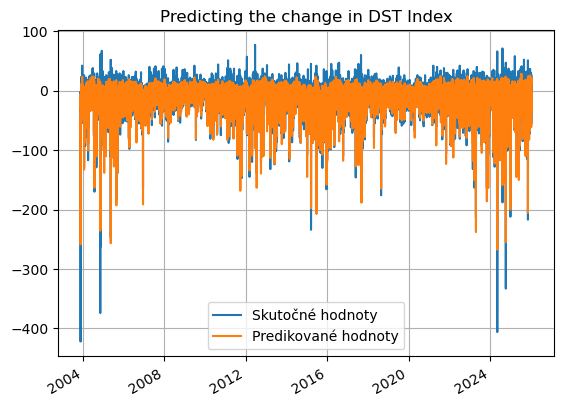

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9101101028931621
MCC=0.724727800123615
Výkon NN:
MAE: 5.2762, MSE: 66.3277
Perzistentný model:
MAE: 6.0733, MSE: 92.3306
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.12%
MSE Improvement: 28.16%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 29s 39ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

501/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 13:16 890ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

636/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 39ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

497/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step


Shapes LSTM:
train: (229338,) (229338,)
val:   (57321,) (57321,)
test:  (194182,) (194182,)
Global sigma (LSTM errors, scaled): 0.4466042
Shapes GP:
X_gp_train: (286659, 18)
y_gp_train: (286659,)
X_test_gp: (194182, 18)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.74**2 * RBF(length_scale=0.37) + WhiteKernel(noise_level=0.577)


Global sigma (LSTM errors): 9.827041
Hybrid prediction with smoothed, inflated interval ready.


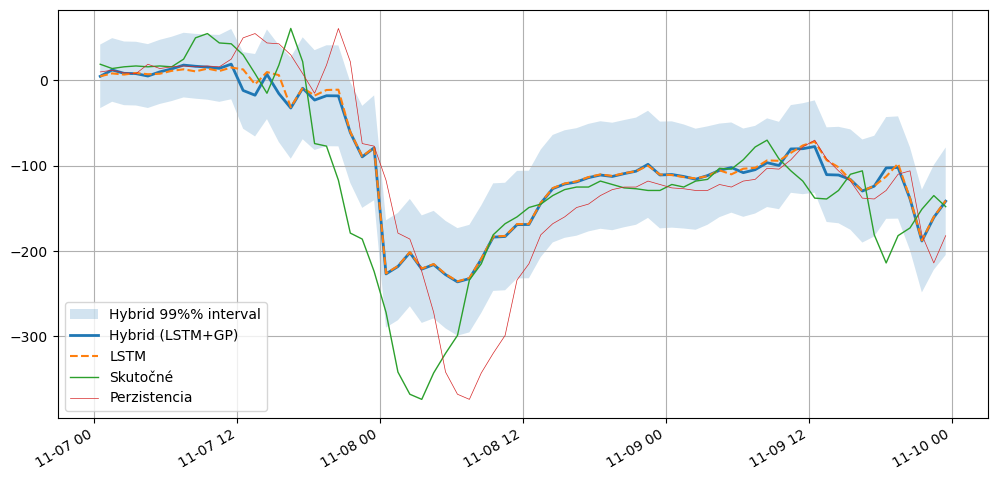

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 73.1260
MAE: 5.6310

--- Klasifikačné metriky (Prah: -19.4 nT) ---
Matthews Correlation Coefficient (MCC): 0.7078

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      143339 |        8705
Skutočná 1 |       10323 |       31808

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.93      0.94      0.94    152044
   Trieda 1 (Búrka)       0.79      0.75      0.77     42131

           accuracy                           0.90    194175
          macro avg       0.86      0.85      0.85    194175
       weighted avg       0.90      0.90      0.90    194175



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.910106862366422
MCC=0.724725321584237
Výkon NN:
MAE: 5.2762, MSE: 66.3277
Perzistentný model:
MAE: 6.0733, MSE: 92.3306
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.12%
MSE Improvement: 28.16%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9264    0.9616    0.9437    152044
           1     0.8394    0.7242    0.7776     42131

    accuracy                         0.9101    194175
   macro avg     0.8829    0.8429    0.8606    194175
weighted avg     0.9075    0.9101    0.9076    194175


===== LSTM+GP =====
ACC=0.9020059224925969
MCC=0.7077658274666662
Výkon NN:
MAE: 5.6310, MSE: 73.1260
Perzistentný model:
MAE: 6.0733, MSE: 92.3306
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 7.28%
MSE Improvement: 20.80%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9328    0.9427    0.9378    152044
           1     0.7851    0.7550    0.7698     42131

   

/tmp/ipykernel_893206/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_893206/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
38,2026-04-27T08:57:48,LSTM,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.918667,0.758048,"{""text"": "" precision recall f...",4.714845,50.685691,5.299620,68.959107,11.034291,26.498916
39,2026-04-27T08:57:48,LSTM+GP,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.914305,0.745982,"{""text"": "" precision recall f...",4.902091,55.022840,5.299620,68.959107,7.501087,20.209466
40,2026-04-27T09:24:50,LSTM,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.908771,0.723396,"{""text"": "" precision recall f...",5.388027,67.775802,6.073318,92.330027,11.283640,26.593975
41,2026-04-27T09:24:50,LSTM+GP,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.905289,0.711746,"{""text"": "" precision recall f...",5.568835,72.481960,6.073318,92.330027,8.306554,21.496871
42,2026-04-27T09:44:31,LSTM,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.908771,0.723396,"{""text"": "" precision recall f...",5.388027,67.775802,6.073318,92.330027,11.283640,26.593975
43,2026-04-27T09:44:31,LSTM+GP,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.905289,0.711746,"{""text"": "" precision recall f...",5.568835,72.481960,6.073318,92.330027,8.306554,21.496871
44,2026-04-27T10:35:39,LSTM,18.0,4.0,DST+4,OMNI2_all,-20.0,-19.4,0.910107,0.724725,"{""text"": "" precision recall f...",5.276232,66.327670,6.073274,92.330599,13.123758,28.162850
45,2026-04-27T10:35:39,LSTM+GP,18.0,4.0,DST+4,OMNI2_all,-20.0,-19.4,0.902006,0.707766,"{""text"": "" precision recall f...",5.630985,73.126020,6.073274,92.330599,7.282544,20.799799
46,2026-04-27T11:06:27,LSTM,18.0,4.0,DST+4,OMNI2_all,-20.0,-19.4,0.910107,0.724725,"{""text"": "" precision recall f...",5.276232,66.327670,6.073274,92.330599,13.123758,28.162850
47,2026-04-27T11:06:27,LSTM+GP,18.0,4.0,DST+4,OMNI2_all,-20.0,-19.4,0.902006,0.707766,"{""text"": "" precision recall f...",5.630985,73.126020,6.073274,92.330599,7.282544,20.799799
